In [5]:
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

/Users/hunglungo/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Package Preparation

In [6]:
# Import packages for scrapping from IOS App Store
from app_store_scraper import AppStore

# Import packages for data processing
import pandas as pd
import numpy as np
import json

# Import packages for topic modelling
# Reference: https://www.analyticsvidhya.com/blog/2018/10/mining-online-reviews-topic-modeling-lda/
import nltk
from nltk import FreqDist

import re
import spacy

import gensim
from gensim import corpora
from gensim.models import CoherenceModel
from gensim.utils import simple_preprocess

# libraries for visualization
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# text cleaning
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

# Wordcloud of Top N words in each topic
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

# Other pre-setting
pd.set_option("display.max_colwidth", 200)

# Function Preparation

In [7]:
# Function - Scrape review data from App Store
def app_store_scrapperNtransformer(app_name,country,how_many,export_csv_name):
    # Scrape the review data
    fetcher = AppStore(country, app_name)
    fetcher.review(how_many)
    
    # Transform data and put in DataFrame
    transformed_dataframe = pd.DataFrame(np.array(fetcher.reviews),columns=['review'])

    transformed_dataframe = transformed_dataframe.join(pd.DataFrame(transformed_dataframe.pop('review').tolist()))

    transformed_dataframe.to_csv(export_csv_name)

In [8]:
# Function - Plot most frequent terms
def freq_words(x, terms = 30):
    all_words = ' '.join([text for text in x])
    all_words = all_words.split()

    fdist = FreqDist(all_words)
    words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top 20 most frequent words
    d = words_df.nlargest(columns="count", n = terms) 
    plt.figure(figsize=(20,5))
    ax = sns.barplot(data=d, x= "word", y = "count")
    ax.set(ylabel = 'Count')
    plt.show()
    
# use for flattening out list of lists
def flatten(t):
    return [item for sublist in t for item in sublist]

In [10]:
# Text Cleaning
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\S*@\S*\s?', '', sent)  # remove emails
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        yield(sent)  

In [11]:
# !python3 -m spacy download en  # run in terminal once
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    # texts = [bigram_mod[doc] for doc in texts]
    # texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out


In [12]:
# Train LDA models and find optimal number of topics
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=100, chunksize=1000, passes=50)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Scrapping Reviews

In [13]:
'''
app_store_scrapperNtransformer(app_name="Instagram",country="sg",
                           how_many=5000,export_csv_name="instagram_data_sg.csv")
'''
# Status: Completed

'\napp_store_scrapperNtransformer(app_name="Instagram",country="sg",\n                           how_many=5000,export_csv_name="instagram_data_sg.csv")\n'

# Basic Data Preparation

In [14]:
# Import scrapped data
instagram_ios_sg_review = pd.read_csv("instagram_data_sg.csv")

In [15]:
# Inspect the data
instagram_ios_sg_review.head()

,Unnamed: 0,userName,date,rating,isEdited,review,title
0,0,claire 👁👄👁,2021-09-01 08:57:35,5,False,"i love instagram and i just wanna give some suggestions that would make instagram EVEN better. since we already have a close friends list for stories, you should really try making a close friends ...",suggestions
1,1,tyronebil29,2020-09-20 15:58:04,1,False,"The new font updates were great, the fonts look way better and there is more variety, except we can no longer have a background behind the Strong font, only shadow, which I find stupid because wha...",Annoying unnecessary updates!
2,2,angegamemaster,2019-12-24 05:16:02,2,False,I have already reported this problem many times. I understand why I was blocked but then it has been 5 days since I have been blocked on Instagram and I feel that it is ridiculous because the appa...,WHY DO I KEEP GETTING BLOCKED
3,3,your fellow no-energy wizard,2018-05-01 08:04:13,4,False,"It’s really difficult to really see my friends’ posts when everything is not in chronological order, most of the time I see posts from the same people when I really want to see everyone’s posts (t...",Bring back the old feed
4,4,Qwertyuiop Ines lol,2018-07-16 09:05:45,3,False,"Hi, i don’t know what has been happening but for some reason I couldn’t log in any of my accounts except for one account which was only able to login through Facebook. I do not have Facebook and e...",Login error


In [19]:
# Sort by date, only keep data between 2018 and 2021, clean columns
instagram_ios_sg_review_YearMonth = (instagram_ios_sg_review.copy()
                                                      .sort_values(by='date')
                                                      .reset_index()
                                                      .drop(columns=['index','Unnamed: 0'])
                                                      .query("`date` > '2017-12-31 23:59:59' and \
                                                             `date` < '2021-12-31 23:59:59'")
                                     ) 
# Remove time from date column
instagram_ios_sg_review_YearMonth['date'] = pd.to_datetime(instagram_ios_sg_review_YearMonth['date']).dt.floor('d')

# Create year column
instagram_ios_sg_review_YearMonth['year'] = pd.DatetimeIndex(instagram_ios_sg_review_YearMonth['date']).year

# Create month column
instagram_ios_sg_review_YearMonth['month'] = pd.DatetimeIndex(instagram_ios_sg_review_YearMonth['date']).month

In [20]:
# Inspect the dataframe again after cleaning
instagram_ios_sg_review_YearMonth.head()

,userName,date,rating,isEdited,review,title,year,month
300,Jeannie Goh,2018-01-01,1,False,I keep my instagram app updated and yet I dont get to enjoy the new features especially when the superzoom has been launched.\nI also dont get the holiday stickers and now is year 2018 already,Not updated,2018,1
301,Goutr,2018-01-01,2,False,i can upload photos but not videos and boomerangs.. not sure why,i cant upload videos,2018,1
302,Awesomeeeeee!!!!!,2018-01-01,5,False,Awesome app,Great,2018,1
303,Lucky Shinning Stars,2018-01-01,2,False,Love Instagram but it would be great if we could Save Pictures & Download Videos to our Handphone Photo Album,Save & Download Pictures & Videos,2018,1
304,Nelycious,2018-01-01,1,False,"I couldn’t share my insta story with close friends, no updated fonts on insta story, can’t fit in square pict on insta story. PLS HELP",I already updated latest version but don’t find any updated features,2018,1


# EDA

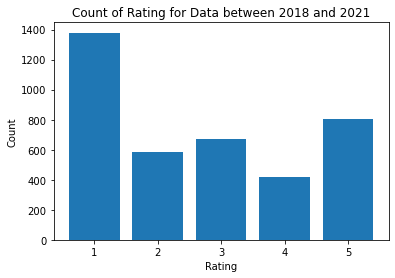

In [21]:
# Plot the count of different ratings for data between 2018 and 2021
instagram_ios_sg_review_score_count = instagram_ios_sg_review_YearMonth.groupby(['rating'])[['review']].nunique().rename(columns={'review':'count'})

plt.bar(instagram_ios_sg_review_score_count.index,instagram_ios_sg_review_score_count['count'])
plt.xlabel("Rating")
plt.ylabel("Count")
plt.title("Count of Rating for Data between 2018 and 2021")
plt.show()

Text(0.5, 1.0, 'Count of Rating for Each Year between 2018 and 2021')

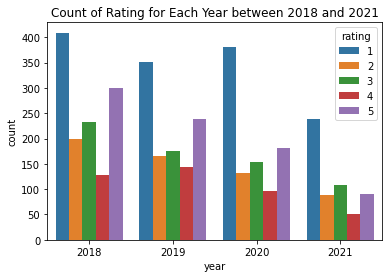

In [22]:
# Plot the count of different ratings for each year
instagram_ios_sg_review_score_count_ByYear = (instagram_ios_sg_review_YearMonth.groupby(['year','rating'])[['review']]
                                                                        .nunique()
                                                                        .rename(columns={'review':'count'})
                                                                        .reset_index()
                                              )

(sns.barplot(data=instagram_ios_sg_review_score_count_ByYear,x='year',y='count',hue='rating')
   .set_title("Count of Rating for Each Year between 2018 and 2021")
)

# Comment: extreme review score on 1 or 5

In [23]:
# Understand average ratings over year
instagram_ios_sg_review_avg_score_ByYear = (instagram_ios_sg_review_YearMonth.groupby(['year'])[['rating']]
                                                                       .mean()
                                              )

instagram_ios_sg_review_avg_score_ByYear['count'] = instagram_ios_sg_review_score_count_ByYear.groupby('year')[['count']].sum().values

print('Average ratings and count of each year:')
instagram_ios_sg_review_avg_score_ByYear

Average ratings and count of each year:


,rating,count
year,,
2018,2.770505,1268
2019,2.770736,1073
2020,2.540827,943
2021,2.420139,576


# Dataframe Preparation for Topic Modelling

In [24]:
# Dataframe with data between 2018 and 2021 without score or year filtering
instagram_ios_sg_review_YearMonth.head()

,userName,date,rating,isEdited,review,title,year,month
300,Jeannie Goh,2018-01-01,1,False,I keep my instagram app updated and yet I dont get to enjoy the new features especially when the superzoom has been launched.\nI also dont get the holiday stickers and now is year 2018 already,Not updated,2018,1
301,Goutr,2018-01-01,2,False,i can upload photos but not videos and boomerangs.. not sure why,i cant upload videos,2018,1
302,Awesomeeeeee!!!!!,2018-01-01,5,False,Awesome app,Great,2018,1
303,Lucky Shinning Stars,2018-01-01,2,False,Love Instagram but it would be great if we could Save Pictures & Download Videos to our Handphone Photo Album,Save & Download Pictures & Videos,2018,1
304,Nelycious,2018-01-01,1,False,"I couldn’t share my insta story with close friends, no updated fonts on insta story, can’t fit in square pict on insta story. PLS HELP",I already updated latest version but don’t find any updated features,2018,1


In [25]:
# Prepare dataframe for topic modelling for each score
# Obtain 5 dataframes with only score=1,2,3,4,5
instagram_ios_sg_review_YearMonth_score1 = instagram_ios_sg_review_YearMonth[instagram_ios_sg_review_YearMonth['rating']==1]
instagram_ios_sg_review_YearMonth_score2 = instagram_ios_sg_review_YearMonth[instagram_ios_sg_review_YearMonth['rating']==2]
instagram_ios_sg_review_YearMonth_score3 = instagram_ios_sg_review_YearMonth[instagram_ios_sg_review_YearMonth['rating']==3]
instagram_ios_sg_review_YearMonth_score4 = instagram_ios_sg_review_YearMonth[instagram_ios_sg_review_YearMonth['rating']==4]
instagram_ios_sg_review_YearMonth_score5 = instagram_ios_sg_review_YearMonth[instagram_ios_sg_review_YearMonth['rating']==5]


In [26]:
# Prepare dataframe for grouped score
instagram_ios_sg_review_YearMonth_score1N2N3 = instagram_ios_sg_review_YearMonth[instagram_ios_sg_review_YearMonth['rating'].isin([1,2,3])]
instagram_ios_sg_review_YearMonth_score4N5 = instagram_ios_sg_review_YearMonth[instagram_ios_sg_review_YearMonth['rating'].isin([4,5])]


In [27]:
# Prepare dataframe for topic modelling for 2018,2019,2020,2021 for score = 1,2,3
instagram_ios_sg_review_YearMonth_2018_score1N2N3 = instagram_ios_sg_review_YearMonth[(instagram_ios_sg_review_YearMonth['year']==2018)&(instagram_ios_sg_review_YearMonth['rating'].isin([1,2,3]))]
instagram_ios_sg_review_YearMonth_2019_score1N2N3 = instagram_ios_sg_review_YearMonth[(instagram_ios_sg_review_YearMonth['year']==2019)&(instagram_ios_sg_review_YearMonth['rating'].isin([1,2,3]))]
instagram_ios_sg_review_YearMonth_2020_score1N2N3 = instagram_ios_sg_review_YearMonth[(instagram_ios_sg_review_YearMonth['year']==2020)&(instagram_ios_sg_review_YearMonth['rating'].isin([1,2,3]))]
instagram_ios_sg_review_YearMonth_2021_score1N2N3 = instagram_ios_sg_review_YearMonth[(instagram_ios_sg_review_YearMonth['year']==2021)&(instagram_ios_sg_review_YearMonth['rating'].isin([1,2,3]))]




# Overall LDA Topic Modelling

In [28]:
# Overall Topic Modelling - data between 2018 and 2021 without score or year filtering
# Convert to list - move to each section
review_sg = instagram_ios_sg_review_YearMonth.review.values.tolist()
review_words_sg = list(sent_to_words(review_sg))
print(review_words_sg[:1])

[['keep', 'my', 'instagram', 'app', 'updated', 'and', 'yet', 'dont', 'get', 'to', 'enjoy', 'the', 'new', 'features', 'especially', 'when', 'the', 'superzoom', 'has', 'been', 'launched', 'also', 'dont', 'get', 'the', 'holiday', 'stickers', 'and', 'now', 'is', 'year', 'already']]


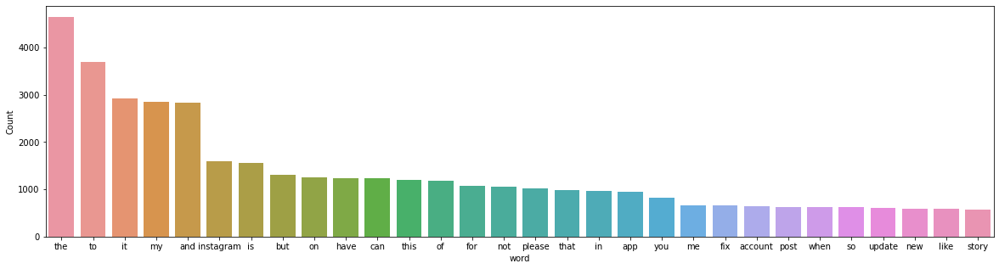

In [29]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg))

In [30]:
# Clean text
review_sg_ready = process_words(review_words_sg)  # processed Text Data! - move to each section

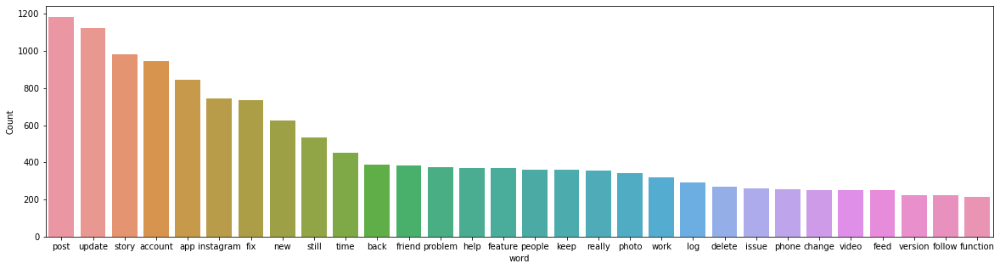

In [31]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_sg_ready))

In [32]:
# Create Dictionary
id2word_sg = corpora.Dictionary(review_sg_ready)

2021-10-16 01:48:46,368 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 01:48:46,729 [INFO] gensim.corpora.dictionary - built Dictionary(3054 unique tokens: ['already', 'enjoy', 'especially', 'feature', 'holiday']...) from 3860 documents (total 43634 corpus positions)
2021-10-16 01:48:46,775 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(3054 unique tokens: ['already', 'enjoy', 'especially', 'feature', 'holiday']...) from 3860 documents (total 43634 corpus positions)", 'datetime': '2021-10-16T01:48:46.738897', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [33]:
# Create Corpus: Term Document Frequency
corpus_sg = [id2word_sg.doc2bow(text) for text in review_sg_ready]

In [34]:
# Training LDA model
model_list_sg, coherence_values_sg = compute_coherence_values(dictionary=id2word_sg, corpus=corpus_sg, 
                                                              texts=review_sg_ready, limit=30, start=2, step=5)

# Time Start: 03:44
# Time End: 
# Time Used: 

2021-10-16 01:48:47,030 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 01:48:47,032 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 01:48:47,036 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 01:48:47,039 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 3860 documents, updating model once every 1000 documents, evaluating perplexity every 3860 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 01:48:47,041 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/3860
2021-10-16 01:48:50,224 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:48:50,271 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.025*"still" + 0.022*"post" + 0.021*"app" + 0.020*"update" + 0.020*"story" + 0.018*"instagram" + 0.015*"new" + 0.014*"feature" + 0.014*"prob

2021-10-16 01:49:10,942 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"update" + 0.033*"account" + 0.026*"fix" + 0.025*"story" + 0.023*"app" + 0.017*"still" + 0.016*"instagram" + 0.015*"new" + 0.013*"post" + 0.013*"log"
2021-10-16 01:49:10,944 [INFO] gensim.models.ldamodel - topic diff=0.360088, rho=0.381802
2021-10-16 01:49:10,946 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/3860
2021-10-16 01:49:12,658 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:49:12,662 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.046*"post" + 0.016*"story" + 0.015*"instagram" + 0.015*"back" + 0.014*"photo" + 0.012*"new" + 0.011*"people" + 0.011*"video" + 0.009*"app" + 0.009*"update"
2021-10-16 01:49:12,664 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"account" + 0.030*"update" + 0.025*"fix" + 0.024*"story" + 0.024*"app" + 0.016*"still" + 0.015*"instagram" + 0.013*"time" + 0.013*"problem" + 0.013*

2021-10-16 01:49:30,375 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"update" + 0.033*"account" + 0.026*"fix" + 0.025*"app" + 0.024*"story" + 0.018*"still" + 0.016*"instagram" + 0.013*"time" + 0.013*"problem" + 0.013*"help"
2021-10-16 01:49:30,386 [INFO] gensim.models.ldamodel - topic diff=0.305893, rho=0.335957
2021-10-16 01:49:30,391 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/3860
2021-10-16 01:49:31,801 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:49:31,805 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.049*"post" + 0.016*"photo" + 0.016*"instagram" + 0.015*"story" + 0.013*"people" + 0.013*"back" + 0.013*"new" + 0.013*"video" + 0.010*"update" + 0.010*"really"
2021-10-16 01:49:31,807 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.032*"account" + 0.027*"fix" + 0.026*"app" + 0.025*"story" + 0.021*"still" + 0.017*"instagram" + 0.015*"new" + 0.013*"time" + 0.

2021-10-16 01:49:45,237 [INFO] gensim.models.ldamodel - topic diff=0.242377, rho=0.290374
2021-10-16 01:49:45,238 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #3000/3860
2021-10-16 01:49:46,701 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:49:46,704 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"post" + 0.017*"story" + 0.016*"photo" + 0.015*"back" + 0.015*"people" + 0.015*"instagram" + 0.013*"new" + 0.012*"video" + 0.011*"update" + 0.010*"really"
2021-10-16 01:49:46,706 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"account" + 0.031*"update" + 0.028*"fix" + 0.026*"app" + 0.024*"story" + 0.019*"still" + 0.016*"instagram" + 0.015*"problem" + 0.014*"help" + 0.014*"time"
2021-10-16 01:49:46,707 [INFO] gensim.models.ldamodel - topic diff=0.262243, rho=0.290374
2021-10-16 01:49:48,559 [INFO] gensim.models.ldamodel - -6.529 per-word bound, 92.3 perplexity estimate based on a held-out corpus

2021-10-16 01:50:05,233 [INFO] gensim.models.ldamodel - topic diff=0.230502, rho=0.268608
2021-10-16 01:50:05,235 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/3860
2021-10-16 01:50:07,183 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:50:07,186 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"post" + 0.017*"story" + 0.016*"photo" + 0.015*"instagram" + 0.015*"people" + 0.013*"new" + 0.013*"back" + 0.013*"video" + 0.011*"update" + 0.010*"really"
2021-10-16 01:50:07,196 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.034*"account" + 0.028*"fix" + 0.027*"app" + 0.024*"story" + 0.022*"still" + 0.018*"instagram" + 0.014*"new" + 0.014*"problem" + 0.014*"help"
2021-10-16 01:50:07,202 [INFO] gensim.models.ldamodel - topic diff=0.203897, rho=0.259412
2021-10-16 01:50:07,215 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #2000/3860
2021-10-16 01:50:09,054 [INFO] g

2021-10-16 01:50:21,061 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #3000/3860
2021-10-16 01:50:22,277 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:50:22,303 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"post" + 0.019*"story" + 0.016*"photo" + 0.015*"people" + 0.015*"back" + 0.014*"instagram" + 0.013*"new" + 0.011*"video" + 0.011*"update" + 0.010*"really"
2021-10-16 01:50:22,318 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"account" + 0.032*"update" + 0.029*"fix" + 0.027*"app" + 0.022*"story" + 0.020*"still" + 0.017*"instagram" + 0.015*"problem" + 0.015*"help" + 0.014*"time"
2021-10-16 01:50:22,322 [INFO] gensim.models.ldamodel - topic diff=0.211877, rho=0.243541
2021-10-16 01:50:23,799 [INFO] gensim.models.ldamodel - -6.515 per-word bound, 91.4 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:50:23,800 [INFO] gensim.models.ldamodel 

2021-10-16 01:50:36,946 [INFO] gensim.models.ldamodel - topic diff=0.192789, rho=0.230266
2021-10-16 01:50:36,954 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/3860
2021-10-16 01:50:37,939 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:50:37,943 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"post" + 0.020*"story" + 0.016*"photo" + 0.015*"instagram" + 0.015*"people" + 0.013*"new" + 0.013*"back" + 0.012*"video" + 0.011*"update" + 0.010*"really"
2021-10-16 01:50:37,947 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.036*"account" + 0.029*"fix" + 0.027*"app" + 0.022*"still" + 0.022*"story" + 0.018*"instagram" + 0.014*"problem" + 0.014*"new" + 0.014*"help"
2021-10-16 01:50:37,950 [INFO] gensim.models.ldamodel - topic diff=0.171876, rho=0.224394
2021-10-16 01:50:37,952 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3860
2021-10-16 01:50:39,282 [INFO] g

2021-10-16 01:50:52,331 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #3000/3860
2021-10-16 01:50:53,326 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:50:53,330 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"post" + 0.021*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"back" + 0.014*"instagram" + 0.013*"new" + 0.011*"update" + 0.011*"video" + 0.010*"really"
2021-10-16 01:50:53,340 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"account" + 0.033*"update" + 0.029*"fix" + 0.027*"app" + 0.021*"still" + 0.020*"story" + 0.017*"instagram" + 0.015*"problem" + 0.015*"help" + 0.014*"time"
2021-10-16 01:50:53,358 [INFO] gensim.models.ldamodel - topic diff=0.181980, rho=0.213882
2021-10-16 01:50:54,626 [INFO] gensim.models.ldamodel - -6.507 per-word bound, 90.9 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:50:54,651 [INFO] gensim.models.ldamodel 

2021-10-16 01:51:08,309 [INFO] gensim.models.ldamodel - topic diff=0.168767, rho=0.204722
2021-10-16 01:51:08,311 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/3860
2021-10-16 01:51:09,184 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:51:09,187 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"post" + 0.022*"story" + 0.016*"photo" + 0.015*"people" + 0.015*"instagram" + 0.013*"new" + 0.013*"back" + 0.012*"video" + 0.012*"update" + 0.010*"really"
2021-10-16 01:51:09,191 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.036*"account" + 0.029*"fix" + 0.027*"app" + 0.023*"still" + 0.020*"story" + 0.018*"instagram" + 0.014*"problem" + 0.014*"help" + 0.014*"new"
2021-10-16 01:51:09,198 [INFO] gensim.models.ldamodel - topic diff=0.151393, rho=0.200562
2021-10-16 01:51:09,202 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #2000/3860
2021-10-16 01:51:10,100 [INFO] g

2021-10-16 01:51:21,453 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #3000/3860
2021-10-16 01:51:22,562 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:51:22,568 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"post" + 0.022*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"back" + 0.014*"instagram" + 0.013*"new" + 0.011*"update" + 0.011*"video" + 0.010*"really"
2021-10-16 01:51:22,571 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"account" + 0.033*"update" + 0.029*"fix" + 0.027*"app" + 0.021*"still" + 0.020*"story" + 0.017*"instagram" + 0.016*"problem" + 0.015*"help" + 0.014*"time"
2021-10-16 01:51:22,572 [INFO] gensim.models.ldamodel - topic diff=0.161816, rho=0.192951
2021-10-16 01:51:24,056 [INFO] gensim.models.ldamodel - -6.501 per-word bound, 90.6 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:51:24,057 [INFO] gensim.models.ldamodel 

2021-10-16 01:51:37,876 [INFO] gensim.models.ldamodel - topic diff=0.151736, rho=0.186145
2021-10-16 01:51:37,891 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1000/3860
2021-10-16 01:51:39,218 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:51:39,222 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"post" + 0.023*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"instagram" + 0.013*"new" + 0.013*"back" + 0.012*"video" + 0.012*"update" + 0.010*"really"
2021-10-16 01:51:39,224 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.037*"account" + 0.029*"fix" + 0.027*"app" + 0.023*"still" + 0.020*"story" + 0.018*"instagram" + 0.015*"problem" + 0.015*"help" + 0.014*"time"
2021-10-16 01:51:39,230 [INFO] gensim.models.ldamodel - topic diff=0.136626, rho=0.183002
2021-10-16 01:51:39,231 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #2000/3860
2021-10-16 01:51:40,330 [INFO] 

2021-10-16 01:51:52,247 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/3860
2021-10-16 01:51:53,578 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:51:53,581 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"post" + 0.023*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"back" + 0.014*"instagram" + 0.013*"new" + 0.011*"update" + 0.011*"video" + 0.010*"really"
2021-10-16 01:51:53,584 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"account" + 0.034*"update" + 0.030*"fix" + 0.027*"app" + 0.021*"still" + 0.019*"story" + 0.017*"instagram" + 0.016*"problem" + 0.015*"help" + 0.015*"time"
2021-10-16 01:51:53,587 [INFO] gensim.models.ldamodel - topic diff=0.146927, rho=0.177165
2021-10-16 01:51:55,278 [INFO] gensim.models.ldamodel - -6.497 per-word bound, 90.3 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:51:55,281 [INFO] gensim.models.ldamodel 

2021-10-16 01:52:09,713 [INFO] gensim.models.ldamodel - topic diff=0.138888, rho=0.171853
2021-10-16 01:52:09,716 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1000/3860
2021-10-16 01:52:10,693 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:52:10,701 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"post" + 0.023*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"instagram" + 0.013*"new" + 0.013*"back" + 0.012*"video" + 0.012*"update" + 0.010*"really"
2021-10-16 01:52:10,704 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.037*"account" + 0.030*"fix" + 0.027*"app" + 0.023*"still" + 0.019*"story" + 0.018*"instagram" + 0.015*"problem" + 0.015*"help" + 0.014*"time"
2021-10-16 01:52:10,706 [INFO] gensim.models.ldamodel - topic diff=0.125345, rho=0.169370
2021-10-16 01:52:10,708 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/3860
2021-10-16 01:52:11,700 [INFO] 

2021-10-16 01:52:22,512 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #3000/3860
2021-10-16 01:52:23,738 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:52:23,741 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"post" + 0.023*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"back" + 0.014*"instagram" + 0.013*"new" + 0.011*"update" + 0.011*"video" + 0.010*"really"
2021-10-16 01:52:23,744 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"account" + 0.034*"update" + 0.030*"fix" + 0.027*"app" + 0.021*"still" + 0.019*"story" + 0.017*"instagram" + 0.016*"problem" + 0.015*"help" + 0.015*"time"
2021-10-16 01:52:23,746 [INFO] gensim.models.ldamodel - topic diff=0.135392, rho=0.164711
2021-10-16 01:52:25,324 [INFO] gensim.models.ldamodel - -6.494 per-word bound, 90.1 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:52:25,325 [INFO] gensim.models.ldamodel 

2021-10-16 01:52:39,956 [INFO] gensim.models.ldamodel - topic diff=0.128733, rho=0.160416
2021-10-16 01:52:39,963 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/3860
2021-10-16 01:52:41,147 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:52:41,152 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"post" + 0.023*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"instagram" + 0.013*"new" + 0.013*"back" + 0.012*"video" + 0.012*"update" + 0.010*"really"
2021-10-16 01:52:41,171 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"account" + 0.037*"update" + 0.030*"fix" + 0.027*"app" + 0.022*"still" + 0.019*"story" + 0.018*"instagram" + 0.015*"problem" + 0.015*"help" + 0.014*"time"
2021-10-16 01:52:41,179 [INFO] gensim.models.ldamodel - topic diff=0.116366, rho=0.158391
2021-10-16 01:52:41,205 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #2000/3860
2021-10-16 01:52:42,340 [INFO] 

2021-10-16 01:52:52,450 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #3000/3860
2021-10-16 01:52:53,297 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:52:53,311 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"post" + 0.024*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"back" + 0.014*"instagram" + 0.013*"new" + 0.011*"update" + 0.011*"video" + 0.010*"really"
2021-10-16 01:52:53,316 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"account" + 0.034*"update" + 0.030*"fix" + 0.027*"app" + 0.021*"still" + 0.018*"story" + 0.017*"instagram" + 0.016*"problem" + 0.015*"help" + 0.015*"time"
2021-10-16 01:52:53,318 [INFO] gensim.models.ldamodel - topic diff=0.126175, rho=0.154561
2021-10-16 01:52:54,443 [INFO] gensim.models.ldamodel - -6.491 per-word bound, 90.0 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:52:54,444 [INFO] gensim.models.ldamodel 

2021-10-16 01:53:04,451 [INFO] gensim.models.ldamodel - topic diff=0.120329, rho=0.150996
2021-10-16 01:53:04,453 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #1000/3860
2021-10-16 01:53:05,360 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:53:05,363 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"post" + 0.024*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"instagram" + 0.013*"new" + 0.013*"back" + 0.012*"video" + 0.012*"update" + 0.010*"really"
2021-10-16 01:53:05,370 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"account" + 0.037*"update" + 0.030*"fix" + 0.027*"app" + 0.022*"still" + 0.019*"story" + 0.018*"instagram" + 0.015*"problem" + 0.015*"help" + 0.014*"time"
2021-10-16 01:53:05,374 [INFO] gensim.models.ldamodel - topic diff=0.109015, rho=0.149304
2021-10-16 01:53:05,376 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #2000/3860
2021-10-16 01:53:06,220 [INFO] 

2021-10-16 01:53:15,542 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #3000/3860
2021-10-16 01:53:16,452 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:53:16,455 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"post" + 0.024*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"back" + 0.014*"instagram" + 0.013*"new" + 0.011*"update" + 0.011*"video" + 0.010*"really"
2021-10-16 01:53:16,462 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"account" + 0.034*"update" + 0.030*"fix" + 0.027*"app" + 0.021*"still" + 0.018*"story" + 0.017*"instagram" + 0.015*"problem" + 0.015*"help" + 0.015*"time"
2021-10-16 01:53:16,464 [INFO] gensim.models.ldamodel - topic diff=0.118552, rho=0.146083
2021-10-16 01:53:17,608 [INFO] gensim.models.ldamodel - -6.489 per-word bound, 89.8 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:53:17,610 [INFO] gensim.models.ldamodel 

2021-10-16 01:53:27,600 [INFO] gensim.models.ldamodel - topic diff=0.113418, rho=0.143062
2021-10-16 01:53:27,602 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #1000/3860
2021-10-16 01:53:28,571 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:53:28,573 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"post" + 0.024*"story" + 0.016*"photo" + 0.015*"people" + 0.014*"instagram" + 0.013*"new" + 0.013*"back" + 0.012*"video" + 0.012*"update" + 0.010*"really"
2021-10-16 01:53:28,576 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"account" + 0.037*"update" + 0.030*"fix" + 0.027*"app" + 0.022*"still" + 0.019*"story" + 0.018*"instagram" + 0.015*"problem" + 0.015*"help" + 0.014*"time"
2021-10-16 01:53:28,577 [INFO] gensim.models.ldamodel - topic diff=0.102865, rho=0.141620
2021-10-16 01:53:28,579 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #2000/3860
2021-10-16 01:53:29,509 [INFO] 

2021-10-16 01:53:38,939 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #3000/3860
2021-10-16 01:53:39,773 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:53:39,775 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"post" + 0.024*"story" + 0.015*"photo" + 0.015*"people" + 0.014*"back" + 0.014*"instagram" + 0.013*"new" + 0.012*"update" + 0.011*"video" + 0.010*"really"
2021-10-16 01:53:39,777 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"account" + 0.034*"update" + 0.030*"fix" + 0.027*"app" + 0.021*"still" + 0.018*"story" + 0.018*"instagram" + 0.015*"problem" + 0.015*"help" + 0.015*"time"
2021-10-16 01:53:39,778 [INFO] gensim.models.ldamodel - topic diff=0.112144, rho=0.138862
2021-10-16 01:53:40,840 [INFO] gensim.models.ldamodel - -6.488 per-word bound, 89.7 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:53:40,841 [INFO] gensim.models.ldamodel 

2021-10-16 01:53:51,962 [INFO] gensim.models.ldamodel - topic diff=0.107579, rho=0.136260
2021-10-16 01:53:51,963 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=3054, num_topics=2, decay=0.5, chunksize=1000) in 304.92s', 'datetime': '2021-10-16T01:53:51.963707', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 01:53:51,967 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 01:53:56,936 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 01:53:56,977 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 3503 virtual documents
2021-10-16 01:53:57,379 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-

2021-10-16 01:54:07,639 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.053*"update" + 0.032*"new" + 0.031*"account" + 0.031*"instagram" + 0.020*"fix" + 0.015*"app" + 0.014*"message" + 0.013*"story" + 0.013*"people" + 0.012*"font"
2021-10-16 01:54:07,642 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.055*"story" + 0.038*"post" + 0.024*"back" + 0.022*"instagram" + 0.017*"new" + 0.016*"friend" + 0.016*"feed" + 0.014*"love" + 0.013*"share" + 0.011*"update"
2021-10-16 01:54:07,644 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.055*"fix" + 0.039*"story" + 0.038*"update" + 0.026*"app" + 0.018*"work" + 0.018*"load" + 0.015*"time" + 0.014*"video" + 0.014*"problem" + 0.013*"bug"
2021-10-16 01:54:07,647 [INFO] gensim.models.ldamodel - topic diff=0.380530, rho=0.413096
2021-10-16 01:54:07,650 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #2000/3860
2021-10-16 01:54:09,008 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documen

2021-10-16 01:54:15,602 [INFO] gensim.models.ldamodel - topic diff=0.270723, rho=0.381802
2021-10-16 01:54:15,603 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/3860
2021-10-16 01:54:16,985 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:54:16,990 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"app" + 0.037*"account" + 0.025*"log" + 0.025*"still" + 0.023*"phone" + 0.022*"fix" + 0.021*"update" + 0.018*"work" + 0.017*"help" + 0.017*"problem"
2021-10-16 01:54:16,992 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"story" + 0.055*"post" + 0.032*"back" + 0.019*"feed" + 0.019*"instagram" + 0.018*"new" + 0.018*"friend" + 0.016*"share" + 0.016*"view" + 0.016*"bring"
2021-10-16 01:54:16,995 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.082*"post" + 0.037*"photo" + 0.033*"account" + 0.017*"delete" + 0.017*"time" + 0.016*"remove" + 0.014*"picture" + 0.012*"really" + 0.012*"multiple" + 0.01

2021-10-16 01:54:26,257 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.088*"post" + 0.046*"photo" + 0.026*"account" + 0.018*"remove" + 0.015*"time" + 0.015*"multiple" + 0.014*"delete" + 0.014*"picture" + 0.013*"tag" + 0.012*"video"
2021-10-16 01:54:26,266 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.064*"update" + 0.036*"new" + 0.028*"account" + 0.025*"instagram" + 0.020*"notification" + 0.020*"message" + 0.019*"late" + 0.017*"version" + 0.016*"still" + 0.014*"reel"
2021-10-16 01:54:26,271 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.055*"post" + 0.054*"story" + 0.030*"back" + 0.019*"new" + 0.018*"feed" + 0.018*"instagram" + 0.018*"view" + 0.017*"friend" + 0.016*"share" + 0.015*"people"
2021-10-16 01:54:26,282 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.057*"fix" + 0.043*"story" + 0.031*"app" + 0.031*"update" + 0.025*"load" + 0.020*"bug" + 0.019*"video" + 0.019*"keep" + 0.018*"work" + 0.015*"problem"
2021-10-16 01:54:26,286 [INFO] gensim.models.ldamodel - top

2021-10-16 01:54:33,104 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.090*"post" + 0.045*"photo" + 0.026*"account" + 0.016*"time" + 0.015*"remove" + 0.015*"picture" + 0.014*"video" + 0.013*"multiple" + 0.013*"delete" + 0.013*"upload"
2021-10-16 01:54:33,106 [INFO] gensim.models.ldamodel - topic diff=0.156223, rho=0.318465
2021-10-16 01:54:33,108 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #2000/3860
2021-10-16 01:54:34,241 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:54:34,245 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.060*"post" + 0.057*"story" + 0.033*"back" + 0.022*"view" + 0.021*"new" + 0.021*"feed" + 0.018*"instagram" + 0.018*"friend" + 0.016*"bring" + 0.015*"share"
2021-10-16 01:54:34,249 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.049*"account" + 0.038*"app" + 0.036*"log" + 0.026*"fix" + 0.024*"still" + 0.023*"phone" + 0.022*"problem" + 0.021*"help" + 0.019*"delete" + 0.0

2021-10-16 01:54:40,875 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.054*"account" + 0.039*"app" + 0.032*"log" + 0.026*"fix" + 0.026*"problem" + 0.024*"phone" + 0.023*"still" + 0.021*"help" + 0.019*"work" + 0.018*"delete"
2021-10-16 01:54:40,877 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.062*"fix" + 0.046*"story" + 0.032*"app" + 0.026*"update" + 0.023*"bug" + 0.023*"load" + 0.021*"video" + 0.021*"keep" + 0.018*"work" + 0.018*"crash"
2021-10-16 01:54:40,879 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.087*"post" + 0.047*"photo" + 0.025*"account" + 0.018*"picture" + 0.015*"time" + 0.015*"delete" + 0.015*"remove" + 0.013*"video" + 0.013*"upload" + 0.012*"multiple"
2021-10-16 01:54:40,882 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.063*"post" + 0.057*"story" + 0.033*"back" + 0.021*"view" + 0.021*"feed" + 0.019*"new" + 0.018*"friend" + 0.018*"instagram" + 0.016*"people" + 0.016*"share"
2021-10-16 01:54:40,885 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0

2021-10-16 01:54:48,557 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.034*"ad" + 0.033*"music" + 0.024*"comment" + 0.023*"button" + 0.023*"instagram" + 0.016*"play" + 0.011*"singapore" + 0.011*"business" + 0.010*"available" + 0.010*"irritate"
2021-10-16 01:54:48,561 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.090*"post" + 0.051*"photo" + 0.022*"account" + 0.018*"picture" + 0.016*"remove" + 0.014*"multiple" + 0.014*"time" + 0.013*"upload" + 0.013*"delete" + 0.012*"tag"
2021-10-16 01:54:48,566 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.062*"post" + 0.056*"story" + 0.032*"back" + 0.021*"view" + 0.020*"feed" + 0.019*"new" + 0.018*"friend" + 0.018*"instagram" + 0.017*"people" + 0.017*"share"
2021-10-16 01:54:48,570 [INFO] gensim.models.ldamodel - topic diff=0.126843, rho=0.290374
2021-10-16 01:54:48,576 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #1000/3860
2021-10-16 01:54:49,688 [INFO] gensim.models.ldamodel - merging changes from 1000 documents in

2021-10-16 01:54:55,283 [INFO] gensim.models.ldamodel - topic diff=0.117491, rho=0.268608
2021-10-16 01:54:55,285 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #2000/3860
2021-10-16 01:54:56,608 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:54:56,618 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.034*"music" + 0.028*"ad" + 0.022*"comment" + 0.021*"instagram" + 0.019*"button" + 0.018*"play" + 0.012*"available" + 0.010*"useless" + 0.010*"irritate" + 0.010*"business"
2021-10-16 01:54:56,622 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.087*"update" + 0.050*"new" + 0.030*"still" + 0.027*"version" + 0.025*"instagram" + 0.025*"late" + 0.018*"font" + 0.017*"account" + 0.017*"story" + 0.015*"message"
2021-10-16 01:54:56,625 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.090*"post" + 0.050*"photo" + 0.022*"account" + 0.019*"picture" + 0.016*"upload" + 0.014*"remove" + 0.014*"video" + 0.014*"delete

2021-10-16 01:55:03,360 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.044*"feature" + 0.023*"app" + 0.022*"highlight" + 0.021*"account" + 0.021*"instagram" + 0.016*"music" + 0.014*"update" + 0.014*"friend" + 0.014*"sticker" + 0.013*"user"
2021-10-16 01:55:03,363 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.062*"account" + 0.037*"app" + 0.032*"log" + 0.029*"problem" + 0.026*"fix" + 0.023*"phone" + 0.022*"help" + 0.021*"still" + 0.019*"work" + 0.019*"delete"
2021-10-16 01:55:03,365 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.031*"music" + 0.030*"ad" + 0.027*"comment" + 0.023*"instagram" + 0.018*"play" + 0.017*"button" + 0.012*"business" + 0.011*"people" + 0.010*"available" + 0.009*"stupid"
2021-10-16 01:55:03,367 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.082*"update" + 0.048*"new" + 0.030*"still" + 0.026*"version" + 0.024*"instagram" + 0.024*"late" + 0.020*"notification" + 0.019*"font" + 0.017*"story" + 0.016*"account"
2021-10-16 01:55:03,368 [INFO] gensim.

2021-10-16 01:55:10,928 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.060*"fix" + 0.046*"story" + 0.035*"app" + 0.027*"load" + 0.025*"bug" + 0.025*"update" + 0.022*"video" + 0.020*"work" + 0.020*"keep" + 0.015*"crash"
2021-10-16 01:55:10,966 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.085*"update" + 0.047*"new" + 0.029*"still" + 0.026*"version" + 0.025*"late" + 0.024*"instagram" + 0.023*"notification" + 0.017*"message" + 0.017*"story" + 0.016*"account"
2021-10-16 01:55:10,967 [INFO] gensim.models.ldamodel - topic diff=0.102857, rho=0.251101
2021-10-16 01:55:10,968 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/3860
2021-10-16 01:55:11,931 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:55:11,970 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.092*"post" + 0.051*"photo" + 0.021*"account" + 0.020*"picture" + 0.015*"upload" + 0.014*"remove" + 0.014*"time" + 0.013*"video" + 0.013*"multi

2021-10-16 01:55:17,904 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #2000/3860
2021-10-16 01:55:19,176 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:55:19,219 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.064*"fix" + 0.049*"story" + 0.034*"app" + 0.027*"load" + 0.026*"bug" + 0.024*"update" + 0.022*"video" + 0.020*"work" + 0.019*"keep" + 0.015*"crash"
2021-10-16 01:55:19,224 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"account" + 0.036*"app" + 0.036*"log" + 0.029*"problem" + 0.027*"fix" + 0.023*"help" + 0.022*"phone" + 0.021*"still" + 0.020*"work" + 0.019*"delete"
2021-10-16 01:55:19,226 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.046*"feature" + 0.026*"highlight" + 0.024*"app" + 0.022*"instagram" + 0.018*"account" + 0.018*"music" + 0.017*"sticker" + 0.015*"really" + 0.015*"question" + 0.014*"poll"
2021-10-16 01:55:19,228 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.091

2021-10-16 01:55:25,593 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.043*"feature" + 0.025*"app" + 0.022*"highlight" + 0.022*"instagram" + 0.018*"music" + 0.017*"account" + 0.014*"really" + 0.014*"sticker" + 0.014*"friend" + 0.013*"love"
2021-10-16 01:55:25,595 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.063*"fix" + 0.049*"story" + 0.034*"app" + 0.026*"bug" + 0.025*"load" + 0.023*"update" + 0.022*"video" + 0.020*"work" + 0.020*"keep" + 0.017*"crash"
2021-10-16 01:55:25,597 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.087*"post" + 0.050*"photo" + 0.023*"picture" + 0.020*"account" + 0.015*"delete" + 0.014*"upload" + 0.014*"remove" + 0.014*"time" + 0.013*"video" + 0.011*"follower"
2021-10-16 01:55:25,600 [INFO] gensim.models.ldamodel - topic diff=0.085044, rho=0.230266
2021-10-16 01:55:26,922 [INFO] gensim.models.ldamodel - -6.739 per-word bound, 106.8 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:55:26,924 [INFO] gens

2021-10-16 01:55:35,105 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"account" + 0.038*"app" + 0.029*"log" + 0.029*"problem" + 0.026*"fix" + 0.023*"help" + 0.022*"work" + 0.022*"phone" + 0.021*"still" + 0.019*"delete"
2021-10-16 01:55:35,107 [INFO] gensim.models.ldamodel - topic diff=0.088975, rho=0.224394
2021-10-16 01:55:35,110 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/3860
2021-10-16 01:55:36,082 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:55:36,096 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.093*"update" + 0.053*"new" + 0.036*"still" + 0.027*"late" + 0.027*"version" + 0.026*"instagram" + 0.021*"font" + 0.019*"story" + 0.018*"notification" + 0.017*"gif"
2021-10-16 01:55:36,097 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.066*"account" + 0.038*"app" + 0.030*"problem" + 0.028*"log" + 0.027*"fix" + 0.022*"help" + 0.022*"phone" + 0.022*"work" + 0.021*"still" + 0.019*

2021-10-16 01:55:43,034 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.063*"fix" + 0.049*"story" + 0.034*"app" + 0.028*"load" + 0.027*"bug" + 0.024*"update" + 0.022*"video" + 0.019*"work" + 0.018*"keep" + 0.015*"crash"
2021-10-16 01:55:43,038 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.090*"post" + 0.052*"photo" + 0.022*"picture" + 0.018*"account" + 0.016*"upload" + 0.014*"remove" + 0.014*"delete" + 0.014*"video" + 0.013*"time" + 0.013*"multiple"
2021-10-16 01:55:43,041 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.094*"update" + 0.054*"new" + 0.034*"still" + 0.028*"version" + 0.027*"late" + 0.026*"instagram" + 0.019*"story" + 0.018*"font" + 0.017*"notification" + 0.015*"gif"
2021-10-16 01:55:43,043 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.030*"ad" + 0.027*"music" + 0.021*"button" + 0.021*"instagram" + 0.018*"play" + 0.018*"comment" + 0.010*"put" + 0.010*"much" + 0.010*"irritate" + 0.010*"useless"
2021-10-16 01:55:43,045 [INFO] gensim.models.ldamodel - top

2021-10-16 01:55:52,123 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.043*"feature" + 0.026*"app" + 0.023*"instagram" + 0.023*"highlight" + 0.021*"music" + 0.015*"account" + 0.014*"love" + 0.014*"really" + 0.014*"sticker" + 0.014*"friend"
2021-10-16 01:55:52,124 [INFO] gensim.models.ldamodel - topic diff=0.075424, rho=0.209152
2021-10-16 01:55:53,536 [INFO] gensim.models.ldamodel - -6.730 per-word bound, 106.2 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:55:53,542 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #3860/3860
2021-10-16 01:55:54,476 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 01:55:54,495 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"feature" + 0.027*"app" + 0.023*"instagram" + 0.023*"music" + 0.020*"highlight" + 0.015*"account" + 0.015*"really" + 0.014*"love" + 0.013*"user" + 0.013*"sticker"
2021-10-16 01:55:54,501 [INFO] gensi

2021-10-16 01:56:01,127 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:56:01,133 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.096*"update" + 0.053*"new" + 0.037*"still" + 0.027*"late" + 0.027*"version" + 0.026*"instagram" + 0.021*"font" + 0.020*"story" + 0.019*"notification" + 0.017*"gif"
2021-10-16 01:56:01,137 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.091*"post" + 0.052*"photo" + 0.022*"picture" + 0.017*"account" + 0.015*"upload" + 0.015*"remove" + 0.014*"time" + 0.013*"video" + 0.013*"delete" + 0.012*"multiple"
2021-10-16 01:56:01,143 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.062*"fix" + 0.049*"story" + 0.034*"app" + 0.028*"load" + 0.027*"bug" + 0.024*"update" + 0.023*"video" + 0.019*"work" + 0.019*"keep" + 0.016*"crash"
2021-10-16 01:56:01,145 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.045*"feature" + 0.027*"highlight" + 0.026*"app" + 0.024*"instagram" + 0.020*"music" + 0.017*"stic

2021-10-16 01:56:10,691 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.044*"feature" + 0.026*"app" + 0.026*"highlight" + 0.025*"instagram" + 0.025*"music" + 0.016*"sticker" + 0.015*"really" + 0.015*"love" + 0.014*"question" + 0.014*"account"
2021-10-16 01:56:10,693 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.091*"post" + 0.052*"photo" + 0.023*"picture" + 0.016*"account" + 0.016*"upload" + 0.014*"remove" + 0.014*"delete" + 0.013*"video" + 0.013*"time" + 0.012*"multiple"
2021-10-16 01:56:10,695 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.097*"update" + 0.054*"new" + 0.035*"still" + 0.028*"version" + 0.027*"late" + 0.025*"instagram" + 0.019*"story" + 0.018*"font" + 0.017*"notification" + 0.015*"gif"
2021-10-16 01:56:10,696 [INFO] gensim.models.ldamodel - topic diff=0.076083, rho=0.196646
2021-10-16 01:56:10,698 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #3000/3860
2021-10-16 01:56:11,742 [INFO] gensim.models.ldamodel - merging changes from 1000 doc

2021-10-16 01:56:17,807 [INFO] gensim.models.ldamodel - topic diff=0.068673, rho=0.192951
2021-10-16 01:56:20,250 [INFO] gensim.models.ldamodel - -6.724 per-word bound, 105.7 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:56:20,252 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #3860/3860
2021-10-16 01:56:21,873 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 01:56:21,877 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"ad" + 0.025*"button" + 0.019*"instagram" + 0.019*"comment" + 0.017*"play" + 0.015*"music" + 0.011*"singapore" + 0.011*"suggest" + 0.011*"irritate" + 0.010*"put"
2021-10-16 01:56:21,879 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.065*"post" + 0.055*"story" + 0.034*"back" + 0.023*"view" + 0.021*"feed" + 0.020*"new" + 0.020*"friend" + 0.019*"people" + 0.017*"share" + 0.017*"instagram"
2021-10-16 01:56:21,881 [INFO] gensim.models.ldamo

2021-10-16 01:56:30,244 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.063*"post" + 0.057*"story" + 0.033*"back" + 0.022*"feed" + 0.021*"view" + 0.020*"new" + 0.020*"friend" + 0.020*"people" + 0.017*"instagram" + 0.017*"share"
2021-10-16 01:56:30,246 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.071*"account" + 0.038*"app" + 0.030*"problem" + 0.028*"log" + 0.027*"fix" + 0.023*"help" + 0.022*"work" + 0.022*"phone" + 0.021*"still" + 0.019*"time"
2021-10-16 01:56:30,249 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.032*"ad" + 0.024*"button" + 0.020*"play" + 0.019*"comment" + 0.018*"instagram" + 0.013*"music" + 0.011*"auto" + 0.011*"much" + 0.010*"put" + 0.010*"singapore"
2021-10-16 01:56:30,250 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.044*"feature" + 0.027*"highlight" + 0.026*"app" + 0.025*"instagram" + 0.023*"music" + 0.017*"sticker" + 0.016*"question" + 0.015*"poll" + 0.015*"love" + 0.014*"really"
2021-10-16 01:56:30,251 [INFO] gensim.models.ldamodel - topic 

2021-10-16 01:56:39,014 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.043*"feature" + 0.027*"music" + 0.026*"app" + 0.026*"highlight" + 0.025*"instagram" + 0.016*"sticker" + 0.015*"love" + 0.015*"really" + 0.014*"question" + 0.014*"user"
2021-10-16 01:56:39,015 [INFO] gensim.models.ldamodel - topic diff=0.069886, rho=0.183002
2021-10-16 01:56:39,016 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #3000/3860
2021-10-16 01:56:40,003 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:56:40,007 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"feature" + 0.027*"music" + 0.026*"app" + 0.025*"instagram" + 0.023*"highlight" + 0.016*"love" + 0.014*"sticker" + 0.014*"really" + 0.014*"user" + 0.013*"friend"
2021-10-16 01:56:40,009 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.088*"post" + 0.051*"photo" + 0.024*"picture" + 0.016*"account" + 0.015*"remove" + 0.014*"delete" + 0.014*"upload" + 0.014*"time

2021-10-16 01:56:47,332 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 01:56:47,367 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"feature" + 0.029*"music" + 0.027*"app" + 0.025*"instagram" + 0.021*"highlight" + 0.015*"love" + 0.014*"really" + 0.014*"user" + 0.013*"sticker" + 0.013*"account"
2021-10-16 01:56:47,369 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.060*"fix" + 0.047*"story" + 0.035*"app" + 0.028*"load" + 0.026*"bug" + 0.024*"update" + 0.022*"video" + 0.019*"keep" + 0.018*"work" + 0.015*"crash"
2021-10-16 01:56:47,371 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.065*"post" + 0.055*"story" + 0.034*"back" + 0.023*"view" + 0.021*"feed" + 0.020*"new" + 0.020*"friend" + 0.019*"people" + 0.017*"share" + 0.017*"instagram"
2021-10-16 01:56:47,373 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.090*"post" + 0.054*"photo" + 0.023*"picture" + 0.016*"remove" + 0.015*"account" + 0.014*"upload" + 0.01

2021-10-16 01:56:53,020 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.091*"post" + 0.052*"photo" + 0.023*"picture" + 0.015*"account" + 0.015*"remove" + 0.015*"upload" + 0.014*"time" + 0.013*"video" + 0.013*"delete" + 0.012*"multiple"
2021-10-16 01:56:53,022 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.072*"account" + 0.038*"app" + 0.030*"problem" + 0.028*"log" + 0.026*"fix" + 0.023*"help" + 0.022*"work" + 0.022*"phone" + 0.021*"still" + 0.020*"time"
2021-10-16 01:56:53,024 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.060*"fix" + 0.048*"story" + 0.035*"app" + 0.027*"load" + 0.027*"bug" + 0.024*"update" + 0.023*"video" + 0.019*"work" + 0.019*"keep" + 0.016*"crash"
2021-10-16 01:56:53,025 [INFO] gensim.models.ldamodel - topic diff=0.068333, rho=0.174448
2021-10-16 01:56:53,027 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #2000/3860
2021-10-16 01:56:53,927 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 document

2021-10-16 01:56:58,699 [INFO] gensim.models.ldamodel - topic diff=0.065014, rho=0.171853
2021-10-16 01:56:58,705 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #3000/3860
2021-10-16 01:56:59,655 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:56:59,660 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.033*"ad" + 0.024*"button" + 0.022*"comment" + 0.019*"play" + 0.017*"instagram" + 0.013*"suggest" + 0.011*"much" + 0.010*"irritate" + 0.010*"stupid" + 0.010*"people"
2021-10-16 01:56:59,665 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.097*"update" + 0.053*"new" + 0.034*"still" + 0.028*"version" + 0.026*"late" + 0.024*"instagram" + 0.021*"notification" + 0.019*"story" + 0.019*"font" + 0.015*"app"
2021-10-16 01:56:59,667 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.075*"account" + 0.037*"app" + 0.031*"log" + 0.030*"problem" + 0.026*"fix" + 0.023*"help" + 0.022*"phone" + 0.021*"work" + 0.020*"sti

2021-10-16 01:57:07,250 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.098*"update" + 0.052*"new" + 0.033*"still" + 0.027*"version" + 0.027*"late" + 0.024*"instagram" + 0.023*"notification" + 0.019*"story" + 0.017*"font" + 0.016*"message"
2021-10-16 01:57:07,252 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"ad" + 0.029*"button" + 0.019*"comment" + 0.018*"play" + 0.016*"instagram" + 0.012*"singapore" + 0.012*"suggest" + 0.011*"irritate" + 0.010*"put" + 0.010*"ban"
2021-10-16 01:57:07,254 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.065*"post" + 0.054*"story" + 0.034*"back" + 0.023*"view" + 0.021*"feed" + 0.020*"new" + 0.020*"friend" + 0.019*"people" + 0.017*"share" + 0.017*"instagram"
2021-10-16 01:57:07,257 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"feature" + 0.031*"music" + 0.027*"app" + 0.026*"instagram" + 0.021*"highlight" + 0.016*"love" + 0.014*"user" + 0.014*"really" + 0.013*"sticker" + 0.013*"friend"
2021-10-16 01:57:07,260 [INFO] gensim.mode

2021-10-16 01:57:16,172 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.033*"ad" + 0.029*"button" + 0.020*"play" + 0.020*"comment" + 0.016*"instagram" + 0.011*"much" + 0.011*"auto" + 0.011*"singapore" + 0.011*"suggest" + 0.010*"put"
2021-10-16 01:57:16,181 [INFO] gensim.models.ldamodel - topic diff=0.063942, rho=0.164711
2021-10-16 01:57:16,185 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #2000/3860
2021-10-16 01:57:17,698 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:57:17,747 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.074*"account" + 0.036*"app" + 0.033*"log" + 0.029*"problem" + 0.026*"fix" + 0.024*"help" + 0.021*"phone" + 0.021*"work" + 0.020*"still" + 0.019*"delete"
2021-10-16 01:57:17,749 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.102*"update" + 0.056*"new" + 0.035*"still" + 0.028*"version" + 0.027*"late" + 0.025*"instagram" + 0.019*"story" + 0.018*"font" + 0.018*"notificatio

2021-10-16 01:57:25,111 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.075*"account" + 0.036*"app" + 0.031*"log" + 0.030*"problem" + 0.026*"fix" + 0.024*"help" + 0.022*"phone" + 0.021*"work" + 0.020*"still" + 0.019*"time"
2021-10-16 01:57:25,145 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.088*"post" + 0.051*"photo" + 0.025*"picture" + 0.015*"account" + 0.015*"remove" + 0.014*"upload" + 0.014*"delete" + 0.013*"time" + 0.013*"video" + 0.012*"follower"
2021-10-16 01:57:25,150 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.099*"update" + 0.054*"new" + 0.034*"still" + 0.028*"version" + 0.026*"late" + 0.024*"instagram" + 0.021*"notification" + 0.019*"story" + 0.019*"font" + 0.015*"app"
2021-10-16 01:57:25,178 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"feature" + 0.030*"music" + 0.026*"app" + 0.026*"instagram" + 0.023*"highlight" + 0.016*"love" + 0.014*"sticker" + 0.014*"user" + 0.013*"really" + 0.013*"friend"
2021-10-16 01:57:25,185 [INFO] gensim.models.ldamod

2021-10-16 01:57:33,499 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.073*"account" + 0.037*"app" + 0.029*"log" + 0.029*"problem" + 0.026*"fix" + 0.024*"help" + 0.022*"work" + 0.021*"phone" + 0.020*"still" + 0.019*"delete"
2021-10-16 01:57:33,501 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.059*"fix" + 0.046*"story" + 0.035*"app" + 0.028*"load" + 0.026*"bug" + 0.025*"update" + 0.022*"video" + 0.019*"keep" + 0.018*"work" + 0.015*"crash"
2021-10-16 01:57:33,502 [INFO] gensim.models.ldamodel - topic diff=0.059614, rho=0.160416
2021-10-16 01:57:33,504 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/3860
2021-10-16 01:57:34,448 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:57:34,452 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.102*"update" + 0.055*"new" + 0.037*"still" + 0.027*"version" + 0.027*"late" + 0.025*"instagram" + 0.020*"font" + 0.019*"notification" + 0.019*"story" + 0.016*"g

2021-10-16 01:57:40,529 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:57:40,533 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.043*"feature" + 0.031*"music" + 0.027*"instagram" + 0.026*"app" + 0.025*"highlight" + 0.016*"sticker" + 0.016*"love" + 0.014*"question" + 0.014*"user" + 0.014*"really"
2021-10-16 01:57:40,535 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.061*"fix" + 0.047*"story" + 0.035*"app" + 0.028*"load" + 0.027*"bug" + 0.025*"update" + 0.022*"video" + 0.019*"keep" + 0.018*"work" + 0.016*"crash"
2021-10-16 01:57:40,538 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.065*"post" + 0.055*"story" + 0.036*"back" + 0.024*"view" + 0.022*"feed" + 0.021*"new" + 0.020*"friend" + 0.019*"people" + 0.017*"instagram" + 0.017*"share"
2021-10-16 01:57:40,540 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.075*"account" + 0.036*"app" + 0.033*"log" + 0.029*"problem" + 0.026*"fix" + 0.024*"help" + 0.021*"pho

2021-10-16 01:57:47,876 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.076*"account" + 0.036*"app" + 0.031*"log" + 0.030*"problem" + 0.026*"fix" + 0.024*"help" + 0.022*"phone" + 0.021*"work" + 0.020*"still" + 0.019*"time"
2021-10-16 01:57:47,880 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"feature" + 0.031*"music" + 0.027*"instagram" + 0.026*"app" + 0.023*"highlight" + 0.016*"love" + 0.014*"sticker" + 0.014*"user" + 0.013*"story" + 0.013*"really"
2021-10-16 01:57:47,885 [INFO] gensim.models.ldamodel - topic diff=0.053962, rho=0.154561
2021-10-16 01:57:48,974 [INFO] gensim.models.ldamodel - -6.711 per-word bound, 104.8 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:57:48,975 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #3860/3860
2021-10-16 01:57:49,824 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 01:57:49,876 [INFO] gensim.models.ldamodel - 

2021-10-16 01:57:55,039 [INFO] gensim.models.ldamodel - topic diff=0.056450, rho=0.152747
2021-10-16 01:57:55,041 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/3860
2021-10-16 01:57:56,045 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:57:56,052 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.060*"fix" + 0.047*"story" + 0.036*"app" + 0.027*"load" + 0.027*"bug" + 0.026*"update" + 0.022*"video" + 0.019*"keep" + 0.019*"work" + 0.017*"crash"
2021-10-16 01:57:56,057 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.103*"update" + 0.056*"new" + 0.037*"still" + 0.027*"version" + 0.027*"late" + 0.025*"instagram" + 0.020*"font" + 0.019*"notification" + 0.019*"story" + 0.016*"gif"
2021-10-16 01:57:56,062 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.064*"post" + 0.055*"story" + 0.034*"back" + 0.022*"view" + 0.022*"feed" + 0.020*"new" + 0.020*"friend" + 0.020*"people" + 0.017*"instagram" + 0.017*"

2021-10-16 01:58:02,125 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.033*"ad" + 0.029*"button" + 0.020*"comment" + 0.020*"play" + 0.013*"instagram" + 0.011*"much" + 0.011*"put" + 0.011*"irritate" + 0.010*"singapore" + 0.010*"auto"
2021-10-16 01:58:02,127 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.075*"account" + 0.035*"app" + 0.033*"log" + 0.029*"problem" + 0.026*"fix" + 0.024*"help" + 0.021*"phone" + 0.021*"work" + 0.020*"still" + 0.019*"delete"
2021-10-16 01:58:02,161 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.091*"post" + 0.052*"photo" + 0.025*"picture" + 0.015*"upload" + 0.015*"remove" + 0.014*"account" + 0.013*"delete" + 0.013*"video" + 0.013*"time" + 0.012*"multiple"
2021-10-16 01:58:02,172 [INFO] gensim.models.ldamodel - topic diff=0.055689, rho=0.149304
2021-10-16 01:58:02,174 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #3000/3860
2021-10-16 01:58:03,131 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model 

2021-10-16 01:58:08,920 [INFO] gensim.models.ldamodel - topic diff=0.051433, rho=0.147667
2021-10-16 01:58:10,507 [INFO] gensim.models.ldamodel - -6.709 per-word bound, 104.6 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:58:10,514 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #3860/3860
2021-10-16 01:58:11,482 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 01:58:11,506 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"feature" + 0.033*"music" + 0.027*"instagram" + 0.027*"app" + 0.021*"highlight" + 0.016*"love" + 0.014*"user" + 0.014*"sticker" + 0.014*"story" + 0.013*"really"
2021-10-16 01:58:11,508 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.065*"post" + 0.054*"story" + 0.035*"back" + 0.023*"view" + 0.021*"feed" + 0.020*"new" + 0.020*"friend" + 0.019*"people" + 0.017*"instagram" + 0.017*"share"
2021-10-16 01:58:11,510 [INFO] gensim.models.ldamod

2021-10-16 01:58:17,634 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.091*"post" + 0.052*"photo" + 0.024*"picture" + 0.015*"remove" + 0.014*"upload" + 0.014*"account" + 0.013*"time" + 0.013*"video" + 0.013*"delete" + 0.012*"multiple"
2021-10-16 01:58:17,635 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.059*"fix" + 0.046*"story" + 0.037*"app" + 0.027*"load" + 0.027*"bug" + 0.026*"update" + 0.022*"video" + 0.019*"keep" + 0.019*"work" + 0.017*"crash"
2021-10-16 01:58:17,637 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.104*"update" + 0.056*"new" + 0.037*"still" + 0.027*"version" + 0.027*"late" + 0.025*"instagram" + 0.020*"font" + 0.020*"notification" + 0.019*"story" + 0.016*"gif"
2021-10-16 01:58:17,639 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.074*"account" + 0.036*"app" + 0.029*"problem" + 0.029*"log" + 0.026*"fix" + 0.024*"help" + 0.022*"work" + 0.021*"phone" + 0.020*"still" + 0.019*"time"
2021-10-16 01:58:17,641 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 01:58:23,435 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.105*"update" + 0.057*"new" + 0.035*"still" + 0.028*"version" + 0.027*"late" + 0.025*"instagram" + 0.019*"story" + 0.018*"notification" + 0.018*"font" + 0.015*"app"
2021-10-16 01:58:23,439 [INFO] gensim.models.ldamodel - topic diff=0.053115, rho=0.143062
2021-10-16 01:58:23,440 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #3000/3860
2021-10-16 01:58:24,444 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:58:24,449 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.066*"post" + 0.054*"story" + 0.036*"back" + 0.023*"view" + 0.022*"feed" + 0.020*"new" + 0.020*"friend" + 0.019*"people" + 0.017*"instagram" + 0.017*"share"
2021-10-16 01:58:24,452 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"feature" + 0.031*"music" + 0.027*"instagram" + 0.026*"app" + 0.023*"highlight" + 0.016*"love" + 0.014*"user" + 0.014*"sticker" + 0.014*"

2021-10-16 01:58:31,542 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.102*"update" + 0.054*"new" + 0.033*"still" + 0.027*"version" + 0.027*"late" + 0.024*"instagram" + 0.023*"notification" + 0.018*"story" + 0.017*"font" + 0.016*"message"
2021-10-16 01:58:31,544 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.059*"fix" + 0.045*"story" + 0.037*"app" + 0.028*"load" + 0.026*"bug" + 0.026*"update" + 0.021*"video" + 0.019*"keep" + 0.019*"work" + 0.017*"crash"
2021-10-16 01:58:31,545 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"feature" + 0.033*"music" + 0.027*"instagram" + 0.027*"app" + 0.021*"highlight" + 0.016*"love" + 0.015*"user" + 0.014*"story" + 0.014*"sticker" + 0.013*"really"
2021-10-16 01:58:31,547 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.091*"post" + 0.053*"photo" + 0.024*"picture" + 0.016*"remove" + 0.014*"account" + 0.014*"upload" + 0.013*"delete" + 0.013*"time" + 0.013*"multiple" + 0.012*"video"
2021-10-16 01:58:31,549 [INFO] gensim.models.ldamod

2021-10-16 01:58:39,451 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.075*"account" + 0.036*"app" + 0.029*"problem" + 0.029*"log" + 0.026*"fix" + 0.024*"help" + 0.022*"work" + 0.021*"phone" + 0.020*"still" + 0.019*"time"
2021-10-16 01:58:39,453 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.059*"fix" + 0.046*"story" + 0.037*"app" + 0.027*"load" + 0.027*"bug" + 0.026*"update" + 0.022*"video" + 0.019*"keep" + 0.019*"work" + 0.018*"crash"
2021-10-16 01:58:39,454 [INFO] gensim.models.ldamodel - topic diff=0.052853, rho=0.138862
2021-10-16 01:58:39,457 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #2000/3860
2021-10-16 01:58:40,282 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:58:40,287 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.033*"ad" + 0.030*"button" + 0.020*"comment" + 0.020*"play" + 0.013*"instagram" + 0.011*"much" + 0.011*"put" + 0.011*"irritate" + 0.010*"singapore" + 0.010*"auto"


2021-10-16 01:58:46,081 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:58:46,087 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"feature" + 0.031*"music" + 0.027*"instagram" + 0.027*"app" + 0.023*"highlight" + 0.016*"love" + 0.015*"user" + 0.014*"story" + 0.014*"sticker" + 0.013*"really"
2021-10-16 01:58:46,089 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.060*"fix" + 0.046*"story" + 0.037*"app" + 0.026*"bug" + 0.026*"load" + 0.025*"update" + 0.021*"video" + 0.020*"keep" + 0.019*"work" + 0.018*"crash"
2021-10-16 01:58:46,091 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.033*"ad" + 0.028*"button" + 0.023*"comment" + 0.019*"play" + 0.013*"instagram" + 0.012*"suggest" + 0.011*"much" + 0.011*"put" + 0.010*"irritate" + 0.010*"stupid"
2021-10-16 01:58:46,092 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.066*"post" + 0.054*"story" + 0.036*"back" + 0.023*"view" + 0.022*"feed" + 0.020*"new" + 0.020*"fri

2021-10-16 01:58:53,270 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.064*"post" + 0.054*"story" + 0.036*"back" + 0.023*"view" + 0.021*"feed" + 0.020*"new" + 0.020*"friend" + 0.019*"people" + 0.017*"instagram" + 0.017*"share"
2021-10-16 01:58:53,273 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.075*"account" + 0.035*"app" + 0.030*"log" + 0.029*"problem" + 0.026*"fix" + 0.025*"help" + 0.022*"work" + 0.021*"phone" + 0.020*"still" + 0.019*"delete"
2021-10-16 01:58:53,275 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"feature" + 0.033*"music" + 0.027*"instagram" + 0.027*"app" + 0.022*"highlight" + 0.016*"love" + 0.015*"user" + 0.014*"story" + 0.014*"sticker" + 0.013*"really"
2021-10-16 01:58:53,276 [INFO] gensim.models.ldamodel - topic diff=0.049730, rho=0.136260
2021-10-16 01:58:53,277 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=3054, num_topics=7, decay=0.5, chunksize=1000) in 295.81s', 'datetime': '2021-10-16T01:58:53.277493',

2021-10-16 01:59:10,773 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/3860
2021-10-16 01:59:12,286 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:59:12,294 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.091*"story" + 0.035*"post" + 0.026*"share" + 0.025*"back" + 0.023*"friend" + 0.020*"love" + 0.020*"new" + 0.016*"add" + 0.015*"feature" + 0.013*"filter"
2021-10-16 01:59:12,298 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.085*"fix" + 0.068*"story" + 0.046*"update" + 0.023*"bug" + 0.019*"shop" + 0.018*"load" + 0.017*"asap" + 0.016*"insta" + 0.016*"video" + 0.016*"crash"
2021-10-16 01:59:12,300 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.037*"update" + 0.031*"still" + 0.030*"app" + 0.026*"gif" + 0.025*"issue" + 0.024*"function" + 0.024*"instagram" + 0.016*"story" + 0.015*"fix" + 0.015*"time"
2021-10-16 01:59:12,303 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.084*"post" + 0.0

2021-10-16 01:59:22,527 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.103*"post" + 0.051*"photo" + 0.030*"remove" + 0.023*"account" + 0.019*"video" + 0.015*"really" + 0.014*"picture" + 0.013*"multiple" + 0.012*"delete" + 0.012*"edit"
2021-10-16 01:59:22,529 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.036*"account" + 0.021*"way" + 0.020*"phone" + 0.018*"new" + 0.018*"app" + 0.017*"really" + 0.015*"update" + 0.015*"post" + 0.014*"fix" + 0.014*"possible"
2021-10-16 01:59:22,531 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.106*"update" + 0.068*"app" + 0.049*"still" + 0.044*"new" + 0.037*"version" + 0.035*"late" + 0.029*"music" + 0.025*"keep" + 0.023*"work" + 0.023*"instagram"
2021-10-16 01:59:22,532 [INFO] gensim.models.ldamodel - topic diff=0.178631, rho=0.381802
2021-10-16 01:59:22,534 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/3860
2021-10-16 01:59:24,063 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 386

2021-10-16 01:59:31,511 [INFO] gensim.models.ldamodel - topic diff=0.139758, rho=0.356688
2021-10-16 01:59:33,637 [INFO] gensim.models.ldamodel - -7.537 per-word bound, 185.7 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 01:59:33,653 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #3860/3860
2021-10-16 01:59:35,290 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 01:59:35,300 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.034*"function" + 0.033*"message" + 0.028*"update" + 0.027*"issue" + 0.023*"still" + 0.022*"app" + 0.021*"reply" + 0.019*"instagram" + 0.018*"gif" + 0.016*"iphone"
2021-10-16 01:59:35,302 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.116*"update" + 0.072*"app" + 0.049*"still" + 0.045*"new" + 0.040*"late" + 0.037*"version" + 0.034*"music" + 0.028*"work" + 0.027*"instagram" + 0.023*"keep"
2021-10-16 01:59:35,304 [INFO] gensim.models.ldamodel 

2021-10-16 01:59:46,495 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.045*"instagram" + 0.032*"change" + 0.025*"love" + 0.023*"really" + 0.022*"back" + 0.021*"social" + 0.016*"much" + 0.016*"medium" + 0.016*"update" + 0.013*"password"
2021-10-16 01:59:46,499 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.026*"account" + 0.025*"way" + 0.019*"really" + 0.017*"possible" + 0.015*"app" + 0.015*"people" + 0.015*"top" + 0.014*"soon" + 0.014*"phone" + 0.014*"lose"
2021-10-16 01:59:46,503 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.049*"gif" + 0.044*"function" + 0.027*"update" + 0.027*"message" + 0.026*"issue" + 0.025*"still" + 0.024*"app" + 0.019*"instagram" + 0.016*"reply" + 0.015*"iphone"
2021-10-16 01:59:46,511 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.050*"account" + 0.046*"app" + 0.044*"highlight" + 0.033*"phone" + 0.032*"reel" + 0.031*"load" + 0.031*"work" + 0.023*"restart" + 0.023*"delete" + 0.021*"fix"
2021-10-16 01:59:46,515 [INFO] gensim.models.ldamodel

2021-10-16 01:59:54,924 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.040*"follow" + 0.033*"notification" + 0.031*"people" + 0.024*"block" + 0.023*"like" + 0.020*"comment" + 0.019*"instagram" + 0.016*"new" + 0.014*"day" + 0.014*"user"
2021-10-16 01:59:54,932 [INFO] gensim.models.ldamodel - topic diff=0.108685, rho=0.303449
2021-10-16 01:59:54,935 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #3000/3860
2021-10-16 01:59:56,306 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 01:59:56,313 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.040*"function" + 0.032*"gif" + 0.030*"message" + 0.024*"issue" + 0.024*"app" + 0.022*"update" + 0.020*"still" + 0.018*"iphone" + 0.017*"write" + 0.016*"instagram"
2021-10-16 01:59:56,315 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.050*"app" + 0.050*"account" + 0.039*"phone" + 0.037*"work" + 0.034*"delete" + 0.033*"highlight" + 0.030*"load" + 0.024*"fix" + 0.023*

2021-10-16 02:00:06,447 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.031*"list" + 0.027*"friend" + 0.026*"always" + 0.025*"show" + 0.024*"profile" + 0.021*"close" + 0.021*"happen" + 0.020*"app" + 0.020*"viewer" + 0.019*"follower"
2021-10-16 02:00:06,451 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.047*"notification" + 0.035*"follow" + 0.031*"people" + 0.026*"block" + 0.025*"like" + 0.022*"comment" + 0.018*"instagram" + 0.015*"day" + 0.015*"receive" + 0.014*"keep"
2021-10-16 02:00:06,454 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.144*"update" + 0.062*"app" + 0.056*"still" + 0.056*"new" + 0.043*"late" + 0.042*"version" + 0.036*"music" + 0.032*"instagram" + 0.021*"work" + 0.019*"font"
2021-10-16 02:00:06,455 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.132*"account" + 0.049*"log" + 0.034*"problem" + 0.025*"fix" + 0.024*"feature" + 0.023*"help" + 0.022*"report" + 0.020*"instagram" + 0.019*"issue" + 0.017*"time"
2021-10-16 02:00:06,458 [INFO] gensim.models.ldam

2021-10-16 02:00:14,443 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.115*"story" + 0.066*"post" + 0.038*"back" + 0.034*"share" + 0.028*"friend" + 0.025*"add" + 0.022*"view" + 0.021*"new" + 0.021*"bring" + 0.020*"instagram"
2021-10-16 02:00:14,446 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.056*"app" + 0.047*"work" + 0.044*"account" + 0.039*"phone" + 0.037*"highlight" + 0.034*"load" + 0.034*"delete" + 0.028*"reel" + 0.024*"refresh" + 0.023*"fix"
2021-10-16 02:00:14,447 [INFO] gensim.models.ldamodel - topic diff=0.097508, rho=0.268608
2021-10-16 02:00:14,449 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #2000/3860
2021-10-16 02:00:15,536 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:00:15,541 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.102*"story" + 0.096*"fix" + 0.037*"update" + 0.037*"video" + 0.032*"bug" + 0.021*"upload" + 0.021*"insta" + 0.020*"filter" + 0.019*"issue" + 0.019*"i

2021-10-16 02:00:23,127 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:00:23,147 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.153*"update" + 0.065*"new" + 0.059*"still" + 0.052*"app" + 0.046*"version" + 0.042*"late" + 0.036*"music" + 0.036*"instagram" + 0.028*"font" + 0.024*"feature"
2021-10-16 02:00:23,158 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.139*"account" + 0.054*"log" + 0.038*"problem" + 0.026*"fix" + 0.024*"help" + 0.020*"report" + 0.020*"feature" + 0.020*"instagram" + 0.018*"time" + 0.018*"issue"
2021-10-16 02:00:23,163 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.109*"story" + 0.072*"post" + 0.041*"back" + 0.035*"share" + 0.029*"view" + 0.028*"add" + 0.026*"friend" + 0.025*"bring" + 0.022*"new" + 0.020*"instagram"
2021-10-16 02:00:23,165 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"list" + 0.035*"friend" + 0.031*"profile" + 0.026*"close" + 0.025*"show" + 0.023*"always" + 0.0

2021-10-16 02:00:32,923 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.130*"post" + 0.078*"photo" + 0.029*"picture" + 0.029*"remove" + 0.021*"ad" + 0.020*"multiple" + 0.017*"tag" + 0.016*"edit" + 0.015*"video" + 0.014*"delete"
2021-10-16 02:00:32,925 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.065*"app" + 0.052*"work" + 0.042*"delete" + 0.038*"phone" + 0.037*"account" + 0.035*"load" + 0.034*"reel" + 0.027*"refresh" + 0.024*"reinstall" + 0.024*"fix"
2021-10-16 02:00:32,928 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.046*"function" + 0.045*"message" + 0.028*"gif" + 0.027*"app" + 0.023*"reply" + 0.020*"update" + 0.018*"issue" + 0.017*"write" + 0.016*"type" + 0.016*"great"
2021-10-16 02:00:32,929 [INFO] gensim.models.ldamodel - topic diff=0.076196, rho=0.251101
2021-10-16 02:00:32,931 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/3860
2021-10-16 02:00:34,687 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860

2021-10-16 02:00:40,979 [INFO] gensim.models.ldamodel - topic diff=0.083172, rho=0.236624
2021-10-16 02:00:40,983 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #2000/3860
2021-10-16 02:00:42,126 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:00:42,133 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.050*"function" + 0.044*"gif" + 0.035*"message" + 0.028*"app" + 0.020*"issue" + 0.019*"reply" + 0.018*"update" + 0.017*"great" + 0.017*"still" + 0.016*"type"
2021-10-16 02:00:42,136 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.045*"change" + 0.041*"instagram" + 0.034*"really" + 0.031*"love" + 0.027*"back" + 0.020*"app" + 0.020*"social" + 0.019*"much" + 0.016*"update" + 0.015*"medium"
2021-10-16 02:00:42,139 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.042*"friend" + 0.039*"list" + 0.029*"close" + 0.025*"show" + 0.024*"profile" + 0.024*"always" + 0.023*"viewer" + 0.022*"happen" + 0.020*"follow

2021-10-16 02:00:49,357 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.042*"follow" + 0.040*"notification" + 0.033*"block" + 0.033*"people" + 0.027*"like" + 0.024*"comment" + 0.017*"instagram" + 0.017*"day" + 0.016*"receive" + 0.016*"action"
2021-10-16 02:00:49,360 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.169*"update" + 0.077*"new" + 0.058*"still" + 0.047*"version" + 0.044*"late" + 0.041*"app" + 0.038*"instagram" + 0.037*"music" + 0.031*"font" + 0.030*"feature"
2021-10-16 02:00:49,362 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.131*"post" + 0.077*"photo" + 0.035*"picture" + 0.026*"remove" + 0.018*"ad" + 0.018*"multiple" + 0.017*"edit" + 0.017*"video" + 0.016*"delete" + 0.015*"upload"
2021-10-16 02:00:49,365 [INFO] gensim.models.ldamodel - topic diff=0.068556, rho=0.230266
2021-10-16 02:00:50,527 [INFO] gensim.models.ldamodel - -7.181 per-word bound, 145.1 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:00:50,528 [IN

2021-10-16 02:00:59,170 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.145*"account" + 0.049*"log" + 0.035*"problem" + 0.027*"fix" + 0.026*"help" + 0.023*"report" + 0.023*"issue" + 0.020*"instagram" + 0.018*"time" + 0.015*"feature"
2021-10-16 02:00:59,171 [INFO] gensim.models.ldamodel - topic diff=0.063723, rho=0.224394
2021-10-16 02:00:59,173 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/3860
2021-10-16 02:01:00,619 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:01:00,633 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.061*"option" + 0.043*"scroll" + 0.040*"feed" + 0.035*"post" + 0.026*"play" + 0.023*"give" + 0.022*"hard" + 0.021*"video" + 0.020*"shopping" + 0.016*"button"
2021-10-16 02:01:00,638 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.053*"function" + 0.050*"gif" + 0.035*"message" + 0.030*"app" + 0.020*"reply" + 0.019*"issue" + 0.018*"still" + 0.017*"great" + 0.017*"type" + 0

2021-10-16 02:01:09,016 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.051*"function" + 0.044*"gif" + 0.035*"message" + 0.029*"app" + 0.020*"reply" + 0.019*"issue" + 0.018*"great" + 0.016*"still" + 0.016*"type" + 0.016*"sticker"
2021-10-16 02:01:09,022 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.079*"app" + 0.052*"work" + 0.046*"delete" + 0.034*"phone" + 0.032*"load" + 0.030*"account" + 0.030*"refresh" + 0.028*"reinstall" + 0.026*"open" + 0.026*"highlight"
2021-10-16 02:01:09,024 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.061*"scroll" + 0.055*"option" + 0.045*"feed" + 0.036*"post" + 0.023*"play" + 0.023*"hard" + 0.023*"give" + 0.019*"video" + 0.019*"swipe" + 0.016*"useless"
2021-10-16 02:01:09,028 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.034*"way" + 0.025*"really" + 0.022*"people" + 0.021*"possible" + 0.019*"top" + 0.018*"button" + 0.018*"lose" + 0.017*"follow" + 0.015*"soon" + 0.014*"time"
2021-10-16 02:01:09,032 [INFO] gensim.models.ldamodel - topic 

2021-10-16 02:01:15,873 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.147*"account" + 0.053*"log" + 0.036*"problem" + 0.027*"fix" + 0.026*"help" + 0.020*"issue" + 0.020*"report" + 0.019*"instagram" + 0.018*"time" + 0.016*"still"
2021-10-16 02:01:15,883 [INFO] gensim.models.ldamodel - topic diff=0.060419, rho=0.209152
2021-10-16 02:01:17,120 [INFO] gensim.models.ldamodel - -7.135 per-word bound, 140.6 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:01:17,122 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #3860/3860
2021-10-16 02:01:18,276 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:01:18,331 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.137*"post" + 0.080*"photo" + 0.031*"picture" + 0.026*"remove" + 0.020*"ad" + 0.020*"multiple" + 0.017*"tag" + 0.016*"edit" + 0.016*"video" + 0.015*"upload"
2021-10-16 02:01:18,335 [INFO] gensim.models.ldamodel - t

2021-10-16 02:01:25,629 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:01:25,674 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.055*"function" + 0.050*"gif" + 0.036*"message" + 0.031*"app" + 0.020*"reply" + 0.018*"issue" + 0.018*"great" + 0.017*"type" + 0.017*"still" + 0.015*"sticker"
2021-10-16 02:01:25,675 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.183*"update" + 0.087*"new" + 0.064*"still" + 0.046*"late" + 0.046*"version" + 0.038*"feature" + 0.038*"instagram" + 0.035*"font" + 0.032*"app" + 0.031*"music"
2021-10-16 02:01:25,677 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.140*"account" + 0.045*"log" + 0.035*"problem" + 0.029*"fix" + 0.025*"help" + 0.022*"issue" + 0.020*"report" + 0.020*"instagram" + 0.017*"time" + 0.017*"feature"
2021-10-16 02:01:25,678 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.042*"friend" + 0.030*"always" + 0.029*"list" + 0.028*"profile" + 0.026*"close" + 0.024*"show" +

2021-10-16 02:01:32,309 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.059*"scroll" + 0.055*"option" + 0.043*"feed" + 0.034*"post" + 0.024*"play" + 0.023*"hard" + 0.023*"give" + 0.019*"video" + 0.019*"swipe" + 0.016*"useless"
2021-10-16 02:01:32,311 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.048*"friend" + 0.039*"list" + 0.033*"close" + 0.027*"always" + 0.027*"profile" + 0.024*"show" + 0.024*"viewer" + 0.023*"happen" + 0.022*"follower" + 0.017*"app"
2021-10-16 02:01:32,313 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.041*"follow" + 0.037*"notification" + 0.030*"people" + 0.028*"block" + 0.023*"like" + 0.022*"comment" + 0.018*"day" + 0.018*"instagram" + 0.016*"user" + 0.015*"keep"
2021-10-16 02:01:32,315 [INFO] gensim.models.ldamodel - topic diff=0.060104, rho=0.196646
2021-10-16 02:01:32,316 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #3000/3860
2021-10-16 02:01:33,333 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mod

2021-10-16 02:01:39,714 [INFO] gensim.models.ldamodel - topic diff=0.054491, rho=0.192951
2021-10-16 02:01:41,052 [INFO] gensim.models.ldamodel - -7.109 per-word bound, 138.0 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:01:41,053 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #3860/3860
2021-10-16 02:01:42,184 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:01:42,189 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.047*"change" + 0.041*"instagram" + 0.036*"love" + 0.031*"really" + 0.030*"app" + 0.024*"back" + 0.020*"social" + 0.017*"live" + 0.017*"much" + 0.017*"medium"
2021-10-16 02:01:42,191 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.045*"friend" + 0.035*"list" + 0.030*"profile" + 0.030*"always" + 0.029*"close" + 0.023*"happen" + 0.023*"show" + 0.022*"follower" + 0.021*"viewer" + 0.019*"screen"
2021-10-16 02:01:42,193 [INFO] gensim.models.ldam

2021-10-16 02:01:49,321 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.123*"story" + 0.070*"post" + 0.038*"back" + 0.033*"share" + 0.032*"view" + 0.025*"add" + 0.023*"new" + 0.021*"instagram" + 0.020*"bring" + 0.019*"friend"
2021-10-16 02:01:49,323 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.032*"way" + 0.025*"really" + 0.024*"button" + 0.020*"possible" + 0.020*"people" + 0.018*"top" + 0.017*"lose" + 0.016*"follow" + 0.015*"time" + 0.015*"whole"
2021-10-16 02:01:49,324 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.088*"app" + 0.056*"work" + 0.044*"delete" + 0.033*"phone" + 0.030*"reinstall" + 0.030*"load" + 0.027*"open" + 0.026*"refresh" + 0.026*"time" + 0.026*"keep"
2021-10-16 02:01:49,326 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.188*"update" + 0.090*"new" + 0.064*"still" + 0.047*"version" + 0.047*"late" + 0.040*"feature" + 0.038*"instagram" + 0.036*"font" + 0.032*"music" + 0.029*"app"
2021-10-16 02:01:49,328 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 02:01:55,812 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.140*"post" + 0.078*"photo" + 0.034*"picture" + 0.024*"remove" + 0.020*"multiple" + 0.017*"video" + 0.017*"ad" + 0.017*"upload" + 0.016*"delete" + 0.015*"edit"
2021-10-16 02:01:55,813 [INFO] gensim.models.ldamodel - topic diff=0.055039, rho=0.183002
2021-10-16 02:01:55,814 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #3000/3860
2021-10-16 02:01:56,944 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:01:56,953 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.089*"app" + 0.054*"work" + 0.048*"delete" + 0.034*"phone" + 0.029*"reinstall" + 0.028*"open" + 0.028*"keep" + 0.027*"load" + 0.027*"time" + 0.026*"refresh"
2021-10-16 02:01:56,956 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.049*"friend" + 0.038*"list" + 0.034*"profile" + 0.032*"close" + 0.027*"always" + 0.023*"follower" + 0.022*"show" + 0.022*"happen" + 0.020*"screen

2021-10-16 02:02:04,476 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:02:04,535 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.191*"update" + 0.087*"new" + 0.058*"still" + 0.049*"version" + 0.048*"late" + 0.040*"music" + 0.039*"feature" + 0.038*"instagram" + 0.030*"font" + 0.028*"app"
2021-10-16 02:02:04,542 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.138*"post" + 0.079*"photo" + 0.032*"picture" + 0.025*"remove" + 0.021*"multiple" + 0.020*"ad" + 0.016*"tag" + 0.016*"edit" + 0.016*"video" + 0.015*"upload"
2021-10-16 02:02:04,548 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.044*"notification" + 0.038*"follow" + 0.029*"people" + 0.029*"block" + 0.024*"like" + 0.022*"comment" + 0.018*"day" + 0.018*"instagram" + 0.017*"keep" + 0.016*"user"
2021-10-16 02:02:04,551 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.152*"account" + 0.048*"log" + 0.035*"problem" + 0.028*"fix" + 0.027*"help" + 0.023*"issue" + 

2021-10-16 02:02:11,978 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.032*"way" + 0.025*"button" + 0.025*"really" + 0.020*"people" + 0.020*"possible" + 0.018*"top" + 0.017*"lose" + 0.016*"follow" + 0.015*"option" + 0.015*"app"
2021-10-16 02:02:11,980 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.045*"change" + 0.043*"instagram" + 0.039*"love" + 0.032*"really" + 0.029*"app" + 0.022*"back" + 0.020*"social" + 0.017*"much" + 0.016*"live" + 0.016*"medium"
2021-10-16 02:02:11,982 [INFO] gensim.models.ldamodel - topic diff=0.058134, rho=0.174448
2021-10-16 02:02:11,984 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #2000/3860
2021-10-16 02:02:12,841 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:02:12,884 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.148*"account" + 0.054*"log" + 0.035*"problem" + 0.029*"fix" + 0.026*"help" + 0.021*"issue" + 0.021*"instagram" + 0.019*"report" + 0.018*"time" + 

2021-10-16 02:02:19,448 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:02:19,456 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.041*"follow" + 0.040*"notification" + 0.032*"block" + 0.030*"people" + 0.025*"like" + 0.023*"comment" + 0.019*"day" + 0.018*"instagram" + 0.017*"user" + 0.016*"keep"
2021-10-16 02:02:19,459 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.046*"change" + 0.041*"instagram" + 0.038*"love" + 0.032*"really" + 0.030*"app" + 0.023*"back" + 0.019*"social" + 0.017*"much" + 0.016*"live" + 0.016*"medium"
2021-10-16 02:02:19,461 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.054*"option" + 0.053*"scroll" + 0.041*"feed" + 0.033*"post" + 0.027*"hard" + 0.024*"play" + 0.023*"give" + 0.019*"video" + 0.017*"swipe" + 0.015*"useless"
2021-10-16 02:02:19,462 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.138*"post" + 0.077*"photo" + 0.035*"picture" + 0.024*"remove" + 0.019*"multiple" + 0.018*"ad"

2021-10-16 02:02:26,707 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.053*"function" + 0.043*"message" + 0.034*"gif" + 0.031*"app" + 0.024*"reply" + 0.018*"great" + 0.018*"write" + 0.017*"type" + 0.017*"issue" + 0.015*"resolve"
2021-10-16 02:02:26,710 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.048*"change" + 0.041*"instagram" + 0.037*"love" + 0.031*"really" + 0.031*"app" + 0.023*"back" + 0.020*"social" + 0.017*"live" + 0.017*"much" + 0.016*"medium"
2021-10-16 02:02:26,712 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.048*"friend" + 0.036*"list" + 0.032*"always" + 0.031*"close" + 0.031*"profile" + 0.023*"follower" + 0.022*"show" + 0.022*"happen" + 0.022*"viewer" + 0.019*"screen"
2021-10-16 02:02:26,713 [INFO] gensim.models.ldamodel - topic diff=0.045343, rho=0.169370
2021-10-16 02:02:26,714 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/3860
2021-10-16 02:02:27,938 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mode

2021-10-16 02:02:34,045 [INFO] gensim.models.ldamodel - topic diff=0.054613, rho=0.164711
2021-10-16 02:02:34,054 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #2000/3860
2021-10-16 02:02:34,914 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:02:34,941 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.141*"post" + 0.077*"photo" + 0.034*"picture" + 0.025*"remove" + 0.020*"multiple" + 0.018*"video" + 0.017*"ad" + 0.017*"upload" + 0.016*"delete" + 0.015*"edit"
2021-10-16 02:02:34,943 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.056*"option" + 0.055*"scroll" + 0.042*"feed" + 0.030*"post" + 0.023*"play" + 0.023*"hard" + 0.023*"give" + 0.019*"swipe" + 0.019*"video" + 0.016*"useless"
2021-10-16 02:02:34,945 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.033*"way" + 0.026*"really" + 0.025*"button" + 0.021*"people" + 0.020*"possible" + 0.018*"top" + 0.017*"lose" + 0.017*"follow" + 0.015*"soon" + 0.01

2021-10-16 02:02:40,704 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.050*"friend" + 0.039*"list" + 0.035*"close" + 0.033*"profile" + 0.031*"always" + 0.023*"follower" + 0.022*"show" + 0.021*"happen" + 0.020*"screen" + 0.020*"viewer"
2021-10-16 02:02:40,706 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.033*"way" + 0.025*"really" + 0.023*"button" + 0.021*"people" + 0.019*"possible" + 0.018*"top" + 0.016*"follow" + 0.016*"lose" + 0.015*"app" + 0.014*"soon"
2021-10-16 02:02:40,708 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.155*"account" + 0.051*"log" + 0.036*"problem" + 0.028*"fix" + 0.026*"help" + 0.020*"issue" + 0.020*"instagram" + 0.020*"report" + 0.018*"time" + 0.016*"still"
2021-10-16 02:02:40,710 [INFO] gensim.models.ldamodel - topic diff=0.044256, rho=0.162521
2021-10-16 02:02:41,872 [INFO] gensim.models.ldamodel - -7.046 per-word bound, 132.1 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:02:41,874 [INFO] gensim.

2021-10-16 02:02:47,961 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.044*"notification" + 0.038*"follow" + 0.029*"people" + 0.029*"block" + 0.023*"like" + 0.022*"comment" + 0.019*"day" + 0.018*"instagram" + 0.017*"user" + 0.017*"keep"
2021-10-16 02:02:47,962 [INFO] gensim.models.ldamodel - topic diff=0.043492, rho=0.160416
2021-10-16 02:02:47,963 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/3860
2021-10-16 02:02:48,946 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:02:48,952 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.040*"notification" + 0.039*"follow" + 0.030*"people" + 0.027*"block" + 0.022*"like" + 0.021*"comment" + 0.020*"day" + 0.018*"instagram" + 0.017*"user" + 0.016*"keep"
2021-10-16 02:02:48,970 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.031*"way" + 0.027*"button" + 0.024*"really" + 0.020*"possible" + 0.019*"people" + 0.018*"top" + 0.017*"lose" + 0.016*"follow" + 0

2021-10-16 02:02:55,963 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.119*"story" + 0.073*"post" + 0.043*"back" + 0.036*"view" + 0.032*"share" + 0.025*"add" + 0.025*"new" + 0.023*"bring" + 0.020*"instagram" + 0.020*"update"
2021-10-16 02:02:55,966 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.107*"fix" + 0.085*"story" + 0.038*"bug" + 0.035*"video" + 0.026*"update" + 0.025*"iphone" + 0.024*"issue" + 0.023*"filter" + 0.023*"problem" + 0.019*"upload"
2021-10-16 02:02:55,969 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.049*"change" + 0.040*"instagram" + 0.038*"love" + 0.035*"really" + 0.029*"app" + 0.022*"back" + 0.020*"social" + 0.018*"much" + 0.016*"live" + 0.015*"medium"
2021-10-16 02:02:55,970 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.200*"update" + 0.092*"new" + 0.060*"still" + 0.049*"version" + 0.047*"late" + 0.041*"feature" + 0.039*"instagram" + 0.038*"music" + 0.032*"font" + 0.026*"app"
2021-10-16 02:02:55,971 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 02:03:03,348 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.106*"fix" + 0.086*"story" + 0.038*"bug" + 0.034*"video" + 0.027*"iphone" + 0.026*"update" + 0.025*"filter" + 0.024*"problem" + 0.024*"issue" + 0.018*"upload"
2021-10-16 02:03:03,349 [INFO] gensim.models.ldamodel - topic diff=0.041424, rho=0.154561
2021-10-16 02:03:04,583 [INFO] gensim.models.ldamodel - -7.016 per-word bound, 129.4 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:03:04,584 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #3860/3860
2021-10-16 02:03:05,351 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:03:05,359 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.049*"friend" + 0.036*"list" + 0.034*"always" + 0.033*"close" + 0.031*"profile" + 0.023*"follower" + 0.022*"viewer" + 0.021*"show" + 0.021*"happen" + 0.019*"screen"
2021-10-16 02:03:05,360 [INFO] gensim.models.ldamo

2021-10-16 02:03:12,290 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.057*"function" + 0.049*"gif" + 0.038*"message" + 0.033*"app" + 0.022*"reply" + 0.019*"issue" + 0.018*"great" + 0.017*"type" + 0.016*"sticker" + 0.016*"still"
2021-10-16 02:03:12,302 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.106*"fix" + 0.087*"story" + 0.039*"bug" + 0.035*"video" + 0.026*"update" + 0.026*"iphone" + 0.025*"filter" + 0.024*"issue" + 0.023*"problem" + 0.018*"upload"
2021-10-16 02:03:12,313 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.040*"notification" + 0.039*"follow" + 0.030*"people" + 0.027*"block" + 0.022*"like" + 0.021*"comment" + 0.020*"day" + 0.018*"instagram" + 0.017*"user" + 0.016*"keep"
2021-10-16 02:03:12,315 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.047*"change" + 0.041*"instagram" + 0.038*"love" + 0.032*"really" + 0.030*"app" + 0.020*"back" + 0.020*"social" + 0.017*"much" + 0.016*"live" + 0.016*"medium"
2021-10-16 02:03:12,318 [INFO] gensim.models.ldamodel -

2021-10-16 02:03:18,656 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.141*"post" + 0.077*"photo" + 0.034*"picture" + 0.025*"remove" + 0.020*"multiple" + 0.018*"video" + 0.017*"ad" + 0.017*"upload" + 0.016*"delete" + 0.015*"edit"
2021-10-16 02:03:18,659 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.203*"update" + 0.093*"new" + 0.060*"still" + 0.050*"version" + 0.047*"late" + 0.041*"feature" + 0.039*"instagram" + 0.038*"music" + 0.032*"font" + 0.026*"app"
2021-10-16 02:03:18,661 [INFO] gensim.models.ldamodel - topic diff=0.043802, rho=0.149304
2021-10-16 02:03:18,663 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #3000/3860
2021-10-16 02:03:19,841 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:03:19,847 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.139*"post" + 0.077*"photo" + 0.035*"picture" + 0.024*"remove" + 0.019*"multiple" + 0.018*"ad" + 0.017*"video" + 0.016*"delete" + 0.016*"edit" +

2021-10-16 02:03:26,678 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #3860/3860
2021-10-16 02:03:27,465 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:03:27,474 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.058*"option" + 0.044*"scroll" + 0.037*"feed" + 0.027*"post" + 0.025*"hard" + 0.023*"play" + 0.022*"give" + 0.021*"shopping" + 0.018*"video" + 0.016*"useless"
2021-10-16 02:03:27,476 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.139*"post" + 0.078*"photo" + 0.032*"picture" + 0.026*"remove" + 0.020*"multiple" + 0.019*"ad" + 0.016*"video" + 0.016*"tag" + 0.016*"upload" + 0.016*"edit"
2021-10-16 02:03:27,479 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.050*"change" + 0.039*"instagram" + 0.037*"love" + 0.032*"really" + 0.031*"app" + 0.022*"back" + 0.020*"social" + 0.017*"live" + 0.017*"much" + 0.016*"medium"
2021-10-16 02:03:27,480 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.203

2021-10-16 02:03:32,894 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.107*"fix" + 0.087*"story" + 0.039*"bug" + 0.035*"video" + 0.026*"iphone" + 0.026*"update" + 0.025*"filter" + 0.024*"issue" + 0.024*"problem" + 0.018*"upload"
2021-10-16 02:03:32,903 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.061*"option" + 0.042*"scroll" + 0.037*"feed" + 0.027*"post" + 0.025*"play" + 0.023*"hard" + 0.022*"give" + 0.020*"video" + 0.019*"shopping" + 0.016*"move"
2021-10-16 02:03:32,910 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.204*"update" + 0.093*"new" + 0.063*"still" + 0.049*"version" + 0.048*"late" + 0.041*"feature" + 0.039*"instagram" + 0.036*"font" + 0.034*"music" + 0.026*"app"
2021-10-16 02:03:32,915 [INFO] gensim.models.ldamodel - topic diff=0.047333, rho=0.144549
2021-10-16 02:03:32,922 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #2000/3860
2021-10-16 02:03:33,770 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860

2021-10-16 02:03:38,407 [INFO] gensim.models.ldamodel - topic diff=0.041160, rho=0.143062
2021-10-16 02:03:38,412 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #3000/3860
2021-10-16 02:03:39,328 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:03:39,336 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.107*"fix" + 0.086*"story" + 0.039*"bug" + 0.035*"video" + 0.027*"iphone" + 0.025*"problem" + 0.025*"update" + 0.025*"filter" + 0.024*"issue" + 0.018*"upload"
2021-10-16 02:03:39,338 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.100*"app" + 0.058*"work" + 0.047*"delete" + 0.034*"keep" + 0.034*"phone" + 0.031*"reinstall" + 0.030*"time" + 0.028*"load" + 0.028*"open" + 0.026*"refresh"
2021-10-16 02:03:39,340 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.139*"post" + 0.077*"photo" + 0.035*"picture" + 0.024*"remove" + 0.019*"multiple" + 0.018*"ad" + 0.017*"video" + 0.017*"delete" + 0.016*"edit" + 0.

2021-10-16 02:03:45,458 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.139*"post" + 0.078*"photo" + 0.032*"picture" + 0.026*"remove" + 0.020*"multiple" + 0.019*"ad" + 0.016*"video" + 0.016*"tag" + 0.016*"upload" + 0.016*"edit"
2021-10-16 02:03:45,460 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.118*"story" + 0.075*"post" + 0.041*"back" + 0.035*"view" + 0.034*"share" + 0.026*"add" + 0.023*"new" + 0.022*"bring" + 0.021*"update" + 0.020*"instagram"
2021-10-16 02:03:45,461 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.205*"update" + 0.091*"new" + 0.058*"still" + 0.050*"version" + 0.049*"late" + 0.041*"music" + 0.040*"feature" + 0.039*"instagram" + 0.031*"font" + 0.026*"app"
2021-10-16 02:03:45,462 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.033*"button" + 0.031*"way" + 0.023*"really" + 0.020*"possible" + 0.019*"people" + 0.019*"top" + 0.017*"app" + 0.016*"lose" + 0.015*"follow" + 0.015*"whole"
2021-10-16 02:03:45,463 [INFO] gensim.models.ldamodel - topic diff=0.03

2021-10-16 02:03:52,501 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.060*"option" + 0.042*"scroll" + 0.037*"feed" + 0.027*"post" + 0.025*"play" + 0.023*"hard" + 0.022*"give" + 0.020*"video" + 0.019*"shopping" + 0.017*"move"
2021-10-16 02:03:52,503 [INFO] gensim.models.ldamodel - topic diff=0.045302, rho=0.138862
2021-10-16 02:03:52,505 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #2000/3860
2021-10-16 02:03:53,440 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:03:53,455 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.041*"follow" + 0.037*"notification" + 0.030*"people" + 0.028*"block" + 0.023*"like" + 0.021*"comment" + 0.021*"day" + 0.018*"instagram" + 0.018*"user" + 0.016*"keep"
2021-10-16 02:03:53,468 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.154*"account" + 0.051*"log" + 0.035*"problem" + 0.029*"fix" + 0.027*"help" + 0.021*"highlight" + 0.020*"instagram" + 0.020*"issue" + 0.018*"

2021-10-16 02:03:59,078 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.138*"post" + 0.077*"photo" + 0.035*"picture" + 0.024*"remove" + 0.019*"multiple" + 0.018*"ad" + 0.017*"video" + 0.017*"delete" + 0.016*"edit" + 0.016*"upload"
2021-10-16 02:03:59,081 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.055*"option" + 0.049*"scroll" + 0.038*"feed" + 0.028*"post" + 0.026*"hard" + 0.024*"play" + 0.023*"give" + 0.019*"video" + 0.018*"bad" + 0.017*"swipe"
2021-10-16 02:03:59,084 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.041*"follow" + 0.040*"notification" + 0.031*"block" + 0.031*"people" + 0.025*"like" + 0.023*"comment" + 0.020*"day" + 0.018*"instagram" + 0.018*"user" + 0.016*"keep"
2021-10-16 02:03:59,086 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.116*"story" + 0.076*"post" + 0.043*"back" + 0.035*"view" + 0.034*"share" + 0.027*"add" + 0.024*"new" + 0.023*"bring" + 0.020*"update" + 0.020*"instagram"
2021-10-16 02:03:59,090 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 02:04:05,758 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.118*"story" + 0.074*"post" + 0.042*"back" + 0.035*"view" + 0.034*"share" + 0.026*"add" + 0.023*"new" + 0.022*"bring" + 0.021*"update" + 0.020*"instagram"
2021-10-16 02:04:05,761 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.052*"change" + 0.039*"instagram" + 0.036*"love" + 0.032*"app" + 0.032*"really" + 0.021*"back" + 0.020*"social" + 0.017*"live" + 0.017*"much" + 0.016*"medium"
2021-10-16 02:04:05,762 [INFO] gensim.models.ldamodel - topic diff=0.034586, rho=0.136260
2021-10-16 02:04:05,764 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=3054, num_topics=12, decay=0.5, chunksize=1000) in 305.73s', 'datetime': '2021-10-16T02:04:05.764484', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 02:04:05,771 [INFO] gensim.topic_coherence.probability_estimation - us

2021-10-16 02:04:24,981 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.086*"app" + 0.043*"update" + 0.032*"still" + 0.028*"open" + 0.024*"instagram" + 0.023*"shop" + 0.021*"function" + 0.018*"phone" + 0.017*"reinstall" + 0.016*"type"
2021-10-16 02:04:24,983 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.060*"message" + 0.044*"notification" + 0.037*"update" + 0.029*"bad" + 0.027*"receive" + 0.024*"comment" + 0.022*"really" + 0.020*"new" + 0.020*"move" + 0.019*"reply"
2021-10-16 02:04:24,985 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.046*"feature" + 0.026*"music" + 0.025*"story" + 0.022*"instagram" + 0.021*"list" + 0.021*"problem" + 0.020*"friend" + 0.017*"update" + 0.014*"account" + 0.013*"switch"
2021-10-16 02:04:24,986 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.037*"instagram" + 0.031*"help" + 0.031*"love" + 0.026*"update" + 0.023*"work" + 0.016*"connect" + 0.016*"social" + 0.015*"change" + 0.015*"world" + 0.014*"people"
2021-10-16 02:04:24,989 [INFO] gen

2021-10-16 02:04:34,359 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.053*"feature" + 0.049*"list" + 0.042*"music" + 0.035*"story" + 0.027*"instagram" + 0.024*"friend" + 0.020*"sticker" + 0.016*"problem" + 0.013*"swipe" + 0.013*"search"
2021-10-16 02:04:34,361 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.040*"post" + 0.040*"video" + 0.037*"delete" + 0.028*"account" + 0.026*"time" + 0.024*"photo" + 0.020*"long" + 0.016*"quite" + 0.014*"quality" + 0.014*"app"
2021-10-16 02:04:34,363 [INFO] gensim.models.ldamodel - topic diff=0.133804, rho=0.381802
2021-10-16 02:04:34,365 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/3860
2021-10-16 02:04:35,617 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:04:35,624 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.105*"story" + 0.035*"view" + 0.031*"post" + 0.024*"people" + 0.020*"sometimes" + 0.018*"share" + 0.018*"update" + 0.018*"text" + 0.017*"app

2021-10-16 02:04:43,208 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #3860/3860
2021-10-16 02:04:44,264 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:04:44,276 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.047*"follower" + 0.033*"screen" + 0.025*"let" + 0.024*"camera" + 0.020*"whole" + 0.020*"fix" + 0.019*"happen" + 0.016*"hear" + 0.016*"post" + 0.015*"leave"
2021-10-16 02:04:44,286 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.061*"post" + 0.059*"back" + 0.040*"feed" + 0.035*"bring" + 0.027*"instagram" + 0.025*"really" + 0.025*"user" + 0.023*"old" + 0.022*"friend" + 0.019*"people"
2021-10-16 02:04:44,290 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.071*"post" + 0.052*"like" + 0.046*"page" + 0.027*"edit" + 0.027*"pic" + 0.024*"access" + 0.024*"button" + 0.022*"save" + 0.021*"comment" + 0.017*"caption"
2021-10-16 02:04:44,297 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.062*"f

2021-10-16 02:04:50,636 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.138*"app" + 0.047*"phone" + 0.039*"open" + 0.035*"reinstall" + 0.030*"still" + 0.029*"delete" + 0.024*"restart" + 0.024*"work" + 0.022*"shop" + 0.021*"crash"
2021-10-16 02:04:50,639 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.175*"update" + 0.077*"new" + 0.068*"still" + 0.051*"late" + 0.048*"version" + 0.042*"app" + 0.040*"font" + 0.031*"instagram" + 0.025*"feature" + 0.021*"already"
2021-10-16 02:04:50,640 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.061*"video" + 0.050*"play" + 0.048*"scroll" + 0.046*"stop" + 0.039*"hard" + 0.035*"super" + 0.033*"anymore" + 0.030*"previous" + 0.030*"auto" + 0.028*"big"
2021-10-16 02:04:50,643 [INFO] gensim.models.ldamodel - topic diff=0.090940, rho=0.318465
2021-10-16 02:04:50,646 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #2000/3860
2021-10-16 02:04:51,628 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 38

2021-10-16 02:04:56,965 [INFO] gensim.models.ldamodel - topic diff=0.070521, rho=0.303449
2021-10-16 02:04:56,967 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #3000/3860
2021-10-16 02:04:57,937 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:04:57,945 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.119*"fix" + 0.063*"load" + 0.058*"bug" + 0.034*"refresh" + 0.033*"work" + 0.031*"update" + 0.030*"feed" + 0.027*"story" + 0.026*"asap" + 0.025*"keep"
2021-10-16 02:04:57,948 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.075*"iphone" + 0.073*"filter" + 0.050*"ever" + 0.050*"ad" + 0.036*"black" + 0.030*"update" + 0.030*"help" + 0.028*"face" + 0.027*"story" + 0.023*"always"
2021-10-16 02:04:57,950 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.157*"post" + 0.089*"photo" + 0.087*"story" + 0.054*"picture" + 0.041*"share" + 0.039*"upload" + 0.028*"add" + 0.022*"fix" + 0.020*"friend" + 0.020*"tag"
2021

2021-10-16 02:05:05,225 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.070*"love" + 0.045*"app" + 0.043*"instagram" + 0.041*"great" + 0.032*"social" + 0.028*"medium" + 0.026*"platform" + 0.022*"thing" + 0.021*"change" + 0.019*"people"
2021-10-16 02:05:05,227 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.211*"update" + 0.093*"new" + 0.064*"still" + 0.056*"late" + 0.053*"version" + 0.040*"app" + 0.032*"font" + 0.031*"instagram" + 0.022*"already" + 0.020*"feature"
2021-10-16 02:05:05,229 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.161*"post" + 0.097*"photo" + 0.084*"story" + 0.048*"picture" + 0.040*"share" + 0.037*"upload" + 0.028*"tag" + 0.026*"add" + 0.025*"multiple" + 0.021*"friend"
2021-10-16 02:05:05,231 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.088*"scroll" + 0.062*"stop" + 0.056*"video" + 0.052*"hard" + 0.045*"play" + 0.039*"super" + 0.036*"previous" + 0.032*"big" + 0.031*"anymore" + 0.030*"lag"
2021-10-16 02:05:05,233 [INFO] gensim.models.ldamodel - t

2021-10-16 02:05:12,190 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.158*"post" + 0.091*"photo" + 0.085*"story" + 0.048*"picture" + 0.041*"upload" + 0.035*"share" + 0.024*"add" + 0.024*"tag" + 0.023*"multiple" + 0.023*"fix"
2021-10-16 02:05:12,195 [INFO] gensim.models.ldamodel - topic diff=0.067840, rho=0.268608
2021-10-16 02:05:12,198 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #2000/3860
2021-10-16 02:05:13,062 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:05:13,075 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.059*"follower" + 0.034*"screen" + 0.028*"let" + 0.022*"happen" + 0.021*"swipe" + 0.020*"camera" + 0.019*"fix" + 0.018*"lose" + 0.018*"leave" + 0.017*"whole"
2021-10-16 02:05:13,078 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.047*"people" + 0.045*"follow" + 0.033*"instead" + 0.029*"hour" + 0.026*"post" + 0.025*"profile" + 0.024*"close" + 0.023*"new" + 0.021*"friend" + 0.017

2021-10-16 02:05:18,875 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.116*"scroll" + 0.065*"stop" + 0.050*"hard" + 0.043*"play" + 0.043*"video" + 0.039*"tap" + 0.039*"previous" + 0.030*"super" + 0.028*"dark" + 0.028*"big"
2021-10-16 02:05:18,876 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.156*"app" + 0.056*"phone" + 0.049*"work" + 0.046*"delete" + 0.037*"open" + 0.037*"crash" + 0.032*"keep" + 0.032*"reinstall" + 0.031*"still" + 0.026*"time"
2021-10-16 02:05:18,879 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.215*"update" + 0.105*"new" + 0.071*"still" + 0.054*"version" + 0.052*"late" + 0.038*"font" + 0.035*"app" + 0.032*"instagram" + 0.023*"feature" + 0.022*"already"
2021-10-16 02:05:18,881 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.082*"post" + 0.075*"back" + 0.045*"feed" + 0.039*"bring" + 0.033*"really" + 0.030*"old" + 0.029*"instagram" + 0.027*"new" + 0.023*"user" + 0.021*"remove"
2021-10-16 02:05:18,883 [INFO] gensim.models.ldamodel - topic diff=0.0489

2021-10-16 02:05:25,749 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.081*"video" + 0.036*"time" + 0.028*"quite" + 0.027*"sound" + 0.025*"single" + 0.023*"disappear" + 0.023*"long" + 0.023*"post" + 0.022*"quality" + 0.021*"reach"
2021-10-16 02:05:25,751 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.073*"love" + 0.054*"app" + 0.051*"great" + 0.043*"instagram" + 0.030*"social" + 0.027*"thing" + 0.026*"medium" + 0.026*"platform" + 0.022*"change" + 0.021*"people"
2021-10-16 02:05:25,752 [INFO] gensim.models.ldamodel - topic diff=0.036362, rho=0.251101
2021-10-16 02:05:25,754 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/3860
2021-10-16 02:05:26,726 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:05:26,736 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.091*"scroll" + 0.077*"stop" + 0.048*"play" + 0.042*"video" + 0.040*"tap" + 0.039*"hard" + 0.036*"super" + 0.031*"anymore" + 0.030*"previ

2021-10-16 02:05:32,485 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:05:32,492 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.114*"fix" + 0.069*"load" + 0.060*"bug" + 0.045*"refresh" + 0.040*"feed" + 0.033*"update" + 0.032*"work" + 0.028*"asap" + 0.027*"fine" + 0.024*"keep"
2021-10-16 02:05:32,495 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.226*"update" + 0.112*"new" + 0.074*"still" + 0.052*"version" + 0.051*"late" + 0.034*"font" + 0.034*"app" + 0.033*"instagram" + 0.026*"feature" + 0.022*"already"
2021-10-16 02:05:32,497 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.052*"follow" + 0.051*"people" + 0.032*"close" + 0.031*"instead" + 0.031*"friend" + 0.029*"hour" + 0.028*"profile" + 0.024*"post" + 0.017*"show" + 0.017*"setting"
2021-10-16 02:05:32,499 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.170*"post" + 0.093*"photo" + 0.090*"story" + 0.049*"picture" + 0.042*"upload" + 0.038*"share" + 0.024

2021-10-16 02:05:38,754 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.084*"post" + 0.079*"back" + 0.043*"feed" + 0.037*"bring" + 0.035*"really" + 0.030*"new" + 0.030*"old" + 0.029*"instagram" + 0.026*"remove" + 0.022*"user"
2021-10-16 02:05:38,755 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.094*"iphone" + 0.076*"filter" + 0.057*"ad" + 0.051*"ever" + 0.043*"help" + 0.035*"black" + 0.032*"story" + 0.030*"always" + 0.029*"record" + 0.028*"face"
2021-10-16 02:05:38,756 [INFO] gensim.models.ldamodel - topic diff=0.041339, rho=0.230266
2021-10-16 02:05:40,246 [INFO] gensim.models.ldamodel - -8.716 per-word bound, 420.6 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:05:40,247 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #3860/3860
2021-10-16 02:05:41,098 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:05:41,105 [INFO] gensim.models.ldamodel - topic 

2021-10-16 02:05:46,548 [INFO] gensim.models.ldamodel - topic diff=0.030705, rho=0.224394
2021-10-16 02:05:46,552 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/3860
2021-10-16 02:05:47,584 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:05:47,611 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.149*"story" + 0.056*"view" + 0.030*"people" + 0.028*"text" + 0.019*"insta" + 0.019*"sometimes" + 0.017*"post" + 0.016*"really" + 0.016*"find" + 0.015*"allow"
2021-10-16 02:05:47,616 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.225*"update" + 0.112*"new" + 0.079*"still" + 0.052*"late" + 0.050*"version" + 0.040*"font" + 0.034*"app" + 0.033*"instagram" + 0.026*"feature" + 0.025*"gif"
2021-10-16 02:05:47,619 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.171*"post" + 0.092*"photo" + 0.088*"story" + 0.048*"picture" + 0.040*"upload" + 0.037*"share" + 0.024*"add" + 0.024*"fix" + 0.023*"tag" + 0.022*"m

2021-10-16 02:05:54,644 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.060*"follower" + 0.037*"screen" + 0.030*"let" + 0.022*"swipe" + 0.021*"happen" + 0.019*"whole" + 0.019*"lose" + 0.018*"ipad" + 0.017*"leave" + 0.017*"fix"
2021-10-16 02:05:54,647 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.134*"scroll" + 0.078*"tap" + 0.072*"stop" + 0.040*"play" + 0.040*"hard" + 0.037*"previous" + 0.030*"super" + 0.029*"anymore" + 0.026*"lag" + 0.025*"big"
2021-10-16 02:05:54,649 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.090*"iphone" + 0.068*"filter" + 0.054*"ad" + 0.048*"ever" + 0.043*"help" + 0.034*"story" + 0.033*"always" + 0.033*"record" + 0.031*"superzoom" + 0.029*"face"
2021-10-16 02:05:54,650 [INFO] gensim.models.ldamodel - topic diff=0.042486, rho=0.213882
2021-10-16 02:05:54,652 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #3000/3860
2021-10-16 02:05:55,770 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 docu

2021-10-16 02:06:00,846 [INFO] gensim.models.ldamodel - topic diff=0.036271, rho=0.209152
2021-10-16 02:06:01,982 [INFO] gensim.models.ldamodel - -8.711 per-word bound, 419.2 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:06:01,983 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #3860/3860
2021-10-16 02:06:02,664 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:06:02,671 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.126*"notification" + 0.106*"message" + 0.084*"change" + 0.055*"bad" + 0.050*"receive" + 0.041*"reply" + 0.027*"update" + 0.026*"activity" + 0.025*"really" + 0.023*"turn"
2021-10-16 02:06:02,674 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.144*"story" + 0.065*"view" + 0.033*"text" + 0.029*"people" + 0.021*"sometimes" + 0.018*"find" + 0.017*"really" + 0.017*"insta" + 0.017*"post" + 0.015*"hate"
2021-10-16 02:06:02,676 [INFO] gensim.models

2021-10-16 02:06:07,869 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.067*"music" + 0.057*"feature" + 0.040*"sticker" + 0.038*"question" + 0.037*"poll" + 0.035*"list" + 0.035*"story" + 0.033*"available" + 0.032*"instagram" + 0.020*"friend"
2021-10-16 02:06:07,871 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.083*"love" + 0.053*"great" + 0.053*"app" + 0.043*"instagram" + 0.028*"social" + 0.025*"thing" + 0.023*"medium" + 0.023*"platform" + 0.023*"people" + 0.022*"much"
2021-10-16 02:06:07,873 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.081*"post" + 0.074*"back" + 0.040*"feed" + 0.037*"really" + 0.032*"new" + 0.031*"bring" + 0.029*"remove" + 0.028*"instagram" + 0.026*"old" + 0.023*"user"
2021-10-16 02:06:07,875 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.065*"problem" + 0.062*"account" + 0.052*"log" + 0.042*"fix" + 0.024*"help" + 0.023*"instagram" + 0.023*"time" + 0.022*"keep" + 0.022*"block" + 0.022*"happen"
2021-10-16 02:06:07,877 [INFO] gensim.models.ldam

2021-10-16 02:06:13,248 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.149*"story" + 0.068*"view" + 0.028*"people" + 0.026*"text" + 0.021*"sometimes" + 0.020*"insta" + 0.018*"find" + 0.017*"really" + 0.016*"post" + 0.015*"allow"
2021-10-16 02:06:13,249 [INFO] gensim.models.ldamodel - topic diff=0.038225, rho=0.196646
2021-10-16 02:06:13,251 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #3000/3860
2021-10-16 02:06:14,069 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:06:14,092 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.147*"story" + 0.066*"view" + 0.028*"people" + 0.027*"text" + 0.022*"sometimes" + 0.020*"find" + 0.019*"insta" + 0.018*"really" + 0.016*"post" + 0.015*"write"
2021-10-16 02:06:14,109 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.074*"page" + 0.049*"post" + 0.048*"like" + 0.042*"edit" + 0.033*"button" + 0.031*"pic" + 0.031*"access" + 0.031*"comment" + 0.030*"save" + 0.028

2021-10-16 02:06:20,901 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:06:20,908 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.181*"post" + 0.095*"photo" + 0.090*"story" + 0.047*"picture" + 0.041*"share" + 0.036*"upload" + 0.026*"add" + 0.025*"tag" + 0.024*"fix" + 0.021*"multiple"
2021-10-16 02:06:20,910 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.063*"problem" + 0.061*"account" + 0.053*"log" + 0.041*"fix" + 0.024*"help" + 0.023*"block" + 0.023*"time" + 0.023*"instagram" + 0.023*"keep" + 0.021*"happen"
2021-10-16 02:06:20,913 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.246*"update" + 0.116*"new" + 0.072*"still" + 0.054*"version" + 0.053*"late" + 0.035*"app" + 0.033*"font" + 0.032*"instagram" + 0.023*"feature" + 0.020*"already"
2021-10-16 02:06:20,914 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.070*"page" + 0.046*"post" + 0.044*"like" + 0.041*"button" + 0.040*"edit" + 0.032*"access" + 0.030*

2021-10-16 02:06:27,554 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.156*"app" + 0.065*"work" + 0.054*"phone" + 0.048*"delete" + 0.037*"reinstall" + 0.035*"still" + 0.034*"crash" + 0.033*"open" + 0.032*"keep" + 0.031*"time"
2021-10-16 02:06:27,556 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.069*"page" + 0.046*"post" + 0.043*"like" + 0.039*"button" + 0.037*"edit" + 0.033*"access" + 0.030*"pic" + 0.029*"save" + 0.027*"camera" + 0.027*"comment"
2021-10-16 02:06:27,558 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.097*"iphone" + 0.072*"filter" + 0.056*"ad" + 0.046*"help" + 0.044*"ever" + 0.036*"story" + 0.034*"always" + 0.031*"record" + 0.030*"superzoom" + 0.029*"instagram"
2021-10-16 02:06:27,560 [INFO] gensim.models.ldamodel - topic diff=0.041331, rho=0.186145
2021-10-16 02:06:27,561 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #2000/3860
2021-10-16 02:06:28,410 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 38

2021-10-16 02:06:33,064 [INFO] gensim.models.ldamodel - topic diff=0.034468, rho=0.183002
2021-10-16 02:06:33,066 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #3000/3860
2021-10-16 02:06:33,814 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:06:33,826 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.082*"love" + 0.053*"app" + 0.053*"great" + 0.041*"instagram" + 0.029*"social" + 0.027*"well" + 0.026*"thing" + 0.025*"change" + 0.024*"people" + 0.023*"medium"
2021-10-16 02:06:33,829 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.065*"problem" + 0.064*"account" + 0.058*"log" + 0.041*"fix" + 0.025*"block" + 0.023*"help" + 0.023*"time" + 0.023*"keep" + 0.022*"instagram" + 0.021*"still"
2021-10-16 02:06:33,833 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.115*"video" + 0.048*"time" + 0.040*"long" + 0.028*"disappear" + 0.026*"quite" + 0.024*"sound" + 0.023*"quality" + 0.022*"single" + 0.021*"inst

2021-10-16 02:06:40,034 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.061*"follow" + 0.057*"people" + 0.038*"friend" + 0.035*"profile" + 0.032*"close" + 0.027*"instead" + 0.024*"setting" + 0.022*"hour" + 0.020*"certain" + 0.019*"option"
2021-10-16 02:06:40,046 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.104*"iphone" + 0.071*"filter" + 0.065*"ad" + 0.047*"ever" + 0.046*"help" + 0.036*"always" + 0.033*"story" + 0.031*"black" + 0.030*"record" + 0.029*"instagram"
2021-10-16 02:06:40,053 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.070*"page" + 0.043*"post" + 0.043*"like" + 0.041*"button" + 0.040*"edit" + 0.032*"access" + 0.031*"camera" + 0.030*"save" + 0.029*"comment" + 0.028*"pic"
2021-10-16 02:06:40,056 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.146*"story" + 0.066*"view" + 0.033*"text" + 0.028*"people" + 0.021*"sometimes" + 0.019*"insta" + 0.019*"find" + 0.018*"really" + 0.016*"hate" + 0.014*"stuff"
2021-10-16 02:06:40,060 [INFO] gensim.models.ldamodel - 

2021-10-16 02:06:45,163 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.112*"fix" + 0.071*"load" + 0.061*"bug" + 0.044*"refresh" + 0.044*"feed" + 0.037*"update" + 0.032*"work" + 0.029*"asap" + 0.028*"fine" + 0.024*"keep"
2021-10-16 02:06:45,164 [INFO] gensim.models.ldamodel - topic diff=0.038234, rho=0.174448
2021-10-16 02:06:45,165 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #2000/3860
2021-10-16 02:06:45,920 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:06:45,929 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.134*"scroll" + 0.079*"tap" + 0.075*"stop" + 0.041*"play" + 0.041*"hard" + 0.037*"previous" + 0.031*"super" + 0.030*"anymore" + 0.027*"lag" + 0.026*"big"
2021-10-16 02:06:45,931 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.062*"follower" + 0.040*"screen" + 0.032*"let" + 0.026*"swipe" + 0.023*"happen" + 0.022*"look" + 0.020*"whole" + 0.020*"lose" + 0.019*"ipad" + 0.018*"leave"
202

2021-10-16 02:06:51,751 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.115*"iphone" + 0.073*"filter" + 0.056*"ad" + 0.049*"ever" + 0.049*"help" + 0.034*"always" + 0.033*"black" + 0.032*"story" + 0.031*"record" + 0.028*"instagram"
2021-10-16 02:06:51,754 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.147*"story" + 0.066*"view" + 0.028*"people" + 0.027*"text" + 0.021*"sometimes" + 0.021*"insta" + 0.020*"find" + 0.018*"really" + 0.015*"write" + 0.015*"stuff"
2021-10-16 02:06:51,755 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.061*"follower" + 0.049*"screen" + 0.033*"let" + 0.025*"look" + 0.022*"swipe" + 0.022*"ipad" + 0.022*"happen" + 0.020*"whole" + 0.018*"lose" + 0.018*"leave"
2021-10-16 02:06:51,758 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.065*"problem" + 0.064*"account" + 0.058*"log" + 0.042*"fix" + 0.025*"block" + 0.024*"help" + 0.023*"time" + 0.023*"keep" + 0.022*"instagram" + 0.021*"still"
2021-10-16 02:06:51,759 [INFO] gensim.models.ldamodel - topic d

2021-10-16 02:06:58,315 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.187*"post" + 0.094*"photo" + 0.091*"story" + 0.047*"picture" + 0.043*"share" + 0.036*"upload" + 0.027*"add" + 0.024*"tag" + 0.024*"fix" + 0.021*"multiple"
2021-10-16 02:06:58,319 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.059*"follower" + 0.048*"screen" + 0.032*"let" + 0.026*"look" + 0.022*"whole" + 0.022*"happen" + 0.021*"swipe" + 0.021*"ipad" + 0.018*"lose" + 0.018*"leave"
2021-10-16 02:06:58,320 [INFO] gensim.models.ldamodel - topic diff=0.021574, rho=0.169370
2021-10-16 02:06:58,322 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/3860
2021-10-16 02:06:59,503 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:06:59,511 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.063*"follow" + 0.058*"people" + 0.037*"profile" + 0.036*"friend" + 0.031*"close" + 0.025*"instead" + 0.022*"setting" + 0.021*"hour" + 0.020*"certain" 

2021-10-16 02:07:05,368 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #2000/3860
2021-10-16 02:07:06,388 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:07:06,395 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.065*"account" + 0.064*"problem" + 0.062*"log" + 0.042*"fix" + 0.025*"help" + 0.023*"instagram" + 0.022*"time" + 0.022*"keep" + 0.021*"block" + 0.020*"still"
2021-10-16 02:07:06,397 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.159*"app" + 0.066*"work" + 0.053*"phone" + 0.052*"delete" + 0.039*"reinstall" + 0.034*"still" + 0.034*"open" + 0.034*"crash" + 0.033*"keep" + 0.032*"time"
2021-10-16 02:07:06,400 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.070*"page" + 0.044*"post" + 0.043*"like" + 0.038*"edit" + 0.037*"button" + 0.030*"access" + 0.030*"camera" + 0.029*"pic" + 0.028*"save" + 0.027*"comment"
2021-10-16 02:07:06,401 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.126*"vi

2021-10-16 02:07:12,585 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.113*"fix" + 0.069*"load" + 0.062*"bug" + 0.048*"feed" + 0.044*"refresh" + 0.036*"update" + 0.032*"work" + 0.029*"asap" + 0.028*"fine" + 0.024*"keep"
2021-10-16 02:07:12,590 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.081*"love" + 0.053*"app" + 0.052*"great" + 0.041*"instagram" + 0.029*"well" + 0.028*"social" + 0.026*"thing" + 0.024*"change" + 0.023*"much" + 0.023*"people"
2021-10-16 02:07:12,595 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.251*"account" + 0.049*"highlight" + 0.035*"feature" + 0.030*"option" + 0.029*"create" + 0.027*"main" + 0.022*"instagram" + 0.019*"report" + 0.014*"support" + 0.014*"miss"
2021-10-16 02:07:12,596 [INFO] gensim.models.ldamodel - topic diff=0.027099, rho=0.162521
2021-10-16 02:07:13,721 [INFO] gensim.models.ldamodel - -8.703 per-word bound, 416.8 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:07:13,722 [INFO] gensi

2021-10-16 02:07:19,178 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.129*"notification" + 0.110*"message" + 0.080*"change" + 0.058*"bad" + 0.053*"receive" + 0.043*"reply" + 0.028*"turn" + 0.027*"activity" + 0.024*"move" + 0.023*"really"
2021-10-16 02:07:19,179 [INFO] gensim.models.ldamodel - topic diff=0.020421, rho=0.160416
2021-10-16 02:07:19,183 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/3860
2021-10-16 02:07:20,007 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:07:20,013 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.058*"follower" + 0.045*"screen" + 0.032*"let" + 0.023*"look" + 0.021*"happen" + 0.020*"whole" + 0.020*"ipad" + 0.019*"swipe" + 0.018*"lose" + 0.018*"hear"
2021-10-16 02:07:20,015 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.120*"iphone" + 0.070*"filter" + 0.054*"ad" + 0.048*"help" + 0.043*"ever" + 0.037*"story" + 0.034*"always" + 0.031*"record" + 0.030*"inst

2021-10-16 02:07:25,236 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.159*"app" + 0.066*"work" + 0.053*"phone" + 0.052*"delete" + 0.040*"reinstall" + 0.034*"still" + 0.034*"open" + 0.034*"crash" + 0.033*"keep" + 0.032*"time"
2021-10-16 02:07:25,259 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.064*"follow" + 0.057*"people" + 0.039*"friend" + 0.038*"close" + 0.037*"profile" + 0.029*"instead" + 0.027*"hour" + 0.020*"setting" + 0.019*"option" + 0.018*"certain"
2021-10-16 02:07:25,262 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.076*"music" + 0.060*"feature" + 0.049*"list" + 0.038*"sticker" + 0.038*"story" + 0.034*"available" + 0.033*"question" + 0.033*"instagram" + 0.032*"poll" + 0.020*"friend"
2021-10-16 02:07:25,264 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.063*"follower" + 0.042*"screen" + 0.032*"let" + 0.028*"swipe" + 0.024*"look" + 0.023*"happen" + 0.020*"whole" + 0.020*"lose" + 0.020*"ipad" + 0.018*"leave"
2021-10-16 02:07:25,266 [INFO] gensim.models.lda

2021-10-16 02:07:31,136 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.081*"love" + 0.053*"app" + 0.052*"great" + 0.042*"instagram" + 0.030*"well" + 0.028*"social" + 0.026*"thing" + 0.024*"change" + 0.023*"people" + 0.023*"much"
2021-10-16 02:07:31,138 [INFO] gensim.models.ldamodel - topic diff=0.025690, rho=0.154561
2021-10-16 02:07:32,146 [INFO] gensim.models.ldamodel - -8.702 per-word bound, 416.6 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:07:32,148 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #3860/3860
2021-10-16 02:07:32,931 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:07:32,971 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.060*"follower" + 0.049*"screen" + 0.033*"let" + 0.027*"look" + 0.023*"swipe" + 0.022*"happen" + 0.022*"whole" + 0.021*"ipad" + 0.019*"lose" + 0.018*"leave"
2021-10-16 02:07:33,004 [INFO] gensim.models.ldamodel - t

2021-10-16 02:07:38,029 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.069*"page" + 0.044*"like" + 0.042*"post" + 0.040*"button" + 0.038*"edit" + 0.032*"access" + 0.032*"camera" + 0.030*"pic" + 0.029*"save" + 0.027*"comment"
2021-10-16 02:07:38,031 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.081*"love" + 0.053*"app" + 0.053*"great" + 0.043*"instagram" + 0.028*"well" + 0.028*"social" + 0.025*"thing" + 0.024*"change" + 0.023*"much" + 0.022*"medium"
2021-10-16 02:07:38,036 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.145*"story" + 0.061*"view" + 0.030*"text" + 0.027*"people" + 0.021*"insta" + 0.020*"sometimes" + 0.018*"really" + 0.017*"find" + 0.016*"hate" + 0.015*"stuff"
2021-10-16 02:07:38,039 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.121*"iphone" + 0.070*"filter" + 0.054*"ad" + 0.049*"help" + 0.043*"ever" + 0.036*"story" + 0.035*"always" + 0.031*"record" + 0.030*"instagram" + 0.029*"superzoom"
2021-10-16 02:07:38,041 [INFO] gensim.models.ldamodel - topi

2021-10-16 02:07:43,077 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.159*"app" + 0.066*"work" + 0.053*"phone" + 0.052*"delete" + 0.040*"reinstall" + 0.034*"still" + 0.034*"open" + 0.034*"crash" + 0.033*"keep" + 0.032*"time"
2021-10-16 02:07:43,081 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.131*"scroll" + 0.077*"tap" + 0.076*"stop" + 0.041*"hard" + 0.041*"play" + 0.037*"previous" + 0.035*"anymore" + 0.032*"super" + 0.027*"lag" + 0.027*"big"
2021-10-16 02:07:43,086 [INFO] gensim.models.ldamodel - topic diff=0.027728, rho=0.149304
2021-10-16 02:07:43,092 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #3000/3860
2021-10-16 02:07:43,908 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:07:43,914 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.065*"follow" + 0.061*"people" + 0.045*"profile" + 0.039*"friend" + 0.036*"close" + 0.026*"instead" + 0.025*"hour" + 0.023*"setting" + 0.019*"option" + 0.

2021-10-16 02:07:49,350 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #3860/3860
2021-10-16 02:07:50,054 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:07:50,130 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.082*"music" + 0.057*"feature" + 0.047*"list" + 0.037*"story" + 0.037*"available" + 0.035*"instagram" + 0.034*"sticker" + 0.025*"question" + 0.024*"poll" + 0.020*"search"
2021-10-16 02:07:50,137 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.253*"account" + 0.046*"highlight" + 0.034*"feature" + 0.032*"option" + 0.030*"create" + 0.027*"main" + 0.022*"instagram" + 0.020*"report" + 0.015*"support" + 0.014*"miss"
2021-10-16 02:07:50,139 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.194*"post" + 0.093*"photo" + 0.092*"story" + 0.047*"picture" + 0.042*"share" + 0.036*"upload" + 0.027*"add" + 0.025*"fix" + 0.024*"tag" + 0.021*"multiple"
2021-10-16 02:07:50,142 [INFO] gensim.models.ldamodel -

2021-10-16 02:07:55,207 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.249*"account" + 0.056*"highlight" + 0.036*"feature" + 0.032*"option" + 0.028*"create" + 0.027*"main" + 0.023*"instagram" + 0.019*"report" + 0.015*"miss" + 0.014*"support"
2021-10-16 02:07:55,209 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.243*"update" + 0.113*"new" + 0.077*"still" + 0.051*"version" + 0.051*"late" + 0.038*"font" + 0.035*"app" + 0.032*"instagram" + 0.026*"feature" + 0.026*"gif"
2021-10-16 02:07:55,212 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.064*"follow" + 0.060*"people" + 0.041*"profile" + 0.035*"friend" + 0.032*"close" + 0.025*"instead" + 0.022*"setting" + 0.022*"hour" + 0.020*"certain" + 0.019*"option"
2021-10-16 02:07:55,214 [INFO] gensim.models.ldamodel - topic diff=0.031285, rho=0.144549
2021-10-16 02:07:55,217 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #2000/3860
2021-10-16 02:07:56,046 [INFO] gensim.models.ldamodel - merging changes from 1000 docume

2021-10-16 02:08:00,315 [INFO] gensim.models.ldamodel - topic diff=0.026291, rho=0.143062
2021-10-16 02:08:00,319 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #3000/3860
2021-10-16 02:08:01,215 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:08:01,223 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.061*"follower" + 0.052*"screen" + 0.033*"let" + 0.027*"look" + 0.026*"swipe" + 0.022*"happen" + 0.022*"ipad" + 0.021*"whole" + 0.018*"lose" + 0.018*"leave"
2021-10-16 02:08:01,226 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.144*"story" + 0.067*"view" + 0.028*"text" + 0.026*"people" + 0.022*"sometimes" + 0.020*"insta" + 0.020*"find" + 0.019*"really" + 0.015*"hate" + 0.015*"stuff"
2021-10-16 02:08:01,228 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.066*"follow" + 0.061*"people" + 0.046*"profile" + 0.038*"friend" + 0.036*"close" + 0.026*"instead" + 0.024*"hour" + 0.023*"setting" + 0.019*"option

2021-10-16 02:08:08,453 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.254*"account" + 0.046*"highlight" + 0.034*"feature" + 0.032*"option" + 0.030*"create" + 0.027*"main" + 0.021*"instagram" + 0.020*"report" + 0.015*"support" + 0.014*"miss"
2021-10-16 02:08:08,455 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.144*"story" + 0.067*"view" + 0.033*"text" + 0.026*"people" + 0.021*"sometimes" + 0.019*"insta" + 0.019*"really" + 0.019*"find" + 0.017*"hate" + 0.015*"stuff"
2021-10-16 02:08:08,457 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.120*"iphone" + 0.070*"filter" + 0.062*"ad" + 0.047*"help" + 0.046*"ever" + 0.036*"always" + 0.035*"story" + 0.030*"instagram" + 0.030*"black" + 0.030*"record"
2021-10-16 02:08:08,460 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.060*"follower" + 0.052*"screen" + 0.033*"let" + 0.027*"look" + 0.025*"swipe" + 0.023*"happen" + 0.022*"whole" + 0.021*"ipad" + 0.019*"lose" + 0.018*"leave"
2021-10-16 02:08:08,462 [INFO] gensim.models.ldamo

2021-10-16 02:08:14,611 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.195*"post" + 0.093*"story" + 0.090*"photo" + 0.047*"picture" + 0.041*"share" + 0.038*"upload" + 0.027*"add" + 0.026*"fix" + 0.022*"tag" + 0.020*"multiple"
2021-10-16 02:08:14,618 [INFO] gensim.models.ldamodel - topic diff=0.029955, rho=0.138862
2021-10-16 02:08:14,627 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #2000/3860
2021-10-16 02:08:15,403 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:08:15,417 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.071*"page" + 0.047*"like" + 0.044*"post" + 0.039*"edit" + 0.039*"button" + 0.030*"camera" + 0.030*"access" + 0.030*"save" + 0.030*"pic" + 0.027*"comment"
2021-10-16 02:08:15,419 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.064*"problem" + 0.061*"log" + 0.061*"account" + 0.042*"fix" + 0.025*"help" + 0.024*"keep" + 0.024*"instagram" + 0.023*"time" + 0.021*"block" + 0.020*"

2021-10-16 02:08:20,517 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.079*"love" + 0.053*"app" + 0.052*"great" + 0.043*"instagram" + 0.032*"well" + 0.028*"social" + 0.027*"thing" + 0.025*"change" + 0.024*"people" + 0.023*"much"
2021-10-16 02:08:20,526 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.121*"notification" + 0.105*"message" + 0.078*"change" + 0.061*"bad" + 0.057*"receive" + 0.038*"reply" + 0.029*"turn" + 0.024*"link" + 0.023*"really" + 0.022*"read"
2021-10-16 02:08:20,530 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.145*"story" + 0.067*"view" + 0.028*"text" + 0.026*"people" + 0.022*"sometimes" + 0.021*"insta" + 0.020*"find" + 0.019*"really" + 0.015*"hate" + 0.015*"stuff"
2021-10-16 02:08:20,535 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.159*"app" + 0.068*"work" + 0.054*"phone" + 0.052*"delete" + 0.039*"reinstall" + 0.035*"still" + 0.035*"crash" + 0.035*"open" + 0.033*"keep" + 0.032*"time"
2021-10-16 02:08:20,539 [INFO] gensim.models.ldamodel - top

2021-10-16 02:08:26,474 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.115*"scroll" + 0.081*"stop" + 0.066*"tap" + 0.047*"hard" + 0.045*"anymore" + 0.043*"play" + 0.035*"super" + 0.035*"previous" + 0.029*"big" + 0.028*"lag"
2021-10-16 02:08:26,478 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.077*"love" + 0.054*"app" + 0.050*"great" + 0.045*"instagram" + 0.031*"well" + 0.028*"social" + 0.027*"thing" + 0.026*"change" + 0.023*"people" + 0.023*"medium"
2021-10-16 02:08:26,482 [INFO] gensim.models.ldamodel - topic diff=0.016617, rho=0.136260
2021-10-16 02:08:26,486 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=3054, num_topics=17, decay=0.5, chunksize=1000) in 252.52s', 'datetime': '2021-10-16T02:08:26.486415', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 02:08:26,498 [INFO] gensim.topic_coherence.probability_estimation - u

2021-10-16 02:08:44,483 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.077*"update" + 0.068*"new" + 0.027*"font" + 0.022*"time" + 0.018*"fix" + 0.015*"instagram" + 0.015*"post" + 0.014*"story" + 0.013*"like" + 0.013*"feature"
2021-10-16 02:08:44,490 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.055*"story" + 0.051*"account" + 0.051*"highlight" + 0.042*"load" + 0.032*"post" + 0.028*"view" + 0.026*"app" + 0.026*"update" + 0.020*"fix" + 0.018*"unable"
2021-10-16 02:08:44,494 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.085*"update" + 0.065*"still" + 0.037*"app" + 0.027*"font" + 0.026*"already" + 0.025*"function" + 0.024*"story" + 0.018*"issue" + 0.017*"instagram" + 0.015*"insta"
2021-10-16 02:08:44,497 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.050*"update" + 0.045*"version" + 0.042*"late" + 0.032*"new" + 0.022*"camera" + 0.021*"still" + 0.020*"gif" + 0.019*"post" + 0.018*"fix" + 0.018*"font"
2021-10-16 02:08:44,499 [INFO] gensim.models.ldamodel - topic #5 (0.0

2021-10-16 02:08:51,975 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.086*"music" + 0.060*"post" + 0.059*"video" + 0.057*"scroll" + 0.044*"tap" + 0.039*"story" + 0.031*"instagram" + 0.027*"add" + 0.023*"play" + 0.023*"available"
2021-10-16 02:08:51,979 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.111*"back" + 0.054*"bring" + 0.045*"great" + 0.026*"old" + 0.025*"new" + 0.024*"function" + 0.022*"ask" + 0.019*"update" + 0.018*"page" + 0.018*"inconvenient"
2021-10-16 02:08:51,982 [INFO] gensim.models.ldamodel - topic diff=0.148424, rho=0.381802
2021-10-16 02:08:51,985 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/3860
2021-10-16 02:08:52,987 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:08:52,995 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.140*"post" + 0.054*"remove" + 0.035*"photo" + 0.028*"ad" + 0.026*"like" + 0.025*"view" + 0.023*"people" + 0.023*"instagram" + 0.022*"instead" 

2021-10-16 02:08:59,487 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #3860/3860
2021-10-16 02:09:00,323 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:09:00,333 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.137*"back" + 0.053*"bring" + 0.050*"great" + 0.031*"old" + 0.027*"function" + 0.026*"change" + 0.023*"ask" + 0.020*"button" + 0.020*"page" + 0.019*"explore"
2021-10-16 02:09:00,336 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.113*"update" + 0.093*"still" + 0.039*"app" + 0.039*"text" + 0.035*"already" + 0.035*"font" + 0.033*"story" + 0.028*"function" + 0.021*"new" + 0.018*"report"
2021-10-16 02:09:00,339 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.089*"delete" + 0.074*"post" + 0.062*"photo" + 0.050*"app" + 0.045*"picture" + 0.040*"multiple" + 0.039*"upload" + 0.025*"account" + 0.018*"save" + 0.018*"download"
2021-10-16 02:09:00,341 [INFO] gensim.models.ldamodel - topic #11 (0.045):

2021-10-16 02:09:06,312 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.094*"highlight" + 0.086*"story" + 0.060*"load" + 0.049*"view" + 0.033*"unable" + 0.028*"update" + 0.024*"fix" + 0.019*"switch" + 0.019*"post" + 0.016*"account"
2021-10-16 02:09:06,315 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.120*"app" + 0.070*"keep" + 0.050*"crash" + 0.049*"update" + 0.045*"open" + 0.045*"refresh" + 0.041*"time" + 0.029*"work" + 0.025*"feed" + 0.025*"load"
2021-10-16 02:09:06,316 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.142*"post" + 0.056*"remove" + 0.033*"photo" + 0.032*"ad" + 0.026*"like" + 0.026*"instead" + 0.023*"instagram" + 0.022*"people" + 0.019*"user" + 0.018*"view"
2021-10-16 02:09:06,317 [INFO] gensim.models.ldamodel - topic diff=0.099329, rho=0.318465
2021-10-16 02:09:06,320 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #2000/3860
2021-10-16 02:09:07,291 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 do

2021-10-16 02:09:12,173 [INFO] gensim.models.ldamodel - topic diff=0.079874, rho=0.303449
2021-10-16 02:09:12,175 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #3000/3860
2021-10-16 02:09:13,114 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:09:13,155 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.162*"new" + 0.119*"update" + 0.031*"feature" + 0.030*"scroll" + 0.028*"change" + 0.023*"hate" + 0.022*"really" + 0.020*"swipe" + 0.017*"post" + 0.017*"time"
2021-10-16 02:09:13,157 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.076*"phone" + 0.049*"app" + 0.038*"restart" + 0.032*"sometimes" + 0.031*"issue" + 0.029*"instagram" + 0.028*"second" + 0.026*"access" + 0.023*"help" + 0.019*"shop"
2021-10-16 02:09:13,179 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.090*"profile" + 0.071*"page" + 0.047*"bad" + 0.044*"tag" + 0.041*"comment" + 0.037*"live" + 0.035*"business" + 0.028*"click" + 0.027*"photo

2021-10-16 02:09:20,656 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.073*"phone" + 0.053*"app" + 0.049*"shop" + 0.036*"restart" + 0.032*"instagram" + 0.032*"issue" + 0.029*"sometimes" + 0.028*"access" + 0.024*"second" + 0.022*"help"
2021-10-16 02:09:20,659 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.083*"message" + 0.060*"reply" + 0.051*"send" + 0.049*"create" + 0.048*"frustrating" + 0.026*"animate" + 0.025*"feature" + 0.024*"never" + 0.024*"write" + 0.022*"password"
2021-10-16 02:09:20,660 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.138*"update" + 0.104*"late" + 0.104*"version" + 0.041*"camera" + 0.034*"new" + 0.029*"iphone" + 0.026*"mode" + 0.025*"io" + 0.025*"instagram" + 0.017*"fix"
2021-10-16 02:09:20,673 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.145*"post" + 0.068*"remove" + 0.040*"ad" + 0.033*"instead" + 0.032*"like" + 0.028*"photo" + 0.025*"people" + 0.022*"instagram" + 0.021*"hard" + 0.021*"user"
2021-10-16 02:09:20,704 [INFO] gensim.models.

2021-10-16 02:09:27,063 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.211*"fix" + 0.086*"bug" + 0.054*"story" + 0.042*"asap" + 0.035*"video" + 0.027*"issue" + 0.025*"fine" + 0.020*"problem" + 0.020*"suddenly" + 0.018*"else"
2021-10-16 02:09:27,064 [INFO] gensim.models.ldamodel - topic diff=0.064721, rho=0.268608
2021-10-16 02:09:27,066 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #2000/3860
2021-10-16 02:09:27,937 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:09:27,945 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.170*"new" + 0.128*"update" + 0.039*"scroll" + 0.034*"change" + 0.034*"feature" + 0.025*"really" + 0.023*"hate" + 0.021*"swipe" + 0.020*"post" + 0.018*"tap"
2021-10-16 02:09:27,946 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.084*"feature" + 0.047*"sticker" + 0.041*"question" + 0.039*"poll" + 0.036*"app" + 0.022*"instagram" + 0.022*"update" + 0.021*"really" + 0.020*"search" +

2021-10-16 02:09:33,171 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.142*"app" + 0.080*"keep" + 0.048*"crash" + 0.047*"open" + 0.046*"work" + 0.043*"time" + 0.042*"refresh" + 0.041*"update" + 0.034*"happen" + 0.033*"feed"
2021-10-16 02:09:33,172 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.137*"update" + 0.107*"version" + 0.102*"late" + 0.041*"iphone" + 0.037*"camera" + 0.032*"mode" + 0.030*"instagram" + 0.028*"new" + 0.024*"io" + 0.017*"fix"
2021-10-16 02:09:33,174 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.108*"delete" + 0.097*"post" + 0.097*"photo" + 0.074*"picture" + 0.050*"upload" + 0.039*"multiple" + 0.035*"app" + 0.028*"save" + 0.022*"pic" + 0.021*"download"
2021-10-16 02:09:33,174 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.089*"profile" + 0.075*"page" + 0.056*"bad" + 0.054*"tag" + 0.037*"live" + 0.036*"comment" + 0.035*"business" + 0.029*"click" + 0.026*"photo" + 0.025*"quality"
2021-10-16 02:09:33,176 [INFO] gensim.models.ldamodel - topic #16 (

2021-10-16 02:09:40,195 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.080*"phone" + 0.058*"app" + 0.048*"shop" + 0.037*"restart" + 0.033*"issue" + 0.032*"instagram" + 0.030*"access" + 0.030*"sometimes" + 0.024*"second" + 0.023*"help"
2021-10-16 02:09:40,197 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.215*"back" + 0.072*"bring" + 0.052*"old" + 0.048*"great" + 0.030*"suggest" + 0.024*"change" + 0.022*"page" + 0.022*"function" + 0.021*"ask" + 0.020*"post"
2021-10-16 02:09:40,199 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.143*"update" + 0.109*"late" + 0.106*"version" + 0.044*"iphone" + 0.040*"camera" + 0.029*"instagram" + 0.028*"new" + 0.026*"io" + 0.026*"mode" + 0.017*"fix"
2021-10-16 02:09:40,202 [INFO] gensim.models.ldamodel - topic diff=0.038427, rho=0.251101
2021-10-16 02:09:40,204 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/3860
2021-10-16 02:09:41,072 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of

2021-10-16 02:09:46,120 [INFO] gensim.models.ldamodel - topic diff=0.051565, rho=0.236624
2021-10-16 02:09:46,121 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #2000/3860
2021-10-16 02:09:47,154 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:09:47,176 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.107*"notification" + 0.053*"receive" + 0.042*"check" + 0.039*"anymore" + 0.033*"lose" + 0.032*"dm" + 0.029*"instagram" + 0.029*"setting" + 0.028*"uninstall" + 0.027*"install"
2021-10-16 02:09:47,180 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.109*"delete" + 0.105*"post" + 0.103*"photo" + 0.072*"picture" + 0.058*"upload" + 0.041*"multiple" + 0.030*"app" + 0.026*"save" + 0.024*"download" + 0.020*"pic"
2021-10-16 02:09:47,190 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.122*"still" + 0.108*"update" + 0.044*"new" + 0.042*"font" + 0.037*"app" + 0.037*"already" + 0.035*"story" + 0.035*"function" 

2021-10-16 02:09:53,312 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.089*"list" + 0.087*"friend" + 0.084*"close" + 0.080*"filter" + 0.066*"always" + 0.054*"ever" + 0.038*"black" + 0.028*"watch" + 0.027*"screen" + 0.026*"face"
2021-10-16 02:09:53,314 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.061*"follower" + 0.047*"post" + 0.030*"support" + 0.030*"quite" + 0.029*"become" + 0.024*"violate" + 0.021*"thing" + 0.020*"place" + 0.019*"public" + 0.018*"reach"
2021-10-16 02:09:53,316 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.132*"post" + 0.066*"remove" + 0.046*"like" + 0.038*"instead" + 0.036*"ad" + 0.029*"people" + 0.027*"let" + 0.025*"instagram" + 0.024*"user" + 0.024*"hard"
2021-10-16 02:09:53,318 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.123*"notification" + 0.059*"receive" + 0.041*"check" + 0.039*"setting" + 0.036*"anymore" + 0.035*"dm" + 0.029*"instagram" + 0.028*"turn" + 0.028*"lose" + 0.025*"help"
2021-10-16 02:09:53,319 [INFO] gensim.models.ldamo

2021-10-16 02:10:01,442 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.127*"post" + 0.073*"remove" + 0.043*"ad" + 0.041*"like" + 0.038*"instead" + 0.028*"people" + 0.027*"instagram" + 0.025*"let" + 0.024*"user" + 0.024*"hard"
2021-10-16 02:10:01,444 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.081*"phone" + 0.060*"app" + 0.046*"shop" + 0.038*"restart" + 0.034*"issue" + 0.031*"instagram" + 0.030*"access" + 0.030*"sometimes" + 0.029*"button" + 0.025*"second"
2021-10-16 02:10:01,445 [INFO] gensim.models.ldamodel - topic diff=0.033105, rho=0.224394
2021-10-16 02:10:01,447 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/3860
2021-10-16 02:10:02,283 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:10:02,291 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.148*"app" + 0.078*"keep" + 0.058*"work" + 0.044*"crash" + 0.042*"open" + 0.042*"refresh" + 0.042*"time" + 0.040*"update" + 0.032*"feed" + 

2021-10-16 02:10:07,199 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #2000/3860
2021-10-16 02:10:08,095 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:10:08,186 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.093*"list" + 0.091*"friend" + 0.089*"close" + 0.073*"filter" + 0.072*"always" + 0.052*"ever" + 0.032*"watch" + 0.027*"black" + 0.026*"face" + 0.023*"iphone"
2021-10-16 02:10:08,195 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.110*"delete" + 0.110*"post" + 0.106*"photo" + 0.073*"picture" + 0.059*"upload" + 0.042*"multiple" + 0.028*"app" + 0.027*"save" + 0.024*"download" + 0.020*"pic"
2021-10-16 02:10:08,197 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.081*"phone" + 0.060*"app" + 0.038*"restart" + 0.034*"issue" + 0.032*"sometimes" + 0.031*"shop" + 0.030*"instagram" + 0.029*"button" + 0.028*"access" + 0.026*"second"
2021-10-16 02:10:08,198 [INFO] gensim.models.ldamodel - topic #4 (

2021-10-16 02:10:14,207 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.085*"phone" + 0.060*"app" + 0.039*"restart" + 0.034*"issue" + 0.032*"button" + 0.032*"sometimes" + 0.029*"instagram" + 0.029*"access" + 0.028*"second" + 0.024*"shop"
2021-10-16 02:10:14,209 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.125*"still" + 0.101*"update" + 0.050*"new" + 0.046*"font" + 0.039*"app" + 0.038*"already" + 0.033*"instagram" + 0.032*"time" + 0.032*"story" + 0.030*"function"
2021-10-16 02:10:14,211 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.123*"view" + 0.096*"story" + 0.080*"highlight" + 0.044*"load" + 0.039*"unable" + 0.038*"update" + 0.028*"fix" + 0.027*"switch" + 0.025*"edit" + 0.025*"caption"
2021-10-16 02:10:14,212 [INFO] gensim.models.ldamodel - topic diff=0.039035, rho=0.209152
2021-10-16 02:10:15,200 [INFO] gensim.models.ldamodel - -9.358 per-word bound, 656.4 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:10:15,202 [INF

2021-10-16 02:10:20,547 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.123*"still" + 0.104*"update" + 0.047*"new" + 0.043*"app" + 0.041*"font" + 0.039*"already" + 0.033*"instagram" + 0.033*"function" + 0.033*"text" + 0.032*"story"
2021-10-16 02:10:20,551 [INFO] gensim.models.ldamodel - topic diff=0.029466, rho=0.204722
2021-10-16 02:10:20,555 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/3860
2021-10-16 02:10:21,381 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:10:21,415 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.090*"message" + 0.065*"send" + 0.061*"reply" + 0.048*"create" + 0.047*"frustrating" + 0.030*"feature" + 0.028*"date" + 0.027*"never" + 0.026*"password" + 0.022*"animate"
2021-10-16 02:10:21,422 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.116*"post" + 0.067*"remove" + 0.044*"like" + 0.039*"ad" + 0.036*"instead" + 0.027*"instagram" + 0.026*"people" + 0.026*"let" + 0.

2021-10-16 02:10:26,744 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.078*"page" + 0.066*"profile" + 0.066*"bad" + 0.060*"tag" + 0.035*"live" + 0.034*"comment" + 0.030*"business" + 0.026*"quality" + 0.026*"photo" + 0.025*"click"
2021-10-16 02:10:26,796 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.129*"view" + 0.096*"story" + 0.092*"highlight" + 0.045*"load" + 0.040*"update" + 0.037*"unable" + 0.027*"fix" + 0.027*"caption" + 0.025*"switch" + 0.022*"edit"
2021-10-16 02:10:26,805 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.065*"follower" + 0.045*"post" + 0.032*"support" + 0.030*"quite" + 0.028*"become" + 0.021*"thing" + 0.020*"place" + 0.020*"violate" + 0.019*"public" + 0.017*"system"
2021-10-16 02:10:26,813 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.083*"guy" + 0.054*"experience" + 0.042*"understand" + 0.039*"user" + 0.036*"everytime" + 0.032*"ipad" + 0.026*"certain" + 0.024*"instagram" + 0.024*"press" + 0.023*"full"
2021-10-16 02:10:26,815 [INFO] gensim.

2021-10-16 02:10:32,352 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.088*"guy" + 0.052*"experience" + 0.043*"understand" + 0.039*"user" + 0.036*"everytime" + 0.036*"ipad" + 0.026*"certain" + 0.025*"press" + 0.022*"instagram" + 0.022*"friendly"
2021-10-16 02:10:32,354 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.231*"account" + 0.075*"log" + 0.039*"help" + 0.039*"problem" + 0.033*"fix" + 0.029*"instagram" + 0.024*"phone" + 0.021*"error" + 0.019*"login" + 0.019*"issue"
2021-10-16 02:10:32,356 [INFO] gensim.models.ldamodel - topic diff=0.035797, rho=0.192951
2021-10-16 02:10:33,529 [INFO] gensim.models.ldamodel - -9.354 per-word bound, 654.4 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:10:33,532 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #3860/3860
2021-10-16 02:10:34,581 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:10:34,592 [INFO] gensi

2021-10-16 02:10:40,310 [INFO] gensim.models.ldamodel - topic diff=0.026768, rho=0.189456
2021-10-16 02:10:40,313 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/3860
2021-10-16 02:10:41,197 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:10:41,204 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.226*"story" + 0.098*"post" + 0.069*"option" + 0.067*"share" + 0.059*"add" + 0.036*"insta" + 0.033*"friend" + 0.026*"able" + 0.017*"miss" + 0.016*"archive"
2021-10-16 02:10:41,207 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.077*"page" + 0.066*"profile" + 0.066*"tag" + 0.060*"bad" + 0.037*"live" + 0.033*"comment" + 0.032*"business" + 0.026*"click" + 0.025*"screen" + 0.024*"photo"
2021-10-16 02:10:41,209 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.111*"post" + 0.067*"remove" + 0.046*"like" + 0.040*"ad" + 0.037*"instead" + 0.028*"instagram" + 0.027*"people" + 0.026*"let" + 0.026*"user" + 0.02

2021-10-16 02:10:46,620 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.066*"follower" + 0.044*"post" + 0.033*"support" + 0.030*"quite" + 0.028*"become" + 0.021*"thing" + 0.020*"place" + 0.020*"violate" + 0.019*"public" + 0.019*"system"
2021-10-16 02:10:46,627 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.130*"view" + 0.097*"story" + 0.092*"highlight" + 0.042*"load" + 0.040*"update" + 0.036*"unable" + 0.028*"caption" + 0.027*"fix" + 0.025*"switch" + 0.022*"edit"
2021-10-16 02:10:46,645 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.097*"feature" + 0.044*"sticker" + 0.041*"app" + 0.038*"question" + 0.036*"poll" + 0.026*"ask" + 0.025*"really" + 0.021*"instagram" + 0.020*"search" + 0.020*"friend"
2021-10-16 02:10:46,656 [INFO] gensim.models.ldamodel - topic diff=0.037739, rho=0.183002
2021-10-16 02:10:46,687 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #3000/3860
2021-10-16 02:10:47,962 [INFO] gensim.models.ldamodel - merging changes from 1000 documents i

2021-10-16 02:10:53,320 [INFO] gensim.models.ldamodel - topic diff=0.033314, rho=0.180012
2021-10-16 02:10:54,432 [INFO] gensim.models.ldamodel - -9.350 per-word bound, 652.7 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:10:54,433 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #3860/3860
2021-10-16 02:10:55,371 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:10:55,396 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.087*"friend" + 0.083*"list" + 0.081*"filter" + 0.079*"always" + 0.077*"close" + 0.053*"ever" + 0.035*"watch" + 0.035*"black" + 0.027*"face" + 0.022*"screen"
2021-10-16 02:10:55,402 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.173*"video" + 0.153*"music" + 0.052*"available" + 0.049*"social" + 0.041*"medium" + 0.039*"play" + 0.035*"instagram" + 0.032*"sound" + 0.025*"post" + 0.021*"set"
2021-10-16 02:10:55,405 [INFO] gensim.models.ldamode

2021-10-16 02:11:01,692 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.151*"new" + 0.121*"update" + 0.044*"change" + 0.043*"scroll" + 0.031*"post" + 0.029*"feature" + 0.027*"really" + 0.025*"tap" + 0.021*"hate" + 0.019*"way"
2021-10-16 02:11:01,728 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.151*"app" + 0.080*"keep" + 0.064*"work" + 0.042*"crash" + 0.041*"open" + 0.041*"update" + 0.040*"refresh" + 0.040*"time" + 0.038*"load" + 0.033*"feed"
2021-10-16 02:11:01,736 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.075*"post" + 0.054*"love" + 0.046*"instagram" + 0.041*"day" + 0.038*"much" + 0.038*"feed" + 0.034*"really" + 0.028*"chronological" + 0.027*"people" + 0.026*"order"
2021-10-16 02:11:01,754 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.113*"view" + 0.097*"highlight" + 0.096*"story" + 0.040*"update" + 0.038*"unable" + 0.036*"load" + 0.029*"caption" + 0.027*"fix" + 0.027*"switch" + 0.024*"edit"
2021-10-16 02:11:01,763 [INFO] gensim.models.ldamodel - topic dif

2021-10-16 02:11:07,225 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.075*"post" + 0.052*"love" + 0.045*"instagram" + 0.040*"much" + 0.039*"day" + 0.039*"feed" + 0.035*"really" + 0.029*"hour" + 0.028*"chronological" + 0.027*"order"
2021-10-16 02:11:07,227 [INFO] gensim.models.ldamodel - topic diff=0.034908, rho=0.171853
2021-10-16 02:11:07,232 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #3000/3860
2021-10-16 02:11:08,451 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:11:08,461 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.077*"post" + 0.053*"love" + 0.046*"instagram" + 0.039*"much" + 0.039*"day" + 0.039*"feed" + 0.034*"really" + 0.028*"order" + 0.027*"chronological" + 0.027*"people"
2021-10-16 02:11:08,462 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.101*"feature" + 0.041*"app" + 0.040*"sticker" + 0.033*"question" + 0.031*"poll" + 0.027*"ask" + 0.023*"really" + 0.023*"search" + 0.0

2021-10-16 02:11:15,215 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:11:15,228 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.154*"app" + 0.080*"keep" + 0.064*"work" + 0.043*"update" + 0.042*"load" + 0.040*"refresh" + 0.040*"open" + 0.039*"time" + 0.039*"crash" + 0.034*"happen"
2021-10-16 02:11:15,235 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.102*"follow" + 0.071*"block" + 0.071*"people" + 0.063*"report" + 0.053*"annoying" + 0.052*"problem" + 0.038*"week" + 0.035*"really" + 0.034*"keep" + 0.033*"action"
2021-10-16 02:11:15,241 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.105*"post" + 0.073*"remove" + 0.047*"like" + 0.044*"ad" + 0.040*"instead" + 0.029*"instagram" + 0.029*"people" + 0.029*"user" + 0.027*"let" + 0.025*"hard"
2021-10-16 02:11:15,244 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.226*"story" + 0.106*"post" + 0.069*"share" + 0.066*"option" + 0.063*"add" + 0.035*"friend" + 0.035*"

2021-10-16 02:11:21,852 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.184*"video" + 0.138*"music" + 0.052*"available" + 0.049*"social" + 0.042*"play" + 0.039*"medium" + 0.037*"sound" + 0.034*"instagram" + 0.024*"post" + 0.023*"auto"
2021-10-16 02:11:21,853 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.132*"still" + 0.105*"update" + 0.053*"new" + 0.046*"font" + 0.043*"app" + 0.039*"already" + 0.037*"instagram" + 0.035*"gif" + 0.032*"function" + 0.031*"story"
2021-10-16 02:11:21,854 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.116*"view" + 0.099*"highlight" + 0.098*"story" + 0.038*"unable" + 0.037*"update" + 0.030*"caption" + 0.027*"switch" + 0.027*"load" + 0.027*"fix" + 0.025*"edit"
2021-10-16 02:11:21,855 [INFO] gensim.models.ldamodel - topic diff=0.032465, rho=0.164711
2021-10-16 02:11:21,856 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #2000/3860
2021-10-16 02:11:22,974 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mo

2021-10-16 02:11:28,881 [INFO] gensim.models.ldamodel - topic diff=0.032768, rho=0.162521
2021-10-16 02:11:28,884 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #3000/3860
2021-10-16 02:11:29,780 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:11:29,798 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.088*"guy" + 0.053*"experience" + 0.043*"understand" + 0.037*"everytime" + 0.035*"ipad" + 0.034*"user" + 0.027*"certain" + 0.025*"press" + 0.022*"friendly" + 0.021*"instagram"
2021-10-16 02:11:29,802 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.080*"phone" + 0.061*"button" + 0.055*"app" + 0.039*"restart" + 0.032*"issue" + 0.031*"sometimes" + 0.029*"access" + 0.028*"second" + 0.027*"instagram" + 0.026*"shop"
2021-10-16 02:11:29,806 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.080*"profile" + 0.077*"page" + 0.058*"tag" + 0.058*"bad" + 0.036*"live" + 0.033*"comment" + 0.033*"business" + 0.033*

2021-10-16 02:11:36,475 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.082*"guy" + 0.056*"experience" + 0.046*"understand" + 0.038*"everytime" + 0.036*"user" + 0.033*"ipad" + 0.029*"certain" + 0.026*"press" + 0.023*"big" + 0.021*"full"
2021-10-16 02:11:36,477 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.102*"feature" + 0.040*"app" + 0.038*"sticker" + 0.028*"question" + 0.027*"ask" + 0.027*"poll" + 0.025*"really" + 0.022*"friend" + 0.021*"search" + 0.020*"instagram"
2021-10-16 02:11:36,480 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.177*"video" + 0.155*"music" + 0.054*"available" + 0.050*"social" + 0.042*"medium" + 0.039*"play" + 0.035*"instagram" + 0.032*"sound" + 0.025*"post" + 0.021*"set"
2021-10-16 02:11:36,482 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.097*"message" + 0.067*"send" + 0.064*"reply" + 0.053*"create" + 0.051*"frustrating" + 0.029*"password" + 0.025*"never" + 0.025*"date" + 0.024*"animate" + 0.024*"write"
2021-10-16 02:11:36,484 [INFO] gen

2021-10-16 02:11:41,872 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.092*"message" + 0.068*"send" + 0.062*"reply" + 0.049*"create" + 0.048*"frustrating" + 0.028*"date" + 0.027*"password" + 0.026*"never" + 0.022*"type" + 0.022*"animate"
2021-10-16 02:11:41,874 [INFO] gensim.models.ldamodel - topic diff=0.030474, rho=0.156441
2021-10-16 02:11:41,877 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #2000/3860
2021-10-16 02:11:42,713 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:11:42,720 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.075*"post" + 0.052*"love" + 0.047*"instagram" + 0.040*"much" + 0.040*"day" + 0.039*"feed" + 0.035*"really" + 0.029*"hour" + 0.028*"chronological" + 0.027*"order"
2021-10-16 02:11:42,722 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.136*"view" + 0.099*"story" + 0.096*"highlight" + 0.036*"unable" + 0.035*"update" + 0.030*"caption" + 0.027*"switch" + 0.025*"edit

2021-10-16 02:11:48,261 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.134*"still" + 0.102*"update" + 0.054*"new" + 0.045*"font" + 0.042*"app" + 0.040*"already" + 0.036*"instagram" + 0.031*"time" + 0.029*"function" + 0.029*"story"
2021-10-16 02:11:48,264 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.063*"follower" + 0.041*"post" + 0.034*"support" + 0.032*"quite" + 0.029*"become" + 0.023*"violate" + 0.021*"thing" + 0.021*"place" + 0.019*"public" + 0.018*"system"
2021-10-16 02:11:48,267 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.077*"post" + 0.053*"love" + 0.048*"instagram" + 0.039*"day" + 0.039*"much" + 0.039*"feed" + 0.035*"really" + 0.028*"order" + 0.027*"chronological" + 0.026*"hour"
2021-10-16 02:11:48,271 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.135*"view" + 0.098*"story" + 0.088*"highlight" + 0.036*"unable" + 0.035*"update" + 0.029*"caption" + 0.028*"switch" + 0.028*"edit" + 0.023*"profile" + 0.020*"blank"
2021-10-16 02:11:48,273 [INFO] gensim.mode

2021-10-16 02:11:54,625 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.229*"story" + 0.107*"post" + 0.069*"share" + 0.065*"option" + 0.063*"add" + 0.036*"friend" + 0.035*"insta" + 0.026*"able" + 0.017*"archive" + 0.017*"find"
2021-10-16 02:11:54,627 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.232*"account" + 0.070*"log" + 0.040*"help" + 0.038*"problem" + 0.034*"fix" + 0.031*"instagram" + 0.023*"phone" + 0.022*"error" + 0.021*"issue" + 0.019*"work"
2021-10-16 02:11:54,629 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.149*"new" + 0.119*"update" + 0.049*"change" + 0.048*"scroll" + 0.034*"post" + 0.028*"really" + 0.028*"tap" + 0.024*"feature" + 0.023*"hate" + 0.020*"feed"
2021-10-16 02:11:54,631 [INFO] gensim.models.ldamodel - topic diff=0.021224, rho=0.152747
2021-10-16 02:11:54,633 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/3860
2021-10-16 02:11:55,417 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 do

2021-10-16 02:11:59,796 [INFO] gensim.models.ldamodel - topic diff=0.028896, rho=0.149304
2021-10-16 02:11:59,801 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #2000/3860
2021-10-16 02:12:00,604 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:12:00,612 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.064*"follower" + 0.042*"post" + 0.033*"support" + 0.032*"quite" + 0.029*"become" + 0.021*"thing" + 0.021*"place" + 0.020*"violate" + 0.019*"public" + 0.018*"system"
2021-10-16 02:12:00,621 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.106*"feature" + 0.044*"sticker" + 0.040*"app" + 0.038*"question" + 0.036*"poll" + 0.028*"ask" + 0.024*"really" + 0.022*"friend" + 0.020*"search" + 0.020*"instagram"
2021-10-16 02:12:00,642 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.075*"post" + 0.052*"love" + 0.047*"instagram" + 0.040*"day" + 0.040*"much" + 0.039*"feed" + 0.036*"really" + 0.029*"hour" + 0.028*

2021-10-16 02:12:05,761 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.063*"follower" + 0.041*"post" + 0.033*"support" + 0.031*"quite" + 0.029*"become" + 0.023*"violate" + 0.022*"thing" + 0.021*"place" + 0.019*"public" + 0.018*"system"
2021-10-16 02:12:05,767 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.183*"video" + 0.150*"music" + 0.052*"available" + 0.051*"social" + 0.041*"medium" + 0.041*"play" + 0.033*"instagram" + 0.032*"sound" + 0.024*"post" + 0.021*"happen"
2021-10-16 02:12:05,770 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.088*"list" + 0.087*"friend" + 0.084*"close" + 0.081*"filter" + 0.077*"always" + 0.054*"ever" + 0.036*"black" + 0.031*"face" + 0.030*"watch" + 0.019*"superzoom"
2021-10-16 02:12:05,773 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.148*"new" + 0.116*"update" + 0.053*"scroll" + 0.047*"change" + 0.035*"post" + 0.031*"tap" + 0.028*"really" + 0.025*"feature" + 0.021*"hate" + 0.021*"feed"
2021-10-16 02:12:05,775 [INFO] gensim.models.ldamo

2021-10-16 02:12:11,860 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.077*"post" + 0.053*"love" + 0.048*"instagram" + 0.040*"day" + 0.039*"much" + 0.036*"feed" + 0.034*"really" + 0.027*"people" + 0.026*"order" + 0.026*"chronological"
2021-10-16 02:12:11,862 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.104*"follow" + 0.072*"block" + 0.072*"people" + 0.063*"report" + 0.053*"annoying" + 0.052*"problem" + 0.039*"week" + 0.035*"really" + 0.034*"action" + 0.033*"keep"
2021-10-16 02:12:11,863 [INFO] gensim.models.ldamodel - topic diff=0.020471, rho=0.146083
2021-10-16 02:12:11,865 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1000/3860
2021-10-16 02:12:12,650 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:12:12,664 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.075*"phone" + 0.072*"button" + 0.055*"app" + 0.040*"restart" + 0.036*"shop" + 0.033*"issue" + 0.028*"access" + 0.028*"sometimes" +

2021-10-16 02:12:16,925 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #2000/3860
2021-10-16 02:12:17,855 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:12:17,862 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.234*"story" + 0.105*"post" + 0.066*"share" + 0.062*"option" + 0.060*"add" + 0.036*"insta" + 0.035*"friend" + 0.026*"able" + 0.018*"archive" + 0.016*"find"
2021-10-16 02:12:17,864 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.076*"phone" + 0.071*"button" + 0.055*"app" + 0.038*"restart" + 0.032*"shop" + 0.031*"sometimes" + 0.031*"issue" + 0.028*"access" + 0.027*"second" + 0.026*"instagram"
2021-10-16 02:12:17,865 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.108*"follow" + 0.073*"people" + 0.069*"block" + 0.060*"report" + 0.051*"problem" + 0.049*"annoying" + 0.039*"week" + 0.036*"really" + 0.033*"action" + 0.031*"keep"
2021-10-16 02:12:17,867 [INFO] gensim.models.ldamodel - topic #2

2021-10-16 02:12:23,265 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.177*"update" + 0.110*"late" + 0.101*"version" + 0.075*"iphone" + 0.035*"camera" + 0.034*"instagram" + 0.028*"io" + 0.028*"mode" + 0.027*"new" + 0.019*"phone"
2021-10-16 02:12:23,267 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.081*"profile" + 0.078*"page" + 0.058*"tag" + 0.056*"bad" + 0.037*"screen" + 0.036*"live" + 0.033*"business" + 0.031*"comment" + 0.028*"click" + 0.024*"home"
2021-10-16 02:12:23,268 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.235*"back" + 0.078*"bring" + 0.076*"old" + 0.043*"great" + 0.036*"post" + 0.028*"suggest" + 0.022*"function" + 0.021*"page" + 0.020*"explore" + 0.017*"really"
2021-10-16 02:12:23,269 [INFO] gensim.models.ldamodel - topic diff=0.025091, rho=0.141620
2021-10-16 02:12:24,377 [INFO] gensim.models.ldamodel - -9.344 per-word bound, 649.9 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:12:24,379 [INFO] gensim.mo

2021-10-16 02:12:29,952 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.087*"always" + 0.084*"friend" + 0.083*"list" + 0.081*"filter" + 0.078*"close" + 0.053*"ever" + 0.035*"watch" + 0.034*"black" + 0.030*"face" + 0.020*"fail"
2021-10-16 02:12:29,956 [INFO] gensim.models.ldamodel - topic diff=0.019591, rho=0.140221
2021-10-16 02:12:29,958 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/3860
2021-10-16 02:12:31,082 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:12:31,135 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.153*"app" + 0.080*"keep" + 0.064*"work" + 0.052*"load" + 0.042*"update" + 0.041*"crash" + 0.040*"open" + 0.039*"refresh" + 0.038*"time" + 0.032*"happen"
2021-10-16 02:12:31,149 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.075*"phone" + 0.074*"button" + 0.055*"app" + 0.040*"restart" + 0.036*"shop" + 0.032*"issue" + 0.028*"access" + 0.028*"sometimes" + 0.026*"second" + 0.0

2021-10-16 02:12:37,620 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.076*"phone" + 0.073*"button" + 0.054*"app" + 0.039*"restart" + 0.032*"shop" + 0.031*"sometimes" + 0.031*"issue" + 0.028*"access" + 0.027*"second" + 0.025*"instagram"
2021-10-16 02:12:37,622 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.078*"page" + 0.071*"profile" + 0.061*"bad" + 0.060*"tag" + 0.035*"live" + 0.032*"screen" + 0.030*"business" + 0.027*"comment" + 0.026*"home" + 0.025*"click"
2021-10-16 02:12:37,624 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.141*"view" + 0.100*"highlight" + 0.098*"story" + 0.036*"update" + 0.031*"caption" + 0.031*"unable" + 0.028*"previous" + 0.028*"switch" + 0.027*"edit" + 0.021*"give"
2021-10-16 02:12:37,627 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.237*"back" + 0.078*"bring" + 0.075*"old" + 0.044*"great" + 0.034*"post" + 0.023*"suggest" + 0.023*"function" + 0.019*"really" + 0.019*"page" + 0.018*"explore"
2021-10-16 02:12:37,628 [INFO] gensim.models.

2021-10-16 02:12:44,401 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.236*"account" + 0.074*"log" + 0.040*"help" + 0.039*"problem" + 0.034*"fix" + 0.030*"instagram" + 0.023*"phone" + 0.021*"error" + 0.019*"issue" + 0.019*"login"
2021-10-16 02:12:44,409 [INFO] gensim.models.ldamodel - topic diff=0.023860, rho=0.136260
2021-10-16 02:12:45,585 [INFO] gensim.models.ldamodel - -9.344 per-word bound, 649.8 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:12:45,587 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #3860/3860
2021-10-16 02:12:46,408 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:12:46,421 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.060*"follower" + 0.039*"post" + 0.034*"support" + 0.032*"quite" + 0.030*"become" + 0.025*"thing" + 0.024*"place" + 0.021*"violate" + 0.020*"public" + 0.018*"reach"
2021-10-16 02:12:46,423 [INFO] gensim.models.lda

2021-10-16 02:13:09,667 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.075*"update" + 0.052*"view" + 0.032*"feature" + 0.031*"people" + 0.029*"new" + 0.028*"story" + 0.027*"music" + 0.022*"singapore" + 0.021*"app" + 0.019*"reply"
2021-10-16 02:13:09,669 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.048*"people" + 0.046*"follow" + 0.046*"post" + 0.035*"suddenly" + 0.035*"suggest" + 0.025*"account" + 0.020*"instagram" + 0.018*"feed" + 0.018*"hour" + 0.017*"new"
2021-10-16 02:13:09,670 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.063*"notification" + 0.038*"story" + 0.035*"help" + 0.034*"instagram" + 0.030*"message" + 0.022*"account" + 0.022*"keep" + 0.020*"receive" + 0.018*"app" + 0.017*"update"
2021-10-16 02:13:09,673 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.075*"account" + 0.039*"update" + 0.024*"still" + 0.023*"story" + 0.022*"hard" + 0.022*"instagram" + 0.019*"post" + 0.017*"font" + 0.015*"app" + 0.015*"absolutely"
2021-10-16 02:13:09,675 [INFO] gensim

2021-10-16 02:13:18,465 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.080*"bug" + 0.066*"fix" + 0.038*"keep" + 0.032*"camera" + 0.026*"time" + 0.025*"post" + 0.024*"button" + 0.024*"show" + 0.023*"else" + 0.021*"place"
2021-10-16 02:13:18,467 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.086*"people" + 0.076*"follow" + 0.045*"post" + 0.034*"suddenly" + 0.026*"suggest" + 0.024*"new" + 0.022*"feed" + 0.022*"hour" + 0.020*"account" + 0.017*"instagram"
2021-10-16 02:13:18,468 [INFO] gensim.models.ldamodel - topic diff=0.153490, rho=0.381802
2021-10-16 02:13:18,470 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #2000/3860
2021-10-16 02:13:19,677 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:13:19,717 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.067*"delete" + 0.046*"reinstall" + 0.045*"app" + 0.041*"phone" + 0.038*"still" + 0.034*"work" + 0.028*"restart" + 0.028*"time" + 0.025*"frustratin

2021-10-16 02:13:26,532 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #3000/3860
2021-10-16 02:13:27,770 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:13:27,793 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.085*"story" + 0.058*"feed" + 0.054*"insta" + 0.043*"always" + 0.041*"annoying" + 0.041*"sometimes" + 0.036*"load" + 0.033*"refresh" + 0.031*"pic" + 0.030*"disappear"
2021-10-16 02:13:27,798 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.081*"iphone" + 0.054*"ever" + 0.052*"mode" + 0.041*"search" + 0.034*"ipad" + 0.034*"screen" + 0.033*"repost" + 0.030*"app" + 0.030*"fun" + 0.028*"update"
2021-10-16 02:13:27,805 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.170*"account" + 0.040*"second" + 0.039*"miss" + 0.036*"live" + 0.027*"first" + 0.025*"public" + 0.023*"reach" + 0.023*"quite" + 0.022*"video" + 0.021*"record"
2021-10-16 02:13:27,809 [INFO] gensim.models.ldamodel - topic #7 (0.037)

2021-10-16 02:13:36,170 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.210*"update" + 0.078*"late" + 0.078*"new" + 0.074*"version" + 0.070*"still" + 0.044*"instagram" + 0.039*"app" + 0.023*"already" + 0.021*"feature" + 0.020*"login"
2021-10-16 02:13:36,173 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.149*"video" + 0.061*"send" + 0.031*"play" + 0.029*"chat" + 0.028*"password" + 0.023*"fix" + 0.019*"specific" + 0.019*"time" + 0.018*"story" + 0.018*"look"
2021-10-16 02:13:36,176 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.157*"account" + 0.048*"miss" + 0.041*"live" + 0.037*"second" + 0.033*"first" + 0.032*"public" + 0.029*"reach" + 0.028*"quite" + 0.018*"record" + 0.018*"part"
2021-10-16 02:13:36,181 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.124*"music" + 0.119*"add" + 0.086*"story" + 0.059*"available" + 0.054*"feature" + 0.053*"highlight" + 0.043*"tap" + 0.037*"instagram" + 0.033*"top" + 0.023*"leave"
2021-10-16 02:13:36,182 [INFO] gensim.models.ldamodel -

2021-10-16 02:13:43,124 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.099*"love" + 0.091*"app" + 0.041*"instagram" + 0.038*"really" + 0.028*"never" + 0.026*"well" + 0.023*"archive" + 0.023*"recently" + 0.021*"become" + 0.021*"fix"
2021-10-16 02:13:43,126 [INFO] gensim.models.ldamodel - topic diff=0.079875, rho=0.303449
2021-10-16 02:13:43,127 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #2000/3860
2021-10-16 02:13:43,891 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:13:43,899 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.099*"love" + 0.087*"app" + 0.041*"really" + 0.040*"instagram" + 0.032*"archive" + 0.027*"well" + 0.024*"never" + 0.022*"become" + 0.022*"recently" + 0.021*"fix"
2021-10-16 02:13:43,901 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.144*"story" + 0.084*"view" + 0.073*"friend" + 0.067*"share" + 0.059*"list" + 0.053*"post" + 0.043*"close" + 0.030*"instead" + 0.025*"unabl

2021-10-16 02:13:49,580 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.086*"story" + 0.079*"insta" + 0.070*"feed" + 0.046*"always" + 0.040*"refresh" + 0.039*"sometimes" + 0.038*"annoying" + 0.036*"whenever" + 0.033*"disappear" + 0.031*"pic"
2021-10-16 02:13:49,593 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.173*"account" + 0.038*"hard" + 0.031*"instagram" + 0.028*"date" + 0.028*"private" + 0.021*"suggestion" + 0.021*"wish" + 0.020*"one" + 0.018*"still" + 0.017*"almost"
2021-10-16 02:13:49,595 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.153*"story" + 0.081*"view" + 0.077*"friend" + 0.073*"share" + 0.062*"post" + 0.054*"list" + 0.040*"close" + 0.029*"unable" + 0.026*"instead" + 0.023*"fix"
2021-10-16 02:13:49,597 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.223*"update" + 0.095*"new" + 0.075*"version" + 0.074*"still" + 0.070*"late" + 0.043*"instagram" + 0.031*"app" + 0.026*"feature" + 0.024*"already" + 0.023*"fix"
2021-10-16 02:13:49,601 [INFO] gensim.models.

2021-10-16 02:13:57,273 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.237*"function" + 0.087*"stop" + 0.084*"put" + 0.072*"solve" + 0.063*"activity" + 0.035*"super" + 0.029*"star" + 0.027*"zoom" + 0.026*"stupid" + 0.021*"release"
2021-10-16 02:13:57,274 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.124*"account" + 0.069*"miss" + 0.051*"live" + 0.043*"second" + 0.038*"first" + 0.034*"public" + 0.033*"quite" + 0.031*"reach" + 0.025*"sound" + 0.020*"part"
2021-10-16 02:13:57,276 [INFO] gensim.models.ldamodel - topic diff=0.053936, rho=0.278856
2021-10-16 02:13:57,278 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1000/3860
2021-10-16 02:13:58,276 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:13:58,288 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.103*"account" + 0.063*"profile" + 0.041*"support" + 0.036*"instagram" + 0.034*"page" + 0.032*"business" + 0.029*"dm" + 0.026*"help" + 0.025*"iss

2021-10-16 02:14:05,141 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:14:05,160 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.162*"people" + 0.109*"follow" + 0.051*"post" + 0.045*"hour" + 0.039*"suddenly" + 0.028*"new" + 0.024*"able" + 0.022*"remove" + 0.022*"suggest" + 0.022*"person"
2021-10-16 02:14:05,162 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.103*"app" + 0.073*"load" + 0.059*"crash" + 0.052*"fix" + 0.049*"update" + 0.046*"work" + 0.043*"fine" + 0.034*"problem" + 0.034*"check" + 0.030*"social"
2021-10-16 02:14:05,164 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.098*"account" + 0.067*"profile" + 0.044*"support" + 0.034*"instagram" + 0.034*"page" + 0.031*"dm" + 0.031*"business" + 0.025*"help" + 0.022*"issue" + 0.021*"app"
2021-10-16 02:14:05,168 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.126*"message" + 0.123*"notification" + 0.066*"reply" + 0.053*"help" + 0.048*"receive" + 0.038*"

2021-10-16 02:14:11,390 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.097*"app" + 0.094*"delete" + 0.067*"phone" + 0.063*"still" + 0.062*"work" + 0.052*"reinstall" + 0.038*"time" + 0.026*"restart" + 0.026*"help" + 0.022*"issue"
2021-10-16 02:14:11,391 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.106*"user" + 0.086*"follower" + 0.062*"allow" + 0.043*"people" + 0.037*"number" + 0.032*"set" + 0.029*"maybe" + 0.023*"world" + 0.021*"well" + 0.018*"sudden"
2021-10-16 02:14:11,393 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.122*"iphone" + 0.068*"ever" + 0.067*"screen" + 0.055*"search" + 0.054*"mode" + 0.036*"ipad" + 0.031*"repost" + 0.030*"nt" + 0.029*"fun" + 0.029*"full"
2021-10-16 02:14:11,394 [INFO] gensim.models.ldamodel - topic diff=0.052956, rho=0.251101
2021-10-16 02:14:12,540 [INFO] gensim.models.ldamodel - -10.019 per-word bound, 1037.8 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:14:12,543 [INFO] gensim.models.

2021-10-16 02:14:18,320 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.092*"insta" + 0.085*"story" + 0.072*"feed" + 0.057*"always" + 0.046*"refresh" + 0.039*"sometimes" + 0.037*"annoying" + 0.036*"disappear" + 0.034*"whenever" + 0.032*"post"
2021-10-16 02:14:18,323 [INFO] gensim.models.ldamodel - topic diff=0.041416, rho=0.243541
2021-10-16 02:14:18,326 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #1000/3860
2021-10-16 02:14:19,259 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:14:19,267 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.269*"function" + 0.088*"stop" + 0.082*"put" + 0.071*"solve" + 0.054*"activity" + 0.039*"super" + 0.028*"star" + 0.028*"zoom" + 0.026*"stupid" + 0.021*"release"
2021-10-16 02:14:19,269 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.282*"post" + 0.159*"photo" + 0.077*"picture" + 0.040*"upload" + 0.040*"multiple" + 0.038*"like" + 0.031*"edit" + 0.028*"let" + 0.

2021-10-16 02:14:25,145 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.104*"love" + 0.081*"app" + 0.044*"really" + 0.042*"instagram" + 0.034*"recently" + 0.032*"archive" + 0.026*"become" + 0.024*"never" + 0.021*"sure" + 0.021*"well"
2021-10-16 02:14:25,159 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.114*"music" + 0.112*"feature" + 0.104*"add" + 0.100*"story" + 0.092*"highlight" + 0.061*"tap" + 0.052*"available" + 0.049*"instagram" + 0.029*"top" + 0.024*"leave"
2021-10-16 02:14:25,161 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.130*"message" + 0.128*"notification" + 0.067*"reply" + 0.051*"help" + 0.051*"receive" + 0.037*"instagram" + 0.036*"find" + 0.034*"setting" + 0.025*"inconvenient" + 0.019*"location"
2021-10-16 02:14:25,163 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.063*"soon" + 0.054*"hope" + 0.045*"possible" + 0.042*"shop" + 0.037*"quality" + 0.035*"resolve" + 0.032*"issue" + 0.032*"phone" + 0.024*"today" + 0.021*"help"
2021-10-16 02:14:25,164 [I

2021-10-16 02:14:31,920 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.134*"log" + 0.105*"account" + 0.059*"keep" + 0.052*"error" + 0.043*"fix" + 0.040*"instagram" + 0.039*"happen" + 0.037*"problem" + 0.031*"wrong" + 0.030*"help"
2021-10-16 02:14:31,921 [INFO] gensim.models.ldamodel - topic diff=0.044708, rho=0.224394
2021-10-16 02:14:32,967 [INFO] gensim.models.ldamodel - -10.012 per-word bound, 1032.7 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:14:32,969 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #3860/3860
2021-10-16 02:14:33,771 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:14:33,780 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.184*"story" + 0.085*"friend" + 0.082*"view" + 0.082*"post" + 0.074*"share" + 0.050*"unable" + 0.044*"list" + 0.033*"close" + 0.026*"instead" + 0.023*"fix"
2021-10-16 02:14:33,783 [INFO] gensim.models.ldamodel -

2021-10-16 02:14:39,578 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.106*"miss" + 0.055*"live" + 0.050*"account" + 0.048*"second" + 0.045*"first" + 0.037*"quite" + 0.033*"sound" + 0.032*"public" + 0.029*"reach" + 0.027*"record"
2021-10-16 02:14:39,586 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.305*"account" + 0.035*"main" + 0.030*"instagram" + 0.024*"hard" + 0.024*"date" + 0.023*"really" + 0.020*"private" + 0.018*"one" + 0.017*"understand" + 0.017*"still"
2021-10-16 02:14:39,589 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.168*"video" + 0.057*"send" + 0.045*"story" + 0.033*"play" + 0.031*"upload" + 0.025*"password" + 0.024*"chat" + 0.024*"time" + 0.024*"look" + 0.020*"link"
2021-10-16 02:14:39,594 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.105*"love" + 0.081*"app" + 0.045*"instagram" + 0.041*"really" + 0.036*"recently" + 0.027*"never" + 0.027*"archive" + 0.025*"become" + 0.022*"sure" + 0.019*"moment"
2021-10-16 02:14:39,596 [INFO] gensim.models.ldamod

2021-10-16 02:14:46,031 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.155*"back" + 0.067*"bring" + 0.063*"post" + 0.055*"page" + 0.040*"chronological" + 0.035*"order" + 0.032*"feed" + 0.031*"text" + 0.029*"gif" + 0.024*"user"
2021-10-16 02:14:46,077 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.183*"story" + 0.088*"friend" + 0.085*"view" + 0.085*"post" + 0.069*"share" + 0.050*"list" + 0.048*"unable" + 0.041*"close" + 0.029*"instead" + 0.020*"fix"
2021-10-16 02:14:46,103 [INFO] gensim.models.ldamodel - topic diff=0.047480, rho=0.209152
2021-10-16 02:14:46,106 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #3000/3860
2021-10-16 02:14:46,914 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:14:46,923 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.091*"profile" + 0.062*"account" + 0.042*"support" + 0.039*"dm" + 0.034*"business" + 0.033*"page" + 0.027*"instagram" + 0.027*"app" + 0.026*"give" + 

2021-10-16 02:14:52,604 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #3860/3860
2021-10-16 02:14:53,338 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:14:53,353 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.059*"sticker" + 0.054*"ask" + 0.048*"update" + 0.042*"question" + 0.040*"poll" + 0.027*"yet" + 0.026*"singapore" + 0.022*"team" + 0.021*"still" + 0.021*"issue"
2021-10-16 02:14:53,357 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.093*"change" + 0.070*"new" + 0.065*"update" + 0.059*"post" + 0.055*"scroll" + 0.051*"back" + 0.050*"old" + 0.047*"really" + 0.046*"way" + 0.040*"bad"
2021-10-16 02:14:53,360 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.121*"great" + 0.081*"create" + 0.068*"year" + 0.060*"access" + 0.055*"app" + 0.050*"open" + 0.035*"type" + 0.029*"later" + 0.027*"roll" + 0.026*"last"
2021-10-16 02:14:53,362 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.122*"iphone" 

2021-10-16 02:14:59,044 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.070*"soon" + 0.059*"hope" + 0.051*"shop" + 0.042*"possible" + 0.035*"issue" + 0.033*"resolve" + 0.029*"phone" + 0.028*"quality" + 0.027*"instagram" + 0.022*"today"
2021-10-16 02:14:59,047 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.103*"insta" + 0.093*"story" + 0.069*"feed" + 0.057*"always" + 0.043*"refresh" + 0.040*"disappear" + 0.039*"post" + 0.039*"whenever" + 0.036*"sometimes" + 0.036*"keep"
2021-10-16 02:14:59,048 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.122*"iphone" + 0.064*"screen" + 0.063*"ever" + 0.050*"search" + 0.045*"mode" + 0.037*"superzoom" + 0.035*"face" + 0.034*"full" + 0.032*"ipad" + 0.032*"enjoy"
2021-10-16 02:14:59,050 [INFO] gensim.models.ldamodel - topic diff=0.037691, rho=0.196646
2021-10-16 02:14:59,052 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #2000/3860
2021-10-16 02:14:59,973 [INFO] gensim.models.ldamodel - merging changes from 1000 documents i

2021-10-16 02:15:04,592 [INFO] gensim.models.ldamodel - topic diff=0.042892, rho=0.192951
2021-10-16 02:15:04,594 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #3000/3860
2021-10-16 02:15:05,549 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:15:05,559 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.127*"great" + 0.076*"create" + 0.071*"year" + 0.061*"access" + 0.058*"app" + 0.056*"open" + 0.038*"type" + 0.029*"later" + 0.025*"roll" + 0.024*"less"
2021-10-16 02:15:05,561 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.173*"people" + 0.113*"follow" + 0.062*"post" + 0.035*"suddenly" + 0.035*"hour" + 0.028*"suggest" + 0.026*"new" + 0.023*"remove" + 0.023*"feed" + 0.022*"able"
2021-10-16 02:15:05,563 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.121*"iphone" + 0.073*"screen" + 0.067*"ever" + 0.055*"search" + 0.052*"mode" + 0.035*"ipad" + 0.033*"face" + 0.031*"app" + 0.030*"nt" + 0.030*"full"


2021-10-16 02:15:12,286 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.119*"problem" + 0.082*"block" + 0.080*"report" + 0.068*"comment" + 0.050*"week" + 0.047*"month" + 0.046*"time" + 0.043*"request" + 0.038*"action" + 0.027*"keep"
2021-10-16 02:15:12,288 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.158*"back" + 0.064*"page" + 0.063*"post" + 0.063*"bring" + 0.042*"text" + 0.035*"chronological" + 0.032*"order" + 0.031*"feed" + 0.026*"user" + 0.024*"animate"
2021-10-16 02:15:12,291 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.184*"fix" + 0.106*"bug" + 0.055*"reason" + 0.053*"asap" + 0.051*"story" + 0.037*"long" + 0.033*"camera" + 0.031*"time" + 0.025*"switch" + 0.022*"single"
2021-10-16 02:15:12,297 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.167*"video" + 0.062*"send" + 0.043*"story" + 0.031*"play" + 0.029*"upload" + 0.028*"password" + 0.028*"look" + 0.027*"chat" + 0.023*"time" + 0.023*"link"
2021-10-16 02:15:12,301 [INFO] gensim.models.ldamodel - topic di

2021-10-16 02:15:18,016 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.124*"log" + 0.094*"account" + 0.067*"keep" + 0.053*"error" + 0.046*"fix" + 0.042*"instagram" + 0.041*"problem" + 0.040*"happen" + 0.033*"wrong" + 0.030*"help"
2021-10-16 02:15:18,017 [INFO] gensim.models.ldamodel - topic diff=0.034372, rho=0.183002
2021-10-16 02:15:18,020 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #2000/3860
2021-10-16 02:15:18,810 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:15:18,846 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.106*"love" + 0.072*"app" + 0.045*"instagram" + 0.042*"really" + 0.039*"recently" + 0.032*"archive" + 0.026*"become" + 0.026*"never" + 0.022*"sure" + 0.021*"much"
2021-10-16 02:15:18,848 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.113*"user" + 0.085*"follower" + 0.061*"allow" + 0.041*"people" + 0.033*"number" + 0.029*"maybe" + 0.028*"set" + 0.027*"well" + 0.025*"whol

2021-10-16 02:15:24,045 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.171*"people" + 0.113*"follow" + 0.062*"post" + 0.035*"suddenly" + 0.035*"hour" + 0.028*"suggest" + 0.027*"new" + 0.023*"remove" + 0.023*"feed" + 0.021*"able"
2021-10-16 02:15:24,047 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.113*"option" + 0.075*"filter" + 0.070*"story" + 0.044*"save" + 0.041*"font" + 0.030*"ig" + 0.025*"instagram" + 0.021*"glitch" + 0.020*"honestly" + 0.016*"stuff"
2021-10-16 02:15:24,049 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.160*"back" + 0.069*"bring" + 0.066*"post" + 0.062*"page" + 0.038*"chronological" + 0.035*"order" + 0.033*"feed" + 0.032*"text" + 0.025*"user" + 0.024*"gif"
2021-10-16 02:15:24,050 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.253*"function" + 0.095*"solve" + 0.088*"stop" + 0.079*"put" + 0.047*"activity" + 0.037*"super" + 0.034*"zoom" + 0.030*"star" + 0.030*"stupid" + 0.021*"release"
2021-10-16 02:15:24,051 [INFO] gensim.models.ldamodel - top

2021-10-16 02:15:30,440 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.275*"post" + 0.174*"photo" + 0.086*"picture" + 0.044*"multiple" + 0.043*"upload" + 0.043*"like" + 0.035*"edit" + 0.030*"let" + 0.027*"day" + 0.023*"delete"
2021-10-16 02:15:30,442 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.156*"notification" + 0.131*"message" + 0.073*"reply" + 0.054*"receive" + 0.050*"help" + 0.041*"setting" + 0.038*"instagram" + 0.032*"find" + 0.032*"login" + 0.022*"location"
2021-10-16 02:15:30,445 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.141*"feature" + 0.122*"music" + 0.115*"add" + 0.095*"story" + 0.076*"highlight" + 0.055*"available" + 0.050*"instagram" + 0.047*"tap" + 0.031*"top" + 0.026*"leave"
2021-10-16 02:15:30,449 [INFO] gensim.models.ldamodel - topic diff=0.025929, rho=0.177165
2021-10-16 02:15:30,451 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/3860
2021-10-16 02:15:31,420 [INFO] gensim.models.ldamodel - merging changes from 1000 docum

2021-10-16 02:15:37,099 [INFO] gensim.models.ldamodel - topic diff=0.031735, rho=0.171853
2021-10-16 02:15:37,102 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #2000/3860
2021-10-16 02:15:38,155 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:15:38,203 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.182*"story" + 0.093*"friend" + 0.089*"post" + 0.084*"view" + 0.070*"share" + 0.052*"unable" + 0.049*"list" + 0.040*"close" + 0.028*"instead" + 0.018*"tell"
2021-10-16 02:15:38,211 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.106*"love" + 0.073*"app" + 0.045*"instagram" + 0.042*"really" + 0.039*"recently" + 0.032*"archive" + 0.026*"become" + 0.026*"never" + 0.022*"sure" + 0.021*"much"
2021-10-16 02:15:38,213 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.090*"delete" + 0.087*"app" + 0.075*"phone" + 0.059*"still" + 0.054*"reinstall" + 0.045*"work" + 0.039*"time" + 0.032*"issue" + 0.028*"help" +

2021-10-16 02:15:43,064 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.119*"iphone" + 0.076*"screen" + 0.066*"ever" + 0.054*"search" + 0.051*"mode" + 0.035*"ipad" + 0.033*"app" + 0.033*"face" + 0.030*"full" + 0.029*"nt"
2021-10-16 02:15:43,066 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.094*"profile" + 0.053*"account" + 0.043*"support" + 0.040*"dm" + 0.035*"business" + 0.033*"page" + 0.028*"app" + 0.027*"give" + 0.025*"instagram" + 0.022*"different"
2021-10-16 02:15:43,067 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.181*"story" + 0.094*"friend" + 0.092*"post" + 0.082*"view" + 0.072*"share" + 0.053*"unable" + 0.048*"list" + 0.038*"close" + 0.026*"instead" + 0.018*"tell"
2021-10-16 02:15:43,069 [INFO] gensim.models.ldamodel - topic diff=0.030940, rho=0.169370
2021-10-16 02:15:44,016 [INFO] gensim.models.ldamodel - -10.000 per-word bound, 1023.7 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:15:44,019 [INFO] gensim.mod

2021-10-16 02:15:49,479 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.107*"miss" + 0.067*"live" + 0.056*"second" + 0.042*"first" + 0.041*"public" + 0.040*"quite" + 0.037*"reach" + 0.035*"sound" + 0.031*"record" + 0.031*"memory"
2021-10-16 02:15:49,480 [INFO] gensim.models.ldamodel - topic diff=0.023892, rho=0.166992
2021-10-16 02:15:49,482 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1000/3860
2021-10-16 02:15:50,351 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:15:50,371 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.118*"iphone" + 0.068*"screen" + 0.063*"ever" + 0.049*"search" + 0.045*"mode" + 0.036*"superzoom" + 0.034*"face" + 0.033*"full" + 0.033*"app" + 0.032*"ipad"
2021-10-16 02:15:50,390 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.117*"user" + 0.077*"follower" + 0.059*"allow" + 0.039*"people" + 0.029*"set" + 0.027*"maybe" + 0.027*"well" + 0.026*"number" + 0.025*"whole" + 0.0

2021-10-16 02:15:55,943 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.148*"feature" + 0.112*"music" + 0.105*"add" + 0.100*"story" + 0.090*"highlight" + 0.056*"tap" + 0.050*"instagram" + 0.049*"available" + 0.029*"top" + 0.025*"leave"
2021-10-16 02:15:55,944 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.170*"video" + 0.061*"send" + 0.042*"story" + 0.031*"play" + 0.030*"upload" + 0.027*"password" + 0.026*"look" + 0.025*"link" + 0.024*"chat" + 0.023*"time"
2021-10-16 02:15:55,946 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.083*"profile" + 0.053*"account" + 0.045*"support" + 0.038*"dm" + 0.033*"business" + 0.031*"page" + 0.027*"app" + 0.026*"give" + 0.025*"instagram" + 0.024*"different"
2021-10-16 02:15:55,948 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.275*"post" + 0.170*"photo" + 0.089*"picture" + 0.048*"upload" + 0.042*"multiple" + 0.041*"like" + 0.033*"edit" + 0.030*"let" + 0.028*"day" + 0.024*"delete"
2021-10-16 02:15:55,949 [INFO] gensim.models.ldamode

2021-10-16 02:16:01,394 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.104*"love" + 0.076*"app" + 0.046*"instagram" + 0.043*"really" + 0.037*"recently" + 0.031*"archive" + 0.027*"never" + 0.027*"become" + 0.022*"much" + 0.021*"sure"
2021-10-16 02:16:01,395 [INFO] gensim.models.ldamodel - topic diff=0.028661, rho=0.160416
2021-10-16 02:16:02,632 [INFO] gensim.models.ldamodel - -9.998 per-word bound, 1022.5 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:16:02,635 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #3860/3860
2021-10-16 02:16:03,360 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:16:03,384 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.126*"app" + 0.106*"work" + 0.079*"load" + 0.060*"update" + 0.055*"crash" + 0.039*"fine" + 0.034*"fix" + 0.034*"check" + 0.029*"social" + 0.029*"problem"
2021-10-16 02:16:03,389 [INFO] gensim.models.ldamodel -

2021-10-16 02:16:09,055 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.169*"video" + 0.061*"send" + 0.042*"story" + 0.032*"play" + 0.029*"upload" + 0.026*"password" + 0.025*"look" + 0.025*"time" + 0.025*"chat" + 0.024*"link"
2021-10-16 02:16:09,077 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.124*"app" + 0.105*"work" + 0.075*"load" + 0.060*"update" + 0.058*"crash" + 0.040*"fine" + 0.036*"fix" + 0.032*"check" + 0.029*"open" + 0.029*"problem"
2021-10-16 02:16:09,082 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.121*"problem" + 0.077*"report" + 0.074*"block" + 0.064*"comment" + 0.058*"month" + 0.050*"week" + 0.048*"time" + 0.045*"request" + 0.037*"action" + 0.025*"fix"
2021-10-16 02:16:09,085 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.088*"app" + 0.085*"delete" + 0.078*"phone" + 0.060*"still" + 0.057*"reinstall" + 0.044*"work" + 0.039*"time" + 0.034*"issue" + 0.028*"help" + 0.027*"restart"
2021-10-16 02:16:09,088 [INFO] gensim.models.ldamodel - topic #6 (0.03

2021-10-16 02:16:15,222 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.121*"problem" + 0.076*"block" + 0.075*"report" + 0.065*"comment" + 0.055*"month" + 0.050*"request" + 0.049*"week" + 0.047*"time" + 0.036*"action" + 0.025*"fix"
2021-10-16 02:16:15,225 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.168*"people" + 0.110*"follow" + 0.060*"post" + 0.039*"hour" + 0.036*"suddenly" + 0.025*"new" + 0.024*"able" + 0.023*"suggest" + 0.023*"remove" + 0.022*"show"
2021-10-16 02:16:15,227 [INFO] gensim.models.ldamodel - topic diff=0.032588, rho=0.154561
2021-10-16 02:16:15,230 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #3000/3860
2021-10-16 02:16:16,336 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:16:16,345 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.135*"log" + 0.103*"account" + 0.066*"keep" + 0.053*"error" + 0.047*"fix" + 0.046*"problem" + 0.040*"happen" + 0.039*"instagram" + 0.032*"wro

2021-10-16 02:16:22,058 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #3860/3860
2021-10-16 02:16:22,680 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:16:22,689 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.100*"change" + 0.070*"new" + 0.058*"update" + 0.058*"post" + 0.056*"scroll" + 0.049*"back" + 0.049*"old" + 0.049*"really" + 0.044*"way" + 0.041*"bad"
2021-10-16 02:16:22,691 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.119*"button" + 0.110*"remove" + 0.076*"tag" + 0.074*"ad" + 0.059*"turn" + 0.034*"much" + 0.031*"annoy" + 0.027*"irritate" + 0.027*"click" + 0.025*"watch"
2021-10-16 02:16:22,692 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.125*"log" + 0.097*"account" + 0.067*"keep" + 0.053*"error" + 0.047*"fix" + 0.046*"problem" + 0.042*"instagram" + 0.039*"happen" + 0.033*"wrong" + 0.031*"help"
2021-10-16 02:16:22,693 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.125*"great

2021-10-16 02:16:29,125 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.140*"notification" + 0.125*"message" + 0.071*"reply" + 0.054*"login" + 0.052*"receive" + 0.050*"help" + 0.038*"instagram" + 0.037*"setting" + 0.034*"find" + 0.020*"location"
2021-10-16 02:16:29,126 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.153*"feature" + 0.106*"music" + 0.104*"add" + 0.103*"story" + 0.095*"highlight" + 0.051*"instagram" + 0.050*"available" + 0.043*"tap" + 0.029*"top" + 0.024*"leave"
2021-10-16 02:16:29,128 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.086*"hope" + 0.068*"soon" + 0.048*"shop" + 0.041*"possible" + 0.034*"issue" + 0.033*"instagram" + 0.032*"resolve" + 0.028*"quality" + 0.025*"phone" + 0.022*"help"
2021-10-16 02:16:29,130 [INFO] gensim.models.ldamodel - topic diff=0.027278, rho=0.149304
2021-10-16 02:16:29,132 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #2000/3860
2021-10-16 02:16:30,223 [INFO] gensim.models.ldamodel - merging changes from 100

2021-10-16 02:16:35,131 [INFO] gensim.models.ldamodel - topic diff=0.030849, rho=0.147667
2021-10-16 02:16:35,133 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #3000/3860
2021-10-16 02:16:35,973 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:16:36,058 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.256*"function" + 0.094*"solve" + 0.087*"stop" + 0.081*"put" + 0.049*"activity" + 0.038*"super" + 0.034*"zoom" + 0.031*"star" + 0.030*"stupid" + 0.022*"release"
2021-10-16 02:16:36,062 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.066*"sticker" + 0.056*"ask" + 0.055*"question" + 0.052*"poll" + 0.029*"yet" + 0.026*"friend" + 0.025*"update" + 0.021*"people" + 0.020*"cause" + 0.020*"singapore"
2021-10-16 02:16:36,065 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.172*"video" + 0.064*"send" + 0.040*"story" + 0.032*"play" + 0.030*"password" + 0.028*"look" + 0.027*"upload" + 0.026*"chat" + 0.025*"link

2021-10-16 02:16:42,588 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.125*"log" + 0.098*"account" + 0.069*"keep" + 0.052*"error" + 0.047*"fix" + 0.046*"problem" + 0.041*"instagram" + 0.039*"happen" + 0.033*"wrong" + 0.031*"help"
2021-10-16 02:16:42,591 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.126*"iphone" + 0.075*"screen" + 0.065*"ever" + 0.051*"search" + 0.048*"mode" + 0.034*"full" + 0.034*"app" + 0.034*"ipad" + 0.033*"face" + 0.029*"repost"
2021-10-16 02:16:42,594 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.194*"fix" + 0.107*"bug" + 0.056*"story" + 0.054*"reason" + 0.053*"asap" + 0.037*"long" + 0.031*"camera" + 0.030*"time" + 0.024*"switch" + 0.023*"able"
2021-10-16 02:16:42,596 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.090*"app" + 0.088*"delete" + 0.081*"phone" + 0.060*"still" + 0.055*"reinstall" + 0.043*"work" + 0.039*"time" + 0.034*"issue" + 0.029*"help" + 0.026*"restart"
2021-10-16 02:16:42,598 [INFO] gensim.models.ldamodel - topic diff=0.02

2021-10-16 02:16:48,302 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.158*"back" + 0.064*"post" + 0.062*"page" + 0.062*"bring" + 0.040*"chronological" + 0.037*"text" + 0.034*"feed" + 0.033*"order" + 0.025*"user" + 0.025*"icon"
2021-10-16 02:16:48,310 [INFO] gensim.models.ldamodel - topic diff=0.026209, rho=0.143062
2021-10-16 02:16:48,313 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #2000/3860
2021-10-16 02:16:49,010 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:16:49,063 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.114*"miss" + 0.060*"live" + 0.058*"second" + 0.043*"first" + 0.041*"record" + 0.040*"quite" + 0.037*"public" + 0.032*"reach" + 0.032*"sound" + 0.032*"memory"
2021-10-16 02:16:49,065 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.097*"hope" + 0.067*"soon" + 0.041*"shop" + 0.041*"possible" + 0.035*"issue" + 0.033*"instagram" + 0.033*"quality" + 0.032*"resolve" + 0.027*"pho

2021-10-16 02:16:53,593 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.098*"insta" + 0.091*"story" + 0.068*"feed" + 0.055*"always" + 0.053*"post" + 0.040*"disappear" + 0.039*"sometimes" + 0.039*"keep" + 0.038*"refresh" + 0.038*"whenever"
2021-10-16 02:16:53,596 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.257*"function" + 0.094*"solve" + 0.087*"stop" + 0.081*"put" + 0.049*"activity" + 0.038*"super" + 0.033*"zoom" + 0.031*"star" + 0.029*"stupid" + 0.022*"release"
2021-10-16 02:16:53,597 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.153*"feature" + 0.112*"add" + 0.112*"music" + 0.101*"story" + 0.083*"highlight" + 0.051*"tap" + 0.051*"available" + 0.049*"instagram" + 0.028*"top" + 0.025*"leave"
2021-10-16 02:16:53,599 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.126*"iphone" + 0.074*"screen" + 0.066*"ever" + 0.053*"search" + 0.050*"mode" + 0.034*"ipad" + 0.033*"app" + 0.032*"face" + 0.030*"full" + 0.029*"superzoom"
2021-10-16 02:16:53,600 [INFO] gensim.models.ld

2021-10-16 02:16:59,195 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.171*"people" + 0.110*"follow" + 0.069*"post" + 0.034*"suddenly" + 0.033*"hour" + 0.029*"suggest" + 0.025*"new" + 0.025*"remove" + 0.023*"show" + 0.021*"feed"
2021-10-16 02:16:59,196 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.125*"log" + 0.098*"account" + 0.069*"keep" + 0.052*"error" + 0.048*"fix" + 0.047*"problem" + 0.041*"instagram" + 0.039*"happen" + 0.034*"wrong" + 0.031*"help"
2021-10-16 02:16:59,197 [INFO] gensim.models.ldamodel - topic diff=0.019945, rho=0.140221
2021-10-16 02:16:59,199 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/3860
2021-10-16 02:16:59,874 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:16:59,905 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.125*"log" + 0.096*"account" + 0.070*"keep" + 0.053*"error" + 0.048*"fix" + 0.047*"problem" + 0.040*"happen" + 0.040*"instagram" + 0.034*"wron

2021-10-16 02:17:04,774 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3860 documents
2021-10-16 02:17:04,799 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.071*"sticker" + 0.062*"question" + 0.059*"poll" + 0.057*"ask" + 0.029*"yet" + 0.026*"friend" + 0.023*"people" + 0.020*"singapore" + 0.019*"cause" + 0.019*"still"
2021-10-16 02:17:04,807 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.117*"user" + 0.082*"follower" + 0.060*"allow" + 0.041*"people" + 0.031*"number" + 0.028*"maybe" + 0.028*"well" + 0.028*"set" + 0.026*"whole" + 0.025*"thing"
2021-10-16 02:17:04,812 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.149*"option" + 0.076*"filter" + 0.058*"save" + 0.051*"story" + 0.034*"ig" + 0.022*"glitch" + 0.021*"honestly" + 0.020*"instagram" + 0.018*"stuff" + 0.017*"lose"
2021-10-16 02:17:04,817 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.093*"change" + 0.073*"new" + 0.062*"scroll" + 0.059*"update" + 0.057*"post" + 0.051*"really" 

2021-10-16 02:17:09,724 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.172*"video" + 0.064*"send" + 0.039*"story" + 0.032*"play" + 0.030*"password" + 0.027*"upload" + 0.027*"look" + 0.026*"chat" + 0.025*"link" + 0.023*"time"
2021-10-16 02:17:09,725 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.352*"account" + 0.036*"main" + 0.027*"hard" + 0.025*"instagram" + 0.024*"really" + 0.021*"date" + 0.020*"private" + 0.018*"one" + 0.018*"still" + 0.015*"understand"
2021-10-16 02:17:09,726 [INFO] gensim.models.ldamodel - topic diff=0.024273, rho=0.136260
2021-10-16 02:17:10,682 [INFO] gensim.models.ldamodel - -9.995 per-word bound, 1020.1 perplexity estimate based on a held-out corpus of 860 documents with 10078 words
2021-10-16 02:17:10,684 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #3860/3860
2021-10-16 02:17:11,317 [INFO] gensim.models.ldamodel - merging changes from 860 documents into a model of 3860 documents
2021-10-16 02:17:11,328 [INFO] gensim.models.ldamo

In [35]:
%store model_list_sg
%store coherence_values_sg

Stored 'model_list_sg' (list)
Stored 'coherence_values_sg' (list)


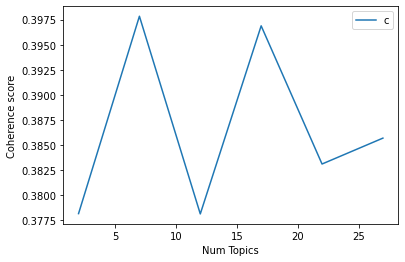

In [36]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [37]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 7

index: 0 | Num Topics = 2  has Coherence Value of 0.3781
index: 1 | Num Topics = 7  has Coherence Value of 0.3978
index: 2 | Num Topics = 12  has Coherence Value of 0.3781
index: 3 | Num Topics = 17  has Coherence Value of 0.3969
index: 4 | Num Topics = 22  has Coherence Value of 0.3831
index: 5 | Num Topics = 27  has Coherence Value of 0.3857


In [38]:
# Select optimal number of topics
optimal_model_sg = model_list_sg[1]

In [39]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg = pyLDAvis.gensim_models.prepare(optimal_model_sg, corpus_sg, id2word_sg)

In [40]:
print("pyLDAVis for overall SG topics:")
vis_sg

pyLDAVis for overall SG topics:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.206079 -0.051597       1        1  20.118213
6      0.122941  0.173981       2        1  17.515913
1     -0.095475  0.032151       3        1  17.171089
5      0.125041  0.179758       4        1  14.313013
3     -0.194238 -0.043469       5        1  13.953548
4      0.008949 -0.041725       6        1  11.727091
0      0.238861 -0.249099       7        1   5.201134, topic_info=          Term         Freq        Total Category  logprob  loglift
58        post  1114.000000  1114.000000  Default  30.0000  30.0000
10      update  1038.000000  1038.000000  Default  29.0000  29.0000
54     account   874.000000   874.000000  Default  28.0000  28.0000
7          new   562.000000   562.000000  Default  27.0000  27.0000
14       photo   332.000000   332.000000  Default  26.0000  26.0000
...        ...          ...          ...      ...      ...      ...
17       video    18.696586   227.153749   Topic7  -4.7990   0.4590
542    content    13.271562    37.379748   Topic7  -5.1417   1.9208
103     people    18.439748   335.243199   Topic7  -4.8128   0.0559
2668  shopping    12.528237    39.069931   Topic7  -5.1993   1.8189
236       feel    12.726702    63.246739   Topic7  -5.1836   1.3530

[428 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
128       1  0.296567  able
128       2  0.241275  able
128       3  0.115611  able
128       4  0.246301  able
128       6  0.100531  able
...     ...       ...   ...
1341      1  0.902766    xr
11        1  0.286318  year
11        3  0.127253  year
11        5  0.063626  year
11        6  0.524917  year

[609 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 7, 2, 6, 4, 5, 1])

# By-rating LDA Topic Modelling

## LDA Topic Modelling (Rating = 1)

In [41]:
# By-rating Topic Modelling - rating = 1
# Convert to list - move to each section
review_sg_score1 = instagram_ios_sg_review_YearMonth_score1.review.values.tolist()
review_words_sg_score1 = list(sent_to_words(review_sg_score1))
print(review_words_sg_score1[:1])

[['keep', 'my', 'instagram', 'app', 'updated', 'and', 'yet', 'dont', 'get', 'to', 'enjoy', 'the', 'new', 'features', 'especially', 'when', 'the', 'superzoom', 'has', 'been', 'launched', 'also', 'dont', 'get', 'the', 'holiday', 'stickers', 'and', 'now', 'is', 'year', 'already']]


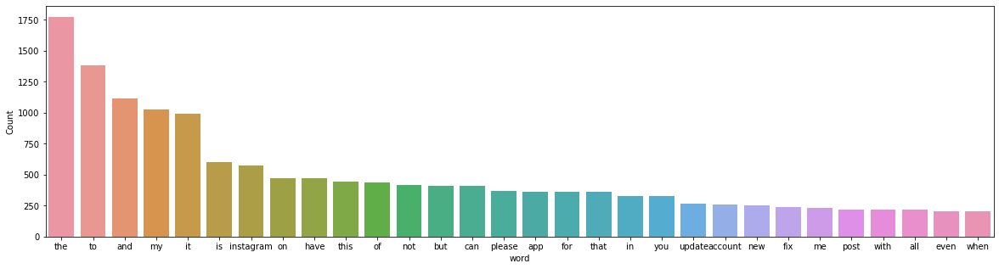

In [42]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_score1))

In [43]:
# Clean text
review_sg_ready_score1 = process_words(review_words_sg_score1)  # processed Text Data! - move to each section


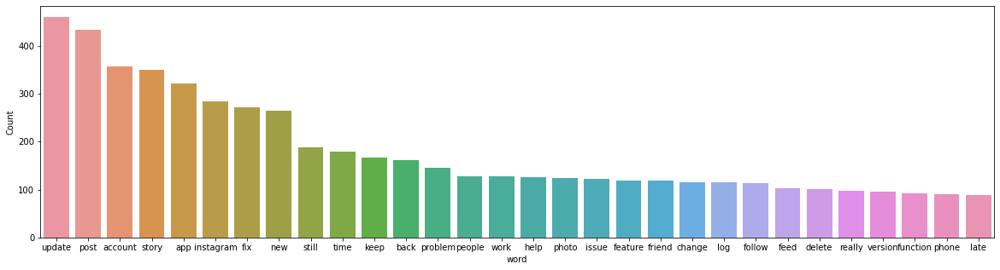

In [44]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_sg_ready_score1))


In [45]:
# Create Dictionary
id2word_sg_score1 = corpora.Dictionary(review_sg_ready_score1)

2021-10-16 02:17:58,322 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 02:17:58,415 [INFO] gensim.corpora.dictionary - built Dictionary(1973 unique tokens: ['already', 'enjoy', 'especially', 'feature', 'holiday']...) from 1379 documents (total 16475 corpus positions)
2021-10-16 02:17:58,418 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1973 unique tokens: ['already', 'enjoy', 'especially', 'feature', 'holiday']...) from 1379 documents (total 16475 corpus positions)", 'datetime': '2021-10-16T02:17:58.418252', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [46]:
# Create Corpus: Term Document Frequency
corpus_sg_score1 = [id2word_sg_score1.doc2bow(text) for text in review_sg_ready_score1]

In [47]:
# Training LDA model
model_list_sg_score1, coherence_values_sg_score1 = compute_coherence_values(dictionary=id2word_sg_score1, corpus=corpus_sg_score1, 
                                                              texts=review_sg_ready_score1, limit=30, start=2, step=5)


2021-10-16 02:17:58,490 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 02:17:58,493 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 02:17:58,497 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:17:58,500 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 1379 documents, updating model once every 1000 documents, evaluating perplexity every 1379 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 02:17:58,502 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1379
2021-10-16 02:18:01,509 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:18:01,521 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"post" + 0.024*"update" + 0.023*"account" + 0.022*"story" + 0.021*"app" + 0.018*"instagram" + 0.017*"new" + 0.015*"fix" + 0.012*"time" 

2021-10-16 02:18:15,358 [INFO] gensim.models.ldamodel - -6.491 per-word bound, 90.0 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:18:15,360 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1379/1379
2021-10-16 02:18:15,883 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:18:15,886 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"post" + 0.027*"story" + 0.023*"update" + 0.022*"app" + 0.019*"fix" + 0.016*"account" + 0.015*"instagram" + 0.012*"new" + 0.012*"time" + 0.012*"keep"
2021-10-16 02:18:15,891 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.030*"update" + 0.017*"account" + 0.015*"instagram" + 0.014*"new" + 0.012*"still" + 0.012*"app" + 0.010*"change" + 0.010*"notification" + 0.010*"back" + 0.009*"help"
2021-10-16 02:18:15,892 [INFO] gensim.models.ldamodel - topic diff=0.257201, rho=0.395935
2021-10-16 02:18:15,897 [INFO] gensim.models.ldamodel - 

2021-10-16 02:18:26,571 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.033*"update" + 0.017*"instagram" + 0.017*"account" + 0.017*"new" + 0.014*"still" + 0.012*"app" + 0.011*"function" + 0.011*"back" + 0.011*"version" + 0.010*"change"
2021-10-16 02:18:26,574 [INFO] gensim.models.ldamodel - topic diff=0.178917, rho=0.296448
2021-10-16 02:18:27,164 [INFO] gensim.models.ldamodel - -6.456 per-word bound, 87.8 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:18:27,166 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1379/1379
2021-10-16 02:18:27,603 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:18:27,605 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"post" + 0.028*"story" + 0.022*"app" + 0.021*"fix" + 0.020*"update" + 0.017*"account" + 0.014*"instagram" + 0.012*"time" + 0.012*"keep" + 0.011*"problem"
2021-10-16 02:18:27,606 [INFO] gensim.models.ldamodel

2021-10-16 02:18:36,212 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/1379
2021-10-16 02:18:37,328 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:18:37,349 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"post" + 0.028*"story" + 0.021*"app" + 0.021*"fix" + 0.019*"account" + 0.019*"update" + 0.013*"instagram" + 0.013*"keep" + 0.012*"time" + 0.012*"problem"
2021-10-16 02:18:37,352 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"update" + 0.019*"new" + 0.018*"instagram" + 0.016*"account" + 0.013*"still" + 0.012*"app" + 0.011*"function" + 0.011*"back" + 0.011*"version" + 0.010*"feature"
2021-10-16 02:18:37,355 [INFO] gensim.models.ldamodel - topic diff=0.143478, rho=0.247091
2021-10-16 02:18:37,928 [INFO] gensim.models.ldamodel - -6.442 per-word bound, 87.0 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:18:37,929 [INFO] gensim.models.ldamo

2021-10-16 02:18:46,135 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"update" + 0.019*"new" + 0.018*"instagram" + 0.015*"account" + 0.012*"app" + 0.012*"still" + 0.011*"function" + 0.011*"back" + 0.010*"version" + 0.010*"feature"
2021-10-16 02:18:46,136 [INFO] gensim.models.ldamodel - topic diff=0.125454, rho=0.221518
2021-10-16 02:18:46,137 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/1379
2021-10-16 02:18:47,113 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:18:47,115 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"post" + 0.028*"story" + 0.022*"fix" + 0.021*"app" + 0.019*"account" + 0.018*"update" + 0.013*"instagram" + 0.013*"keep" + 0.012*"time" + 0.012*"problem"
2021-10-16 02:18:47,117 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"update" + 0.020*"new" + 0.018*"instagram" + 0.016*"account" + 0.013*"still" + 0.012*"app" + 0.012*"function" + 0.011*"back" + 0.011*"

2021-10-16 02:18:57,241 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1379/1379
2021-10-16 02:18:57,651 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:18:57,653 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"post" + 0.028*"story" + 0.022*"fix" + 0.021*"app" + 0.018*"account" + 0.018*"update" + 0.013*"instagram" + 0.012*"time" + 0.012*"keep" + 0.012*"problem"
2021-10-16 02:18:57,656 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"update" + 0.020*"new" + 0.018*"instagram" + 0.015*"account" + 0.012*"app" + 0.011*"function" + 0.011*"still" + 0.011*"back" + 0.011*"version" + 0.010*"feature"
2021-10-16 02:18:57,658 [INFO] gensim.models.ldamodel - topic diff=0.110594, rho=0.198501
2021-10-16 02:18:57,662 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1379
2021-10-16 02:18:59,243 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 docu

2021-10-16 02:19:08,823 [INFO] gensim.models.ldamodel - topic diff=0.100489, rho=0.181432
2021-10-16 02:19:09,372 [INFO] gensim.models.ldamodel - -6.426 per-word bound, 86.0 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:19:09,373 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1379/1379
2021-10-16 02:19:09,726 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:19:09,731 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"post" + 0.028*"story" + 0.023*"fix" + 0.021*"app" + 0.018*"account" + 0.017*"update" + 0.013*"instagram" + 0.013*"time" + 0.012*"keep" + 0.012*"problem"
2021-10-16 02:19:09,734 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.021*"new" + 0.018*"instagram" + 0.015*"account" + 0.012*"app" + 0.012*"back" + 0.011*"function" + 0.011*"still" + 0.011*"feature" + 0.011*"version"
2021-10-16 02:19:09,736 [INFO] gensim.models.ldamod

2021-10-16 02:19:17,604 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"post" + 0.028*"story" + 0.023*"fix" + 0.021*"app" + 0.020*"account" + 0.017*"update" + 0.013*"instagram" + 0.013*"keep" + 0.013*"time" + 0.012*"problem"
2021-10-16 02:19:17,608 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"update" + 0.023*"new" + 0.019*"instagram" + 0.015*"account" + 0.012*"app" + 0.012*"still" + 0.012*"back" + 0.012*"feature" + 0.012*"function" + 0.011*"version"
2021-10-16 02:19:17,610 [INFO] gensim.models.ldamodel - topic diff=0.092228, rho=0.168123
2021-10-16 02:19:18,121 [INFO] gensim.models.ldamodel - -6.423 per-word bound, 85.8 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:19:18,122 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1379/1379
2021-10-16 02:19:18,433 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:19:18,437 [INFO] gensim.models.ldamod

2021-10-16 02:19:27,164 [INFO] gensim.models.ldamodel - topic diff=0.086585, rho=0.159356
2021-10-16 02:19:27,166 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1000/1379
2021-10-16 02:19:28,366 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:19:28,368 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"post" + 0.028*"story" + 0.023*"fix" + 0.021*"app" + 0.020*"account" + 0.016*"update" + 0.013*"instagram" + 0.013*"keep" + 0.013*"time" + 0.012*"problem"
2021-10-16 02:19:28,370 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"update" + 0.023*"new" + 0.019*"instagram" + 0.015*"account" + 0.012*"app" + 0.012*"feature" + 0.012*"back" + 0.012*"still" + 0.011*"function" + 0.011*"version"
2021-10-16 02:19:28,372 [INFO] gensim.models.ldamodel - topic diff=0.085799, rho=0.157370
2021-10-16 02:19:29,003 [INFO] gensim.models.ldamodel - -6.421 per-word bound, 85.7 perplexity estimate based on a held-out 

2021-10-16 02:19:37,492 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"update" + 0.023*"new" + 0.018*"instagram" + 0.015*"account" + 0.013*"app" + 0.012*"back" + 0.012*"feature" + 0.011*"function" + 0.011*"still" + 0.011*"version"
2021-10-16 02:19:37,493 [INFO] gensim.models.ldamodel - topic diff=0.081112, rho=0.150111
2021-10-16 02:19:37,495 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1000/1379
2021-10-16 02:19:38,525 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:19:38,528 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"post" + 0.028*"story" + 0.024*"fix" + 0.021*"app" + 0.020*"account" + 0.016*"update" + 0.013*"instagram" + 0.013*"time" + 0.013*"keep" + 0.012*"problem"
2021-10-16 02:19:38,532 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"update" + 0.024*"new" + 0.019*"instagram" + 0.015*"account" + 0.012*"app" + 0.012*"feature" + 0.012*"back" + 0.012*"still" + 0.011*"f

2021-10-16 02:19:46,254 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1379/1379
2021-10-16 02:19:46,675 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:19:46,682 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"post" + 0.028*"story" + 0.024*"fix" + 0.021*"app" + 0.019*"account" + 0.016*"update" + 0.013*"instagram" + 0.013*"time" + 0.012*"keep" + 0.012*"work"
2021-10-16 02:19:46,685 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"update" + 0.023*"new" + 0.018*"instagram" + 0.014*"account" + 0.013*"app" + 0.012*"back" + 0.012*"feature" + 0.011*"function" + 0.011*"version" + 0.011*"still"
2021-10-16 02:19:46,693 [INFO] gensim.models.ldamodel - topic diff=0.076554, rho=0.142308
2021-10-16 02:19:46,699 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/1379
2021-10-16 02:19:47,774 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documen

2021-10-16 02:19:59,580 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.036*"update" + 0.022*"new" + 0.019*"story" + 0.017*"version" + 0.016*"instagram" + 0.016*"app" + 0.014*"still" + 0.013*"music" + 0.012*"work" + 0.011*"late"
2021-10-16 02:19:59,583 [INFO] gensim.models.ldamodel - topic diff=1.000315, rho=0.707107
2021-10-16 02:19:59,584 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/1379
2021-10-16 02:20:00,871 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:20:00,874 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.046*"post" + 0.033*"update" + 0.032*"story" + 0.028*"instagram" + 0.028*"new" + 0.022*"app" + 0.013*"keep" + 0.013*"feed" + 0.013*"time" + 0.012*"back"
2021-10-16 02:20:00,877 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.033*"account" + 0.032*"app" + 0.025*"fix" + 0.021*"update" + 0.018*"phone" + 0.017*"log" + 0.017*"still" + 0.013*"really" + 0.013*"notification" + 0.012*

2021-10-16 02:20:06,384 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1379/1379
2021-10-16 02:20:06,802 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:20:06,808 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.057*"photo" + 0.046*"post" + 0.019*"remove" + 0.019*"tag" + 0.017*"change" + 0.014*"button" + 0.014*"camera" + 0.013*"upload" + 0.012*"app" + 0.012*"story"
2021-10-16 02:20:06,815 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"problem" + 0.035*"update" + 0.032*"app" + 0.028*"fix" + 0.017*"still" + 0.017*"help" + 0.016*"work" + 0.015*"issue" + 0.015*"time" + 0.015*"story"
2021-10-16 02:20:06,819 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.040*"post" + 0.028*"account" + 0.024*"story" + 0.015*"fix" + 0.015*"ad" + 0.014*"report" + 0.013*"time" + 0.012*"share" + 0.012*"picture" + 0.011*"remove"
2021-10-16 02:20:06,823 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.033*"app" + 0.

2021-10-16 02:20:12,688 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.052*"post" + 0.037*"update" + 0.034*"story" + 0.030*"new" + 0.023*"instagram" + 0.019*"back" + 0.019*"feed" + 0.015*"app" + 0.012*"scroll" + 0.011*"keep"
2021-10-16 02:20:12,690 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"post" + 0.033*"account" + 0.026*"story" + 0.015*"fix" + 0.014*"report" + 0.014*"list" + 0.013*"share" + 0.012*"time" + 0.012*"block" + 0.012*"picture"
2021-10-16 02:20:12,692 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.040*"account" + 0.022*"instagram" + 0.016*"available" + 0.016*"reel" + 0.014*"feature" + 0.012*"story" + 0.012*"message" + 0.011*"highlight" + 0.011*"delete" + 0.011*"update"
2021-10-16 02:20:12,694 [INFO] gensim.models.ldamodel - topic diff=0.142307, rho=0.345465
2021-10-16 02:20:13,139 [INFO] gensim.models.ldamodel - -6.675 per-word bound, 102.2 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:20:13,140 [INFO] g

2021-10-16 02:20:17,674 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.054*"post" + 0.039*"update" + 0.035*"story" + 0.028*"new" + 0.021*"instagram" + 0.019*"feed" + 0.019*"back" + 0.012*"app" + 0.011*"change" + 0.011*"refresh"
2021-10-16 02:20:17,676 [INFO] gensim.models.ldamodel - topic diff=0.114915, rho=0.310400
2021-10-16 02:20:17,678 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1000/1379
2021-10-16 02:20:18,671 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:20:18,677 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"problem" + 0.035*"app" + 0.027*"update" + 0.025*"fix" + 0.023*"work" + 0.021*"still" + 0.019*"help" + 0.018*"time" + 0.017*"issue" + 0.015*"story"
2021-10-16 02:20:18,685 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.064*"photo" + 0.042*"post" + 0.018*"remove" + 0.017*"upload" + 0.016*"tag" + 0.015*"video" + 0.015*"change" + 0.014*"app" + 0.013*"button" + 0.013*"camer

2021-10-16 02:20:23,133 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1379/1379
2021-10-16 02:20:23,547 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:20:23,551 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.040*"problem" + 0.035*"app" + 0.025*"work" + 0.025*"update" + 0.024*"fix" + 0.019*"help" + 0.018*"issue" + 0.017*"time" + 0.016*"still" + 0.016*"story"
2021-10-16 02:20:23,555 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.038*"app" + 0.037*"account" + 0.033*"fix" + 0.023*"keep" + 0.022*"still" + 0.021*"update" + 0.020*"phone" + 0.020*"log" + 0.020*"notification" + 0.018*"time"
2021-10-16 02:20:23,557 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.055*"post" + 0.037*"update" + 0.034*"story" + 0.027*"new" + 0.021*"feed" + 0.021*"back" + 0.020*"instagram" + 0.013*"change" + 0.011*"refresh" + 0.011*"scroll"
2021-10-16 02:20:23,559 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"p

2021-10-16 02:20:28,434 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.066*"photo" + 0.044*"post" + 0.018*"video" + 0.018*"upload" + 0.018*"remove" + 0.016*"tag" + 0.015*"app" + 0.014*"camera" + 0.014*"button" + 0.013*"change"
2021-10-16 02:20:28,438 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.042*"account" + 0.038*"app" + 0.033*"fix" + 0.026*"log" + 0.024*"keep" + 0.022*"phone" + 0.022*"still" + 0.020*"update" + 0.019*"time" + 0.018*"notification"
2021-10-16 02:20:28,442 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"post" + 0.035*"account" + 0.027*"story" + 0.015*"fix" + 0.015*"report" + 0.014*"people" + 0.014*"block" + 0.013*"follow" + 0.013*"list" + 0.012*"share"
2021-10-16 02:20:28,445 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"problem" + 0.035*"app" + 0.025*"work" + 0.025*"fix" + 0.023*"update" + 0.019*"help" + 0.018*"time" + 0.018*"issue" + 0.017*"still" + 0.015*"story"
2021-10-16 02:20:28,447 [INFO] gensim.models.ldamodel - topic diff=0.0821

2021-10-16 02:20:33,072 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.068*"photo" + 0.046*"post" + 0.019*"remove" + 0.018*"tag" + 0.018*"video" + 0.017*"upload" + 0.016*"camera" + 0.016*"app" + 0.016*"button" + 0.014*"change"
2021-10-16 02:20:33,075 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.032*"account" + 0.022*"reel" + 0.019*"instagram" + 0.017*"available" + 0.014*"feature" + 0.014*"message" + 0.014*"music" + 0.013*"story" + 0.013*"highlight" + 0.011*"support"
2021-10-16 02:20:33,078 [INFO] gensim.models.ldamodel - topic diff=0.075136, rho=0.233259
2021-10-16 02:20:33,080 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1000/1379
2021-10-16 02:20:34,146 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:20:34,155 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"problem" + 0.035*"app" + 0.027*"work" + 0.025*"fix" + 0.022*"update" + 0.020*"help" + 0.019*"issue" + 0.019*"time" + 0.014*"s

2021-10-16 02:20:37,751 [INFO] gensim.models.ldamodel - topic diff=0.069019, rho=0.216275
2021-10-16 02:20:38,299 [INFO] gensim.models.ldamodel - -6.617 per-word bound, 98.1 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:20:38,300 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1379/1379
2021-10-16 02:20:38,659 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:20:38,662 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"app" + 0.038*"account" + 0.034*"fix" + 0.024*"keep" + 0.023*"still" + 0.023*"log" + 0.021*"update" + 0.020*"phone" + 0.020*"notification" + 0.019*"time"
2021-10-16 02:20:38,664 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.032*"account" + 0.022*"reel" + 0.019*"instagram" + 0.017*"available" + 0.015*"music" + 0.014*"feature" + 0.014*"message" + 0.013*"story" + 0.013*"highlight" + 0.011*"support"
2021-10-16 02:20:38,665 [INFO] gensim.mod

2021-10-16 02:20:43,311 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.097*"update" + 0.053*"new" + 0.034*"version" + 0.031*"late" + 0.029*"still" + 0.027*"instagram" + 0.016*"app" + 0.015*"feature" + 0.014*"music" + 0.014*"text"
2021-10-16 02:20:43,315 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.041*"account" + 0.039*"app" + 0.035*"fix" + 0.027*"log" + 0.025*"keep" + 0.023*"still" + 0.021*"phone" + 0.020*"update" + 0.019*"time" + 0.018*"notification"
2021-10-16 02:20:43,319 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"problem" + 0.034*"app" + 0.030*"work" + 0.025*"fix" + 0.021*"update" + 0.021*"help" + 0.021*"issue" + 0.019*"time" + 0.013*"reply" + 0.013*"load"
2021-10-16 02:20:43,323 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.053*"post" + 0.034*"update" + 0.033*"story" + 0.028*"new" + 0.025*"back" + 0.022*"feed" + 0.022*"instagram" + 0.015*"change" + 0.013*"scroll" + 0.011*"refresh"
2021-10-16 02:20:43,328 [INFO] gensim.models.ldamodel - topic #4 (0.

2021-10-16 02:20:48,031 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.068*"photo" + 0.050*"post" + 0.020*"video" + 0.019*"remove" + 0.018*"tag" + 0.018*"upload" + 0.017*"camera" + 0.017*"app" + 0.016*"button" + 0.015*"story"
2021-10-16 02:20:48,033 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.052*"post" + 0.034*"update" + 0.033*"story" + 0.027*"new" + 0.024*"back" + 0.022*"feed" + 0.022*"instagram" + 0.015*"change" + 0.012*"scroll" + 0.012*"refresh"
2021-10-16 02:20:48,036 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.031*"account" + 0.021*"reel" + 0.019*"instagram" + 0.018*"available" + 0.017*"music" + 0.014*"feature" + 0.014*"message" + 0.014*"story" + 0.013*"highlight" + 0.011*"support"
2021-10-16 02:20:48,037 [INFO] gensim.models.ldamodel - topic diff=0.059892, rho=0.194702
2021-10-16 02:20:48,039 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1000/1379
2021-10-16 02:20:48,968 [INFO] gensim.models.ldamodel - merging changes from 1000 documents in

2021-10-16 02:20:52,944 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.043*"problem" + 0.035*"app" + 0.031*"work" + 0.025*"fix" + 0.021*"update" + 0.021*"issue" + 0.021*"help" + 0.019*"time" + 0.015*"load" + 0.013*"reply"
2021-10-16 02:20:52,947 [INFO] gensim.models.ldamodel - topic diff=0.056262, rho=0.184494
2021-10-16 02:20:53,596 [INFO] gensim.models.ldamodel - -6.607 per-word bound, 97.5 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:20:53,628 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #1379/1379
2021-10-16 02:20:53,997 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:20:54,001 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.030*"account" + 0.021*"reel" + 0.021*"instagram" + 0.021*"music" + 0.017*"available" + 0.014*"story" + 0.014*"message" + 0.014*"feature" + 0.013*"highlight" + 0.011*"support"
2021-10-16 02:20:54,003 [INFO] gensim.models.lda

2021-10-16 02:20:58,397 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1000/1379
2021-10-16 02:20:59,239 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:20:59,243 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"post" + 0.037*"account" + 0.028*"story" + 0.018*"follow" + 0.016*"people" + 0.016*"report" + 0.015*"block" + 0.014*"fix" + 0.012*"share" + 0.012*"list"
2021-10-16 02:20:59,245 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.043*"problem" + 0.035*"app" + 0.032*"work" + 0.025*"fix" + 0.021*"issue" + 0.021*"update" + 0.021*"help" + 0.019*"time" + 0.016*"load" + 0.013*"reply"
2021-10-16 02:20:59,247 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.041*"account" + 0.039*"app" + 0.036*"fix" + 0.027*"log" + 0.025*"keep" + 0.023*"still" + 0.021*"phone" + 0.019*"time" + 0.019*"update" + 0.018*"notification"
2021-10-16 02:20:59,249 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.101*"upda

2021-10-16 02:21:03,838 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.068*"photo" + 0.050*"post" + 0.022*"video" + 0.020*"remove" + 0.018*"upload" + 0.018*"tag" + 0.017*"camera" + 0.017*"app" + 0.016*"story" + 0.016*"button"
2021-10-16 02:21:03,843 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.052*"post" + 0.033*"update" + 0.033*"story" + 0.027*"new" + 0.025*"back" + 0.022*"feed" + 0.022*"instagram" + 0.016*"change" + 0.012*"scroll" + 0.012*"refresh"
2021-10-16 02:21:03,847 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.030*"account" + 0.022*"music" + 0.022*"instagram" + 0.021*"reel" + 0.018*"available" + 0.014*"story" + 0.014*"message" + 0.014*"feature" + 0.014*"highlight" + 0.011*"fix"
2021-10-16 02:21:03,851 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"account" + 0.038*"app" + 0.036*"fix" + 0.024*"log" + 0.024*"keep" + 0.024*"still" + 0.020*"phone" + 0.020*"update" + 0.019*"time" + 0.019*"notification"
2021-10-16 02:21:03,863 [INFO] gensim.models.ldamode

2021-10-16 02:21:08,293 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"problem" + 0.036*"app" + 0.033*"work" + 0.025*"fix" + 0.021*"issue" + 0.021*"update" + 0.020*"help" + 0.019*"time" + 0.016*"load" + 0.013*"reply"
2021-10-16 02:21:08,295 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.041*"account" + 0.038*"app" + 0.036*"fix" + 0.027*"log" + 0.025*"keep" + 0.024*"still" + 0.021*"phone" + 0.019*"time" + 0.019*"update" + 0.018*"notification"
2021-10-16 02:21:08,295 [INFO] gensim.models.ldamodel - topic diff=0.048362, rho=0.163563
2021-10-16 02:21:08,802 [INFO] gensim.models.ldamodel - -6.600 per-word bound, 97.0 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:21:08,803 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1379/1379
2021-10-16 02:21:09,184 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:21:09,189 [INFO] gensim.models.ldamodel - topic #0 

2021-10-16 02:21:12,894 [INFO] gensim.models.ldamodel - topic diff=0.046728, rho=0.159356
2021-10-16 02:21:12,898 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1000/1379
2021-10-16 02:21:13,697 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:21:13,706 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.103*"update" + 0.057*"new" + 0.034*"version" + 0.032*"late" + 0.031*"still" + 0.023*"instagram" + 0.017*"app" + 0.015*"feature" + 0.014*"text" + 0.014*"story"
2021-10-16 02:21:13,710 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.041*"account" + 0.037*"app" + 0.037*"fix" + 0.027*"log" + 0.025*"keep" + 0.024*"still" + 0.021*"phone" + 0.019*"time" + 0.019*"update" + 0.018*"notification"
2021-10-16 02:21:13,712 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.067*"photo" + 0.049*"post" + 0.026*"video" + 0.019*"upload" + 0.019*"remove" + 0.017*"story" + 0.016*"tag" + 0.016*"app" + 0.016*"camera" + 0.01

2021-10-16 02:21:18,179 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.040*"post" + 0.036*"account" + 0.029*"story" + 0.017*"follow" + 0.017*"report" + 0.016*"people" + 0.014*"fix" + 0.014*"block" + 0.013*"time" + 0.012*"share"
2021-10-16 02:21:18,181 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.068*"photo" + 0.050*"post" + 0.025*"video" + 0.020*"remove" + 0.018*"upload" + 0.018*"tag" + 0.017*"story" + 0.017*"button" + 0.017*"camera" + 0.016*"app"
2021-10-16 02:21:18,183 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"account" + 0.037*"app" + 0.037*"fix" + 0.025*"keep" + 0.025*"still" + 0.025*"log" + 0.020*"phone" + 0.020*"update" + 0.019*"time" + 0.019*"notification"
2021-10-16 02:21:18,186 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.104*"update" + 0.057*"new" + 0.034*"version" + 0.032*"late" + 0.030*"still" + 0.023*"instagram" + 0.016*"app" + 0.015*"text" + 0.014*"feature" + 0.014*"story"
2021-10-16 02:21:18,188 [INFO] gensim.models.ldamodel - topic #3 (0

2021-10-16 02:21:22,606 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.067*"photo" + 0.049*"post" + 0.027*"video" + 0.019*"upload" + 0.019*"remove" + 0.018*"story" + 0.016*"button" + 0.016*"tag" + 0.016*"app" + 0.016*"camera"
2021-10-16 02:21:22,609 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.103*"update" + 0.058*"new" + 0.035*"version" + 0.032*"late" + 0.031*"still" + 0.023*"instagram" + 0.017*"app" + 0.015*"feature" + 0.014*"story" + 0.014*"text"
2021-10-16 02:21:22,638 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.041*"account" + 0.037*"app" + 0.037*"fix" + 0.027*"log" + 0.026*"keep" + 0.025*"still" + 0.021*"phone" + 0.019*"time" + 0.019*"update" + 0.018*"notification"
2021-10-16 02:21:22,640 [INFO] gensim.models.ldamodel - topic diff=0.043110, rho=0.148447
2021-10-16 02:21:23,085 [INFO] gensim.models.ldamodel - -6.595 per-word bound, 96.7 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:21:23,086 [INFO] gensim.models.l

2021-10-16 02:21:27,171 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.104*"update" + 0.057*"new" + 0.035*"version" + 0.032*"late" + 0.030*"still" + 0.023*"instagram" + 0.016*"app" + 0.015*"text" + 0.014*"feature" + 0.014*"story"
2021-10-16 02:21:27,174 [INFO] gensim.models.ldamodel - topic diff=0.042067, rho=0.145280
2021-10-16 02:21:27,176 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/1379
2021-10-16 02:21:28,071 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:21:28,077 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.067*"photo" + 0.049*"post" + 0.028*"video" + 0.019*"upload" + 0.019*"remove" + 0.018*"story" + 0.016*"button" + 0.016*"tag" + 0.016*"app" + 0.016*"camera"
2021-10-16 02:21:28,081 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.053*"post" + 0.031*"update" + 0.030*"story" + 0.028*"new" + 0.027*"back" + 0.023*"instagram" + 0.023*"feed" + 0.016*"change" + 0.013*"scroll" + 0.0

2021-10-16 02:21:32,314 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1379/1379
2021-10-16 02:21:32,666 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:21:32,671 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.068*"photo" + 0.050*"post" + 0.027*"video" + 0.020*"remove" + 0.018*"upload" + 0.018*"story" + 0.018*"tag" + 0.018*"button" + 0.017*"camera" + 0.016*"app"
2021-10-16 02:21:32,681 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"account" + 0.037*"app" + 0.037*"fix" + 0.025*"keep" + 0.025*"log" + 0.025*"still" + 0.020*"phone" + 0.020*"update" + 0.019*"time" + 0.019*"notification"
2021-10-16 02:21:32,685 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.104*"update" + 0.058*"new" + 0.036*"version" + 0.032*"late" + 0.030*"still" + 0.022*"instagram" + 0.016*"app" + 0.015*"text" + 0.014*"story" + 0.014*"feature"
2021-10-16 02:21:32,689 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.053*

2021-10-16 02:21:43,045 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.038*"message" + 0.020*"instagram" + 0.018*"photo" + 0.018*"account" + 0.014*"save" + 0.014*"fix" + 0.013*"effect" + 0.013*"reply" + 0.013*"allow" + 0.013*"draft"
2021-10-16 02:21:43,046 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.051*"photo" + 0.050*"post" + 0.021*"button" + 0.020*"remove" + 0.018*"story" + 0.017*"reel" + 0.016*"upload" + 0.015*"unable" + 0.012*"app" + 0.011*"help"
2021-10-16 02:21:43,047 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.028*"account" + 0.026*"keep" + 0.022*"fix" + 0.019*"app" + 0.018*"problem" + 0.017*"instagram" + 0.015*"back" + 0.014*"log" + 0.012*"time" + 0.012*"long"
2021-10-16 02:21:43,048 [INFO] gensim.models.ldamodel - topic diff=0.576269, rho=0.707107
2021-10-16 02:21:43,049 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/1379
2021-10-16 02:21:44,203 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 d

2021-10-16 02:21:48,780 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.047*"update" + 0.045*"app" + 0.036*"still" + 0.035*"problem" + 0.030*"fix" + 0.024*"reinstall" + 0.024*"issue" + 0.021*"work" + 0.021*"iphone" + 0.021*"help"
2021-10-16 02:21:48,782 [INFO] gensim.models.ldamodel - topic diff=0.246338, rho=0.431171
2021-10-16 02:21:49,348 [INFO] gensim.models.ldamodel - -7.059 per-word bound, 133.3 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:21:49,351 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1379/1379
2021-10-16 02:21:49,737 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:21:49,742 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.033*"app" + 0.028*"notification" + 0.026*"account" + 0.023*"update" + 0.022*"instagram" + 0.020*"open" + 0.020*"work" + 0.018*"still" + 0.018*"fix" + 0.016*"new"
2021-10-16 02:21:49,747 [INFO] gensim.models.ldamodel 

2021-10-16 02:21:53,567 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1000/1379
2021-10-16 02:21:54,536 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:21:54,540 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.034*"app" + 0.026*"account" + 0.025*"notification" + 0.024*"open" + 0.022*"update" + 0.022*"instagram" + 0.021*"fix" + 0.019*"work" + 0.018*"bug" + 0.017*"still"
2021-10-16 02:21:54,541 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.048*"button" + 0.048*"music" + 0.038*"option" + 0.035*"video" + 0.034*"feature" + 0.030*"story" + 0.029*"remove" + 0.027*"function" + 0.021*"play" + 0.018*"pop"
2021-10-16 02:21:54,542 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.063*"photo" + 0.053*"post" + 0.028*"upload" + 0.019*"camera" + 0.015*"screen" + 0.015*"story" + 0.015*"appear" + 0.014*"unable" + 0.013*"multiple" + 0.013*"able"
2021-10-16 02:21:54,543 [INFO] gensim.models.ldamodel - topic #3 (

2021-10-16 02:21:59,050 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.072*"photo" + 0.055*"post" + 0.027*"upload" + 0.024*"camera" + 0.016*"story" + 0.016*"multiple" + 0.015*"screen" + 0.015*"reel" + 0.014*"icon" + 0.014*"appear"
2021-10-16 02:21:59,051 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.071*"account" + 0.040*"log" + 0.032*"keep" + 0.030*"fix" + 0.023*"problem" + 0.021*"help" + 0.021*"error" + 0.020*"time" + 0.016*"instagram" + 0.014*"request"
2021-10-16 02:21:59,053 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.052*"app" + 0.045*"update" + 0.040*"still" + 0.031*"fix" + 0.031*"issue" + 0.030*"problem" + 0.026*"help" + 0.026*"work" + 0.023*"reinstall" + 0.020*"report"
2021-10-16 02:21:59,055 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.060*"post" + 0.028*"ad" + 0.027*"story" + 0.027*"app" + 0.021*"instagram" + 0.014*"feed" + 0.012*"keep" + 0.011*"follow" + 0.011*"bad" + 0.011*"video"
2021-10-16 02:21:59,058 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 02:22:03,906 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.058*"message" + 0.029*"save" + 0.028*"photo" + 0.019*"instagram" + 0.019*"whenever" + 0.017*"edit" + 0.016*"friend" + 0.016*"filter" + 0.016*"reply" + 0.015*"allow"
2021-10-16 02:22:03,908 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.063*"post" + 0.028*"story" + 0.027*"app" + 0.027*"ad" + 0.023*"instagram" + 0.015*"feed" + 0.012*"keep" + 0.012*"annoying" + 0.012*"follow" + 0.011*"bad"
2021-10-16 02:22:03,908 [INFO] gensim.models.ldamodel - topic diff=0.082868, rho=0.273393
2021-10-16 02:22:04,364 [INFO] gensim.models.ldamodel - -6.708 per-word bound, 104.5 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:22:04,369 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1379/1379
2021-10-16 02:22:04,691 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:22:04,696 [INFO] gensim.models.ldamodel 

2021-10-16 02:22:08,555 [INFO] gensim.models.ldamodel - topic diff=0.072401, rho=0.254998
2021-10-16 02:22:08,556 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/1379
2021-10-16 02:22:09,465 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:22:09,469 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.068*"photo" + 0.054*"post" + 0.029*"upload" + 0.022*"camera" + 0.021*"screen" + 0.017*"able" + 0.017*"appear" + 0.016*"story" + 0.015*"profile" + 0.014*"multiple"
2021-10-16 02:22:09,471 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.051*"follower" + 0.027*"recent" + 0.018*"show" + 0.018*"follow" + 0.017*"platform" + 0.014*"write" + 0.013*"drop" + 0.013*"big" + 0.013*"hashtag" + 0.013*"deactivate"
2021-10-16 02:22:09,473 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.034*"app" + 0.030*"notification" + 0.025*"open" + 0.025*"instagram" + 0.024*"update" + 0.021*"bug" + 0.020*"fix" + 0.019*"work" + 0

2021-10-16 02:22:14,932 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.048*"block" + 0.035*"tag" + 0.029*"support" + 0.024*"censor" + 0.023*"people" + 0.021*"action" + 0.019*"format" + 0.019*"week" + 0.017*"absolutely" + 0.017*"follow"
2021-10-16 02:22:14,934 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.050*"follower" + 0.027*"recent" + 0.021*"platform" + 0.019*"show" + 0.017*"follow" + 0.015*"drop" + 0.015*"big" + 0.014*"write" + 0.012*"news" + 0.011*"automatically"
2021-10-16 02:22:14,936 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.052*"app" + 0.045*"update" + 0.042*"still" + 0.033*"issue" + 0.032*"fix" + 0.029*"problem" + 0.028*"help" + 0.027*"work" + 0.022*"reinstall" + 0.020*"report"
2021-10-16 02:22:14,938 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.062*"message" + 0.030*"save" + 0.028*"photo" + 0.019*"edit" + 0.019*"instagram" + 0.018*"whenever" + 0.016*"friend" + 0.016*"reply" + 0.015*"filter" + 0.015*"allow"
2021-10-16 02:22:14,940 [INFO] gensim.mod

2021-10-16 02:22:19,550 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.064*"music" + 0.056*"button" + 0.036*"option" + 0.034*"function" + 0.032*"video" + 0.032*"feature" + 0.029*"story" + 0.029*"remove" + 0.020*"play" + 0.019*"instagram"
2021-10-16 02:22:19,555 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.045*"still" + 0.044*"update" + 0.033*"issue" + 0.032*"fix" + 0.030*"problem" + 0.028*"help" + 0.026*"work" + 0.021*"reinstall" + 0.021*"report"
2021-10-16 02:22:19,557 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.069*"photo" + 0.054*"post" + 0.029*"upload" + 0.022*"camera" + 0.021*"screen" + 0.018*"appear" + 0.017*"able" + 0.016*"story" + 0.015*"profile" + 0.014*"multiple"
2021-10-16 02:22:19,560 [INFO] gensim.models.ldamodel - topic diff=0.058851, rho=0.216275
2021-10-16 02:22:20,049 [INFO] gensim.models.ldamodel - -6.682 per-word bound, 102.7 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:22:20,050 [INF

2021-10-16 02:22:24,024 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.049*"block" + 0.035*"tag" + 0.029*"support" + 0.023*"censor" + 0.023*"people" + 0.022*"action" + 0.019*"week" + 0.019*"format" + 0.018*"follow" + 0.017*"absolutely"
2021-10-16 02:22:24,031 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.072*"photo" + 0.056*"post" + 0.028*"upload" + 0.024*"camera" + 0.019*"screen" + 0.017*"story" + 0.017*"able" + 0.017*"appear" + 0.015*"multiple" + 0.014*"icon"
2021-10-16 02:22:24,035 [INFO] gensim.models.ldamodel - topic diff=0.054495, rho=0.206817
2021-10-16 02:22:24,036 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/1379
2021-10-16 02:22:24,932 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:22:24,936 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.131*"update" + 0.091*"new" + 0.029*"version" + 0.028*"late" + 0.022*"post" + 0.022*"story" + 0.020*"feed" + 0.019*"font" + 0.018*"featur

2021-10-16 02:22:28,467 [INFO] gensim.models.ldamodel - topic diff=0.051555, rho=0.194702
2021-10-16 02:22:29,032 [INFO] gensim.models.ldamodel - -6.673 per-word bound, 102.0 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:22:29,034 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1379/1379
2021-10-16 02:22:29,384 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:22:29,400 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.061*"message" + 0.031*"save" + 0.029*"photo" + 0.019*"instagram" + 0.018*"edit" + 0.018*"whenever" + 0.015*"friend" + 0.015*"filter" + 0.015*"always" + 0.015*"allow"
2021-10-16 02:22:29,407 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.051*"follower" + 0.027*"recent" + 0.021*"show" + 0.021*"platform" + 0.017*"follow" + 0.015*"drop" + 0.015*"big" + 0.014*"write" + 0.013*"news" + 0.012*"kindly"
2021-10-16 02:22:29,409 [INFO] gensim.models.ld

2021-10-16 02:22:33,985 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.065*"music" + 0.057*"button" + 0.035*"function" + 0.032*"video" + 0.032*"feature" + 0.032*"option" + 0.032*"story" + 0.029*"remove" + 0.020*"play" + 0.019*"instagram"
2021-10-16 02:22:33,988 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.068*"photo" + 0.054*"post" + 0.029*"upload" + 0.022*"camera" + 0.021*"screen" + 0.019*"appear" + 0.018*"able" + 0.017*"story" + 0.015*"profile" + 0.015*"video"
2021-10-16 02:22:33,995 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.059*"message" + 0.032*"save" + 0.030*"photo" + 0.019*"whenever" + 0.019*"instagram" + 0.018*"edit" + 0.016*"filter" + 0.016*"always" + 0.016*"friend" + 0.014*"allow"
2021-10-16 02:22:33,998 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.133*"update" + 0.092*"new" + 0.029*"version" + 0.028*"late" + 0.022*"post" + 0.022*"story" + 0.020*"feed" + 0.018*"font" + 0.018*"feature" + 0.018*"instagram"
2021-10-16 02:22:34,001 [INFO] gensim.model

2021-10-16 02:22:38,667 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.050*"block" + 0.035*"tag" + 0.029*"support" + 0.024*"people" + 0.023*"censor" + 0.023*"action" + 0.020*"week" + 0.019*"format" + 0.018*"follow" + 0.017*"absolutely"
2021-10-16 02:22:38,669 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.093*"account" + 0.042*"log" + 0.036*"fix" + 0.032*"keep" + 0.022*"problem" + 0.020*"error" + 0.020*"help" + 0.019*"time" + 0.016*"delete" + 0.016*"instagram"
2021-10-16 02:22:38,670 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.082*"post" + 0.049*"story" + 0.033*"view" + 0.026*"picture" + 0.025*"account" + 0.023*"share" + 0.021*"happen" + 0.018*"remove" + 0.017*"people" + 0.016*"fix"
2021-10-16 02:22:38,672 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.061*"message" + 0.031*"save" + 0.030*"photo" + 0.020*"always" + 0.018*"instagram" + 0.018*"edit" + 0.018*"whenever" + 0.015*"filter" + 0.015*"friend" + 0.014*"reply"
2021-10-16 02:22:38,673 [INFO] gensim.models.lda

2021-10-16 02:22:43,195 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.135*"update" + 0.092*"new" + 0.029*"version" + 0.028*"late" + 0.022*"post" + 0.022*"story" + 0.020*"feed" + 0.018*"feature" + 0.018*"font" + 0.018*"instagram"
2021-10-16 02:22:43,197 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.066*"post" + 0.029*"ad" + 0.027*"story" + 0.026*"app" + 0.022*"instagram" + 0.016*"feed" + 0.013*"annoying" + 0.012*"bad" + 0.012*"follow" + 0.012*"time"
2021-10-16 02:22:43,198 [INFO] gensim.models.ldamodel - topic diff=0.043895, rho=0.170551
2021-10-16 02:22:43,688 [INFO] gensim.models.ldamodel - -6.664 per-word bound, 101.4 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:22:43,689 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1379/1379
2021-10-16 02:22:43,992 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:22:43,997 [INFO] gensim.models.ldamodel - topi

2021-10-16 02:22:47,570 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.044*"update" + 0.043*"still" + 0.034*"issue" + 0.032*"fix" + 0.029*"problem" + 0.028*"help" + 0.027*"work" + 0.021*"report" + 0.021*"reinstall"
2021-10-16 02:22:47,572 [INFO] gensim.models.ldamodel - topic diff=0.041968, rho=0.165796
2021-10-16 02:22:47,575 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/1379
2021-10-16 02:22:48,366 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:22:48,371 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.057*"block" + 0.032*"tag" + 0.028*"support" + 0.026*"action" + 0.025*"people" + 0.022*"follow" + 0.022*"week" + 0.020*"censor" + 0.017*"format" + 0.016*"absolutely"
2021-10-16 02:22:48,375 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.082*"post" + 0.050*"story" + 0.035*"view" + 0.026*"picture" + 0.026*"account" + 0.023*"share" + 0.019*"happen" + 0.019*"people" + 0.018*"r

2021-10-16 02:22:52,422 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1379/1379
2021-10-16 02:22:52,737 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:22:52,743 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.097*"account" + 0.042*"log" + 0.036*"fix" + 0.032*"keep" + 0.022*"problem" + 0.021*"help" + 0.019*"error" + 0.019*"time" + 0.017*"delete" + 0.016*"instagram"
2021-10-16 02:22:52,749 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.081*"post" + 0.049*"story" + 0.033*"view" + 0.026*"account" + 0.026*"picture" + 0.023*"share" + 0.020*"happen" + 0.018*"remove" + 0.018*"people" + 0.016*"fix"
2021-10-16 02:22:52,766 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.060*"message" + 0.031*"save" + 0.030*"photo" + 0.023*"always" + 0.018*"edit" + 0.018*"whenever" + 0.017*"instagram" + 0.017*"filter" + 0.016*"reply" + 0.015*"allow"
2021-10-16 02:22:52,769 [INFO] gensim.models.ldamodel - topic #6 (0.08

2021-10-16 02:22:57,062 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.100*"account" + 0.046*"log" + 0.037*"fix" + 0.034*"keep" + 0.022*"problem" + 0.021*"help" + 0.020*"error" + 0.019*"time" + 0.018*"delete" + 0.016*"instagram"
2021-10-16 02:22:57,064 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.058*"message" + 0.031*"save" + 0.030*"photo" + 0.023*"always" + 0.019*"whenever" + 0.018*"filter" + 0.017*"instagram" + 0.017*"edit" + 0.015*"reply" + 0.015*"allow"
2021-10-16 02:22:57,065 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.045*"still" + 0.043*"update" + 0.034*"issue" + 0.032*"fix" + 0.030*"problem" + 0.027*"help" + 0.026*"work" + 0.021*"report" + 0.021*"reinstall"
2021-10-16 02:22:57,067 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.067*"photo" + 0.054*"post" + 0.029*"upload" + 0.022*"camera" + 0.021*"screen" + 0.019*"appear" + 0.018*"able" + 0.017*"story" + 0.015*"video" + 0.015*"multiple"
2021-10-16 02:22:57,068 [INFO] gensim.models.ldamodel 

2021-10-16 02:23:01,442 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.050*"block" + 0.035*"tag" + 0.029*"support" + 0.024*"people" + 0.023*"action" + 0.023*"censor" + 0.020*"week" + 0.019*"follow" + 0.019*"format" + 0.017*"absolutely"
2021-10-16 02:23:01,444 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.036*"notification" + 0.034*"app" + 0.029*"instagram" + 0.027*"open" + 0.025*"update" + 0.021*"bug" + 0.017*"change" + 0.017*"fix" + 0.017*"new" + 0.016*"work"
2021-10-16 02:23:01,446 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.051*"follower" + 0.028*"recent" + 0.023*"show" + 0.020*"platform" + 0.019*"follow" + 0.015*"write" + 0.014*"drop" + 0.014*"big" + 0.012*"news" + 0.012*"kindly"
2021-10-16 02:23:01,447 [INFO] gensim.models.ldamodel - topic diff=0.037442, rho=0.150111
2021-10-16 02:23:01,449 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1000/1379
2021-10-16 02:23:02,239 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a m

2021-10-16 02:23:05,712 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.101*"account" + 0.046*"log" + 0.037*"fix" + 0.034*"keep" + 0.022*"problem" + 0.022*"help" + 0.019*"error" + 0.019*"time" + 0.018*"delete" + 0.016*"instagram"
2021-10-16 02:23:05,714 [INFO] gensim.models.ldamodel - topic diff=0.036252, rho=0.145280
2021-10-16 02:23:06,251 [INFO] gensim.models.ldamodel - -6.657 per-word bound, 100.9 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:23:06,253 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #1379/1379
2021-10-16 02:23:06,581 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:23:06,585 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.036*"notification" + 0.034*"app" + 0.029*"instagram" + 0.027*"open" + 0.025*"update" + 0.022*"bug" + 0.017*"fix" + 0.017*"change" + 0.017*"new" + 0.016*"time"
2021-10-16 02:23:06,587 [INFO] gensim.models.ldamodel - 

2021-10-16 02:23:09,935 [INFO] gensim.models.ldamodel - topic diff=0.035216, rho=0.142308
2021-10-16 02:23:09,936 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/1379
2021-10-16 02:23:10,843 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:23:10,852 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.138*"update" + 0.093*"new" + 0.030*"version" + 0.028*"late" + 0.022*"story" + 0.022*"post" + 0.018*"feed" + 0.018*"instagram" + 0.018*"feature" + 0.018*"font"
2021-10-16 02:23:10,855 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.052*"follower" + 0.027*"recent" + 0.024*"show" + 0.020*"follow" + 0.018*"platform" + 0.016*"write" + 0.013*"drop" + 0.013*"big" + 0.013*"kindly" + 0.012*"hashtag"
2021-10-16 02:23:10,859 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.081*"post" + 0.049*"story" + 0.035*"view" + 0.027*"account" + 0.026*"picture" + 0.023*"share" + 0.019*"people" + 0.019*"happen" + 0.018*"re

2021-10-16 02:23:22,089 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.026*"app" + 0.019*"feed" + 0.019*"post" + 0.016*"update" + 0.016*"fix" + 0.014*"time" + 0.012*"back" + 0.012*"people" + 0.011*"system" + 0.011*"new"
2021-10-16 02:23:22,091 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.035*"app" + 0.029*"account" + 0.024*"fix" + 0.021*"log" + 0.021*"phone" + 0.019*"story" + 0.018*"post" + 0.017*"friend" + 0.016*"really" + 0.015*"update"
2021-10-16 02:23:22,093 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.029*"fix" + 0.021*"post" + 0.020*"update" + 0.014*"issue" + 0.014*"back" + 0.012*"list" + 0.012*"keep" + 0.012*"change" + 0.011*"really" + 0.011*"block"
2021-10-16 02:23:22,094 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.030*"instagram" + 0.030*"account" + 0.014*"story" + 0.013*"fix" + 0.013*"friend" + 0.011*"save" + 0.011*"update" + 0.010*"people" + 0.010*"report" + 0.010*"message"
2021-10-16 02:23:22,095 [INFO] gensim.models.ldamodel - topic diff=13.375

2021-10-16 02:23:28,353 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.077*"post" + 0.038*"story" + 0.027*"instagram" + 0.025*"time" + 0.024*"app" + 0.015*"update" + 0.014*"show" + 0.012*"put" + 0.012*"follow" + 0.012*"share"
2021-10-16 02:23:28,355 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.053*"app" + 0.034*"fix" + 0.032*"work" + 0.030*"iphone" + 0.029*"phone" + 0.027*"story" + 0.024*"notification" + 0.024*"still" + 0.023*"open" + 0.022*"keep"
2021-10-16 02:23:28,356 [INFO] gensim.models.ldamodel - topic diff=0.273617, rho=0.477873
2021-10-16 02:23:28,358 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1000/1379
2021-10-16 02:23:29,520 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:23:29,527 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.055*"app" + 0.034*"fix" + 0.033*"phone" + 0.030*"work" + 0.028*"iphone" + 0.026*"story" + 0.026*"open" + 0.025*"keep" + 0.023*"still" + 0.023*"crash"


2021-10-16 02:23:33,102 [INFO] gensim.models.ldamodel - topic diff=0.152088, rho=0.368130
2021-10-16 02:23:33,577 [INFO] gensim.models.ldamodel - -8.697 per-word bound, 415.1 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:23:33,578 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1379/1379
2021-10-16 02:23:33,915 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:23:33,922 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.037*"pop" + 0.036*"format" + 0.027*"day" + 0.027*"story" + 0.026*"nt" + 0.026*"follow" + 0.023*"side" + 0.019*"setting" + 0.018*"people" + 0.018*"already"
2021-10-16 02:23:33,925 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.086*"post" + 0.041*"story" + 0.028*"instagram" + 0.027*"time" + 0.021*"app" + 0.018*"show" + 0.015*"share" + 0.014*"follow" + 0.013*"feed" + 0.013*"happen"
2021-10-16 02:23:33,926 [INFO] gensim.models.ldamodel - topic #

2021-10-16 02:23:38,576 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.097*"photo" + 0.075*"post" + 0.036*"upload" + 0.025*"change" + 0.024*"tag" + 0.020*"edit" + 0.019*"suggest" + 0.019*"save" + 0.018*"appear" + 0.017*"whole"
2021-10-16 02:23:38,577 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.060*"video" + 0.051*"app" + 0.028*"activity" + 0.024*"filter" + 0.023*"sound" + 0.023*"story" + 0.021*"tab" + 0.019*"turn" + 0.018*"update" + 0.017*"fix"
2021-10-16 02:23:38,579 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.054*"problem" + 0.040*"fix" + 0.038*"still" + 0.031*"app" + 0.030*"story" + 0.024*"time" + 0.021*"report" + 0.019*"profile" + 0.017*"delete" + 0.017*"month"
2021-10-16 02:23:38,580 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.091*"post" + 0.041*"story" + 0.030*"instagram" + 0.026*"time" + 0.021*"show" + 0.019*"app" + 0.016*"share" + 0.015*"feed" + 0.014*"follow" + 0.012*"happen"
2021-10-16 02:23:38,581 [INFO] gensim.models.ldamodel - topic #16 (0.059

2021-10-16 02:23:42,594 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.072*"reel" + 0.057*"message" + 0.051*"instagram" + 0.030*"reason" + 0.026*"account" + 0.024*"effect" + 0.021*"people" + 0.021*"access" + 0.019*"insta" + 0.018*"friend"
2021-10-16 02:23:42,597 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.044*"like" + 0.032*"block" + 0.027*"instagram" + 0.025*"change" + 0.024*"comment" + 0.024*"fix" + 0.018*"back" + 0.018*"write" + 0.018*"viewer" + 0.017*"follower"
2021-10-16 02:23:42,600 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.093*"post" + 0.044*"story" + 0.028*"instagram" + 0.028*"time" + 0.020*"app" + 0.020*"show" + 0.018*"share" + 0.016*"feed" + 0.015*"happen" + 0.014*"anymore"
2021-10-16 02:23:42,602 [INFO] gensim.models.ldamodel - topic diff=0.079118, rho=0.284222
2021-10-16 02:23:42,604 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1000/1379
2021-10-16 02:23:43,503 [INFO] gensim.models.ldamodel - merging changes from 1000 documents int

2021-10-16 02:23:47,097 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.128*"remove" + 0.086*"button" + 0.074*"back" + 0.072*"shop" + 0.050*"bring" + 0.031*"notification" + 0.029*"function" + 0.029*"play" + 0.025*"never" + 0.020*"ridiculous"
2021-10-16 02:23:47,099 [INFO] gensim.models.ldamodel - topic diff=0.067581, rho=0.254998
2021-10-16 02:23:47,627 [INFO] gensim.models.ldamodel - -8.526 per-word bound, 368.6 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:23:47,631 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #1379/1379
2021-10-16 02:23:48,045 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:23:48,080 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.076*"video" + 0.052*"app" + 0.034*"activity" + 0.026*"tab" + 0.025*"filter" + 0.024*"sound" + 0.022*"update" + 0.021*"turn" + 0.020*"story" + 0.019*"fix"
2021-10-16 02:23:48,081 [INFO] gensim.models.ld

2021-10-16 02:23:51,626 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/1379
2021-10-16 02:23:52,491 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:23:52,496 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.050*"follow" + 0.034*"day" + 0.034*"pop" + 0.030*"story" + 0.029*"people" + 0.028*"format" + 0.027*"nt" + 0.022*"side" + 0.018*"new" + 0.017*"lag"
2021-10-16 02:23:52,497 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.097*"post" + 0.047*"story" + 0.028*"instagram" + 0.027*"time" + 0.022*"show" + 0.019*"app" + 0.018*"share" + 0.017*"feed" + 0.014*"happen" + 0.014*"anymore"
2021-10-16 02:23:52,499 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.060*"problem" + 0.042*"fix" + 0.037*"still" + 0.032*"story" + 0.026*"app" + 0.025*"time" + 0.024*"report" + 0.021*"profile" + 0.018*"month" + 0.017*"bug"
2021-10-16 02:23:52,501 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.047*"unable" + 0.

2021-10-16 02:23:57,133 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.038*"post" + 0.031*"story" + 0.020*"back" + 0.018*"add" + 0.017*"update" + 0.016*"user" + 0.016*"new" + 0.015*"instagram" + 0.015*"account" + 0.015*"function"
2021-10-16 02:23:57,136 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.059*"problem" + 0.043*"fix" + 0.036*"still" + 0.032*"story" + 0.026*"app" + 0.024*"time" + 0.023*"report" + 0.020*"month" + 0.019*"profile" + 0.016*"help"
2021-10-16 02:23:57,139 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.060*"update" + 0.053*"view" + 0.051*"story" + 0.042*"new" + 0.032*"post" + 0.031*"scroll" + 0.031*"tap" + 0.025*"fix" + 0.022*"change" + 0.020*"way"
2021-10-16 02:23:57,142 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.132*"remove" + 0.099*"button" + 0.091*"shop" + 0.072*"back" + 0.041*"bring" + 0.038*"notification" + 0.028*"function" + 0.026*"play" + 0.024*"never" + 0.021*"ridiculous"
2021-10-16 02:23:57,147 [INFO] gensim.models.ldamodel - topi

2021-10-16 02:24:01,584 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.051*"unable" + 0.045*"issue" + 0.035*"platform" + 0.033*"friend" + 0.029*"instagram" + 0.024*"place" + 0.022*"resolve" + 0.021*"yet" + 0.019*"response" + 0.017*"submit"
2021-10-16 02:24:01,586 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.045*"chronological" + 0.045*"system" + 0.041*"order" + 0.033*"feed" + 0.031*"give" + 0.024*"people" + 0.017*"support" + 0.017*"thing" + 0.015*"call" + 0.014*"love"
2021-10-16 02:24:01,588 [INFO] gensim.models.ldamodel - topic diff=0.049410, rho=0.206817
2021-10-16 02:24:02,115 [INFO] gensim.models.ldamodel - -8.503 per-word bound, 362.7 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:24:02,125 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #1379/1379
2021-10-16 02:24:02,403 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:24:02,414 [INFO] gensim.m

2021-10-16 02:24:05,566 [INFO] gensim.models.ldamodel - topic diff=0.045928, rho=0.198501
2021-10-16 02:24:05,568 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1379
2021-10-16 02:24:06,405 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:24:06,412 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.114*"photo" + 0.071*"post" + 0.036*"tag" + 0.030*"change" + 0.030*"upload" + 0.021*"edit" + 0.020*"save" + 0.018*"suggest" + 0.018*"appear" + 0.018*"whole"
2021-10-16 02:24:06,415 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.065*"problem" + 0.045*"fix" + 0.037*"still" + 0.032*"story" + 0.025*"time" + 0.024*"report" + 0.024*"app" + 0.021*"profile" + 0.019*"month" + 0.017*"help"
2021-10-16 02:24:06,417 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.147*"account" + 0.087*"post" + 0.055*"ad" + 0.043*"stop" + 0.023*"function" + 0.021*"report" + 0.021*"time" + 0.018*"create" + 0.018*"follow" + 0.017*

2021-10-16 02:24:10,732 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.045*"chronological" + 0.045*"system" + 0.038*"order" + 0.033*"give" + 0.031*"feed" + 0.024*"people" + 0.020*"support" + 0.018*"thing" + 0.015*"mess" + 0.015*"love"
2021-10-16 02:24:10,737 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.069*"app" + 0.041*"phone" + 0.034*"fix" + 0.033*"story" + 0.033*"work" + 0.032*"still" + 0.031*"iphone" + 0.028*"crash" + 0.026*"keep" + 0.025*"open"
2021-10-16 02:24:10,739 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.042*"like" + 0.039*"block" + 0.025*"fix" + 0.024*"comment" + 0.022*"instagram" + 0.021*"change" + 0.020*"write" + 0.020*"allow" + 0.018*"list" + 0.017*"viewer"
2021-10-16 02:24:10,741 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.043*"follow" + 0.038*"pop" + 0.036*"day" + 0.035*"story" + 0.033*"format" + 0.027*"nt" + 0.027*"people" + 0.023*"side" + 0.017*"lag" + 0.017*"new"
2021-10-16 02:24:10,744 [INFO] gensim.models.ldamodel - topic #8 (0.059):

2021-10-16 02:24:14,977 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.063*"message" + 0.061*"reel" + 0.047*"instagram" + 0.037*"insta" + 0.036*"reason" + 0.023*"access" + 0.022*"friend" + 0.022*"effect" + 0.020*"everytime" + 0.019*"people"
2021-10-16 02:24:14,981 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.097*"post" + 0.050*"story" + 0.028*"time" + 0.028*"instagram" + 0.024*"show" + 0.021*"app" + 0.019*"feed" + 0.018*"share" + 0.015*"refresh" + 0.014*"anymore"
2021-10-16 02:24:14,983 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.050*"follow" + 0.035*"day" + 0.035*"pop" + 0.034*"story" + 0.031*"people" + 0.028*"format" + 0.027*"nt" + 0.022*"side" + 0.017*"lag" + 0.017*"home"
2021-10-16 02:24:14,985 [INFO] gensim.models.ldamodel - topic diff=0.040623, rho=0.178517
2021-10-16 02:24:15,442 [INFO] gensim.models.ldamodel - -8.492 per-word bound, 360.0 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:24:15,443 [INFO] gensim.mod

2021-10-16 02:24:19,243 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.222*"update" + 0.115*"new" + 0.058*"late" + 0.055*"version" + 0.040*"instagram" + 0.025*"feature" + 0.024*"app" + 0.023*"still" + 0.023*"font" + 0.016*"text"
2021-10-16 02:24:19,245 [INFO] gensim.models.ldamodel - topic diff=0.038937, rho=0.173087
2021-10-16 02:24:19,247 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1000/1379
2021-10-16 02:24:20,100 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:24:20,105 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.043*"block" + 0.041*"like" + 0.025*"fix" + 0.024*"comment" + 0.021*"list" + 0.021*"allow" + 0.020*"write" + 0.019*"instagram" + 0.018*"action" + 0.018*"change"
2021-10-16 02:24:20,107 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.096*"post" + 0.051*"story" + 0.028*"instagram" + 0.027*"time" + 0.024*"show" + 0.022*"app" + 0.019*"feed" + 0.019*"share" + 0.015*"refresh" + 

2021-10-16 02:24:24,173 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1379/1379
2021-10-16 02:24:24,530 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:24:24,536 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.095*"post" + 0.052*"story" + 0.028*"time" + 0.028*"instagram" + 0.023*"app" + 0.023*"show" + 0.019*"share" + 0.019*"feed" + 0.016*"refresh" + 0.015*"happen"
2021-10-16 02:24:24,541 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.068*"problem" + 0.047*"fix" + 0.036*"still" + 0.033*"story" + 0.025*"time" + 0.023*"report" + 0.023*"app" + 0.020*"month" + 0.019*"profile" + 0.017*"help"
2021-10-16 02:24:24,545 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.048*"still" + 0.047*"music" + 0.031*"app" + 0.030*"option" + 0.030*"instagram" + 0.026*"delete" + 0.023*"work" + 0.022*"available" + 0.019*"issue" + 0.017*"way"
2021-10-16 02:24:24,547 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.0

2021-10-16 02:24:28,865 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.219*"update" + 0.114*"new" + 0.058*"late" + 0.056*"version" + 0.041*"instagram" + 0.026*"font" + 0.025*"still" + 0.025*"feature" + 0.023*"app" + 0.015*"old"
2021-10-16 02:24:28,868 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.114*"photo" + 0.070*"post" + 0.036*"tag" + 0.034*"change" + 0.028*"upload" + 0.021*"edit" + 0.020*"save" + 0.018*"suggest" + 0.018*"appear" + 0.018*"whole"
2021-10-16 02:24:28,871 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.050*"follow" + 0.035*"day" + 0.035*"pop" + 0.035*"story" + 0.032*"people" + 0.028*"format" + 0.027*"nt" + 0.022*"side" + 0.017*"lag" + 0.017*"home"
2021-10-16 02:24:28,876 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.098*"account" + 0.054*"log" + 0.036*"fix" + 0.034*"keep" + 0.032*"help" + 0.027*"problem" + 0.023*"happen" + 0.022*"error" + 0.022*"instagram" + 0.022*"time"
2021-10-16 02:24:28,878 [INFO] gensim.models.ldamodel - topic diff=0.034836, 

2021-10-16 02:24:33,183 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.117*"photo" + 0.070*"post" + 0.039*"tag" + 0.036*"change" + 0.027*"upload" + 0.022*"edit" + 0.019*"save" + 0.019*"whole" + 0.018*"app" + 0.018*"suggest"
2021-10-16 02:24:33,185 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.042*"like" + 0.041*"block" + 0.026*"fix" + 0.024*"comment" + 0.022*"allow" + 0.020*"list" + 0.020*"write" + 0.020*"instagram" + 0.017*"viewer" + 0.017*"action"
2021-10-16 02:24:33,189 [INFO] gensim.models.ldamodel - topic diff=0.033759, rho=0.155457
2021-10-16 02:24:33,191 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #1000/1379
2021-10-16 02:24:34,024 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:24:34,030 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.096*"post" + 0.054*"story" + 0.029*"instagram" + 0.027*"time" + 0.024*"show" + 0.022*"app" + 0.020*"feed" + 0.019*"share" + 0.015*"refresh" + 0.015

2021-10-16 02:24:38,110 [INFO] gensim.models.ldamodel - topic diff=0.032512, rho=0.150111
2021-10-16 02:24:38,723 [INFO] gensim.models.ldamodel - -8.483 per-word bound, 357.7 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:24:38,724 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #1379/1379
2021-10-16 02:24:39,115 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:24:39,121 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.130*"remove" + 0.098*"button" + 0.088*"shop" + 0.073*"back" + 0.042*"bring" + 0.038*"notification" + 0.033*"function" + 0.027*"play" + 0.023*"never" + 0.021*"ridiculous"
2021-10-16 02:24:39,123 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.046*"chronological" + 0.046*"system" + 0.039*"order" + 0.033*"give" + 0.031*"feed" + 0.024*"people" + 0.019*"support" + 0.018*"thing" + 0.015*"mess" + 0.015*"love"
2021-10-16 02:24:39,125 [INFO] gensim

2021-10-16 02:24:43,485 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.091*"video" + 0.050*"app" + 0.029*"activity" + 0.026*"filter" + 0.023*"sound" + 0.023*"update" + 0.022*"tab" + 0.022*"turn" + 0.020*"story" + 0.019*"fix"
2021-10-16 02:24:43,486 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.046*"chronological" + 0.046*"system" + 0.041*"order" + 0.032*"give" + 0.031*"feed" + 0.024*"people" + 0.018*"support" + 0.017*"thing" + 0.014*"love" + 0.014*"mess"
2021-10-16 02:24:43,488 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.039*"post" + 0.032*"story" + 0.021*"back" + 0.020*"add" + 0.018*"really" + 0.018*"new" + 0.017*"user" + 0.016*"function" + 0.015*"update" + 0.015*"instagram"
2021-10-16 02:24:43,489 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.059*"unable" + 0.049*"issue" + 0.035*"platform" + 0.030*"friend" + 0.026*"instagram" + 0.026*"yet" + 0.024*"place" + 0.023*"help" + 0.022*"resolve" + 0.019*"response"
2021-10-16 02:24:43,491 [INFO] gensim.models.ldamo

2021-10-16 02:24:47,549 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.227*"update" + 0.117*"new" + 0.059*"late" + 0.056*"version" + 0.040*"instagram" + 0.024*"app" + 0.024*"feature" + 0.023*"still" + 0.023*"font" + 0.016*"text"
2021-10-16 02:24:47,552 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.090*"video" + 0.051*"app" + 0.032*"activity" + 0.025*"filter" + 0.025*"tab" + 0.024*"sound" + 0.024*"update" + 0.022*"turn" + 0.020*"story" + 0.019*"fix"
2021-10-16 02:24:47,554 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.042*"like" + 0.042*"block" + 0.026*"fix" + 0.024*"comment" + 0.024*"allow" + 0.022*"list" + 0.021*"instagram" + 0.020*"write" + 0.017*"viewer" + 0.017*"action"
2021-10-16 02:24:47,557 [INFO] gensim.models.ldamodel - topic diff=0.030070, rho=0.142308
2021-10-16 02:24:47,559 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/1379
2021-10-16 02:24:48,468 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 13

2021-10-16 02:24:58,395 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1379
2021-10-16 02:24:59,998 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:25:00,009 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.017*"instagram" + 0.015*"send" + 0.014*"friend" + 0.014*"account" + 0.014*"message" + 0.013*"save" + 0.012*"people" + 0.012*"photo" + 0.011*"follow" + 0.011*"tag"
2021-10-16 02:25:00,015 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.041*"update" + 0.034*"problem" + 0.028*"fix" + 0.026*"app" + 0.017*"keep" + 0.017*"function" + 0.016*"back" + 0.015*"still" + 0.015*"bug" + 0.014*"iphone"
2021-10-16 02:25:00,030 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.050*"account" + 0.028*"update" + 0.020*"fix" + 0.018*"issue" + 0.018*"story" + 0.014*"keep" + 0.014*"log" + 0.013*"show" + 0.012*"still" + 0.012*"help"
2021-10-16 02:25:00,040 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.036*"

2021-10-16 02:25:05,741 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.076*"update" + 0.038*"version" + 0.037*"new" + 0.028*"still" + 0.026*"app" + 0.025*"late" + 0.025*"post" + 0.024*"time" + 0.020*"remove" + 0.017*"change"
2021-10-16 02:25:05,744 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.041*"update" + 0.038*"post" + 0.030*"account" + 0.029*"fix" + 0.026*"instagram" + 0.022*"story" + 0.021*"issue" + 0.018*"keep" + 0.018*"block" + 0.016*"load"
2021-10-16 02:25:05,747 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.068*"log" + 0.059*"account" + 0.038*"reel" + 0.028*"access" + 0.028*"instagram" + 0.027*"fix" + 0.018*"request" + 0.017*"error" + 0.017*"unable" + 0.015*"sorry"
2021-10-16 02:25:05,749 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.036*"activity" + 0.035*"stop" + 0.032*"update" + 0.028*"story" + 0.026*"new" + 0.026*"post" + 0.024*"keep" + 0.022*"insta" + 0.021*"tab" + 0.021*"certain"
2021-10-16 02:25:05,750 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 02:25:10,598 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.049*"follow" + 0.048*"new" + 0.042*"always" + 0.036*"screen" + 0.029*"much" + 0.028*"people" + 0.026*"user" + 0.025*"format" + 0.022*"update" + 0.021*"annoying"
2021-10-16 02:25:10,600 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.042*"feed" + 0.039*"app" + 0.032*"refresh" + 0.030*"video" + 0.024*"bad" + 0.024*"update" + 0.023*"filter" + 0.019*"social" + 0.017*"story" + 0.017*"watch"
2021-10-16 02:25:10,601 [INFO] gensim.models.ldamodel - topic diff=0.143823, rho=0.368130
2021-10-16 02:25:11,093 [INFO] gensim.models.ldamodel - -9.378 per-word bound, 665.2 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:25:11,094 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1379/1379
2021-10-16 02:25:11,460 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:25:11,472 [INFO] gensim.models.ldamodel - 

2021-10-16 02:25:15,238 [INFO] gensim.models.ldamodel - topic diff=0.092663, rho=0.326529
2021-10-16 02:25:15,240 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #1000/1379
2021-10-16 02:25:16,189 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:25:16,229 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.038*"account" + 0.031*"issue" + 0.028*"people" + 0.028*"close" + 0.027*"text" + 0.027*"list" + 0.027*"option" + 0.024*"give" + 0.020*"sure" + 0.019*"guy"
2021-10-16 02:25:16,242 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.117*"update" + 0.074*"app" + 0.062*"feature" + 0.060*"new" + 0.048*"still" + 0.044*"instagram" + 0.037*"keep" + 0.035*"crash" + 0.023*"time" + 0.019*"already"
2021-10-16 02:25:16,244 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.046*"feed" + 0.041*"app" + 0.033*"video" + 0.033*"refresh" + 0.029*"bad" + 0.028*"update" + 0.023*"filter" + 0.020*"social" + 0.019*"watch" + 0.01

2021-10-16 02:25:20,422 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.085*"story" + 0.080*"view" + 0.064*"update" + 0.050*"back" + 0.031*"viewer" + 0.030*"bring" + 0.029*"new" + 0.027*"unable" + 0.024*"photo" + 0.020*"fix"
2021-10-16 02:25:20,428 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.118*"post" + 0.093*"ad" + 0.043*"scroll" + 0.032*"tap" + 0.031*"time" + 0.030*"video" + 0.027*"way" + 0.024*"back" + 0.016*"next" + 0.016*"save"
2021-10-16 02:25:20,430 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.134*"update" + 0.081*"app" + 0.061*"new" + 0.059*"feature" + 0.047*"still" + 0.042*"instagram" + 0.035*"keep" + 0.034*"crash" + 0.025*"time" + 0.018*"already"
2021-10-16 02:25:20,432 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.074*"camera" + 0.062*"upload" + 0.056*"icon" + 0.047*"photo" + 0.039*"picture" + 0.034*"look" + 0.030*"order" + 0.029*"chronological" + 0.029*"post" + 0.028*"completely"
2021-10-16 02:25:20,434 [INFO] gensim.models.ldamodel - topic #3 (

2021-10-16 02:25:25,160 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.051*"datum" + 0.039*"instagram" + 0.034*"user" + 0.031*"load" + 0.030*"connection" + 0.030*"issue" + 0.028*"internet" + 0.026*"account" + 0.025*"stupid" + 0.023*"wifi"
2021-10-16 02:25:25,162 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.071*"upload" + 0.062*"camera" + 0.048*"icon" + 0.044*"photo" + 0.043*"picture" + 0.035*"look" + 0.034*"order" + 0.031*"chronological" + 0.029*"post" + 0.026*"completely"
2021-10-16 02:25:25,163 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.124*"post" + 0.078*"ad" + 0.058*"scroll" + 0.039*"tap" + 0.032*"way" + 0.030*"video" + 0.029*"time" + 0.027*"back" + 0.017*"save" + 0.017*"next"
2021-10-16 02:25:25,164 [INFO] gensim.models.ldamodel - topic diff=0.056122, rho=0.254998
2021-10-16 02:25:25,581 [INFO] gensim.models.ldamodel - -9.283 per-word bound, 623.0 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:25:25,583 [INFO] g

2021-10-16 02:25:29,541 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.065*"always" + 0.058*"new" + 0.038*"follow" + 0.035*"screen" + 0.034*"user" + 0.030*"format" + 0.030*"people" + 0.029*"much" + 0.025*"account" + 0.024*"update"
2021-10-16 02:25:29,544 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.098*"update" + 0.051*"new" + 0.047*"version" + 0.038*"late" + 0.028*"still" + 0.022*"app" + 0.022*"change" + 0.021*"instagram" + 0.019*"time" + 0.018*"remove"
2021-10-16 02:25:29,545 [INFO] gensim.models.ldamodel - topic diff=0.050914, rho=0.239876
2021-10-16 02:25:29,548 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/1379
2021-10-16 02:25:30,516 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:25:30,528 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.130*"post" + 0.076*"ad" + 0.066*"scroll" + 0.042*"tap" + 0.033*"way" + 0.030*"time" + 0.030*"video" + 0.027*"back" + 0.021*"save" + 0.015*"ne

2021-10-16 02:25:33,963 [INFO] gensim.models.ldamodel - topic diff=0.045589, rho=0.221518
2021-10-16 02:25:34,488 [INFO] gensim.models.ldamodel - -9.263 per-word bound, 614.4 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:25:34,489 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1379/1379
2021-10-16 02:25:34,859 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:25:34,865 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.102*"update" + 0.053*"new" + 0.048*"version" + 0.039*"late" + 0.028*"still" + 0.022*"change" + 0.022*"instagram" + 0.021*"app" + 0.019*"time" + 0.017*"remove"
2021-10-16 02:25:34,867 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.050*"feed" + 0.046*"app" + 0.036*"refresh" + 0.033*"bad" + 0.029*"update" + 0.028*"video" + 0.025*"instagram" + 0.025*"thing" + 0.022*"filter" + 0.022*"watch"
2021-10-16 02:25:34,870 [INFO] gensim.models.ldamodel

2021-10-16 02:25:39,321 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.043*"show" + 0.038*"stop" + 0.037*"activity" + 0.033*"keep" + 0.032*"account" + 0.030*"new" + 0.025*"post" + 0.024*"follower" + 0.023*"ask" + 0.023*"instagram"
2021-10-16 02:25:39,323 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.117*"account" + 0.107*"log" + 0.049*"error" + 0.035*"reel" + 0.034*"fix" + 0.029*"instagram" + 0.027*"request" + 0.024*"access" + 0.022*"keep" + 0.019*"problem"
2021-10-16 02:25:39,325 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.103*"update" + 0.055*"new" + 0.049*"version" + 0.039*"late" + 0.028*"still" + 0.022*"change" + 0.022*"instagram" + 0.021*"app" + 0.018*"time" + 0.017*"really"
2021-10-16 02:25:39,328 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.080*"upload" + 0.075*"photo" + 0.058*"camera" + 0.048*"picture" + 0.044*"icon" + 0.041*"post" + 0.034*"story" + 0.031*"look" + 0.031*"order" + 0.028*"chronological"
2021-10-16 02:25:39,330 [INFO] gensim.models.ldam

2021-10-16 02:25:43,258 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.056*"datum" + 0.037*"instagram" + 0.036*"load" + 0.035*"connection" + 0.030*"internet" + 0.030*"issue" + 0.029*"still" + 0.028*"user" + 0.025*"wifi" + 0.024*"count"
2021-10-16 02:25:43,259 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.050*"feed" + 0.047*"app" + 0.035*"refresh" + 0.034*"bad" + 0.030*"instagram" + 0.028*"update" + 0.026*"thing" + 0.024*"filter" + 0.023*"video" + 0.022*"watch"
2021-10-16 02:25:43,261 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.147*"post" + 0.079*"ad" + 0.066*"scroll" + 0.039*"tap" + 0.036*"video" + 0.032*"way" + 0.032*"time" + 0.026*"save" + 0.024*"back" + 0.013*"next"
2021-10-16 02:25:43,262 [INFO] gensim.models.ldamodel - topic diff=0.038567, rho=0.198501
2021-10-16 02:25:43,263 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1379
2021-10-16 02:25:44,101 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 

2021-10-16 02:25:48,011 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.090*"view" + 0.085*"story" + 0.061*"back" + 0.056*"update" + 0.041*"bring" + 0.034*"unable" + 0.032*"viewer" + 0.028*"new" + 0.020*"feature" + 0.020*"list"
2021-10-16 02:25:48,040 [INFO] gensim.models.ldamodel - topic diff=0.035766, rho=0.187716
2021-10-16 02:25:48,680 [INFO] gensim.models.ldamodel - -9.242 per-word bound, 605.5 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:25:48,681 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1379/1379
2021-10-16 02:25:49,113 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:25:49,118 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.064*"instagram" + 0.045*"old" + 0.044*"comment" + 0.041*"photo" + 0.039*"platform" + 0.030*"place" + 0.028*"back" + 0.027*"well" + 0.024*"like" + 0.023*"support"
2021-10-16 02:25:49,120 [INFO] gensim.models.ldamodel 

2021-10-16 02:25:52,999 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #1000/1379
2021-10-16 02:25:53,804 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:25:53,810 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.063*"new" + 0.062*"always" + 0.049*"follow" + 0.044*"user" + 0.035*"people" + 0.029*"screen" + 0.026*"much" + 0.026*"format" + 0.026*"account" + 0.025*"update"
2021-10-16 02:25:53,813 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.106*"button" + 0.059*"edit" + 0.042*"change" + 0.039*"remove" + 0.030*"press" + 0.025*"app" + 0.019*"stop" + 0.019*"picture" + 0.017*"caption" + 0.017*"support"
2021-10-16 02:25:53,815 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.055*"datum" + 0.033*"load" + 0.033*"connection" + 0.032*"instagram" + 0.030*"internet" + 0.028*"still" + 0.026*"issue" + 0.025*"user" + 0.025*"wifi" + 0.024*"stupid"
2021-10-16 02:25:53,817 [INFO] gensim.models.ldamodel - topic 

2021-10-16 02:25:57,911 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.103*"photo" + 0.074*"upload" + 0.065*"camera" + 0.057*"post" + 0.051*"picture" + 0.046*"icon" + 0.044*"story" + 0.027*"look" + 0.026*"order" + 0.025*"chronological"
2021-10-16 02:25:57,920 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.112*"update" + 0.054*"new" + 0.049*"version" + 0.040*"late" + 0.029*"still" + 0.023*"change" + 0.022*"instagram" + 0.022*"app" + 0.018*"remove" + 0.017*"really"
2021-10-16 02:25:57,926 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.089*"view" + 0.087*"story" + 0.060*"update" + 0.060*"back" + 0.037*"bring" + 0.034*"unable" + 0.034*"viewer" + 0.028*"new" + 0.020*"feature" + 0.018*"list"
2021-10-16 02:25:57,930 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.110*"account" + 0.097*"log" + 0.049*"error" + 0.043*"reel" + 0.034*"fix" + 0.031*"request" + 0.028*"instagram" + 0.026*"access" + 0.020*"keep" + 0.018*"problem"
2021-10-16 02:25:57,931 [INFO] gensim.models.ldamo

2021-10-16 02:26:02,159 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.052*"block" + 0.038*"post" + 0.030*"account" + 0.024*"people" + 0.020*"keep" + 0.020*"action" + 0.019*"fix" + 0.018*"pic" + 0.017*"tell" + 0.017*"issue"
2021-10-16 02:26:02,161 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.085*"music" + 0.063*"message" + 0.062*"instagram" + 0.060*"tag" + 0.048*"photo" + 0.031*"available" + 0.031*"friend" + 0.029*"happen" + 0.029*"insta" + 0.027*"suddenly"
2021-10-16 02:26:02,162 [INFO] gensim.models.ldamodel - topic diff=0.030182, rho=0.165796
2021-10-16 02:26:02,641 [INFO] gensim.models.ldamodel - -9.229 per-word bound, 600.0 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:26:02,643 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1379/1379
2021-10-16 02:26:03,003 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:26:03,009 [INFO] gensim.models.ldamo

2021-10-16 02:26:06,360 [INFO] gensim.models.ldamodel - topic diff=0.028915, rho=0.161418
2021-10-16 02:26:06,362 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/1379
2021-10-16 02:26:07,173 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:26:07,239 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.101*"photo" + 0.076*"upload" + 0.059*"camera" + 0.059*"post" + 0.052*"picture" + 0.047*"story" + 0.042*"icon" + 0.029*"order" + 0.028*"look" + 0.026*"chronological"
2021-10-16 02:26:07,241 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.135*"update" + 0.084*"app" + 0.064*"feature" + 0.058*"new" + 0.054*"still" + 0.041*"instagram" + 0.036*"keep" + 0.035*"crash" + 0.025*"time" + 0.021*"already"
2021-10-16 02:26:07,242 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.072*"new" + 0.061*"always" + 0.046*"user" + 0.046*"follow" + 0.035*"people" + 0.028*"screen" + 0.027*"update" + 0.025*"much" + 0.025*"f

2021-10-16 02:26:11,591 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.166*"story" + 0.093*"post" + 0.043*"share" + 0.043*"fix" + 0.037*"update" + 0.025*"friend" + 0.025*"add" + 0.023*"check" + 0.023*"insta" + 0.020*"anymore"
2021-10-16 02:26:11,595 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.088*"music" + 0.066*"tag" + 0.065*"message" + 0.064*"instagram" + 0.049*"photo" + 0.035*"happen" + 0.032*"friend" + 0.031*"available" + 0.029*"insta" + 0.025*"suddenly"
2021-10-16 02:26:11,599 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.090*"view" + 0.086*"story" + 0.060*"update" + 0.059*"back" + 0.037*"bring" + 0.034*"unable" + 0.034*"viewer" + 0.028*"new" + 0.020*"feature" + 0.018*"list"
2021-10-16 02:26:11,601 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.042*"account" + 0.036*"option" + 0.036*"text" + 0.034*"people" + 0.032*"guy" + 0.030*"close" + 0.030*"sure" + 0.025*"give" + 0.025*"list" + 0.023*"really"
2021-10-16 02:26:11,604 [INFO] gensim.models.ldamodel - to

2021-10-16 02:26:15,465 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.146*"post" + 0.074*"scroll" + 0.071*"ad" + 0.042*"tap" + 0.040*"video" + 0.032*"time" + 0.032*"way" + 0.026*"back" + 0.026*"save" + 0.016*"much"
2021-10-16 02:26:15,467 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.044*"show" + 0.040*"activity" + 0.040*"stop" + 0.036*"account" + 0.034*"new" + 0.033*"keep" + 0.026*"post" + 0.025*"follower" + 0.023*"ask" + 0.023*"tab"
2021-10-16 02:26:15,469 [INFO] gensim.models.ldamodel - topic diff=0.026053, rho=0.150111
2021-10-16 02:26:15,874 [INFO] gensim.models.ldamodel - -9.221 per-word bound, 596.7 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:26:15,876 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #1379/1379
2021-10-16 02:26:16,200 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:26:16,214 [INFO] gensim.models.ldamodel - topic #14 (0.045):

2021-10-16 02:26:19,652 [INFO] gensim.models.ldamodel - topic diff=0.025118, rho=0.146838
2021-10-16 02:26:19,657 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #1000/1379
2021-10-16 02:26:20,539 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:26:20,545 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.044*"show" + 0.040*"stop" + 0.040*"activity" + 0.036*"account" + 0.034*"new" + 0.033*"keep" + 0.026*"post" + 0.025*"follower" + 0.023*"ask" + 0.023*"tab"
2021-10-16 02:26:20,548 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.101*"notification" + 0.045*"app" + 0.034*"sound" + 0.033*"phone" + 0.027*"login" + 0.024*"work" + 0.022*"fix" + 0.022*"receive" + 0.022*"however" + 0.021*"delete"
2021-10-16 02:26:20,550 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.108*"button" + 0.059*"edit" + 0.043*"change" + 0.040*"remove" + 0.030*"press" + 0.025*"app" + 0.019*"stop" + 0.019*"picture" + 0.018*"support" 

2021-10-16 02:26:24,882 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.043*"stop" + 0.043*"activity" + 0.042*"show" + 0.036*"account" + 0.034*"keep" + 0.033*"new" + 0.026*"post" + 0.025*"tab" + 0.024*"follower" + 0.023*"certain"
2021-10-16 02:26:24,886 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.106*"notification" + 0.048*"app" + 0.035*"sound" + 0.031*"phone" + 0.026*"login" + 0.026*"work" + 0.022*"fix" + 0.022*"delete" + 0.021*"still" + 0.020*"however"
2021-10-16 02:26:24,889 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.116*"button" + 0.060*"edit" + 0.045*"change" + 0.042*"remove" + 0.030*"press" + 0.027*"app" + 0.020*"stop" + 0.020*"picture" + 0.018*"support" + 0.018*"post"
2021-10-16 02:26:24,891 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.148*"post" + 0.076*"ad" + 0.068*"scroll" + 0.041*"video" + 0.040*"tap" + 0.033*"time" + 0.031*"way" + 0.027*"save" + 0.025*"back" + 0.018*"much"
2021-10-16 02:26:24,892 [INFO] gensim.models.ldamodel - topic #10 (0.045)

2021-10-16 02:26:33,013 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 1395 virtual documents
2021-10-16 02:26:37,000 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.037037037037037035
2021-10-16 02:26:37,001 [INFO] gensim.models.ldamodel - using symmetric eta at 0.037037037037037035
2021-10-16 02:26:37,004 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:26:37,013 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 27 topics, 50 passes over the supplied corpus of 1379 documents, updating model once every 1000 documents, evaluating perplexity every 1379 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 02:26:37,015 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1379
2021-10-16 02:26:38,648 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:26:38,655 [INFO] gensim.models.ldam

2021-10-16 02:26:43,260 [INFO] gensim.models.ldamodel - topic diff=0.272291, rho=0.477873
2021-10-16 02:26:43,765 [INFO] gensim.models.ldamodel - -10.166 per-word bound, 1149.2 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:26:43,766 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #1379/1379
2021-10-16 02:26:44,107 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:26:44,115 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.039*"photo" + 0.037*"help" + 0.036*"follow" + 0.029*"icon" + 0.027*"keep" + 0.026*"advertisement" + 0.022*"stupid" + 0.022*"refreshing" + 0.022*"app" + 0.021*"open"
2021-10-16 02:26:44,125 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.077*"account" + 0.038*"suddenly" + 0.029*"loading" + 0.028*"instagram" + 0.026*"company" + 0.025*"archive" + 0.025*"sometimes" + 0.025*"enough" + 0.023*"automatically" + 0.017*"forget"
2021-10-16 02:26:44,1

2021-10-16 02:26:48,934 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.055*"follow" + 0.037*"help" + 0.035*"photo" + 0.028*"stupid" + 0.026*"advertisement" + 0.025*"keep" + 0.023*"icon" + 0.022*"open" + 0.019*"public" + 0.017*"refreshing"
2021-10-16 02:26:48,939 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.068*"app" + 0.054*"work" + 0.053*"delete" + 0.051*"fix" + 0.040*"still" + 0.035*"phone" + 0.028*"notification" + 0.025*"iphone" + 0.022*"camera" + 0.022*"login"
2021-10-16 02:26:48,943 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.097*"button" + 0.043*"close" + 0.042*"notification" + 0.034*"place" + 0.029*"order" + 0.026*"back" + 0.024*"remove" + 0.022*"number" + 0.021*"chronological" + 0.021*"slow"
2021-10-16 02:26:48,946 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.056*"account" + 0.028*"delete" + 0.024*"previously" + 0.023*"completely" + 0.022*"social" + 0.020*"content" + 0.019*"block" + 0.019*"review" + 0.019*"look" + 0.017*"difficult"
2021-10-16 02:26

2021-10-16 02:26:53,563 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.148*"post" + 0.041*"story" + 0.032*"share" + 0.023*"feed" + 0.023*"instagram" + 0.023*"show" + 0.021*"anymore" + 0.020*"page" + 0.014*"photo" + 0.014*"friend"
2021-10-16 02:26:53,567 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.134*"button" + 0.065*"notification" + 0.049*"place" + 0.034*"close" + 0.029*"back" + 0.028*"remove" + 0.026*"order" + 0.024*"chronological" + 0.018*"slow" + 0.017*"number"
2021-10-16 02:26:53,569 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.158*"ad" + 0.054*"screen" + 0.037*"post" + 0.036*"ridiculous" + 0.030*"profile" + 0.029*"press" + 0.028*"black" + 0.023*"appear" + 0.020*"turn" + 0.020*"story"
2021-10-16 02:26:53,572 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.122*"account" + 0.043*"suddenly" + 0.034*"archive" + 0.029*"instagram" + 0.026*"loading" + 0.023*"sometimes" + 0.023*"company" + 0.023*"automatically" + 0.022*"word" + 0.021*"enough"
2021-10-16 02:26:53,5

2021-10-16 02:26:58,017 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.111*"button" + 0.052*"notification" + 0.042*"close" + 0.037*"place" + 0.034*"order" + 0.030*"back" + 0.030*"chronological" + 0.027*"remove" + 0.022*"number" + 0.020*"slow"
2021-10-16 02:26:58,019 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.145*"account" + 0.043*"archive" + 0.042*"suddenly" + 0.031*"instagram" + 0.021*"word" + 0.021*"automatically" + 0.021*"loading" + 0.018*"sometimes" + 0.017*"write" + 0.017*"disappoint"
2021-10-16 02:26:58,020 [INFO] gensim.models.ldamodel - topic diff=0.062455, rho=0.284222
2021-10-16 02:26:58,768 [INFO] gensim.models.ldamodel - -9.885 per-word bound, 945.7 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:26:58,769 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1379/1379
2021-10-16 02:26:59,167 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:2

2021-10-16 02:27:03,380 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.076*"insta" + 0.029*"response" + 0.027*"fix" + 0.027*"keep" + 0.027*"pro" + 0.026*"follower" + 0.026*"long" + 0.024*"look" + 0.022*"instagram" + 0.021*"stuff"
2021-10-16 02:27:03,381 [INFO] gensim.models.ldamodel - topic diff=0.049188, rho=0.263716
2021-10-16 02:27:03,382 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #1000/1379
2021-10-16 02:27:04,249 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:27:04,256 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.131*"filter" + 0.093*"appear" + 0.064*"inconvenient" + 0.052*"switch" + 0.037*"face" + 0.031*"never" + 0.025*"awhile" + 0.023*"care" + 0.021*"show" + 0.017*"nonsense"
2021-10-16 02:27:04,258 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.158*"account" + 0.043*"archive" + 0.042*"suddenly" + 0.032*"instagram" + 0.022*"word" + 0.021*"loading" + 0.021*"automatically" + 0.02

2021-10-16 02:27:08,631 [INFO] gensim.models.ldamodel - -9.859 per-word bound, 928.8 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:27:08,632 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1379/1379
2021-10-16 02:27:09,050 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:27:09,059 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.052*"account" + 0.041*"social" + 0.035*"previously" + 0.030*"medium" + 0.029*"delete" + 0.029*"content" + 0.028*"review" + 0.024*"completely" + 0.022*"reason" + 0.021*"location"
2021-10-16 02:27:09,061 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.087*"music" + 0.062*"message" + 0.057*"available" + 0.052*"account" + 0.048*"instagram" + 0.029*"help" + 0.026*"reply" + 0.024*"send" + 0.024*"hack" + 0.017*"sticker"
2021-10-16 02:27:09,063 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.134*"button" + 0.071*"notification" + 0

2021-10-16 02:27:14,894 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.087*"music" + 0.059*"message" + 0.054*"available" + 0.051*"instagram" + 0.048*"account" + 0.026*"help" + 0.024*"hack" + 0.023*"send" + 0.023*"reply" + 0.020*"sticker"
2021-10-16 02:27:14,896 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.053*"account" + 0.040*"social" + 0.029*"medium" + 0.029*"previously" + 0.028*"delete" + 0.027*"content" + 0.025*"reason" + 0.024*"completely" + 0.023*"look" + 0.022*"review"
2021-10-16 02:27:14,898 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.090*"picture" + 0.070*"post" + 0.037*"start" + 0.034*"fix" + 0.033*"show" + 0.033*"thing" + 0.029*"new" + 0.027*"update" + 0.023*"poll" + 0.023*"really"
2021-10-16 02:27:14,900 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.154*"upload" + 0.072*"whenever" + 0.060*"post" + 0.058*"irritate" + 0.036*"find" + 0.035*"let" + 0.027*"instal" + 0.026*"entire" + 0.025*"uninstalled" + 0.022*"scroll"
2021-10-16 02:27:14,902 [INFO] 

2021-10-16 02:27:19,404 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.132*"button" + 0.073*"notification" + 0.046*"place" + 0.039*"close" + 0.033*"back" + 0.029*"order" + 0.028*"remove" + 0.027*"chronological" + 0.020*"instagram" + 0.019*"number"
2021-10-16 02:27:19,405 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.181*"post" + 0.032*"feed" + 0.030*"share" + 0.028*"story" + 0.026*"anymore" + 0.024*"instagram" + 0.023*"show" + 0.020*"page" + 0.020*"new" + 0.018*"honestly"
2021-10-16 02:27:19,406 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.093*"account" + 0.084*"log" + 0.047*"fix" + 0.042*"problem" + 0.028*"instagram" + 0.025*"keep" + 0.023*"request" + 0.022*"refresh" + 0.020*"issue" + 0.019*"time"
2021-10-16 02:27:19,407 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.074*"delete" + 0.070*"app" + 0.067*"work" + 0.057*"still" + 0.053*"iphone" + 0.053*"phone" + 0.046*"fix" + 0.030*"camera" + 0.023*"notification" + 0.022*"download"
2021-10-16 02:27:19,408 [INFO] g

2021-10-16 02:27:23,517 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.068*"app" + 0.057*"bug" + 0.047*"activity" + 0.046*"tab" + 0.032*"play" + 0.028*"fix" + 0.027*"top" + 0.025*"ig" + 0.021*"recent" + 0.021*"keep"
2021-10-16 02:27:23,519 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.064*"app" + 0.063*"option" + 0.063*"support" + 0.056*"put" + 0.053*"user" + 0.047*"give" + 0.038*"hate" + 0.032*"format" + 0.031*"lose" + 0.027*"facebook"
2021-10-16 02:27:23,521 [INFO] gensim.models.ldamodel - topic diff=0.032061, rho=0.198501
2021-10-16 02:27:24,135 [INFO] gensim.models.ldamodel - -9.838 per-word bound, 915.1 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:27:24,136 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1379/1379
2021-10-16 02:27:24,456 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:27:24,463 [INFO] gensim.models.ldamodel - topic #8 (0.037):

2021-10-16 02:27:28,025 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.069*"report" + 0.050*"issue" + 0.048*"block" + 0.048*"account" + 0.028*"people" + 0.025*"time" + 0.025*"comment" + 0.024*"unable" + 0.021*"action" + 0.020*"follow"
2021-10-16 02:27:28,026 [INFO] gensim.models.ldamodel - topic diff=0.030568, rho=0.191113
2021-10-16 02:27:28,028 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/1379
2021-10-16 02:27:28,908 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:27:28,916 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.064*"option" + 0.064*"app" + 0.062*"support" + 0.056*"put" + 0.052*"user" + 0.049*"give" + 0.038*"hate" + 0.033*"lose" + 0.032*"format" + 0.028*"facebook"
2021-10-16 02:27:28,918 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.056*"like" + 0.045*"change" + 0.043*"update" + 0.036*"instagram" + 0.027*"unable" + 0.025*"well" + 0.023*"back" + 0.021*"platform" + 0.019*"

2021-10-16 02:27:33,007 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1379/1379
2021-10-16 02:27:33,412 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:27:33,419 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.089*"view" + 0.061*"remove" + 0.056*"list" + 0.056*"viewer" + 0.042*"hour" + 0.028*"message" + 0.028*"understand" + 0.026*"recently" + 0.026*"count" + 0.022*"dm"
2021-10-16 02:27:33,421 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.050*"account" + 0.041*"social" + 0.035*"previously" + 0.033*"reason" + 0.030*"medium" + 0.030*"look" + 0.028*"content" + 0.027*"review" + 0.027*"delete" + 0.024*"completely"
2021-10-16 02:27:33,423 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.119*"music" + 0.061*"message" + 0.056*"instagram" + 0.055*"available" + 0.046*"account" + 0.023*"hack" + 0.022*"send" + 0.022*"reply" + 0.020*"help" + 0.020*"live"
2021-10-16 02:27:33,425 [INFO] gensim.models.ldamo

2021-10-16 02:27:37,959 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.048*"account" + 0.036*"follower" + 0.034*"guy" + 0.032*"really" + 0.029*"people" + 0.025*"app" + 0.021*"post" + 0.019*"page" + 0.018*"fine" + 0.017*"love"
2021-10-16 02:27:37,967 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.067*"app" + 0.053*"bug" + 0.049*"activity" + 0.048*"tab" + 0.033*"play" + 0.030*"fix" + 0.029*"top" + 0.024*"ig" + 0.022*"recent" + 0.021*"keep"
2021-10-16 02:27:37,979 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.111*"music" + 0.059*"message" + 0.057*"instagram" + 0.054*"available" + 0.046*"account" + 0.024*"hack" + 0.023*"send" + 0.020*"sticker" + 0.020*"help" + 0.019*"reply"
2021-10-16 02:27:37,990 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.068*"report" + 0.050*"block" + 0.047*"account" + 0.046*"issue" + 0.030*"people" + 0.025*"comment" + 0.025*"time" + 0.024*"action" + 0.023*"follow" + 0.020*"unable"
2021-10-16 02:27:38,000 [INFO] gensim.models.ldamodel - topic 

2021-10-16 02:27:42,180 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.120*"music" + 0.061*"message" + 0.057*"instagram" + 0.056*"available" + 0.046*"account" + 0.023*"hack" + 0.022*"send" + 0.021*"reply" + 0.020*"live" + 0.019*"help"
2021-10-16 02:27:42,181 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.222*"story" + 0.092*"post" + 0.041*"fix" + 0.035*"stop" + 0.028*"add" + 0.024*"share" + 0.024*"people" + 0.021*"problem" + 0.020*"friend" + 0.017*"repost"
2021-10-16 02:27:42,183 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.095*"back" + 0.051*"post" + 0.050*"new" + 0.042*"tag" + 0.042*"scroll" + 0.040*"bring" + 0.040*"update" + 0.036*"old" + 0.034*"tap" + 0.033*"change"
2021-10-16 02:27:42,183 [INFO] gensim.models.ldamodel - topic diff=0.026261, rho=0.168123
2021-10-16 02:27:42,185 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/1379
2021-10-16 02:27:42,959 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 

2021-10-16 02:27:46,294 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.104*"account" + 0.091*"log" + 0.048*"fix" + 0.045*"problem" + 0.028*"keep" + 0.027*"instagram" + 0.024*"request" + 0.023*"help" + 0.019*"issue" + 0.018*"time"
2021-10-16 02:27:46,295 [INFO] gensim.models.ldamodel - topic diff=0.025797, rho=0.161418
2021-10-16 02:27:46,890 [INFO] gensim.models.ldamodel - -9.828 per-word bound, 909.2 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:27:46,893 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1379/1379
2021-10-16 02:27:47,351 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:27:47,359 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.114*"insta" + 0.033*"response" + 0.029*"long" + 0.028*"pro" + 0.028*"follower" + 0.025*"follow" + 0.024*"sudden" + 0.023*"keep" + 0.023*"font" + 0.023*"stuff"
2021-10-16 02:27:47,360 [INFO] gensim.models.ldamodel 

2021-10-16 02:27:51,440 [INFO] gensim.models.ldamodel - topic diff=0.024043, rho=0.157370
2021-10-16 02:27:51,441 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1379
2021-10-16 02:27:52,323 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 documents
2021-10-16 02:27:52,330 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.058*"like" + 0.049*"change" + 0.042*"update" + 0.035*"instagram" + 0.030*"unable" + 0.026*"well" + 0.024*"back" + 0.022*"platform" + 0.020*"remove" + 0.019*"day"
2021-10-16 02:27:52,331 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.157*"upload" + 0.065*"irritate" + 0.060*"whenever" + 0.054*"post" + 0.041*"find" + 0.040*"let" + 0.027*"instal" + 0.027*"entire" + 0.025*"uninstalled" + 0.022*"scroll"
2021-10-16 02:27:52,333 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.046*"account" + 0.037*"follower" + 0.034*"guy" + 0.032*"really" + 0.029*"people" + 0.024*"app" + 0.021*"post" + 0.019*"fine" + 0

2021-10-16 02:27:56,747 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:27:56,788 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.233*"account" + 0.037*"suddenly" + 0.035*"instagram" + 0.034*"archive" + 0.021*"word" + 0.020*"loading" + 0.020*"write" + 0.019*"sometimes" + 0.019*"automatically" + 0.018*"company"
2021-10-16 02:27:56,789 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.116*"insta" + 0.034*"response" + 0.033*"long" + 0.028*"pro" + 0.028*"follower" + 0.025*"follow" + 0.024*"sudden" + 0.024*"keep" + 0.023*"stuff" + 0.023*"font"
2021-10-16 02:27:56,791 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.126*"button" + 0.080*"notification" + 0.043*"place" + 0.038*"close" + 0.030*"back" + 0.028*"order" + 0.028*"remove" + 0.027*"chronological" + 0.025*"instagram" + 0.020*"slow"
2021-10-16 02:27:56,792 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.074*"receive" + 0.064*"week" + 0.049*"check" + 0.038*"not

2021-10-16 02:28:01,085 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.116*"button" + 0.072*"notification" + 0.043*"close" + 0.038*"place" + 0.032*"order" + 0.030*"back" + 0.028*"chronological" + 0.028*"remove" + 0.024*"instagram" + 0.021*"slow"
2021-10-16 02:28:01,087 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.114*"view" + 0.069*"list" + 0.058*"remove" + 0.054*"viewer" + 0.043*"hour" + 0.027*"recently" + 0.027*"message" + 0.026*"understand" + 0.023*"dm" + 0.023*"friend"
2021-10-16 02:28:01,089 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.044*"account" + 0.038*"follower" + 0.035*"guy" + 0.035*"really" + 0.033*"people" + 0.023*"app" + 0.020*"post" + 0.019*"fine" + 0.018*"love" + 0.018*"work"
2021-10-16 02:28:01,091 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.078*"delete" + 0.078*"app" + 0.069*"still" + 0.067*"work" + 0.054*"phone" + 0.053*"iphone" + 0.039*"fix" + 0.029*"reinstall" + 0.026*"camera" + 0.024*"time"
2021-10-16 02:28:01,092 [INFO] gensim.models

2021-10-16 02:28:05,544 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.106*"account" + 0.086*"log" + 0.047*"fix" + 0.043*"problem" + 0.031*"instagram" + 0.027*"keep" + 0.024*"help" + 0.024*"request" + 0.020*"issue" + 0.019*"time"
2021-10-16 02:28:05,545 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.192*"update" + 0.093*"new" + 0.052*"late" + 0.048*"version" + 0.045*"still" + 0.037*"feature" + 0.032*"instagram" + 0.026*"app" + 0.022*"text" + 0.017*"issue"
2021-10-16 02:28:05,548 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.098*"back" + 0.053*"new" + 0.051*"post" + 0.043*"scroll" + 0.042*"tag" + 0.041*"bring" + 0.037*"update" + 0.036*"old" + 0.034*"tap" + 0.033*"change"
2021-10-16 02:28:05,549 [INFO] gensim.models.ldamodel - topic diff=0.021958, rho=0.143771
2021-10-16 02:28:05,550 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/1379
2021-10-16 02:28:06,415 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1379 d

2021-10-16 02:28:10,738 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.058*"like" + 0.052*"change" + 0.043*"update" + 0.036*"instagram" + 0.030*"unable" + 0.027*"well" + 0.024*"back" + 0.023*"platform" + 0.020*"remove" + 0.019*"day"
2021-10-16 02:28:10,739 [INFO] gensim.models.ldamodel - topic diff=0.021863, rho=0.139511
2021-10-16 02:28:11,315 [INFO] gensim.models.ldamodel - -9.818 per-word bound, 902.6 perplexity estimate based on a held-out corpus of 379 documents with 4767 words
2021-10-16 02:28:11,319 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1379/1379
2021-10-16 02:28:11,701 [INFO] gensim.models.ldamodel - merging changes from 379 documents into a model of 1379 documents
2021-10-16 02:28:11,707 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.126*"button" + 0.079*"notification" + 0.043*"place" + 0.039*"close" + 0.030*"back" + 0.029*"remove" + 0.028*"order" + 0.027*"chronological" + 0.026*"instagram" + 0.020*"slow"
2021-10-16 02:28:11,709 [INFO] gen

In [48]:
%store model_list_sg_score1
%store coherence_values_sg_score1

Stored 'model_list_sg_score1' (list)
Stored 'coherence_values_sg_score1' (list)


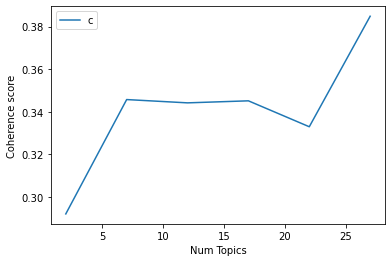

In [49]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_score1)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [50]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_score1):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 27

index: 0 | Num Topics = 2  has Coherence Value of 0.2921
index: 1 | Num Topics = 7  has Coherence Value of 0.3457
index: 2 | Num Topics = 12  has Coherence Value of 0.3442
index: 3 | Num Topics = 17  has Coherence Value of 0.3452
index: 4 | Num Topics = 22  has Coherence Value of 0.333
index: 5 | Num Topics = 27  has Coherence Value of 0.3849


In [51]:
# Select optimal number of topics
optimal_model_sg_score1 = model_list_sg_score1[5]

In [52]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_score1 = pyLDAvis.gensim_models.prepare(optimal_model_sg_score1, corpus_sg_score1, id2word_sg_score1)

In [53]:
print("pyLDAVis for SG topics for score=1:")
vis_sg_score1

pyLDAVis for SG topics for score=1:


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
9     -0.126700 -0.206606       1        1  9.977954
0     -0.017699 -0.098613       2        1  9.477219
11     0.046392  0.061939       3        1  8.410607
2     -0.228844  0.022204       4        1  8.397047
7     -0.094845  0.228795       5        1  8.132285
15     0.023675  0.172629       6        1  7.185347
4      0.040269 -0.025210       7        1  6.617803
6     -0.176530  0.015434       8        1  6.513114
13     0.041979 -0.059138       9        1  6.123999
14    -0.113129 -0.061458      10        1  5.940919
12    -0.094761  0.111543      11        1  5.056708
5      0.085117 -0.214337      12        1  4.451098
8     -0.030824 -0.048806      13        1  3.157645
10     0.189239  0.102484      14        1  3.133671
1      0.145805  0.013250      15        1  2.622031
3      0.122047  0.002759      16        1  2.532124
16     0.188810 -0.016869      17        1  2.270428, topic_info=         Term        Freq       Total Category  logprob  loglift
10     update  457.000000  457.000000  Default  30.0000  30.0000
61    account  303.000000  303.000000  Default  29.0000  29.0000
67       post  405.000000  405.000000  Default  28.0000  28.0000
7         new  242.000000  242.000000  Default  27.0000  27.0000
251     photo  128.000000  128.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
248  annoying    4.423658   38.757832  Topic17  -4.4374   1.6148
304      stop    4.205278   44.797442  Topic17  -4.4881   1.4194
63       feel    3.494977   18.498317  Topic17  -4.6731   2.1188
114      page    3.459592   45.440188  Topic17  -4.6832   1.2100
61    account    3.528487  303.144512  Topic17  -4.6635  -0.6681

[936 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
678      11  0.615148    ability
45        2  0.118338       able
45        4  0.532521       able
45        7  0.157784       able
45        8  0.098615       able
...     ...       ...        ...
11       10  0.156318       year
437       1  0.939156  yesterday
12        6  0.405899        yet
12       13  0.527668        yet
101       5  0.895940       zoom

[1511 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 1, 12, 3, 8, 16, 5, 7, 14, 15, 13, 6, 9, 11, 2, 4, 17])

## LDA Topic Modelling (Rating = 2)

In [54]:
# By-rating Topic Modelling - rating = 2
# Convert to list - move to each section
review_sg_score2 = instagram_ios_sg_review_YearMonth_score2.review.values.tolist()
review_words_sg_score2 = list(sent_to_words(review_sg_score2))
print(review_words_sg_score2[:1])

[['can', 'upload', 'photos', 'but', 'not', 'videos', 'and', 'boomerangs', 'not', 'sure', 'why']]


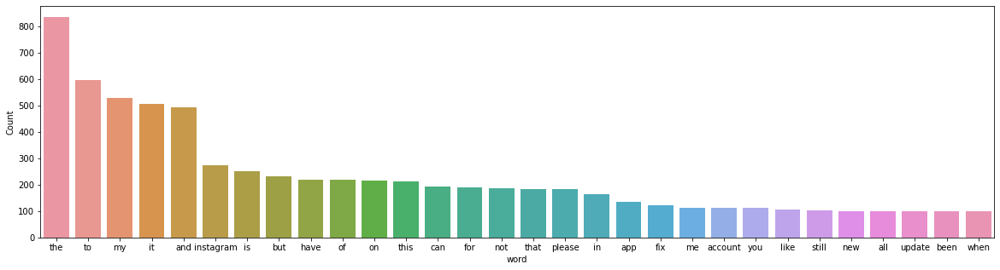

In [55]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_score2))

In [56]:
# Clean text
review_sg_ready_score2 = process_words(review_words_sg_score2)  # processed Text Data! - move to each section


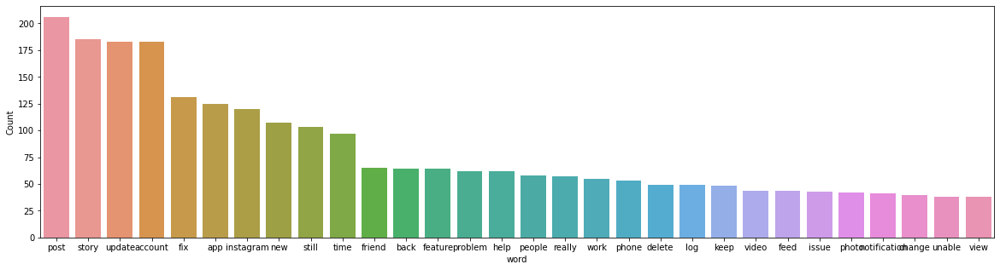

In [57]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_sg_ready_score2))


In [58]:
# Create Dictionary
id2word_sg_score2 = corpora.Dictionary(review_sg_ready_score2)

2021-10-16 02:28:46,334 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 02:28:46,430 [INFO] gensim.corpora.dictionary - built Dictionary(1227 unique tokens: ['boomerang', 'photo', 'sure', 'upload', 'video']...) from 585 documents (total 7509 corpus positions)
2021-10-16 02:28:46,438 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1227 unique tokens: ['boomerang', 'photo', 'sure', 'upload', 'video']...) from 585 documents (total 7509 corpus positions)", 'datetime': '2021-10-16T02:28:46.438129', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [59]:
# Create Corpus: Term Document Frequency
corpus_sg_score2 = [id2word_sg_score2.doc2bow(text) for text in review_sg_ready_score2]

In [60]:
# Training LDA model
model_list_sg_score2, coherence_values_sg_score2 = compute_coherence_values(dictionary=id2word_sg_score2, corpus=corpus_sg_score2, 
                                                              texts=review_sg_ready_score2, limit=30, start=2, step=5)


2021-10-16 02:28:46,951 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 02:28:46,952 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 02:28:46,955 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:28:46,956 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 585 documents, updating model once every 585 documents, evaluating perplexity every 585 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 02:28:49,072 [INFO] gensim.models.ldamodel - -7.682 per-word bound, 205.3 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:28:49,082 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #585/585
2021-10-16 02:28:50,840 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.027*"post" + 0.022*"update" + 0.016*"new" + 0.014*"time" + 0.014*"instagram" + 0.014*"app" + 0.012*"ac

2021-10-16 02:29:11,585 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"account" + 0.030*"story" + 0.024*"update" + 0.023*"fix" + 0.018*"post" + 0.016*"still" + 0.016*"app" + 0.014*"instagram" + 0.010*"help" + 0.010*"log"
2021-10-16 02:29:11,586 [INFO] gensim.models.ldamodel - topic diff=0.017677, rho=0.301511
2021-10-16 02:29:12,671 [INFO] gensim.models.ldamodel - -6.336 per-word bound, 80.8 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:29:12,683 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #585/585
2021-10-16 02:29:13,567 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.031*"post" + 0.016*"update" + 0.016*"new" + 0.014*"back" + 0.013*"instagram" + 0.013*"time" + 0.013*"friend" + 0.013*"app" + 0.009*"notification" + 0.009*"story"
2021-10-16 02:29:13,569 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"account" + 0.030*"story" + 0.025*"update" + 0.023*"fix" + 0.018*"post" + 0.017*"still" + 0.016*"app"

2021-10-16 02:29:30,195 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"account" + 0.030*"story" + 0.025*"update" + 0.023*"fix" + 0.018*"post" + 0.017*"still" + 0.016*"app" + 0.014*"instagram" + 0.010*"help" + 0.010*"time"
2021-10-16 02:29:30,197 [INFO] gensim.models.ldamodel - topic diff=0.009946, rho=0.218218
2021-10-16 02:29:31,103 [INFO] gensim.models.ldamodel - -6.326 per-word bound, 80.2 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:29:31,108 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #585/585
2021-10-16 02:29:31,814 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.032*"post" + 0.016*"new" + 0.015*"update" + 0.014*"back" + 0.013*"friend" + 0.013*"instagram" + 0.012*"time" + 0.012*"app" + 0.010*"notification" + 0.009*"story"
2021-10-16 02:29:31,815 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"account" + 0.030*"story" + 0.025*"update" + 0.023*"fix" + 0.018*"post" + 0.017*"still" + 0.017*"app

2021-10-16 02:29:46,981 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"account" + 0.030*"story" + 0.025*"update" + 0.023*"fix" + 0.018*"post" + 0.018*"still" + 0.017*"app" + 0.015*"instagram" + 0.011*"time" + 0.011*"help"
2021-10-16 02:29:46,984 [INFO] gensim.models.ldamodel - topic diff=0.008130, rho=0.179605
2021-10-16 02:29:48,120 [INFO] gensim.models.ldamodel - -6.318 per-word bound, 79.8 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:29:48,126 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #585/585
2021-10-16 02:29:49,031 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.031*"post" + 0.016*"new" + 0.015*"update" + 0.014*"back" + 0.013*"friend" + 0.013*"instagram" + 0.012*"time" + 0.011*"app" + 0.011*"notification" + 0.009*"iphone"
2021-10-16 02:29:49,045 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"account" + 0.030*"story" + 0.025*"update" + 0.023*"fix" + 0.018*"post" + 0.018*"still" + 0.017*"ap

2021-10-16 02:30:04,647 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"account" + 0.030*"story" + 0.025*"update" + 0.024*"fix" + 0.019*"post" + 0.019*"still" + 0.017*"app" + 0.015*"instagram" + 0.011*"time" + 0.011*"help"
2021-10-16 02:30:04,648 [INFO] gensim.models.ldamodel - topic diff=0.006698, rho=0.156174
2021-10-16 02:30:05,593 [INFO] gensim.models.ldamodel - -6.313 per-word bound, 79.5 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:30:05,595 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #585/585
2021-10-16 02:30:06,209 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.030*"post" + 0.016*"new" + 0.015*"update" + 0.014*"back" + 0.013*"friend" + 0.013*"instagram" + 0.011*"notification" + 0.011*"time" + 0.011*"app" + 0.009*"story"
2021-10-16 02:30:06,211 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"account" + 0.030*"story" + 0.025*"update" + 0.024*"fix" + 0.019*"post" + 0.019*"still" + 0.017*"app

2021-10-16 02:30:21,447 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"account" + 0.030*"story" + 0.025*"update" + 0.024*"fix" + 0.019*"post" + 0.019*"still" + 0.017*"app" + 0.015*"instagram" + 0.012*"time" + 0.011*"help"
2021-10-16 02:30:21,478 [INFO] gensim.models.ldamodel - topic diff=0.004681, rho=0.140028
2021-10-16 02:30:21,479 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=1227, num_topics=2, decay=0.5, chunksize=1000) in 94.52s', 'datetime': '2021-10-16T02:30:21.479622', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 02:30:21,482 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 02:30:25,798 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-1

2021-10-16 02:30:35,056 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"story" + 0.031*"update" + 0.025*"app" + 0.024*"account" + 0.023*"instagram" + 0.018*"fix" + 0.016*"time" + 0.015*"work" + 0.015*"problem" + 0.014*"still"
2021-10-16 02:30:35,059 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.045*"post" + 0.026*"account" + 0.025*"fix" + 0.019*"new" + 0.017*"still" + 0.015*"time" + 0.014*"really" + 0.012*"update" + 0.012*"app" + 0.011*"people"
2021-10-16 02:30:35,062 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.030*"story" + 0.029*"account" + 0.026*"update" + 0.014*"fix" + 0.014*"post" + 0.013*"still" + 0.013*"feature" + 0.013*"people" + 0.012*"instagram" + 0.010*"gif"
2021-10-16 02:30:35,065 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.041*"update" + 0.021*"friend" + 0.015*"post" + 0.012*"new" + 0.012*"story" + 0.012*"message" + 0.012*"gif" + 0.011*"iphone" + 0.010*"time" + 0.010*"login"
2021-10-16 02:30:35,068 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 02:30:43,572 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"story" + 0.031*"update" + 0.026*"app" + 0.025*"account" + 0.023*"instagram" + 0.018*"fix" + 0.017*"still" + 0.016*"work" + 0.015*"time" + 0.014*"log"
2021-10-16 02:30:43,576 [INFO] gensim.models.ldamodel - topic diff=0.025614, rho=0.301511
2021-10-16 02:30:44,435 [INFO] gensim.models.ldamodel - -6.586 per-word bound, 96.0 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:30:44,436 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #585/585
2021-10-16 02:30:45,037 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.024*"notification" + 0.021*"story" + 0.018*"account" + 0.017*"remove" + 0.016*"instagram" + 0.016*"update" + 0.016*"time" + 0.015*"new" + 0.012*"music" + 0.011*"video"
2021-10-16 02:30:45,040 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.029*"post" + 0.026*"account" + 0.020*"story" + 0.016*"update" + 0.015*"friend" + 0.014*"share" + 0.

2021-10-16 02:30:52,491 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.024*"notification" + 0.021*"story" + 0.018*"account" + 0.018*"remove" + 0.016*"instagram" + 0.016*"time" + 0.015*"update" + 0.014*"new" + 0.012*"music" + 0.011*"video"
2021-10-16 02:30:52,493 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.029*"post" + 0.026*"app" + 0.020*"notification" + 0.018*"button" + 0.015*"upload" + 0.013*"photo" + 0.012*"delete" + 0.012*"shop" + 0.011*"hour" + 0.010*"instagram"
2021-10-16 02:30:52,496 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"story" + 0.031*"update" + 0.028*"account" + 0.027*"app" + 0.022*"instagram" + 0.020*"still" + 0.018*"fix" + 0.018*"log" + 0.017*"work" + 0.015*"time"
2021-10-16 02:30:52,498 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.031*"account" + 0.031*"story" + 0.022*"update" + 0.015*"post" + 0.015*"fix" + 0.014*"people" + 0.014*"feature" + 0.012*"instagram" + 0.012*"poll" + 0.012*"function"
2021-10-16 02:30:52,500 [INFO] gensim.model

2021-10-16 02:31:00,294 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"story" + 0.031*"update" + 0.028*"account" + 0.028*"app" + 0.022*"instagram" + 0.021*"still" + 0.019*"log" + 0.018*"fix" + 0.017*"work" + 0.015*"time"
2021-10-16 02:31:00,295 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.032*"account" + 0.031*"story" + 0.021*"update" + 0.015*"post" + 0.015*"fix" + 0.015*"people" + 0.014*"feature" + 0.013*"poll" + 0.013*"instagram" + 0.012*"month"
2021-10-16 02:31:00,298 [INFO] gensim.models.ldamodel - topic diff=0.009083, rho=0.213201
2021-10-16 02:31:01,141 [INFO] gensim.models.ldamodel - -6.560 per-word bound, 94.4 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:31:01,142 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #585/585
2021-10-16 02:31:01,760 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.029*"post" + 0.027*"app" + 0.022*"upload" + 0.021*"notification" + 0.018*"button" + 0.015*"photo" + 0.012

2021-10-16 02:31:08,246 [INFO] gensim.models.ldamodel - -6.555 per-word bound, 94.0 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:31:08,248 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #585/585
2021-10-16 02:31:08,771 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.029*"post" + 0.027*"app" + 0.026*"upload" + 0.021*"notification" + 0.019*"button" + 0.015*"photo" + 0.012*"delete" + 0.012*"shop" + 0.011*"hour" + 0.010*"video"
2021-10-16 02:31:08,773 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.049*"post" + 0.025*"fix" + 0.023*"account" + 0.020*"new" + 0.016*"time" + 0.014*"really" + 0.012*"still" + 0.012*"people" + 0.011*"problem" + 0.011*"back"
2021-10-16 02:31:08,775 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.024*"notification" + 0.019*"story" + 0.018*"account" + 0.018*"remove" + 0.017*"instagram" + 0.016*"time" + 0.014*"update" + 0.014*"new" + 0.013*"music" + 0.011*"video"
2021-10-16 02:31:08,777 [INF

2021-10-16 02:31:16,632 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"post" + 0.028*"upload" + 0.027*"app" + 0.021*"notification" + 0.020*"button" + 0.015*"photo" + 0.012*"delete" + 0.012*"shop" + 0.012*"hour" + 0.010*"video"
2021-10-16 02:31:16,635 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.046*"update" + 0.027*"friend" + 0.016*"story" + 0.014*"new" + 0.014*"post" + 0.013*"gif" + 0.013*"message" + 0.011*"back" + 0.011*"login" + 0.011*"iphone"
2021-10-16 02:31:16,637 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.033*"account" + 0.031*"story" + 0.020*"update" + 0.015*"fix" + 0.015*"feature" + 0.015*"post" + 0.015*"people" + 0.014*"poll" + 0.013*"month" + 0.013*"instagram"
2021-10-16 02:31:16,639 [INFO] gensim.models.ldamodel - topic diff=0.004438, rho=0.174078
2021-10-16 02:31:17,320 [INFO] gensim.models.ldamodel - -6.551 per-word bound, 93.8 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:31:17,327 [INFO] gensim.mo

2021-10-16 02:31:23,371 [INFO] gensim.models.ldamodel - topic diff=0.003356, rho=0.162221
2021-10-16 02:31:24,202 [INFO] gensim.models.ldamodel - -6.549 per-word bound, 93.6 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:31:24,204 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #585/585
2021-10-16 02:31:24,928 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"story" + 0.031*"update" + 0.029*"account" + 0.028*"app" + 0.022*"instagram" + 0.021*"still" + 0.019*"fix" + 0.019*"log" + 0.018*"work" + 0.016*"time"
2021-10-16 02:31:24,930 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.024*"notification" + 0.019*"story" + 0.018*"account" + 0.018*"remove" + 0.017*"instagram" + 0.015*"time" + 0.014*"update" + 0.014*"new" + 0.013*"music" + 0.011*"video"
2021-10-16 02:31:24,938 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"upload" + 0.028*"post" + 0.027*"app" + 0.021*"notification" + 0.020*"button" + 0.016*"photo" +

2021-10-16 02:31:34,017 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.031*"upload" + 0.028*"post" + 0.027*"app" + 0.021*"notification" + 0.021*"button" + 0.016*"photo" + 0.012*"delete" + 0.012*"shop" + 0.012*"hour" + 0.011*"video"
2021-10-16 02:31:34,026 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.031*"post" + 0.025*"account" + 0.024*"story" + 0.017*"update" + 0.017*"share" + 0.015*"friend" + 0.015*"button" + 0.015*"option" + 0.013*"unable" + 0.012*"list"
2021-10-16 02:31:34,038 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"story" + 0.031*"update" + 0.029*"account" + 0.028*"app" + 0.022*"instagram" + 0.022*"still" + 0.019*"fix" + 0.019*"log" + 0.018*"work" + 0.016*"time"
2021-10-16 02:31:34,042 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.046*"update" + 0.028*"friend" + 0.016*"story" + 0.015*"new" + 0.014*"post" + 0.013*"gif" + 0.013*"message" + 0.011*"back" + 0.011*"iphone" + 0.011*"dm"
2021-10-16 02:31:34,044 [INFO] gensim.models.ldamodel - topic diff=

2021-10-16 02:31:42,577 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"story" + 0.031*"update" + 0.029*"account" + 0.028*"app" + 0.022*"still" + 0.021*"instagram" + 0.019*"fix" + 0.019*"log" + 0.018*"work" + 0.016*"time"
2021-10-16 02:31:42,578 [INFO] gensim.models.ldamodel - topic diff=0.002341, rho=0.142857
2021-10-16 02:31:43,414 [INFO] gensim.models.ldamodel - -6.545 per-word bound, 93.4 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:31:43,415 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #585/585
2021-10-16 02:31:44,024 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.045*"update" + 0.028*"friend" + 0.016*"story" + 0.015*"new" + 0.014*"post" + 0.013*"gif" + 0.013*"message" + 0.011*"back" + 0.011*"iphone" + 0.011*"dm"
2021-10-16 02:31:44,026 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.031*"post" + 0.025*"account" + 0.024*"story" + 0.017*"share" + 0.017*"update" + 0.016*"friend" + 0.015*"button" + 0

2021-10-16 02:31:59,647 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.033*"update" + 0.027*"account" + 0.025*"post" + 0.021*"story" + 0.020*"new" + 0.018*"fix" + 0.017*"friend" + 0.016*"still" + 0.014*"app" + 0.012*"help"
2021-10-16 02:31:59,649 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.056*"post" + 0.018*"app" + 0.016*"account" + 0.015*"upload" + 0.014*"comment" + 0.011*"shop" + 0.011*"instagram" + 0.009*"photo" + 0.009*"story" + 0.009*"action"
2021-10-16 02:31:59,652 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.027*"update" + 0.019*"issue" + 0.017*"gif" + 0.017*"log" + 0.016*"friend" + 0.014*"certain" + 0.013*"message" + 0.013*"account" + 0.012*"keep" + 0.011*"put"
2021-10-16 02:31:59,654 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.029*"post" + 0.026*"account" + 0.016*"option" + 0.015*"instagram" + 0.015*"update" + 0.014*"message" + 0.013*"unable" + 0.013*"friend" + 0.011*"people" + 0.011*"back"
2021-10-16 02:31:59,656 [INFO] gensim.models.ldamodel - to

2021-10-16 02:32:08,318 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.026*"music" + 0.026*"post" + 0.025*"feature" + 0.024*"instagram" + 0.019*"new" + 0.015*"user" + 0.014*"time" + 0.013*"issue" + 0.012*"app" + 0.012*"change"
2021-10-16 02:32:08,327 [INFO] gensim.models.ldamodel - topic diff=0.053156, rho=0.333333
2021-10-16 02:32:09,282 [INFO] gensim.models.ldamodel - -6.739 per-word bound, 106.8 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:32:09,283 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #585/585
2021-10-16 02:32:09,916 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.046*"story" + 0.024*"account" + 0.020*"main" + 0.020*"update" + 0.018*"fix" + 0.016*"poll" + 0.016*"people" + 0.014*"help" + 0.012*"font" + 0.012*"month"
2021-10-16 02:32:09,919 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.029*"account" + 0.027*"story" + 0.022*"change" + 0.021*"instagram" + 0.021*"update" + 0.016*"post" + 0.013*"rea

2021-10-16 02:32:18,891 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.027*"post" + 0.027*"music" + 0.025*"feature" + 0.024*"instagram" + 0.019*"new" + 0.015*"user" + 0.014*"time" + 0.013*"issue" + 0.012*"change" + 0.011*"appear"
2021-10-16 02:32:18,901 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.055*"story" + 0.035*"account" + 0.031*"update" + 0.030*"instagram" + 0.029*"app" + 0.029*"log" + 0.021*"highlight" + 0.020*"fix" + 0.017*"problem" + 0.017*"video"
2021-10-16 02:32:18,905 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.040*"work" + 0.033*"button" + 0.027*"app" + 0.024*"phone" + 0.018*"time" + 0.016*"annoying" + 0.015*"reinstall" + 0.014*"login" + 0.013*"still" + 0.012*"load"
2021-10-16 02:32:18,908 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.028*"story" + 0.027*"account" + 0.023*"change" + 0.020*"instagram" + 0.020*"update" + 0.016*"post" + 0.013*"really" + 0.013*"fix" + 0.012*"font" + 0.011*"back"
2021-10-16 02:32:18,910 [INFO] gensim.models.ldamodel

2021-10-16 02:32:27,810 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.029*"story" + 0.027*"account" + 0.024*"change" + 0.020*"instagram" + 0.019*"update" + 0.016*"post" + 0.013*"really" + 0.013*"fix" + 0.012*"font" + 0.012*"back"
2021-10-16 02:32:27,813 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.028*"post" + 0.027*"music" + 0.025*"feature" + 0.024*"instagram" + 0.019*"new" + 0.015*"user" + 0.014*"time" + 0.013*"issue" + 0.012*"change" + 0.011*"remove"
2021-10-16 02:32:27,814 [INFO] gensim.models.ldamodel - topic diff=0.012089, rho=0.223607
2021-10-16 02:32:28,556 [INFO] gensim.models.ldamodel - -6.699 per-word bound, 103.9 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:32:28,558 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #585/585
2021-10-16 02:32:29,290 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.048*"story" + 0.025*"account" + 0.022*"update" + 0.020*"main" + 0.020*"poll" + 0.019*"fix" + 0.019*"p

2021-10-16 02:32:36,522 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #585/585
2021-10-16 02:32:37,156 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.029*"story" + 0.027*"account" + 0.024*"change" + 0.019*"instagram" + 0.019*"update" + 0.017*"post" + 0.014*"really" + 0.012*"back" + 0.012*"font" + 0.012*"fix"
2021-10-16 02:32:37,158 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.030*"account" + 0.023*"option" + 0.020*"post" + 0.020*"message" + 0.016*"instagram" + 0.013*"update" + 0.013*"unable" + 0.012*"photo" + 0.012*"friend" + 0.012*"help"
2021-10-16 02:32:37,160 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.042*"notification" + 0.029*"story" + 0.021*"update" + 0.020*"remove" + 0.019*"insta" + 0.018*"time" + 0.013*"account" + 0.012*"still" + 0.010*"app" + 0.010*"setting"
2021-10-16 02:32:37,163 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.034*"update" + 0.028*"new" + 0.022*"post" + 0.021*"account" + 0.021*"friend" + 0.018*"fix" + 0.014*"gif" + 

2021-10-16 02:32:45,040 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.026*"certain" + 0.024*"friend" + 0.022*"gif" + 0.021*"update" + 0.014*"follow" + 0.014*"community" + 0.014*"put" + 0.013*"protect" + 0.013*"message" + 0.013*"issue"
2021-10-16 02:32:45,042 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.029*"post" + 0.028*"music" + 0.025*"feature" + 0.024*"instagram" + 0.018*"new" + 0.015*"user" + 0.014*"time" + 0.013*"issue" + 0.012*"change" + 0.011*"remove"
2021-10-16 02:32:45,043 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.030*"account" + 0.023*"option" + 0.020*"message" + 0.019*"post" + 0.016*"instagram" + 0.013*"update" + 0.013*"photo" + 0.012*"unable" + 0.012*"friend" + 0.012*"help"
2021-10-16 02:32:45,044 [INFO] gensim.models.ldamodel - topic diff=0.005003, rho=0.179605
2021-10-16 02:32:45,908 [INFO] gensim.models.ldamodel - -6.685 per-word bound, 102.9 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:32:45,915 [IN

2021-10-16 02:32:53,290 [INFO] gensim.models.ldamodel - topic diff=0.003706, rho=0.166667
2021-10-16 02:32:54,627 [INFO] gensim.models.ldamodel - -6.682 per-word bound, 102.7 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:32:54,629 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #585/585
2021-10-16 02:32:55,613 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.030*"story" + 0.027*"account" + 0.024*"change" + 0.019*"instagram" + 0.019*"update" + 0.017*"post" + 0.014*"really" + 0.012*"back" + 0.012*"font" + 0.011*"fix"
2021-10-16 02:32:55,617 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.052*"update" + 0.042*"new" + 0.033*"post" + 0.029*"still" + 0.023*"fix" + 0.018*"app" + 0.014*"bug" + 0.014*"time" + 0.012*"story" + 0.011*"feature"
2021-10-16 02:32:55,619 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.029*"post" + 0.028*"music" + 0.025*"feature" + 0.024*"instagram" + 0.018*"new" + 0.015*"user" + 0.014*"time" + 

2021-10-16 02:33:03,184 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.029*"post" + 0.028*"music" + 0.025*"feature" + 0.024*"instagram" + 0.018*"new" + 0.015*"user" + 0.014*"time" + 0.013*"issue" + 0.013*"change" + 0.011*"remove"
2021-10-16 02:33:03,185 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.031*"account" + 0.023*"option" + 0.020*"message" + 0.018*"post" + 0.016*"instagram" + 0.013*"update" + 0.013*"photo" + 0.012*"friend" + 0.012*"unable" + 0.011*"help"
2021-10-16 02:33:03,189 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.046*"notification" + 0.028*"story" + 0.021*"update" + 0.020*"remove" + 0.018*"insta" + 0.017*"time" + 0.013*"still" + 0.012*"account" + 0.012*"setting" + 0.012*"app"
2021-10-16 02:33:03,195 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.053*"update" + 0.042*"new" + 0.034*"post" + 0.029*"still" + 0.023*"fix" + 0.018*"app" + 0.014*"time" + 0.014*"bug" + 0.012*"story" + 0.011*"feature"
2021-10-16 02:33:03,198 [INFO] gensim.models.ldamodel - 

2021-10-16 02:33:11,429 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.049*"story" + 0.027*"account" + 0.022*"update" + 0.020*"people" + 0.020*"fix" + 0.020*"main" + 0.020*"poll" + 0.017*"font" + 0.017*"new" + 0.015*"help"
2021-10-16 02:33:11,430 [INFO] gensim.models.ldamodel - topic diff=0.002258, rho=0.145865
2021-10-16 02:33:12,347 [INFO] gensim.models.ldamodel - -6.677 per-word bound, 102.3 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:33:12,348 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #585/585
2021-10-16 02:33:13,041 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.035*"update" + 0.028*"new" + 0.022*"post" + 0.020*"friend" + 0.020*"account" + 0.019*"fix" + 0.015*"gif" + 0.014*"story" + 0.013*"much" + 0.013*"back"
2021-10-16 02:33:13,042 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.030*"account" + 0.023*"option" + 0.020*"message" + 0.018*"post" + 0.016*"instagram" + 0.013*"update" + 0.013*"photo" +

2021-10-16 02:33:28,627 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.041*"update" + 0.022*"login" + 0.018*"back" + 0.016*"problem" + 0.014*"people" + 0.014*"new" + 0.013*"time" + 0.012*"old" + 0.011*"function" + 0.011*"fix"
2021-10-16 02:33:28,646 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.034*"account" + 0.023*"fix" + 0.021*"update" + 0.021*"app" + 0.020*"new" + 0.019*"time" + 0.017*"unable" + 0.017*"feature" + 0.013*"friend" + 0.010*"people"
2021-10-16 02:33:28,671 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.026*"account" + 0.023*"update" + 0.021*"story" + 0.019*"instagram" + 0.015*"delete" + 0.014*"friend" + 0.014*"fix" + 0.013*"really" + 0.012*"post" + 0.011*"font"
2021-10-16 02:33:28,674 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.028*"post" + 0.021*"still" + 0.020*"time" + 0.019*"already" + 0.017*"new" + 0.016*"instagram" + 0.012*"feature" + 0.012*"day" + 0.011*"name" + 0.011*"people"
2021-10-16 02:33:28,676 [INFO] gensim.models.ldamodel - topic 

2021-10-16 02:33:37,567 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.029*"post" + 0.026*"already" + 0.023*"time" + 0.018*"still" + 0.017*"new" + 0.016*"instagram" + 0.016*"timeline" + 0.015*"follow" + 0.014*"much" + 0.013*"follower"
2021-10-16 02:33:37,569 [INFO] gensim.models.ldamodel - topic diff=0.096230, rho=0.377964
2021-10-16 02:33:38,475 [INFO] gensim.models.ldamodel - -6.900 per-word bound, 119.4 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:33:38,477 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #585/585
2021-10-16 02:33:39,216 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.030*"button" + 0.028*"story" + 0.027*"suddenly" + 0.026*"time" + 0.020*"app" + 0.017*"fix" + 0.016*"insta" + 0.015*"share" + 0.014*"feed" + 0.014*"reinstall"
2021-10-16 02:33:39,225 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.030*"update" + 0.022*"change" + 0.021*"account" + 0.021*"friend" + 0.018*"new" + 0.016*"close" + 0.

2021-10-16 02:33:47,564 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.030*"post" + 0.026*"already" + 0.024*"time" + 0.023*"timeline" + 0.017*"follow" + 0.017*"still" + 0.017*"instagram" + 0.016*"new" + 0.015*"much" + 0.015*"follower"
2021-10-16 02:33:47,566 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.069*"account" + 0.024*"post" + 0.019*"instagram" + 0.019*"delete" + 0.018*"update" + 0.017*"new" + 0.013*"friend" + 0.012*"poll" + 0.011*"help" + 0.010*"like"
2021-10-16 02:33:47,570 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.053*"update" + 0.043*"app" + 0.033*"still" + 0.029*"feature" + 0.027*"new" + 0.026*"notification" + 0.019*"message" + 0.018*"fix" + 0.018*"instagram" + 0.017*"phone"
2021-10-16 02:33:47,572 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.037*"story" + 0.022*"instagram" + 0.022*"remove" + 0.020*"function" + 0.019*"comment" + 0.017*"still" + 0.016*"insta" + 0.016*"update" + 0.015*"account" + 0.013*"font"
2021-10-16 02:33:47,575 [INFO] gensim.m

2021-10-16 02:33:55,093 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.035*"fix" + 0.026*"account" + 0.024*"post" + 0.022*"block" + 0.018*"time" + 0.018*"happen" + 0.018*"really" + 0.018*"problem" + 0.016*"people" + 0.015*"still"
2021-10-16 02:33:55,098 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.105*"account" + 0.090*"log" + 0.035*"error" + 0.026*"keep" + 0.025*"fix" + 0.024*"wrong" + 0.022*"update" + 0.017*"main" + 0.017*"story" + 0.017*"version"
2021-10-16 02:33:55,104 [INFO] gensim.models.ldamodel - topic diff=0.016414, rho=0.235702
2021-10-16 02:33:55,902 [INFO] gensim.models.ldamodel - -6.833 per-word bound, 114.0 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:33:55,904 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #585/585
2021-10-16 02:33:56,497 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.068*"account" + 0.023*"post" + 0.019*"instagram" + 0.019*"delete" + 0.018*"update" + 0.017*"new" + 0.014*"f

2021-10-16 02:34:04,133 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #585/585
2021-10-16 02:34:04,805 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.035*"fix" + 0.027*"account" + 0.024*"post" + 0.022*"block" + 0.019*"happen" + 0.018*"time" + 0.018*"problem" + 0.018*"really" + 0.016*"people" + 0.014*"new"
2021-10-16 02:34:04,808 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.040*"update" + 0.024*"new" + 0.024*"login" + 0.021*"font" + 0.017*"people" + 0.017*"problem" + 0.016*"back" + 0.016*"hope" + 0.012*"old" + 0.012*"function"
2021-10-16 02:34:04,820 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.032*"update" + 0.027*"filter" + 0.027*"fix" + 0.023*"new" + 0.022*"unable" + 0.020*"app" + 0.019*"time" + 0.016*"feature" + 0.012*"story" + 0.012*"ugly"
2021-10-16 02:34:04,822 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.032*"post" + 0.027*"already" + 0.025*"timeline" + 0.024*"time" + 0.017*"follow" + 0.017*"still" + 0.016*"new" + 0.016*"instagram" + 0

2021-10-16 02:34:12,811 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.114*"account" + 0.092*"log" + 0.036*"error" + 0.027*"keep" + 0.024*"fix" + 0.023*"wrong" + 0.020*"update" + 0.018*"main" + 0.017*"still" + 0.017*"version"
2021-10-16 02:34:12,813 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.035*"fix" + 0.027*"account" + 0.023*"post" + 0.022*"block" + 0.019*"happen" + 0.018*"time" + 0.018*"problem" + 0.018*"really" + 0.016*"people" + 0.014*"bug"
2021-10-16 02:34:12,815 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.062*"update" + 0.046*"app" + 0.038*"notification" + 0.038*"still" + 0.035*"new" + 0.032*"feature" + 0.020*"instagram" + 0.018*"message" + 0.017*"fix" + 0.017*"iphone"
2021-10-16 02:34:12,816 [INFO] gensim.models.ldamodel - topic diff=0.006216, rho=0.185695
2021-10-16 02:34:13,521 [INFO] gensim.models.ldamodel - -6.818 per-word bound, 112.8 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:34:13,525 [INFO] gensim.

2021-10-16 02:34:19,601 [INFO] gensim.models.ldamodel - topic diff=0.004679, rho=0.171499
2021-10-16 02:34:20,552 [INFO] gensim.models.ldamodel - -6.814 per-word bound, 112.5 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:34:20,553 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #585/585
2021-10-16 02:34:21,195 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.036*"fix" + 0.027*"account" + 0.023*"post" + 0.022*"block" + 0.019*"happen" + 0.018*"time" + 0.018*"problem" + 0.018*"really" + 0.016*"people" + 0.014*"bug"
2021-10-16 02:34:21,197 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.032*"update" + 0.028*"filter" + 0.027*"fix" + 0.022*"unable" + 0.022*"new" + 0.020*"app" + 0.019*"time" + 0.016*"feature" + 0.013*"play" + 0.012*"ugly"
2021-10-16 02:34:21,200 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.026*"post" + 0.019*"instagram" + 0.018*"update" + 0.018*"function" + 0.016*"story" + 0.014*"wifi" + 0.013*"kee

2021-10-16 02:34:29,459 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.027*"app" + 0.019*"post" + 0.019*"shop" + 0.016*"upload" + 0.016*"friend" + 0.014*"really" + 0.013*"story" + 0.013*"delete" + 0.013*"fan" + 0.013*"user"
2021-10-16 02:34:29,462 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.032*"post" + 0.027*"already" + 0.025*"timeline" + 0.024*"time" + 0.018*"follow" + 0.017*"still" + 0.016*"show" + 0.016*"day" + 0.016*"new" + 0.015*"instagram"
2021-10-16 02:34:29,465 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.026*"post" + 0.019*"instagram" + 0.018*"update" + 0.018*"function" + 0.016*"story" + 0.014*"wifi" + 0.013*"keep" + 0.011*"new" + 0.011*"appear" + 0.010*"available"
2021-10-16 02:34:29,469 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.036*"fix" + 0.027*"account" + 0.023*"post" + 0.022*"block" + 0.019*"happen" + 0.018*"time" + 0.018*"problem" + 0.018*"really" + 0.016*"people" + 0.014*"bug"
2021-10-16 02:34:29,472 [INFO] gensim.models.ldamodel - topic 

2021-10-16 02:34:37,991 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.124*"account" + 0.089*"log" + 0.037*"error" + 0.026*"keep" + 0.024*"fix" + 0.023*"still" + 0.022*"wrong" + 0.019*"update" + 0.017*"main" + 0.016*"version"
2021-10-16 02:34:37,995 [INFO] gensim.models.ldamodel - topic diff=0.002851, rho=0.149071
2021-10-16 02:34:39,188 [INFO] gensim.models.ldamodel - -6.808 per-word bound, 112.0 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:34:39,190 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #585/585
2021-10-16 02:34:39,736 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.040*"update" + 0.024*"login" + 0.024*"new" + 0.021*"font" + 0.017*"people" + 0.017*"problem" + 0.016*"back" + 0.015*"hope" + 0.012*"function" + 0.012*"quite"
2021-10-16 02:34:39,741 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.068*"update" + 0.045*"app" + 0.041*"still" + 0.039*"new" + 0.038*"notification" + 0.031*"feature" + 0.021*"i

2021-10-16 02:34:47,112 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.041*"button" + 0.035*"suddenly" + 0.026*"story" + 0.026*"time" + 0.019*"fix" + 0.017*"show" + 0.016*"app" + 0.015*"reinstall" + 0.014*"number" + 0.013*"people"
2021-10-16 02:34:47,114 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.039*"story" + 0.022*"instagram" + 0.022*"remove" + 0.021*"function" + 0.020*"comment" + 0.017*"insta" + 0.017*"still" + 0.016*"update" + 0.015*"open" + 0.014*"font"
2021-10-16 02:34:47,117 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.070*"account" + 0.022*"post" + 0.020*"delete" + 0.020*"instagram" + 0.014*"friend" + 0.013*"poll" + 0.012*"new" + 0.012*"like" + 0.011*"phone" + 0.010*"people"
2021-10-16 02:34:47,120 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.040*"update" + 0.025*"login" + 0.024*"new" + 0.021*"font" + 0.017*"people" + 0.017*"problem" + 0.016*"back" + 0.014*"hope" + 0.012*"function" + 0.012*"quite"
2021-10-16 02:34:47,122 [INFO] gensim.models.ldamode

2021-10-16 02:35:04,580 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.023*"block" + 0.022*"problem" + 0.022*"fix" + 0.022*"post" + 0.018*"thing" + 0.018*"people" + 0.017*"happen" + 0.017*"new" + 0.016*"update" + 0.015*"day"
2021-10-16 02:35:04,582 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.061*"story" + 0.040*"update" + 0.023*"fix" + 0.021*"instagram" + 0.021*"late" + 0.020*"view" + 0.018*"version" + 0.017*"account" + 0.016*"new" + 0.016*"app"
2021-10-16 02:35:04,583 [INFO] gensim.models.ldamodel - topic diff=0.141080, rho=0.447214
2021-10-16 02:35:05,774 [INFO] gensim.models.ldamodel - -7.037 per-word bound, 131.3 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:35:05,775 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #585/585
2021-10-16 02:35:06,572 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.030*"story" + 0.021*"account" + 0.021*"instagram" + 0.021*"post" + 0.021*"really" + 0.020*"friend" + 0.017*"wo

2021-10-16 02:35:13,583 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #585/585
2021-10-16 02:35:14,237 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.040*"app" + 0.035*"work" + 0.027*"still" + 0.023*"button" + 0.020*"post" + 0.019*"time" + 0.019*"instagram" + 0.018*"story" + 0.017*"reinstall" + 0.016*"reel"
2021-10-16 02:35:14,241 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.033*"update" + 0.028*"remove" + 0.025*"app" + 0.025*"story" + 0.021*"new" + 0.017*"feed" + 0.014*"still" + 0.014*"people" + 0.014*"insta" + 0.014*"ugly"
2021-10-16 02:35:14,242 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.065*"story" + 0.041*"update" + 0.026*"fix" + 0.023*"instagram" + 0.023*"late" + 0.020*"view" + 0.019*"version" + 0.018*"post" + 0.017*"new" + 0.017*"app"
2021-10-16 02:35:14,245 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.048*"phone" + 0.034*"app" + 0.024*"shop" + 0.022*"upload" + 0.018*"notification" + 0.018*"friend" + 0.015*"instagram" + 0.014*"downloa

2021-10-16 02:35:21,952 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.065*"story" + 0.040*"update" + 0.027*"fix" + 0.025*"instagram" + 0.024*"late" + 0.020*"version" + 0.020*"view" + 0.018*"post" + 0.018*"new" + 0.017*"problem"
2021-10-16 02:35:21,954 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.034*"fix" + 0.027*"story" + 0.027*"happen" + 0.025*"bug" + 0.023*"problem" + 0.022*"load" + 0.019*"help" + 0.018*"request" + 0.017*"error" + 0.012*"delete"
2021-10-16 02:35:21,955 [INFO] gensim.models.ldamodel - topic diff=0.021777, rho=0.250000
2021-10-16 02:35:22,959 [INFO] gensim.models.ldamodel - -6.923 per-word bound, 121.3 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:35:22,965 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #585/585
2021-10-16 02:35:23,533 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.056*"post" + 0.036*"story" + 0.034*"video" + 0.027*"photo" + 0.019*"save" + 0.018*"filter" + 0.017*"uploa

2021-10-16 02:35:30,501 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #585/585
2021-10-16 02:35:31,012 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.068*"story" + 0.053*"notification" + 0.026*"post" + 0.023*"share" + 0.023*"time" + 0.020*"fix" + 0.019*"unable" + 0.019*"option" + 0.016*"video" + 0.015*"feed"
2021-10-16 02:35:31,015 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.027*"update" + 0.025*"change" + 0.022*"app" + 0.019*"really" + 0.018*"back" + 0.018*"bad" + 0.015*"keep" + 0.014*"new" + 0.011*"record" + 0.011*"normal"
2021-10-16 02:35:31,017 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.065*"post" + 0.022*"story" + 0.019*"still" + 0.018*"upload" + 0.017*"work" + 0.016*"add" + 0.015*"feed" + 0.013*"look" + 0.012*"instead" + 0.012*"back"
2021-10-16 02:35:31,019 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.034*"story" + 0.021*"really" + 0.019*"post" + 0.019*"friend" + 0.018*"work" + 0.015*"instagram" + 0.013*"update" + 0.012*"leave" + 

2021-10-16 02:35:38,704 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.054*"friend" + 0.038*"update" + 0.036*"account" + 0.032*"close" + 0.030*"new" + 0.024*"post" + 0.023*"poll" + 0.023*"gif" + 0.022*"list" + 0.017*"fix"
2021-10-16 02:35:38,707 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.114*"account" + 0.049*"feature" + 0.042*"instagram" + 0.031*"delete" + 0.018*"create" + 0.018*"main" + 0.016*"long" + 0.016*"story" + 0.016*"hope" + 0.015*"highlight"
2021-10-16 02:35:38,708 [INFO] gensim.models.ldamodel - topic diff=0.008799, rho=0.192450
2021-10-16 02:35:39,459 [INFO] gensim.models.ldamodel - -6.894 per-word bound, 118.9 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:35:39,461 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #585/585
2021-10-16 02:35:39,951 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.065*"post" + 0.022*"story" + 0.018*"still" + 0.017*"work" + 0.016*"add" + 0.016*"upload" + 0.016*"fee

2021-10-16 02:35:47,510 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #585/585
2021-10-16 02:35:48,067 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.054*"friend" + 0.038*"update" + 0.034*"account" + 0.033*"close" + 0.030*"new" + 0.024*"post" + 0.024*"poll" + 0.023*"gif" + 0.022*"list" + 0.017*"fix"
2021-10-16 02:35:48,103 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.028*"instagram" + 0.023*"music" + 0.019*"open" + 0.019*"lose" + 0.018*"still" + 0.017*"story" + 0.017*"user" + 0.015*"contact" + 0.015*"post" + 0.014*"order"
2021-10-16 02:35:48,109 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.068*"story" + 0.042*"update" + 0.028*"fix" + 0.026*"instagram" + 0.024*"late" + 0.022*"version" + 0.020*"view" + 0.018*"new" + 0.018*"post" + 0.017*"problem"
2021-10-16 02:35:48,110 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.069*"phone" + 0.026*"app" + 0.025*"shop" + 0.020*"friend" + 0.018*"download" + 0.016*"notification" + 0.015*"account" + 0.015*"upload

2021-10-16 02:35:55,724 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.032*"account" + 0.030*"post" + 0.025*"instagram" + 0.021*"app" + 0.018*"message" + 0.016*"back" + 0.013*"people" + 0.012*"certain" + 0.012*"follow" + 0.010*"new"
2021-10-16 02:35:55,726 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.036*"fix" + 0.029*"bug" + 0.029*"happen" + 0.028*"story" + 0.026*"load" + 0.022*"problem" + 0.020*"help" + 0.018*"request" + 0.016*"error" + 0.013*"asap"
2021-10-16 02:35:55,727 [INFO] gensim.models.ldamodel - topic diff=0.004896, rho=0.162221
2021-10-16 02:35:56,457 [INFO] gensim.models.ldamodel - -6.879 per-word bound, 117.7 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:35:56,458 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #585/585
2021-10-16 02:35:57,106 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.036*"fix" + 0.029*"happen" + 0.029*"bug" + 0.028*"story" + 0.026*"load" + 0.022*"problem" + 0.020*"hel

2021-10-16 02:36:04,997 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #585/585
2021-10-16 02:36:05,610 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.028*"instagram" + 0.026*"music" + 0.019*"still" + 0.019*"lose" + 0.018*"user" + 0.018*"open" + 0.017*"story" + 0.015*"contact" + 0.015*"order" + 0.014*"filter"
2021-10-16 02:36:05,612 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.039*"update" + 0.029*"remove" + 0.026*"new" + 0.025*"app" + 0.024*"story" + 0.017*"feed" + 0.015*"still" + 0.015*"people" + 0.015*"insta" + 0.015*"ugly"
2021-10-16 02:36:05,614 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.026*"change" + 0.025*"update" + 0.022*"app" + 0.019*"really" + 0.018*"back" + 0.018*"bad" + 0.014*"keep" + 0.012*"new" + 0.011*"mode" + 0.011*"normal"
2021-10-16 02:36:05,616 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.069*"story" + 0.044*"update" + 0.028*"fix" + 0.026*"instagram" + 0.024*"late" + 0.023*"version" + 0.020*"view" + 0.018*"new" + 0.018*"p

2021-10-16 02:36:12,678 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.078*"update" + 0.051*"app" + 0.045*"still" + 0.034*"new" + 0.023*"fix" + 0.022*"reinstall" + 0.021*"font" + 0.017*"feature" + 0.017*"post" + 0.016*"late"
2021-10-16 02:36:12,679 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.034*"problem" + 0.033*"block" + 0.024*"fix" + 0.022*"post" + 0.022*"action" + 0.020*"time" + 0.019*"really" + 0.019*"thing" + 0.018*"people" + 0.018*"day"
2021-10-16 02:36:12,681 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.098*"post" + 0.030*"function" + 0.028*"new" + 0.020*"instagram" + 0.020*"update" + 0.015*"people" + 0.015*"sometimes" + 0.014*"tap" + 0.014*"remove" + 0.014*"follow"
2021-10-16 02:36:12,682 [INFO] gensim.models.ldamodel - topic diff=0.003379, rho=0.142857
2021-10-16 02:36:13,539 [INFO] gensim.models.ldamodel - -6.870 per-word bound, 117.0 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:36:13,544 [INFO] gensim.mod

2021-10-16 02:36:32,766 [INFO] gensim.models.ldamodel - -7.253 per-word bound, 152.5 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:36:32,767 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #585/585
2021-10-16 02:36:33,570 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.033*"update" + 0.020*"back" + 0.018*"people" + 0.018*"phone" + 0.018*"issue" + 0.016*"app" + 0.015*"really" + 0.015*"story" + 0.014*"old" + 0.009*"iphone"
2021-10-16 02:36:33,591 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.054*"update" + 0.045*"app" + 0.023*"post" + 0.022*"notification" + 0.018*"still" + 0.017*"instagram" + 0.016*"fix" + 0.015*"new" + 0.014*"account" + 0.012*"people"
2021-10-16 02:36:33,596 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.026*"scroll" + 0.024*"story" + 0.018*"time" + 0.016*"video" + 0.016*"whenever" + 0.015*"post" + 0.015*"acc" + 0.014*"new" + 0.013*"change" + 0.012*"still"
2021-10-16 02:36:33,598 [INFO] gensi

2021-10-16 02:36:42,541 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.046*"sticker" + 0.042*"update" + 0.039*"new" + 0.038*"function" + 0.033*"poll" + 0.029*"fix" + 0.027*"appear" + 0.024*"still" + 0.024*"log" + 0.022*"account"
2021-10-16 02:36:42,545 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.036*"update" + 0.021*"issue" + 0.019*"phone" + 0.019*"people" + 0.018*"back" + 0.015*"app" + 0.015*"old" + 0.014*"feel" + 0.013*"really" + 0.013*"story"
2021-10-16 02:36:42,548 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.097*"post" + 0.038*"account" + 0.020*"follow" + 0.014*"already" + 0.014*"swipe" + 0.014*"back" + 0.014*"change" + 0.014*"instagram" + 0.013*"pic" + 0.013*"allow"
2021-10-16 02:36:42,550 [INFO] gensim.models.ldamodel - topic diff=0.083748, rho=0.333333
2021-10-16 02:36:43,663 [INFO] gensim.models.ldamodel - -7.031 per-word bound, 130.8 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:36:43,673 [INFO] gensim.model

2021-10-16 02:36:50,808 [INFO] gensim.models.ldamodel - topic diff=0.034800, rho=0.267261
2021-10-16 02:36:51,682 [INFO] gensim.models.ldamodel - -6.991 per-word bound, 127.2 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:36:51,684 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #585/585
2021-10-16 02:36:52,296 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.098*"post" + 0.040*"account" + 0.021*"follow" + 0.014*"back" + 0.014*"instagram" + 0.014*"swipe" + 0.014*"change" + 0.014*"pic" + 0.013*"allow" + 0.013*"already"
2021-10-16 02:36:52,327 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.043*"instagram" + 0.032*"feature" + 0.028*"post" + 0.020*"login" + 0.018*"account" + 0.018*"photo" + 0.016*"long" + 0.015*"story" + 0.014*"bring" + 0.014*"ago"
2021-10-16 02:36:52,375 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.039*"update" + 0.037*"post" + 0.034*"new" + 0.030*"time" + 0.026*"font" + 0.024*"fix" + 0.021*"i

2021-10-16 02:37:01,405 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.028*"scroll" + 0.023*"story" + 0.020*"time" + 0.016*"video" + 0.016*"whenever" + 0.016*"acc" + 0.016*"change" + 0.013*"post" + 0.012*"still" + 0.011*"new"
2021-10-16 02:37:01,427 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.040*"update" + 0.038*"post" + 0.035*"new" + 0.031*"time" + 0.026*"font" + 0.025*"fix" + 0.020*"instagram" + 0.020*"back" + 0.019*"story" + 0.016*"able"
2021-10-16 02:37:01,430 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.084*"sticker" + 0.042*"update" + 0.041*"new" + 0.036*"function" + 0.035*"poll" + 0.031*"fix" + 0.026*"appear" + 0.025*"still" + 0.021*"countdown" + 0.020*"story"
2021-10-16 02:37:01,433 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.072*"fix" + 0.062*"update" + 0.053*"gif" + 0.042*"still" + 0.036*"bug" + 0.027*"screen" + 0.022*"feature" + 0.021*"new" + 0.020*"post" + 0.020*"happen"
2021-10-16 02:37:01,436 [INFO] gensim.models.ldamodel - topic diff=0.0164

2021-10-16 02:37:11,168 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.054*"close" + 0.048*"friend" + 0.039*"list" + 0.033*"post" + 0.015*"account" + 0.015*"story" + 0.014*"show" + 0.014*"miss" + 0.014*"give" + 0.014*"nt"
2021-10-16 02:37:11,170 [INFO] gensim.models.ldamodel - topic diff=0.010889, rho=0.200000
2021-10-16 02:37:12,275 [INFO] gensim.models.ldamodel - -6.952 per-word bound, 123.8 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:37:12,278 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #585/585
2021-10-16 02:37:12,818 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.046*"story" + 0.044*"fix" + 0.039*"open" + 0.035*"bug" + 0.028*"load" + 0.026*"delete" + 0.020*"instagram" + 0.019*"whenever" + 0.019*"well" + 0.018*"archived"
2021-10-16 02:37:12,819 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.060*"story" + 0.028*"account" + 0.026*"post" + 0.020*"fix" + 0.018*"share" + 0.017*"notification" + 0.016*"

2021-10-16 02:37:20,144 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.072*"update" + 0.064*"app" + 0.027*"notification" + 0.024*"instagram" + 0.022*"still" + 0.020*"late" + 0.020*"new" + 0.018*"post" + 0.016*"iphone" + 0.015*"version"
2021-10-16 02:37:20,146 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.061*"photo" + 0.057*"upload" + 0.026*"account" + 0.022*"later" + 0.020*"error" + 0.018*"save" + 0.015*"day" + 0.014*"boomerang" + 0.014*"filter" + 0.014*"download"
2021-10-16 02:37:20,148 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.021*"post" + 0.020*"update" + 0.020*"problem" + 0.019*"new" + 0.015*"video" + 0.015*"day" + 0.013*"work" + 0.013*"really" + 0.013*"keep" + 0.013*"message"
2021-10-16 02:37:20,150 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.100*"post" + 0.036*"account" + 0.020*"follow" + 0.014*"instagram" + 0.014*"back" + 0.014*"change" + 0.014*"swipe" + 0.014*"pic" + 0.013*"allow" + 0.013*"much"
2021-10-16 02:37:20,152 [INFO] gensim.models.ldamo

2021-10-16 02:37:27,623 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.035*"block" + 0.032*"problem" + 0.026*"time" + 0.024*"fix" + 0.024*"action" + 0.022*"really" + 0.021*"post" + 0.018*"account" + 0.018*"comment" + 0.017*"happen"
2021-10-16 02:37:27,626 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.040*"update" + 0.021*"issue" + 0.021*"feel" + 0.018*"phone" + 0.017*"people" + 0.016*"app" + 0.016*"old" + 0.015*"back" + 0.013*"really" + 0.012*"story"
2021-10-16 02:37:27,628 [INFO] gensim.models.ldamodel - topic diff=0.006655, rho=0.166667
2021-10-16 02:37:28,806 [INFO] gensim.models.ldamodel - -6.932 per-word bound, 122.1 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:37:28,808 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #585/585
2021-10-16 02:37:29,655 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.027*"scroll" + 0.023*"story" + 0.020*"time" + 0.016*"video" + 0.016*"whenever" + 0.016*"acc" + 0.016*"chan

2021-10-16 02:37:36,192 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #585/585
2021-10-16 02:37:36,990 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.046*"feature" + 0.040*"new" + 0.031*"update" + 0.024*"post" + 0.024*"much" + 0.020*"quite" + 0.018*"app" + 0.016*"old" + 0.014*"block" + 0.014*"user"
2021-10-16 02:37:36,992 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.071*"button" + 0.032*"comment" + 0.029*"iphone" + 0.024*"back" + 0.024*"sometimes" + 0.017*"story" + 0.016*"igtv" + 0.016*"place" + 0.016*"old" + 0.016*"section"
2021-10-16 02:37:36,994 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.024*"problem" + 0.023*"message" + 0.023*"app" + 0.021*"people" + 0.018*"post" + 0.017*"back" + 0.015*"receive" + 0.014*"follow" + 0.013*"still" + 0.013*"ad"
2021-10-16 02:37:36,997 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.036*"block" + 0.033*"problem" + 0.026*"time" + 0.025*"action" + 0.024*"fix" + 0.023*"really" + 0.020*"post" + 0.018*"account" + 0.

2021-10-16 02:37:44,248 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.036*"time" + 0.026*"post" + 0.025*"account" + 0.024*"app" + 0.022*"new" + 0.020*"change" + 0.020*"issue" + 0.020*"question" + 0.017*"update" + 0.016*"feed"
2021-10-16 02:37:44,250 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.056*"account" + 0.025*"friend" + 0.025*"instagram" + 0.023*"post" + 0.019*"really" + 0.016*"load" + 0.014*"work" + 0.013*"story" + 0.012*"thing" + 0.012*"access"
2021-10-16 02:37:44,252 [INFO] gensim.models.ldamodel - topic diff=0.004790, rho=0.145865
2021-10-16 02:37:44,955 [INFO] gensim.models.ldamodel - -6.917 per-word bound, 120.8 perplexity estimate based on a held-out corpus of 585 documents with 7509 words
2021-10-16 02:37:44,957 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #585/585
2021-10-16 02:37:45,494 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.094*"sticker" + 0.043*"update" + 0.042*"new" + 0.036*"function" + 0.036*"poll" + 0.029*"fix" + 0.026*

In [61]:
%store model_list_sg_score2
%store coherence_values_sg_score2

Stored 'model_list_sg_score2' (list)
Stored 'coherence_values_sg_score2' (list)


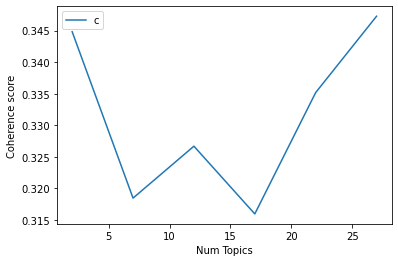

In [62]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_score2)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [63]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_score2):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 2

index: 0 | Num Topics = 2  has Coherence Value of 0.3448
index: 1 | Num Topics = 7  has Coherence Value of 0.3184
index: 2 | Num Topics = 12  has Coherence Value of 0.3267
index: 3 | Num Topics = 17  has Coherence Value of 0.3159
index: 4 | Num Topics = 22  has Coherence Value of 0.3352
index: 5 | Num Topics = 27  has Coherence Value of 0.3473


In [64]:
# Select optimal number of topics
optimal_model_sg_score2 = model_list_sg_score2[0]

In [65]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_score2 = pyLDAvis.gensim_models.prepare(optimal_model_sg_score2, corpus_sg_score2, id2word_sg_score2)

In [66]:
print("pyLDAVis for SG topics for score=2:")
vis_sg_score2

pyLDAVis for SG topics for score=2:


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
24    -0.038198  0.008541       1        1  7.671069
6      0.046337  0.117847       2        1  6.746098
26    -0.122298 -0.037989       3        1  6.582571
22    -0.087866  0.198395       4        1  6.093817
5     -0.108088  0.018849       5        1  5.623470
16     0.005818  0.116129       6        1  5.379865
23    -0.173988 -0.005117       7        1  5.079380
10     0.026236  0.119905       8        1  4.999061
19     0.098303  0.031660       9        1  4.613352
18    -0.025287 -0.001997      10        1  4.453317
13     0.028944 -0.019352      11        1  3.752672
25    -0.021041  0.050653      12        1  3.498751
8      0.015398 -0.017517      13        1  3.297893
9     -0.144144 -0.074051      14        1  3.014387
12    -0.001270  0.024325      15        1  2.817617
4     -0.018113 -0.053721      16        1  2.764973
14     0.123265 -0.075299      17        1  2.502983
15     0.127178  0.015160      18        1  2.431931
3      0.067483  0.068585      19        1  2.332021
11     0.111877  0.020072      20        1  2.329250
20     0.029064  0.007439      21        1  2.295113
21    -0.036964 -0.050204      22        1  2.284242
7      0.058902 -0.002018      23        1  2.177836
0     -0.025154 -0.120744      24        1  2.088102
1     -0.092102 -0.112870      25        1  2.042579
17     0.038604 -0.047552      26        1  1.920362
2      0.117104 -0.179126      27        1  1.207288, topic_info=         Term        Freq       Total Category  logprob  loglift
55    account  162.000000  162.000000  Default  30.0000  30.0000
27     update  158.000000  158.000000  Default  29.0000  29.0000
374       log   44.000000   44.000000  Default  28.0000  28.0000
126      post  179.000000  179.000000  Default  27.0000  27.0000
54      story  160.000000  160.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
54      story    1.360142  160.837036  Topic27  -4.1995  -0.3560
222  suddenly    0.870633   23.036869  Topic27  -4.6456   1.1412
422      list    0.831189   17.196794  Topic27  -4.6920   1.3872
12       save    0.747395   15.324731  Topic27  -4.7982   1.3962
211      like    0.747395   19.610195  Topic27  -4.7982   1.1496

[1635 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
571       7  0.393583      ability
571      15  0.393583      ability
130       1  0.038235         able
130       2  0.076470         able
130       4  0.076470         able
...     ...       ...          ...
364      23  0.147699          yet
364      25  0.295397          yet
1118     21  0.612298         zone
1173     22  0.609486          沒有的
1174     22  0.609486  然后私信打字也一直卡着

[2983 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[25, 7, 27, 23, 6, 17, 24, 11, 20, 19, 14, 26, 9, 10, 13, 5, 15, 16, 4, 12, 21, 22, 8, 1, 2, 18, 3])

## LDA Topic Modelling (Rating = 3)

In [67]:
# By-rating Topic Modelling - rating = 3
# Convert to list - move to each section
review_sg_score3 = instagram_ios_sg_review_YearMonth_score3.review.values.tolist()
review_words_sg_score3 = list(sent_to_words(review_sg_score3))
print(review_words_sg_score3[:1])

[['have', 'to', 'accounts', 'on', 'ig', 'and', 'out', 'of', 'nowhere', 'whenever', 'post', 'something', 'on', 'account', 'the', 'post', 'will', 'be', 'transferred', 'to', 'account', 'and', 'vice', 'versa', 'even', 'the', 'stories', 'are', 'being', 'transferred', 'please', 'do', 'something', 'about', 'this', 've', 'tried', 'restarting', 'my', 'phone', 'and', 're', 'downloading', 'this', 'app', 'but', 'it', 'still', 'happening']]


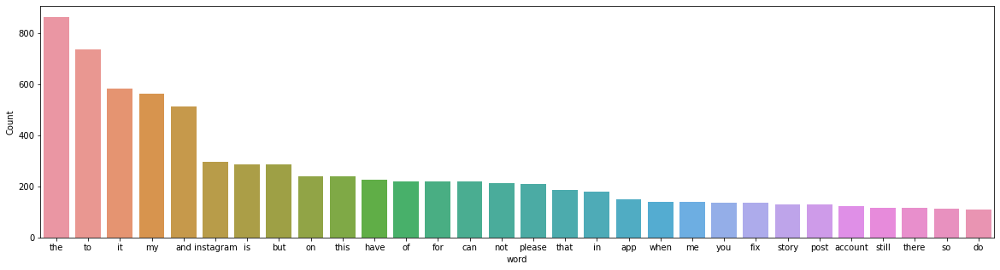

In [68]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_score3))

In [69]:
# Clean text
review_sg_ready_score3 = process_words(review_words_sg_score3)  # processed Text Data! - move to each section


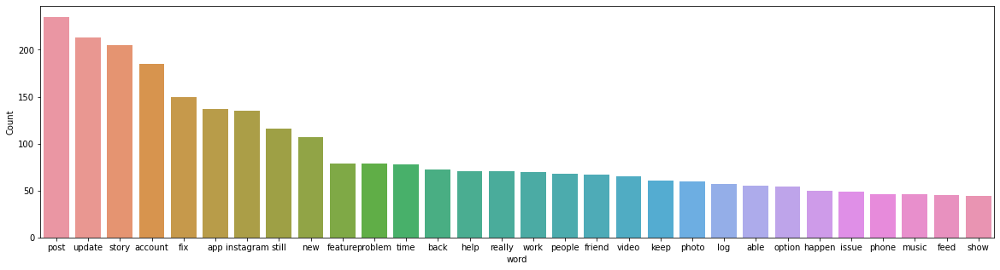

In [70]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_sg_ready_score3))


In [71]:
# Create Dictionary
id2word_sg_score3 = corpora.Dictionary(review_sg_ready_score3)

2021-10-16 02:38:23,043 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 02:38:23,072 [INFO] gensim.corpora.dictionary - built Dictionary(1275 unique tokens: ['account', 'app', 'download', 'happen', 'nowhere']...) from 668 documents (total 8189 corpus positions)
2021-10-16 02:38:23,073 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1275 unique tokens: ['account', 'app', 'download', 'happen', 'nowhere']...) from 668 documents (total 8189 corpus positions)", 'datetime': '2021-10-16T02:38:23.073907', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [72]:
# Create Corpus: Term Document Frequency
corpus_sg_score3 = [id2word_sg_score3.doc2bow(text) for text in review_sg_ready_score3]

In [73]:
# Training LDA model
model_list_sg_score3, coherence_values_sg_score3 = compute_coherence_values(dictionary=id2word_sg_score3, corpus=corpus_sg_score3, 
                                                              texts=review_sg_ready_score3, limit=30, start=2, step=5)


2021-10-16 02:38:23,105 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 02:38:23,109 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 02:38:23,111 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:38:23,113 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 668 documents, updating model once every 668 documents, evaluating perplexity every 668 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 02:38:25,117 [INFO] gensim.models.ldamodel - -7.716 per-word bound, 210.3 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:38:25,119 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #668/668
2021-10-16 02:38:27,009 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.030*"update" + 0.022*"story" + 0.017*"post" + 0.017*"account" + 0.015*"new" + 0.015*"app" + 0.013*"sti

2021-10-16 02:38:46,900 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"post" + 0.022*"account" + 0.021*"fix" + 0.021*"story" + 0.018*"instagram" + 0.013*"problem" + 0.012*"app" + 0.011*"friend" + 0.010*"video" + 0.010*"log"
2021-10-16 02:38:46,901 [INFO] gensim.models.ldamodel - topic diff=0.018011, rho=0.301511
2021-10-16 02:38:48,248 [INFO] gensim.models.ldamodel - -6.317 per-word bound, 79.7 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:38:48,250 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #668/668
2021-10-16 02:38:49,089 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"update" + 0.023*"story" + 0.023*"new" + 0.019*"app" + 0.018*"feature" + 0.018*"still" + 0.017*"account" + 0.012*"time" + 0.012*"work" + 0.011*"post"
2021-10-16 02:38:49,092 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"post" + 0.022*"account" + 0.021*"fix" + 0.021*"story" + 0.018*"instagram" + 0.013*"problem" + 0.012*"frie

2021-10-16 02:39:08,149 [INFO] gensim.models.ldamodel - topic diff=0.007602, rho=0.218218
2021-10-16 02:39:09,544 [INFO] gensim.models.ldamodel - -6.309 per-word bound, 79.3 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:39:09,547 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #668/668
2021-10-16 02:39:10,686 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"update" + 0.024*"new" + 0.023*"story" + 0.019*"app" + 0.019*"still" + 0.018*"feature" + 0.017*"account" + 0.012*"time" + 0.011*"work" + 0.011*"post"
2021-10-16 02:39:10,689 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"post" + 0.021*"account" + 0.021*"fix" + 0.020*"story" + 0.017*"instagram" + 0.014*"problem" + 0.012*"friend" + 0.011*"app" + 0.011*"log" + 0.011*"video"
2021-10-16 02:39:10,692 [INFO] gensim.models.ldamodel - topic diff=0.007115, rho=0.213201
2021-10-16 02:39:12,235 [INFO] gensim.models.ldamodel - -6.308 per-word bound, 79.3 perplexity e

2021-10-16 02:39:33,150 [INFO] gensim.models.ldamodel - -6.306 per-word bound, 79.1 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:39:33,151 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #668/668
2021-10-16 02:39:33,988 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"update" + 0.024*"new" + 0.024*"story" + 0.019*"still" + 0.019*"app" + 0.018*"feature" + 0.017*"account" + 0.012*"time" + 0.011*"instagram" + 0.011*"post"
2021-10-16 02:39:33,990 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"post" + 0.021*"account" + 0.021*"fix" + 0.020*"story" + 0.017*"instagram" + 0.014*"problem" + 0.012*"friend" + 0.011*"app" + 0.011*"log" + 0.011*"video"
2021-10-16 02:39:33,991 [INFO] gensim.models.ldamodel - topic diff=0.004350, rho=0.176777
2021-10-16 02:39:35,346 [INFO] gensim.models.ldamodel - -6.305 per-word bound, 79.1 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:39:

2021-10-16 02:39:53,741 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #668/668
2021-10-16 02:39:54,561 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"update" + 0.024*"new" + 0.024*"story" + 0.019*"still" + 0.018*"feature" + 0.018*"app" + 0.017*"account" + 0.012*"time" + 0.012*"instagram" + 0.012*"post"
2021-10-16 02:39:54,568 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"post" + 0.021*"account" + 0.021*"fix" + 0.020*"story" + 0.016*"instagram" + 0.015*"problem" + 0.012*"friend" + 0.012*"app" + 0.011*"log" + 0.011*"video"
2021-10-16 02:39:54,571 [INFO] gensim.models.ldamodel - topic diff=0.003124, rho=0.154303
2021-10-16 02:39:55,696 [INFO] gensim.models.ldamodel - -6.303 per-word bound, 79.0 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:39:55,698 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #668/668
2021-10-16 02:39:56,545 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"upda

2021-10-16 02:40:13,136 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 02:40:17,848 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 02:40:17,901 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 627 virtual documents
2021-10-16 02:40:18,343 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-16 02:40:18,347 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-16 02:40:18,353 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:40:18,357 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 668 documents, updating model once every 668 documents, evaluating perplexity every 668 documents, iterating 50x with a con

2021-10-16 02:40:29,109 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.044*"post" + 0.031*"story" + 0.013*"comment" + 0.013*"fix" + 0.012*"update" + 0.011*"option" + 0.011*"happen" + 0.011*"new" + 0.010*"always" + 0.010*"save"
2021-10-16 02:40:29,112 [INFO] gensim.models.ldamodel - topic diff=0.076369, rho=0.408248
2021-10-16 02:40:30,092 [INFO] gensim.models.ldamodel - -6.608 per-word bound, 97.5 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:40:30,093 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #668/668
2021-10-16 02:40:30,785 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.044*"post" + 0.031*"story" + 0.014*"comment" + 0.013*"fix" + 0.012*"update" + 0.011*"option" + 0.011*"happen" + 0.011*"new" + 0.010*"save" + 0.010*"always"
2021-10-16 02:40:30,787 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"fix" + 0.030*"update" + 0.021*"feature" + 0.018*"photo" + 0.016*"post" + 0.015*"new" + 0.014*"hope" + 0.01

2021-10-16 02:40:39,338 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.045*"post" + 0.031*"story" + 0.016*"comment" + 0.013*"fix" + 0.012*"save" + 0.011*"happen" + 0.011*"option" + 0.010*"always" + 0.010*"new" + 0.010*"video"
2021-10-16 02:40:39,386 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.063*"account" + 0.027*"instagram" + 0.024*"update" + 0.020*"story" + 0.018*"log" + 0.017*"back" + 0.016*"post" + 0.013*"load" + 0.013*"work" + 0.013*"still"
2021-10-16 02:40:39,388 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"update" + 0.028*"app" + 0.023*"story" + 0.022*"still" + 0.015*"new" + 0.014*"font" + 0.013*"gif" + 0.013*"people" + 0.013*"crash" + 0.012*"time"
2021-10-16 02:40:39,390 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.025*"story" + 0.020*"fix" + 0.020*"time" + 0.019*"update" + 0.016*"log" + 0.015*"phone" + 0.015*"instagram" + 0.014*"keep" + 0.014*"profile" + 0.013*"account"
2021-10-16 02:40:39,392 [INFO] gensim.models.ldamodel - topic diff=0.020346

2021-10-16 02:40:49,269 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.064*"account" + 0.027*"instagram" + 0.024*"update" + 0.020*"story" + 0.018*"back" + 0.018*"log" + 0.016*"post" + 0.014*"work" + 0.013*"load" + 0.013*"still"
2021-10-16 02:40:49,271 [INFO] gensim.models.ldamodel - topic diff=0.010224, rho=0.242536
2021-10-16 02:40:50,275 [INFO] gensim.models.ldamodel - -6.573 per-word bound, 95.2 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:40:50,276 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #668/668
2021-10-16 02:40:50,970 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.025*"story" + 0.020*"fix" + 0.020*"time" + 0.019*"update" + 0.017*"phone" + 0.016*"log" + 0.015*"keep" + 0.015*"instagram" + 0.014*"profile" + 0.013*"new"
2021-10-16 02:40:50,975 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"update" + 0.029*"app" + 0.023*"still" + 0.022*"story" + 0.015*"new" + 0.014*"gif" + 0.013*"crash" + 0.013

2021-10-16 02:41:00,174 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.046*"post" + 0.034*"story" + 0.016*"comment" + 0.014*"save" + 0.013*"fix" + 0.011*"option" + 0.011*"happen" + 0.010*"video" + 0.010*"always" + 0.010*"allow"
2021-10-16 02:41:00,178 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"fix" + 0.031*"update" + 0.022*"feature" + 0.019*"photo" + 0.017*"new" + 0.015*"post" + 0.014*"hope" + 0.014*"app" + 0.011*"version" + 0.011*"message"
2021-10-16 02:41:00,181 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.055*"post" + 0.025*"music" + 0.022*"still" + 0.020*"instagram" + 0.020*"update" + 0.020*"story" + 0.017*"app" + 0.014*"show" + 0.013*"fix" + 0.012*"friend"
2021-10-16 02:41:00,183 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"account" + 0.036*"post" + 0.030*"story" + 0.020*"help" + 0.019*"problem" + 0.015*"app" + 0.015*"friend" + 0.014*"fix" + 0.014*"share" + 0.011*"new"
2021-10-16 02:41:00,185 [INFO] gensim.models.ldamodel - topic diff=0.005984

2021-10-16 02:41:09,420 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"fix" + 0.032*"update" + 0.022*"feature" + 0.019*"photo" + 0.017*"new" + 0.015*"post" + 0.015*"hope" + 0.014*"app" + 0.012*"version" + 0.011*"message"
2021-10-16 02:41:09,422 [INFO] gensim.models.ldamodel - topic diff=0.004219, rho=0.188982
2021-10-16 02:41:10,951 [INFO] gensim.models.ldamodel - -6.565 per-word bound, 94.7 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:41:10,955 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #668/668
2021-10-16 02:41:11,781 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.046*"post" + 0.034*"story" + 0.016*"comment" + 0.014*"save" + 0.013*"fix" + 0.011*"option" + 0.011*"happen" + 0.010*"video" + 0.010*"always" + 0.010*"allow"
2021-10-16 02:41:11,783 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"fix" + 0.033*"update" + 0.022*"feature" + 0.019*"photo" + 0.017*"new" + 0.015*"hope" + 0.015*"post" + 0.0

2021-10-16 02:41:20,581 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.046*"update" + 0.028*"app" + 0.023*"still" + 0.022*"story" + 0.016*"new" + 0.015*"gif" + 0.013*"font" + 0.013*"time" + 0.013*"crash" + 0.013*"feature"
2021-10-16 02:41:20,584 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.025*"story" + 0.020*"time" + 0.020*"fix" + 0.018*"log" + 0.018*"phone" + 0.018*"update" + 0.016*"keep" + 0.016*"instagram" + 0.014*"profile" + 0.013*"insta"
2021-10-16 02:41:20,587 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"account" + 0.027*"instagram" + 0.024*"update" + 0.020*"story" + 0.020*"back" + 0.016*"post" + 0.016*"log" + 0.014*"work" + 0.013*"load" + 0.013*"still"
2021-10-16 02:41:20,589 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.056*"post" + 0.027*"music" + 0.021*"still" + 0.020*"story" + 0.020*"instagram" + 0.019*"update" + 0.018*"app" + 0.014*"show" + 0.013*"fix" + 0.012*"friend"
2021-10-16 02:41:20,593 [INFO] gensim.models.ldamodel - topic diff=0.002928

2021-10-16 02:41:28,417 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"account" + 0.036*"post" + 0.030*"story" + 0.021*"help" + 0.019*"problem" + 0.015*"app" + 0.015*"friend" + 0.014*"fix" + 0.014*"share" + 0.011*"new"
2021-10-16 02:41:28,418 [INFO] gensim.models.ldamodel - topic diff=0.002192, rho=0.160128
2021-10-16 02:41:29,236 [INFO] gensim.models.ldamodel - -6.561 per-word bound, 94.4 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:41:29,237 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #668/668
2021-10-16 02:41:29,926 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"fix" + 0.034*"update" + 0.021*"feature" + 0.019*"photo" + 0.018*"new" + 0.015*"hope" + 0.014*"post" + 0.014*"version" + 0.014*"app" + 0.011*"message"
2021-10-16 02:41:29,928 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.046*"update" + 0.028*"app" + 0.023*"still" + 0.022*"story" + 0.017*"new" + 0.016*"gif" + 0.013*"font" + 0.013*"tim

2021-10-16 02:41:37,852 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.066*"account" + 0.027*"instagram" + 0.024*"update" + 0.021*"back" + 0.020*"story" + 0.016*"post" + 0.014*"log" + 0.014*"work" + 0.013*"still" + 0.012*"load"
2021-10-16 02:41:37,868 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"fix" + 0.034*"update" + 0.021*"feature" + 0.019*"photo" + 0.018*"new" + 0.015*"hope" + 0.014*"post" + 0.014*"version" + 0.014*"app" + 0.011*"message"
2021-10-16 02:41:37,883 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.047*"post" + 0.034*"story" + 0.016*"comment" + 0.014*"save" + 0.012*"fix" + 0.011*"option" + 0.011*"video" + 0.010*"always" + 0.010*"happen" + 0.010*"allow"
2021-10-16 02:41:37,889 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.025*"story" + 0.020*"time" + 0.020*"fix" + 0.020*"log" + 0.018*"phone" + 0.018*"update" + 0.016*"keep" + 0.016*"instagram" + 0.014*"profile" + 0.013*"insta"
2021-10-16 02:41:37,892 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-16 02:41:47,294 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.025*"story" + 0.020*"fix" + 0.020*"log" + 0.020*"time" + 0.018*"phone" + 0.018*"update" + 0.016*"keep" + 0.015*"instagram" + 0.014*"profile" + 0.013*"insta"
2021-10-16 02:41:47,295 [INFO] gensim.models.ldamodel - topic diff=0.001717, rho=0.141421
2021-10-16 02:41:48,317 [INFO] gensim.models.ldamodel - -6.559 per-word bound, 94.3 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:41:48,319 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #668/668
2021-10-16 02:41:49,156 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.047*"post" + 0.034*"story" + 0.016*"comment" + 0.014*"save" + 0.012*"fix" + 0.011*"video" + 0.011*"option" + 0.011*"always" + 0.010*"happen" + 0.010*"allow"
2021-10-16 02:41:49,158 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.057*"post" + 0.028*"music" + 0.021*"still" + 0.020*"story" + 0.020*"instagram" + 0.019*"update" + 0.018*"app

2021-10-16 02:42:02,465 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.031*"post" + 0.030*"update" + 0.030*"still" + 0.030*"instagram" + 0.024*"reel" + 0.019*"option" + 0.017*"help" + 0.017*"feature" + 0.017*"already" + 0.017*"friend"
2021-10-16 02:42:02,467 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.031*"account" + 0.022*"post" + 0.021*"app" + 0.020*"new" + 0.018*"fix" + 0.018*"issue" + 0.018*"story" + 0.016*"help" + 0.015*"problem" + 0.014*"video"
2021-10-16 02:42:02,469 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.025*"update" + 0.024*"still" + 0.021*"app" + 0.017*"crash" + 0.016*"gif" + 0.014*"instagram" + 0.013*"back" + 0.013*"help" + 0.012*"feature" + 0.012*"post"
2021-10-16 02:42:02,471 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.032*"fix" + 0.025*"keep" + 0.018*"filter" + 0.018*"work" + 0.016*"sound" + 0.016*"log" + 0.015*"bug" + 0.015*"phone" + 0.015*"time" + 0.014*"story"
2021-10-16 02:42:02,472 [INFO] gensim.models.ldamodel - topic diff=0.149803

2021-10-16 02:42:10,139 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.030*"account" + 0.023*"post" + 0.020*"fix" + 0.020*"new" + 0.020*"app" + 0.019*"story" + 0.018*"notification" + 0.018*"issue" + 0.017*"problem" + 0.017*"help"
2021-10-16 02:42:10,141 [INFO] gensim.models.ldamodel - topic diff=0.047609, rho=0.316228
2021-10-16 02:42:11,151 [INFO] gensim.models.ldamodel - -6.707 per-word bound, 104.5 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:42:11,153 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #668/668
2021-10-16 02:42:11,784 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.031*"post" + 0.030*"account" + 0.027*"instagram" + 0.022*"really" + 0.022*"update" + 0.020*"story" + 0.016*"back" + 0.016*"reason" + 0.015*"load" + 0.014*"people"
2021-10-16 02:42:11,786 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.035*"fix" + 0.028*"keep" + 0.020*"filter" + 0.019*"work" + 0.018*"time" + 0.018*"sound" + 0.017*"bug

2021-10-16 02:42:19,497 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.073*"account" + 0.034*"log" + 0.023*"problem" + 0.023*"update" + 0.021*"instagram" + 0.021*"app" + 0.020*"still" + 0.020*"fix" + 0.018*"story" + 0.015*"new"
2021-10-16 02:42:19,503 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.039*"post" + 0.022*"photo" + 0.021*"update" + 0.021*"time" + 0.018*"fix" + 0.018*"app" + 0.017*"really" + 0.016*"people" + 0.015*"multiple" + 0.011*"new"
2021-10-16 02:42:19,507 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.029*"music" + 0.024*"post" + 0.024*"app" + 0.022*"still" + 0.015*"video" + 0.015*"profile" + 0.015*"instagram" + 0.014*"update" + 0.013*"issue" + 0.012*"available"
2021-10-16 02:42:19,509 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.029*"post" + 0.022*"photo" + 0.018*"update" + 0.017*"text" + 0.016*"app" + 0.015*"like" + 0.014*"message" + 0.013*"feature" + 0.012*"new" + 0.011*"send"
2021-10-16 02:42:19,513 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 02:42:27,418 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.032*"post" + 0.028*"account" + 0.028*"instagram" + 0.023*"really" + 0.020*"update" + 0.020*"story" + 0.018*"back" + 0.016*"people" + 0.016*"change" + 0.016*"reason"
2021-10-16 02:42:27,420 [INFO] gensim.models.ldamodel - topic diff=0.009922, rho=0.218218
2021-10-16 02:42:28,399 [INFO] gensim.models.ldamodel - -6.678 per-word bound, 102.4 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:42:28,400 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #668/668
2021-10-16 02:42:29,011 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.037*"update" + 0.034*"story" + 0.027*"fix" + 0.025*"work" + 0.023*"new" + 0.020*"instagram" + 0.020*"load" + 0.016*"app" + 0.016*"keep" + 0.015*"insta"
2021-10-16 02:42:29,015 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.079*"account" + 0.036*"log" + 0.023*"problem" + 0.021*"update" + 0.021*"app" + 0.021*"still" + 0.020*"fi

2021-10-16 02:42:36,561 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.084*"account" + 0.038*"log" + 0.022*"problem" + 0.021*"still" + 0.020*"app" + 0.020*"fix" + 0.020*"update" + 0.019*"instagram" + 0.016*"story" + 0.016*"phone"
2021-10-16 02:42:36,564 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.063*"post" + 0.030*"story" + 0.022*"feed" + 0.022*"happen" + 0.018*"video" + 0.018*"option" + 0.018*"comment" + 0.015*"always" + 0.015*"fix" + 0.015*"stop"
2021-10-16 02:42:36,572 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.041*"post" + 0.025*"photo" + 0.021*"time" + 0.020*"update" + 0.018*"fix" + 0.017*"really" + 0.017*"app" + 0.017*"people" + 0.015*"multiple" + 0.011*"new"
2021-10-16 02:42:36,574 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.029*"account" + 0.023*"notification" + 0.023*"post" + 0.022*"fix" + 0.020*"help" + 0.020*"app" + 0.019*"issue" + 0.019*"story" + 0.018*"problem" + 0.018*"new"
2021-10-16 02:42:36,577 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 02:42:44,440 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.050*"update" + 0.039*"still" + 0.031*"instagram" + 0.030*"reel" + 0.030*"option" + 0.026*"version" + 0.026*"new" + 0.025*"feature" + 0.025*"post" + 0.021*"font"
2021-10-16 02:42:44,442 [INFO] gensim.models.ldamodel - topic diff=0.004804, rho=0.176777
2021-10-16 02:42:45,254 [INFO] gensim.models.ldamodel - -6.668 per-word bound, 101.7 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:42:45,257 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #668/668
2021-10-16 02:42:45,901 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.028*"account" + 0.023*"notification" + 0.022*"post" + 0.022*"fix" + 0.020*"help" + 0.020*"issue" + 0.020*"app" + 0.019*"story" + 0.018*"problem" + 0.018*"new"
2021-10-16 02:42:45,902 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.023*"app" + 0.022*"sticker" + 0.022*"crash" + 0.022*"still" + 0.020*"update" + 0.017*"gif" + 0.014*"

2021-10-16 02:42:53,092 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.027*"account" + 0.023*"notification" + 0.022*"fix" + 0.022*"post" + 0.020*"issue" + 0.020*"app" + 0.019*"story" + 0.019*"help" + 0.018*"problem" + 0.018*"new"
2021-10-16 02:42:53,096 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.037*"update" + 0.035*"story" + 0.028*"work" + 0.027*"fix" + 0.021*"load" + 0.021*"instagram" + 0.020*"new" + 0.018*"insta" + 0.017*"app" + 0.016*"keep"
2021-10-16 02:42:53,098 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.065*"story" + 0.040*"post" + 0.032*"update" + 0.029*"account" + 0.018*"fix" + 0.014*"view" + 0.014*"share" + 0.013*"add" + 0.010*"option" + 0.010*"instagram"
2021-10-16 02:42:53,100 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.023*"sticker" + 0.023*"app" + 0.022*"crash" + 0.021*"still" + 0.020*"update" + 0.017*"gif" + 0.015*"help" + 0.015*"search" + 0.013*"back" + 0.012*"well"
2021-10-16 02:42:53,101 [INFO] gensim.models.ldamodel - topic diff=0.0038

2021-10-16 02:43:01,663 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.043*"post" + 0.026*"photo" + 0.020*"time" + 0.020*"update" + 0.018*"really" + 0.018*"fix" + 0.017*"people" + 0.016*"app" + 0.016*"multiple" + 0.011*"new"
2021-10-16 02:43:01,664 [INFO] gensim.models.ldamodel - topic diff=0.003230, rho=0.152499
2021-10-16 02:43:02,487 [INFO] gensim.models.ldamodel - -6.663 per-word bound, 101.3 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:43:02,488 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #668/668
2021-10-16 02:43:03,289 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.027*"account" + 0.023*"notification" + 0.022*"fix" + 0.021*"post" + 0.021*"issue" + 0.020*"app" + 0.020*"story" + 0.019*"help" + 0.018*"problem" + 0.018*"new"
2021-10-16 02:43:03,292 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.054*"update" + 0.039*"still" + 0.033*"instagram" + 0.030*"new" + 0.029*"version" + 0.029*"option" + 0.029*"

2021-10-16 02:43:11,380 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"fix" + 0.029*"keep" + 0.027*"filter" + 0.020*"work" + 0.020*"bug" + 0.020*"time" + 0.019*"sound" + 0.015*"problem" + 0.014*"face" + 0.013*"show"
2021-10-16 02:43:11,384 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.037*"update" + 0.036*"story" + 0.028*"work" + 0.027*"fix" + 0.022*"load" + 0.021*"instagram" + 0.019*"new" + 0.019*"insta" + 0.017*"app" + 0.016*"keep"
2021-10-16 02:43:11,386 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.055*"update" + 0.040*"still" + 0.033*"instagram" + 0.031*"new" + 0.030*"version" + 0.029*"option" + 0.028*"reel" + 0.027*"font" + 0.027*"feature" + 0.022*"app"
2021-10-16 02:43:11,389 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.073*"post" + 0.030*"story" + 0.025*"feed" + 0.022*"happen" + 0.018*"video" + 0.017*"option" + 0.017*"comment" + 0.015*"fix" + 0.015*"always" + 0.015*"stop"
2021-10-16 02:43:11,390 [INFO] gensim.models.ldamodel - topic diff=0.002711, 

2021-10-16 02:43:24,682 [INFO] gensim.models.ldamodel - topic diff=0.198632, rho=0.577350
2021-10-16 02:43:25,458 [INFO] gensim.models.ldamodel - -6.981 per-word bound, 126.3 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:43:25,460 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #668/668
2021-10-16 02:43:26,092 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.054*"story" + 0.054*"update" + 0.040*"post" + 0.034*"account" + 0.023*"fix" + 0.019*"still" + 0.016*"gif" + 0.015*"back" + 0.014*"share" + 0.014*"app"
2021-10-16 02:43:26,095 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.032*"page" + 0.021*"update" + 0.020*"issue" + 0.018*"app" + 0.018*"profile" + 0.011*"new" + 0.011*"still" + 0.011*"kick" + 0.010*"well" + 0.009*"time"
2021-10-16 02:43:26,098 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.041*"story" + 0.038*"fix" + 0.021*"iphone" + 0.015*"update" + 0.014*"feature" + 0.014*"new" + 0.012*"instagram" + 0.01

2021-10-16 02:43:33,230 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.056*"post" + 0.028*"save" + 0.017*"share" + 0.016*"really" + 0.015*"pic" + 0.011*"always" + 0.011*"edit" + 0.011*"comment" + 0.011*"look" + 0.011*"matter"
2021-10-16 02:43:33,233 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.046*"message" + 0.033*"account" + 0.030*"log" + 0.024*"keep" + 0.024*"block" + 0.017*"notification" + 0.016*"bug" + 0.016*"action" + 0.015*"app" + 0.014*"instagram"
2021-10-16 02:43:33,236 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.038*"post" + 0.032*"photo" + 0.032*"time" + 0.021*"update" + 0.018*"multiple" + 0.017*"fix" + 0.014*"app" + 0.013*"upload" + 0.011*"new" + 0.011*"open"
2021-10-16 02:43:33,243 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.047*"video" + 0.043*"story" + 0.029*"post" + 0.021*"app" + 0.018*"instagram" + 0.017*"help" + 0.014*"problem" + 0.012*"feature" + 0.012*"issue" + 0.012*"fix"
2021-10-16 02:43:33,246 [INFO] gensim.models.ldamodel - topic dif

2021-10-16 02:43:40,415 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.055*"story" + 0.047*"music" + 0.035*"instagram" + 0.031*"option" + 0.022*"viewer" + 0.022*"update" + 0.021*"reel" + 0.020*"load" + 0.019*"feature" + 0.017*"able"
2021-10-16 02:43:40,416 [INFO] gensim.models.ldamodel - topic diff=0.028534, rho=0.267261
2021-10-16 02:43:41,191 [INFO] gensim.models.ldamodel - -6.795 per-word bound, 111.1 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:43:41,192 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #668/668
2021-10-16 02:43:41,780 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.053*"message" + 0.033*"account" + 0.031*"log" + 0.024*"block" + 0.024*"keep" + 0.018*"notification" + 0.017*"app" + 0.017*"bug" + 0.017*"action" + 0.014*"instagram"
2021-10-16 02:43:41,781 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.034*"app" + 0.032*"picture" + 0.025*"update" + 0.024*"crash" + 0.022*"still" + 0.021*"post" +

2021-10-16 02:43:49,686 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.050*"video" + 0.041*"story" + 0.028*"post" + 0.020*"app" + 0.017*"help" + 0.017*"instagram" + 0.015*"problem" + 0.013*"feature" + 0.013*"record" + 0.012*"fix"
2021-10-16 02:43:49,688 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.051*"post" + 0.026*"instagram" + 0.017*"still" + 0.016*"old" + 0.015*"update" + 0.015*"story" + 0.015*"app" + 0.013*"friend" + 0.012*"view" + 0.012*"change"
2021-10-16 02:43:49,691 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.031*"account" + 0.027*"fix" + 0.025*"problem" + 0.025*"log" + 0.024*"post" + 0.020*"app" + 0.020*"people" + 0.018*"really" + 0.017*"instagram" + 0.017*"phone"
2021-10-16 02:43:49,696 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.035*"friend" + 0.030*"close" + 0.030*"fix" + 0.027*"app" + 0.024*"keep" + 0.023*"account" + 0.021*"happen" + 0.020*"post" + 0.019*"still" + 0.016*"list"
2021-10-16 02:43:49,700 [INFO] gensim.models.ldamodel - topic #15 

2021-10-16 02:43:56,673 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.059*"update" + 0.038*"highlight" + 0.033*"load" + 0.033*"sticker" + 0.030*"new" + 0.023*"refresh" + 0.023*"still" + 0.020*"story" + 0.019*"account" + 0.019*"feature"
2021-10-16 02:43:56,675 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.036*"friend" + 0.030*"close" + 0.029*"fix" + 0.028*"app" + 0.024*"keep" + 0.021*"happen" + 0.021*"account" + 0.020*"post" + 0.018*"still" + 0.016*"list"
2021-10-16 02:43:56,678 [INFO] gensim.models.ldamodel - topic diff=0.009982, rho=0.200000
2021-10-16 02:43:57,548 [INFO] gensim.models.ldamodel - -6.762 per-word bound, 108.5 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:43:57,550 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #668/668
2021-10-16 02:43:58,102 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.027*"account" + 0.022*"really" + 0.021*"fix" + 0.020*"message" + 0.019*"link" + 0.014*"theme" + 0.01

2021-10-16 02:44:04,656 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #668/668
2021-10-16 02:44:05,252 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.060*"story" + 0.037*"iphone" + 0.033*"fix" + 0.018*"view" + 0.018*"update" + 0.017*"profile" + 0.016*"post" + 0.014*"unable" + 0.014*"bug" + 0.013*"friend"
2021-10-16 02:44:05,256 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.049*"photo" + 0.030*"post" + 0.026*"fix" + 0.021*"video" + 0.016*"delete" + 0.013*"app" + 0.011*"like" + 0.011*"text" + 0.011*"especially" + 0.011*"live"
2021-10-16 02:44:05,262 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.060*"story" + 0.051*"music" + 0.035*"instagram" + 0.033*"option" + 0.023*"viewer" + 0.022*"reel" + 0.019*"load" + 0.019*"feature" + 0.019*"update" + 0.018*"back"
2021-10-16 02:44:05,265 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.056*"message" + 0.031*"account" + 0.030*"log" + 0.024*"block" + 0.023*"keep" + 0.019*"notification" + 0.019*"app" + 0.017*"bug"

2021-10-16 02:44:13,071 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.055*"video" + 0.040*"story" + 0.026*"post" + 0.020*"app" + 0.018*"help" + 0.017*"instagram" + 0.016*"problem" + 0.014*"record" + 0.014*"feature" + 0.013*"issue"
2021-10-16 02:44:13,073 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.035*"page" + 0.024*"issue" + 0.019*"profile" + 0.018*"app" + 0.015*"update" + 0.012*"kick" + 0.012*"well" + 0.011*"hang" + 0.010*"time" + 0.009*"follower"
2021-10-16 02:44:13,075 [INFO] gensim.models.ldamodel - topic diff=0.005584, rho=0.166667
2021-10-16 02:44:14,170 [INFO] gensim.models.ldamodel - -6.748 per-word bound, 107.5 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:44:14,173 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #668/668
2021-10-16 02:44:14,909 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.050*"photo" + 0.031*"post" + 0.027*"fix" + 0.021*"video" + 0.016*"delete" + 0.013*"app" + 0.011*"like" 

2021-10-16 02:44:21,401 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #668/668
2021-10-16 02:44:21,958 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.056*"video" + 0.040*"story" + 0.026*"post" + 0.020*"app" + 0.018*"help" + 0.017*"instagram" + 0.016*"problem" + 0.014*"record" + 0.014*"feature" + 0.013*"issue"
2021-10-16 02:44:21,968 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.058*"post" + 0.030*"save" + 0.019*"share" + 0.015*"pic" + 0.014*"really" + 0.012*"always" + 0.012*"edit" + 0.012*"comment" + 0.012*"look" + 0.011*"later"
2021-10-16 02:44:21,983 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.036*"account" + 0.034*"post" + 0.027*"instagram" + 0.027*"work" + 0.025*"update" + 0.017*"new" + 0.014*"feed" + 0.014*"reason" + 0.013*"reel" + 0.013*"really"
2021-10-16 02:44:21,992 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.061*"story" + 0.040*"iphone" + 0.032*"fix" + 0.018*"view" + 0.018*"update" + 0.017*"profile" + 0.017*"post" + 0.014*"bug" + 0

2021-10-16 02:44:29,797 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.062*"update" + 0.036*"new" + 0.033*"highlight" + 0.033*"load" + 0.032*"sticker" + 0.025*"still" + 0.024*"refresh" + 0.023*"feature" + 0.020*"feed" + 0.019*"story"
2021-10-16 02:44:29,798 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.037*"picture" + 0.037*"app" + 0.025*"update" + 0.025*"crash" + 0.020*"help" + 0.020*"post" + 0.019*"download" + 0.019*"multiple" + 0.017*"photo" + 0.017*"still"
2021-10-16 02:44:29,799 [INFO] gensim.models.ldamodel - topic diff=0.003262, rho=0.145865
2021-10-16 02:44:30,670 [INFO] gensim.models.ldamodel - -6.740 per-word bound, 106.9 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:44:30,671 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #668/668
2021-10-16 02:44:31,296 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.056*"post" + 0.024*"instagram" + 0.020*"old" + 0.016*"still" + 0.016*"update" + 0.016*"friend" +

2021-10-16 02:44:44,100 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #668/668
2021-10-16 02:44:45,314 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.038*"update" + 0.030*"post" + 0.025*"still" + 0.021*"new" + 0.019*"feature" + 0.015*"view" + 0.014*"gif" + 0.014*"back" + 0.013*"sticker" + 0.012*"unable"
2021-10-16 02:44:45,316 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.035*"account" + 0.030*"update" + 0.029*"still" + 0.027*"app" + 0.024*"work" + 0.021*"feature" + 0.015*"help" + 0.014*"post" + 0.014*"new" + 0.013*"instagram"
2021-10-16 02:44:45,318 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.028*"post" + 0.028*"account" + 0.022*"people" + 0.022*"story" + 0.017*"fix" + 0.016*"share" + 0.015*"instagram" + 0.012*"music" + 0.011*"photo" + 0.011*"message"
2021-10-16 02:44:45,321 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.041*"account" + 0.028*"update" + 0.023*"app" + 0.019*"post" + 0.019*"instagram" + 0.017*"fix" + 0.014*"version" + 0.014*"la

2021-10-16 02:44:52,327 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.061*"highlight" + 0.053*"story" + 0.050*"update" + 0.027*"account" + 0.021*"video" + 0.018*"people" + 0.018*"message" + 0.015*"archive" + 0.013*"back" + 0.013*"tag"
2021-10-16 02:44:52,329 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.094*"story" + 0.048*"view" + 0.028*"post" + 0.024*"back" + 0.020*"hour" + 0.018*"bring" + 0.017*"fix" + 0.015*"ipad" + 0.014*"list" + 0.013*"instagram"
2021-10-16 02:44:52,330 [INFO] gensim.models.ldamodel - topic diff=0.101810, rho=0.377964
2021-10-16 02:44:53,041 [INFO] gensim.models.ldamodel - -6.927 per-word bound, 121.7 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:44:53,042 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #668/668
2021-10-16 02:44:53,644 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.050*"page" + 0.026*"update" + 0.022*"profile" + 0.022*"app" + 0.015*"post" + 0.013*"time" + 0.013*"fix

2021-10-16 02:44:59,952 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #668/668
2021-10-16 02:45:00,557 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.046*"update" + 0.036*"gif" + 0.035*"still" + 0.035*"sticker" + 0.020*"feature" + 0.019*"new" + 0.019*"search" + 0.017*"iphone" + 0.017*"unable" + 0.015*"post"
2021-10-16 02:45:00,560 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.070*"highlight" + 0.056*"story" + 0.047*"update" + 0.028*"account" + 0.020*"video" + 0.018*"people" + 0.017*"archive" + 0.017*"message" + 0.014*"really" + 0.013*"back"
2021-10-16 02:45:00,566 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.026*"help" + 0.022*"post" + 0.021*"account" + 0.019*"great" + 0.017*"new" + 0.016*"time" + 0.015*"problem" + 0.014*"theme" + 0.014*"chronological" + 0.013*"login"
2021-10-16 02:45:00,569 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.044*"story" + 0.041*"post" + 0.020*"friend" + 0.019*"unable" + 0.019*"profile" + 0.018*"still" + 0.018*"allow

2021-10-16 02:45:07,450 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.029*"post" + 0.022*"instagram" + 0.020*"music" + 0.019*"still" + 0.019*"app" + 0.018*"update" + 0.016*"issue" + 0.015*"available" + 0.013*"iphone" + 0.012*"type"
2021-10-16 02:45:07,451 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.044*"option" + 0.042*"story" + 0.033*"reel" + 0.033*"new" + 0.027*"music" + 0.025*"font" + 0.024*"instagram" + 0.022*"update" + 0.022*"problem" + 0.019*"able"
2021-10-16 02:45:07,452 [INFO] gensim.models.ldamodel - topic diff=0.019457, rho=0.235702
2021-10-16 02:45:08,226 [INFO] gensim.models.ldamodel - -6.845 per-word bound, 115.0 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:45:08,229 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #668/668
2021-10-16 02:45:08,802 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.045*"gif" + 0.042*"update" + 0.035*"still" + 0.032*"sticker" + 0.022*"feature" + 0.020*"search" + 0

2021-10-16 02:45:15,051 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #668/668
2021-10-16 02:45:15,608 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.042*"account" + 0.034*"instagram" + 0.031*"post" + 0.026*"feed" + 0.024*"old" + 0.022*"load" + 0.019*"work" + 0.018*"fine" + 0.015*"reason" + 0.015*"app"
2021-10-16 02:45:15,615 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.074*"highlight" + 0.061*"story" + 0.042*"update" + 0.027*"account" + 0.020*"video" + 0.018*"people" + 0.018*"archive" + 0.016*"message" + 0.015*"really" + 0.013*"back"
2021-10-16 02:45:15,619 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.073*"fix" + 0.058*"hope" + 0.056*"photo" + 0.035*"message" + 0.027*"bug" + 0.023*"app" + 0.022*"send" + 0.022*"crash" + 0.021*"upload" + 0.019*"keep"
2021-10-16 02:45:15,623 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.045*"option" + 0.042*"story" + 0.034*"reel" + 0.034*"new" + 0.028*"music" + 0.026*"font" + 0.024*"instagram" + 0.023*"update" 

2021-10-16 02:45:22,335 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.051*"gif" + 0.039*"update" + 0.034*"still" + 0.030*"sticker" + 0.022*"feature" + 0.020*"search" + 0.017*"unable" + 0.017*"new" + 0.014*"iphone" + 0.014*"video"
2021-10-16 02:45:22,336 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.045*"option" + 0.043*"story" + 0.034*"new" + 0.034*"reel" + 0.029*"music" + 0.027*"font" + 0.024*"instagram" + 0.023*"update" + 0.020*"problem" + 0.019*"able"
2021-10-16 02:45:22,338 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.057*"account" + 0.022*"update" + 0.021*"font" + 0.020*"fix" + 0.019*"instagram" + 0.016*"back" + 0.016*"log" + 0.016*"post" + 0.015*"app" + 0.012*"way"
2021-10-16 02:45:22,339 [INFO] gensim.models.ldamodel - topic diff=0.008487, rho=0.185695
2021-10-16 02:45:23,170 [INFO] gensim.models.ldamodel - -6.820 per-word bound, 113.0 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:45:23,171 [INFO] gensim.models

2021-10-16 02:45:29,906 [INFO] gensim.models.ldamodel - topic diff=0.005882, rho=0.171499
2021-10-16 02:45:30,648 [INFO] gensim.models.ldamodel - -6.814 per-word bound, 112.5 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:45:30,650 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #668/668
2021-10-16 02:45:31,165 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.053*"gif" + 0.039*"update" + 0.034*"still" + 0.031*"sticker" + 0.022*"feature" + 0.020*"search" + 0.017*"unable" + 0.017*"new" + 0.014*"iphone" + 0.014*"video"
2021-10-16 02:45:31,167 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.029*"post" + 0.023*"instagram" + 0.020*"music" + 0.019*"still" + 0.018*"update" + 0.016*"app" + 0.016*"available" + 0.013*"iphone" + 0.012*"issue" + 0.012*"type"
2021-10-16 02:45:31,169 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.047*"story" + 0.041*"post" + 0.023*"wrong" + 0.020*"profile" + 0.019*"unable" + 0.019*"friend" + 0.

2021-10-16 02:45:39,322 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.060*"update" + 0.053*"new" + 0.028*"fix" + 0.023*"post" + 0.021*"really" + 0.019*"feature" + 0.016*"able" + 0.016*"problem" + 0.015*"keep" + 0.013*"bug"
2021-10-16 02:45:39,324 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.059*"post" + 0.021*"multiple" + 0.016*"save" + 0.016*"people" + 0.014*"photo" + 0.012*"share" + 0.012*"time" + 0.011*"function" + 0.011*"new" + 0.011*"timeline"
2021-10-16 02:45:39,326 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.076*"fix" + 0.054*"photo" + 0.054*"hope" + 0.036*"bug" + 0.035*"message" + 0.026*"crash" + 0.026*"app" + 0.022*"send" + 0.021*"upload" + 0.020*"keep"
2021-10-16 02:45:39,328 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.023*"post" + 0.020*"great" + 0.019*"new" + 0.018*"help" + 0.016*"account" + 0.015*"feed" + 0.015*"theme" + 0.015*"chronological" + 0.015*"time" + 0.014*"error"
2021-10-16 02:45:39,329 [INFO] gensim.models.ldamodel - topic diff=0.00

2021-10-16 02:45:46,920 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.043*"fix" + 0.036*"iphone" + 0.028*"story" + 0.027*"refresh" + 0.025*"unable" + 0.020*"able" + 0.018*"issue" + 0.017*"people" + 0.017*"internet" + 0.017*"access"
2021-10-16 02:45:46,921 [INFO] gensim.models.ldamodel - topic diff=0.003536, rho=0.149071
2021-10-16 02:45:47,660 [INFO] gensim.models.ldamodel - -6.805 per-word bound, 111.8 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:45:47,666 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #668/668
2021-10-16 02:45:48,268 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.023*"post" + 0.020*"great" + 0.019*"new" + 0.018*"help" + 0.016*"account" + 0.015*"feed" + 0.015*"theme" + 0.015*"chronological" + 0.015*"time" + 0.014*"error"
2021-10-16 02:45:48,269 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.057*"account" + 0.021*"update" + 0.021*"font" + 0.020*"fix" + 0.019*"instagram" + 0.016*"back" + 0

2021-10-16 02:45:56,047 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.112*"story" + 0.063*"view" + 0.035*"viewer" + 0.031*"back" + 0.027*"post" + 0.027*"hour" + 0.026*"list" + 0.017*"bring" + 0.015*"time" + 0.015*"instagram"
2021-10-16 02:45:56,050 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.042*"account" + 0.035*"instagram" + 0.029*"post" + 0.027*"feed" + 0.026*"load" + 0.025*"old" + 0.021*"work" + 0.020*"fine" + 0.016*"app" + 0.015*"reason"
2021-10-16 02:45:56,051 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.047*"option" + 0.043*"story" + 0.036*"new" + 0.036*"reel" + 0.033*"music" + 0.028*"font" + 0.025*"instagram" + 0.024*"update" + 0.018*"problem" + 0.018*"able"
2021-10-16 02:45:56,053 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.053*"post" + 0.052*"video" + 0.028*"story" + 0.018*"app" + 0.017*"instagram" + 0.015*"help" + 0.014*"edit" + 0.013*"audio" + 0.013*"photo" + 0.013*"problem"
2021-10-16 02:45:56,055 [INFO] gensim.models.ldamodel - topic #4 (0.

2021-10-16 02:46:13,552 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.054*"story" + 0.035*"viewer" + 0.035*"back" + 0.033*"view" + 0.031*"update" + 0.031*"option" + 0.027*"list" + 0.027*"new" + 0.026*"reel" + 0.026*"post"
2021-10-16 02:46:13,554 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.054*"new" + 0.047*"update" + 0.028*"post" + 0.028*"fix" + 0.025*"feature" + 0.023*"bug" + 0.015*"keep" + 0.015*"anymore" + 0.014*"work" + 0.011*"day"
2021-10-16 02:46:13,556 [INFO] gensim.models.ldamodel - topic diff=0.145179, rho=0.447214
2021-10-16 02:46:14,722 [INFO] gensim.models.ldamodel - -7.084 per-word bound, 135.7 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:46:14,725 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #668/668
2021-10-16 02:46:15,498 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.043*"app" + 0.037*"post" + 0.027*"fix" + 0.026*"open" + 0.026*"photo" + 0.026*"time" + 0.019*"hope" + 0.016*"update" +

2021-10-16 02:46:23,485 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #668/668
2021-10-16 02:46:24,310 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.035*"page" + 0.020*"way" + 0.019*"instagram" + 0.016*"back" + 0.015*"post" + 0.013*"option" + 0.012*"help" + 0.012*"next" + 0.012*"issue" + 0.012*"put"
2021-10-16 02:46:24,312 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.039*"post" + 0.037*"story" + 0.025*"help" + 0.020*"new" + 0.017*"theme" + 0.017*"function" + 0.016*"type" + 0.016*"update" + 0.016*"account" + 0.015*"friend"
2021-10-16 02:46:24,314 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.061*"account" + 0.032*"log" + 0.025*"fix" + 0.023*"instagram" + 0.022*"update" + 0.018*"app" + 0.018*"wrong" + 0.017*"happen" + 0.016*"back" + 0.016*"still"
2021-10-16 02:46:24,316 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.040*"text" + 0.033*"app" + 0.019*"photo" + 0.018*"still" + 0.018*"animate" + 0.016*"post" + 0.015*"update" + 0.012*"really" + 0.012*

2021-10-16 02:46:32,109 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.056*"video" + 0.054*"story" + 0.036*"music" + 0.035*"instagram" + 0.033*"post" + 0.020*"change" + 0.017*"option" + 0.017*"play" + 0.016*"time" + 0.015*"add"
2021-10-16 02:46:32,112 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.038*"post" + 0.032*"story" + 0.028*"photo" + 0.027*"crash" + 0.024*"upload" + 0.022*"share" + 0.018*"keep" + 0.016*"update" + 0.016*"time" + 0.014*"instagram"
2021-10-16 02:46:32,115 [INFO] gensim.models.ldamodel - topic diff=0.027272, rho=0.250000
2021-10-16 02:46:33,298 [INFO] gensim.models.ldamodel - -6.939 per-word bound, 122.7 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:46:33,302 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #668/668
2021-10-16 02:46:34,067 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.056*"video" + 0.054*"story" + 0.036*"music" + 0.035*"instagram" + 0.033*"post" + 0.020*"change" + 0.01

2021-10-16 02:46:41,117 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #668/668
2021-10-16 02:46:41,720 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.044*"text" + 0.029*"app" + 0.020*"photo" + 0.020*"animate" + 0.017*"post" + 0.013*"really" + 0.013*"late" + 0.012*"feed" + 0.012*"sudden" + 0.012*"send"
2021-10-16 02:46:41,722 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.055*"post" + 0.049*"story" + 0.024*"video" + 0.022*"update" + 0.021*"share" + 0.018*"account" + 0.015*"fix" + 0.011*"save" + 0.010*"friend" + 0.010*"people"
2021-10-16 02:46:41,724 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.056*"account" + 0.047*"log" + 0.023*"problem" + 0.021*"app" + 0.021*"phone" + 0.021*"login" + 0.018*"instagram" + 0.017*"request" + 0.016*"report" + 0.016*"time"
2021-10-16 02:46:41,726 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.039*"post" + 0.033*"story" + 0.028*"photo" + 0.028*"crash" + 0.024*"upload" + 0.022*"share" + 0.019*"keep" + 0.016*"update" + 

2021-10-16 02:46:50,059 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.058*"video" + 0.052*"story" + 0.037*"music" + 0.033*"instagram" + 0.033*"post" + 0.021*"change" + 0.018*"play" + 0.017*"time" + 0.016*"add" + 0.015*"camera"
2021-10-16 02:46:50,061 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.116*"update" + 0.069*"still" + 0.064*"new" + 0.054*"font" + 0.042*"feature" + 0.040*"instagram" + 0.036*"story" + 0.035*"account" + 0.033*"app" + 0.031*"highlight"
2021-10-16 02:46:50,062 [INFO] gensim.models.ldamodel - topic diff=0.010519, rho=0.192450
2021-10-16 02:46:50,816 [INFO] gensim.models.ldamodel - -6.907 per-word bound, 120.0 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:46:50,817 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #668/668
2021-10-16 02:46:51,557 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.057*"account" + 0.032*"work" + 0.030*"list" + 0.030*"friend" + 0.027*"close" + 0.025*"update" + 0

2021-10-16 02:46:58,201 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #668/668
2021-10-16 02:46:58,719 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.075*"account" + 0.032*"story" + 0.031*"post" + 0.022*"question" + 0.020*"notification" + 0.020*"add" + 0.020*"receive" + 0.019*"picture" + 0.018*"feature" + 0.017*"people"
2021-10-16 02:46:58,723 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.028*"reason" + 0.028*"story" + 0.027*"load" + 0.024*"post" + 0.023*"feed" + 0.022*"really" + 0.021*"instagram" + 0.021*"connection" + 0.018*"help" + 0.018*"work"
2021-10-16 02:46:58,727 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.067*"story" + 0.065*"reel" + 0.057*"view" + 0.040*"option" + 0.037*"viewer" + 0.034*"back" + 0.032*"list" + 0.030*"update" + 0.029*"feature" + 0.024*"post"
2021-10-16 02:46:58,730 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.027*"app" + 0.019*"update" + 0.018*"problem" + 0.016*"time" + 0.015*"still" + 0.014*"friend" + 0.014*"fix" 

2021-10-16 02:47:06,255 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.047*"profile" + 0.045*"iphone" + 0.039*"update" + 0.026*"story" + 0.025*"unable" + 0.023*"highlight" + 0.022*"button" + 0.019*"recent" + 0.019*"refresh" + 0.017*"always"
2021-10-16 02:47:06,257 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.059*"fix" + 0.036*"story" + 0.025*"black" + 0.023*"insta" + 0.022*"post" + 0.020*"app" + 0.020*"message" + 0.020*"icon" + 0.020*"full" + 0.020*"screen"
2021-10-16 02:47:06,259 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.039*"post" + 0.034*"story" + 0.029*"photo" + 0.028*"crash" + 0.025*"upload" + 0.022*"share" + 0.019*"keep" + 0.016*"update" + 0.016*"time" + 0.016*"find"
2021-10-16 02:47:06,261 [INFO] gensim.models.ldamodel - topic diff=0.005986, rho=0.162221
2021-10-16 02:47:07,194 [INFO] gensim.models.ldamodel - -6.892 per-word bound, 118.8 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:47:07,195 [INFO] gensim.m

2021-10-16 02:47:13,728 [INFO] gensim.models.ldamodel - topic diff=0.004901, rho=0.152499
2021-10-16 02:47:14,558 [INFO] gensim.models.ldamodel - -6.888 per-word bound, 118.4 perplexity estimate based on a held-out corpus of 668 documents with 8189 words
2021-10-16 02:47:14,559 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #668/668
2021-10-16 02:47:15,171 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.046*"fix" + 0.042*"problem" + 0.040*"help" + 0.034*"update" + 0.033*"app" + 0.031*"video" + 0.021*"face" + 0.019*"lag" + 0.019*"audio" + 0.019*"record"
2021-10-16 02:47:15,175 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.059*"video" + 0.050*"story" + 0.035*"music" + 0.033*"post" + 0.030*"instagram" + 0.023*"change" + 0.018*"play" + 0.016*"add" + 0.016*"time" + 0.015*"happen"
2021-10-16 02:47:15,176 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.120*"update" + 0.070*"new" + 0.070*"still" + 0.050*"feature" + 0.049*"font" + 0.039*"instagram" + 0.035*"acco

2021-10-16 02:47:22,299 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.037*"story" + 0.036*"post" + 0.030*"help" + 0.019*"theme" + 0.019*"week" + 0.018*"function" + 0.017*"type" + 0.016*"account" + 0.016*"able" + 0.015*"friend"
2021-10-16 02:47:22,300 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.045*"text" + 0.025*"app" + 0.021*"photo" + 0.021*"animate" + 0.017*"post" + 0.014*"really" + 0.013*"late" + 0.013*"feed" + 0.013*"sudden" + 0.013*"send"
2021-10-16 02:47:22,302 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.043*"post" + 0.033*"late" + 0.025*"version" + 0.024*"old" + 0.021*"really" + 0.020*"option" + 0.019*"block" + 0.018*"instagram" + 0.017*"update" + 0.016*"account"
2021-10-16 02:47:22,303 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.122*"update" + 0.070*"new" + 0.070*"still" + 0.051*"feature" + 0.049*"font" + 0.038*"instagram" + 0.035*"account" + 0.035*"app" + 0.031*"story" + 0.027*"highlight"
2021-10-16 02:47:22,304 [INFO] gensim.models.ldamodel - t

In [74]:
%store model_list_sg_score3
%store coherence_values_sg_score3

Stored 'model_list_sg_score3' (list)
Stored 'coherence_values_sg_score3' (list)


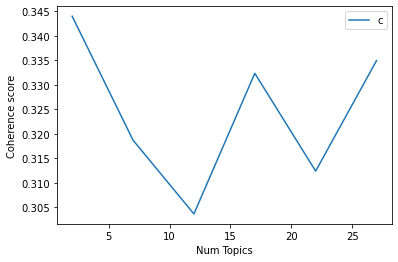

In [75]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_score3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [76]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_score3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 2

index: 0 | Num Topics = 2  has Coherence Value of 0.344
index: 1 | Num Topics = 7  has Coherence Value of 0.3187
index: 2 | Num Topics = 12  has Coherence Value of 0.3037
index: 3 | Num Topics = 17  has Coherence Value of 0.3324
index: 4 | Num Topics = 22  has Coherence Value of 0.3124
index: 5 | Num Topics = 27  has Coherence Value of 0.335


In [77]:
# Select optimal number of topics
optimal_model_sg_score3 = model_list_sg_score3[0]

In [78]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_score3 = pyLDAvis.gensim_models.prepare(optimal_model_sg_score3, corpus_sg_score3, id2word_sg_score3)

In [79]:
print("pyLDAVis for SG topics for score=3:")
vis_sg_score3

pyLDAVis for SG topics for score=3:


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
15    -0.213440 -0.134865       1        1  8.851311
25    -0.123404  0.032868       2        1  7.315333
19    -0.058014 -0.051284       3        1  6.360248
11     0.065470 -0.016469       4        1  6.084057
9     -0.154196  0.130656       5        1  4.600043
26    -0.047495  0.019344       6        1  4.216399
2     -0.013375 -0.019889       7        1  3.989946
23     0.042463  0.024865       8        1  3.896621
12     0.137277 -0.043944       9        1  3.645897
14     0.012430 -0.225448      10        1  3.638864
1      0.028124 -0.070527      11        1  3.605550
22    -0.047061  0.007899      12        1  3.570844
21    -0.043030 -0.024894      13        1  3.451669
18     0.130771 -0.007015      14        1  3.351476
24    -0.020584  0.123486      15        1  3.345958
5      0.004679 -0.103451      16        1  3.308719
16    -0.138437  0.057201      17        1  3.048128
7      0.057785  0.108729      18        1  2.864297
6      0.020524 -0.033174      19        1  2.852600
0      0.055881  0.006855      20        1  2.816495
10    -0.000257  0.015891      21        1  2.633440
4      0.044741  0.049381      22        1  2.483078
13     0.007966  0.070797      23        1  2.318003
8      0.080178  0.077272      24        1  2.262671
20     0.034310 -0.040517      25        1  2.101193
17     0.035579  0.047863      26        1  1.950961
3      0.101115 -0.001630      27        1  1.436200, topic_info=         Term        Freq       Total Category  logprob  loglift
0     account  163.000000  163.000000  Default  30.0000  30.0000
19     update  188.000000  188.000000  Default  29.0000  29.0000
526     music   40.000000   40.000000  Default  28.0000  28.0000
6        post  204.000000  204.000000  Default  27.0000  27.0000
9       story  178.000000  178.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
112  activity    0.801963    8.472261  Topic27  -4.9881   1.8857
117      hope    0.801963   34.353471  Topic27  -4.9881   0.4858
168     thing    0.801963   23.395229  Topic27  -4.9881   0.8699
428     allow    0.801963   22.449066  Topic27  -4.9881   0.9112
533   setting    0.801963   12.230599  Topic27  -4.9881   1.5185

[1650 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
744      10  0.589313     ability
70       12  0.585002        abit
33        2  0.062330        able
33        4  0.062330        able
33        5  0.083107        able
...     ...       ...         ...
209      11  0.145597        zoom
209      19  0.291195        zoom
209      20  0.145597        zoom
209      21  0.145597        zoom
1208     10  0.589314  ıllıııllıl

[3032 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[16, 26, 20, 12, 10, 27, 3, 24, 13, 15, 2, 23, 22, 19, 25, 6, 17, 8, 7, 1, 11, 5, 14, 9, 21, 18, 4])

## LDA Topic Modelling (Rating = 4)

In [80]:
# By-rating Topic Modelling - rating = 4
# Convert to list - move to each section
review_sg_score4 = instagram_ios_sg_review_YearMonth_score4.review.values.tolist()
review_words_sg_score4 = list(sent_to_words(review_sg_score4))
print(review_words_sg_score4[2:3])

[['please', 'fix', 'your', 'back', 'button', 'for', 'ios', 'build', 'always', 'got', 'stuck', 'after', 'clicking', 'into', 'someone', 'else', 'post', 'super', 'annoying']]


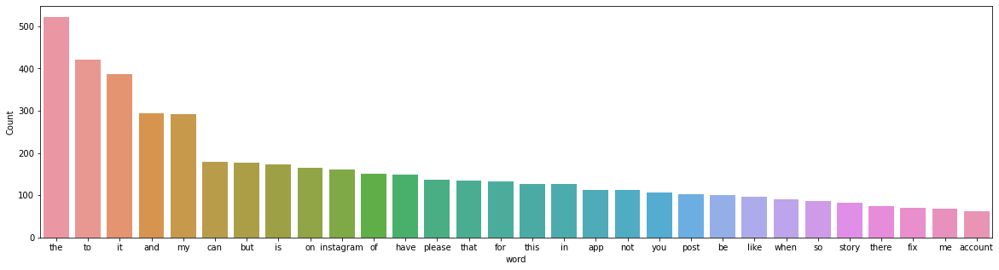

In [81]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_score4))

In [82]:
# Clean text
review_sg_ready_score4 = process_words(review_words_sg_score4)  # processed Text Data! - move to each section

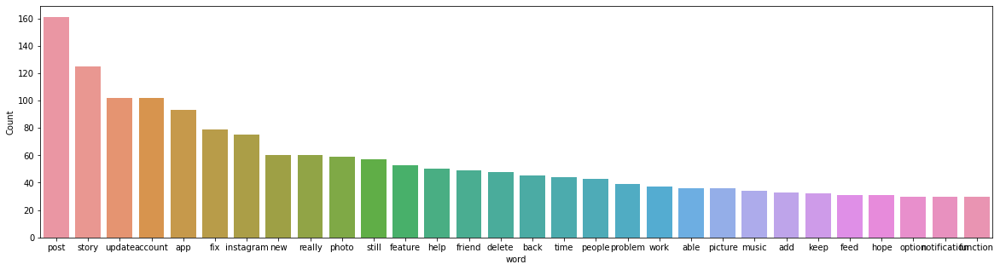

In [83]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_sg_ready_score4))


In [84]:
# Create Dictionary
id2word_sg_score4 = corpora.Dictionary(review_sg_ready_score4)

2021-10-16 02:47:53,438 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 02:47:53,459 [INFO] gensim.corpora.dictionary - built Dictionary(981 unique tokens: ['comment', 'commenting', 'follow', 'give', 'like']...) from 417 documents (total 4963 corpus positions)
2021-10-16 02:47:53,460 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(981 unique tokens: ['comment', 'commenting', 'follow', 'give', 'like']...) from 417 documents (total 4963 corpus positions)", 'datetime': '2021-10-16T02:47:53.460693', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [85]:
# Create Corpus: Term Document Frequency
corpus_sg_score4 = [id2word_sg_score4.doc2bow(text) for text in review_sg_ready_score4]

In [86]:
# Training LDA model
model_list_sg_score4, coherence_values_sg_score4 = compute_coherence_values(dictionary=id2word_sg_score4, corpus=corpus_sg_score4, 
                                                              texts=review_sg_ready_score4, limit=30, start=2, step=5)


2021-10-16 02:47:53,487 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 02:47:53,489 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 02:47:53,491 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:47:53,494 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 417 documents, updating model once every 417 documents, evaluating perplexity every 417 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 02:47:54,872 [INFO] gensim.models.ldamodel - -7.476 per-word bound, 178.0 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:47:54,873 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #417/417
2021-10-16 02:47:56,093 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.029*"story" + 0.019*"post" + 0.018*"update" + 0.017*"app" + 0.016*"new" + 0.014*"still" + 0.012*"fix" 

2021-10-16 02:48:08,698 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"post" + 0.026*"account" + 0.016*"fix" + 0.015*"story" + 0.015*"instagram" + 0.013*"really" + 0.012*"help" + 0.012*"friend" + 0.012*"app" + 0.012*"delete"
2021-10-16 02:48:08,699 [INFO] gensim.models.ldamodel - topic diff=0.013653, rho=0.301511
2021-10-16 02:48:09,348 [INFO] gensim.models.ldamodel - -6.256 per-word bound, 76.4 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:48:09,350 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #417/417
2021-10-16 02:48:09,841 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.032*"story" + 0.029*"update" + 0.023*"app" + 0.022*"new" + 0.014*"still" + 0.013*"back" + 0.010*"photo" + 0.010*"instagram" + 0.009*"post" + 0.009*"feature"
2021-10-16 02:48:09,846 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"post" + 0.026*"account" + 0.016*"fix" + 0.015*"story" + 0.015*"instagram" + 0.013*"really" + 0.012*"h

2021-10-16 02:48:20,561 [INFO] gensim.models.ldamodel - topic diff=0.005305, rho=0.218218
2021-10-16 02:48:21,057 [INFO] gensim.models.ldamodel - -6.250 per-word bound, 76.1 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:48:21,059 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #417/417
2021-10-16 02:48:21,606 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.032*"story" + 0.031*"update" + 0.025*"app" + 0.023*"new" + 0.015*"still" + 0.013*"back" + 0.011*"instagram" + 0.010*"feature" + 0.009*"time" + 0.009*"photo"
2021-10-16 02:48:21,608 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.040*"post" + 0.026*"account" + 0.016*"fix" + 0.015*"story" + 0.014*"instagram" + 0.013*"really" + 0.013*"friend" + 0.012*"delete" + 0.012*"help" + 0.011*"photo"
2021-10-16 02:48:21,609 [INFO] gensim.models.ldamodel - topic diff=0.005090, rho=0.213201
2021-10-16 02:48:22,316 [INFO] gensim.models.ldamodel - -6.250 per-word bound, 76.1 perple

2021-10-16 02:48:31,468 [INFO] gensim.models.ldamodel - -6.248 per-word bound, 76.0 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:48:31,469 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #417/417
2021-10-16 02:48:31,927 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.033*"update" + 0.031*"story" + 0.026*"app" + 0.024*"new" + 0.015*"still" + 0.013*"back" + 0.011*"instagram" + 0.010*"feature" + 0.009*"time" + 0.009*"fix"
2021-10-16 02:48:31,930 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.041*"post" + 0.027*"account" + 0.016*"fix" + 0.015*"story" + 0.014*"instagram" + 0.013*"really" + 0.013*"friend" + 0.013*"delete" + 0.012*"help" + 0.011*"photo"
2021-10-16 02:48:31,931 [INFO] gensim.models.ldamodel - topic diff=0.003446, rho=0.176777
2021-10-16 02:48:32,485 [INFO] gensim.models.ldamodel - -6.247 per-word bound, 76.0 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:48:3

2021-10-16 02:48:41,059 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #417/417
2021-10-16 02:48:41,504 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"update" + 0.031*"story" + 0.027*"app" + 0.024*"new" + 0.016*"still" + 0.013*"back" + 0.012*"instagram" + 0.010*"feature" + 0.009*"time" + 0.009*"fix"
2021-10-16 02:48:41,508 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.042*"post" + 0.027*"account" + 0.016*"fix" + 0.016*"story" + 0.014*"instagram" + 0.013*"really" + 0.013*"friend" + 0.013*"delete" + 0.012*"photo" + 0.011*"help"
2021-10-16 02:48:41,511 [INFO] gensim.models.ldamodel - topic diff=0.002684, rho=0.154303
2021-10-16 02:48:42,053 [INFO] gensim.models.ldamodel - -6.246 per-word bound, 75.9 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:48:42,055 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #417/417
2021-10-16 02:48:42,510 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"updat

2021-10-16 02:48:50,147 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 02:48:54,141 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 02:48:54,175 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 381 virtual documents
2021-10-16 02:48:54,400 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-16 02:48:54,402 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-16 02:48:54,407 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:48:54,411 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 417 documents, updating model once every 417 documents, evaluating perplexity every 417 documents, iterating 50x with a con

2021-10-16 02:48:59,594 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.032*"story" + 0.023*"app" + 0.017*"update" + 0.017*"mode" + 0.016*"change" + 0.014*"post" + 0.012*"photo" + 0.011*"highlight" + 0.011*"friend" + 0.011*"cover"
2021-10-16 02:48:59,595 [INFO] gensim.models.ldamodel - topic diff=0.053828, rho=0.408248
2021-10-16 02:49:00,175 [INFO] gensim.models.ldamodel - -6.564 per-word bound, 94.6 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:49:00,180 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #417/417
2021-10-16 02:49:00,585 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.036*"account" + 0.025*"post" + 0.023*"story" + 0.021*"fix" + 0.019*"really" + 0.015*"people" + 0.015*"app" + 0.013*"follow" + 0.013*"back" + 0.011*"work"
2021-10-16 02:49:00,588 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.040*"new" + 0.027*"story" + 0.025*"update" + 0.019*"feature" + 0.018*"photo" + 0.017*"post" + 0.014*"app" + 0.

2021-10-16 02:49:05,655 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.033*"story" + 0.024*"app" + 0.018*"mode" + 0.016*"change" + 0.015*"update" + 0.012*"cover" + 0.012*"io" + 0.012*"highlight" + 0.012*"post" + 0.012*"dark"
2021-10-16 02:49:05,658 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"post" + 0.024*"update" + 0.024*"still" + 0.022*"app" + 0.021*"notification" + 0.020*"story" + 0.017*"help" + 0.016*"work" + 0.015*"fix" + 0.013*"delete"
2021-10-16 02:49:05,661 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.030*"account" + 0.030*"story" + 0.028*"update" + 0.023*"new" + 0.021*"photo" + 0.020*"post" + 0.017*"instagram" + 0.016*"log" + 0.015*"change" + 0.015*"feature"
2021-10-16 02:49:05,663 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.063*"post" + 0.027*"help" + 0.021*"delete" + 0.020*"account" + 0.020*"picture" + 0.017*"update" + 0.017*"app" + 0.015*"instagram" + 0.014*"multiple" + 0.012*"keep"
2021-10-16 02:49:05,665 [INFO] gensim.models.ldamodel - top

2021-10-16 02:49:10,328 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"post" + 0.024*"update" + 0.024*"still" + 0.023*"app" + 0.021*"notification" + 0.020*"story" + 0.017*"help" + 0.016*"work" + 0.015*"fix" + 0.012*"delete"
2021-10-16 02:49:10,330 [INFO] gensim.models.ldamodel - topic diff=0.006771, rho=0.242536
2021-10-16 02:49:10,817 [INFO] gensim.models.ldamodel - -6.541 per-word bound, 93.1 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:49:10,818 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #417/417
2021-10-16 02:49:11,194 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.027*"instagram" + 0.022*"friend" + 0.019*"music" + 0.016*"story" + 0.015*"fix" + 0.015*"photo" + 0.015*"problem" + 0.011*"post" + 0.011*"app" + 0.010*"issue"
2021-10-16 02:49:11,196 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.030*"story" + 0.030*"account" + 0.028*"update" + 0.023*"new" + 0.023*"photo" + 0.020*"post" + 0.017*"insta

2021-10-16 02:49:15,681 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"account" + 0.027*"post" + 0.023*"story" + 0.021*"fix" + 0.018*"really" + 0.017*"people" + 0.017*"follow" + 0.014*"app" + 0.013*"back" + 0.011*"work"
2021-10-16 02:49:15,682 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"post" + 0.024*"update" + 0.024*"still" + 0.024*"app" + 0.021*"notification" + 0.020*"story" + 0.017*"help" + 0.016*"work" + 0.015*"fix" + 0.012*"delete"
2021-10-16 02:49:15,684 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.063*"post" + 0.028*"help" + 0.023*"delete" + 0.021*"picture" + 0.020*"account" + 0.017*"app" + 0.016*"update" + 0.014*"multiple" + 0.014*"instagram" + 0.012*"keep"
2021-10-16 02:49:15,685 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"story" + 0.024*"app" + 0.019*"mode" + 0.014*"update" + 0.013*"change" + 0.012*"cover" + 0.012*"io" + 0.012*"dark" + 0.012*"highlight" + 0.012*"friend"
2021-10-16 02:49:15,685 [INFO] gensim.models.ldamodel - topic di

2021-10-16 02:49:20,089 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.040*"new" + 0.026*"update" + 0.022*"story" + 0.016*"feature" + 0.016*"post" + 0.015*"feed" + 0.015*"photo" + 0.013*"app" + 0.013*"font" + 0.012*"time"
2021-10-16 02:49:20,090 [INFO] gensim.models.ldamodel - topic diff=0.002725, rho=0.188982
2021-10-16 02:49:20,577 [INFO] gensim.models.ldamodel - -6.535 per-word bound, 92.7 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:49:20,578 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #417/417
2021-10-16 02:49:20,938 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.064*"post" + 0.029*"help" + 0.023*"delete" + 0.021*"picture" + 0.020*"account" + 0.017*"app" + 0.016*"update" + 0.015*"multiple" + 0.014*"instagram" + 0.012*"keep"
2021-10-16 02:49:20,939 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.027*"post" + 0.024*"still" + 0.024*"app" + 0.024*"update" + 0.021*"notification" + 0.020*"story" + 0.017*"h

2021-10-16 02:49:25,570 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.027*"post" + 0.024*"app" + 0.024*"still" + 0.023*"update" + 0.021*"notification" + 0.019*"story" + 0.017*"help" + 0.016*"work" + 0.015*"fix" + 0.012*"reinstall"
2021-10-16 02:49:25,571 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.040*"new" + 0.026*"update" + 0.022*"story" + 0.016*"feature" + 0.016*"post" + 0.015*"feed" + 0.015*"photo" + 0.013*"app" + 0.013*"font" + 0.012*"time"
2021-10-16 02:49:25,573 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"story" + 0.024*"app" + 0.019*"mode" + 0.014*"update" + 0.012*"cover" + 0.012*"io" + 0.012*"dark" + 0.012*"highlight" + 0.012*"change" + 0.012*"friend"
2021-10-16 02:49:25,575 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"account" + 0.028*"post" + 0.023*"story" + 0.021*"fix" + 0.018*"really" + 0.017*"people" + 0.017*"follow" + 0.014*"app" + 0.013*"back" + 0.011*"work"
2021-10-16 02:49:25,576 [INFO] gensim.models.ldamodel - topic diff=0.00198

2021-10-16 02:49:29,762 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.033*"story" + 0.029*"update" + 0.028*"account" + 0.025*"photo" + 0.023*"new" + 0.022*"post" + 0.021*"feature" + 0.019*"change" + 0.018*"instagram" + 0.017*"add"
2021-10-16 02:49:29,763 [INFO] gensim.models.ldamodel - topic diff=0.001541, rho=0.160128
2021-10-16 02:49:30,240 [INFO] gensim.models.ldamodel - -6.532 per-word bound, 92.6 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:49:30,242 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #417/417
2021-10-16 02:49:30,636 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.027*"instagram" + 0.022*"friend" + 0.020*"music" + 0.016*"story" + 0.016*"fix" + 0.016*"problem" + 0.012*"photo" + 0.012*"app" + 0.011*"update" + 0.010*"issue"
2021-10-16 02:49:30,639 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.027*"post" + 0.024*"app" + 0.024*"still" + 0.023*"update" + 0.022*"notification" + 0.019*"story" + 0.

2021-10-16 02:49:34,875 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.039*"new" + 0.026*"update" + 0.022*"story" + 0.016*"feature" + 0.016*"post" + 0.015*"feed" + 0.015*"photo" + 0.013*"app" + 0.013*"font" + 0.012*"time"
2021-10-16 02:49:34,878 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.033*"story" + 0.029*"update" + 0.028*"account" + 0.025*"photo" + 0.023*"new" + 0.022*"post" + 0.022*"feature" + 0.019*"change" + 0.018*"instagram" + 0.017*"add"
2021-10-16 02:49:34,882 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"story" + 0.024*"app" + 0.019*"mode" + 0.014*"update" + 0.012*"cover" + 0.012*"io" + 0.012*"dark" + 0.012*"highlight" + 0.012*"change" + 0.012*"friend"
2021-10-16 02:49:34,886 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.066*"post" + 0.029*"help" + 0.023*"delete" + 0.021*"picture" + 0.020*"account" + 0.017*"app" + 0.016*"update" + 0.015*"multiple" + 0.014*"instagram" + 0.012*"keep"
2021-10-16 02:49:34,888 [INFO] gensim.models.ldamodel - topic di

2021-10-16 02:49:38,975 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.033*"story" + 0.029*"update" + 0.028*"account" + 0.025*"photo" + 0.023*"new" + 0.022*"feature" + 0.022*"post" + 0.019*"change" + 0.018*"instagram" + 0.017*"add"
2021-10-16 02:49:38,976 [INFO] gensim.models.ldamodel - topic diff=0.001042, rho=0.141421
2021-10-16 02:49:39,442 [INFO] gensim.models.ldamodel - -6.530 per-word bound, 92.4 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:49:39,443 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #417/417
2021-10-16 02:49:39,781 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.033*"story" + 0.029*"update" + 0.028*"account" + 0.025*"photo" + 0.023*"new" + 0.023*"feature" + 0.022*"post" + 0.019*"change" + 0.018*"instagram" + 0.017*"add"
2021-10-16 02:49:39,782 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.039*"new" + 0.026*"update" + 0.022*"story" + 0.016*"feature" + 0.016*"post" + 0.015*"feed" + 0.015*"

2021-10-16 02:49:48,819 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.045*"post" + 0.031*"story" + 0.024*"really" + 0.023*"fix" + 0.020*"account" + 0.019*"still" + 0.015*"instagram" + 0.013*"update" + 0.013*"time" + 0.012*"help"
2021-10-16 02:49:48,820 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.022*"back" + 0.021*"post" + 0.018*"people" + 0.018*"feed" + 0.018*"button" + 0.014*"remove" + 0.012*"follow" + 0.011*"really" + 0.011*"thing" + 0.011*"app"
2021-10-16 02:49:48,821 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.034*"account" + 0.031*"story" + 0.024*"new" + 0.022*"fix" + 0.019*"app" + 0.019*"back" + 0.018*"log" + 0.017*"still" + 0.017*"people" + 0.016*"update"
2021-10-16 02:49:48,822 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.019*"app" + 0.019*"update" + 0.017*"story" + 0.017*"post" + 0.015*"time" + 0.015*"help" + 0.015*"photo" + 0.015*"really" + 0.015*"keep" + 0.012*"add"
2021-10-16 02:49:48,823 [INFO] gensim.models.ldamodel - topic diff=0.106718, rh

2021-10-16 02:49:53,495 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.037*"instagram" + 0.024*"music" + 0.023*"problem" + 0.018*"fix" + 0.017*"friend" + 0.015*"story" + 0.013*"time" + 0.012*"app" + 0.012*"keep" + 0.010*"insta"
2021-10-16 02:49:53,497 [INFO] gensim.models.ldamodel - topic diff=0.036579, rho=0.316228
2021-10-16 02:49:53,980 [INFO] gensim.models.ldamodel - -6.680 per-word bound, 102.5 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:49:53,981 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #417/417
2021-10-16 02:49:54,325 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.048*"post" + 0.042*"story" + 0.019*"view" + 0.019*"search" + 0.018*"photo" + 0.017*"people" + 0.015*"like" + 0.014*"friend" + 0.014*"find" + 0.014*"feature"
2021-10-16 02:49:54,327 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.071*"post" + 0.034*"account" + 0.033*"delete" + 0.030*"picture" + 0.028*"multiple" + 0.021*"help" + 0.020*"

2021-10-16 02:49:58,568 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.047*"post" + 0.034*"story" + 0.024*"really" + 0.024*"fix" + 0.020*"still" + 0.020*"account" + 0.017*"instagram" + 0.015*"update" + 0.014*"time" + 0.012*"app"
2021-10-16 02:49:58,569 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.108*"account" + 0.022*"option" + 0.016*"function" + 0.016*"main" + 0.013*"thing" + 0.013*"miss" + 0.013*"friend" + 0.011*"instagram" + 0.011*"find" + 0.011*"fix"
2021-10-16 02:49:58,571 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.038*"instagram" + 0.025*"music" + 0.023*"problem" + 0.018*"fix" + 0.017*"friend" + 0.014*"story" + 0.013*"time" + 0.013*"app" + 0.012*"keep" + 0.010*"insta"
2021-10-16 02:49:58,574 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.035*"app" + 0.026*"update" + 0.024*"mode" + 0.022*"dark" + 0.018*"story" + 0.013*"new" + 0.013*"back" + 0.013*"photo" + 0.013*"iphone" + 0.010*"check"
2021-10-16 02:49:58,578 [INFO] gensim.models.ldamodel - topic #3 (0.

2021-10-16 02:50:03,227 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.034*"account" + 0.030*"story" + 0.025*"new" + 0.022*"fix" + 0.022*"app" + 0.020*"log" + 0.019*"back" + 0.018*"still" + 0.017*"people" + 0.015*"update"
2021-10-16 02:50:03,230 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.109*"account" + 0.023*"option" + 0.017*"main" + 0.016*"function" + 0.013*"thing" + 0.013*"miss" + 0.013*"friend" + 0.011*"instagram" + 0.011*"fix" + 0.011*"find"
2021-10-16 02:50:03,231 [INFO] gensim.models.ldamodel - topic diff=0.006705, rho=0.218218
2021-10-16 02:50:03,755 [INFO] gensim.models.ldamodel - -6.659 per-word bound, 101.0 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:50:03,757 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #417/417
2021-10-16 02:50:04,104 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.039*"instagram" + 0.025*"music" + 0.023*"problem" + 0.018*"friend" + 0.017*"fix" + 0.013*"story" + 0.013*"ti

2021-10-16 02:50:07,999 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #417/417
2021-10-16 02:50:08,275 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.110*"account" + 0.023*"option" + 0.017*"main" + 0.016*"function" + 0.014*"thing" + 0.014*"miss" + 0.014*"friend" + 0.011*"instagram" + 0.011*"fix" + 0.011*"find"
2021-10-16 02:50:08,276 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.036*"feature" + 0.026*"app" + 0.023*"really" + 0.023*"photo" + 0.022*"add" + 0.020*"highlight" + 0.018*"phone" + 0.018*"function" + 0.017*"new" + 0.015*"available"
2021-10-16 02:50:08,279 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.035*"app" + 0.027*"update" + 0.026*"mode" + 0.022*"dark" + 0.018*"story" + 0.014*"photo" + 0.013*"new" + 0.013*"back" + 0.013*"iphone" + 0.010*"check"
2021-10-16 02:50:08,281 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.019*"help" + 0.019*"story" + 0.018*"update" + 0.017*"app" + 0.016*"time" + 0.016*"photo" + 0.016*"really" + 0.016*"keep" +

2021-10-16 02:50:12,586 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.046*"post" + 0.043*"story" + 0.019*"search" + 0.019*"view" + 0.018*"photo" + 0.017*"people" + 0.015*"friend" + 0.015*"like" + 0.014*"find" + 0.013*"chat"
2021-10-16 02:50:12,588 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.060*"update" + 0.040*"still" + 0.032*"app" + 0.029*"work" + 0.028*"notification" + 0.027*"story" + 0.025*"fix" + 0.020*"account" + 0.019*"post" + 0.019*"music"
2021-10-16 02:50:12,590 [INFO] gensim.models.ldamodel - topic diff=0.003258, rho=0.176777
2021-10-16 02:50:13,024 [INFO] gensim.models.ldamodel - -6.651 per-word bound, 100.5 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:50:13,026 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #417/417
2021-10-16 02:50:13,257 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.046*"post" + 0.043*"story" + 0.019*"search" + 0.019*"view" + 0.018*"photo" + 0.017*"people" + 0.015*"frie

2021-10-16 02:50:16,808 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #417/417
2021-10-16 02:50:17,164 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.034*"account" + 0.030*"story" + 0.025*"new" + 0.022*"app" + 0.022*"fix" + 0.020*"log" + 0.019*"back" + 0.018*"still" + 0.017*"people" + 0.015*"update"
2021-10-16 02:50:17,169 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.060*"update" + 0.040*"still" + 0.032*"app" + 0.029*"work" + 0.028*"notification" + 0.027*"story" + 0.026*"fix" + 0.020*"account" + 0.019*"music" + 0.019*"post"
2021-10-16 02:50:17,173 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.019*"help" + 0.019*"story" + 0.018*"update" + 0.017*"app" + 0.016*"time" + 0.016*"photo" + 0.016*"really" + 0.016*"keep" + 0.014*"post" + 0.013*"able"
2021-10-16 02:50:17,175 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.057*"new" + 0.033*"update" + 0.023*"post" + 0.022*"delete" + 0.019*"font" + 0.014*"story" + 0.014*"app" + 0.013*"type" + 0.013*"picture" 

2021-10-16 02:50:21,060 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.078*"post" + 0.036*"delete" + 0.033*"account" + 0.032*"picture" + 0.030*"multiple" + 0.021*"photo" + 0.019*"help" + 0.017*"feature" + 0.013*"update" + 0.012*"able"
2021-10-16 02:50:21,063 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.059*"new" + 0.033*"update" + 0.023*"post" + 0.021*"delete" + 0.019*"font" + 0.015*"story" + 0.014*"app" + 0.013*"type" + 0.013*"picture" + 0.013*"keep"
2021-10-16 02:50:21,064 [INFO] gensim.models.ldamodel - topic diff=0.001892, rho=0.152499
2021-10-16 02:50:21,506 [INFO] gensim.models.ldamodel - -6.646 per-word bound, 100.2 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:50:21,507 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #417/417
2021-10-16 02:50:21,832 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.045*"post" + 0.042*"story" + 0.019*"search" + 0.019*"view" + 0.018*"photo" + 0.017*"people" + 0.015*"fri

2021-10-16 02:50:25,465 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #417/417
2021-10-16 02:50:25,776 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.040*"app" + 0.030*"update" + 0.026*"mode" + 0.022*"dark" + 0.018*"story" + 0.017*"photo" + 0.013*"back" + 0.013*"iphone" + 0.013*"load" + 0.011*"new"
2021-10-16 02:50:25,778 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.061*"update" + 0.040*"still" + 0.032*"app" + 0.029*"work" + 0.028*"notification" + 0.027*"story" + 0.026*"fix" + 0.021*"account" + 0.019*"music" + 0.019*"post"
2021-10-16 02:50:25,781 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.034*"account" + 0.030*"story" + 0.025*"new" + 0.022*"app" + 0.022*"fix" + 0.020*"log" + 0.019*"back" + 0.018*"still" + 0.017*"people" + 0.015*"update"
2021-10-16 02:50:25,784 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.039*"instagram" + 0.026*"music" + 0.024*"problem" + 0.018*"friend" + 0.017*"fix" + 0.014*"time" + 0.012*"story" + 0.012*"keep" + 0.011*"ins

2021-10-16 02:50:35,076 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.035*"update" + 0.031*"app" + 0.022*"story" + 0.020*"photo" + 0.018*"help" + 0.017*"load" + 0.014*"problem" + 0.014*"change" + 0.014*"function" + 0.014*"keep"
2021-10-16 02:50:35,078 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.021*"like" + 0.021*"help" + 0.017*"app" + 0.017*"remove" + 0.015*"upload" + 0.012*"close" + 0.012*"message" + 0.012*"second" + 0.012*"photo" + 0.012*"hope"
2021-10-16 02:50:35,079 [INFO] gensim.models.ldamodel - topic diff=0.158203, rho=0.577350
2021-10-16 02:50:35,482 [INFO] gensim.models.ldamodel - -6.941 per-word bound, 122.9 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:50:35,485 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #417/417
2021-10-16 02:50:35,833 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.022*"like" + 0.022*"help" + 0.017*"app" + 0.017*"remove" + 0.016*"upload" + 0.012*"close" + 0.012*"messag

2021-10-16 02:50:39,451 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #417/417
2021-10-16 02:50:39,787 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.043*"post" + 0.023*"feed" + 0.023*"back" + 0.021*"chronological" + 0.019*"remove" + 0.018*"really" + 0.015*"time" + 0.014*"button" + 0.014*"new" + 0.013*"update"
2021-10-16 02:50:39,793 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.032*"post" + 0.029*"photo" + 0.024*"picture" + 0.023*"feature" + 0.023*"new" + 0.021*"really" + 0.021*"add" + 0.019*"highlight" + 0.019*"update" + 0.019*"change"
2021-10-16 02:50:39,800 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.033*"account" + 0.025*"follow" + 0.025*"new" + 0.022*"fix" + 0.021*"post" + 0.019*"filter" + 0.019*"story" + 0.019*"back" + 0.018*"update" + 0.017*"miss"
2021-10-16 02:50:39,806 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.034*"post" + 0.030*"story" + 0.024*"view" + 0.023*"people" + 0.017*"search" + 0.017*"like" + 0.015*"instagram" + 0.014*"fe

2021-10-16 02:50:43,618 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.023*"like" + 0.023*"help" + 0.017*"app" + 0.017*"remove" + 0.017*"upload" + 0.012*"photo" + 0.012*"second" + 0.012*"message" + 0.012*"close" + 0.012*"hope"
2021-10-16 02:50:43,620 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.033*"post" + 0.030*"photo" + 0.025*"new" + 0.025*"picture" + 0.022*"feature" + 0.021*"highlight" + 0.021*"really" + 0.019*"add" + 0.019*"update" + 0.019*"change"
2021-10-16 02:50:43,621 [INFO] gensim.models.ldamodel - topic diff=0.019213, rho=0.267261
2021-10-16 02:50:44,012 [INFO] gensim.models.ldamodel - -6.782 per-word bound, 110.1 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:50:44,014 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #417/417
2021-10-16 02:50:44,345 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.047*"new" + 0.029*"update" + 0.021*"feature" + 0.021*"app" + 0.021*"font" + 0.020*"still" + 0.016*"op

2021-10-16 02:50:48,273 [INFO] gensim.models.ldamodel - -6.769 per-word bound, 109.1 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:50:48,275 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #417/417
2021-10-16 02:50:48,693 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.066*"post" + 0.026*"delete" + 0.022*"update" + 0.021*"picture" + 0.021*"photo" + 0.015*"multiple" + 0.014*"able" + 0.014*"friend" + 0.013*"fix" + 0.012*"user"
2021-10-16 02:50:48,695 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.034*"update" + 0.027*"app" + 0.024*"keep" + 0.022*"photo" + 0.020*"load" + 0.017*"problem" + 0.015*"change" + 0.015*"way" + 0.015*"ever" + 0.015*"crash"
2021-10-16 02:50:48,696 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.033*"account" + 0.026*"follow" + 0.023*"new" + 0.022*"fix" + 0.020*"post" + 0.020*"filter" + 0.019*"story" + 0.019*"update" + 0.019*"back" + 0.017*"really"
2021-10-16 02:50:48,697 [INFO] gensim.mode

2021-10-16 02:50:53,063 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.032*"post" + 0.029*"photo" + 0.027*"new" + 0.025*"picture" + 0.023*"highlight" + 0.022*"feature" + 0.021*"change" + 0.020*"really" + 0.019*"add" + 0.019*"update"
2021-10-16 02:50:53,064 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.036*"update" + 0.027*"app" + 0.026*"keep" + 0.022*"photo" + 0.020*"load" + 0.016*"problem" + 0.015*"change" + 0.015*"way" + 0.015*"ever" + 0.015*"crash"
2021-10-16 02:50:53,068 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.048*"story" + 0.041*"post" + 0.031*"music" + 0.028*"share" + 0.026*"fix" + 0.017*"add" + 0.017*"iphone" + 0.015*"help" + 0.014*"notification" + 0.014*"record"
2021-10-16 02:50:53,069 [INFO] gensim.models.ldamodel - topic diff=0.006214, rho=0.200000
2021-10-16 02:50:53,524 [INFO] gensim.models.ldamodel - -6.759 per-word bound, 108.3 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:50:53,527 [INFO] gensim.mode

2021-10-16 02:50:57,337 [INFO] gensim.models.ldamodel - topic diff=0.004394, rho=0.182574
2021-10-16 02:50:57,796 [INFO] gensim.models.ldamodel - -6.754 per-word bound, 108.0 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:50:57,797 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #417/417
2021-10-16 02:50:58,167 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.048*"notification" + 0.041*"account" + 0.032*"post" + 0.031*"fix" + 0.029*"story" + 0.021*"setting" + 0.019*"instagram" + 0.019*"check" + 0.017*"receive" + 0.014*"still"
2021-10-16 02:50:58,172 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.048*"new" + 0.028*"update" + 0.021*"app" + 0.021*"feature" + 0.020*"font" + 0.018*"still" + 0.016*"option" + 0.016*"friend" + 0.016*"whenever" + 0.012*"fix"
2021-10-16 02:50:58,178 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.056*"account" + 0.048*"update" + 0.045*"still" + 0.037*"app" + 0.031*"story" + 0.025*"fix" +

2021-10-16 02:51:02,453 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.048*"new" + 0.028*"update" + 0.021*"app" + 0.021*"feature" + 0.020*"font" + 0.018*"still" + 0.016*"option" + 0.016*"friend" + 0.016*"whenever" + 0.012*"fix"
2021-10-16 02:51:02,455 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.043*"post" + 0.026*"feed" + 0.023*"back" + 0.023*"chronological" + 0.021*"remove" + 0.020*"really" + 0.016*"time" + 0.015*"button" + 0.015*"people" + 0.015*"unable"
2021-10-16 02:51:02,458 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.040*"available" + 0.026*"account" + 0.026*"music" + 0.022*"really" + 0.021*"add" + 0.018*"time" + 0.018*"app" + 0.015*"region" + 0.014*"already" + 0.012*"still"
2021-10-16 02:51:02,460 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.032*"post" + 0.029*"photo" + 0.028*"new" + 0.025*"picture" + 0.023*"highlight" + 0.022*"feature" + 0.021*"change" + 0.020*"really" + 0.019*"add" + 0.019*"story"
2021-10-16 02:51:02,461 [INFO] gensim.models.ldamo

2021-10-16 02:51:06,941 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.037*"account" + 0.036*"app" + 0.028*"back" + 0.021*"work" + 0.020*"post" + 0.019*"update" + 0.016*"bring" + 0.015*"instagram" + 0.014*"read" + 0.014*"hashtag"
2021-10-16 02:51:06,942 [INFO] gensim.models.ldamodel - topic diff=0.002299, rho=0.156174
2021-10-16 02:51:07,480 [INFO] gensim.models.ldamodel - -6.749 per-word bound, 107.5 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:51:07,482 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #417/417
2021-10-16 02:51:07,847 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.047*"notification" + 0.041*"account" + 0.032*"post" + 0.032*"fix" + 0.030*"story" + 0.021*"setting" + 0.020*"instagram" + 0.019*"check" + 0.017*"receive" + 0.014*"keep"
2021-10-16 02:51:07,850 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.042*"instagram" + 0.038*"friend" + 0.033*"post" + 0.027*"story" + 0.026*"fix" + 0.023*"photo

2021-10-16 02:51:12,056 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.039*"update" + 0.028*"keep" + 0.027*"app" + 0.022*"photo" + 0.020*"load" + 0.016*"problem" + 0.015*"change" + 0.015*"way" + 0.015*"ever" + 0.015*"crash"
2021-10-16 02:51:12,062 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.046*"app" + 0.032*"story" + 0.024*"refresh" + 0.023*"remove" + 0.017*"help" + 0.017*"delete" + 0.016*"insta" + 0.016*"check" + 0.015*"thing" + 0.014*"phone"
2021-10-16 02:51:12,063 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.042*"available" + 0.026*"account" + 0.026*"music" + 0.021*"really" + 0.021*"add" + 0.018*"time" + 0.018*"app" + 0.015*"region" + 0.014*"already" + 0.012*"still"
2021-10-16 02:51:12,065 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.038*"delete" + 0.031*"post" + 0.027*"update" + 0.023*"story" + 0.023*"allow" + 0.019*"account" + 0.019*"pic" + 0.019*"picture" + 0.019*"app" + 0.016*"fix"
2021-10-16 02:51:12,066 [INFO] gensim.models.ldamodel - topic #7 (0.

2021-10-16 02:51:22,389 [INFO] gensim.models.ldamodel - using symmetric eta at 0.045454545454545456
2021-10-16 02:51:22,392 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:51:22,398 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 22 topics, 50 passes over the supplied corpus of 417 documents, updating model once every 417 documents, evaluating perplexity every 417 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 02:51:23,292 [INFO] gensim.models.ldamodel - -15.339 per-word bound, 41450.9 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:51:23,294 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #417/417
2021-10-16 02:51:24,024 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.037*"post" + 0.032*"update" + 0.027*"account" + 0.024*"really" + 0.023*"time" + 0.018*"story" + 0.018*"find" + 0.016*"still" + 0.015*"fix" + 0.015*"log"
2021-10-16 0

2021-10-16 02:51:28,079 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #417/417
2021-10-16 02:51:28,390 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.062*"story" + 0.030*"available" + 0.028*"feature" + 0.025*"post" + 0.022*"much" + 0.021*"people" + 0.015*"view" + 0.015*"highlight" + 0.015*"delete" + 0.015*"photo"
2021-10-16 02:51:28,392 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.029*"account" + 0.025*"really" + 0.020*"still" + 0.020*"profile" + 0.019*"thing" + 0.017*"story" + 0.015*"view" + 0.015*"change" + 0.015*"video" + 0.015*"app"
2021-10-16 02:51:28,393 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.035*"post" + 0.032*"update" + 0.031*"really" + 0.029*"account" + 0.028*"time" + 0.020*"story" + 0.018*"fix" + 0.018*"find" + 0.017*"people" + 0.017*"log"
2021-10-16 02:51:28,396 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.060*"new" + 0.038*"font" + 0.034*"app" + 0.032*"still" + 0.022*"gif" + 0.021*"feature" + 0.021*"upload" + 0.018*"photo" +

2021-10-16 02:51:32,614 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.050*"update" + 0.049*"post" + 0.032*"story" + 0.031*"photo" + 0.029*"feature" + 0.028*"instagram" + 0.024*"delete" + 0.022*"still" + 0.019*"friend" + 0.019*"fix"
2021-10-16 02:51:32,616 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.074*"account" + 0.041*"app" + 0.026*"post" + 0.024*"still" + 0.024*"really" + 0.018*"time" + 0.017*"fix" + 0.016*"delete" + 0.016*"page" + 0.016*"new"
2021-10-16 02:51:32,619 [INFO] gensim.models.ldamodel - topic diff=0.028922, rho=0.288675
2021-10-16 02:51:33,133 [INFO] gensim.models.ldamodel - -6.884 per-word bound, 118.1 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:51:33,139 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #417/417
2021-10-16 02:51:33,486 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.064*"new" + 0.038*"font" + 0.034*"app" + 0.031*"still" + 0.024*"gif" + 0.022*"feature" + 0.022*"upload" +

2021-10-16 02:51:37,458 [INFO] gensim.models.ldamodel - -6.868 per-word bound, 116.8 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:51:37,459 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #417/417
2021-10-16 02:51:37,797 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.052*"post" + 0.026*"story" + 0.025*"app" + 0.024*"help" + 0.021*"instagram" + 0.020*"really" + 0.018*"disappear" + 0.017*"account" + 0.016*"hashtag" + 0.016*"problem"
2021-10-16 02:51:37,799 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.051*"new" + 0.046*"update" + 0.037*"filter" + 0.036*"story" + 0.027*"app" + 0.021*"back" + 0.021*"help" + 0.020*"instagram" + 0.015*"picture" + 0.015*"post"
2021-10-16 02:51:37,802 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.065*"new" + 0.038*"font" + 0.034*"app" + 0.031*"still" + 0.023*"gif" + 0.022*"feature" + 0.022*"upload" + 0.018*"photo" + 0.013*"log" + 0.013*"instagram"
2021-10-16 02:51:37,804 [INFO] 

2021-10-16 02:51:42,134 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.028*"account" + 0.025*"really" + 0.024*"thing" + 0.020*"still" + 0.020*"profile" + 0.019*"story" + 0.015*"change" + 0.015*"view" + 0.015*"video" + 0.015*"app"
2021-10-16 02:51:42,136 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.056*"post" + 0.029*"friend" + 0.022*"able" + 0.022*"else" + 0.019*"story" + 0.018*"notification" + 0.016*"option" + 0.014*"chronological" + 0.014*"change" + 0.014*"anymore"
2021-10-16 02:51:42,138 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.076*"account" + 0.041*"app" + 0.025*"post" + 0.024*"really" + 0.022*"still" + 0.018*"page" + 0.017*"time" + 0.016*"delete" + 0.016*"new" + 0.016*"fix"
2021-10-16 02:51:42,139 [INFO] gensim.models.ldamodel - topic diff=0.007187, rho=0.208514
2021-10-16 02:51:42,649 [INFO] gensim.models.ldamodel - -6.859 per-word bound, 116.1 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:51:42,652 [INFO] g

2021-10-16 02:51:46,273 [INFO] gensim.models.ldamodel - topic diff=0.004922, rho=0.188982
2021-10-16 02:51:46,809 [INFO] gensim.models.ldamodel - -6.855 per-word bound, 115.8 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:51:46,811 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #417/417
2021-10-16 02:51:47,179 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.028*"bring" + 0.028*"work" + 0.026*"back" + 0.023*"follower" + 0.021*"app" + 0.017*"scroll" + 0.017*"fix" + 0.017*"friend" + 0.013*"update" + 0.012*"kind"
2021-10-16 02:51:47,184 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.054*"update" + 0.038*"post" + 0.036*"story" + 0.031*"feature" + 0.026*"instagram" + 0.025*"photo" + 0.025*"still" + 0.023*"delete" + 0.020*"friend" + 0.018*"fix"
2021-10-16 02:51:47,191 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.073*"account" + 0.039*"app" + 0.026*"really" + 0.025*"post" + 0.023*"still" + 0.018*"page" + 0.017*"t

2021-10-16 02:51:51,323 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.091*"post" + 0.083*"photo" + 0.039*"picture" + 0.030*"multiple" + 0.028*"delete" + 0.025*"upload" + 0.022*"quality" + 0.016*"really" + 0.016*"app" + 0.016*"change"
2021-10-16 02:51:51,325 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.071*"account" + 0.038*"app" + 0.025*"post" + 0.025*"still" + 0.025*"really" + 0.018*"page" + 0.017*"time" + 0.016*"delete" + 0.016*"new" + 0.015*"fix"
2021-10-16 02:51:51,329 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.053*"account" + 0.029*"search" + 0.029*"fix" + 0.022*"message" + 0.019*"hope" + 0.018*"option" + 0.016*"really" + 0.016*"chat" + 0.015*"friend" + 0.014*"find"
2021-10-16 02:51:51,330 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.054*"update" + 0.037*"story" + 0.035*"post" + 0.031*"feature" + 0.026*"instagram" + 0.026*"still" + 0.023*"delete" + 0.022*"photo" + 0.020*"friend" + 0.019*"fix"
2021-10-16 02:51:51,332 [INFO] gensim.models.ldamodel - to

2021-10-16 02:51:55,919 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.027*"really" + 0.025*"thing" + 0.022*"account" + 0.021*"profile" + 0.021*"still" + 0.016*"story" + 0.016*"video" + 0.016*"view" + 0.016*"change" + 0.016*"app"
2021-10-16 02:51:55,924 [INFO] gensim.models.ldamodel - topic diff=0.003055, rho=0.160128
2021-10-16 02:51:56,374 [INFO] gensim.models.ldamodel - -6.847 per-word bound, 115.1 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:51:56,375 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #417/417
2021-10-16 02:51:56,801 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.033*"story" + 0.028*"app" + 0.023*"audio" + 0.017*"photo" + 0.017*"time" + 0.017*"really" + 0.013*"add" + 0.011*"share" + 0.011*"group" + 0.011*"annoying"
2021-10-16 02:51:56,805 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.028*"bring" + 0.028*"work" + 0.025*"back" + 0.023*"follower" + 0.021*"app" + 0.017*"scroll" + 0.017*"fix"

2021-10-16 02:52:00,985 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.054*"post" + 0.027*"help" + 0.025*"story" + 0.024*"app" + 0.024*"really" + 0.021*"disappear" + 0.020*"instagram" + 0.017*"hashtag" + 0.016*"account" + 0.016*"caption"
2021-10-16 02:52:00,992 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.052*"new" + 0.046*"update" + 0.038*"filter" + 0.034*"story" + 0.028*"app" + 0.022*"back" + 0.022*"help" + 0.020*"instagram" + 0.016*"picture" + 0.016*"post"
2021-10-16 02:52:00,999 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.044*"post" + 0.026*"story" + 0.025*"people" + 0.020*"able" + 0.018*"list" + 0.018*"show" + 0.017*"allow" + 0.015*"like" + 0.015*"great" + 0.014*"view"
2021-10-16 02:52:01,007 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.031*"user" + 0.020*"post" + 0.020*"app" + 0.019*"remove" + 0.018*"back" + 0.017*"day" + 0.016*"picture" + 0.016*"button" + 0.013*"update" + 0.013*"thing"
2021-10-16 02:52:01,011 [INFO] gensim.models.ldamodel - topic #2 

2021-10-16 02:52:05,169 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.071*"account" + 0.037*"app" + 0.026*"really" + 0.025*"still" + 0.025*"post" + 0.018*"page" + 0.017*"delete" + 0.017*"time" + 0.016*"new" + 0.014*"function"
2021-10-16 02:52:05,173 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.030*"user" + 0.020*"app" + 0.018*"back" + 0.018*"post" + 0.018*"remove" + 0.017*"day" + 0.016*"button" + 0.013*"thing" + 0.013*"camera" + 0.013*"reshare"
2021-10-16 02:52:05,176 [INFO] gensim.models.ldamodel - topic diff=0.003078, rho=0.141421
2021-10-16 02:52:05,653 [INFO] gensim.models.ldamodel - -6.837 per-word bound, 114.3 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:52:05,659 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #417/417
2021-10-16 02:52:05,934 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.098*"story" + 0.058*"available" + 0.026*"post" + 0.026*"people" + 0.025*"feature" + 0.022*"fix" + 0.022*"mine"

2021-10-16 02:52:18,029 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #417/417
2021-10-16 02:52:18,373 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.100*"music" + 0.058*"story" + 0.032*"update" + 0.031*"available" + 0.029*"country" + 0.027*"function" + 0.025*"app" + 0.021*"add" + 0.021*"account" + 0.020*"photo"
2021-10-16 02:52:18,374 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.053*"feature" + 0.029*"post" + 0.023*"new" + 0.020*"picture" + 0.020*"really" + 0.017*"update" + 0.015*"function" + 0.014*"remove" + 0.014*"phone" + 0.013*"insta"
2021-10-16 02:52:18,378 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.057*"story" + 0.043*"delete" + 0.030*"picture" + 0.028*"post" + 0.022*"text" + 0.018*"view" + 0.017*"mode" + 0.016*"help" + 0.015*"keep" + 0.015*"fix"
2021-10-16 02:52:18,380 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.052*"account" + 0.052*"post" + 0.029*"story" + 0.025*"fix" + 0.017*"really" + 0.016*"video" + 0.016*"igtv" + 0.016*"help"

2021-10-16 02:52:22,587 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.031*"new" + 0.030*"instagram" + 0.026*"time" + 0.021*"account" + 0.020*"update" + 0.015*"stop" + 0.015*"reshare" + 0.015*"gif" + 0.014*"fix" + 0.013*"app"
2021-10-16 02:52:22,588 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.028*"app" + 0.021*"whenever" + 0.021*"still" + 0.021*"fix" + 0.021*"really" + 0.016*"dm" + 0.015*"message" + 0.014*"capability" + 0.014*"uploading" + 0.014*"igtv"
2021-10-16 02:52:22,589 [INFO] gensim.models.ldamodel - topic diff=0.048202, rho=0.316228
2021-10-16 02:52:23,035 [INFO] gensim.models.ldamodel - -6.987 per-word bound, 126.8 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:52:23,037 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #417/417
2021-10-16 02:52:23,440 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.028*"app" + 0.021*"whenever" + 0.021*"still" + 0.021*"fix" + 0.021*"really" + 0.017*"dm" + 0.015*"mess

2021-10-16 02:52:27,412 [INFO] gensim.models.ldamodel - -6.959 per-word bound, 124.4 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:52:27,417 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #417/417
2021-10-16 02:52:27,751 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.043*"post" + 0.037*"story" + 0.025*"love" + 0.023*"highlight" + 0.020*"miss" + 0.018*"notify" + 0.018*"open" + 0.018*"dms" + 0.018*"able" + 0.018*"private"
2021-10-16 02:52:27,754 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.066*"update" + 0.031*"account" + 0.031*"still" + 0.021*"instagram" + 0.018*"mode" + 0.017*"story" + 0.017*"available" + 0.016*"dark" + 0.016*"option" + 0.015*"phone"
2021-10-16 02:52:27,756 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.054*"update" + 0.039*"new" + 0.036*"story" + 0.026*"instagram" + 0.021*"miss" + 0.019*"fix" + 0.019*"problem" + 0.018*"highlight" + 0.016*"late" + 0.015*"feature"
2021-10-16 02:52:27,758

2021-10-16 02:52:31,986 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.045*"help" + 0.041*"app" + 0.032*"update" + 0.030*"story" + 0.030*"still" + 0.026*"function" + 0.021*"instagram" + 0.021*"really" + 0.021*"change" + 0.014*"guy"
2021-10-16 02:52:31,990 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.056*"account" + 0.038*"new" + 0.036*"post" + 0.028*"list" + 0.023*"fix" + 0.020*"like" + 0.020*"friend" + 0.016*"profile" + 0.016*"back" + 0.016*"however"
2021-10-16 02:52:31,992 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.128*"notification" + 0.035*"check" + 0.034*"fix" + 0.030*"receive" + 0.028*"app" + 0.028*"setting" + 0.024*"still" + 0.021*"instagram" + 0.021*"work" + 0.021*"turn"
2021-10-16 02:52:31,997 [INFO] gensim.models.ldamodel - topic diff=0.009538, rho=0.218218
2021-10-16 02:52:32,543 [INFO] gensim.models.ldamodel - -6.945 per-word bound, 123.2 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:52:32,545 [INFO] gen

2021-10-16 02:52:36,482 [INFO] gensim.models.ldamodel - topic diff=0.006355, rho=0.196116
2021-10-16 02:52:36,895 [INFO] gensim.models.ldamodel - -6.937 per-word bound, 122.6 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:52:36,897 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #417/417
2021-10-16 02:52:37,278 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.043*"post" + 0.037*"story" + 0.025*"love" + 0.023*"highlight" + 0.020*"miss" + 0.018*"notify" + 0.018*"open" + 0.018*"dms" + 0.018*"able" + 0.018*"private"
2021-10-16 02:52:37,282 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.071*"filter" + 0.038*"add" + 0.037*"story" + 0.028*"app" + 0.024*"picture" + 0.022*"face" + 0.021*"back" + 0.020*"new" + 0.017*"instagram" + 0.012*"rlly"
2021-10-16 02:52:37,284 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.057*"account" + 0.038*"new" + 0.033*"post" + 0.029*"list" + 0.023*"fix" + 0.020*"like" + 0.019*"friend" + 0.

2021-10-16 02:52:41,530 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.045*"post" + 0.023*"still" + 0.023*"update" + 0.018*"log" + 0.017*"app" + 0.017*"gif" + 0.012*"help" + 0.011*"instagram" + 0.011*"show" + 0.011*"time"
2021-10-16 02:52:41,531 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.055*"update" + 0.039*"new" + 0.036*"story" + 0.025*"instagram" + 0.021*"miss" + 0.019*"fix" + 0.018*"problem" + 0.018*"highlight" + 0.016*"late" + 0.015*"feature"
2021-10-16 02:52:41,533 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.066*"update" + 0.031*"account" + 0.031*"still" + 0.021*"instagram" + 0.018*"mode" + 0.017*"available" + 0.016*"story" + 0.016*"dark" + 0.016*"option" + 0.016*"phone"
2021-10-16 02:52:41,534 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.046*"app" + 0.041*"work" + 0.039*"delete" + 0.033*"post" + 0.033*"instagram" + 0.023*"help" + 0.022*"update" + 0.021*"back" + 0.017*"bring" + 0.014*"order"
2021-10-16 02:52:41,535 [INFO] gensim.models.ldamodel - 

2021-10-16 02:52:45,952 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.055*"update" + 0.040*"new" + 0.036*"story" + 0.025*"instagram" + 0.021*"miss" + 0.019*"fix" + 0.019*"problem" + 0.018*"highlight" + 0.016*"late" + 0.015*"feature"
2021-10-16 02:52:45,953 [INFO] gensim.models.ldamodel - topic diff=0.003228, rho=0.164399
2021-10-16 02:52:46,471 [INFO] gensim.models.ldamodel - -6.926 per-word bound, 121.6 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:52:46,473 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #417/417
2021-10-16 02:52:46,740 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.066*"update" + 0.031*"account" + 0.031*"still" + 0.021*"instagram" + 0.018*"mode" + 0.017*"available" + 0.016*"story" + 0.016*"dark" + 0.016*"option" + 0.016*"phone"
2021-10-16 02:52:46,747 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.045*"post" + 0.023*"still" + 0.023*"update" + 0.017*"log" + 0.017*"app" + 0.017*"gif" + 0

2021-10-16 02:52:51,102 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.073*"filter" + 0.037*"story" + 0.037*"add" + 0.027*"app" + 0.024*"picture" + 0.024*"face" + 0.021*"back" + 0.020*"new" + 0.016*"instagram" + 0.012*"rlly"
2021-10-16 02:52:51,104 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.047*"app" + 0.042*"work" + 0.038*"delete" + 0.034*"instagram" + 0.029*"post" + 0.023*"help" + 0.022*"update" + 0.022*"back" + 0.018*"bring" + 0.014*"order"
2021-10-16 02:52:51,105 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.043*"help" + 0.043*"app" + 0.041*"story" + 0.034*"still" + 0.034*"update" + 0.025*"function" + 0.020*"instagram" + 0.020*"really" + 0.020*"change" + 0.019*"wait"
2021-10-16 02:52:51,109 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.060*"story" + 0.056*"delete" + 0.032*"picture" + 0.027*"post" + 0.024*"text" + 0.020*"view" + 0.020*"help" + 0.017*"keep" + 0.016*"mode" + 0.016*"fix"
2021-10-16 02:52:51,112 [INFO] gensim.models.ldamodel - topic #16 (0.

2021-10-16 02:52:55,474 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.040*"account" + 0.034*"fix" + 0.033*"app" + 0.032*"post" + 0.028*"still" + 0.027*"log" + 0.025*"delete" + 0.017*"page" + 0.017*"story" + 0.017*"able"
2021-10-16 02:52:55,476 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.073*"filter" + 0.037*"story" + 0.037*"add" + 0.027*"app" + 0.024*"picture" + 0.024*"face" + 0.021*"back" + 0.020*"new" + 0.016*"instagram" + 0.012*"rlly"
2021-10-16 02:52:55,478 [INFO] gensim.models.ldamodel - topic diff=0.002255, rho=0.144338
2021-10-16 02:52:55,947 [INFO] gensim.models.ldamodel - -6.919 per-word bound, 121.0 perplexity estimate based on a held-out corpus of 417 documents with 4963 words
2021-10-16 02:52:55,949 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #417/417
2021-10-16 02:52:56,354 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.073*"filter" + 0.037*"story" + 0.037*"add" + 0.027*"app" + 0.024*"picture" + 0.024*"face" + 0.021*"back" + 0.020*"

In [87]:
%store model_list_sg_score4
%store coherence_values_sg_score4

Stored 'model_list_sg_score4' (list)
Stored 'coherence_values_sg_score4' (list)


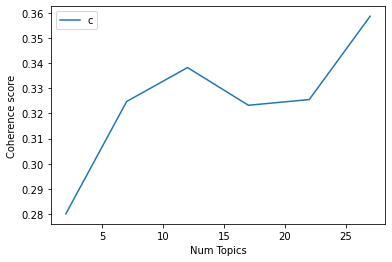

In [88]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_score4)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [89]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_score4):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics =  27

index: 0 | Num Topics = 2  has Coherence Value of 0.28
index: 1 | Num Topics = 7  has Coherence Value of 0.3247
index: 2 | Num Topics = 12  has Coherence Value of 0.3382
index: 3 | Num Topics = 17  has Coherence Value of 0.3232
index: 4 | Num Topics = 22  has Coherence Value of 0.3255
index: 5 | Num Topics = 27  has Coherence Value of 0.3586


In [90]:
# Select optimal number of topics
optimal_model_sg_score4 = model_list_sg_score4[5]

In [91]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_score4 = pyLDAvis.gensim_models.prepare(optimal_model_sg_score4, corpus_sg_score4, id2word_sg_score4)

In [92]:
print("pyLDAVis for SG topics for score=4:")
vis_sg_score4

pyLDAVis for SG topics for score=4:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
14    -0.119632  0.109479       1        1  12.988223
11     0.164685 -0.049097       2        1  10.018707
4      0.088614  0.089291       3        1   9.521157
1      0.008964  0.041632       4        1   7.508518
8     -0.080332 -0.041704       5        1   7.334815
15    -0.072869  0.022322       6        1   6.049718
7      0.077379 -0.101123       7        1   5.780416
5     -0.006486  0.002116       8        1   5.773668
10    -0.088417  0.009077       9        1   5.476566
9      0.065184  0.155137      10        1   4.866311
2      0.099250  0.045477      11        1   4.529609
3     -0.021628  0.085711      12        1   4.289528
0      0.004548 -0.072900      13        1   3.983063
6     -0.054635 -0.052267      14        1   3.429284
12    -0.076994 -0.089566      15        1   3.100376
16    -0.041418 -0.061797      16        1   2.839540
13     0.053789 -0.091788      17        1   2.510499, topic_info=         Term       Freq      Total Category  logprob  loglift
54    account  87.000000  87.000000  Default  30.0000  30.0000
50        new  50.000000  50.000000  Default  29.0000  29.0000
58        app  78.000000  78.000000  Default  28.0000  28.0000
32     update  86.000000  86.000000  Default  27.0000  27.0000
261     music  29.000000  29.000000  Default  26.0000  26.0000
..        ...        ...        ...      ...      ...      ...
225      fact   0.778484   4.076180  Topic17  -5.0755   2.0291
269  follower   0.778484   6.522561  Topic17  -5.0755   1.5590
271   private   0.778484   4.806293  Topic17  -5.0755   1.8644
396     solve   0.778484   5.023179  Topic17  -5.0755   1.8202
450  consider   0.778484   6.398143  Topic17  -5.0755   1.5783

[1075 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
519       4  0.607835     ability
519      14  0.303918     ability
232       1  0.128543        able
232       2  0.192814        able
232       3  0.032136        able
...     ...       ...         ...
431       5  0.107654       write
431      11  0.215307       write
398       9  0.608968          xr
671      13  0.617635   yesterday
918      14  0.630181  这个收和发信息很慢哦

[1869 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[15, 12, 5, 2, 9, 16, 8, 6, 11, 10, 3, 4, 1, 7, 13, 17, 14])

## LDA Topic Modelling (Rating = 5)

In [93]:
# By-rating Topic Modelling - rating = 5
# Convert to list - move to each section
review_sg_score5 = instagram_ios_sg_review_YearMonth_score5.review.values.tolist()
review_words_sg_score5 = list(sent_to_words(review_sg_score5))
print(review_words_sg_score5[:1])

[['awesome', 'app']]


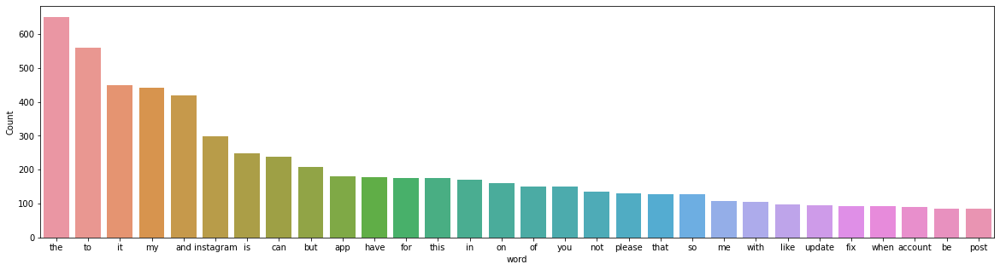

In [94]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_score5))

In [95]:
# Clean text
review_sg_ready_score5 = process_words(review_words_sg_score5)  # processed Text Data! - move to each section

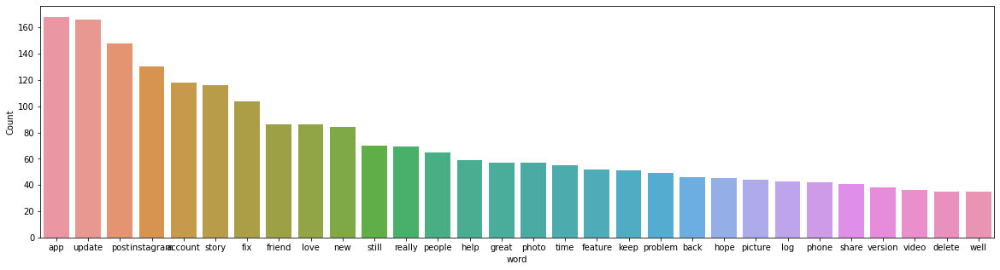

In [96]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_sg_ready_score5))


In [97]:
# Create Dictionary
id2word_sg_score5 = corpora.Dictionary(review_sg_ready_score5)

2021-10-16 02:53:25,077 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 02:53:25,105 [INFO] gensim.corpora.dictionary - built Dictionary(1231 unique tokens: ['app', 'awesome', 'change', 'guy', 'iphone']...) from 811 documents (total 6498 corpus positions)
2021-10-16 02:53:25,106 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1231 unique tokens: ['app', 'awesome', 'change', 'guy', 'iphone']...) from 811 documents (total 6498 corpus positions)", 'datetime': '2021-10-16T02:53:25.106817', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [98]:
# Create Corpus: Term Document Frequency
corpus_sg_score5 = [id2word_sg_score5.doc2bow(text) for text in review_sg_ready_score5]

In [99]:
# Training LDA model
model_list_sg_score5, coherence_values_sg_score5 = compute_coherence_values(dictionary=id2word_sg_score5, corpus=corpus_sg_score5, 
                                                              texts=review_sg_ready_score5, limit=30, start=2, step=5)


2021-10-16 02:53:25,137 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 02:53:25,140 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 02:53:25,142 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:53:25,144 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 811 documents, updating model once every 811 documents, evaluating perplexity every 811 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 02:53:27,133 [INFO] gensim.models.ldamodel - -7.729 per-word bound, 212.1 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:53:27,135 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #811/811
2021-10-16 02:53:28,910 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.023*"instagram" + 0.021*"app" + 0.017*"post" + 0.016*"fix" + 0.015*"story" + 0.015*"account" + 0.013*"

2021-10-16 02:53:47,851 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.023*"post" + 0.019*"app" + 0.019*"love" + 0.017*"story" + 0.015*"new" + 0.015*"instagram" + 0.014*"account" + 0.013*"friend" + 0.012*"feature"
2021-10-16 02:53:47,852 [INFO] gensim.models.ldamodel - topic diff=0.015328, rho=0.301511
2021-10-16 02:53:48,842 [INFO] gensim.models.ldamodel - -6.397 per-word bound, 84.3 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:53:48,844 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #811/811
2021-10-16 02:53:49,506 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.025*"app" + 0.020*"fix" + 0.019*"instagram" + 0.018*"account" + 0.015*"post" + 0.015*"photo" + 0.013*"story" + 0.012*"keep" + 0.012*"log" + 0.012*"people"
2021-10-16 02:53:49,509 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.023*"post" + 0.019*"love" + 0.019*"app" + 0.017*"story" + 0.015*"new" + 0.015*"instagram" 

2021-10-16 02:54:04,947 [INFO] gensim.models.ldamodel - topic diff=0.006925, rho=0.218218
2021-10-16 02:54:05,842 [INFO] gensim.models.ldamodel - -6.389 per-word bound, 83.8 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:54:05,843 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #811/811
2021-10-16 02:54:06,581 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.028*"app" + 0.021*"fix" + 0.018*"instagram" + 0.018*"account" + 0.015*"photo" + 0.015*"post" + 0.013*"keep" + 0.012*"story" + 0.012*"log" + 0.012*"people"
2021-10-16 02:54:06,583 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"update" + 0.023*"post" + 0.020*"love" + 0.018*"story" + 0.017*"app" + 0.016*"new" + 0.016*"instagram" + 0.014*"friend" + 0.013*"account" + 0.013*"feature"
2021-10-16 02:54:06,584 [INFO] gensim.models.ldamodel - topic diff=0.006460, rho=0.213201
2021-10-16 02:54:07,579 [INFO] gensim.models.ldamodel - -6.389 per-word bound, 83.8 perplexit

2021-10-16 02:54:22,531 [INFO] gensim.models.ldamodel - -6.386 per-word bound, 83.6 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:54:22,533 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #811/811
2021-10-16 02:54:23,194 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.029*"app" + 0.022*"fix" + 0.018*"account" + 0.018*"instagram" + 0.016*"post" + 0.015*"photo" + 0.013*"keep" + 0.012*"log" + 0.012*"story" + 0.011*"people"
2021-10-16 02:54:23,196 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.040*"update" + 0.023*"post" + 0.020*"love" + 0.018*"story" + 0.017*"new" + 0.016*"instagram" + 0.016*"app" + 0.014*"friend" + 0.013*"account" + 0.013*"feature"
2021-10-16 02:54:23,199 [INFO] gensim.models.ldamodel - topic diff=0.004046, rho=0.176777
2021-10-16 02:54:24,179 [INFO] gensim.models.ldamodel - -6.386 per-word bound, 83.6 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:54:24

2021-10-16 02:54:39,019 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #811/811
2021-10-16 02:54:39,744 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.029*"app" + 0.022*"fix" + 0.018*"account" + 0.017*"instagram" + 0.016*"post" + 0.016*"photo" + 0.013*"keep" + 0.012*"log" + 0.012*"story" + 0.011*"people"
2021-10-16 02:54:39,746 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.040*"update" + 0.022*"post" + 0.020*"love" + 0.018*"story" + 0.017*"new" + 0.017*"instagram" + 0.015*"app" + 0.013*"friend" + 0.013*"account" + 0.013*"feature"
2021-10-16 02:54:39,747 [INFO] gensim.models.ldamodel - topic diff=0.002752, rho=0.154303
2021-10-16 02:54:40,670 [INFO] gensim.models.ldamodel - -6.383 per-word bound, 83.5 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:54:40,672 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #811/811
2021-10-16 02:54:41,480 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.029*"app" +

2021-10-16 02:54:56,089 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 02:55:00,344 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 02:55:00,372 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 667 virtual documents
2021-10-16 02:55:00,651 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-16 02:55:00,653 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-16 02:55:00,662 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:55:00,668 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 811 documents, updating model once every 811 documents, evaluating perplexity every 811 documents, iterating 50x with a con

2021-10-16 02:55:10,847 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"great" + 0.031*"app" + 0.019*"still" + 0.019*"update" + 0.016*"problem" + 0.015*"fix" + 0.014*"story" + 0.010*"load" + 0.010*"back" + 0.010*"new"
2021-10-16 02:55:10,849 [INFO] gensim.models.ldamodel - topic diff=0.062012, rho=0.408248
2021-10-16 02:55:11,840 [INFO] gensim.models.ldamodel - -6.719 per-word bound, 105.3 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:55:11,841 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #811/811
2021-10-16 02:55:12,516 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.035*"post" + 0.031*"love" + 0.021*"update" + 0.021*"new" + 0.019*"back" + 0.019*"instagram" + 0.017*"help" + 0.012*"able" + 0.009*"friend" + 0.009*"font"
2021-10-16 02:55:12,518 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"update" + 0.028*"new" + 0.024*"version" + 0.022*"instagram" + 0.018*"late" + 0.015*"fix" + 0.013*"story" + 0.013

2021-10-16 02:55:21,112 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.036*"post" + 0.033*"love" + 0.022*"new" + 0.021*"back" + 0.018*"instagram" + 0.016*"update" + 0.016*"help" + 0.012*"able" + 0.011*"font" + 0.009*"friend"
2021-10-16 02:55:21,115 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"great" + 0.033*"app" + 0.019*"still" + 0.018*"update" + 0.016*"problem" + 0.016*"load" + 0.015*"fix" + 0.013*"story" + 0.012*"feed" + 0.010*"back"
2021-10-16 02:55:21,119 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.056*"account" + 0.032*"really" + 0.024*"instagram" + 0.020*"post" + 0.016*"feature" + 0.015*"love" + 0.012*"social" + 0.012*"problem" + 0.011*"app" + 0.010*"medium"
2021-10-16 02:55:21,122 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.057*"app" + 0.033*"fix" + 0.028*"story" + 0.017*"love" + 0.015*"time" + 0.014*"video" + 0.013*"post" + 0.013*"work" + 0.011*"friend" + 0.011*"notification"
2021-10-16 02:55:21,124 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 02:55:29,550 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"great" + 0.035*"app" + 0.018*"still" + 0.017*"load" + 0.016*"problem" + 0.016*"update" + 0.015*"fix" + 0.013*"story" + 0.013*"feed" + 0.010*"sticker"
2021-10-16 02:55:29,556 [INFO] gensim.models.ldamodel - topic diff=0.014179, rho=0.242536
2021-10-16 02:55:30,474 [INFO] gensim.models.ldamodel - -6.665 per-word bound, 101.5 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:55:30,476 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #811/811
2021-10-16 02:55:31,200 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.040*"log" + 0.032*"instagram" + 0.028*"account" + 0.022*"keep" + 0.019*"help" + 0.018*"people" + 0.016*"error" + 0.014*"well" + 0.012*"show" + 0.011*"happen"
2021-10-16 02:55:31,201 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"update" + 0.038*"new" + 0.031*"version" + 0.025*"late" + 0.023*"instagram" + 0.018*"still" + 0.016*"fix

2021-10-16 02:55:39,495 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.061*"account" + 0.033*"really" + 0.023*"instagram" + 0.021*"post" + 0.019*"feature" + 0.016*"social" + 0.015*"love" + 0.012*"medium" + 0.012*"problem" + 0.010*"app"
2021-10-16 02:55:39,501 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.088*"update" + 0.040*"new" + 0.031*"version" + 0.026*"late" + 0.024*"instagram" + 0.021*"still" + 0.016*"fix" + 0.015*"phone" + 0.014*"already" + 0.013*"iphone"
2021-10-16 02:55:39,504 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.041*"log" + 0.032*"instagram" + 0.030*"account" + 0.022*"keep" + 0.020*"help" + 0.018*"people" + 0.016*"error" + 0.014*"well" + 0.013*"show" + 0.011*"happen"
2021-10-16 02:55:39,508 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.056*"app" + 0.034*"fix" + 0.027*"story" + 0.016*"love" + 0.015*"time" + 0.015*"video" + 0.014*"work" + 0.013*"notification" + 0.011*"friend" + 0.010*"post"
2021-10-16 02:55:39,513 [INFO] gensim.models.ldamodel - 

2021-10-16 02:55:47,413 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.063*"account" + 0.033*"really" + 0.022*"instagram" + 0.021*"post" + 0.019*"feature" + 0.017*"social" + 0.014*"love" + 0.013*"medium" + 0.012*"problem" + 0.010*"app"
2021-10-16 02:55:47,415 [INFO] gensim.models.ldamodel - topic diff=0.006313, rho=0.188982
2021-10-16 02:55:48,347 [INFO] gensim.models.ldamodel - -6.647 per-word bound, 100.2 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:55:48,350 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #811/811
2021-10-16 02:55:49,091 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.063*"account" + 0.033*"really" + 0.022*"instagram" + 0.021*"post" + 0.019*"feature" + 0.017*"social" + 0.014*"love" + 0.013*"medium" + 0.012*"problem" + 0.009*"app"
2021-10-16 02:55:49,093 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.057*"post" + 0.046*"photo" + 0.035*"story" + 0.034*"friend" + 0.027*"update" + 0.020*"share

2021-10-16 02:55:57,020 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.040*"great" + 0.039*"app" + 0.019*"load" + 0.015*"still" + 0.015*"problem" + 0.014*"fix" + 0.013*"story" + 0.013*"feed" + 0.012*"update" + 0.012*"refresh"
2021-10-16 02:55:57,028 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.038*"love" + 0.037*"post" + 0.024*"back" + 0.020*"instagram" + 0.020*"new" + 0.013*"bring" + 0.013*"able" + 0.012*"help" + 0.010*"viewer" + 0.010*"font"
2021-10-16 02:55:57,033 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.042*"log" + 0.031*"instagram" + 0.031*"account" + 0.022*"keep" + 0.021*"help" + 0.018*"people" + 0.016*"error" + 0.015*"well" + 0.015*"show" + 0.011*"happen"
2021-10-16 02:55:57,037 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.064*"account" + 0.033*"really" + 0.022*"instagram" + 0.021*"post" + 0.020*"feature" + 0.017*"social" + 0.014*"love" + 0.013*"medium" + 0.012*"problem" + 0.009*"app"
2021-10-16 02:55:57,040 [INFO] gensim.models.ldamodel - topic #2 

2021-10-16 02:56:04,952 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.065*"account" + 0.033*"really" + 0.022*"instagram" + 0.021*"post" + 0.020*"feature" + 0.018*"social" + 0.014*"love" + 0.013*"medium" + 0.012*"problem" + 0.009*"app"
2021-10-16 02:56:04,953 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.042*"log" + 0.032*"account" + 0.031*"instagram" + 0.022*"keep" + 0.021*"help" + 0.018*"people" + 0.016*"error" + 0.015*"show" + 0.015*"well" + 0.011*"happen"
2021-10-16 02:56:04,954 [INFO] gensim.models.ldamodel - topic diff=0.003781, rho=0.160128
2021-10-16 02:56:05,843 [INFO] gensim.models.ldamodel - -6.638 per-word bound, 99.6 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:56:05,845 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #811/811
2021-10-16 02:56:06,468 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.099*"update" + 0.045*"new" + 0.031*"version" + 0.028*"late" + 0.024*"still" + 0.024*"instagram" + 0

2021-10-16 02:56:13,681 [INFO] gensim.models.ldamodel - -6.636 per-word bound, 99.4 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:56:13,683 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #811/811
2021-10-16 02:56:14,347 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.060*"post" + 0.047*"photo" + 0.036*"friend" + 0.036*"story" + 0.022*"update" + 0.020*"share" + 0.020*"picture" + 0.018*"music" + 0.016*"people" + 0.015*"app"
2021-10-16 02:56:14,348 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.042*"log" + 0.032*"account" + 0.031*"instagram" + 0.022*"keep" + 0.021*"help" + 0.019*"people" + 0.016*"show" + 0.016*"error" + 0.015*"well" + 0.011*"happen"
2021-10-16 02:56:14,350 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.102*"update" + 0.047*"new" + 0.031*"version" + 0.028*"late" + 0.025*"still" + 0.024*"instagram" + 0.017*"phone" + 0.016*"fix" + 0.014*"already" + 0.014*"story"
2021-10-16 02:56:14,351 [INFO] gensi

2021-10-16 02:56:22,225 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.061*"post" + 0.047*"photo" + 0.037*"friend" + 0.036*"story" + 0.021*"update" + 0.020*"share" + 0.020*"picture" + 0.018*"music" + 0.016*"people" + 0.015*"app"
2021-10-16 02:56:22,228 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.040*"great" + 0.038*"app" + 0.019*"load" + 0.015*"still" + 0.015*"problem" + 0.014*"fix" + 0.013*"feed" + 0.012*"story" + 0.012*"refresh" + 0.012*"sticker"
2021-10-16 02:56:22,230 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.039*"love" + 0.036*"post" + 0.024*"back" + 0.020*"instagram" + 0.015*"bring" + 0.013*"new" + 0.013*"able" + 0.011*"help" + 0.010*"viewer" + 0.010*"stop"
2021-10-16 02:56:22,233 [INFO] gensim.models.ldamodel - topic diff=0.002676, rho=0.141421
2021-10-16 02:56:23,301 [INFO] gensim.models.ldamodel - -6.633 per-word bound, 99.2 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:56:23,308 [INFO] gensim.models.ldamod

2021-10-16 02:56:37,130 [INFO] gensim.models.ldamodel - -6.938 per-word bound, 122.6 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:56:37,133 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #811/811
2021-10-16 02:56:37,772 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.034*"update" + 0.027*"story" + 0.024*"app" + 0.022*"sticker" + 0.020*"video" + 0.019*"iphone" + 0.016*"still" + 0.014*"question" + 0.013*"work" + 0.013*"help"
2021-10-16 02:56:37,773 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.041*"update" + 0.032*"post" + 0.025*"back" + 0.023*"new" + 0.018*"bring" + 0.014*"love" + 0.013*"viewer" + 0.012*"friend" + 0.011*"fix" + 0.011*"help"
2021-10-16 02:56:37,775 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.045*"fix" + 0.045*"account" + 0.031*"update" + 0.029*"new" + 0.029*"problem" + 0.025*"story" + 0.024*"log" + 0.017*"app" + 0.016*"time" + 0.015*"instagram"
2021-10-16 02:56:37,776 [INFO] gensim.models.

2021-10-16 02:56:45,788 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.023*"people" + 0.021*"friend" + 0.021*"function" + 0.018*"share" + 0.018*"app" + 0.016*"story" + 0.015*"great" + 0.015*"love" + 0.015*"upload" + 0.012*"way"
2021-10-16 02:56:45,790 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.050*"update" + 0.032*"post" + 0.032*"back" + 0.027*"new" + 0.023*"bring" + 0.016*"old" + 0.012*"viewer" + 0.012*"fix" + 0.012*"friend" + 0.011*"version"
2021-10-16 02:56:45,795 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.034*"story" + 0.031*"fix" + 0.030*"post" + 0.023*"app" + 0.018*"keep" + 0.017*"bug" + 0.015*"time" + 0.014*"work" + 0.014*"friend" + 0.013*"really"
2021-10-16 02:56:45,797 [INFO] gensim.models.ldamodel - topic diff=0.041345, rho=0.316228
2021-10-16 02:56:46,680 [INFO] gensim.models.ldamodel - -6.835 per-word bound, 114.2 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:56:46,681 [INFO] gensim.models.ldamodel - PR

2021-10-16 02:56:53,574 [INFO] gensim.models.ldamodel - topic diff=0.020962, rho=0.258199
2021-10-16 02:56:54,447 [INFO] gensim.models.ldamodel - -6.809 per-word bound, 112.1 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:56:54,450 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #811/811
2021-10-16 02:56:55,092 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.036*"instagram" + 0.018*"log" + 0.016*"help" + 0.016*"app" + 0.013*"people" + 0.013*"iphone" + 0.013*"error" + 0.013*"phone" + 0.012*"account" + 0.012*"keep"
2021-10-16 02:56:55,096 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.045*"great" + 0.021*"app" + 0.021*"still" + 0.020*"platform" + 0.017*"business" + 0.017*"log" + 0.014*"friend" + 0.013*"new" + 0.013*"social" + 0.012*"update"
2021-10-16 02:56:55,099 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.071*"post" + 0.053*"photo" + 0.041*"story" + 0.036*"friend" + 0.023*"update" + 0.015*"add" + 0.015*"inst

2021-10-16 02:57:02,920 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.056*"app" + 0.050*"love" + 0.026*"social" + 0.023*"much" + 0.022*"medium" + 0.019*"ever" + 0.016*"post" + 0.015*"people" + 0.013*"follow" + 0.012*"delete"
2021-10-16 02:57:02,922 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.047*"instagram" + 0.036*"well" + 0.024*"update" + 0.021*"new" + 0.020*"app" + 0.017*"love" + 0.016*"hope" + 0.015*"change" + 0.014*"dark" + 0.013*"much"
2021-10-16 02:57:02,925 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.036*"instagram" + 0.018*"log" + 0.016*"help" + 0.016*"app" + 0.014*"phone" + 0.013*"people" + 0.013*"iphone" + 0.013*"error" + 0.012*"password" + 0.012*"highlight"
2021-10-16 02:57:02,929 [INFO] gensim.models.ldamodel - topic diff=0.010974, rho=0.218218
2021-10-16 02:57:03,864 [INFO] gensim.models.ldamodel - -6.792 per-word bound, 110.9 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:57:03,866 [INFO] gensim.models.

2021-10-16 02:57:10,893 [INFO] gensim.models.ldamodel - topic diff=0.007164, rho=0.196116
2021-10-16 02:57:11,645 [INFO] gensim.models.ldamodel - -6.784 per-word bound, 110.2 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:57:11,646 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #811/811
2021-10-16 02:57:12,142 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.048*"update" + 0.036*"back" + 0.033*"post" + 0.027*"new" + 0.025*"bring" + 0.019*"old" + 0.017*"view" + 0.015*"feed" + 0.013*"fix" + 0.012*"viewer"
2021-10-16 02:57:12,148 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.026*"function" + 0.023*"people" + 0.020*"share" + 0.020*"friend" + 0.018*"great" + 0.017*"app" + 0.015*"upload" + 0.014*"story" + 0.014*"love" + 0.013*"way"
2021-10-16 02:57:12,152 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.055*"account" + 0.045*"really" + 0.029*"post" + 0.026*"picture" + 0.021*"instagram" + 0.021*"love" + 0.019*"thing" 

2021-10-16 02:57:19,129 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.075*"account" + 0.055*"fix" + 0.032*"problem" + 0.031*"log" + 0.029*"new" + 0.022*"update" + 0.021*"instagram" + 0.019*"help" + 0.015*"app" + 0.015*"time"
2021-10-16 02:57:19,130 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.053*"great" + 0.023*"app" + 0.022*"platform" + 0.021*"business" + 0.017*"log" + 0.014*"still" + 0.014*"friend" + 0.014*"social" + 0.011*"one" + 0.011*"load"
2021-10-16 02:57:19,132 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.027*"function" + 0.024*"people" + 0.020*"share" + 0.020*"friend" + 0.018*"great" + 0.017*"app" + 0.015*"upload" + 0.014*"story" + 0.014*"love" + 0.013*"way"
2021-10-16 02:57:19,132 [INFO] gensim.models.ldamodel - topic diff=0.004846, rho=0.176777
2021-10-16 02:57:19,927 [INFO] gensim.models.ldamodel - -6.779 per-word bound, 109.8 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:57:19,928 [INFO] gensim.models.l

2021-10-16 02:57:26,109 [INFO] gensim.models.ldamodel - topic diff=0.004147, rho=0.164399
2021-10-16 02:57:26,887 [INFO] gensim.models.ldamodel - -6.775 per-word bound, 109.5 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:57:26,888 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #811/811
2021-10-16 02:57:27,461 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.035*"instagram" + 0.018*"log" + 0.016*"app" + 0.016*"help" + 0.014*"phone" + 0.014*"people" + 0.013*"iphone" + 0.013*"error" + 0.012*"password" + 0.012*"highlight"
2021-10-16 02:57:27,464 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.083*"post" + 0.054*"photo" + 0.046*"story" + 0.041*"friend" + 0.019*"update" + 0.018*"add" + 0.016*"instagram" + 0.014*"share" + 0.014*"people" + 0.013*"life"
2021-10-16 02:57:27,466 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.076*"account" + 0.056*"fix" + 0.033*"problem" + 0.031*"log" + 0.028*"new" + 0.022*"instagram" + 0

2021-10-16 02:57:34,330 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.035*"instagram" + 0.018*"log" + 0.016*"app" + 0.016*"help" + 0.015*"phone" + 0.014*"people" + 0.013*"iphone" + 0.012*"error" + 0.012*"password" + 0.012*"highlight"
2021-10-16 02:57:34,333 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.090*"update" + 0.042*"still" + 0.037*"story" + 0.033*"late" + 0.030*"version" + 0.023*"question" + 0.023*"app" + 0.022*"new" + 0.021*"sticker" + 0.020*"already"
2021-10-16 02:57:34,337 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.084*"post" + 0.054*"photo" + 0.047*"story" + 0.041*"friend" + 0.019*"update" + 0.018*"add" + 0.016*"instagram" + 0.014*"share" + 0.014*"people" + 0.013*"life"
2021-10-16 02:57:34,339 [INFO] gensim.models.ldamodel - topic diff=0.003096, rho=0.152499
2021-10-16 02:57:35,167 [INFO] gensim.models.ldamodel - -6.770 per-word bound, 109.2 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:57:35,169 [INFO] ge

2021-10-16 02:57:41,502 [INFO] gensim.models.ldamodel - topic diff=0.002601, rho=0.144338
2021-10-16 02:57:42,294 [INFO] gensim.models.ldamodel - -6.769 per-word bound, 109.0 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:57:42,296 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #811/811
2021-10-16 02:57:42,836 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.057*"great" + 0.025*"platform" + 0.022*"app" + 0.021*"business" + 0.016*"social" + 0.014*"log" + 0.014*"friend" + 0.011*"one" + 0.011*"load" + 0.011*"problem"
2021-10-16 02:57:42,838 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.085*"post" + 0.054*"photo" + 0.047*"story" + 0.041*"friend" + 0.019*"update" + 0.018*"add" + 0.016*"instagram" + 0.014*"people" + 0.014*"share" + 0.013*"life"
2021-10-16 02:57:42,840 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.060*"app" + 0.052*"love" + 0.026*"social" + 0.022*"much" + 0.021*"medium" + 0.019*"ever" + 0.016*"post"

2021-10-16 02:57:54,758 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.040*"friend" + 0.039*"post" + 0.033*"story" + 0.028*"photo" + 0.020*"still" + 0.018*"share" + 0.018*"update" + 0.016*"instagram" + 0.015*"keep" + 0.015*"multiple"
2021-10-16 02:57:54,760 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.031*"update" + 0.024*"post" + 0.019*"instagram" + 0.019*"account" + 0.017*"help" + 0.017*"new" + 0.017*"show" + 0.014*"keep" + 0.014*"late" + 0.014*"friend"
2021-10-16 02:57:54,763 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.049*"app" + 0.022*"still" + 0.021*"update" + 0.018*"instagram" + 0.018*"phone" + 0.017*"awesome" + 0.015*"fix" + 0.012*"help" + 0.012*"people" + 0.011*"delete"
2021-10-16 02:57:54,765 [INFO] gensim.models.ldamodel - topic diff=0.104704, rho=0.577350
2021-10-16 02:57:55,634 [INFO] gensim.models.ldamodel - -7.147 per-word bound, 141.8 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:57:55,635 [INFO] gensim

2021-10-16 02:58:01,901 [INFO] gensim.models.ldamodel - topic diff=0.060083, rho=0.353553
2021-10-16 02:58:02,724 [INFO] gensim.models.ldamodel - -7.001 per-word bound, 128.1 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:58:02,725 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #811/811
2021-10-16 02:58:03,351 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.039*"account" + 0.021*"post" + 0.019*"picture" + 0.019*"really" + 0.014*"hope" + 0.013*"platform" + 0.013*"feature" + 0.012*"user" + 0.012*"instagram" + 0.011*"video"
2021-10-16 02:58:03,353 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.033*"post" + 0.032*"story" + 0.019*"function" + 0.017*"fix" + 0.017*"hope" + 0.017*"friend" + 0.016*"feature" + 0.015*"love" + 0.014*"maybe" + 0.012*"notification"
2021-10-16 02:58:03,354 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.091*"app" + 0.071*"love" + 0.038*"instagram" + 0.028*"really" + 0.019*"social" + 0.018*"mu

2021-10-16 02:58:10,155 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.036*"friend" + 0.024*"people" + 0.017*"way" + 0.017*"love" + 0.016*"upload" + 0.015*"keep" + 0.014*"app" + 0.013*"share" + 0.013*"post" + 0.013*"phone"
2021-10-16 02:58:10,157 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.074*"great" + 0.031*"work" + 0.024*"update" + 0.024*"feed" + 0.023*"bring" + 0.022*"music" + 0.022*"insta" + 0.020*"back" + 0.018*"friend" + 0.017*"change"
2021-10-16 02:58:10,159 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.044*"problem" + 0.036*"fix" + 0.034*"update" + 0.029*"log" + 0.023*"account" + 0.023*"feature" + 0.020*"already" + 0.019*"time" + 0.017*"app" + 0.015*"refresh"
2021-10-16 02:58:10,162 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.047*"log" + 0.032*"instagram" + 0.025*"post" + 0.024*"account" + 0.020*"live" + 0.015*"password" + 0.015*"error" + 0.015*"thing" + 0.013*"people" + 0.013*"help"
2021-10-16 02:58:10,163 [INFO] gensim.models.ldamodel - topic dif

2021-10-16 02:58:17,406 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.110*"update" + 0.047*"new" + 0.038*"version" + 0.037*"still" + 0.033*"story" + 0.032*"late" + 0.029*"iphone" + 0.024*"fix" + 0.020*"instagram" + 0.019*"sticker"
2021-10-16 02:58:17,407 [INFO] gensim.models.ldamodel - topic diff=0.015800, rho=0.229416
2021-10-16 02:58:18,130 [INFO] gensim.models.ldamodel - -6.931 per-word bound, 122.0 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:58:18,134 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #811/811
2021-10-16 02:58:18,730 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.111*"update" + 0.048*"new" + 0.038*"version" + 0.037*"still" + 0.033*"story" + 0.031*"late" + 0.030*"iphone" + 0.024*"fix" + 0.020*"instagram" + 0.019*"sticker"
2021-10-16 02:58:18,734 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.049*"fix" + 0.036*"post" + 0.029*"reel" + 0.025*"option" + 0.024*"back" + 0.024*"help" + 0.024*"ac

2021-10-16 02:58:25,467 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.103*"app" + 0.082*"love" + 0.040*"instagram" + 0.025*"really" + 0.020*"much" + 0.019*"social" + 0.019*"ever" + 0.015*"medium" + 0.014*"keep" + 0.013*"fun"
2021-10-16 02:58:25,468 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.059*"app" + 0.028*"phone" + 0.025*"download" + 0.021*"still" + 0.019*"awesome" + 0.018*"fix" + 0.017*"restart" + 0.015*"delete" + 0.015*"instagram" + 0.013*"face"
2021-10-16 02:58:25,469 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.026*"app" + 0.023*"time" + 0.023*"let" + 0.021*"people" + 0.020*"option" + 0.018*"reply" + 0.014*"tag" + 0.014*"choose" + 0.012*"pic" + 0.012*"location"
2021-10-16 02:58:25,471 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.033*"post" + 0.032*"story" + 0.019*"function" + 0.018*"hope" + 0.016*"friend" + 0.016*"fix" + 0.015*"turn" + 0.015*"maybe" + 0.014*"instagram" + 0.013*"notification"
2021-10-16 02:58:25,472 [INFO] gensim.models.ldamodel - to

2021-10-16 02:58:31,569 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.092*"great" + 0.038*"work" + 0.028*"feed" + 0.024*"bring" + 0.022*"back" + 0.020*"music" + 0.020*"friend" + 0.020*"insta" + 0.018*"time" + 0.017*"change"
2021-10-16 02:58:31,572 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.026*"app" + 0.025*"time" + 0.024*"let" + 0.021*"people" + 0.020*"option" + 0.019*"reply" + 0.015*"choose" + 0.014*"tag" + 0.013*"pic" + 0.013*"location"
2021-10-16 02:58:31,574 [INFO] gensim.models.ldamodel - topic diff=0.008404, rho=0.182574
2021-10-16 02:58:32,349 [INFO] gensim.models.ldamodel - -6.903 per-word bound, 119.7 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:58:32,350 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #811/811
2021-10-16 02:58:32,813 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.037*"friend" + 0.026*"people" + 0.022*"way" + 0.019*"keep" + 0.017*"stay" + 0.016*"love" + 0.014*"share" + 0.014*

2021-10-16 02:58:38,736 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #811/811
2021-10-16 02:58:39,236 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.033*"story" + 0.032*"post" + 0.020*"function" + 0.018*"hope" + 0.016*"fix" + 0.016*"turn" + 0.015*"maybe" + 0.015*"instagram" + 0.014*"friend" + 0.013*"notification"
2021-10-16 02:58:39,239 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.053*"problem" + 0.041*"fix" + 0.036*"log" + 0.027*"update" + 0.022*"account" + 0.022*"time" + 0.022*"app" + 0.021*"feature" + 0.018*"refresh" + 0.017*"instagram"
2021-10-16 02:58:39,243 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.061*"app" + 0.029*"phone" + 0.026*"download" + 0.022*"still" + 0.019*"awesome" + 0.018*"fix" + 0.017*"restart" + 0.016*"delete" + 0.016*"instagram" + 0.013*"face"
2021-10-16 02:58:39,246 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.038*"friend" + 0.027*"people" + 0.022*"way" + 0.018*"keep" + 0.018*"stay" + 0.016*"love" + 0.014*"share" + 

2021-10-16 02:58:45,544 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.041*"instagram" + 0.038*"dark" + 0.036*"mode" + 0.030*"business" + 0.027*"well" + 0.023*"platform" + 0.019*"friend" + 0.018*"post" + 0.012*"add" + 0.012*"learn"
2021-10-16 02:58:45,546 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.024*"app" + 0.018*"new" + 0.018*"notification" + 0.016*"like" + 0.015*"post" + 0.014*"able" + 0.014*"update" + 0.014*"still" + 0.013*"free" + 0.013*"certain"
2021-10-16 02:58:45,547 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.026*"time" + 0.025*"app" + 0.025*"let" + 0.021*"people" + 0.020*"option" + 0.019*"reply" + 0.016*"choose" + 0.014*"tag" + 0.013*"pic" + 0.013*"message"
2021-10-16 02:58:45,548 [INFO] gensim.models.ldamodel - topic diff=0.005366, rho=0.156174
2021-10-16 02:58:46,277 [INFO] gensim.models.ldamodel - -6.885 per-word bound, 118.2 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:58:46,279 [INFO] gensim.models.

2021-10-16 02:58:51,858 [INFO] gensim.models.ldamodel - topic diff=0.004686, rho=0.147442
2021-10-16 02:58:52,614 [INFO] gensim.models.ldamodel - -6.880 per-word bound, 117.7 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:58:52,615 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #811/811
2021-10-16 02:58:53,065 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.038*"friend" + 0.027*"people" + 0.023*"way" + 0.019*"stay" + 0.018*"keep" + 0.016*"love" + 0.014*"share" + 0.014*"close" + 0.013*"phone" + 0.012*"user"
2021-10-16 02:58:53,066 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.078*"post" + 0.064*"photo" + 0.049*"friend" + 0.041*"story" + 0.028*"add" + 0.027*"share" + 0.022*"multiple" + 0.019*"update" + 0.018*"picture" + 0.015*"instagram"
2021-10-16 02:58:53,068 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.023*"app" + 0.018*"notification" + 0.018*"new" + 0.016*"like" + 0.015*"post" + 0.014*"still" + 0.014*"u

2021-10-16 02:59:01,481 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 02:59:01,547 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 752 virtual documents
2021-10-16 02:59:03,937 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.045454545454545456
2021-10-16 02:59:03,940 [INFO] gensim.models.ldamodel - using symmetric eta at 0.045454545454545456
2021-10-16 02:59:03,946 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 02:59:03,958 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 22 topics, 50 passes over the supplied corpus of 811 documents, updating model once every 811 documents, evaluating perplexity every 811 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 02:59:05,123 [INFO] gensim.models.ldamodel - -15.380 per-word bound, 42653.4 perplexity estimate based on a held-out corpus of 811 documents with 649

2021-10-16 02:59:11,394 [INFO] gensim.models.ldamodel - topic diff=0.085110, rho=0.408248
2021-10-16 02:59:12,136 [INFO] gensim.models.ldamodel - -7.134 per-word bound, 140.4 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:59:12,137 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #811/811
2021-10-16 02:59:12,631 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.035*"post" + 0.025*"able" + 0.020*"people" + 0.019*"singapore" + 0.019*"music" + 0.018*"instagram" + 0.018*"option" + 0.015*"photo" + 0.014*"follow" + 0.014*"show"
2021-10-16 02:59:12,632 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.049*"app" + 0.036*"update" + 0.024*"help" + 0.022*"account" + 0.022*"post" + 0.021*"always" + 0.019*"feature" + 0.018*"still" + 0.017*"story" + 0.015*"instagram"
2021-10-16 02:59:12,634 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.042*"love" + 0.024*"app" + 0.023*"post" + 0.019*"friend" + 0.018*"people" + 0.015*"feed" + 0.

2021-10-16 02:59:18,946 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.066*"account" + 0.029*"really" + 0.024*"instagram" + 0.021*"post" + 0.019*"login" + 0.017*"fix" + 0.015*"help" + 0.014*"music" + 0.013*"problem" + 0.011*"link"
2021-10-16 02:59:18,949 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.128*"update" + 0.071*"new" + 0.056*"late" + 0.044*"version" + 0.031*"font" + 0.026*"post" + 0.019*"story" + 0.019*"old" + 0.018*"mode" + 0.015*"friend"
2021-10-16 02:59:18,951 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.044*"post" + 0.035*"update" + 0.034*"friend" + 0.019*"app" + 0.019*"close" + 0.016*"function" + 0.016*"people" + 0.015*"maybe" + 0.015*"message" + 0.014*"list"
2021-10-16 02:59:18,954 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.089*"story" + 0.042*"post" + 0.034*"share" + 0.025*"account" + 0.021*"upload" + 0.021*"app" + 0.019*"people" + 0.015*"friend" + 0.014*"back" + 0.014*"help"
2021-10-16 02:59:18,956 [INFO] gensim.models.ldamodel - topic dif

2021-10-16 02:59:25,061 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.043*"love" + 0.026*"post" + 0.022*"app" + 0.019*"people" + 0.016*"friend" + 0.016*"much" + 0.016*"upload" + 0.013*"photo" + 0.013*"instastory" + 0.013*"feature"
2021-10-16 02:59:25,064 [INFO] gensim.models.ldamodel - topic diff=0.021315, rho=0.242536
2021-10-16 02:59:25,863 [INFO] gensim.models.ldamodel - -7.020 per-word bound, 129.8 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:59:25,864 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #811/811
2021-10-16 02:59:26,372 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.100*"app" + 0.077*"love" + 0.043*"really" + 0.031*"instagram" + 0.019*"update" + 0.014*"access" + 0.014*"amazing" + 0.013*"hope" + 0.013*"download" + 0.012*"video"
2021-10-16 02:59:26,375 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.054*"sticker" + 0.038*"question" + 0.021*"account" + 0.018*"text" + 0.018*"follow" + 0.015*"fi

2021-10-16 02:59:32,631 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.051*"back" + 0.035*"help" + 0.033*"load" + 0.030*"instagram" + 0.029*"stop" + 0.026*"phone" + 0.022*"enjoy" + 0.018*"iphone" + 0.017*"motion" + 0.017*"create"
2021-10-16 02:59:32,633 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.074*"still" + 0.066*"update" + 0.048*"photo" + 0.032*"add" + 0.030*"post" + 0.028*"friend" + 0.027*"already" + 0.023*"feature" + 0.023*"story" + 0.019*"poll"
2021-10-16 02:59:32,637 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.115*"great" + 0.042*"app" + 0.019*"friend" + 0.019*"sorry" + 0.015*"platform" + 0.015*"people" + 0.014*"work" + 0.014*"recently" + 0.012*"change" + 0.012*"business"
2021-10-16 02:59:32,640 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.076*"log" + 0.068*"account" + 0.050*"fix" + 0.033*"app" + 0.030*"phone" + 0.028*"hope" + 0.022*"still" + 0.021*"post" + 0.019*"help" + 0.016*"show"
2021-10-16 02:59:32,642 [INFO] gensim.models.ldamodel - topic #4 

2021-10-16 02:59:38,864 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.035*"instagram" + 0.029*"keep" + 0.024*"account" + 0.021*"log" + 0.018*"help" + 0.018*"password" + 0.016*"change" + 0.015*"ask" + 0.015*"email" + 0.015*"people"
2021-10-16 02:59:38,865 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.040*"love" + 0.027*"post" + 0.020*"friend" + 0.020*"app" + 0.020*"people" + 0.016*"much" + 0.016*"upload" + 0.015*"feature" + 0.014*"phone" + 0.014*"photo"
2021-10-16 02:59:38,866 [INFO] gensim.models.ldamodel - topic diff=0.009230, rho=0.188982
2021-10-16 02:59:39,610 [INFO] gensim.models.ldamodel - -6.988 per-word bound, 127.0 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:59:39,612 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #811/811
2021-10-16 02:59:40,163 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.071*"fix" + 0.046*"problem" + 0.032*"refresh" + 0.026*"post" + 0.023*"feed" + 0.019*"instagram" + 0.01

2021-10-16 02:59:46,215 [INFO] gensim.models.ldamodel - -6.982 per-word bound, 126.4 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:59:46,216 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #811/811
2021-10-16 02:59:46,740 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.047*"app" + 0.028*"update" + 0.027*"help" + 0.025*"post" + 0.023*"account" + 0.020*"instagram" + 0.020*"still" + 0.019*"always" + 0.018*"feature" + 0.015*"find"
2021-10-16 02:59:46,743 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.058*"sticker" + 0.039*"question" + 0.022*"account" + 0.022*"text" + 0.018*"follow" + 0.015*"fix" + 0.015*"call" + 0.014*"user" + 0.013*"video" + 0.012*"already"
2021-10-16 02:59:46,744 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.039*"fix" + 0.033*"time" + 0.019*"app" + 0.017*"notification" + 0.016*"instagram" + 0.016*"work" + 0.016*"keep" + 0.015*"annoying" + 0.015*"dark" + 0.015*"delete"
2021-10-16 02:59:46,746 [

2021-10-16 02:59:53,749 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.077*"log" + 0.072*"account" + 0.049*"fix" + 0.035*"app" + 0.031*"phone" + 0.027*"hope" + 0.023*"still" + 0.021*"show" + 0.019*"post" + 0.019*"help"
2021-10-16 02:59:53,752 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.069*"account" + 0.030*"really" + 0.025*"instagram" + 0.023*"login" + 0.022*"post" + 0.018*"help" + 0.016*"fix" + 0.012*"music" + 0.012*"problem" + 0.012*"report"
2021-10-16 02:59:53,754 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.037*"instagram" + 0.023*"story" + 0.023*"always" + 0.022*"help" + 0.022*"love" + 0.018*"app" + 0.018*"option" + 0.016*"friend" + 0.015*"different" + 0.012*"ask"
2021-10-16 02:59:53,755 [INFO] gensim.models.ldamodel - topic diff=0.004808, rho=0.160128
2021-10-16 02:59:54,639 [INFO] gensim.models.ldamodel - -6.975 per-word bound, 125.8 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 02:59:54,641 [INFO] gensim.model

2021-10-16 03:00:01,581 [INFO] gensim.models.ldamodel - topic diff=0.003732, rho=0.150756
2021-10-16 03:00:02,497 [INFO] gensim.models.ldamodel - -6.971 per-word bound, 125.5 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 03:00:02,499 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #811/811
2021-10-16 03:00:03,468 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.052*"post" + 0.038*"friend" + 0.024*"close" + 0.024*"update" + 0.018*"maybe" + 0.018*"message" + 0.017*"function" + 0.017*"people" + 0.016*"list" + 0.015*"app"
2021-10-16 03:00:03,482 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.058*"sticker" + 0.036*"question" + 0.025*"text" + 0.022*"account" + 0.018*"follow" + 0.015*"call" + 0.015*"fix" + 0.014*"user" + 0.013*"video" + 0.012*"already"
2021-10-16 03:00:03,489 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.033*"instagram" + 0.033*"keep" + 0.022*"account" + 0.020*"change" + 0.020*"log" + 0.018*"password" 

2021-10-16 03:00:11,886 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.038*"instagram" + 0.023*"always" + 0.022*"love" + 0.021*"help" + 0.019*"story" + 0.018*"app" + 0.018*"option" + 0.016*"friend" + 0.015*"different" + 0.012*"ask"
2021-10-16 03:00:11,896 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.125*"story" + 0.041*"post" + 0.040*"share" + 0.023*"account" + 0.023*"upload" + 0.020*"view" + 0.020*"people" + 0.018*"insta" + 0.016*"friend" + 0.016*"app"
2021-10-16 03:00:11,899 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.058*"sticker" + 0.035*"question" + 0.025*"text" + 0.022*"account" + 0.018*"follow" + 0.015*"call" + 0.015*"fix" + 0.014*"user" + 0.013*"video" + 0.012*"already"
2021-10-16 03:00:11,901 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.033*"music" + 0.031*"post" + 0.025*"able" + 0.022*"singapore" + 0.021*"people" + 0.019*"instagram" + 0.018*"option" + 0.016*"available" + 0.015*"consider" + 0.015*"item"
2021-10-16 03:00:11,908 [INFO] gensim.models

2021-10-16 03:00:27,135 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.052*"late" + 0.050*"update" + 0.049*"version" + 0.043*"new" + 0.031*"font" + 0.029*"still" + 0.026*"gif" + 0.020*"guy" + 0.020*"keep" + 0.018*"help"
2021-10-16 03:00:27,137 [INFO] gensim.models.ldamodel - topic diff=0.103291, rho=0.500000
2021-10-16 03:00:28,003 [INFO] gensim.models.ldamodel - -7.344 per-word bound, 162.5 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 03:00:28,005 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #811/811
2021-10-16 03:00:28,603 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.038*"instagram" + 0.033*"post" + 0.023*"account" + 0.019*"people" + 0.017*"keep" + 0.016*"fix" + 0.015*"gif" + 0.013*"share" + 0.012*"story" + 0.012*"feel"
2021-10-16 03:00:28,605 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.042*"fix" + 0.033*"problem" + 0.027*"account" + 0.023*"time" + 0.023*"update" + 0.019*"app" + 0.016*"instagram" + 0

2021-10-16 03:00:36,379 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.069*"story" + 0.047*"update" + 0.043*"view" + 0.025*"post" + 0.025*"old" + 0.024*"feature" + 0.020*"fix" + 0.015*"miss" + 0.015*"account" + 0.015*"mode"
2021-10-16 03:00:36,381 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.025*"instagram" + 0.021*"load" + 0.018*"phone" + 0.018*"happen" + 0.017*"delete" + 0.016*"day" + 0.016*"keep" + 0.015*"still" + 0.014*"fun" + 0.014*"work"
2021-10-16 03:00:36,386 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.078*"post" + 0.048*"friend" + 0.045*"photo" + 0.036*"story" + 0.036*"music" + 0.021*"live" + 0.020*"picture" + 0.020*"multiple" + 0.020*"update" + 0.018*"add"
2021-10-16 03:00:36,389 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.044*"story" + 0.033*"iphone" + 0.028*"fix" + 0.025*"feed" + 0.022*"phone" + 0.022*"notification" + 0.021*"load" + 0.017*"issue" + 0.014*"post" + 0.014*"user"
2021-10-16 03:00:36,392 [INFO] gensim.models.ldamodel - topic #1 (0.

2021-10-16 03:00:43,188 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.025*"fix" + 0.021*"iphone" + 0.020*"pic" + 0.016*"appear" + 0.016*"look" + 0.016*"sticker" + 0.014*"update" + 0.014*"video" + 0.013*"account" + 0.012*"password"
2021-10-16 03:00:43,189 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.042*"instagram" + 0.028*"post" + 0.021*"keep" + 0.018*"people" + 0.017*"gif" + 0.017*"share" + 0.017*"connection" + 0.016*"feel" + 0.016*"well" + 0.014*"fix"
2021-10-16 03:00:43,190 [INFO] gensim.models.ldamodel - topic diff=0.030220, rho=0.258199
2021-10-16 03:00:43,938 [INFO] gensim.models.ldamodel - -7.143 per-word bound, 141.3 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 03:00:43,940 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #811/811
2021-10-16 03:00:44,437 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.075*"update" + 0.052*"question" + 0.050*"still" + 0.040*"story" + 0.037*"app" + 0.036*"sticker" + 0.03

2021-10-16 03:00:51,228 [INFO] gensim.models.ldamodel - -7.113 per-word bound, 138.5 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 03:00:51,229 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #811/811
2021-10-16 03:00:51,871 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.091*"account" + 0.070*"log" + 0.035*"help" + 0.030*"instagram" + 0.024*"feature" + 0.024*"always" + 0.018*"time" + 0.015*"error" + 0.015*"option" + 0.015*"fix"
2021-10-16 03:00:51,873 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.078*"update" + 0.056*"still" + 0.055*"question" + 0.045*"story" + 0.040*"app" + 0.038*"sticker" + 0.034*"poll" + 0.027*"feature" + 0.025*"instagram" + 0.025*"phone"
2021-10-16 03:00:51,877 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.187*"update" + 0.097*"new" + 0.077*"late" + 0.075*"version" + 0.044*"still" + 0.044*"already" + 0.034*"font" + 0.021*"gif" + 0.018*"function" + 0.018*"old"
2021-10-16 03:00:51,880 [INF

2021-10-16 03:00:59,258 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.056*"story" + 0.034*"iphone" + 0.031*"load" + 0.029*"phone" + 0.028*"fix" + 0.025*"feed" + 0.023*"notification" + 0.020*"issue" + 0.016*"user" + 0.015*"work"
2021-10-16 03:00:59,261 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.042*"share" + 0.036*"story" + 0.034*"people" + 0.028*"photo" + 0.025*"great" + 0.020*"post" + 0.020*"upload" + 0.017*"way" + 0.016*"friendly" + 0.016*"friend"
2021-10-16 03:00:59,265 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.045*"new" + 0.043*"update" + 0.031*"post" + 0.027*"change" + 0.025*"feed" + 0.025*"edit" + 0.025*"instagram" + 0.020*"scroll" + 0.020*"life" + 0.020*"connect"
2021-10-16 03:00:59,267 [INFO] gensim.models.ldamodel - topic diff=0.012363, rho=0.196116
2021-10-16 03:01:00,166 [INFO] gensim.models.ldamodel - -7.089 per-word bound, 136.2 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 03:01:00,168 [INFO] gensim.m

2021-10-16 03:01:06,794 [INFO] gensim.models.ldamodel - topic diff=0.009410, rho=0.179605
2021-10-16 03:01:07,654 [INFO] gensim.models.ldamodel - -7.076 per-word bound, 134.9 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 03:01:07,663 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #811/811
2021-10-16 03:01:08,411 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.025*"instagram" + 0.020*"load" + 0.019*"day" + 0.017*"happen" + 0.016*"insta" + 0.016*"work" + 0.015*"delete" + 0.015*"phone" + 0.014*"keep" + 0.013*"help"
2021-10-16 03:01:08,468 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.047*"story" + 0.033*"fix" + 0.024*"people" + 0.021*"notification" + 0.018*"hope" + 0.017*"tag" + 0.017*"text" + 0.015*"app" + 0.014*"video" + 0.014*"location"
2021-10-16 03:01:08,471 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.026*"pic" + 0.026*"fix" + 0.022*"iphone" + 0.017*"recent" + 0.017*"look" + 0.016*"appear" + 0.015*"sticke

2021-10-16 03:01:16,146 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.080*"update" + 0.071*"still" + 0.053*"question" + 0.047*"app" + 0.045*"story" + 0.039*"sticker" + 0.035*"poll" + 0.030*"phone" + 0.028*"feature" + 0.026*"instagram"
2021-10-16 03:01:16,147 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.101*"great" + 0.045*"available" + 0.031*"create" + 0.030*"music" + 0.027*"time" + 0.022*"insta" + 0.022*"one" + 0.019*"delete" + 0.019*"account" + 0.018*"change"
2021-10-16 03:01:16,150 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.066*"back" + 0.049*"reel" + 0.042*"bring" + 0.035*"fix" + 0.029*"post" + 0.029*"app" + 0.025*"video" + 0.023*"message" + 0.022*"update" + 0.020*"help"
2021-10-16 03:01:16,152 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.034*"platform" + 0.031*"medium" + 0.031*"social" + 0.024*"able" + 0.015*"friend" + 0.014*"instagram" + 0.013*"brand" + 0.013*"item" + 0.013*"certain" + 0.013*"guy"
2021-10-16 03:01:16,154 [INFO] gensim.models.ldamode

2021-10-16 03:01:23,839 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.030*"app" + 0.022*"delete" + 0.021*"time" + 0.014*"tab" + 0.014*"convenient" + 0.014*"ipad" + 0.013*"sorry" + 0.013*"photo" + 0.013*"post" + 0.011*"problem"
2021-10-16 03:01:23,845 [INFO] gensim.models.ldamodel - topic diff=0.005908, rho=0.154303
2021-10-16 03:01:25,236 [INFO] gensim.models.ldamodel - -7.061 per-word bound, 133.5 perplexity estimate based on a held-out corpus of 811 documents with 6498 words
2021-10-16 03:01:25,251 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #811/811
2021-10-16 03:01:26,074 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.095*"account" + 0.080*"log" + 0.035*"help" + 0.029*"instagram" + 0.025*"feature" + 0.023*"always" + 0.020*"time" + 0.018*"error" + 0.016*"fix" + 0.015*"option"
2021-10-16 03:01:26,096 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.047*"share" + 0.035*"people" + 0.034*"story" + 0.026*"great" + 0.024*"photo" + 0.018*"way" + 0.018*"up

2021-10-16 03:01:35,573 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.050*"story" + 0.035*"fix" + 0.024*"people" + 0.021*"notification" + 0.020*"text" + 0.018*"hope" + 0.017*"tag" + 0.015*"app" + 0.014*"video" + 0.014*"turn"
2021-10-16 03:01:35,576 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.043*"instagram" + 0.037*"app" + 0.032*"amazing" + 0.027*"way" + 0.025*"well" + 0.023*"able" + 0.021*"reply" + 0.018*"help" + 0.018*"business" + 0.018*"star"
2021-10-16 03:01:35,600 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.044*"instagram" + 0.026*"gif" + 0.020*"post" + 0.019*"people" + 0.018*"keep" + 0.018*"feel" + 0.016*"well" + 0.014*"fix" + 0.013*"connection" + 0.013*"change"
2021-10-16 03:01:35,602 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.041*"fun" + 0.031*"app" + 0.026*"start" + 0.023*"instagram" + 0.022*"account" + 0.021*"kinda" + 0.021*"connection" + 0.017*"insta" + 0.016*"always" + 0.015*"cool"
2021-10-16 03:01:35,605 [INFO] gensim.models.ldamodel - topi

In [100]:
%store model_list_sg_score5
%store coherence_values_sg_score5

Stored 'model_list_sg_score5' (list)
Stored 'coherence_values_sg_score5' (list)


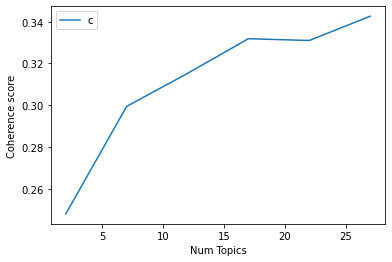

In [101]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_score5)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [102]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_score5):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 27

index: 0 | Num Topics = 2  has Coherence Value of 0.248
index: 1 | Num Topics = 7  has Coherence Value of 0.2995
index: 2 | Num Topics = 12  has Coherence Value of 0.3153
index: 3 | Num Topics = 17  has Coherence Value of 0.3319
index: 4 | Num Topics = 22  has Coherence Value of 0.331
index: 5 | Num Topics = 27  has Coherence Value of 0.3426


In [103]:
# Select optimal number of topics
optimal_model_sg_score5 = model_list_sg_score5[5]

In [104]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_score5 = pyLDAvis.gensim_models.prepare(optimal_model_sg_score5, corpus_sg_score5, id2word_sg_score5)

In [105]:
print("pyLDAVis for SG topics for score=5:")
vis_sg_score5

pyLDAVis for SG topics for score=5:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.275922  0.075637       1        1  10.536181
16     0.067965 -0.109553       2        1   8.591628
3      0.030954  0.085668       3        1   7.061986
13    -0.043569 -0.156232       4        1   6.977265
11    -0.067880 -0.108483       5        1   6.620025
4      0.069167 -0.055059       6        1   6.227384
15    -0.004104  0.115801       7        1   6.224285
7     -0.041524 -0.064507       8        1   6.064425
5      0.023841  0.015177       9        1   5.881217
10     0.145264  0.061636      10        1   5.625955
12    -0.094524  0.021376      11        1   5.595127
0      0.002211 -0.092424      12        1   5.004138
6      0.040192  0.123560      13        1   4.387752
1     -0.022309  0.070740      14        1   4.332627
8      0.085713  0.062125      15        1   3.990818
14    -0.016743 -0.016090      16        1   3.685952
2      0.101267 -0.029373      17        1   3.193235, topic_info=        Term        Freq       Total Category  logprob  loglift
21    update  142.000000  142.000000  Default  30.0000  30.0000
0        app  141.000000  141.000000  Default  29.0000  29.0000
44     great   47.000000   47.000000  Default  28.0000  28.0000
86   account  101.000000  101.000000  Default  27.0000  27.0000
43     story   99.000000   99.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
317      way    1.621610   22.661915  Topic17  -4.8517   0.8069
162   people    1.909118   55.406167  Topic17  -4.6885   0.0761
31     video    1.621622   31.213567  Topic17  -4.8517   0.4867
18     still    1.790581   60.159132  Topic17  -4.7526  -0.0703
100     hope    1.621612   38.691000  Topic17  -4.8517   0.2719

[1106 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
324       1  0.034171  able
324       2  0.205026  able
324       3  0.068342  able
324       7  0.205026  able
324       8  0.068342  able
...     ...       ...   ...
619       3  0.393313  zoom
619       4  0.196657  zoom
619       6  0.196657  zoom
619      12  0.196657  zoom
493       4  0.588018   zzz

[1965 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 17, 4, 14, 12, 5, 16, 8, 6, 11, 13, 1, 7, 2, 9, 15, 3])

## LDA Topic Modelling (Rating = 1,2,3)

In [106]:
# By-rating Topic Modelling - rating = 1,2,3
# Convert to list - move to each section
review_sg_score1N2N3 = instagram_ios_sg_review_YearMonth_score1N2N3.review.values.tolist()
review_words_sg_score1N2N3 = list(sent_to_words(review_sg_score1N2N3))
print(review_words_sg_score1N2N3[:1])

[['keep', 'my', 'instagram', 'app', 'updated', 'and', 'yet', 'dont', 'get', 'to', 'enjoy', 'the', 'new', 'features', 'especially', 'when', 'the', 'superzoom', 'has', 'been', 'launched', 'also', 'dont', 'get', 'the', 'holiday', 'stickers', 'and', 'now', 'is', 'year', 'already']]


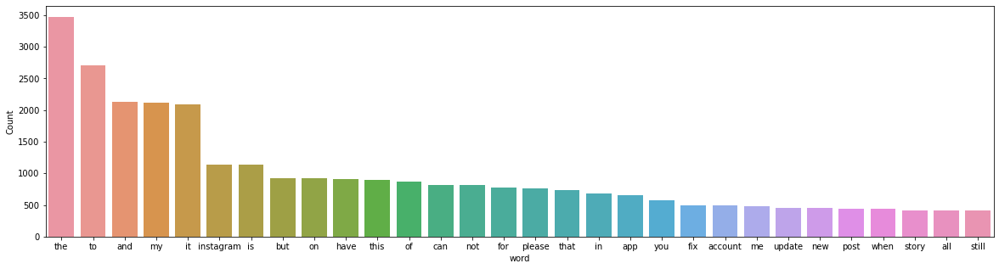

In [107]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_score1N2N3))

In [108]:
# Clean text
review_sg_ready_score1N2N3 = process_words(review_words_sg_score1N2N3)  # processed Text Data! - move to each section

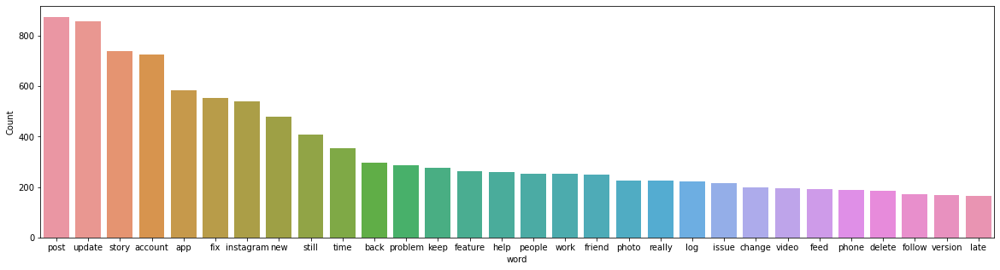

In [109]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_sg_ready_score1N2N3))


In [110]:
# Create Dictionary
id2word_sg_score1N2N3 = corpora.Dictionary(review_sg_ready_score1N2N3)

2021-10-16 03:02:34,361 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 03:02:34,539 [INFO] gensim.corpora.dictionary - built Dictionary(2604 unique tokens: ['already', 'enjoy', 'especially', 'feature', 'holiday']...) from 2632 documents (total 32173 corpus positions)
2021-10-16 03:02:34,544 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(2604 unique tokens: ['already', 'enjoy', 'especially', 'feature', 'holiday']...) from 2632 documents (total 32173 corpus positions)", 'datetime': '2021-10-16T03:02:34.544164', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [111]:
# Create Corpus: Term Document Frequency
corpus_sg_score1N2N3 = [id2word_sg_score1N2N3.doc2bow(text) for text in review_sg_ready_score1N2N3]

In [112]:
# Training LDA model
model_list_sg_score1N2N3, coherence_values_sg_score1N2N3 = compute_coherence_values(dictionary=id2word_sg_score1N2N3, corpus=corpus_sg_score1N2N3, 
                                                              texts=review_sg_ready_score1N2N3, limit=30, start=2, step=5)


2021-10-16 03:02:34,668 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 03:02:34,672 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 03:02:34,678 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 03:02:34,682 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 2632 documents, updating model once every 1000 documents, evaluating perplexity every 2632 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 03:02:34,684 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/2632
2021-10-16 03:02:37,501 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:02:37,504 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"update" + 0.027*"new" + 0.020*"fix" + 0.019*"still" + 0.019*"story" + 0.019*"instagram" + 0.019*"post" + 0.016*"feature" + 0.015*"app"

2021-10-16 03:02:55,128 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.051*"update" + 0.028*"new" + 0.021*"still" + 0.021*"story" + 0.019*"instagram" + 0.019*"fix" + 0.019*"app" + 0.015*"feature" + 0.012*"time" + 0.012*"post"
2021-10-16 03:02:55,130 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"post" + 0.030*"account" + 0.022*"story" + 0.015*"app" + 0.013*"photo" + 0.012*"instagram" + 0.012*"fix" + 0.011*"log" + 0.011*"back" + 0.009*"help"
2021-10-16 03:02:55,133 [INFO] gensim.models.ldamodel - topic diff=0.323046, rho=0.388309
2021-10-16 03:02:55,135 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #2000/2632
2021-10-16 03:02:56,655 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:02:56,668 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.048*"update" + 0.025*"new" + 0.021*"story" + 0.021*"still" + 0.020*"fix" + 0.020*"app" + 0.019*"instagram" + 0.013*"time" + 0.013*"feature" + 0.012*"post"

2021-10-16 03:03:10,125 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.051*"update" + 0.026*"new" + 0.023*"app" + 0.023*"still" + 0.022*"story" + 0.020*"fix" + 0.019*"instagram" + 0.014*"time" + 0.014*"feature" + 0.011*"problem"
2021-10-16 03:03:10,127 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"post" + 0.034*"account" + 0.021*"story" + 0.013*"fix" + 0.013*"instagram" + 0.012*"log" + 0.012*"app" + 0.012*"photo" + 0.011*"back" + 0.010*"people"
2021-10-16 03:03:10,128 [INFO] gensim.models.ldamodel - topic diff=0.249233, rho=0.322212
2021-10-16 03:03:11,263 [INFO] gensim.models.ldamodel - -6.543 per-word bound, 93.2 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:03:11,267 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #2632/2632
2021-10-16 03:03:12,023 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:03:12,026 [INFO] gensim.models.ldamodel - topic 

2021-10-16 03:03:24,131 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:03:24,134 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"update" + 0.027*"app" + 0.024*"new" + 0.023*"still" + 0.023*"story" + 0.020*"fix" + 0.018*"instagram" + 0.014*"time" + 0.014*"feature" + 0.013*"work"
2021-10-16 03:03:24,136 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.041*"post" + 0.031*"account" + 0.019*"story" + 0.013*"photo" + 0.013*"instagram" + 0.012*"fix" + 0.011*"back" + 0.010*"people" + 0.009*"log" + 0.009*"app"
2021-10-16 03:03:24,137 [INFO] gensim.models.ldamodel - topic diff=0.212062, rho=0.281361
2021-10-16 03:03:24,138 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/2632
2021-10-16 03:03:25,024 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:03:25,063 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"update" + 0.027*"new" + 

2021-10-16 03:03:36,339 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:03:36,353 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"update" + 0.028*"app" + 0.026*"new" + 0.025*"still" + 0.024*"story" + 0.021*"fix" + 0.019*"instagram" + 0.016*"feature" + 0.015*"time" + 0.013*"work"
2021-10-16 03:03:36,357 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.042*"post" + 0.031*"account" + 0.018*"story" + 0.013*"instagram" + 0.013*"photo" + 0.013*"back" + 0.011*"fix" + 0.011*"people" + 0.011*"log" + 0.008*"change"
2021-10-16 03:03:36,360 [INFO] gensim.models.ldamodel - topic diff=0.177846, rho=0.245204
2021-10-16 03:03:36,382 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #2000/2632
2021-10-16 03:03:37,444 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:03:37,449 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"update" + 0.029*"app

2021-10-16 03:03:48,479 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:03:48,482 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"update" + 0.030*"app" + 0.026*"story" + 0.025*"still" + 0.022*"new" + 0.022*"fix" + 0.018*"instagram" + 0.016*"time" + 0.014*"work" + 0.014*"feature"
2021-10-16 03:03:48,484 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.043*"post" + 0.033*"account" + 0.017*"story" + 0.013*"instagram" + 0.013*"back" + 0.012*"photo" + 0.012*"people" + 0.012*"log" + 0.011*"fix" + 0.009*"friend"
2021-10-16 03:03:48,485 [INFO] gensim.models.ldamodel - topic diff=0.161172, rho=0.225693
2021-10-16 03:03:49,295 [INFO] gensim.models.ldamodel - -6.495 per-word bound, 90.2 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:03:49,297 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #2632/2632
2021-10-16 03:03:49,842 [INFO] gensim.models.ldamodel - merg

2021-10-16 03:04:00,482 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #2632/2632
2021-10-16 03:04:01,153 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:04:01,155 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"update" + 0.031*"app" + 0.027*"story" + 0.025*"still" + 0.022*"fix" + 0.021*"new" + 0.018*"instagram" + 0.015*"work" + 0.015*"time" + 0.014*"feature"
2021-10-16 03:04:01,156 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.043*"post" + 0.031*"account" + 0.016*"story" + 0.013*"photo" + 0.013*"instagram" + 0.012*"back" + 0.011*"people" + 0.010*"fix" + 0.010*"log" + 0.009*"change"
2021-10-16 03:04:01,158 [INFO] gensim.models.ldamodel - topic diff=0.148438, rho=0.210203
2021-10-16 03:04:01,160 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/2632
2021-10-16 03:04:02,199 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021

2021-10-16 03:04:12,175 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/2632
2021-10-16 03:04:13,140 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:04:13,142 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"update" + 0.031*"app" + 0.028*"story" + 0.025*"still" + 0.023*"fix" + 0.022*"new" + 0.018*"instagram" + 0.015*"feature" + 0.015*"time" + 0.015*"work"
2021-10-16 03:04:13,147 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.044*"post" + 0.030*"account" + 0.016*"story" + 0.014*"back" + 0.013*"instagram" + 0.013*"photo" + 0.012*"people" + 0.011*"log" + 0.010*"fix" + 0.010*"change"
2021-10-16 03:04:13,148 [INFO] gensim.models.ldamodel - topic diff=0.133197, rho=0.193775
2021-10-16 03:04:13,149 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #2000/2632
2021-10-16 03:04:14,145 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
202

2021-10-16 03:04:23,679 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2000/2632
2021-10-16 03:04:24,768 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:04:24,770 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"update" + 0.031*"app" + 0.029*"story" + 0.025*"still" + 0.023*"fix" + 0.020*"new" + 0.018*"instagram" + 0.015*"work" + 0.015*"time" + 0.014*"feature"
2021-10-16 03:04:24,773 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.044*"post" + 0.032*"account" + 0.015*"story" + 0.014*"back" + 0.013*"instagram" + 0.012*"photo" + 0.012*"people" + 0.011*"log" + 0.009*"fix" + 0.009*"change"
2021-10-16 03:04:24,774 [INFO] gensim.models.ldamodel - topic diff=0.126267, rho=0.183704
2021-10-16 03:04:25,489 [INFO] gensim.models.ldamodel - -6.480 per-word bound, 89.3 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:04:25,491 [INFO] gensim.models.ldamodel - PROG

2021-10-16 03:04:35,638 [INFO] gensim.models.ldamodel - -6.477 per-word bound, 89.1 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:04:35,641 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #2632/2632
2021-10-16 03:04:36,286 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:04:36,289 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"update" + 0.032*"app" + 0.029*"story" + 0.025*"still" + 0.023*"fix" + 0.019*"new" + 0.018*"instagram" + 0.016*"work" + 0.015*"time" + 0.013*"feature"
2021-10-16 03:04:36,291 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.044*"post" + 0.030*"account" + 0.014*"story" + 0.013*"back" + 0.013*"photo" + 0.013*"instagram" + 0.012*"people" + 0.010*"log" + 0.010*"change" + 0.009*"fix"
2021-10-16 03:04:36,292 [INFO] gensim.models.ldamodel - topic diff=0.120254, rho=0.175056
2021-10-16 03:04:36,293 [INFO] gensim.models.ldamodel - PROGR

2021-10-16 03:04:46,429 [INFO] gensim.models.ldamodel - topic diff=0.114376, rho=0.167525
2021-10-16 03:04:46,430 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/2632
2021-10-16 03:04:47,523 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:04:47,526 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"update" + 0.031*"app" + 0.029*"story" + 0.025*"still" + 0.024*"fix" + 0.020*"new" + 0.018*"instagram" + 0.015*"work" + 0.015*"time" + 0.014*"feature"
2021-10-16 03:04:47,533 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.045*"post" + 0.030*"account" + 0.014*"back" + 0.014*"story" + 0.013*"instagram" + 0.013*"photo" + 0.012*"people" + 0.011*"log" + 0.010*"change" + 0.009*"new"
2021-10-16 03:04:47,538 [INFO] gensim.models.ldamodel - topic diff=0.110303, rho=0.165223
2021-10-16 03:04:47,539 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #2000/2632
2021-10-16 03:04:48,339 [INFO] gensi

2021-10-16 03:04:57,598 [INFO] gensim.models.ldamodel - topic diff=0.105376, rho=0.158846
2021-10-16 03:04:57,602 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #2000/2632
2021-10-16 03:04:58,537 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:04:58,541 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"update" + 0.031*"app" + 0.030*"story" + 0.025*"still" + 0.024*"fix" + 0.019*"new" + 0.018*"instagram" + 0.016*"work" + 0.015*"time" + 0.013*"feature"
2021-10-16 03:04:58,545 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.045*"post" + 0.032*"account" + 0.014*"back" + 0.014*"story" + 0.013*"instagram" + 0.013*"people" + 0.012*"photo" + 0.011*"log" + 0.010*"change" + 0.009*"follow"
2021-10-16 03:04:58,565 [INFO] gensim.models.ldamodel - topic diff=0.106610, rho=0.158846
2021-10-16 03:04:59,375 [INFO] gensim.models.ldamodel - -6.472 per-word bound, 88.7 perplexity estimate based on a held-out corpus 

2021-10-16 03:05:08,808 [INFO] gensim.models.ldamodel - topic diff=0.102253, rho=0.153155
2021-10-16 03:05:09,664 [INFO] gensim.models.ldamodel - -6.469 per-word bound, 88.6 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:05:09,668 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #2632/2632
2021-10-16 03:05:10,257 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:05:10,273 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"update" + 0.031*"app" + 0.030*"story" + 0.024*"still" + 0.024*"fix" + 0.018*"new" + 0.018*"instagram" + 0.016*"work" + 0.015*"time" + 0.013*"feature"
2021-10-16 03:05:10,276 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.045*"post" + 0.030*"account" + 0.014*"back" + 0.013*"story" + 0.013*"photo" + 0.013*"instagram" + 0.012*"people" + 0.010*"log" + 0.010*"change" + 0.009*"new"
2021-10-16 03:05:10,277 [INFO] gensim.models.ldamodel - topic

2021-10-16 03:05:22,688 [INFO] gensim.models.ldamodel - topic diff=0.099157, rho=0.148035
2021-10-16 03:05:22,689 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1000/2632
2021-10-16 03:05:24,043 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:05:24,045 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"update" + 0.030*"app" + 0.030*"story" + 0.025*"still" + 0.025*"fix" + 0.019*"new" + 0.018*"instagram" + 0.015*"work" + 0.015*"time" + 0.014*"feature"
2021-10-16 03:05:24,046 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.046*"post" + 0.030*"account" + 0.015*"back" + 0.013*"instagram" + 0.013*"story" + 0.013*"photo" + 0.013*"people" + 0.011*"log" + 0.010*"change" + 0.010*"new"
2021-10-16 03:05:24,047 [INFO] gensim.models.ldamodel - topic diff=0.095839, rho=0.146439
2021-10-16 03:05:24,048 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #2000/2632
2021-10-16 03:05:25,291 [INFO] gensi

2021-10-16 03:05:34,826 [INFO] gensim.models.ldamodel - topic diff=0.092529, rho=0.141945
2021-10-16 03:05:34,828 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #2000/2632
2021-10-16 03:05:35,699 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:05:35,701 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"update" + 0.031*"story" + 0.031*"app" + 0.025*"fix" + 0.024*"still" + 0.018*"instagram" + 0.018*"new" + 0.015*"work" + 0.015*"time" + 0.013*"feature"
2021-10-16 03:05:35,703 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.046*"post" + 0.031*"account" + 0.014*"back" + 0.013*"instagram" + 0.013*"people" + 0.013*"photo" + 0.012*"story" + 0.011*"log" + 0.010*"change" + 0.009*"new"
2021-10-16 03:05:35,704 [INFO] gensim.models.ldamodel - topic diff=0.093885, rho=0.141945
2021-10-16 03:05:36,567 [INFO] gensim.models.ldamodel - -6.466 per-word bound, 88.4 perplexity estimate based on a held-out corpus of 

2021-10-16 03:05:45,944 [INFO] gensim.models.ldamodel - topic diff=0.090912, rho=0.137840
2021-10-16 03:05:46,868 [INFO] gensim.models.ldamodel - -6.464 per-word bound, 88.3 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:05:46,871 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2632/2632
2021-10-16 03:05:47,449 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:05:47,452 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"update" + 0.031*"story" + 0.030*"app" + 0.025*"fix" + 0.024*"still" + 0.018*"instagram" + 0.017*"new" + 0.015*"work" + 0.015*"time" + 0.012*"feature"
2021-10-16 03:05:47,454 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.046*"post" + 0.030*"account" + 0.014*"back" + 0.013*"photo" + 0.013*"instagram" + 0.013*"people" + 0.012*"story" + 0.010*"log" + 0.010*"change" + 0.010*"new"
2021-10-16 03:05:47,456 [INFO] gensim.models.ldamodel - topic

2021-10-16 03:06:00,195 [INFO] gensim.models.ldamodel - topic diff=0.409248, rho=0.464639
2021-10-16 03:06:00,197 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #2000/2632
2021-10-16 03:06:01,466 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:06:01,471 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.047*"update" + 0.028*"story" + 0.028*"account" + 0.028*"new" + 0.024*"post" + 0.022*"feature" + 0.020*"still" + 0.019*"instagram" + 0.018*"fix" + 0.017*"version"
2021-10-16 03:06:01,473 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.040*"update" + 0.028*"fix" + 0.027*"post" + 0.024*"still" + 0.020*"account" + 0.020*"app" + 0.019*"instagram" + 0.019*"problem" + 0.016*"story" + 0.014*"issue"
2021-10-16 03:06:01,477 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"story" + 0.022*"video" + 0.021*"post" + 0.021*"app" + 0.019*"back" + 0.016*"update" + 0.015*"instagram" + 0.014*"new" + 0.011*"time" + 

2021-10-16 03:06:09,076 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.043*"update" + 0.029*"post" + 0.028*"still" + 0.026*"fix" + 0.023*"app" + 0.019*"problem" + 0.017*"issue" + 0.017*"story" + 0.015*"instagram" + 0.015*"help"
2021-10-16 03:06:09,079 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.041*"account" + 0.039*"notification" + 0.028*"post" + 0.028*"message" + 0.013*"back" + 0.012*"people" + 0.012*"scroll" + 0.012*"reply" + 0.012*"activity" + 0.011*"receive"
2021-10-16 03:06:09,081 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"app" + 0.034*"account" + 0.028*"post" + 0.026*"keep" + 0.022*"fix" + 0.020*"log" + 0.019*"time" + 0.018*"photo" + 0.018*"instagram" + 0.017*"delete"
2021-10-16 03:06:09,083 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.049*"post" + 0.023*"block" + 0.023*"report" + 0.015*"really" + 0.015*"day" + 0.014*"follow" + 0.012*"people" + 0.012*"option" + 0.012*"action" + 0.012*"fix"
2021-10-16 03:06:09,085 [INFO] gensim.models.ldamodel - 

2021-10-16 03:06:15,693 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.038*"app" + 0.035*"account" + 0.030*"post" + 0.026*"keep" + 0.024*"fix" + 0.021*"time" + 0.019*"photo" + 0.019*"delete" + 0.019*"log" + 0.017*"work"
2021-10-16 03:06:15,695 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.053*"post" + 0.028*"block" + 0.027*"report" + 0.018*"follow" + 0.015*"people" + 0.015*"day" + 0.013*"action" + 0.013*"comment" + 0.012*"week" + 0.012*"like"
2021-10-16 03:06:15,697 [INFO] gensim.models.ldamodel - topic diff=0.171968, rho=0.361977
2021-10-16 03:06:15,698 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/2632
2021-10-16 03:06:16,718 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:06:16,727 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.038*"update" + 0.029*"post" + 0.027*"fix" + 0.026*"still" + 0.024*"app" + 0.020*"issue" + 0.020*"problem" + 0.018*"help" + 0.018*"story" + 0.016*"work"
2021

2021-10-16 03:06:22,406 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #2632/2632
2021-10-16 03:06:23,036 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:06:23,040 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"update" + 0.031*"post" + 0.025*"fix" + 0.025*"app" + 0.023*"still" + 0.021*"help" + 0.021*"problem" + 0.021*"story" + 0.021*"issue" + 0.019*"work"
2021-10-16 03:06:23,041 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.046*"story" + 0.033*"music" + 0.031*"update" + 0.028*"reel" + 0.024*"view" + 0.021*"instagram" + 0.014*"option" + 0.014*"fix" + 0.013*"list" + 0.013*"function"
2021-10-16 03:06:23,042 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.038*"app" + 0.036*"account" + 0.029*"post" + 0.027*"keep" + 0.026*"fix" + 0.021*"time" + 0.020*"log" + 0.019*"delete" + 0.019*"photo" + 0.018*"work"
2021-10-16 03:06:23,043 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"story" + 0.

2021-10-16 03:06:28,665 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.071*"update" + 0.038*"new" + 0.034*"story" + 0.030*"still" + 0.029*"feature" + 0.028*"account" + 0.022*"instagram" + 0.021*"version" + 0.019*"fix" + 0.018*"late"
2021-10-16 03:06:28,666 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.053*"story" + 0.032*"music" + 0.029*"update" + 0.026*"view" + 0.020*"instagram" + 0.019*"list" + 0.016*"reel" + 0.014*"fix" + 0.013*"option" + 0.012*"insta"
2021-10-16 03:06:28,667 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.036*"story" + 0.032*"post" + 0.031*"video" + 0.027*"back" + 0.019*"new" + 0.015*"update" + 0.014*"instagram" + 0.014*"change" + 0.011*"app" + 0.011*"remove"
2021-10-16 03:06:28,668 [INFO] gensim.models.ldamodel - topic diff=0.114743, rho=0.293206
2021-10-16 03:06:29,511 [INFO] gensim.models.ldamodel - -6.707 per-word bound, 104.5 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:06:29,512 [INFO] gensim.mod

2021-10-16 03:06:35,696 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.048*"notification" + 0.041*"account" + 0.033*"message" + 0.018*"post" + 0.016*"facebook" + 0.016*"activity" + 0.015*"reply" + 0.014*"hate" + 0.014*"receive" + 0.013*"people"
2021-10-16 03:06:35,697 [INFO] gensim.models.ldamodel - topic diff=0.115332, rho=0.270845
2021-10-16 03:06:35,699 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #2000/2632
2021-10-16 03:06:36,778 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:06:36,788 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.043*"account" + 0.038*"app" + 0.029*"fix" + 0.027*"keep" + 0.026*"post" + 0.026*"log" + 0.022*"time" + 0.019*"delete" + 0.018*"work" + 0.017*"problem"
2021-10-16 03:06:36,791 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.055*"story" + 0.032*"music" + 0.028*"update" + 0.027*"view" + 0.022*"list" + 0.020*"instagram" + 0.018*"reel" + 0.014*"fix" + 0.014*"opt

2021-10-16 03:06:43,179 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:06:43,182 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"notification" + 0.041*"account" + 0.034*"message" + 0.016*"activity" + 0.016*"facebook" + 0.016*"post" + 0.015*"reply" + 0.015*"receive" + 0.015*"hate" + 0.013*"people"
2021-10-16 03:06:43,184 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.061*"post" + 0.033*"follow" + 0.025*"block" + 0.021*"people" + 0.021*"report" + 0.018*"day" + 0.014*"feed" + 0.014*"really" + 0.013*"week" + 0.013*"action"
2021-10-16 03:06:43,185 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.034*"story" + 0.034*"post" + 0.031*"video" + 0.030*"back" + 0.023*"new" + 0.018*"update" + 0.016*"change" + 0.015*"instagram" + 0.013*"remove" + 0.012*"button"
2021-10-16 03:06:43,186 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.033*"update" + 0.032*"post" + 0.025*"issue" + 0.024*"fix" + 0.024*"problem" + 0.024

2021-10-16 03:06:49,443 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.035*"post" + 0.034*"story" + 0.031*"video" + 0.029*"back" + 0.022*"new" + 0.018*"update" + 0.016*"change" + 0.014*"instagram" + 0.014*"remove" + 0.014*"button"
2021-10-16 03:06:49,445 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.055*"story" + 0.035*"music" + 0.029*"reel" + 0.029*"update" + 0.027*"view" + 0.021*"instagram" + 0.019*"list" + 0.018*"option" + 0.014*"unable" + 0.013*"viewer"
2021-10-16 03:06:49,448 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.033*"post" + 0.032*"update" + 0.024*"app" + 0.024*"issue" + 0.024*"problem" + 0.023*"fix" + 0.023*"help" + 0.022*"story" + 0.020*"still" + 0.018*"work"
2021-10-16 03:06:49,450 [INFO] gensim.models.ldamodel - topic diff=0.091915, rho=0.245204
2021-10-16 03:06:49,451 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/2632
2021-10-16 03:06:50,677 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 263

2021-10-16 03:06:55,448 [INFO] gensim.models.ldamodel - topic diff=0.084054, rho=0.231670
2021-10-16 03:06:56,362 [INFO] gensim.models.ldamodel - -6.680 per-word bound, 102.5 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:06:56,363 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2632/2632
2021-10-16 03:06:57,098 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:06:57,103 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.078*"update" + 0.038*"new" + 0.034*"still" + 0.033*"story" + 0.029*"feature" + 0.028*"account" + 0.021*"instagram" + 0.020*"version" + 0.020*"late" + 0.018*"fix"
2021-10-16 03:06:57,104 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.056*"notification" + 0.042*"account" + 0.035*"message" + 0.018*"activity" + 0.016*"reply" + 0.016*"receive" + 0.015*"facebook" + 0.014*"hate" + 0.014*"setting" + 0.013*"post"
2021-10-16 03:06:57,107 [INFO] gensi

2021-10-16 03:07:02,972 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.076*"update" + 0.039*"new" + 0.035*"still" + 0.034*"story" + 0.030*"feature" + 0.029*"account" + 0.022*"instagram" + 0.020*"version" + 0.019*"fix" + 0.019*"late"
2021-10-16 03:07:02,975 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.061*"story" + 0.033*"music" + 0.028*"view" + 0.027*"update" + 0.024*"list" + 0.020*"instagram" + 0.019*"reel" + 0.016*"option" + 0.016*"friend" + 0.014*"fix"
2021-10-16 03:07:02,976 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.063*"post" + 0.039*"follow" + 0.030*"block" + 0.024*"people" + 0.021*"report" + 0.018*"day" + 0.015*"action" + 0.014*"comment" + 0.014*"week" + 0.014*"feed"
2021-10-16 03:07:02,979 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"notification" + 0.044*"account" + 0.035*"message" + 0.019*"receive" + 0.017*"facebook" + 0.015*"setting" + 0.015*"activity" + 0.015*"reply" + 0.014*"hate" + 0.014*"people"
2021-10-16 03:07:02,981 [INFO] gensim.mode

2021-10-16 03:07:08,916 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"post" + 0.030*"update" + 0.025*"issue" + 0.025*"problem" + 0.024*"app" + 0.024*"fix" + 0.023*"help" + 0.023*"story" + 0.019*"still" + 0.017*"work"
2021-10-16 03:07:08,920 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"account" + 0.038*"app" + 0.031*"fix" + 0.027*"keep" + 0.026*"post" + 0.025*"log" + 0.021*"work" + 0.020*"time" + 0.019*"delete" + 0.016*"photo"
2021-10-16 03:07:08,924 [INFO] gensim.models.ldamodel - topic diff=0.087511, rho=0.210203
2021-10-16 03:07:08,926 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #2000/2632
2021-10-16 03:07:10,167 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:07:10,173 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"post" + 0.033*"back" + 0.031*"story" + 0.031*"video" + 0.023*"new" + 0.018*"update" + 0.017*"change" + 0.015*"instagram" + 0.013*"bring" + 0.013*"remove"
2

2021-10-16 03:07:15,510 [INFO] gensim.models.ldamodel - topic diff=0.073321, rho=0.205707
2021-10-16 03:07:15,513 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #1000/2632
2021-10-16 03:07:16,511 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:07:16,520 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.061*"story" + 0.033*"music" + 0.029*"view" + 0.027*"update" + 0.024*"reel" + 0.022*"list" + 0.020*"instagram" + 0.016*"option" + 0.015*"friend" + 0.015*"viewer"
2021-10-16 03:07:16,524 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.079*"update" + 0.040*"new" + 0.037*"still" + 0.034*"story" + 0.032*"feature" + 0.028*"account" + 0.022*"instagram" + 0.020*"version" + 0.020*"late" + 0.019*"fix"
2021-10-16 03:07:16,527 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"account" + 0.038*"app" + 0.032*"fix" + 0.027*"keep" + 0.026*"post" + 0.025*"log" + 0.021*"work" + 0.020*"time" + 0.019*"delete" + 0.0

2021-10-16 03:07:22,557 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.061*"story" + 0.035*"music" + 0.028*"view" + 0.028*"reel" + 0.027*"update" + 0.021*"list" + 0.020*"instagram" + 0.018*"option" + 0.017*"friend" + 0.013*"fix"
2021-10-16 03:07:22,558 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.035*"post" + 0.030*"update" + 0.025*"problem" + 0.025*"issue" + 0.024*"story" + 0.024*"app" + 0.024*"help" + 0.024*"fix" + 0.018*"still" + 0.016*"work"
2021-10-16 03:07:22,560 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.079*"update" + 0.039*"new" + 0.035*"still" + 0.034*"story" + 0.030*"feature" + 0.029*"account" + 0.021*"instagram" + 0.021*"version" + 0.020*"late" + 0.019*"app"
2021-10-16 03:07:22,561 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"post" + 0.032*"back" + 0.030*"video" + 0.029*"story" + 0.024*"new" + 0.018*"update" + 0.018*"change" + 0.015*"instagram" + 0.015*"remove" + 0.013*"button"
2021-10-16 03:07:22,562 [INFO] gensim.models.ldamodel - topic di

2021-10-16 03:07:28,061 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"post" + 0.029*"update" + 0.027*"problem" + 0.025*"issue" + 0.025*"story" + 0.025*"help" + 0.025*"fix" + 0.024*"app" + 0.019*"still" + 0.016*"work"
2021-10-16 03:07:28,063 [INFO] gensim.models.ldamodel - topic diff=0.066998, rho=0.190236
2021-10-16 03:07:28,873 [INFO] gensim.models.ldamodel - -6.665 per-word bound, 101.5 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:07:28,877 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #2632/2632
2021-10-16 03:07:29,487 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:07:29,493 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.057*"notification" + 0.042*"account" + 0.036*"message" + 0.018*"receive" + 0.018*"activity" + 0.016*"reply" + 0.016*"facebook" + 0.015*"hate" + 0.015*"setting" + 0.012*"people"
2021-10-16 03:07:29,495 [INFO] gensim.models

2021-10-16 03:07:35,322 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.063*"post" + 0.045*"follow" + 0.031*"block" + 0.027*"people" + 0.022*"report" + 0.019*"day" + 0.016*"comment" + 0.015*"action" + 0.015*"week" + 0.013*"account"
2021-10-16 03:07:35,323 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"post" + 0.029*"update" + 0.027*"problem" + 0.025*"story" + 0.025*"issue" + 0.025*"help" + 0.025*"fix" + 0.024*"app" + 0.018*"still" + 0.016*"work"
2021-10-16 03:07:35,325 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.040*"post" + 0.033*"back" + 0.030*"video" + 0.029*"story" + 0.024*"new" + 0.018*"change" + 0.018*"update" + 0.016*"instagram" + 0.013*"bring" + 0.013*"scroll"
2021-10-16 03:07:35,327 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.077*"update" + 0.039*"new" + 0.036*"still" + 0.035*"story" + 0.030*"feature" + 0.029*"account" + 0.022*"instagram" + 0.020*"version" + 0.020*"late" + 0.019*"fix"
2021-10-16 03:07:35,328 [INFO] gensim.models.ldamodel - topic #

2021-10-16 03:07:41,293 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.080*"update" + 0.040*"new" + 0.037*"still" + 0.034*"story" + 0.032*"feature" + 0.028*"account" + 0.022*"instagram" + 0.020*"version" + 0.020*"late" + 0.019*"fix"
2021-10-16 03:07:41,297 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.061*"post" + 0.045*"follow" + 0.028*"block" + 0.026*"people" + 0.023*"report" + 0.020*"day" + 0.015*"comment" + 0.015*"week" + 0.014*"action" + 0.013*"account"
2021-10-16 03:07:41,301 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"post" + 0.029*"update" + 0.027*"problem" + 0.025*"issue" + 0.024*"story" + 0.024*"fix" + 0.024*"help" + 0.024*"app" + 0.018*"still" + 0.016*"work"
2021-10-16 03:07:41,302 [INFO] gensim.models.ldamodel - topic diff=0.072230, rho=0.177802
2021-10-16 03:07:41,303 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #2000/2632
2021-10-16 03:07:42,569 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 26

2021-10-16 03:07:47,451 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.041*"post" + 0.032*"back" + 0.029*"video" + 0.028*"story" + 0.024*"new" + 0.019*"change" + 0.019*"update" + 0.015*"instagram" + 0.014*"remove" + 0.013*"button"
2021-10-16 03:07:47,453 [INFO] gensim.models.ldamodel - topic diff=0.060364, rho=0.175056
2021-10-16 03:07:47,454 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1000/2632
2021-10-16 03:07:48,561 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:07:48,565 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"post" + 0.029*"update" + 0.028*"problem" + 0.025*"issue" + 0.024*"story" + 0.024*"fix" + 0.024*"help" + 0.023*"app" + 0.018*"still" + 0.015*"work"
2021-10-16 03:07:48,566 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.080*"update" + 0.040*"new" + 0.037*"still" + 0.034*"story" + 0.032*"feature" + 0.028*"account" + 0.022*"instagram" + 0.020*"version" + 0.020*"late" +

2021-10-16 03:07:54,742 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"post" + 0.032*"back" + 0.029*"video" + 0.028*"story" + 0.025*"new" + 0.020*"change" + 0.019*"update" + 0.015*"instagram" + 0.014*"remove" + 0.013*"button"
2021-10-16 03:07:54,743 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"post" + 0.029*"update" + 0.027*"problem" + 0.025*"story" + 0.024*"issue" + 0.024*"help" + 0.024*"fix" + 0.023*"app" + 0.018*"still" + 0.016*"work"
2021-10-16 03:07:54,745 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.060*"post" + 0.045*"follow" + 0.029*"block" + 0.026*"people" + 0.024*"report" + 0.019*"day" + 0.016*"comment" + 0.015*"week" + 0.014*"action" + 0.014*"account"
2021-10-16 03:07:54,746 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.079*"update" + 0.039*"new" + 0.036*"still" + 0.034*"story" + 0.030*"feature" + 0.029*"account" + 0.021*"instagram" + 0.021*"version" + 0.020*"late" + 0.019*"app"
2021-10-16 03:07:54,747 [INFO] gensim.models.ldamodel - topic 

2021-10-16 03:08:01,069 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.065*"story" + 0.033*"music" + 0.030*"view" + 0.026*"update" + 0.024*"list" + 0.021*"friend" + 0.020*"reel" + 0.020*"instagram" + 0.017*"option" + 0.014*"fix"
2021-10-16 03:08:01,071 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.059*"post" + 0.048*"follow" + 0.031*"block" + 0.027*"people" + 0.023*"report" + 0.019*"day" + 0.016*"comment" + 0.015*"action" + 0.015*"week" + 0.014*"account"
2021-10-16 03:08:01,073 [INFO] gensim.models.ldamodel - topic diff=0.056643, rho=0.165223
2021-10-16 03:08:01,993 [INFO] gensim.models.ldamodel - -6.656 per-word bound, 100.8 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:08:01,996 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #2632/2632
2021-10-16 03:08:02,560 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:08:02,564 [INFO] gensim.models.ldamodel -

2021-10-16 03:08:07,461 [INFO] gensim.models.ldamodel - topic diff=0.064293, rho=0.160889
2021-10-16 03:08:07,463 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #2000/2632
2021-10-16 03:08:08,674 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:08:08,679 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.066*"story" + 0.033*"music" + 0.030*"view" + 0.026*"update" + 0.024*"list" + 0.021*"friend" + 0.020*"reel" + 0.020*"instagram" + 0.017*"option" + 0.014*"fix"
2021-10-16 03:08:08,680 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.053*"notification" + 0.043*"account" + 0.037*"message" + 0.021*"receive" + 0.017*"facebook" + 0.016*"setting" + 0.016*"activity" + 0.015*"reply" + 0.015*"hate" + 0.013*"people"
2021-10-16 03:08:08,683 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"post" + 0.028*"problem" + 0.028*"update" + 0.026*"story" + 0.025*"fix" + 0.025*"issue" + 0.024*"help" + 0.023*"app" + 0.0

2021-10-16 03:08:15,816 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"post" + 0.033*"back" + 0.029*"video" + 0.028*"story" + 0.026*"new" + 0.020*"change" + 0.019*"update" + 0.016*"instagram" + 0.015*"scroll" + 0.014*"feed"
2021-10-16 03:08:15,817 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"account" + 0.039*"app" + 0.033*"fix" + 0.027*"keep" + 0.026*"post" + 0.025*"log" + 0.021*"work" + 0.020*"time" + 0.019*"delete" + 0.016*"problem"
2021-10-16 03:08:15,820 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.065*"story" + 0.033*"music" + 0.030*"view" + 0.026*"update" + 0.024*"reel" + 0.022*"list" + 0.020*"instagram" + 0.018*"friend" + 0.016*"option" + 0.015*"viewer"
2021-10-16 03:08:15,823 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.058*"post" + 0.048*"follow" + 0.029*"block" + 0.027*"people" + 0.023*"report" + 0.020*"day" + 0.015*"comment" + 0.015*"week" + 0.014*"action" + 0.014*"account"
2021-10-16 03:08:15,824 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 03:08:22,486 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.058*"post" + 0.047*"follow" + 0.030*"block" + 0.026*"people" + 0.025*"report" + 0.019*"day" + 0.016*"comment" + 0.015*"week" + 0.014*"action" + 0.014*"account"
2021-10-16 03:08:22,489 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.038*"post" + 0.028*"update" + 0.028*"problem" + 0.026*"story" + 0.024*"fix" + 0.024*"issue" + 0.024*"help" + 0.022*"app" + 0.018*"still" + 0.014*"work"
2021-10-16 03:08:22,491 [INFO] gensim.models.ldamodel - topic diff=0.052094, rho=0.154984
2021-10-16 03:08:22,495 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/2632
2021-10-16 03:08:23,557 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:08:23,561 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"post" + 0.028*"problem" + 0.027*"update" + 0.025*"story" + 0.025*"issue" + 0.025*"fix" + 0.024*"help" + 0.022*"app" + 0.018*"still" + 0.014*"wor

2021-10-16 03:08:29,321 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #2632/2632
2021-10-16 03:08:29,931 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:08:29,936 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"account" + 0.040*"app" + 0.033*"fix" + 0.027*"keep" + 0.026*"post" + 0.024*"log" + 0.022*"work" + 0.020*"time" + 0.019*"delete" + 0.017*"photo"
2021-10-16 03:08:29,937 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.081*"update" + 0.039*"new" + 0.036*"still" + 0.032*"story" + 0.030*"feature" + 0.029*"account" + 0.022*"instagram" + 0.021*"version" + 0.021*"late" + 0.020*"app"
2021-10-16 03:08:29,938 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.057*"notification" + 0.042*"account" + 0.037*"message" + 0.019*"receive" + 0.018*"activity" + 0.017*"facebook" + 0.016*"reply" + 0.016*"hate" + 0.016*"setting" + 0.012*"people"
2021-10-16 03:08:29,939 [INFO] gensim.models.ldamodel - topic #3

2021-10-16 03:08:36,561 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.057*"post" + 0.049*"follow" + 0.032*"block" + 0.028*"people" + 0.023*"report" + 0.019*"day" + 0.016*"comment" + 0.016*"action" + 0.015*"week" + 0.015*"account"
2021-10-16 03:08:36,563 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.054*"notification" + 0.043*"account" + 0.037*"message" + 0.021*"receive" + 0.018*"facebook" + 0.016*"setting" + 0.016*"activity" + 0.015*"reply" + 0.015*"hate" + 0.013*"people"
2021-10-16 03:08:36,565 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.068*"story" + 0.033*"music" + 0.030*"view" + 0.026*"update" + 0.024*"list" + 0.021*"friend" + 0.021*"reel" + 0.019*"instagram" + 0.016*"option" + 0.014*"fix"
2021-10-16 03:08:36,566 [INFO] gensim.models.ldamodel - topic diff=0.050028, rho=0.148035
2021-10-16 03:08:37,319 [INFO] gensim.models.ldamodel - -6.651 per-word bound, 100.5 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:08:37,32

2021-10-16 03:08:43,083 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.054*"notification" + 0.041*"account" + 0.037*"message" + 0.019*"receive" + 0.017*"activity" + 0.017*"facebook" + 0.017*"hate" + 0.016*"reply" + 0.015*"setting" + 0.012*"people"
2021-10-16 03:08:43,085 [INFO] gensim.models.ldamodel - topic diff=0.057087, rho=0.144894
2021-10-16 03:08:43,087 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #2000/2632
2021-10-16 03:08:44,093 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:08:44,097 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.044*"account" + 0.040*"app" + 0.033*"fix" + 0.027*"keep" + 0.026*"log" + 0.025*"post" + 0.021*"work" + 0.020*"time" + 0.019*"delete" + 0.017*"problem"
2021-10-16 03:08:44,099 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"post" + 0.029*"problem" + 0.027*"story" + 0.027*"update" + 0.026*"fix" + 0.024*"issue" + 0.024*"help" + 0.021*"app" + 0.018*"sti

2021-10-16 03:08:50,212 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:08:50,216 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.038*"post" + 0.029*"problem" + 0.027*"update" + 0.026*"story" + 0.025*"fix" + 0.025*"issue" + 0.023*"help" + 0.021*"app" + 0.018*"still" + 0.014*"filter"
2021-10-16 03:08:50,219 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.046*"post" + 0.033*"back" + 0.029*"video" + 0.028*"story" + 0.026*"new" + 0.020*"change" + 0.019*"update" + 0.016*"instagram" + 0.016*"scroll" + 0.015*"feed"
2021-10-16 03:08:50,221 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.067*"story" + 0.033*"music" + 0.030*"view" + 0.026*"update" + 0.024*"reel" + 0.022*"list" + 0.019*"instagram" + 0.019*"friend" + 0.016*"option" + 0.015*"viewer"
2021-10-16 03:08:50,227 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.081*"update" + 0.040*"new" + 0.037*"still" + 0.031*"feature" + 0.031*"story" + 0.029*"account" + 0.0

2021-10-16 03:08:56,224 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.039*"post" + 0.028*"problem" + 0.027*"story" + 0.027*"update" + 0.025*"fix" + 0.024*"issue" + 0.023*"help" + 0.021*"app" + 0.017*"still" + 0.014*"filter"
2021-10-16 03:08:56,228 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.055*"post" + 0.048*"follow" + 0.030*"block" + 0.027*"people" + 0.025*"report" + 0.019*"day" + 0.016*"comment" + 0.016*"week" + 0.015*"account" + 0.015*"action"
2021-10-16 03:08:56,231 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.067*"story" + 0.034*"music" + 0.030*"view" + 0.027*"reel" + 0.026*"update" + 0.021*"list" + 0.020*"friend" + 0.019*"instagram" + 0.017*"option" + 0.014*"insta"
2021-10-16 03:08:56,233 [INFO] gensim.models.ldamodel - topic diff=0.046613, rho=0.140536
2021-10-16 03:08:56,235 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/2632
2021-10-16 03:08:57,312 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 26

2021-10-16 03:09:01,771 [INFO] gensim.models.ldamodel - topic diff=0.046189, rho=0.137840
2021-10-16 03:09:02,512 [INFO] gensim.models.ldamodel - -6.648 per-word bound, 100.3 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:09:02,519 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2632/2632
2021-10-16 03:09:03,065 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:09:03,070 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"account" + 0.040*"app" + 0.033*"fix" + 0.027*"keep" + 0.027*"post" + 0.024*"log" + 0.022*"work" + 0.020*"time" + 0.019*"delete" + 0.017*"photo"
2021-10-16 03:09:03,072 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.039*"post" + 0.028*"problem" + 0.028*"story" + 0.027*"update" + 0.025*"fix" + 0.024*"issue" + 0.023*"help" + 0.021*"app" + 0.017*"still" + 0.014*"filter"
2021-10-16 03:09:03,075 [INFO] gensim.models.ldamodel - topic #0 (0.14

2021-10-16 03:09:15,348 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.032*"post" + 0.030*"photo" + 0.029*"app" + 0.027*"message" + 0.019*"error" + 0.019*"feed" + 0.018*"help" + 0.017*"change" + 0.017*"shop" + 0.015*"upload"
2021-10-16 03:09:15,349 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.079*"update" + 0.048*"still" + 0.035*"app" + 0.026*"fix" + 0.025*"instagram" + 0.024*"new" + 0.020*"work" + 0.018*"account" + 0.018*"late" + 0.015*"gif"
2021-10-16 03:09:15,351 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.068*"post" + 0.037*"account" + 0.017*"new" + 0.016*"instagram" + 0.015*"time" + 0.013*"report" + 0.013*"issue" + 0.011*"help" + 0.011*"update" + 0.011*"people"
2021-10-16 03:09:15,352 [INFO] gensim.models.ldamodel - topic diff=0.265623, rho=0.464639
2021-10-16 03:09:15,355 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #2000/2632
2021-10-16 03:09:16,693 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 docu

2021-10-16 03:09:22,694 [INFO] gensim.models.ldamodel - topic diff=0.252183, rho=0.421375
2021-10-16 03:09:22,697 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1000/2632
2021-10-16 03:09:23,859 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:09:23,864 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.042*"photo" + 0.040*"post" + 0.026*"message" + 0.022*"upload" + 0.021*"app" + 0.020*"feed" + 0.020*"shop" + 0.019*"always" + 0.019*"multiple" + 0.018*"refresh"
2021-10-16 03:09:23,866 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.083*"update" + 0.065*"new" + 0.050*"feature" + 0.031*"story" + 0.030*"version" + 0.027*"still" + 0.023*"account" + 0.022*"late" + 0.020*"font" + 0.016*"friend"
2021-10-16 03:09:23,870 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.093*"update" + 0.057*"still" + 0.045*"app" + 0.029*"fix" + 0.027*"instagram" + 0.025*"work" + 0.021*"late" + 0.019*"gif" + 0.018*"issue" + 0.

2021-10-16 03:09:30,989 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.050*"video" + 0.023*"story" + 0.022*"app" + 0.014*"save" + 0.013*"time" + 0.012*"sound" + 0.011*"record" + 0.011*"well" + 0.011*"watch" + 0.011*"fix"
2021-10-16 03:09:30,991 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.053*"account" + 0.048*"app" + 0.042*"keep" + 0.037*"log" + 0.030*"fix" + 0.030*"phone" + 0.028*"delete" + 0.024*"work" + 0.024*"time" + 0.023*"problem"
2021-10-16 03:09:30,993 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.092*"update" + 0.069*"new" + 0.048*"feature" + 0.030*"version" + 0.029*"story" + 0.026*"still" + 0.023*"account" + 0.022*"late" + 0.019*"friend" + 0.019*"font"
2021-10-16 03:09:30,995 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"remove" + 0.031*"view" + 0.029*"story" + 0.026*"back" + 0.026*"post" + 0.023*"viewer" + 0.023*"tab" + 0.021*"whole" + 0.021*"list" + 0.019*"scroll"
2021-10-16 03:09:30,996 [INFO] gensim.models.ldamodel - topic diff=0.183318, rho=

2021-10-16 03:09:36,712 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.089*"notification" + 0.086*"back" + 0.048*"bring" + 0.044*"message" + 0.034*"filter" + 0.028*"instagram" + 0.026*"old" + 0.023*"receive" + 0.020*"change" + 0.017*"put"
2021-10-16 03:09:36,714 [INFO] gensim.models.ldamodel - topic diff=0.119633, rho=0.322212
2021-10-16 03:09:37,689 [INFO] gensim.models.ldamodel - -7.059 per-word bound, 133.4 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:09:37,690 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #2632/2632
2021-10-16 03:09:38,348 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:09:38,354 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.064*"post" + 0.047*"account" + 0.018*"report" + 0.017*"instagram" + 0.016*"people" + 0.015*"time" + 0.013*"thing" + 0.013*"issue" + 0.013*"comment" + 0.012*"user"
2021-10-16 03:09:38,356 [INFO] gensim.model

2021-10-16 03:09:44,312 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.088*"back" + 0.087*"notification" + 0.049*"message" + 0.046*"bring" + 0.032*"filter" + 0.029*"instagram" + 0.027*"old" + 0.023*"receive" + 0.022*"change" + 0.019*"new"
2021-10-16 03:09:44,314 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.070*"post" + 0.048*"photo" + 0.036*"profile" + 0.030*"upload" + 0.025*"picture" + 0.023*"always" + 0.021*"edit" + 0.021*"feed" + 0.020*"page" + 0.019*"multiple"
2021-10-16 03:09:44,316 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.060*"video" + 0.021*"story" + 0.020*"app" + 0.015*"save" + 0.014*"play" + 0.013*"record" + 0.012*"time" + 0.012*"sound" + 0.011*"well" + 0.010*"hope"
2021-10-16 03:09:44,317 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.094*"update" + 0.075*"new" + 0.055*"feature" + 0.031*"story" + 0.029*"version" + 0.025*"font" + 0.025*"still" + 0.023*"friend" + 0.022*"late" + 0.021*"account"
2021-10-16 03:09:44,319 [INFO] gensim.models.ldamodel - 

2021-10-16 03:09:51,184 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.061*"video" + 0.020*"story" + 0.019*"app" + 0.015*"play" + 0.013*"sound" + 0.013*"save" + 0.013*"record" + 0.012*"time" + 0.010*"well" + 0.010*"watch"
2021-10-16 03:09:51,185 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.061*"music" + 0.043*"reel" + 0.043*"instagram" + 0.031*"add" + 0.025*"option" + 0.023*"available" + 0.020*"button" + 0.020*"find" + 0.019*"update" + 0.015*"access"
2021-10-16 03:09:51,187 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.083*"post" + 0.078*"story" + 0.042*"photo" + 0.035*"share" + 0.026*"tag" + 0.025*"friend" + 0.017*"instagram" + 0.015*"people" + 0.015*"video" + 0.013*"unable"
2021-10-16 03:09:51,188 [INFO] gensim.models.ldamodel - topic diff=0.094178, rho=0.270845
2021-10-16 03:09:51,189 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #2000/2632
2021-10-16 03:09:52,357 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 

2021-10-16 03:09:57,944 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.043*"fix" + 0.040*"like" + 0.037*"really" + 0.037*"follow" + 0.036*"follower" + 0.035*"block" + 0.035*"people" + 0.028*"bug" + 0.023*"guy" + 0.019*"week"
2021-10-16 03:09:57,946 [INFO] gensim.models.ldamodel - topic diff=0.092879, rho=0.261426
2021-10-16 03:09:57,949 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/2632
2021-10-16 03:09:59,199 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:09:59,205 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.044*"fix" + 0.040*"really" + 0.039*"follow" + 0.038*"follower" + 0.035*"like" + 0.035*"people" + 0.032*"block" + 0.028*"bug" + 0.022*"guy" + 0.018*"week"
2021-10-16 03:09:59,208 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.065*"account" + 0.052*"app" + 0.044*"log" + 0.043*"keep" + 0.031*"delete" + 0.030*"work" + 0.029*"fix" + 0.027*"phone" + 0.026*"time" + 0.025*"help"
2021

2021-10-16 03:10:05,195 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.067*"account" + 0.054*"app" + 0.041*"keep" + 0.041*"log" + 0.032*"delete" + 0.031*"work" + 0.029*"fix" + 0.028*"phone" + 0.026*"time" + 0.025*"help"
2021-10-16 03:10:05,197 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.080*"post" + 0.051*"photo" + 0.030*"profile" + 0.028*"upload" + 0.027*"picture" + 0.026*"always" + 0.022*"feed" + 0.021*"multiple" + 0.021*"edit" + 0.019*"shop"
2021-10-16 03:10:05,201 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.065*"music" + 0.054*"reel" + 0.045*"instagram" + 0.033*"add" + 0.029*"option" + 0.025*"button" + 0.024*"available" + 0.022*"find" + 0.017*"update" + 0.015*"access"
2021-10-16 03:10:05,205 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.107*"update" + 0.078*"new" + 0.056*"feature" + 0.030*"version" + 0.027*"story" + 0.026*"still" + 0.025*"late" + 0.025*"font" + 0.020*"friend" + 0.019*"instagram"
2021-10-16 03:10:05,208 [INFO] gensim.models.ldamodel - top

2021-10-16 03:10:10,989 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.085*"post" + 0.083*"story" + 0.041*"photo" + 0.040*"share" + 0.028*"friend" + 0.026*"tag" + 0.018*"instagram" + 0.016*"people" + 0.013*"anymore" + 0.012*"unable"
2021-10-16 03:10:10,990 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.142*"story" + 0.041*"highlight" + 0.041*"view" + 0.040*"fix" + 0.039*"account" + 0.028*"insta" + 0.022*"update" + 0.020*"add" + 0.016*"archive" + 0.015*"people"
2021-10-16 03:10:10,991 [INFO] gensim.models.ldamodel - topic diff=0.068404, rho=0.231670
2021-10-16 03:10:11,935 [INFO] gensim.models.ldamodel - -6.768 per-word bound, 109.0 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:10:11,937 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2632/2632
2021-10-16 03:10:12,563 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:10:12,568 [INFO] gensim.models.ldam

2021-10-16 03:10:17,224 [INFO] gensim.models.ldamodel - topic diff=0.067988, rho=0.220155
2021-10-16 03:10:17,224 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #2000/2632
2021-10-16 03:10:18,108 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:10:18,119 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.038*"post" + 0.037*"scroll" + 0.035*"ad" + 0.034*"remove" + 0.031*"view" + 0.028*"back" + 0.024*"list" + 0.023*"tap" + 0.020*"viewer" + 0.017*"story"
2021-10-16 03:10:18,122 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.065*"music" + 0.045*"instagram" + 0.037*"reel" + 0.036*"add" + 0.027*"option" + 0.024*"available" + 0.024*"find" + 0.021*"button" + 0.016*"access" + 0.014*"update"
2021-10-16 03:10:18,125 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.074*"account" + 0.053*"app" + 0.047*"log" + 0.041*"keep" + 0.031*"delete" + 0.030*"work" + 0.029*"fix" + 0.028*"phone" + 0.026*"problem" + 0.025*"t

2021-10-16 03:10:24,069 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.108*"update" + 0.084*"new" + 0.060*"feature" + 0.030*"version" + 0.029*"font" + 0.028*"still" + 0.027*"story" + 0.027*"late" + 0.022*"instagram" + 0.019*"friend"
2021-10-16 03:10:24,071 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.044*"follow" + 0.043*"fix" + 0.040*"really" + 0.039*"follower" + 0.038*"like" + 0.037*"people" + 0.033*"block" + 0.028*"bug" + 0.023*"guy" + 0.019*"week"
2021-10-16 03:10:24,073 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.144*"story" + 0.046*"highlight" + 0.041*"fix" + 0.039*"view" + 0.037*"account" + 0.029*"insta" + 0.023*"update" + 0.017*"add" + 0.016*"people" + 0.015*"archive"
2021-10-16 03:10:24,076 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.085*"post" + 0.053*"photo" + 0.031*"profile" + 0.030*"upload" + 0.029*"picture" + 0.024*"always" + 0.022*"feed" + 0.020*"edit" + 0.020*"multiple" + 0.017*"refresh"
2021-10-16 03:10:24,078 [INFO] gensim.models.ldamodel 

2021-10-16 03:10:29,764 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.071*"account" + 0.055*"app" + 0.042*"log" + 0.041*"keep" + 0.032*"work" + 0.032*"delete" + 0.028*"fix" + 0.027*"phone" + 0.026*"time" + 0.025*"help"
2021-10-16 03:10:29,768 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.044*"follow" + 0.042*"like" + 0.041*"fix" + 0.038*"really" + 0.037*"people" + 0.037*"follower" + 0.036*"block" + 0.027*"bug" + 0.023*"guy" + 0.020*"week"
2021-10-16 03:10:29,769 [INFO] gensim.models.ldamodel - topic diff=0.063835, rho=0.205707
2021-10-16 03:10:29,773 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #1000/2632
2021-10-16 03:10:30,669 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:10:30,682 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.084*"update" + 0.056*"still" + 0.043*"app" + 0.039*"fix" + 0.026*"work" + 0.025*"issue" + 0.023*"instagram" + 0.020*"load" + 0.018*"problem" + 0.016*"late"
20

2021-10-16 03:10:35,284 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #2632/2632
2021-10-16 03:10:35,784 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:10:35,793 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.071*"account" + 0.054*"app" + 0.042*"log" + 0.041*"keep" + 0.032*"delete" + 0.032*"work" + 0.028*"fix" + 0.027*"phone" + 0.027*"time" + 0.026*"help"
2021-10-16 03:10:35,795 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.111*"update" + 0.080*"new" + 0.056*"feature" + 0.030*"version" + 0.028*"still" + 0.027*"late" + 0.027*"font" + 0.026*"story" + 0.021*"instagram" + 0.020*"friend"
2021-10-16 03:10:35,797 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.069*"video" + 0.024*"shop" + 0.021*"story" + 0.017*"app" + 0.016*"save" + 0.015*"play" + 0.013*"sound" + 0.013*"record" + 0.011*"start" + 0.011*"time"
2021-10-16 03:10:35,800 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.040*"ad" + 0.0

2021-10-16 03:10:40,527 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.075*"account" + 0.053*"app" + 0.046*"log" + 0.041*"keep" + 0.031*"delete" + 0.030*"work" + 0.028*"fix" + 0.027*"phone" + 0.026*"problem" + 0.026*"time"
2021-10-16 03:10:40,534 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.061*"post" + 0.046*"account" + 0.017*"instagram" + 0.017*"people" + 0.016*"time" + 0.016*"report" + 0.014*"thing" + 0.014*"user" + 0.013*"follow" + 0.013*"comment"
2021-10-16 03:10:40,537 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.079*"update" + 0.055*"still" + 0.043*"app" + 0.039*"fix" + 0.027*"work" + 0.025*"issue" + 0.023*"instagram" + 0.021*"load" + 0.020*"problem" + 0.015*"reinstall"
2021-10-16 03:10:40,538 [INFO] gensim.models.ldamodel - topic diff=0.051708, rho=0.190236
2021-10-16 03:10:41,214 [INFO] gensim.models.ldamodel - -6.717 per-word bound, 105.2 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:10:41,216 [INFO] gensim.mo

2021-10-16 03:10:45,687 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.081*"post" + 0.080*"story" + 0.040*"photo" + 0.038*"share" + 0.028*"tag" + 0.027*"friend" + 0.017*"instagram" + 0.016*"people" + 0.013*"unable" + 0.012*"anymore"
2021-10-16 03:10:45,688 [INFO] gensim.models.ldamodel - topic diff=0.052896, rho=0.183704
2021-10-16 03:10:45,689 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2000/2632
2021-10-16 03:10:46,504 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:10:46,516 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.075*"account" + 0.053*"app" + 0.046*"log" + 0.041*"keep" + 0.031*"delete" + 0.031*"work" + 0.028*"fix" + 0.027*"phone" + 0.027*"problem" + 0.026*"time"
2021-10-16 03:10:46,521 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.042*"post" + 0.037*"scroll" + 0.037*"remove" + 0.036*"ad" + 0.030*"view" + 0.028*"back" + 0.023*"list" + 0.023*"tap" + 0.021*"viewer" + 0.017*"muc

2021-10-16 03:10:51,630 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.073*"video" + 0.023*"shop" + 0.021*"story" + 0.017*"app" + 0.015*"play" + 0.015*"save" + 0.013*"sound" + 0.013*"record" + 0.011*"time" + 0.011*"start"
2021-10-16 03:10:51,632 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.147*"story" + 0.045*"highlight" + 0.043*"fix" + 0.039*"view" + 0.036*"account" + 0.030*"insta" + 0.022*"update" + 0.017*"add" + 0.015*"people" + 0.015*"sometimes"
2021-10-16 03:10:51,634 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.060*"post" + 0.045*"account" + 0.017*"people" + 0.017*"instagram" + 0.016*"time" + 0.016*"report" + 0.014*"thing" + 0.014*"user" + 0.013*"follow" + 0.012*"comment"
2021-10-16 03:10:51,637 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.081*"update" + 0.055*"still" + 0.043*"app" + 0.039*"fix" + 0.027*"work" + 0.026*"issue" + 0.023*"instagram" + 0.020*"load" + 0.018*"problem" + 0.016*"reinstall"
2021-10-16 03:10:51,641 [INFO] gensim.models.ldamodel - t

2021-10-16 03:10:56,632 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.067*"music" + 0.053*"reel" + 0.046*"instagram" + 0.034*"add" + 0.031*"option" + 0.025*"available" + 0.024*"button" + 0.022*"find" + 0.015*"access" + 0.013*"app"
2021-10-16 03:10:56,634 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.059*"post" + 0.045*"account" + 0.017*"people" + 0.017*"report" + 0.016*"instagram" + 0.015*"time" + 0.014*"thing" + 0.014*"user" + 0.013*"follow" + 0.013*"comment"
2021-10-16 03:10:56,636 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.086*"post" + 0.054*"photo" + 0.036*"profile" + 0.029*"picture" + 0.029*"upload" + 0.025*"always" + 0.023*"feed" + 0.021*"edit" + 0.021*"multiple" + 0.018*"refresh"
2021-10-16 03:10:56,637 [INFO] gensim.models.ldamodel - topic diff=0.051544, rho=0.175056
2021-10-16 03:10:56,641 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1000/2632
2021-10-16 03:10:57,450 [INFO] gensim.models.ldamodel - merging changes from 1000 documents in

2021-10-16 03:11:01,222 [INFO] gensim.models.ldamodel - topic diff=0.044475, rho=0.169927
2021-10-16 03:11:01,932 [INFO] gensim.models.ldamodel - -6.700 per-word bound, 104.0 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:11:01,934 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #2632/2632
2021-10-16 03:11:02,454 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:11:02,458 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.041*"post" + 0.039*"ad" + 0.039*"remove" + 0.031*"scroll" + 0.027*"back" + 0.027*"view" + 0.022*"viewer" + 0.021*"list" + 0.020*"tab" + 0.020*"tap"
2021-10-16 03:11:02,460 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.059*"post" + 0.045*"account" + 0.017*"report" + 0.017*"people" + 0.016*"instagram" + 0.015*"time" + 0.014*"thing" + 0.014*"user" + 0.013*"follow" + 0.013*"comment"
2021-10-16 03:11:02,461 [INFO] gensim.models.ldamodel - topic

2021-10-16 03:11:07,470 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.150*"story" + 0.044*"fix" + 0.040*"view" + 0.040*"highlight" + 0.036*"account" + 0.030*"insta" + 0.021*"update" + 0.019*"add" + 0.016*"sometimes" + 0.015*"archive"
2021-10-16 03:11:07,472 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.085*"notification" + 0.085*"back" + 0.062*"message" + 0.042*"bring" + 0.034*"old" + 0.033*"instagram" + 0.033*"new" + 0.030*"filter" + 0.023*"change" + 0.019*"receive"
2021-10-16 03:11:07,473 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.060*"post" + 0.046*"account" + 0.017*"people" + 0.017*"instagram" + 0.016*"time" + 0.016*"report" + 0.014*"thing" + 0.014*"user" + 0.014*"follow" + 0.013*"comment"
2021-10-16 03:11:07,475 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.111*"update" + 0.080*"new" + 0.056*"feature" + 0.031*"version" + 0.029*"font" + 0.028*"still" + 0.028*"late" + 0.026*"story" + 0.023*"instagram" + 0.022*"friend"
2021-10-16 03:11:07,476 [INFO] gensim.

2021-10-16 03:11:12,991 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.151*"story" + 0.044*"fix" + 0.044*"highlight" + 0.039*"view" + 0.035*"account" + 0.031*"insta" + 0.021*"update" + 0.017*"add" + 0.015*"sometimes" + 0.015*"people"
2021-10-16 03:11:12,992 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.044*"post" + 0.039*"remove" + 0.037*"scroll" + 0.034*"ad" + 0.028*"back" + 0.028*"view" + 0.025*"tap" + 0.023*"viewer" + 0.022*"list" + 0.017*"whole"
2021-10-16 03:11:12,993 [INFO] gensim.models.ldamodel - topic diff=0.045162, rho=0.160889
2021-10-16 03:11:12,995 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #2000/2632
2021-10-16 03:11:13,771 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:11:13,777 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.086*"post" + 0.053*"photo" + 0.042*"profile" + 0.030*"upload" + 0.029*"picture" + 0.024*"feed" + 0.024*"always" + 0.022*"edit" + 0.018*"multiple" +

2021-10-16 03:11:18,173 [INFO] gensim.models.ldamodel - topic diff=0.045916, rho=0.158846
2021-10-16 03:11:18,177 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/2632
2021-10-16 03:11:18,956 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:11:18,962 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.049*"follow" + 0.042*"fix" + 0.040*"really" + 0.039*"like" + 0.038*"follower" + 0.037*"people" + 0.034*"block" + 0.028*"bug" + 0.023*"guy" + 0.020*"week"
2021-10-16 03:11:18,964 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.087*"post" + 0.054*"photo" + 0.037*"profile" + 0.031*"upload" + 0.030*"picture" + 0.024*"always" + 0.024*"feed" + 0.021*"edit" + 0.020*"multiple" + 0.017*"refresh"
2021-10-16 03:11:18,966 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.152*"story" + 0.045*"fix" + 0.043*"highlight" + 0.039*"view" + 0.035*"account" + 0.032*"insta" + 0.021*"update" + 0.017*"add" + 0.015*"sometim

2021-10-16 03:11:24,841 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.079*"update" + 0.052*"still" + 0.044*"app" + 0.039*"fix" + 0.029*"work" + 0.027*"issue" + 0.022*"instagram" + 0.022*"load" + 0.019*"problem" + 0.015*"reinstall"
2021-10-16 03:11:24,843 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.073*"account" + 0.054*"app" + 0.042*"log" + 0.041*"keep" + 0.031*"delete" + 0.031*"work" + 0.028*"fix" + 0.027*"time" + 0.027*"phone" + 0.026*"problem"
2021-10-16 03:11:24,844 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.153*"story" + 0.045*"fix" + 0.040*"view" + 0.037*"highlight" + 0.035*"account" + 0.030*"insta" + 0.021*"update" + 0.018*"add" + 0.016*"sometimes" + 0.015*"post"
2021-10-16 03:11:24,845 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.114*"update" + 0.081*"new" + 0.055*"feature" + 0.031*"version" + 0.029*"still" + 0.028*"late" + 0.027*"font" + 0.025*"story" + 0.022*"instagram" + 0.020*"friend"
2021-10-16 03:11:24,846 [INFO] gensim.models.ldamodel - topi

2021-10-16 03:11:29,603 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.076*"video" + 0.021*"shop" + 0.021*"story" + 0.018*"app" + 0.016*"save" + 0.016*"play" + 0.013*"record" + 0.012*"sound" + 0.011*"time" + 0.011*"start"
2021-10-16 03:11:29,611 [INFO] gensim.models.ldamodel - topic diff=0.039822, rho=0.151390
2021-10-16 03:11:30,232 [INFO] gensim.models.ldamodel - -6.694 per-word bound, 103.5 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:11:30,234 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #2632/2632
2021-10-16 03:11:30,691 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:11:30,715 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.073*"account" + 0.054*"app" + 0.042*"log" + 0.041*"keep" + 0.031*"delete" + 0.030*"work" + 0.028*"fix" + 0.027*"time" + 0.027*"phone" + 0.027*"problem"
2021-10-16 03:11:30,728 [INFO] gensim.models.ldamodel - topic #8 (0.08

2021-10-16 03:11:34,918 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.060*"post" + 0.046*"account" + 0.017*"people" + 0.017*"instagram" + 0.017*"time" + 0.016*"report" + 0.014*"thing" + 0.014*"follow" + 0.014*"user" + 0.013*"comment"
2021-10-16 03:11:34,922 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.082*"post" + 0.080*"story" + 0.041*"share" + 0.039*"photo" + 0.028*"friend" + 0.028*"tag" + 0.017*"instagram" + 0.017*"people" + 0.013*"anymore" + 0.013*"unable"
2021-10-16 03:11:34,927 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.077*"update" + 0.053*"still" + 0.043*"app" + 0.039*"fix" + 0.029*"work" + 0.027*"issue" + 0.023*"instagram" + 0.021*"load" + 0.019*"problem" + 0.015*"reinstall"
2021-10-16 03:11:34,929 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.076*"account" + 0.053*"app" + 0.046*"log" + 0.041*"keep" + 0.031*"delete" + 0.030*"work" + 0.028*"fix" + 0.027*"problem" + 0.027*"phone" + 0.026*"time"
2021-10-16 03:11:34,934 [INFO] gensim.models.ldamodel - 

2021-10-16 03:11:39,712 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.066*"music" + 0.047*"instagram" + 0.047*"reel" + 0.033*"add" + 0.029*"option" + 0.025*"available" + 0.022*"button" + 0.022*"find" + 0.016*"access" + 0.013*"feature"
2021-10-16 03:11:39,714 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.153*"story" + 0.046*"fix" + 0.043*"highlight" + 0.039*"view" + 0.035*"account" + 0.033*"insta" + 0.022*"update" + 0.018*"add" + 0.016*"sometimes" + 0.015*"people"
2021-10-16 03:11:39,716 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.087*"post" + 0.054*"photo" + 0.037*"profile" + 0.031*"upload" + 0.030*"picture" + 0.024*"feed" + 0.024*"always" + 0.022*"edit" + 0.020*"multiple" + 0.017*"refresh"
2021-10-16 03:11:39,717 [INFO] gensim.models.ldamodel - topic diff=0.040294, rho=0.144894
2021-10-16 03:11:39,720 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #2000/2632
2021-10-16 03:11:40,523 [INFO] gensim.models.ldamodel - merging changes from 1000 documents

2021-10-16 03:11:44,461 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.087*"post" + 0.055*"photo" + 0.037*"profile" + 0.029*"upload" + 0.029*"picture" + 0.025*"always" + 0.025*"feed" + 0.022*"edit" + 0.020*"multiple" + 0.018*"refresh"
2021-10-16 03:11:44,462 [INFO] gensim.models.ldamodel - topic diff=0.041313, rho=0.143397
2021-10-16 03:11:44,463 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/2632
2021-10-16 03:11:45,287 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:11:45,316 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.059*"post" + 0.045*"account" + 0.017*"people" + 0.017*"instagram" + 0.017*"time" + 0.016*"report" + 0.014*"thing" + 0.014*"user" + 0.013*"follow" + 0.012*"comment"
2021-10-16 03:11:45,317 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.079*"update" + 0.054*"still" + 0.044*"app" + 0.038*"fix" + 0.029*"work" + 0.027*"issue" + 0.023*"instagram" + 0.021*"load" + 0.018*"

2021-10-16 03:11:50,071 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:11:50,076 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.115*"update" + 0.081*"new" + 0.055*"feature" + 0.031*"version" + 0.028*"still" + 0.028*"late" + 0.027*"font" + 0.025*"story" + 0.022*"instagram" + 0.020*"friend"
2021-10-16 03:11:50,078 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.073*"account" + 0.054*"app" + 0.042*"log" + 0.041*"keep" + 0.031*"delete" + 0.030*"work" + 0.028*"fix" + 0.027*"time" + 0.027*"phone" + 0.027*"problem"
2021-10-16 03:11:50,080 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.045*"post" + 0.040*"remove" + 0.038*"ad" + 0.032*"scroll" + 0.027*"back" + 0.026*"view" + 0.022*"tap" + 0.022*"viewer" + 0.021*"list" + 0.020*"tab"
2021-10-16 03:11:50,082 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.154*"story" + 0.046*"fix" + 0.041*"view" + 0.037*"highlight" + 0.034*"account" + 0.032*"insta" + 0.022*"update" 

2021-10-16 03:11:54,895 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.078*"update" + 0.053*"still" + 0.043*"app" + 0.039*"fix" + 0.029*"work" + 0.027*"issue" + 0.023*"instagram" + 0.021*"load" + 0.019*"problem" + 0.015*"reinstall"
2021-10-16 03:11:54,898 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.067*"music" + 0.047*"instagram" + 0.042*"reel" + 0.036*"add" + 0.029*"option" + 0.026*"available" + 0.023*"find" + 0.022*"button" + 0.016*"access" + 0.013*"feature"
2021-10-16 03:11:54,904 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.155*"story" + 0.046*"fix" + 0.040*"view" + 0.039*"highlight" + 0.035*"account" + 0.034*"insta" + 0.021*"update" + 0.019*"add" + 0.017*"sometimes" + 0.015*"archive"
2021-10-16 03:11:54,907 [INFO] gensim.models.ldamodel - topic diff=0.035219, rho=0.137840
2021-10-16 03:11:55,823 [INFO] gensim.models.ldamodel - -6.691 per-word bound, 103.3 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:11:55,824 [IN

2021-10-16 03:12:08,993 [INFO] gensim.models.ldamodel - topic diff=0.222550, rho=0.577350
2021-10-16 03:12:08,994 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/2632
2021-10-16 03:12:10,301 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:12:10,310 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.037*"post" + 0.036*"photo" + 0.034*"app" + 0.028*"tag" + 0.023*"shop" + 0.021*"account" + 0.016*"help" + 0.016*"instagram" + 0.016*"upload" + 0.013*"message"
2021-10-16 03:12:10,312 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.060*"new" + 0.045*"update" + 0.033*"scroll" + 0.032*"old" + 0.032*"back" + 0.030*"change" + 0.026*"tap" + 0.024*"hate" + 0.021*"post" + 0.017*"timeline"
2021-10-16 03:12:10,314 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.048*"story" + 0.045*"post" + 0.030*"video" + 0.029*"play" + 0.025*"update" + 0.024*"stop" + 0.018*"instagram" + 0.016*"back" + 0.016*"put" + 0.015*"

2021-10-16 03:12:17,706 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.066*"filter" + 0.058*"message" + 0.042*"save" + 0.033*"face" + 0.026*"link" + 0.026*"device" + 0.025*"close" + 0.024*"loading" + 0.020*"bottom" + 0.019*"notification"
2021-10-16 03:12:17,707 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.069*"account" + 0.032*"follow" + 0.028*"people" + 0.025*"fix" + 0.018*"post" + 0.014*"show" + 0.013*"friend" + 0.013*"activity" + 0.012*"suggest" + 0.012*"notification"
2021-10-16 03:12:17,708 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.073*"update" + 0.069*"still" + 0.043*"app" + 0.031*"fix" + 0.028*"instagram" + 0.022*"issue" + 0.021*"problem" + 0.016*"reinstall" + 0.016*"restart" + 0.015*"bug"
2021-10-16 03:12:17,710 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.054*"post" + 0.053*"photo" + 0.044*"tag" + 0.039*"shop" + 0.027*"app" + 0.022*"profile" + 0.022*"upload" + 0.015*"share" + 0.015*"account" + 0.015*"instagram"
2021-10-16 03:12:17,711 [INFO] gensi

2021-10-16 03:12:23,996 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.057*"load" + 0.043*"update" + 0.037*"remove" + 0.023*"story" + 0.022*"instagram" + 0.020*"feature" + 0.019*"ever" + 0.018*"wifi" + 0.018*"datum" + 0.018*"recent"
2021-10-16 03:12:23,999 [INFO] gensim.models.ldamodel - topic diff=0.105065, rho=0.361977
2021-10-16 03:12:24,877 [INFO] gensim.models.ldamodel - -8.689 per-word bound, 412.7 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:12:24,880 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #2632/2632
2021-10-16 03:12:25,569 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:12:25,575 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.079*"page" + 0.077*"button" + 0.063*"post" + 0.049*"camera" + 0.041*"back" + 0.030*"bring" + 0.021*"last" + 0.021*"remove" + 0.017*"explore" + 0.017*"follower"
2021-10-16 03:12:25,576 [INFO] gensim.models.ldamode

2021-10-16 03:12:31,652 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:12:31,697 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.090*"new" + 0.074*"back" + 0.059*"update" + 0.057*"old" + 0.053*"scroll" + 0.051*"change" + 0.034*"post" + 0.032*"tap" + 0.022*"hate" + 0.021*"instagram"
2021-10-16 03:12:31,698 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.078*"still" + 0.063*"update" + 0.050*"app" + 0.035*"fix" + 0.029*"issue" + 0.023*"reinstall" + 0.022*"problem" + 0.020*"work" + 0.020*"setting" + 0.020*"phone"
2021-10-16 03:12:31,700 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.167*"story" + 0.093*"view" + 0.056*"list" + 0.054*"option" + 0.047*"friend" + 0.031*"share" + 0.028*"post" + 0.026*"viewer" + 0.025*"unable" + 0.025*"fix"
2021-10-16 03:12:31,702 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.105*"account" + 0.054*"follow" + 0.038*"people" + 0.017*"show" + 0.015*"fix" + 0.015*"screen" + 0.014

2021-10-16 03:12:39,093 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.055*"load" + 0.049*"update" + 0.044*"remove" + 0.025*"datum" + 0.024*"feature" + 0.023*"love" + 0.022*"recent" + 0.021*"wifi" + 0.019*"bad" + 0.018*"ever"
2021-10-16 03:12:39,097 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.129*"story" + 0.050*"highlight" + 0.036*"fix" + 0.033*"add" + 0.028*"account" + 0.027*"always" + 0.026*"post" + 0.025*"function" + 0.024*"help" + 0.021*"issue"
2021-10-16 03:12:39,100 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.098*"message" + 0.068*"filter" + 0.056*"save" + 0.051*"close" + 0.039*"face" + 0.035*"link" + 0.026*"facebook" + 0.023*"wish" + 0.022*"device" + 0.020*"loading"
2021-10-16 03:12:39,106 [INFO] gensim.models.ldamodel - topic diff=0.080799, rho=0.293206
2021-10-16 03:12:39,111 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #2000/2632
2021-10-16 03:12:40,057 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2

2021-10-16 03:12:45,096 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.054*"block" + 0.050*"picture" + 0.044*"post" + 0.039*"really" + 0.038*"people" + 0.031*"guy" + 0.030*"like" + 0.026*"comment" + 0.025*"change" + 0.024*"action"
2021-10-16 03:12:45,097 [INFO] gensim.models.ldamodel - topic diff=0.056000, rho=0.281361
2021-10-16 03:12:45,099 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/2632
2021-10-16 03:12:46,044 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:12:46,071 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.057*"post" + 0.033*"report" + 0.030*"time" + 0.020*"user" + 0.018*"multiple" + 0.018*"instagram" + 0.015*"issue" + 0.015*"reply" + 0.014*"people" + 0.012*"send"
2021-10-16 03:12:46,072 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.124*"update" + 0.067*"new" + 0.047*"feature" + 0.043*"still" + 0.041*"late" + 0.035*"version" + 0.032*"font" + 0.032*"instagram" + 0.023*"ac

2021-10-16 03:12:51,725 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:12:51,732 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.168*"music" + 0.062*"instagram" + 0.034*"almost" + 0.032*"function" + 0.025*"singapore" + 0.025*"give" + 0.023*"honestly" + 0.023*"region" + 0.020*"cause" + 0.020*"star"
2021-10-16 03:12:51,734 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.058*"account" + 0.053*"app" + 0.050*"keep" + 0.048*"log" + 0.044*"fix" + 0.040*"work" + 0.036*"problem" + 0.035*"delete" + 0.029*"phone" + 0.028*"help"
2021-10-16 03:12:51,736 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.056*"post" + 0.036*"report" + 0.029*"time" + 0.020*"multiple" + 0.019*"user" + 0.019*"instagram" + 0.015*"reply" + 0.015*"issue" + 0.013*"send" + 0.013*"people"
2021-10-16 03:12:51,740 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.168*"post" + 0.073*"feed" + 0.067*"ad" + 0.050*"stop" + 0.028*"order" + 0.026*"chronologi

2021-10-16 03:12:57,690 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.111*"video" + 0.038*"story" + 0.026*"happen" + 0.022*"time" + 0.020*"fix" + 0.019*"sound" + 0.019*"record" + 0.017*"start" + 0.016*"second" + 0.015*"app"
2021-10-16 03:12:57,694 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.096*"page" + 0.079*"button" + 0.052*"post" + 0.044*"camera" + 0.044*"back" + 0.044*"bring" + 0.028*"last" + 0.024*"explore" + 0.017*"remove" + 0.015*"number"
2021-10-16 03:12:57,696 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.164*"music" + 0.058*"instagram" + 0.030*"almost" + 0.030*"function" + 0.028*"give" + 0.025*"cause" + 0.024*"honestly" + 0.021*"region" + 0.021*"star" + 0.020*"horrible"
2021-10-16 03:12:57,697 [INFO] gensim.models.ldamodel - topic diff=0.045911, rho=0.245204
2021-10-16 03:12:58,553 [INFO] gensim.models.ldamodel - -8.610 per-word bound, 390.7 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:12:58,558 [INFO] gens

2021-10-16 03:13:03,830 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.111*"video" + 0.037*"story" + 0.026*"happen" + 0.022*"time" + 0.021*"fix" + 0.021*"sound" + 0.019*"record" + 0.016*"start" + 0.015*"second" + 0.015*"app"
2021-10-16 03:13:03,832 [INFO] gensim.models.ldamodel - topic diff=0.055596, rho=0.231670
2021-10-16 03:13:03,835 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/2632
2021-10-16 03:13:04,723 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:13:04,729 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.066*"load" + 0.049*"update" + 0.045*"remove" + 0.025*"feature" + 0.025*"love" + 0.025*"datum" + 0.024*"bad" + 0.023*"recent" + 0.023*"ever" + 0.023*"wifi"
2021-10-16 03:13:04,731 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.190*"story" + 0.092*"view" + 0.057*"option" + 0.053*"list" + 0.052*"friend" + 0.042*"post" + 0.039*"share" + 0.027*"unable" + 0.026*"viewer" + 0.024*"f

2021-10-16 03:13:10,601 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.112*"video" + 0.038*"story" + 0.026*"happen" + 0.022*"time" + 0.021*"fix" + 0.021*"sound" + 0.019*"record" + 0.016*"start" + 0.015*"second" + 0.014*"app"
2021-10-16 03:13:10,602 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.132*"story" + 0.048*"highlight" + 0.039*"post" + 0.037*"fix" + 0.033*"add" + 0.029*"account" + 0.027*"help" + 0.025*"always" + 0.023*"issue" + 0.022*"function"
2021-10-16 03:13:10,603 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.060*"account" + 0.052*"app" + 0.051*"log" + 0.050*"keep" + 0.045*"fix" + 0.041*"work" + 0.037*"problem" + 0.034*"delete" + 0.028*"phone" + 0.027*"help"
2021-10-16 03:13:10,605 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.158*"music" + 0.058*"instagram" + 0.042*"function" + 0.031*"almost" + 0.028*"give" + 0.023*"singapore" + 0.021*"honestly" + 0.021*"cause" + 0.021*"region" + 0.019*"horrible"
2021-10-16 03:13:10,606 [INFO] gensim.models.ldamodel -

2021-10-16 03:13:16,474 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.103*"button" + 0.091*"page" + 0.051*"camera" + 0.043*"back" + 0.040*"post" + 0.036*"bring" + 0.033*"last" + 0.020*"explore" + 0.018*"remove" + 0.014*"dms"
2021-10-16 03:13:16,476 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.181*"post" + 0.085*"feed" + 0.065*"ad" + 0.048*"stop" + 0.028*"order" + 0.027*"refresh" + 0.026*"chronological" + 0.024*"play" + 0.024*"annoying" + 0.019*"ridiculous"
2021-10-16 03:13:16,478 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.093*"photo" + 0.050*"post" + 0.050*"upload" + 0.049*"tag" + 0.044*"shop" + 0.031*"profile" + 0.019*"connection" + 0.017*"repost" + 0.015*"internet" + 0.015*"picture"
2021-10-16 03:13:16,480 [INFO] gensim.models.ldamodel - topic diff=0.038421, rho=0.215007
2021-10-16 03:13:16,484 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/2632
2021-10-16 03:13:17,494 [INFO] gensim.models.ldamodel - merging changes from 1000 documents in

2021-10-16 03:13:21,694 [INFO] gensim.models.ldamodel - topic diff=0.035870, rho=0.205707
2021-10-16 03:13:22,534 [INFO] gensim.models.ldamodel - -8.598 per-word bound, 387.5 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:13:22,536 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #2632/2632
2021-10-16 03:13:23,193 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:13:23,201 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.050*"post" + 0.036*"report" + 0.026*"time" + 0.022*"instagram" + 0.020*"user" + 0.018*"multiple" + 0.016*"send" + 0.015*"reply" + 0.014*"issue" + 0.013*"option"
2021-10-16 03:13:23,202 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.136*"update" + 0.067*"new" + 0.046*"still" + 0.044*"feature" + 0.042*"late" + 0.036*"version" + 0.030*"instagram" + 0.030*"font" + 0.022*"app" + 0.020*"account"
2021-10-16 03:13:23,204 [INFO] gensim.models.ldamod

2021-10-16 03:13:28,265 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.195*"story" + 0.090*"view" + 0.057*"option" + 0.052*"friend" + 0.051*"list" + 0.046*"post" + 0.039*"share" + 0.029*"unable" + 0.026*"viewer" + 0.022*"back"
2021-10-16 03:13:28,267 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.186*"post" + 0.094*"feed" + 0.056*"ad" + 0.043*"stop" + 0.031*"order" + 0.029*"chronological" + 0.028*"refresh" + 0.025*"play" + 0.024*"annoying" + 0.019*"show"
2021-10-16 03:13:28,269 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.064*"account" + 0.054*"log" + 0.051*"app" + 0.049*"keep" + 0.046*"fix" + 0.040*"work" + 0.037*"problem" + 0.035*"delete" + 0.028*"phone" + 0.026*"help"
2021-10-16 03:13:28,271 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.069*"load" + 0.050*"update" + 0.047*"remove" + 0.031*"datum" + 0.029*"bad" + 0.026*"love" + 0.026*"hard" + 0.025*"feature" + 0.025*"ever" + 0.024*"wifi"
2021-10-16 03:13:28,272 [INFO] gensim.models.ldamodel - topic diff=0.033

2021-10-16 03:13:33,977 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.078*"notification" + 0.053*"app" + 0.034*"instagram" + 0.030*"check" + 0.025*"io" + 0.022*"turn" + 0.022*"update" + 0.021*"post" + 0.019*"photo" + 0.015*"receive"
2021-10-16 03:13:33,981 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.093*"photo" + 0.054*"upload" + 0.051*"post" + 0.042*"tag" + 0.037*"shop" + 0.030*"profile" + 0.019*"connection" + 0.017*"picture" + 0.016*"internet" + 0.015*"quality"
2021-10-16 03:13:33,983 [INFO] gensim.models.ldamodel - topic diff=0.042748, rho=0.190236
2021-10-16 03:13:33,989 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #2000/2632
2021-10-16 03:13:34,915 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:13:34,923 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.125*"message" + 0.075*"close" + 0.074*"filter" + 0.056*"save" + 0.039*"find" + 0.038*"face" + 0.029*"link" + 0.028*"facebook" + 0

2021-10-16 03:13:41,456 [INFO] gensim.models.ldamodel - topic diff=0.033121, rho=0.186885
2021-10-16 03:13:41,457 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/2632
2021-10-16 03:13:42,205 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:13:42,219 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.133*"story" + 0.046*"highlight" + 0.041*"post" + 0.041*"fix" + 0.034*"add" + 0.029*"account" + 0.027*"help" + 0.024*"always" + 0.024*"issue" + 0.020*"problem"
2021-10-16 03:13:42,223 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.053*"post" + 0.049*"block" + 0.044*"picture" + 0.044*"really" + 0.042*"people" + 0.031*"guy" + 0.027*"comment" + 0.027*"time" + 0.024*"like" + 0.023*"change"
2021-10-16 03:13:42,226 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.094*"photo" + 0.053*"upload" + 0.051*"post" + 0.042*"tag" + 0.037*"shop" + 0.030*"profile" + 0.019*"connection" + 0.017*"picture" + 0.016*"inte

2021-10-16 03:13:47,778 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.061*"account" + 0.050*"app" + 0.050*"keep" + 0.049*"log" + 0.046*"fix" + 0.042*"work" + 0.037*"delete" + 0.036*"problem" + 0.028*"phone" + 0.026*"help"
2021-10-16 03:13:47,780 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.194*"story" + 0.087*"view" + 0.063*"option" + 0.051*"post" + 0.048*"friend" + 0.045*"list" + 0.040*"share" + 0.031*"unable" + 0.028*"viewer" + 0.022*"back"
2021-10-16 03:13:47,782 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.136*"update" + 0.070*"new" + 0.047*"still" + 0.044*"feature" + 0.041*"late" + 0.036*"version" + 0.030*"instagram" + 0.030*"font" + 0.023*"app" + 0.020*"account"
2021-10-16 03:13:47,785 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.074*"still" + 0.061*"app" + 0.056*"update" + 0.042*"fix" + 0.038*"issue" + 0.028*"work" + 0.027*"reinstall" + 0.023*"help" + 0.023*"problem" + 0.023*"phone"
2021-10-16 03:13:47,786 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 03:13:52,350 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.071*"load" + 0.050*"update" + 0.048*"remove" + 0.034*"bad" + 0.032*"datum" + 0.026*"love" + 0.026*"feature" + 0.026*"hard" + 0.025*"ever" + 0.024*"wifi"
2021-10-16 03:13:52,352 [INFO] gensim.models.ldamodel - topic diff=0.029953, rho=0.175056
2021-10-16 03:13:53,095 [INFO] gensim.models.ldamodel - -8.592 per-word bound, 385.8 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:13:53,096 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #2632/2632
2021-10-16 03:13:53,573 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:13:53,581 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.089*"new" + 0.088*"back" + 0.060*"update" + 0.055*"change" + 0.049*"old" + 0.043*"scroll" + 0.030*"post" + 0.028*"tap" + 0.024*"instagram" + 0.023*"hate"
2021-10-16 03:13:53,583 [INFO] gensim.models.ldamodel - topic #13

2021-10-16 03:13:57,956 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:13:57,965 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.132*"update" + 0.069*"new" + 0.048*"still" + 0.045*"feature" + 0.039*"late" + 0.036*"version" + 0.032*"font" + 0.032*"instagram" + 0.022*"app" + 0.019*"account"
2021-10-16 03:13:57,966 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.064*"account" + 0.054*"log" + 0.050*"keep" + 0.050*"app" + 0.046*"fix" + 0.040*"work" + 0.037*"problem" + 0.037*"delete" + 0.028*"phone" + 0.026*"help"
2021-10-16 03:13:57,969 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.079*"notification" + 0.052*"app" + 0.033*"instagram" + 0.031*"check" + 0.025*"io" + 0.023*"update" + 0.023*"turn" + 0.020*"receive" + 0.020*"photo" + 0.017*"post"
2021-10-16 03:13:57,973 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.125*"account" + 0.054*"follow" + 0.040*"people" + 0.025*"follower" + 0.020*"show" + 0.015*"numb

2021-10-16 03:14:02,972 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.076*"still" + 0.061*"app" + 0.055*"update" + 0.043*"fix" + 0.038*"issue" + 0.028*"reinstall" + 0.028*"work" + 0.023*"problem" + 0.023*"phone" + 0.023*"help"
2021-10-16 03:14:02,973 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.046*"post" + 0.035*"report" + 0.026*"time" + 0.022*"instagram" + 0.021*"user" + 0.016*"reply" + 0.016*"send" + 0.015*"issue" + 0.014*"multiple" + 0.013*"certain"
2021-10-16 03:14:02,975 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.132*"update" + 0.070*"new" + 0.049*"still" + 0.047*"feature" + 0.039*"late" + 0.035*"version" + 0.032*"instagram" + 0.031*"font" + 0.022*"app" + 0.021*"gif"
2021-10-16 03:14:02,976 [INFO] gensim.models.ldamodel - topic diff=0.036671, rho=0.165223
2021-10-16 03:14:02,978 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #2000/2632
2021-10-16 03:14:03,838 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 

2021-10-16 03:14:08,004 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.105*"photo" + 0.055*"post" + 0.050*"upload" + 0.046*"tag" + 0.042*"shop" + 0.030*"profile" + 0.019*"connection" + 0.016*"repost" + 0.016*"internet" + 0.016*"picture"
2021-10-16 03:14:08,006 [INFO] gensim.models.ldamodel - topic diff=0.029001, rho=0.163013
2021-10-16 03:14:08,008 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/2632
2021-10-16 03:14:08,869 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:14:08,877 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.055*"post" + 0.049*"block" + 0.043*"picture" + 0.043*"really" + 0.041*"people" + 0.033*"guy" + 0.028*"comment" + 0.027*"time" + 0.026*"like" + 0.024*"day"
2021-10-16 03:14:08,879 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.103*"photo" + 0.054*"post" + 0.052*"upload" + 0.041*"tag" + 0.036*"shop" + 0.030*"profile" + 0.019*"connection" + 0.016*"picture" + 0.016*

2021-10-16 03:14:14,206 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:14:14,213 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.137*"update" + 0.070*"new" + 0.048*"still" + 0.044*"feature" + 0.041*"late" + 0.037*"version" + 0.031*"instagram" + 0.030*"font" + 0.023*"app" + 0.019*"account"
2021-10-16 03:14:14,215 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.091*"back" + 0.089*"new" + 0.060*"update" + 0.054*"change" + 0.049*"old" + 0.043*"scroll" + 0.030*"post" + 0.028*"tap" + 0.025*"instagram" + 0.023*"hate"
2021-10-16 03:14:14,217 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.074*"load" + 0.053*"remove" + 0.051*"update" + 0.036*"bad" + 0.035*"datum" + 0.027*"feature" + 0.026*"hard" + 0.025*"wifi" + 0.025*"love" + 0.023*"ever"
2021-10-16 03:14:14,220 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.195*"story" + 0.088*"view" + 0.064*"option" + 0.053*"post" + 0.048*"friend" + 0.046*"list" + 0.040*"shar

2021-10-16 03:14:18,693 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.073*"load" + 0.050*"update" + 0.049*"remove" + 0.036*"bad" + 0.033*"datum" + 0.027*"feature" + 0.027*"love" + 0.026*"hard" + 0.025*"ever" + 0.024*"wifi"
2021-10-16 03:14:18,694 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.126*"video" + 0.046*"story" + 0.028*"happen" + 0.022*"time" + 0.021*"sound" + 0.020*"record" + 0.019*"fix" + 0.017*"start" + 0.017*"second" + 0.014*"super"
2021-10-16 03:14:18,697 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.064*"account" + 0.054*"log" + 0.051*"keep" + 0.050*"app" + 0.046*"fix" + 0.040*"work" + 0.037*"delete" + 0.037*"problem" + 0.028*"phone" + 0.026*"help"
2021-10-16 03:14:18,699 [INFO] gensim.models.ldamodel - topic diff=0.025545, rho=0.154984
2021-10-16 03:14:19,399 [INFO] gensim.models.ldamodel - -8.587 per-word bound, 384.6 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:14:19,401 [INFO] gensim.models.ldamodel - 

2021-10-16 03:14:23,357 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.069*"load" + 0.051*"update" + 0.050*"remove" + 0.036*"bad" + 0.035*"datum" + 0.028*"love" + 0.027*"feature" + 0.024*"hard" + 0.024*"wifi" + 0.024*"ever"
2021-10-16 03:14:23,358 [INFO] gensim.models.ldamodel - topic diff=0.033353, rho=0.151390
2021-10-16 03:14:23,359 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #2000/2632
2021-10-16 03:14:24,095 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:14:24,100 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.044*"post" + 0.035*"report" + 0.027*"time" + 0.023*"instagram" + 0.022*"user" + 0.017*"send" + 0.016*"reply" + 0.015*"issue" + 0.013*"people" + 0.012*"certain"
2021-10-16 03:14:24,102 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.124*"message" + 0.072*"filter" + 0.072*"close" + 0.054*"save" + 0.041*"find" + 0.037*"face" + 0.035*"icon" + 0.032*"facebook" + 0.028*"link" + 0.024

2021-10-16 03:14:28,668 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:14:28,676 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.091*"back" + 0.089*"new" + 0.059*"update" + 0.052*"change" + 0.049*"scroll" + 0.046*"old" + 0.032*"post" + 0.032*"tap" + 0.026*"instagram" + 0.025*"bring"
2021-10-16 03:14:28,679 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.127*"video" + 0.044*"story" + 0.027*"happen" + 0.022*"time" + 0.021*"sound" + 0.020*"record" + 0.019*"fix" + 0.016*"start" + 0.016*"second" + 0.016*"super"
2021-10-16 03:14:28,681 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.122*"account" + 0.049*"follow" + 0.040*"people" + 0.026*"follower" + 0.021*"show" + 0.015*"friend" + 0.015*"number" + 0.014*"activity" + 0.012*"switch" + 0.012*"always"
2021-10-16 03:14:28,684 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.106*"button" + 0.098*"page" + 0.052*"camera" + 0.039*"last" + 0.031*"back" + 0.026*"explore

2021-10-16 03:14:33,211 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.094*"back" + 0.088*"new" + 0.058*"update" + 0.054*"change" + 0.049*"old" + 0.043*"scroll" + 0.030*"post" + 0.028*"tap" + 0.026*"instagram" + 0.024*"bring"
2021-10-16 03:14:33,213 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.043*"post" + 0.037*"report" + 0.026*"time" + 0.022*"instagram" + 0.021*"user" + 0.017*"send" + 0.016*"reply" + 0.014*"issue" + 0.014*"certain" + 0.013*"keep"
2021-10-16 03:14:33,217 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.076*"still" + 0.061*"app" + 0.056*"update" + 0.040*"fix" + 0.037*"issue" + 0.028*"work" + 0.027*"multiple" + 0.027*"reinstall" + 0.024*"help" + 0.024*"time"
2021-10-16 03:14:33,219 [INFO] gensim.models.ldamodel - topic diff=0.025715, rho=0.146439
2021-10-16 03:14:33,221 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/2632
2021-10-16 03:14:34,004 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 

2021-10-16 03:14:37,324 [INFO] gensim.models.ldamodel - topic diff=0.023706, rho=0.143397
2021-10-16 03:14:38,020 [INFO] gensim.models.ldamodel - -8.584 per-word bound, 383.7 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:14:38,022 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #2632/2632
2021-10-16 03:14:38,582 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:14:38,592 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.154*"music" + 0.080*"function" + 0.063*"instagram" + 0.035*"give" + 0.031*"almost" + 0.026*"platform" + 0.023*"cause" + 0.022*"singapore" + 0.021*"honestly" + 0.020*"region"
2021-10-16 03:14:38,594 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.129*"video" + 0.047*"story" + 0.029*"happen" + 0.022*"sound" + 0.022*"time" + 0.020*"fix" + 0.020*"record" + 0.017*"start" + 0.016*"super" + 0.016*"second"
2021-10-16 03:14:38,597 [INFO] gensim.mode

2021-10-16 03:14:42,896 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.106*"page" + 0.101*"button" + 0.052*"camera" + 0.040*"last" + 0.029*"explore" + 0.028*"back" + 0.023*"bring" + 0.022*"post" + 0.017*"wait" + 0.016*"strong"
2021-10-16 03:14:42,902 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.113*"photo" + 0.057*"post" + 0.051*"upload" + 0.040*"tag" + 0.033*"profile" + 0.030*"shop" + 0.018*"connection" + 0.017*"repost" + 0.016*"picture" + 0.016*"app"
2021-10-16 03:14:42,907 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.079*"still" + 0.062*"app" + 0.055*"update" + 0.038*"fix" + 0.036*"issue" + 0.028*"reinstall" + 0.027*"work" + 0.027*"multiple" + 0.025*"time" + 0.024*"help"
2021-10-16 03:14:42,913 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.126*"video" + 0.046*"story" + 0.028*"happen" + 0.022*"time" + 0.021*"sound" + 0.020*"record" + 0.019*"fix" + 0.017*"start" + 0.016*"second" + 0.015*"super"
2021-10-16 03:14:42,917 [INFO] gensim.models.ldamodel - topic dif

2021-10-16 03:14:47,804 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.055*"post" + 0.049*"block" + 0.043*"really" + 0.043*"people" + 0.043*"picture" + 0.034*"guy" + 0.028*"comment" + 0.028*"like" + 0.027*"time" + 0.024*"day"
2021-10-16 03:14:47,806 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.126*"video" + 0.045*"story" + 0.027*"happen" + 0.022*"time" + 0.021*"sound" + 0.020*"fix" + 0.020*"record" + 0.016*"start" + 0.016*"super" + 0.016*"second"
2021-10-16 03:14:47,808 [INFO] gensim.models.ldamodel - topic diff=0.029909, rho=0.137840
2021-10-16 03:14:47,810 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2000/2632
2021-10-16 03:14:48,670 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:14:48,680 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.073*"load" + 0.051*"update" + 0.050*"remove" + 0.036*"bad" + 0.033*"datum" + 0.027*"feature" + 0.027*"love" + 0.026*"hard" + 0.026*"ever" + 0.024*"wif

2021-10-16 03:15:01,906 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #2632/2632
2021-10-16 03:15:02,769 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:15:02,776 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.081*"post" + 0.042*"account" + 0.020*"report" + 0.018*"time" + 0.014*"multiple" + 0.014*"user" + 0.014*"picture" + 0.012*"new" + 0.012*"share" + 0.012*"story"
2021-10-16 03:15:02,778 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.046*"notification" + 0.035*"filter" + 0.035*"app" + 0.033*"set" + 0.026*"suddenly" + 0.024*"open" + 0.022*"work" + 0.021*"igtv" + 0.020*"fix" + 0.020*"message"
2021-10-16 03:15:02,781 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.078*"tag" + 0.078*"story" + 0.039*"post" + 0.034*"text" + 0.024*"allow" + 0.023*"share" + 0.023*"photo" + 0.020*"people" + 0.018*"move" + 0.017*"update"
2021-10-16 03:15:02,784 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.052

2021-10-16 03:15:08,795 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.079*"filter" + 0.039*"open" + 0.033*"app" + 0.032*"notification" + 0.032*"suddenly" + 0.030*"fix" + 0.027*"turn" + 0.024*"set" + 0.022*"face" + 0.021*"find"
2021-10-16 03:15:08,799 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.081*"post" + 0.044*"account" + 0.022*"time" + 0.022*"report" + 0.018*"user" + 0.015*"instagram" + 0.014*"picture" + 0.013*"people" + 0.013*"issue" + 0.012*"share"
2021-10-16 03:15:08,800 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.084*"block" + 0.040*"change" + 0.038*"action" + 0.030*"really" + 0.029*"like" + 0.028*"fix" + 0.028*"week" + 0.027*"picture" + 0.025*"keep" + 0.022*"post"
2021-10-16 03:15:08,801 [INFO] gensim.models.ldamodel - topic diff=0.170202, rho=0.421375
2021-10-16 03:15:09,580 [INFO] gensim.models.ldamodel - -9.385 per-word bound, 668.4 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:15:09,582 [INFO] gensim.mode

2021-10-16 03:15:14,771 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.074*"message" + 0.057*"send" + 0.035*"dm" + 0.035*"icon" + 0.027*"install" + 0.026*"chat" + 0.022*"appear" + 0.022*"time" + 0.021*"open" + 0.021*"friend"
2021-10-16 03:15:14,774 [INFO] gensim.models.ldamodel - topic diff=0.146513, rho=0.361977
2021-10-16 03:15:14,777 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #2000/2632
2021-10-16 03:15:15,636 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:15:15,643 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.113*"video" + 0.083*"story" + 0.080*"post" + 0.032*"save" + 0.023*"play" + 0.021*"camera" + 0.021*"stop" + 0.019*"time" + 0.019*"record" + 0.017*"keep"
2021-10-16 03:15:15,644 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.125*"update" + 0.061*"still" + 0.053*"late" + 0.045*"version" + 0.044*"new" + 0.034*"instagram" + 0.030*"feature" + 0.026*"friend" + 0.025*"app" + 0.024*"

2021-10-16 03:15:21,095 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.054*"view" + 0.052*"profile" + 0.033*"screen" + 0.030*"story" + 0.020*"second" + 0.019*"black" + 0.019*"bottom" + 0.019*"people" + 0.017*"else" + 0.017*"page"
2021-10-16 03:15:21,097 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.172*"option" + 0.114*"font" + 0.045*"instastory" + 0.041*"give" + 0.040*"story" + 0.036*"hate" + 0.033*"nt" + 0.029*"zoom" + 0.027*"pls" + 0.026*"absolutely"
2021-10-16 03:15:21,099 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.090*"post" + 0.051*"feed" + 0.046*"follow" + 0.033*"follower" + 0.031*"friend" + 0.027*"people" + 0.024*"chronological" + 0.023*"order" + 0.022*"show" + 0.019*"back"
2021-10-16 03:15:21,102 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.115*"scroll" + 0.087*"tap" + 0.048*"way" + 0.044*"activity" + 0.036*"post" + 0.031*"back" + 0.025*"honestly" + 0.022*"team" + 0.022*"feed" + 0.020*"look"
2021-10-16 03:15:21,104 [INFO] gensim.models.ldamodel - 

2021-10-16 03:15:26,645 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.027*"app" + 0.026*"user" + 0.024*"instagram" + 0.023*"social" + 0.022*"feel" + 0.021*"become" + 0.021*"really" + 0.019*"medium" + 0.019*"back" + 0.018*"people"
2021-10-16 03:15:26,647 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.236*"account" + 0.064*"highlight" + 0.059*"story" + 0.050*"feature" + 0.042*"main" + 0.039*"function" + 0.036*"miss" + 0.031*"animate" + 0.026*"add" + 0.023*"work"
2021-10-16 03:15:26,650 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.160*"story" + 0.133*"post" + 0.069*"share" + 0.058*"tag" + 0.038*"allow" + 0.036*"text" + 0.031*"add" + 0.022*"people" + 0.021*"move" + 0.019*"repost"
2021-10-16 03:15:26,652 [INFO] gensim.models.ldamodel - topic diff=0.069818, rho=0.306685
2021-10-16 03:15:26,657 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #1000/2632
2021-10-16 03:15:27,433 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2

2021-10-16 03:15:31,087 [INFO] gensim.models.ldamodel - topic diff=0.060548, rho=0.281361
2021-10-16 03:15:31,732 [INFO] gensim.models.ldamodel - -9.238 per-word bound, 603.7 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:15:31,733 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #2632/2632
2021-10-16 03:15:32,247 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:15:32,259 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.215*"option" + 0.089*"font" + 0.049*"give" + 0.035*"hate" + 0.034*"absolutely" + 0.034*"story" + 0.034*"nt" + 0.029*"instastory" + 0.028*"pls" + 0.027*"zoom"
2021-10-16 03:15:32,261 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.081*"account" + 0.065*"log" + 0.054*"phone" + 0.052*"problem" + 0.043*"app" + 0.041*"delete" + 0.032*"help" + 0.031*"fix" + 0.026*"work" + 0.025*"keep"
2021-10-16 03:15:32,264 [INFO] gensim.models.ldamodel - topic #

2021-10-16 03:15:36,513 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.086*"filter" + 0.082*"open" + 0.051*"suddenly" + 0.049*"app" + 0.049*"turn" + 0.043*"find" + 0.034*"face" + 0.032*"notification" + 0.027*"set" + 0.025*"fix"
2021-10-16 03:15:36,515 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.066*"ad" + 0.057*"button" + 0.046*"shop" + 0.034*"search" + 0.030*"password" + 0.022*"support" + 0.021*"show" + 0.019*"change" + 0.019*"location" + 0.019*"person"
2021-10-16 03:15:36,516 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.148*"update" + 0.065*"still" + 0.063*"late" + 0.053*"version" + 0.049*"new" + 0.040*"instagram" + 0.031*"feature" + 0.029*"app" + 0.025*"friend" + 0.025*"story"
2021-10-16 03:15:36,518 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.086*"app" + 0.068*"load" + 0.067*"music" + 0.057*"crash" + 0.043*"work" + 0.037*"refresh" + 0.033*"instagram" + 0.033*"keep" + 0.032*"update" + 0.029*"available"
2021-10-16 03:15:36,520 [INFO] gensim.models.ldamode

2021-10-16 03:15:41,558 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.083*"open" + 0.074*"filter" + 0.053*"suddenly" + 0.049*"app" + 0.048*"turn" + 0.043*"find" + 0.035*"notification" + 0.031*"face" + 0.028*"set" + 0.022*"fix"
2021-10-16 03:15:41,562 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.076*"button" + 0.066*"ad" + 0.061*"shop" + 0.029*"search" + 0.026*"password" + 0.019*"show" + 0.019*"change" + 0.018*"remove" + 0.018*"support" + 0.017*"app"
2021-10-16 03:15:41,564 [INFO] gensim.models.ldamodel - topic diff=0.059888, rho=0.245204
2021-10-16 03:15:41,569 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #2000/2632
2021-10-16 03:15:42,343 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:15:42,350 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.056*"update" + 0.053*"still" + 0.039*"gif" + 0.033*"sticker" + 0.032*"fix" + 0.029*"problem" + 0.027*"month" + 0.026*"function" + 0.026*"app" + 0.

2021-10-16 03:15:46,259 [INFO] gensim.models.ldamodel - topic diff=0.045433, rho=0.238149
2021-10-16 03:15:46,261 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/2632
2021-10-16 03:15:46,954 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:15:46,962 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.113*"scroll" + 0.083*"tap" + 0.054*"activity" + 0.054*"way" + 0.042*"post" + 0.029*"honestly" + 0.025*"look" + 0.023*"feed" + 0.022*"team" + 0.022*"let"
2021-10-16 03:15:46,964 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.154*"update" + 0.066*"still" + 0.064*"late" + 0.053*"version" + 0.050*"new" + 0.042*"instagram" + 0.037*"feature" + 0.030*"app" + 0.023*"friend" + 0.023*"already"
2021-10-16 03:15:46,966 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.057*"post" + 0.036*"account" + 0.033*"report" + 0.028*"time" + 0.026*"comment" + 0.023*"instagram" + 0.021*"user" + 0.018*"issue" + 0.016*"day" 

2021-10-16 03:15:51,720 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.188*"photo" + 0.072*"post" + 0.057*"upload" + 0.039*"multiple" + 0.027*"picture" + 0.020*"delete" + 0.017*"quality" + 0.017*"image" + 0.015*"ban" + 0.015*"roll"
2021-10-16 03:15:51,721 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.108*"post" + 0.054*"feed" + 0.051*"follow" + 0.046*"friend" + 0.033*"follower" + 0.025*"show" + 0.024*"people" + 0.023*"instagram" + 0.020*"chronological" + 0.019*"back"
2021-10-16 03:15:51,722 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.192*"story" + 0.152*"post" + 0.063*"share" + 0.049*"tag" + 0.037*"add" + 0.036*"allow" + 0.029*"text" + 0.024*"unable" + 0.023*"people" + 0.018*"move"
2021-10-16 03:15:51,724 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.092*"open" + 0.080*"filter" + 0.056*"suddenly" + 0.054*"turn" + 0.052*"app" + 0.047*"find" + 0.043*"notification" + 0.033*"set" + 0.031*"face" + 0.019*"igtv"
2021-10-16 03:15:51,727 [INFO] gensim.models.ldamodel

2021-10-16 03:15:55,981 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.344*"account" + 0.072*"highlight" + 0.059*"feature" + 0.040*"main" + 0.039*"miss" + 0.032*"story" + 0.023*"function" + 0.021*"different" + 0.020*"private" + 0.018*"animate"
2021-10-16 03:15:55,982 [INFO] gensim.models.ldamodel - topic diff=0.040129, rho=0.215007
2021-10-16 03:15:56,656 [INFO] gensim.models.ldamodel - -9.207 per-word bound, 591.1 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:15:56,657 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #2632/2632
2021-10-16 03:15:57,119 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:15:57,132 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.037*"app" + 0.027*"instagram" + 0.026*"user" + 0.022*"become" + 0.022*"feel" + 0.022*"really" + 0.021*"social" + 0.018*"well" + 0.018*"medium" + 0.017*"sound"
2021-10-16 03:15:57,135 [INFO] gensim.mod

2021-10-16 03:16:02,551 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:16:02,568 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.073*"notification" + 0.048*"fix" + 0.040*"unable" + 0.033*"instagram" + 0.031*"wrong" + 0.027*"check" + 0.025*"error" + 0.023*"iphone" + 0.023*"update" + 0.023*"receive"
2021-10-16 03:16:02,572 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.076*"account" + 0.071*"log" + 0.059*"problem" + 0.054*"phone" + 0.043*"app" + 0.041*"delete" + 0.034*"help" + 0.031*"fix" + 0.028*"work" + 0.026*"still"
2021-10-16 03:16:02,576 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.067*"block" + 0.047*"keep" + 0.045*"picture" + 0.040*"edit" + 0.033*"post" + 0.032*"fix" + 0.032*"action" + 0.029*"like" + 0.028*"really" + 0.027*"follow"
2021-10-16 03:16:02,577 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.054*"update" + 0.051*"still" + 0.043*"gif" + 0.034*"sticker" + 0.031*"fix" + 0.029*"problem" 

2021-10-16 03:16:08,142 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.056*"post" + 0.034*"report" + 0.030*"account" + 0.028*"comment" + 0.028*"time" + 0.024*"instagram" + 0.022*"user" + 0.019*"issue" + 0.016*"day" + 0.015*"people"
2021-10-16 03:16:08,147 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.057*"block" + 0.047*"keep" + 0.047*"picture" + 0.039*"edit" + 0.033*"post" + 0.033*"fix" + 0.029*"action" + 0.028*"really" + 0.026*"time" + 0.026*"week"
2021-10-16 03:16:08,151 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.088*"remove" + 0.059*"story" + 0.059*"feature" + 0.040*"function" + 0.037*"viewer" + 0.036*"view" + 0.033*"back" + 0.032*"list" + 0.030*"update" + 0.027*"hour"
2021-10-16 03:16:08,153 [INFO] gensim.models.ldamodel - topic diff=0.042759, rho=0.197519
2021-10-16 03:16:08,160 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #2000/2632
2021-10-16 03:16:08,945 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 26

2021-10-16 03:16:13,512 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.350*"account" + 0.068*"highlight" + 0.064*"feature" + 0.041*"main" + 0.039*"miss" + 0.028*"animate" + 0.023*"story" + 0.022*"function" + 0.021*"private" + 0.020*"help"
2021-10-16 03:16:13,516 [INFO] gensim.models.ldamodel - topic diff=0.033408, rho=0.193775
2021-10-16 03:16:13,519 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/2632
2021-10-16 03:16:14,589 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:16:14,597 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.083*"app" + 0.073*"load" + 0.070*"music" + 0.059*"crash" + 0.055*"work" + 0.049*"refresh" + 0.037*"keep" + 0.034*"feed" + 0.032*"instagram" + 0.031*"update"
2021-10-16 03:16:14,598 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.073*"notification" + 0.048*"fix" + 0.043*"unable" + 0.035*"instagram" + 0.030*"wrong" + 0.028*"check" + 0.025*"update" + 0.023*"app" +

2021-10-16 03:16:20,232 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.129*"message" + 0.068*"send" + 0.053*"dm" + 0.051*"icon" + 0.038*"install" + 0.036*"click" + 0.033*"chat" + 0.029*"anymore" + 0.027*"appear" + 0.025*"launch"
2021-10-16 03:16:20,234 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.111*"post" + 0.054*"follow" + 0.053*"feed" + 0.049*"friend" + 0.033*"follower" + 0.027*"show" + 0.025*"people" + 0.024*"instagram" + 0.020*"chronological" + 0.019*"order"
2021-10-16 03:16:20,236 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.193*"photo" + 0.072*"post" + 0.058*"upload" + 0.039*"multiple" + 0.027*"picture" + 0.021*"delete" + 0.019*"image" + 0.018*"quality" + 0.016*"ban" + 0.015*"roll"
2021-10-16 03:16:20,237 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.098*"remove" + 0.057*"feature" + 0.056*"story" + 0.043*"function" + 0.035*"viewer" + 0.032*"back" + 0.031*"view" + 0.031*"list" + 0.029*"able" + 0.028*"update"
2021-10-16 03:16:20,239 [INFO] gensim.model

2021-10-16 03:16:25,274 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.091*"remove" + 0.058*"feature" + 0.058*"story" + 0.040*"function" + 0.035*"view" + 0.033*"list" + 0.033*"viewer" + 0.032*"back" + 0.029*"able" + 0.026*"hour"
2021-10-16 03:16:25,276 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.135*"fix" + 0.085*"bug" + 0.061*"happen" + 0.041*"setting" + 0.037*"issue" + 0.035*"asap" + 0.033*"insta" + 0.030*"work" + 0.029*"guy" + 0.029*"switch"
2021-10-16 03:16:25,277 [INFO] gensim.models.ldamodel - topic diff=0.031034, rho=0.180681
2021-10-16 03:16:26,085 [INFO] gensim.models.ldamodel - -9.201 per-word bound, 588.3 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:16:26,087 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #2632/2632
2021-10-16 03:16:26,525 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:16:26,532 [INFO] gensim.models.ldamodel - topic 

2021-10-16 03:16:30,160 [INFO] gensim.models.ldamodel - topic diff=0.036458, rho=0.175056
2021-10-16 03:16:30,165 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #2000/2632
2021-10-16 03:16:30,882 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:16:30,897 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.166*"update" + 0.065*"still" + 0.061*"late" + 0.052*"version" + 0.050*"new" + 0.042*"instagram" + 0.035*"feature" + 0.031*"app" + 0.027*"already" + 0.023*"story"
2021-10-16 03:16:30,900 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.217*"option" + 0.099*"font" + 0.053*"give" + 0.038*"nt" + 0.038*"instastory" + 0.031*"zoom" + 0.030*"pls" + 0.027*"hate" + 0.027*"absolutely" + 0.023*"ugly"
2021-10-16 03:16:30,903 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.138*"fix" + 0.084*"bug" + 0.061*"happen" + 0.041*"setting" + 0.037*"issue" + 0.036*"asap" + 0.033*"insta" + 0.032*"work" + 0.029*"guy" + 0.02

2021-10-16 03:16:35,727 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.077*"view" + 0.071*"profile" + 0.045*"screen" + 0.043*"put" + 0.023*"press" + 0.023*"black" + 0.023*"experience" + 0.021*"people" + 0.021*"whole" + 0.021*"bottom"
2021-10-16 03:16:35,729 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.075*"notification" + 0.048*"unable" + 0.047*"fix" + 0.036*"instagram" + 0.030*"wrong" + 0.028*"check" + 0.026*"update" + 0.024*"day" + 0.024*"iphone" + 0.023*"pop"
2021-10-16 03:16:35,730 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.114*"post" + 0.054*"feed" + 0.053*"follow" + 0.045*"friend" + 0.034*"follower" + 0.030*"show" + 0.025*"people" + 0.023*"instagram" + 0.023*"chronological" + 0.022*"order"
2021-10-16 03:16:35,733 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.053*"update" + 0.051*"still" + 0.047*"gif" + 0.038*"sticker" + 0.030*"poll" + 0.030*"function" + 0.029*"problem" + 0.029*"fix" + 0.028*"month" + 0.028*"question"
2021-10-16 03:16:35,734 [INFO] ge

2021-10-16 03:16:40,517 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.175*"update" + 0.065*"still" + 0.063*"late" + 0.052*"version" + 0.050*"new" + 0.041*"instagram" + 0.034*"app" + 0.033*"feature" + 0.027*"already" + 0.022*"story"
2021-10-16 03:16:40,519 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.070*"account" + 0.064*"log" + 0.056*"problem" + 0.054*"phone" + 0.047*"delete" + 0.046*"app" + 0.035*"help" + 0.030*"fix" + 0.030*"work" + 0.029*"still"
2021-10-16 03:16:40,520 [INFO] gensim.models.ldamodel - topic diff=0.027642, rho=0.167525
2021-10-16 03:16:40,523 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/2632
2021-10-16 03:16:41,274 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:16:41,284 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.055*"block" + 0.050*"keep" + 0.048*"picture" + 0.038*"edit" + 0.037*"post" + 0.035*"fix" + 0.029*"week" + 0.027*"action" + 0.027*"disappear" + 0.

2021-10-16 03:16:46,109 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #2632/2632
2021-10-16 03:16:46,838 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:16:46,845 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.113*"button" + 0.073*"shop" + 0.073*"ad" + 0.030*"search" + 0.029*"password" + 0.025*"change" + 0.020*"location" + 0.018*"hack" + 0.018*"person" + 0.015*"hard"
2021-10-16 03:16:46,847 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.203*"new" + 0.123*"update" + 0.088*"back" + 0.081*"change" + 0.055*"old" + 0.035*"bring" + 0.025*"instagram" + 0.022*"really" + 0.019*"ig" + 0.017*"leave"
2021-10-16 03:16:46,850 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.051*"update" + 0.049*"still" + 0.039*"gif" + 0.035*"sticker" + 0.032*"reply" + 0.032*"problem" + 0.029*"fix" + 0.029*"function" + 0.028*"month" + 0.023*"poll"
2021-10-16 03:16:46,852 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.

2021-10-16 03:16:52,453 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.135*"video" + 0.081*"story" + 0.050*"post" + 0.042*"save" + 0.033*"always" + 0.029*"stop" + 0.028*"play" + 0.026*"time" + 0.025*"camera" + 0.023*"record"
2021-10-16 03:16:52,459 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.134*"message" + 0.067*"send" + 0.055*"dm" + 0.048*"icon" + 0.041*"install" + 0.040*"click" + 0.031*"chat" + 0.029*"anymore" + 0.026*"appear" + 0.026*"time"
2021-10-16 03:16:52,463 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.051*"still" + 0.050*"update" + 0.045*"gif" + 0.037*"sticker" + 0.031*"problem" + 0.030*"fix" + 0.029*"reply" + 0.029*"month" + 0.027*"poll" + 0.027*"function"
2021-10-16 03:16:52,466 [INFO] gensim.models.ldamodel - topic diff=0.026752, rho=0.158846
2021-10-16 03:16:53,189 [INFO] gensim.models.ldamodel - -9.196 per-word bound, 586.6 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:16:53,190 [INFO] gensim.models.l

2021-10-16 03:16:58,157 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.094*"remove" + 0.064*"story" + 0.057*"feature" + 0.040*"function" + 0.037*"view" + 0.036*"viewer" + 0.032*"list" + 0.030*"back" + 0.029*"able" + 0.026*"hour"
2021-10-16 03:16:58,158 [INFO] gensim.models.ldamodel - topic diff=0.031211, rho=0.154984
2021-10-16 03:16:58,160 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #2000/2632
2021-10-16 03:16:59,105 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:16:59,117 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.060*"block" + 0.050*"keep" + 0.047*"picture" + 0.041*"post" + 0.040*"edit" + 0.036*"fix" + 0.034*"disappear" + 0.030*"week" + 0.029*"action" + 0.027*"time"
2021-10-16 03:16:59,119 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.105*"scroll" + 0.072*"tap" + 0.062*"bad" + 0.057*"way" + 0.051*"activity" + 0.040*"post" + 0.032*"honestly" + 0.028*"look" + 0.025*"let" + 0.024*"

2021-10-16 03:17:04,638 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.069*"account" + 0.066*"log" + 0.057*"problem" + 0.052*"phone" + 0.047*"delete" + 0.047*"app" + 0.035*"help" + 0.031*"reinstall" + 0.030*"fix" + 0.029*"work"
2021-10-16 03:17:04,642 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.043*"app" + 0.027*"instagram" + 0.026*"user" + 0.022*"feel" + 0.022*"really" + 0.021*"people" + 0.020*"social" + 0.020*"sound" + 0.019*"well" + 0.019*"become"
2021-10-16 03:17:04,649 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.107*"scroll" + 0.077*"tap" + 0.063*"bad" + 0.057*"way" + 0.053*"activity" + 0.043*"post" + 0.031*"honestly" + 0.025*"look" + 0.024*"let" + 0.022*"team"
2021-10-16 03:17:04,652 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.144*"fix" + 0.084*"bug" + 0.060*"happen" + 0.039*"issue" + 0.039*"asap" + 0.036*"setting" + 0.034*"work" + 0.033*"insta" + 0.029*"guy" + 0.028*"switch"
2021-10-16 03:17:04,656 [INFO] gensim.models.ldamodel - topic #14 (0.045)

2021-10-16 03:17:10,177 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.084*"notification" + 0.052*"unable" + 0.046*"fix" + 0.037*"instagram" + 0.032*"wrong" + 0.030*"check" + 0.025*"update" + 0.025*"pop" + 0.024*"receive" + 0.023*"day"
2021-10-16 03:17:10,180 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.115*"post" + 0.056*"feed" + 0.054*"follow" + 0.050*"friend" + 0.033*"follower" + 0.029*"show" + 0.026*"people" + 0.026*"instagram" + 0.021*"close" + 0.020*"chronological"
2021-10-16 03:17:10,185 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.197*"photo" + 0.070*"post" + 0.061*"upload" + 0.039*"multiple" + 0.025*"picture" + 0.019*"image" + 0.019*"quality" + 0.017*"delete" + 0.017*"ban" + 0.015*"roll"
2021-10-16 03:17:10,188 [INFO] gensim.models.ldamodel - topic diff=0.024024, rho=0.149684
2021-10-16 03:17:10,192 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #1000/2632
2021-10-16 03:17:10,980 [INFO] gensim.models.ldamodel - merging changes from 1000 do

2021-10-16 03:17:14,613 [INFO] gensim.models.ldamodel - topic diff=0.024341, rho=0.146439
2021-10-16 03:17:15,289 [INFO] gensim.models.ldamodel - -9.194 per-word bound, 585.8 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:17:15,290 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #2632/2632
2021-10-16 03:17:15,850 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:17:15,857 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.205*"new" + 0.121*"update" + 0.089*"back" + 0.087*"change" + 0.055*"old" + 0.036*"bring" + 0.025*"instagram" + 0.023*"really" + 0.019*"ig" + 0.017*"leave"
2021-10-16 03:17:15,858 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.082*"view" + 0.076*"profile" + 0.050*"screen" + 0.046*"put" + 0.026*"black" + 0.026*"press" + 0.023*"bottom" + 0.023*"experience" + 0.022*"whole" + 0.022*"page"
2021-10-16 03:17:15,860 [INFO] gensim.models.ldamodel -

2021-10-16 03:17:20,659 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.049*"still" + 0.049*"update" + 0.045*"gif" + 0.037*"sticker" + 0.033*"problem" + 0.032*"reply" + 0.029*"fix" + 0.028*"month" + 0.028*"poll" + 0.028*"function"
2021-10-16 03:17:20,665 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.052*"post" + 0.034*"report" + 0.032*"comment" + 0.029*"time" + 0.027*"account" + 0.025*"instagram" + 0.021*"user" + 0.020*"issue" + 0.016*"day" + 0.015*"people"
2021-10-16 03:17:20,668 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.106*"button" + 0.071*"ad" + 0.057*"shop" + 0.035*"search" + 0.031*"password" + 0.025*"change" + 0.020*"location" + 0.020*"person" + 0.019*"hack" + 0.016*"type"
2021-10-16 03:17:20,672 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.205*"new" + 0.118*"update" + 0.091*"back" + 0.086*"change" + 0.057*"old" + 0.039*"bring" + 0.025*"instagram" + 0.024*"really" + 0.017*"leave" + 0.016*"ig"
2021-10-16 03:17:20,674 [INFO] gensim.models.ldamodel - topi

2021-10-16 03:17:25,995 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.051*"update" + 0.049*"still" + 0.047*"gif" + 0.038*"sticker" + 0.033*"problem" + 0.033*"reply" + 0.030*"poll" + 0.029*"function" + 0.028*"question" + 0.028*"fix"
2021-10-16 03:17:25,999 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.246*"story" + 0.143*"post" + 0.057*"share" + 0.040*"tag" + 0.037*"add" + 0.035*"allow" + 0.024*"text" + 0.022*"people" + 0.017*"unable" + 0.016*"insta"
2021-10-16 03:17:26,000 [INFO] gensim.models.ldamodel - topic diff=0.027626, rho=0.140536
2021-10-16 03:17:26,004 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #2000/2632
2021-10-16 03:17:26,882 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:17:26,893 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.138*"message" + 0.066*"send" + 0.055*"dm" + 0.048*"icon" + 0.040*"install" + 0.038*"click" + 0.031*"chat" + 0.029*"anymore" + 0.026*"appear" + 0.

2021-10-16 03:17:31,034 [INFO] gensim.models.ldamodel - topic diff=0.022223, rho=0.139168
2021-10-16 03:17:31,037 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1000/2632
2021-10-16 03:17:31,853 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:17:31,865 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.052*"keep" + 0.051*"block" + 0.048*"picture" + 0.041*"post" + 0.041*"disappear" + 0.038*"edit" + 0.038*"fix" + 0.030*"week" + 0.028*"time" + 0.026*"really"
2021-10-16 03:17:31,868 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.106*"scroll" + 0.076*"tap" + 0.066*"bad" + 0.057*"way" + 0.053*"activity" + 0.042*"post" + 0.031*"honestly" + 0.028*"look" + 0.024*"let" + 0.022*"team"
2021-10-16 03:17:31,873 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.096*"remove" + 0.065*"story" + 0.055*"feature" + 0.039*"function" + 0.037*"view" + 0.036*"viewer" + 0.032*"list" + 0.031*"back" + 0.028*"able" + 0.026*"

2021-10-16 03:17:47,539 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.049*"update" + 0.041*"still" + 0.024*"instagram" + 0.023*"problem" + 0.023*"issue" + 0.021*"check" + 0.020*"new" + 0.020*"boomerang" + 0.018*"log" + 0.018*"ridiculous"
2021-10-16 03:17:47,544 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.039*"app" + 0.031*"update" + 0.030*"instagram" + 0.028*"post" + 0.019*"story" + 0.019*"notification" + 0.018*"work" + 0.017*"fix" + 0.016*"feed" + 0.014*"still"
2021-10-16 03:17:47,549 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.036*"problem" + 0.031*"size" + 0.025*"help" + 0.022*"instagram" + 0.022*"back" + 0.021*"understand" + 0.021*"support" + 0.019*"still" + 0.019*"alot" + 0.018*"update"
2021-10-16 03:17:47,553 [INFO] gensim.models.ldamodel - topic diff=0.266114, rho=0.707107
2021-10-16 03:17:48,669 [INFO] gensim.models.ldamodel - -10.411 per-word bound, 1361.6 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:17:4

2021-10-16 03:17:55,811 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.041*"post" + 0.036*"really" + 0.036*"people" + 0.032*"new" + 0.026*"follow" + 0.019*"story" + 0.015*"time" + 0.015*"instagram" + 0.015*"guy" + 0.014*"timeline"
2021-10-16 03:17:55,812 [INFO] gensim.models.ldamodel - topic diff=0.178690, rho=0.421375
2021-10-16 03:17:55,815 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #2000/2632
2021-10-16 03:17:57,120 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:17:57,128 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.059*"app" + 0.059*"keep" + 0.035*"wrong" + 0.034*"problem" + 0.033*"reinstall" + 0.031*"fix" + 0.028*"phone" + 0.025*"help" + 0.025*"time" + 0.024*"work"
2021-10-16 03:17:57,131 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.035*"app" + 0.032*"instagram" + 0.032*"check" + 0.025*"password" + 0.023*"update" + 0.023*"resolve" + 0.021*"post" + 0.020*"unable" + 0.019*"pictu

2021-10-16 03:18:03,185 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.090*"fix" + 0.057*"load" + 0.045*"bug" + 0.042*"update" + 0.030*"lag" + 0.029*"unable" + 0.027*"story" + 0.026*"move" + 0.025*"experience" + 0.020*"app"
2021-10-16 03:18:03,189 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.069*"video" + 0.046*"story" + 0.034*"miss" + 0.030*"work" + 0.028*"sound" + 0.025*"fix" + 0.025*"record" + 0.021*"uninstall" + 0.021*"install" + 0.020*"feature"
2021-10-16 03:18:03,192 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.133*"message" + 0.071*"reply" + 0.065*"close" + 0.029*"open" + 0.026*"app" + 0.025*"launch" + 0.024*"direct" + 0.024*"inconvenient" + 0.023*"live" + 0.022*"loading"
2021-10-16 03:18:03,195 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.048*"story" + 0.033*"app" + 0.031*"issue" + 0.030*"update" + 0.027*"recent" + 0.026*"post" + 0.024*"fix" + 0.020*"instagram" + 0.019*"time" + 0.018*"asap"
2021-10-16 03:18:03,200 [INFO] gensim.models.ldamodel - topi

2021-10-16 03:18:09,365 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.072*"always" + 0.048*"feed" + 0.048*"account" + 0.046*"refresh" + 0.042*"available" + 0.037*"music" + 0.036*"instagram" + 0.032*"switch" + 0.031*"edit" + 0.030*"error"
2021-10-16 03:18:09,367 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.094*"fix" + 0.079*"load" + 0.050*"update" + 0.047*"bug" + 0.035*"unable" + 0.030*"experience" + 0.030*"move" + 0.028*"lag" + 0.025*"story" + 0.023*"app"
2021-10-16 03:18:09,369 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.080*"post" + 0.068*"feed" + 0.044*"video" + 0.030*"show" + 0.030*"chronological" + 0.026*"order" + 0.026*"happen" + 0.026*"put" + 0.024*"day" + 0.022*"thing"
2021-10-16 03:18:09,370 [INFO] gensim.models.ldamodel - topic diff=0.095420, rho=0.340365
2021-10-16 03:18:09,374 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1000/2632
2021-10-16 03:18:10,580 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mode

2021-10-16 03:18:14,812 [INFO] gensim.models.ldamodel - topic diff=0.075472, rho=0.306685
2021-10-16 03:18:15,584 [INFO] gensim.models.ldamodel - -9.850 per-word bound, 922.7 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:18:15,585 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #2632/2632
2021-10-16 03:18:16,102 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:18:16,111 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.103*"app" + 0.095*"open" + 0.077*"time" + 0.070*"delete" + 0.064*"crash" + 0.045*"archive" + 0.030*"long" + 0.029*"rest" + 0.022*"hard" + 0.021*"respond"
2021-10-16 03:18:16,113 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.107*"video" + 0.055*"story" + 0.034*"miss" + 0.030*"sound" + 0.028*"record" + 0.025*"fix" + 0.025*"install" + 0.022*"time" + 0.021*"work" + 0.021*"back"
2021-10-16 03:18:16,115 [INFO] gensim.models.ldamodel - topic #25 

2021-10-16 03:18:21,032 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.079*"picture" + 0.069*"check" + 0.035*"instagram" + 0.034*"password" + 0.033*"pop" + 0.030*"resolve" + 0.029*"change" + 0.026*"everytime" + 0.022*"never" + 0.022*"completely"
2021-10-16 03:18:21,036 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.170*"message" + 0.125*"close" + 0.089*"reply" + 0.029*"open" + 0.028*"app" + 0.027*"live" + 0.026*"loading" + 0.024*"literally" + 0.024*"launch" + 0.024*"direct"
2021-10-16 03:18:21,039 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.106*"app" + 0.099*"open" + 0.081*"time" + 0.074*"crash" + 0.067*"delete" + 0.047*"archive" + 0.035*"long" + 0.028*"rest" + 0.023*"hard" + 0.019*"moment"
2021-10-16 03:18:21,044 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.201*"account" + 0.082*"log" + 0.054*"fix" + 0.053*"problem" + 0.032*"help" + 0.025*"instagram" + 0.025*"happen" + 0.024*"keep" + 0.022*"login" + 0.022*"soon"
2021-10-16 03:18:21,046 [INFO] gensim.models.

2021-10-16 03:18:26,365 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.061*"new" + 0.061*"back" + 0.055*"update" + 0.052*"button" + 0.048*"change" + 0.040*"old" + 0.033*"scroll" + 0.031*"tap" + 0.026*"instagram" + 0.024*"view"
2021-10-16 03:18:26,366 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.050*"post" + 0.043*"report" + 0.042*"multiple" + 0.036*"time" + 0.032*"account" + 0.029*"user" + 0.027*"issue" + 0.026*"photo" + 0.019*"contact" + 0.018*"email"
2021-10-16 03:18:26,368 [INFO] gensim.models.ldamodel - topic diff=0.058867, rho=0.261426
2021-10-16 03:18:26,370 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #2000/2632
2021-10-16 03:18:27,312 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:18:27,323 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.214*"follow" + 0.082*"activity" + 0.048*"advertisement" + 0.039*"week" + 0.037*"format" + 0.034*"effect" + 0.027*"perfectly" + 0.027*"actually

2021-10-16 03:18:31,736 [INFO] gensim.models.ldamodel - topic diff=0.046811, rho=0.252926
2021-10-16 03:18:31,737 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #1000/2632
2021-10-16 03:18:32,529 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:18:32,541 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.215*"post" + 0.077*"ad" + 0.057*"well" + 0.047*"annoying" + 0.042*"scroll" + 0.038*"way" + 0.032*"let" + 0.026*"especially" + 0.024*"much" + 0.022*"hide"
2021-10-16 03:18:32,543 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.210*"account" + 0.078*"log" + 0.052*"fix" + 0.051*"problem" + 0.033*"help" + 0.026*"happen" + 0.025*"instagram" + 0.024*"request" + 0.024*"keep" + 0.023*"soon"
2021-10-16 03:18:32,549 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.111*"fix" + 0.100*"load" + 0.058*"update" + 0.057*"bug" + 0.038*"experience" + 0.036*"unable" + 0.027*"lag" + 0.026*"move" + 0.023*"app" + 0.022

2021-10-16 03:18:37,724 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.087*"picture" + 0.085*"check" + 0.054*"change" + 0.040*"pop" + 0.035*"password" + 0.034*"instagram" + 0.028*"resolve" + 0.028*"everytime" + 0.021*"completely" + 0.019*"single"
2021-10-16 03:18:37,731 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.183*"follow" + 0.114*"activity" + 0.052*"advertisement" + 0.046*"format" + 0.041*"effect" + 0.040*"week" + 0.030*"actually" + 0.028*"connect" + 0.027*"perfectly" + 0.027*"new"
2021-10-16 03:18:37,734 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.164*"update" + 0.088*"new" + 0.065*"feature" + 0.063*"still" + 0.051*"late" + 0.042*"version" + 0.036*"instagram" + 0.034*"font" + 0.029*"app" + 0.024*"story"
2021-10-16 03:18:37,740 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.233*"post" + 0.092*"ad" + 0.059*"well" + 0.050*"annoying" + 0.035*"way" + 0.033*"scroll" + 0.031*"let" + 0.028*"especially" + 0.022*"stupid" + 0.022*"hide"
2021-10-16 03:18:37,744 [I

2021-10-16 03:18:42,505 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.145*"notification" + 0.070*"receive" + 0.043*"dm" + 0.031*"update" + 0.028*"turn" + 0.023*"chat" + 0.022*"instagram" + 0.019*"mode" + 0.019*"else" + 0.019*"private"
2021-10-16 03:18:42,506 [INFO] gensim.models.ldamodel - topic diff=0.042473, rho=0.225693
2021-10-16 03:18:43,337 [INFO] gensim.models.ldamodel - -9.817 per-word bound, 901.8 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:18:43,338 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #2632/2632
2021-10-16 03:18:43,805 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:18:43,827 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.070*"solve" + 0.057*"sticker" + 0.056*"still" + 0.055*"gif" + 0.040*"issue" + 0.038*"instal" + 0.033*"ridiculous" + 0.032*"update" + 0.024*"today" + 0.022*"problem"
2021-10-16 03:18:43,830 [INFO] gensim.mode

2021-10-16 03:18:48,461 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:18:48,469 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.065*"post" + 0.035*"suggest" + 0.028*"write" + 0.026*"sometimes" + 0.023*"appear" + 0.023*"person" + 0.022*"page" + 0.022*"friend" + 0.021*"keep" + 0.021*"certain"
2021-10-16 03:18:48,471 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.118*"video" + 0.081*"story" + 0.036*"miss" + 0.031*"camera" + 0.030*"fix" + 0.028*"whenever" + 0.027*"record" + 0.025*"sound" + 0.024*"install" + 0.021*"time"
2021-10-16 03:18:48,472 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.065*"people" + 0.042*"really" + 0.040*"post" + 0.034*"follow" + 0.026*"new" + 0.022*"instagram" + 0.021*"guy" + 0.020*"annoy" + 0.020*"feel" + 0.018*"time"
2021-10-16 03:18:48,474 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.111*"iphone" + 0.084*"filter" + 0.080*"tag" + 0.044*"ever" + 0.043*"update" + 0.041*"find" 

2021-10-16 03:18:53,620 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.056*"issue" + 0.053*"fix" + 0.043*"update" + 0.041*"recent" + 0.038*"asap" + 0.032*"access" + 0.031*"story" + 0.030*"really" + 0.025*"happen" + 0.024*"problem"
2021-10-16 03:18:53,625 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.134*"app" + 0.089*"open" + 0.074*"delete" + 0.068*"crash" + 0.068*"time" + 0.043*"archive" + 0.035*"long" + 0.029*"rest" + 0.025*"hard" + 0.021*"moment"
2021-10-16 03:18:53,628 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.089*"app" + 0.076*"work" + 0.072*"keep" + 0.050*"phone" + 0.049*"reinstall" + 0.044*"still" + 0.042*"delete" + 0.040*"time" + 0.039*"wrong" + 0.026*"help"
2021-10-16 03:18:53,630 [INFO] gensim.models.ldamodel - topic diff=0.040964, rho=0.205707
2021-10-16 03:18:53,633 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #2000/2632
2021-10-16 03:18:54,430 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 d

2021-10-16 03:18:58,801 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.107*"iphone" + 0.103*"tag" + 0.077*"filter" + 0.043*"update" + 0.042*"ever" + 0.042*"find" + 0.041*"io" + 0.036*"repost" + 0.030*"story" + 0.030*"face"
2021-10-16 03:18:58,802 [INFO] gensim.models.ldamodel - topic diff=0.033243, rho=0.201488
2021-10-16 03:18:58,807 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/2632
2021-10-16 03:18:59,578 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:18:59,586 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.118*"fix" + 0.103*"load" + 0.074*"bug" + 0.061*"update" + 0.037*"experience" + 0.033*"unable" + 0.027*"lag" + 0.026*"app" + 0.026*"move" + 0.022*"irritate"
2021-10-16 03:18:59,588 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.196*"message" + 0.104*"reply" + 0.092*"close" + 0.035*"app" + 0.029*"launch" + 0.029*"loading" + 0.027*"live" + 0.026*"open" + 0.025*"automatically" + 

2021-10-16 03:19:04,548 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:19:04,566 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.108*"iphone" + 0.103*"tag" + 0.077*"filter" + 0.044*"update" + 0.042*"ever" + 0.041*"find" + 0.041*"io" + 0.036*"repost" + 0.030*"face" + 0.029*"story"
2021-10-16 03:19:04,570 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.091*"block" + 0.076*"comment" + 0.059*"like" + 0.044*"action" + 0.044*"day" + 0.043*"hate" + 0.038*"people" + 0.036*"week" + 0.029*"app" + 0.026*"really"
2021-10-16 03:19:04,574 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.115*"fix" + 0.107*"load" + 0.072*"bug" + 0.062*"update" + 0.037*"experience" + 0.033*"unable" + 0.029*"app" + 0.028*"move" + 0.026*"lag" + 0.023*"irritate"
2021-10-16 03:19:04,577 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.080*"feed" + 0.075*"post" + 0.037*"chronological" + 0.036*"show" + 0.036*"order" + 0.035*"video" + 0.029*"hap

2021-10-16 03:19:09,166 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.077*"always" + 0.071*"save" + 0.070*"refresh" + 0.058*"edit" + 0.048*"feed" + 0.047*"available" + 0.046*"error" + 0.045*"instagram" + 0.034*"music" + 0.028*"internet"
2021-10-16 03:19:09,173 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.077*"solve" + 0.070*"still" + 0.060*"gif" + 0.057*"sticker" + 0.036*"update" + 0.035*"instal" + 0.033*"issue" + 0.028*"ridiculous" + 0.025*"problem" + 0.024*"today"
2021-10-16 03:19:09,176 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.098*"block" + 0.076*"comment" + 0.056*"like" + 0.048*"action" + 0.044*"day" + 0.040*"people" + 0.037*"hate" + 0.037*"week" + 0.028*"app" + 0.026*"follow"
2021-10-16 03:19:09,179 [INFO] gensim.models.ldamodel - topic diff=0.032792, rho=0.186885
2021-10-16 03:19:09,911 [INFO] gensim.models.ldamodel - -9.805 per-word bound, 894.8 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:19:09,913 [INFO]

2021-10-16 03:19:14,084 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.072*"still" + 0.066*"solve" + 0.065*"gif" + 0.064*"sticker" + 0.037*"update" + 0.034*"instal" + 0.033*"issue" + 0.029*"poll" + 0.026*"unable" + 0.026*"question"
2021-10-16 03:19:14,085 [INFO] gensim.models.ldamodel - topic diff=0.034846, rho=0.180681
2021-10-16 03:19:14,087 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #2000/2632
2021-10-16 03:19:14,854 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:19:14,862 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.076*"solve" + 0.072*"still" + 0.058*"sticker" + 0.058*"gif" + 0.037*"update" + 0.034*"instal" + 0.033*"issue" + 0.028*"ridiculous" + 0.025*"poll" + 0.025*"unable"
2021-10-16 03:19:14,863 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.240*"account" + 0.080*"log" + 0.055*"problem" + 0.047*"fix" + 0.033*"help" + 0.025*"instagram" + 0.023*"request" + 0.023*"happen" + 0.02

2021-10-16 03:19:20,022 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:19:20,035 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.073*"still" + 0.066*"solve" + 0.066*"sticker" + 0.064*"gif" + 0.039*"update" + 0.033*"instal" + 0.033*"issue" + 0.030*"poll" + 0.028*"question" + 0.028*"unable"
2021-10-16 03:19:20,040 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.070*"stop" + 0.033*"ask" + 0.032*"post" + 0.024*"user" + 0.020*"stuff" + 0.020*"thing" + 0.019*"unnecessary" + 0.017*"disappointing" + 0.017*"change" + 0.016*"acct"
2021-10-16 03:19:20,043 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.066*"people" + 0.044*"really" + 0.037*"post" + 0.033*"follow" + 0.030*"new" + 0.021*"instagram" + 0.019*"feel" + 0.019*"guy" + 0.019*"annoy" + 0.019*"love"
2021-10-16 03:19:20,045 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.171*"update" + 0.097*"new" + 0.072*"feature" + 0.066*"still" + 0.050*"late" + 0.043*"vers

2021-10-16 03:19:24,988 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.058*"post" + 0.034*"suggest" + 0.029*"write" + 0.028*"sometimes" + 0.026*"certain" + 0.024*"friend" + 0.023*"keep" + 0.023*"person" + 0.021*"tell" + 0.020*"select"
2021-10-16 03:19:24,992 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.092*"app" + 0.085*"work" + 0.071*"keep" + 0.055*"phone" + 0.048*"reinstall" + 0.047*"still" + 0.044*"delete" + 0.040*"wrong" + 0.039*"time" + 0.027*"help"
2021-10-16 03:19:24,994 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.205*"message" + 0.105*"reply" + 0.096*"close" + 0.039*"app" + 0.034*"live" + 0.030*"loading" + 0.029*"launch" + 0.026*"direct" + 0.023*"open" + 0.023*"automatically"
2021-10-16 03:19:24,996 [INFO] gensim.models.ldamodel - topic diff=0.027566, rho=0.172434
2021-10-16 03:19:24,998 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/2632
2021-10-16 03:19:25,770 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a

2021-10-16 03:19:29,544 [INFO] gensim.models.ldamodel - topic diff=0.028455, rho=0.167525
2021-10-16 03:19:30,245 [INFO] gensim.models.ldamodel - -9.801 per-word bound, 891.8 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:19:30,247 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #2632/2632
2021-10-16 03:19:30,736 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:19:30,745 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.077*"back" + 0.061*"new" + 0.058*"button" + 0.054*"update" + 0.050*"old" + 0.044*"change" + 0.034*"scroll" + 0.030*"instagram" + 0.025*"tap" + 0.025*"disappear"
2021-10-16 03:19:30,747 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.087*"picture" + 0.082*"check" + 0.069*"change" + 0.043*"pop" + 0.035*"password" + 0.033*"instagram" + 0.027*"everytime" + 0.025*"anymore" + 0.024*"resolve" + 0.020*"completely"
2021-10-16 03:19:30,750 [INFO] ge

2021-10-16 03:19:35,265 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.067*"people" + 0.041*"really" + 0.038*"post" + 0.034*"follow" + 0.028*"new" + 0.023*"instagram" + 0.020*"love" + 0.020*"guy" + 0.020*"annoy" + 0.020*"feel"
2021-10-16 03:19:35,269 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.161*"story" + 0.086*"post" + 0.059*"share" + 0.052*"view" + 0.044*"friend" + 0.040*"list" + 0.037*"able" + 0.022*"people" + 0.021*"update" + 0.021*"viewer"
2021-10-16 03:19:35,271 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.197*"message" + 0.115*"close" + 0.100*"reply" + 0.037*"app" + 0.034*"live" + 0.028*"loading" + 0.026*"automatically" + 0.026*"launch" + 0.024*"direct" + 0.024*"open"
2021-10-16 03:19:35,273 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.078*"back" + 0.061*"new" + 0.054*"update" + 0.052*"old" + 0.049*"button" + 0.042*"change" + 0.040*"scroll" + 0.029*"instagram" + 0.028*"tap" + 0.025*"disappear"
2021-10-16 03:19:35,276 [INFO] gensim.models.ldamodel -

2021-10-16 03:19:40,115 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.164*"story" + 0.083*"post" + 0.057*"share" + 0.054*"view" + 0.040*"friend" + 0.039*"able" + 0.037*"list" + 0.025*"viewer" + 0.023*"people" + 0.022*"update"
2021-10-16 03:19:40,118 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.112*"iphone" + 0.088*"tag" + 0.074*"filter" + 0.046*"update" + 0.044*"ever" + 0.039*"find" + 0.038*"io" + 0.032*"repost" + 0.031*"face" + 0.028*"story"
2021-10-16 03:19:40,121 [INFO] gensim.models.ldamodel - topic diff=0.029603, rho=0.158846
2021-10-16 03:19:40,123 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #2000/2632
2021-10-16 03:19:40,915 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:19:40,935 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.114*"iphone" + 0.083*"tag" + 0.083*"filter" + 0.046*"update" + 0.044*"ever" + 0.039*"find" + 0.038*"io" + 0.036*"repost" + 0.034*"face" + 0.028*"story"

2021-10-16 03:19:45,290 [INFO] gensim.models.ldamodel - topic diff=0.024795, rho=0.156879
2021-10-16 03:19:45,294 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1000/2632
2021-10-16 03:19:46,097 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:19:46,106 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.112*"iphone" + 0.088*"tag" + 0.074*"filter" + 0.046*"update" + 0.044*"ever" + 0.040*"find" + 0.038*"io" + 0.032*"repost" + 0.031*"face" + 0.028*"story"
2021-10-16 03:19:46,107 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.125*"page" + 0.119*"bad" + 0.069*"send" + 0.055*"screen" + 0.046*"black" + 0.039*"response" + 0.027*"idk" + 0.027*"useless" + 0.024*"enter" + 0.024*"clear"
2021-10-16 03:19:46,109 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.083*"feed" + 0.078*"post" + 0.041*"chronological" + 0.040*"order" + 0.037*"show" + 0.035*"video" + 0.031*"day" + 0.030*"play" + 0.029*"happen" + 0.023*

2021-10-16 03:19:51,841 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.280*"post" + 0.086*"ad" + 0.058*"well" + 0.046*"annoying" + 0.032*"pic" + 0.032*"caption" + 0.031*"let" + 0.027*"especially" + 0.022*"stupid" + 0.021*"hide"
2021-10-16 03:19:51,843 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.149*"function" + 0.135*"remove" + 0.086*"shop" + 0.080*"back" + 0.056*"bring" + 0.036*"ig" + 0.033*"support" + 0.031*"understand" + 0.027*"word" + 0.021*"hack"
2021-10-16 03:19:51,844 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.246*"account" + 0.076*"log" + 0.054*"problem" + 0.045*"fix" + 0.034*"help" + 0.025*"instagram" + 0.024*"soon" + 0.023*"request" + 0.023*"login" + 0.022*"happen"
2021-10-16 03:19:51,845 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.094*"app" + 0.086*"work" + 0.072*"keep" + 0.056*"phone" + 0.049*"reinstall" + 0.046*"still" + 0.046*"delete" + 0.041*"wrong" + 0.040*"time" + 0.029*"help"
2021-10-16 03:19:51,846 [INFO] gensim.models.ldamodel - topi

2021-10-16 03:19:56,896 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.079*"still" + 0.076*"solve" + 0.068*"sticker" + 0.060*"gif" + 0.039*"update" + 0.034*"question" + 0.034*"instal" + 0.032*"poll" + 0.031*"issue" + 0.031*"unable"
2021-10-16 03:19:56,897 [INFO] gensim.models.ldamodel - topic diff=0.025369, rho=0.149684
2021-10-16 03:19:57,682 [INFO] gensim.models.ldamodel - -9.795 per-word bound, 888.4 perplexity estimate based on a held-out corpus of 632 documents with 7936 words
2021-10-16 03:19:57,684 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #2632/2632
2021-10-16 03:19:58,117 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:19:58,125 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.129*"video" + 0.083*"story" + 0.041*"camera" + 0.034*"fix" + 0.033*"miss" + 0.027*"sound" + 0.027*"whenever" + 0.027*"record" + 0.023*"install" + 0.021*"time"
2021-10-16 03:19:58,126 [INFO] gensim.models.ldamodel

2021-10-16 03:20:02,807 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:20:02,816 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.066*"issue" + 0.061*"fix" + 0.045*"asap" + 0.039*"update" + 0.038*"recent" + 0.038*"happen" + 0.031*"access" + 0.031*"really" + 0.028*"problem" + 0.025*"time"
2021-10-16 03:20:02,819 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.156*"function" + 0.131*"remove" + 0.085*"back" + 0.066*"shop" + 0.065*"bring" + 0.034*"support" + 0.032*"ig" + 0.030*"understand" + 0.027*"word" + 0.021*"hack"
2021-10-16 03:20:02,821 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.069*"people" + 0.040*"really" + 0.037*"post" + 0.034*"follow" + 0.029*"new" + 0.024*"instagram" + 0.021*"love" + 0.020*"guy" + 0.020*"feel" + 0.020*"annoy"
2021-10-16 03:20:02,823 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.077*"always" + 0.070*"save" + 0.069*"refresh" + 0.057*"edit" + 0.053*"error" + 0.048*"feed" + 

2021-10-16 03:20:07,883 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.135*"fix" + 0.101*"load" + 0.088*"bug" + 0.060*"update" + 0.037*"experience" + 0.028*"app" + 0.026*"lag" + 0.025*"unable" + 0.025*"move" + 0.022*"irritate"
2021-10-16 03:20:07,885 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.174*"update" + 0.098*"new" + 0.072*"feature" + 0.066*"still" + 0.051*"late" + 0.044*"version" + 0.038*"font" + 0.038*"instagram" + 0.032*"app" + 0.029*"story"
2021-10-16 03:20:07,887 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.169*"notification" + 0.071*"receive" + 0.043*"dm" + 0.032*"turn" + 0.028*"chat" + 0.023*"mode" + 0.023*"else" + 0.020*"private" + 0.020*"instagram" + 0.019*"enable"
2021-10-16 03:20:07,889 [INFO] gensim.models.ldamodel - topic diff=0.026733, rho=0.143397
2021-10-16 03:20:07,891 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #2000/2632
2021-10-16 03:20:08,966 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mod

2021-10-16 03:20:13,472 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.095*"app" + 0.086*"work" + 0.072*"keep" + 0.056*"phone" + 0.049*"reinstall" + 0.046*"still" + 0.045*"delete" + 0.041*"wrong" + 0.040*"time" + 0.028*"help"
2021-10-16 03:20:13,474 [INFO] gensim.models.ldamodel - topic diff=0.022871, rho=0.141945
2021-10-16 03:20:13,481 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/2632
2021-10-16 03:20:14,335 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2632 documents
2021-10-16 03:20:14,343 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.140*"photo" + 0.085*"story" + 0.079*"upload" + 0.062*"music" + 0.059*"highlight" + 0.056*"post" + 0.054*"add" + 0.037*"profile" + 0.036*"insta" + 0.026*"instagram"
2021-10-16 03:20:14,345 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.169*"notification" + 0.071*"receive" + 0.043*"dm" + 0.032*"turn" + 0.028*"chat" + 0.023*"mode" + 0.023*"else" + 0.020*"private" + 0.020*"inst

2021-10-16 03:20:19,307 [INFO] gensim.models.ldamodel - merging changes from 632 documents into a model of 2632 documents
2021-10-16 03:20:19,328 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.069*"people" + 0.040*"really" + 0.037*"post" + 0.033*"follow" + 0.029*"new" + 0.024*"instagram" + 0.023*"put" + 0.021*"annoy" + 0.020*"feel" + 0.020*"guy"
2021-10-16 03:20:19,330 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.178*"update" + 0.097*"new" + 0.070*"feature" + 0.065*"still" + 0.052*"late" + 0.044*"version" + 0.037*"instagram" + 0.037*"font" + 0.033*"app" + 0.030*"story"
2021-10-16 03:20:19,332 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.170*"story" + 0.082*"post" + 0.059*"share" + 0.055*"view" + 0.043*"friend" + 0.037*"able" + 0.036*"list" + 0.024*"people" + 0.022*"viewer" + 0.021*"update"
2021-10-16 03:20:19,333 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.214*"message" + 0.109*"reply" + 0.102*"close" + 0.037*"live" + 0.032*"loading" + 0.030*"app" + 0.030*"l

In [113]:
%store model_list_sg_score1N2N3
%store coherence_values_sg_score1N2N3

Stored 'model_list_sg_score1N2N3' (list)
Stored 'coherence_values_sg_score1N2N3' (list)


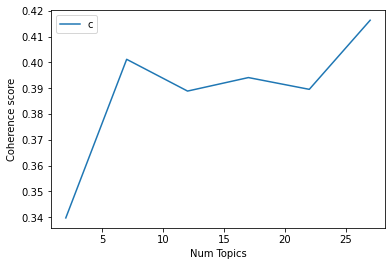

In [114]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [115]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 7

index: 0 | Num Topics = 2  has Coherence Value of 0.3397
index: 1 | Num Topics = 7  has Coherence Value of 0.4012
index: 2 | Num Topics = 12  has Coherence Value of 0.3889
index: 3 | Num Topics = 17  has Coherence Value of 0.3941
index: 4 | Num Topics = 22  has Coherence Value of 0.3896
index: 5 | Num Topics = 27  has Coherence Value of 0.4164


In [116]:
# Select optimal number of topics
optimal_model_sg_score1N2N3 = model_list_sg_score1N2N3[1]

In [117]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_sg_score1N2N3, corpus_sg_score1N2N3, id2word_sg_score1N2N3)

In [118]:
print("pyLDAVis for SG topics for score=1,2,3:")
vis_sg_score1N2N3

pyLDAVis for SG topics for score=1,2,3:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.102688  0.196112       1        1  23.601231
2      0.142328 -0.013672       2        1  19.761304
5     -0.001741 -0.153562       3        1  19.638471
6      0.152632  0.071612       4        1  10.563208
0     -0.148096  0.076299       5        1   9.852393
3      0.022831 -0.224678       6        1   9.610160
1     -0.270641  0.047890       7        1   6.973233, topic_info=          Term        Freq       Total Category  logprob  loglift
10      update  806.000000  806.000000  Default  30.0000  30.0000
33       story  670.000000  670.000000  Default  29.0000  29.0000
57        post  824.000000  824.000000  Default  28.0000  28.0000
52     account  640.000000  640.000000  Default  27.0000  27.0000
87      follow  152.000000  152.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
192       user   20.301718  123.855660   Topic7  -4.7051   0.8547
25        save   14.568882   55.262521   Topic7  -5.0369   1.3299
22   instagram   20.326204  487.681918   Topic7  -4.7039  -0.5147
29        help   17.658394  234.128484   Topic7  -4.8446   0.0784
252       look   12.328388   81.923041   Topic7  -5.2039   0.7692

[436 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
107       1  0.421789       able
107       2  0.283749       able
107       3  0.053682       able
107       4  0.099696       able
107       6  0.138040       able
...     ...       ...        ...
373       2  0.945420      world
332       1  0.992763      wrong
1153      4  0.929786         xr
802       1  0.950214  yesterday
223       2  0.960505       zoom

[655 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 3, 6, 7, 1, 4, 2])

# By-rating of each year

## By-rating of 2018 (Rating=1,2,3)

In [119]:
# By-rating Topic Modelling - rating = 1,2,3 in 2018
# Convert to list - move to each section
review_sg_2018_score1N2N3 = instagram_ios_sg_review_YearMonth_2018_score1N2N3.review.values.tolist()
review_words_sg_2018_score1N2N3 = list(sent_to_words(review_sg_2018_score1N2N3))
print(review_words_sg_2018_score1N2N3[:1])

[['keep', 'my', 'instagram', 'app', 'updated', 'and', 'yet', 'dont', 'get', 'to', 'enjoy', 'the', 'new', 'features', 'especially', 'when', 'the', 'superzoom', 'has', 'been', 'launched', 'also', 'dont', 'get', 'the', 'holiday', 'stickers', 'and', 'now', 'is', 'year', 'already']]


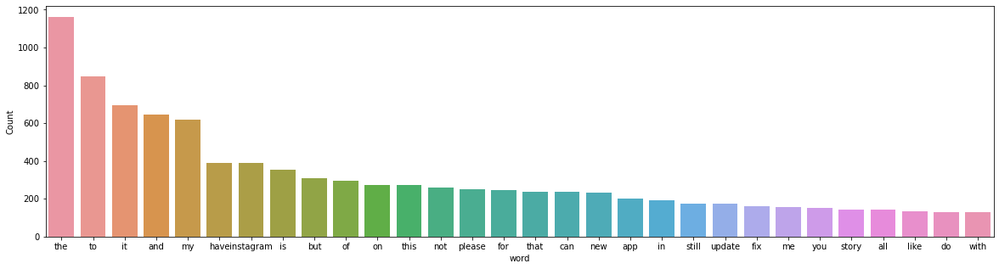

In [120]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_2018_score1N2N3))

In [121]:
# Clean text
review_words_sg_ready_2018_score1N2N3 = process_words(review_words_sg_2018_score1N2N3)  # processed Text Data! - move to each section

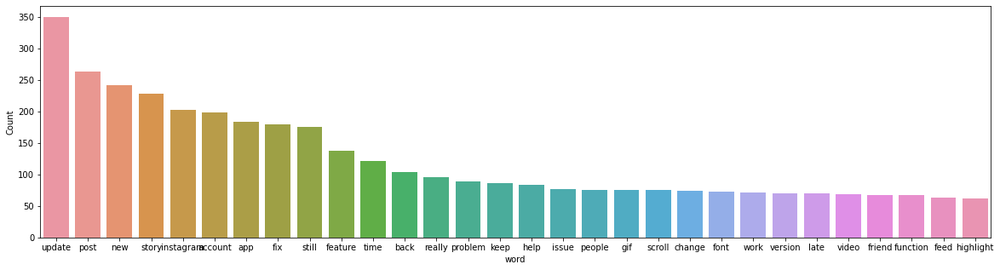

In [122]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_sg_ready_2018_score1N2N3))


In [123]:
# Create Dictionary
id2word_sg_2018_score1N2N3 = corpora.Dictionary(review_words_sg_ready_2018_score1N2N3)

2021-10-16 03:20:55,730 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 03:20:55,763 [INFO] gensim.corpora.dictionary - built Dictionary(1390 unique tokens: ['already', 'enjoy', 'especially', 'feature', 'holiday']...) from 841 documents (total 10073 corpus positions)
2021-10-16 03:20:55,765 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1390 unique tokens: ['already', 'enjoy', 'especially', 'feature', 'holiday']...) from 841 documents (total 10073 corpus positions)", 'datetime': '2021-10-16T03:20:55.764991', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [124]:
# Create Corpus: Term Document Frequency
corpus_sg_2018_score1N2N3 = [id2word_sg_2018_score1N2N3.doc2bow(text) for text in review_words_sg_ready_2018_score1N2N3]

In [125]:
# Training LDA model
model_list_sg_2018_score1N2N3, coherence_values_sg_2018_score1N2N3 = compute_coherence_values(dictionary=id2word_sg_2018_score1N2N3, corpus=corpus_sg_2018_score1N2N3, 
                                                              texts=review_words_sg_ready_2018_score1N2N3, limit=30, start=2, step=5)


2021-10-16 03:20:55,798 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 03:20:55,799 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 03:20:55,802 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 03:20:55,805 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 841 documents, updating model once every 841 documents, evaluating perplexity every 841 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 03:20:58,375 [INFO] gensim.models.ldamodel - -7.794 per-word bound, 221.9 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:20:58,376 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #841/841
2021-10-16 03:21:00,651 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.031*"update" + 0.025*"post" + 0.022*"story" + 0.021*"app" + 0.019*"new" + 0.018*"still" + 0.015*"fix"

2021-10-16 03:21:27,842 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.033*"account" + 0.024*"post" + 0.022*"instagram" + 0.021*"update" + 0.017*"new" + 0.014*"story" + 0.013*"back" + 0.013*"fix" + 0.012*"scroll" + 0.012*"highlight"
2021-10-16 03:21:27,843 [INFO] gensim.models.ldamodel - topic diff=0.022855, rho=0.301511
2021-10-16 03:21:29,216 [INFO] gensim.models.ldamodel - -6.220 per-word bound, 74.6 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:21:29,218 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #841/841
2021-10-16 03:21:30,310 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"update" + 0.026*"story" + 0.025*"new" + 0.025*"app" + 0.024*"still" + 0.022*"post" + 0.018*"fix" + 0.015*"time" + 0.014*"instagram" + 0.014*"feature"
2021-10-16 03:21:30,311 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"account" + 0.024*"post" + 0.022*"instagram" + 0.020*"update" + 0.017*"new" + 0.014*"back" + 0.013*"

2021-10-16 03:21:49,921 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"account" + 0.028*"post" + 0.020*"instagram" + 0.016*"new" + 0.015*"back" + 0.015*"update" + 0.014*"scroll" + 0.012*"highlight" + 0.011*"story" + 0.011*"log"
2021-10-16 03:21:49,924 [INFO] gensim.models.ldamodel - topic diff=0.013954, rho=0.218218
2021-10-16 03:21:51,016 [INFO] gensim.models.ldamodel - -6.201 per-word bound, 73.6 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:21:51,017 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #841/841
2021-10-16 03:21:51,964 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.043*"update" + 0.027*"story" + 0.026*"still" + 0.026*"app" + 0.025*"new" + 0.020*"fix" + 0.019*"post" + 0.016*"instagram" + 0.015*"time" + 0.014*"feature"
2021-10-16 03:21:51,966 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"account" + 0.028*"post" + 0.020*"instagram" + 0.016*"new" + 0.016*"back" + 0.015*"update" + 0.014*"

2021-10-16 03:22:09,967 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"account" + 0.031*"post" + 0.019*"instagram" + 0.017*"back" + 0.016*"new" + 0.015*"scroll" + 0.013*"update" + 0.013*"highlight" + 0.011*"log" + 0.011*"photo"
2021-10-16 03:22:09,968 [INFO] gensim.models.ldamodel - topic diff=0.009787, rho=0.179605
2021-10-16 03:22:11,122 [INFO] gensim.models.ldamodel - -6.190 per-word bound, 73.0 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:22:11,123 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #841/841
2021-10-16 03:22:11,969 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.044*"update" + 0.028*"story" + 0.027*"still" + 0.026*"app" + 0.025*"new" + 0.021*"fix" + 0.017*"post" + 0.017*"instagram" + 0.015*"time" + 0.015*"feature"
2021-10-16 03:22:11,970 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"account" + 0.032*"post" + 0.019*"instagram" + 0.017*"back" + 0.016*"new" + 0.015*"scroll" + 0.013*"

2021-10-16 03:22:29,721 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"account" + 0.034*"post" + 0.019*"back" + 0.018*"instagram" + 0.017*"new" + 0.015*"scroll" + 0.013*"update" + 0.013*"highlight" + 0.012*"log" + 0.011*"photo"
2021-10-16 03:22:29,722 [INFO] gensim.models.ldamodel - topic diff=0.007405, rho=0.156174
2021-10-16 03:22:30,825 [INFO] gensim.models.ldamodel - -6.183 per-word bound, 72.7 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:22:30,827 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #841/841
2021-10-16 03:22:31,610 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.045*"update" + 0.028*"story" + 0.027*"still" + 0.027*"app" + 0.025*"new" + 0.022*"fix" + 0.017*"instagram" + 0.015*"feature" + 0.015*"post" + 0.015*"time"
2021-10-16 03:22:31,612 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"account" + 0.034*"post" + 0.019*"back" + 0.018*"instagram" + 0.017*"new" + 0.015*"scroll" + 0.013*"

2021-10-16 03:22:47,962 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.038*"account" + 0.036*"post" + 0.019*"back" + 0.018*"instagram" + 0.017*"new" + 0.015*"scroll" + 0.012*"highlight" + 0.012*"update" + 0.012*"change" + 0.012*"log"
2021-10-16 03:22:47,963 [INFO] gensim.models.ldamodel - topic diff=0.005952, rho=0.140028
2021-10-16 03:22:47,964 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=1390, num_topics=2, decay=0.5, chunksize=1000) in 112.16s', 'datetime': '2021-10-16T03:22:47.964402', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 03:22:47,966 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 03:22:52,352 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2

2021-10-16 03:23:03,938 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.029*"post" + 0.025*"really" + 0.024*"new" + 0.021*"update" + 0.017*"fix" + 0.015*"instagram" + 0.014*"back" + 0.011*"day" + 0.010*"story" + 0.009*"feed"
2021-10-16 03:23:03,940 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.074*"update" + 0.035*"new" + 0.034*"account" + 0.025*"story" + 0.023*"fix" + 0.023*"still" + 0.021*"app" + 0.019*"instagram" + 0.017*"font" + 0.015*"late"
2021-10-16 03:23:03,943 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.042*"post" + 0.031*"story" + 0.017*"issue" + 0.016*"fix" + 0.015*"video" + 0.013*"photo" + 0.012*"feed" + 0.011*"upload" + 0.010*"app" + 0.010*"scroll"
2021-10-16 03:23:03,946 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.052*"post" + 0.022*"help" + 0.019*"instagram" + 0.018*"new" + 0.018*"story" + 0.017*"app" + 0.012*"problem" + 0.011*"tap" + 0.011*"video" + 0.010*"work"
2021-10-16 03:23:03,948 [INFO] gensim.models.ldamodel - topic diff=0.085711, rho=0.

2021-10-16 03:23:13,958 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.043*"post" + 0.032*"story" + 0.019*"video" + 0.017*"issue" + 0.015*"fix" + 0.014*"photo" + 0.014*"upload" + 0.012*"feed" + 0.010*"back" + 0.010*"scroll"
2021-10-16 03:23:13,959 [INFO] gensim.models.ldamodel - topic diff=0.030629, rho=0.301511
2021-10-16 03:23:15,081 [INFO] gensim.models.ldamodel - -6.461 per-word bound, 88.1 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:23:15,083 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #841/841
2021-10-16 03:23:15,892 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.077*"update" + 0.037*"new" + 0.035*"account" + 0.027*"still" + 0.027*"story" + 0.023*"fix" + 0.021*"app" + 0.021*"instagram" + 0.019*"font" + 0.018*"version"
2021-10-16 03:23:15,893 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"post" + 0.028*"new" + 0.026*"really" + 0.021*"back" + 0.020*"update" + 0.017*"instagram" + 0.015*"old" + 

2021-10-16 03:23:25,394 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.078*"update" + 0.038*"new" + 0.034*"account" + 0.028*"still" + 0.028*"story" + 0.023*"fix" + 0.021*"app" + 0.021*"instagram" + 0.020*"font" + 0.019*"version"
2021-10-16 03:23:25,430 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.032*"app" + 0.029*"keep" + 0.028*"update" + 0.025*"story" + 0.021*"post" + 0.019*"time" + 0.018*"crash" + 0.015*"still" + 0.014*"work" + 0.012*"happen"
2021-10-16 03:23:25,458 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.045*"feature" + 0.034*"still" + 0.030*"instagram" + 0.029*"update" + 0.022*"new" + 0.019*"gif" + 0.017*"app" + 0.016*"story" + 0.013*"account" + 0.013*"poll"
2021-10-16 03:23:25,459 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.042*"post" + 0.031*"new" + 0.026*"really" + 0.024*"back" + 0.020*"update" + 0.017*"instagram" + 0.016*"old" + 0.015*"feed" + 0.013*"bring" + 0.012*"chronological"
2021-10-16 03:23:25,460 [INFO] gensim.models.ldamodel - topic dif

2021-10-16 03:23:34,595 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.053*"post" + 0.023*"help" + 0.017*"story" + 0.017*"instagram" + 0.017*"app" + 0.014*"problem" + 0.012*"new" + 0.011*"work" + 0.011*"tap" + 0.011*"video"
2021-10-16 03:23:34,596 [INFO] gensim.models.ldamodel - topic diff=0.014208, rho=0.213201
2021-10-16 03:23:35,666 [INFO] gensim.models.ldamodel - -6.428 per-word bound, 86.1 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:23:35,667 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #841/841
2021-10-16 03:23:36,461 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.049*"post" + 0.035*"new" + 0.029*"back" + 0.025*"really" + 0.021*"feed" + 0.020*"update" + 0.016*"instagram" + 0.016*"old" + 0.014*"bring" + 0.013*"scroll"
2021-10-16 03:23:36,463 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.047*"feature" + 0.036*"still" + 0.031*"update" + 0.030*"instagram" + 0.022*"gif" + 0.022*"new" + 0.017*"app" + 0

2021-10-16 03:23:45,665 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.035*"app" + 0.031*"keep" + 0.026*"update" + 0.026*"story" + 0.019*"time" + 0.019*"crash" + 0.016*"post" + 0.015*"work" + 0.014*"happen" + 0.014*"fix"
2021-10-16 03:23:45,667 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.080*"update" + 0.037*"new" + 0.034*"account" + 0.030*"story" + 0.029*"still" + 0.024*"fix" + 0.022*"font" + 0.022*"app" + 0.021*"instagram" + 0.020*"version"
2021-10-16 03:23:45,673 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.056*"account" + 0.026*"fix" + 0.025*"log" + 0.022*"post" + 0.021*"problem" + 0.016*"instagram" + 0.016*"back" + 0.016*"issue" + 0.012*"people" + 0.011*"follow"
2021-10-16 03:23:45,678 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.053*"post" + 0.025*"help" + 0.017*"instagram" + 0.017*"app" + 0.016*"story" + 0.014*"problem" + 0.012*"work" + 0.012*"video" + 0.010*"caption" + 0.010*"change"
2021-10-16 03:23:45,683 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 03:23:54,809 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.080*"update" + 0.037*"new" + 0.033*"account" + 0.031*"story" + 0.029*"still" + 0.024*"fix" + 0.022*"font" + 0.022*"app" + 0.021*"instagram" + 0.021*"version"
2021-10-16 03:23:54,812 [INFO] gensim.models.ldamodel - topic diff=0.010011, rho=0.174078
2021-10-16 03:23:55,793 [INFO] gensim.models.ldamodel - -6.404 per-word bound, 84.7 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:23:55,794 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #841/841
2021-10-16 03:23:56,593 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"post" + 0.037*"story" + 0.028*"video" + 0.023*"upload" + 0.019*"issue" + 0.019*"photo" + 0.014*"fix" + 0.013*"insta" + 0.011*"quality" + 0.011*"iphone"
2021-10-16 03:23:56,596 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.057*"post" + 0.042*"new" + 0.034*"back" + 0.024*"scroll" + 0.023*"feed" + 0.022*"really" + 0.020*"update" 

2021-10-16 03:24:05,852 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.042*"post" + 0.038*"story" + 0.030*"video" + 0.027*"upload" + 0.021*"photo" + 0.019*"issue" + 0.013*"fix" + 0.013*"insta" + 0.011*"quality" + 0.011*"able"
2021-10-16 03:24:05,861 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.037*"app" + 0.032*"keep" + 0.026*"update" + 0.025*"story" + 0.020*"crash" + 0.019*"time" + 0.015*"work" + 0.015*"happen" + 0.015*"fix" + 0.013*"phone"
2021-10-16 03:24:05,867 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.061*"account" + 0.028*"log" + 0.027*"fix" + 0.022*"problem" + 0.019*"post" + 0.017*"instagram" + 0.016*"issue" + 0.014*"back" + 0.012*"people" + 0.012*"swipe"
2021-10-16 03:24:05,872 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.080*"update" + 0.036*"new" + 0.033*"account" + 0.031*"story" + 0.030*"still" + 0.023*"fix" + 0.023*"font" + 0.022*"app" + 0.021*"instagram" + 0.021*"version"
2021-10-16 03:24:05,881 [INFO] gensim.models.ldamodel - topic diff=0.0077

2021-10-16 03:24:15,134 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.060*"post" + 0.046*"new" + 0.036*"back" + 0.028*"scroll" + 0.022*"feed" + 0.022*"really" + 0.021*"update" + 0.020*"tap" + 0.019*"change" + 0.015*"old"
2021-10-16 03:24:15,136 [INFO] gensim.models.ldamodel - topic diff=0.006641, rho=0.150756
2021-10-16 03:24:16,268 [INFO] gensim.models.ldamodel - -6.390 per-word bound, 83.9 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:24:16,270 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #841/841
2021-10-16 03:24:17,078 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.060*"post" + 0.046*"new" + 0.037*"back" + 0.029*"scroll" + 0.022*"feed" + 0.022*"really" + 0.021*"update" + 0.020*"tap" + 0.019*"change" + 0.015*"old"
2021-10-16 03:24:17,080 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.038*"app" + 0.033*"keep" + 0.025*"update" + 0.024*"story" + 0.020*"crash" + 0.019*"time" + 0.016*"work" + 0.015*"happen

2021-10-16 03:24:25,965 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.053*"post" + 0.032*"help" + 0.017*"app" + 0.016*"instagram" + 0.016*"story" + 0.014*"problem" + 0.013*"video" + 0.012*"work" + 0.011*"caption" + 0.011*"delete"
2021-10-16 03:24:25,966 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.060*"post" + 0.046*"new" + 0.037*"back" + 0.030*"scroll" + 0.022*"feed" + 0.022*"really" + 0.021*"update" + 0.021*"tap" + 0.020*"change" + 0.015*"old"
2021-10-16 03:24:25,968 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"app" + 0.033*"keep" + 0.024*"update" + 0.024*"story" + 0.020*"crash" + 0.019*"time" + 0.017*"work" + 0.016*"happen" + 0.015*"fix" + 0.013*"phone"
2021-10-16 03:24:25,970 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.081*"update" + 0.034*"new" + 0.033*"account" + 0.033*"story" + 0.030*"still" + 0.023*"font" + 0.023*"fix" + 0.023*"app" + 0.022*"version" + 0.022*"instagram"
2021-10-16 03:24:25,970 [INFO] gensim.models.ldamodel - topic diff=0.005585,

2021-10-16 03:24:39,155 [INFO] gensim.models.ldamodel - topic diff=0.171340, rho=0.500000
2021-10-16 03:24:40,185 [INFO] gensim.models.ldamodel - -6.700 per-word bound, 104.0 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:24:40,187 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #841/841
2021-10-16 03:24:41,063 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.032*"new" + 0.030*"really" + 0.024*"update" + 0.023*"post" + 0.021*"day" + 0.018*"fix" + 0.014*"version" + 0.014*"way" + 0.014*"ago" + 0.013*"feature"
2021-10-16 03:24:41,065 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.032*"feature" + 0.030*"instagram" + 0.029*"story" + 0.026*"still" + 0.020*"new" + 0.018*"app" + 0.016*"post" + 0.014*"account" + 0.014*"highlight" + 0.012*"option"
2021-10-16 03:24:41,074 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.058*"post" + 0.032*"account" + 0.028*"log" + 0.028*"change" + 0.020*"back" + 0.018*"story" + 0.018*"tap" +

2021-10-16 03:24:50,091 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.043*"post" + 0.023*"back" + 0.021*"keep" + 0.021*"update" + 0.020*"new" + 0.020*"time" + 0.018*"app" + 0.017*"scroll" + 0.016*"bring" + 0.015*"story"
2021-10-16 03:24:50,094 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.037*"new" + 0.033*"really" + 0.032*"post" + 0.026*"day" + 0.023*"update" + 0.019*"ago" + 0.018*"old" + 0.016*"fix" + 0.016*"feed" + 0.016*"way"
2021-10-16 03:24:50,097 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.036*"video" + 0.024*"post" + 0.023*"story" + 0.022*"account" + 0.022*"app" + 0.020*"upload" + 0.018*"instagram" + 0.013*"feature" + 0.012*"phone" + 0.012*"whenever"
2021-10-16 03:24:50,098 [INFO] gensim.models.ldamodel - topic diff=0.056490, rho=0.316228
2021-10-16 03:24:51,157 [INFO] gensim.models.ldamodel - -6.594 per-word bound, 96.6 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:24:51,159 [INFO] gensim.models.ldamodel - PR

2021-10-16 03:24:59,335 [INFO] gensim.models.ldamodel - topic diff=0.031667, rho=0.258199
2021-10-16 03:25:00,195 [INFO] gensim.models.ldamodel - -6.557 per-word bound, 94.2 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:25:00,197 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #841/841
2021-10-16 03:25:00,938 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.029*"post" + 0.025*"account" + 0.024*"new" + 0.022*"update" + 0.020*"picture" + 0.020*"fix" + 0.014*"asap" + 0.014*"well" + 0.014*"back" + 0.013*"instagram"
2021-10-16 03:25:00,941 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.037*"story" + 0.033*"help" + 0.032*"app" + 0.028*"post" + 0.025*"work" + 0.018*"reinstall" + 0.017*"instagram" + 0.017*"problem" + 0.016*"new" + 0.015*"delete"
2021-10-16 03:25:00,959 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.024*"issue" + 0.024*"post" + 0.023*"feed" + 0.022*"story" + 0.021*"fix" + 0.017*"suddenly" + 0.017*"inst

2021-10-16 03:25:09,605 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.040*"follow" + 0.034*"account" + 0.030*"block" + 0.024*"time" + 0.021*"app" + 0.021*"people" + 0.020*"action" + 0.020*"allow" + 0.015*"keep" + 0.015*"fix"
2021-10-16 03:25:09,607 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.056*"highlight" + 0.038*"feature" + 0.036*"story" + 0.032*"account" + 0.027*"instagram" + 0.017*"miss" + 0.015*"still" + 0.013*"option" + 0.012*"long" + 0.011*"unable"
2021-10-16 03:25:09,610 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.037*"story" + 0.036*"app" + 0.035*"help" + 0.027*"work" + 0.026*"post" + 0.019*"reinstall" + 0.017*"instagram" + 0.017*"problem" + 0.017*"delete" + 0.015*"video"
2021-10-16 03:25:09,612 [INFO] gensim.models.ldamodel - topic diff=0.019621, rho=0.218218
2021-10-16 03:25:10,559 [INFO] gensim.models.ldamodel - -6.530 per-word bound, 92.4 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:25:10,561 [INFO] 

2021-10-16 03:25:17,971 [INFO] gensim.models.ldamodel - topic diff=0.014488, rho=0.196116
2021-10-16 03:25:18,861 [INFO] gensim.models.ldamodel - -6.516 per-word bound, 91.5 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:25:18,863 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #841/841
2021-10-16 03:25:19,565 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.031*"post" + 0.025*"picture" + 0.022*"account" + 0.021*"new" + 0.021*"update" + 0.020*"fix" + 0.015*"asap" + 0.014*"well" + 0.014*"photo" + 0.013*"back"
2021-10-16 03:25:19,577 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.047*"post" + 0.032*"back" + 0.026*"scroll" + 0.025*"new" + 0.025*"update" + 0.022*"keep" + 0.022*"bring" + 0.017*"time" + 0.016*"app" + 0.015*"tap"
2021-10-16 03:25:19,589 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.039*"story" + 0.038*"app" + 0.037*"help" + 0.027*"work" + 0.026*"post" + 0.020*"reinstall" + 0.020*"instagram" + 0.019*"

2021-10-16 03:25:28,114 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.045*"post" + 0.041*"new" + 0.040*"really" + 0.027*"day" + 0.026*"feed" + 0.025*"old" + 0.024*"update" + 0.020*"back" + 0.019*"ago" + 0.018*"instagram"
2021-10-16 03:25:28,119 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.032*"post" + 0.026*"picture" + 0.022*"account" + 0.020*"new" + 0.019*"update" + 0.019*"fix" + 0.015*"asap" + 0.015*"well" + 0.014*"photo" + 0.013*"back"
2021-10-16 03:25:28,121 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.086*"update" + 0.057*"still" + 0.042*"new" + 0.032*"app" + 0.030*"instagram" + 0.029*"feature" + 0.025*"gif" + 0.023*"late" + 0.021*"font" + 0.021*"version"
2021-10-16 03:25:28,124 [INFO] gensim.models.ldamodel - topic diff=0.010471, rho=0.176777
2021-10-16 03:25:29,061 [INFO] gensim.models.ldamodel - -6.507 per-word bound, 91.0 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:25:29,062 [INFO] gensim.models.ldamodel -

2021-10-16 03:25:36,245 [INFO] gensim.models.ldamodel - topic diff=0.008754, rho=0.164399
2021-10-16 03:25:37,178 [INFO] gensim.models.ldamodel - -6.501 per-word bound, 90.6 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:25:37,179 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #841/841
2021-10-16 03:25:37,890 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.034*"post" + 0.027*"picture" + 0.022*"account" + 0.019*"fix" + 0.019*"update" + 0.018*"new" + 0.015*"asap" + 0.015*"well" + 0.014*"photo" + 0.013*"back"
2021-10-16 03:25:37,892 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.025*"issue" + 0.022*"post" + 0.021*"fix" + 0.020*"instagram" + 0.020*"story" + 0.019*"suddenly" + 0.019*"music" + 0.019*"connection" + 0.016*"photo" + 0.016*"full"
2021-10-16 03:25:37,893 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.043*"story" + 0.039*"app" + 0.038*"help" + 0.029*"work" + 0.028*"post" + 0.022*"instagram" + 0.019*"prob

2021-10-16 03:25:46,418 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.087*"update" + 0.057*"still" + 0.042*"new" + 0.032*"app" + 0.030*"instagram" + 0.030*"feature" + 0.026*"gif" + 0.022*"late" + 0.021*"font" + 0.021*"version"
2021-10-16 03:25:46,420 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.058*"update" + 0.032*"fix" + 0.026*"account" + 0.025*"load" + 0.021*"new" + 0.018*"bug" + 0.018*"app" + 0.017*"story" + 0.015*"really" + 0.014*"work"
2021-10-16 03:25:46,423 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.025*"issue" + 0.022*"post" + 0.021*"fix" + 0.021*"instagram" + 0.020*"story" + 0.019*"suddenly" + 0.019*"music" + 0.019*"connection" + 0.016*"photo" + 0.016*"internet"
2021-10-16 03:25:46,424 [INFO] gensim.models.ldamodel - topic diff=0.006543, rho=0.152499
2021-10-16 03:25:47,366 [INFO] gensim.models.ldamodel - -6.495 per-word bound, 90.2 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:25:47,367 [INFO] gensim.mod

2021-10-16 03:25:54,772 [INFO] gensim.models.ldamodel - topic diff=0.005813, rho=0.144338
2021-10-16 03:25:55,696 [INFO] gensim.models.ldamodel - -6.492 per-word bound, 90.0 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:25:55,699 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #841/841
2021-10-16 03:25:56,353 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.058*"post" + 0.043*"log" + 0.039*"account" + 0.024*"change" + 0.022*"tap" + 0.020*"problem" + 0.018*"scroll" + 0.016*"request" + 0.015*"help" + 0.015*"fix"
2021-10-16 03:25:56,355 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.025*"issue" + 0.022*"post" + 0.021*"instagram" + 0.021*"fix" + 0.020*"story" + 0.019*"suddenly" + 0.019*"music" + 0.019*"connection" + 0.017*"internet" + 0.017*"photo"
2021-10-16 03:25:56,358 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.052*"video" + 0.034*"upload" + 0.031*"story" + 0.026*"post" + 0.021*"app" + 0.013*"account" + 0.0

2021-10-16 03:26:09,716 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.062*"post" + 0.031*"change" + 0.030*"account" + 0.024*"back" + 0.018*"tap" + 0.016*"story" + 0.015*"log" + 0.014*"update" + 0.014*"scroll" + 0.013*"people"
2021-10-16 03:26:09,717 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.042*"still" + 0.029*"update" + 0.029*"feature" + 0.026*"instagram" + 0.021*"story" + 0.021*"app" + 0.021*"new" + 0.014*"account" + 0.014*"time" + 0.012*"font"
2021-10-16 03:26:09,718 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.047*"update" + 0.026*"post" + 0.025*"still" + 0.024*"new" + 0.024*"keep" + 0.019*"back" + 0.019*"app" + 0.018*"gif" + 0.018*"time" + 0.016*"story"
2021-10-16 03:26:09,719 [INFO] gensim.models.ldamodel - topic diff=0.209117, rho=0.577350
2021-10-16 03:26:10,854 [INFO] gensim.models.ldamodel - -6.880 per-word bound, 117.8 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:26:10,856 [INFO] gensim.models.ldamodel 

2021-10-16 03:26:19,275 [INFO] gensim.models.ldamodel - topic diff=0.096592, rho=0.353553
2021-10-16 03:26:20,396 [INFO] gensim.models.ldamodel - -6.704 per-word bound, 104.2 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:26:20,398 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #841/841
2021-10-16 03:26:21,140 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.028*"story" + 0.026*"feed" + 0.019*"fix" + 0.019*"scroll" + 0.014*"post" + 0.013*"video" + 0.012*"bug" + 0.012*"instagram" + 0.010*"issue" + 0.009*"people"
2021-10-16 03:26:21,141 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.045*"story" + 0.030*"post" + 0.029*"new" + 0.028*"instagram" + 0.027*"upload" + 0.023*"update" + 0.020*"insta" + 0.019*"photo" + 0.016*"feature" + 0.014*"time"
2021-10-16 03:26:21,143 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.039*"update" + 0.038*"post" + 0.033*"back" + 0.030*"new" + 0.022*"keep" + 0.020*"chronological" + 0.020*

2021-10-16 03:26:30,089 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.045*"post" + 0.038*"update" + 0.036*"back" + 0.034*"new" + 0.028*"feed" + 0.024*"bring" + 0.024*"chronological" + 0.023*"scroll" + 0.020*"keep" + 0.019*"order"
2021-10-16 03:26:30,091 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.037*"highlight" + 0.032*"account" + 0.023*"instagram" + 0.021*"people" + 0.018*"follow" + 0.017*"anymore" + 0.015*"post" + 0.013*"find" + 0.012*"feature" + 0.012*"thing"
2021-10-16 03:26:30,098 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.050*"story" + 0.029*"instagram" + 0.028*"upload" + 0.028*"post" + 0.028*"new" + 0.023*"photo" + 0.023*"update" + 0.020*"insta" + 0.015*"feature" + 0.015*"highlight"
2021-10-16 03:26:30,101 [INFO] gensim.models.ldamodel - topic diff=0.043279, rho=0.267261
2021-10-16 03:26:31,284 [INFO] gensim.models.ldamodel - -6.634 per-word bound, 99.4 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:26:31,

2021-10-16 03:26:39,841 [INFO] gensim.models.ldamodel - topic diff=0.027309, rho=0.229416
2021-10-16 03:26:40,977 [INFO] gensim.models.ldamodel - -6.602 per-word bound, 97.1 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:26:40,979 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #841/841
2021-10-16 03:26:41,982 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.105*"post" + 0.040*"view" + 0.038*"change" + 0.034*"back" + 0.030*"tap" + 0.027*"story" + 0.021*"scroll" + 0.015*"people" + 0.015*"new" + 0.015*"sometimes"
2021-10-16 03:26:41,984 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.084*"update" + 0.063*"still" + 0.034*"app" + 0.031*"new" + 0.029*"instagram" + 0.028*"feature" + 0.026*"gif" + 0.024*"fix" + 0.023*"late" + 0.022*"question"
2021-10-16 03:26:41,986 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.048*"post" + 0.039*"back" + 0.038*"update" + 0.037*"feed" + 0.036*"new" + 0.027*"scroll" + 0.026*"bring" + 

2021-10-16 03:26:51,261 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.039*"gif" + 0.027*"app" + 0.023*"time" + 0.021*"long" + 0.018*"find" + 0.018*"work" + 0.013*"insta" + 0.013*"unable" + 0.013*"fix" + 0.012*"follow"
2021-10-16 03:26:51,264 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.074*"account" + 0.036*"log" + 0.030*"post" + 0.027*"help" + 0.024*"instagram" + 0.020*"app" + 0.019*"fix" + 0.019*"story" + 0.015*"phone" + 0.014*"happen"
2021-10-16 03:26:51,266 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.051*"new" + 0.045*"feature" + 0.035*"still" + 0.033*"font" + 0.028*"update" + 0.027*"instagram" + 0.022*"story" + 0.018*"friend" + 0.017*"app" + 0.016*"year"
2021-10-16 03:26:51,270 [INFO] gensim.models.ldamodel - topic diff=0.018406, rho=0.200000
2021-10-16 03:26:52,269 [INFO] gensim.models.ldamodel - -6.582 per-word bound, 95.8 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:26:52,270 [INFO] gensim.models.ldamodel 

2021-10-16 03:26:59,788 [INFO] gensim.models.ldamodel - topic diff=0.013384, rho=0.182574
2021-10-16 03:27:00,802 [INFO] gensim.models.ldamodel - -6.569 per-word bound, 95.0 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:27:00,804 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #841/841
2021-10-16 03:27:01,529 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.033*"story" + 0.018*"fix" + 0.017*"share" + 0.014*"instagram" + 0.011*"bug" + 0.011*"video" + 0.011*"people" + 0.011*"comment" + 0.011*"buggy" + 0.010*"anymore"
2021-10-16 03:27:01,531 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.055*"account" + 0.047*"fix" + 0.038*"problem" + 0.027*"keep" + 0.026*"log" + 0.025*"load" + 0.022*"asap" + 0.021*"really" + 0.019*"refresh" + 0.019*"issue"
2021-10-16 03:27:01,536 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.076*"update" + 0.035*"story" + 0.026*"account" + 0.025*"fix" + 0.023*"app" + 0.021*"new" + 0.019*"highl

2021-10-16 03:27:10,184 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.055*"account" + 0.049*"fix" + 0.038*"problem" + 0.028*"log" + 0.027*"keep" + 0.025*"load" + 0.022*"asap" + 0.021*"really" + 0.020*"issue" + 0.019*"refresh"
2021-10-16 03:27:10,216 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.028*"update" + 0.020*"fix" + 0.017*"still" + 0.016*"post" + 0.016*"time" + 0.015*"story" + 0.013*"app" + 0.013*"new" + 0.013*"really" + 0.012*"quite"
2021-10-16 03:27:10,218 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.041*"really" + 0.026*"post" + 0.023*"time" + 0.023*"fix" + 0.022*"new" + 0.017*"block" + 0.015*"update" + 0.014*"story" + 0.014*"follower" + 0.012*"page"
2021-10-16 03:27:10,220 [INFO] gensim.models.ldamodel - topic diff=0.009207, rho=0.166667
2021-10-16 03:27:11,159 [INFO] gensim.models.ldamodel - -6.561 per-word bound, 94.4 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:27:11,162 [INFO] gensim.models.ldamodel - 

2021-10-16 03:27:18,460 [INFO] gensim.models.ldamodel - topic diff=0.007344, rho=0.156174
2021-10-16 03:27:19,429 [INFO] gensim.models.ldamodel - -6.555 per-word bound, 94.0 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:27:19,430 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #841/841
2021-10-16 03:27:20,219 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.076*"update" + 0.034*"story" + 0.026*"account" + 0.025*"fix" + 0.023*"app" + 0.019*"new" + 0.016*"time" + 0.016*"highlight" + 0.015*"still" + 0.015*"work"
2021-10-16 03:27:20,221 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.063*"new" + 0.050*"feature" + 0.041*"font" + 0.035*"still" + 0.032*"update" + 0.031*"instagram" + 0.023*"story" + 0.018*"friend" + 0.018*"app" + 0.015*"user"
2021-10-16 03:27:20,223 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.083*"video" + 0.041*"app" + 0.039*"story" + 0.027*"phone" + 0.020*"play" + 0.020*"post" + 0.020*"restart" + 

2021-10-16 03:27:28,599 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.045*"post" + 0.031*"feature" + 0.028*"scroll" + 0.028*"tap" + 0.025*"new" + 0.019*"remove" + 0.017*"music" + 0.015*"let" + 0.015*"disappear" + 0.013*"story"
2021-10-16 03:27:28,602 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.105*"post" + 0.050*"view" + 0.040*"change" + 0.032*"tap" + 0.030*"story" + 0.029*"back" + 0.024*"scroll" + 0.018*"really" + 0.017*"instead" + 0.017*"people"
2021-10-16 03:27:28,608 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.076*"update" + 0.033*"story" + 0.026*"account" + 0.025*"fix" + 0.024*"app" + 0.018*"new" + 0.016*"time" + 0.015*"still" + 0.015*"soon" + 0.015*"work"
2021-10-16 03:27:28,612 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.056*"story" + 0.036*"upload" + 0.034*"photo" + 0.031*"post" + 0.026*"instagram" + 0.025*"new" + 0.025*"update" + 0.019*"insta" + 0.016*"highlight" + 0.014*"feature"
2021-10-16 03:27:28,613 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 03:27:43,172 [INFO] gensim.models.ldamodel - -13.425 per-word bound, 10998.3 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:27:43,174 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #841/841
2021-10-16 03:27:44,997 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.019*"really" + 0.018*"app" + 0.016*"instagram" + 0.016*"post" + 0.015*"still" + 0.013*"follower" + 0.013*"new" + 0.012*"back" + 0.012*"way" + 0.012*"update"
2021-10-16 03:27:44,998 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.044*"post" + 0.030*"new" + 0.018*"instagram" + 0.018*"question" + 0.016*"tap" + 0.014*"really" + 0.013*"time" + 0.011*"gif" + 0.011*"font" + 0.011*"app"
2021-10-16 03:27:45,001 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.043*"account" + 0.040*"fix" + 0.026*"update" + 0.023*"feature" + 0.021*"new" + 0.020*"scroll" + 0.020*"story" + 0.015*"keep" + 0.013*"still" + 0.011*"load"
2021-10-16 03:27:45,003 [INFO] gensim.mod

2021-10-16 03:27:57,734 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.019*"really" + 0.019*"work" + 0.018*"follow" + 0.018*"people" + 0.015*"add" + 0.013*"feature" + 0.012*"fix" + 0.012*"insta" + 0.011*"post" + 0.011*"instagram"
2021-10-16 03:27:57,737 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.027*"post" + 0.027*"photo" + 0.024*"update" + 0.021*"gif" + 0.021*"story" + 0.020*"still" + 0.020*"disappear" + 0.020*"month" + 0.018*"insta" + 0.018*"long"
2021-10-16 03:27:57,740 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.030*"post" + 0.022*"fix" + 0.018*"full" + 0.016*"photo" + 0.016*"story" + 0.015*"still" + 0.014*"instagram" + 0.013*"screen" + 0.012*"fine" + 0.012*"app"
2021-10-16 03:27:57,743 [INFO] gensim.models.ldamodel - topic diff=0.121289, rho=0.377964
2021-10-16 03:27:59,237 [INFO] gensim.models.ldamodel - -6.787 per-word bound, 110.4 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:27:59,238 [INFO] gensim.models.

2021-10-16 03:28:08,942 [INFO] gensim.models.ldamodel - topic diff=0.059845, rho=0.288675
2021-10-16 03:28:10,136 [INFO] gensim.models.ldamodel - -6.716 per-word bound, 105.1 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:28:10,138 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #841/841
2021-10-16 03:28:10,976 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.050*"poll" + 0.040*"still" + 0.037*"new" + 0.037*"feature" + 0.033*"question" + 0.031*"sticker" + 0.028*"update" + 0.027*"fix" + 0.026*"app" + 0.021*"option"
2021-10-16 03:28:10,978 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.070*"account" + 0.058*"log" + 0.031*"problem" + 0.027*"happen" + 0.024*"help" + 0.024*"work" + 0.024*"fix" + 0.022*"keep" + 0.021*"phone" + 0.021*"request"
2021-10-16 03:28:10,980 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.074*"post" + 0.061*"new" + 0.049*"back" + 0.043*"story" + 0.040*"update" + 0.040*"scroll" + 0.027*"tap" 

2021-10-16 03:28:20,932 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.063*"post" + 0.029*"change" + 0.018*"account" + 0.016*"give" + 0.014*"back" + 0.013*"multiple" + 0.013*"people" + 0.011*"certain" + 0.011*"page" + 0.011*"user"
2021-10-16 03:28:20,972 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.115*"highlight" + 0.051*"account" + 0.033*"story" + 0.030*"instagram" + 0.027*"profile" + 0.020*"find" + 0.020*"feature" + 0.019*"iphone" + 0.016*"follow" + 0.015*"help"
2021-10-16 03:28:20,973 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.054*"update" + 0.034*"fix" + 0.033*"load" + 0.025*"new" + 0.024*"story" + 0.014*"still" + 0.014*"superzoom" + 0.014*"app" + 0.014*"help" + 0.013*"unable"
2021-10-16 03:28:20,974 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.068*"post" + 0.040*"video" + 0.032*"play" + 0.023*"new" + 0.019*"auto" + 0.018*"time" + 0.017*"stop" + 0.015*"really" + 0.012*"instagram" + 0.012*"reason"
2021-10-16 03:28:20,975 [INFO] gensim.models.ldamodel - 

2021-10-16 03:28:30,915 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.027*"post" + 0.022*"photo" + 0.020*"fix" + 0.020*"full" + 0.016*"story" + 0.016*"screen" + 0.015*"instagram" + 0.015*"bad" + 0.014*"page" + 0.014*"still"
2021-10-16 03:28:30,916 [INFO] gensim.models.ldamodel - topic diff=0.021269, rho=0.208514
2021-10-16 03:28:32,010 [INFO] gensim.models.ldamodel - -6.643 per-word bound, 99.9 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:28:32,011 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #841/841
2021-10-16 03:28:32,857 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.103*"update" + 0.060*"still" + 0.040*"new" + 0.040*"app" + 0.036*"gif" + 0.035*"version" + 0.035*"instagram" + 0.035*"late" + 0.031*"font" + 0.027*"feature"
2021-10-16 03:28:32,859 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.031*"follower" + 0.017*"app" + 0.015*"option" + 0.015*"instagram" + 0.014*"able" + 0.014*"strong" + 0.014*"bu

2021-10-16 03:28:42,729 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.039*"app" + 0.033*"work" + 0.020*"fix" + 0.019*"log" + 0.018*"time" + 0.017*"follow" + 0.017*"share" + 0.017*"click" + 0.017*"people" + 0.016*"story"
2021-10-16 03:28:42,730 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.022*"follow" + 0.022*"add" + 0.021*"people" + 0.017*"original" + 0.016*"really" + 0.015*"insta" + 0.013*"story" + 0.012*"update" + 0.012*"wrong" + 0.012*"whenever"
2021-10-16 03:28:42,732 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.103*"video" + 0.057*"story" + 0.048*"upload" + 0.034*"app" + 0.024*"sound" + 0.023*"record" + 0.022*"help" + 0.021*"issue" + 0.019*"camera" + 0.018*"well"
2021-10-16 03:28:42,736 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.035*"follower" + 0.018*"option" + 0.017*"app" + 0.015*"able" + 0.015*"instagram" + 0.014*"show" + 0.014*"strong" + 0.013*"bug" + 0.013*"page" + 0.012*"really"
2021-10-16 03:28:42,738 [INFO] gensim.models.ldamodel - topic #14 

2021-10-16 03:28:52,726 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.079*"account" + 0.063*"log" + 0.031*"problem" + 0.028*"help" + 0.027*"happen" + 0.024*"work" + 0.024*"fix" + 0.024*"keep" + 0.023*"instagram" + 0.023*"phone"
2021-10-16 03:28:52,728 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.073*"photo" + 0.065*"post" + 0.036*"caption" + 0.031*"insta" + 0.029*"long" + 0.027*"story" + 0.022*"disappear" + 0.022*"upload" + 0.022*"time" + 0.021*"edit"
2021-10-16 03:28:52,729 [INFO] gensim.models.ldamodel - topic diff=0.010311, rho=0.171499
2021-10-16 03:28:53,761 [INFO] gensim.models.ldamodel - -6.615 per-word bound, 98.0 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:28:53,763 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #841/841
2021-10-16 03:28:54,448 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.052*"update" + 0.039*"load" + 0.034*"fix" + 0.023*"story" + 0.023*"new" + 0.016*"superzoom" + 0.012*"ho

2021-10-16 03:29:03,456 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #841/841
2021-10-16 03:29:04,213 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.056*"story" + 0.041*"post" + 0.032*"update" + 0.031*"account" + 0.027*"fix" + 0.024*"instagram" + 0.022*"show" + 0.017*"really" + 0.017*"feed" + 0.016*"share"
2021-10-16 03:29:04,215 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.069*"fix" + 0.041*"account" + 0.024*"suddenly" + 0.022*"story" + 0.022*"scroll" + 0.020*"load" + 0.018*"keep" + 0.016*"horrible" + 0.016*"bug" + 0.016*"ad"
2021-10-16 03:29:04,218 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.072*"post" + 0.072*"photo" + 0.037*"caption" + 0.032*"insta" + 0.028*"long" + 0.028*"story" + 0.024*"picture" + 0.022*"upload" + 0.022*"disappear" + 0.021*"time"
2021-10-16 03:29:04,220 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.023*"problem" + 0.023*"new" + 0.019*"fix" + 0.018*"update" + 0.017*"well" + 0.017*"post" + 0.017*"back" + 0.017*"change" 

2021-10-16 03:29:14,092 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.074*"post" + 0.048*"video" + 0.041*"play" + 0.026*"auto" + 0.019*"new" + 0.019*"time" + 0.018*"stop" + 0.015*"really" + 0.012*"reason" + 0.012*"button"
2021-10-16 03:29:14,094 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.041*"follower" + 0.020*"option" + 0.017*"show" + 0.017*"app" + 0.017*"able" + 0.015*"page" + 0.015*"instagram" + 0.014*"follow" + 0.014*"strong" + 0.014*"comment"
2021-10-16 03:29:14,099 [INFO] gensim.models.ldamodel - topic diff=0.006307, rho=0.149071
2021-10-16 03:29:15,261 [INFO] gensim.models.ldamodel - -6.602 per-word bound, 97.2 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:29:15,262 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #841/841
2021-10-16 03:29:15,969 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.104*"update" + 0.061*"still" + 0.043*"new" + 0.041*"app" + 0.038*"instagram" + 0.037*"font" + 0.035*"vers

2021-10-16 03:29:25,174 [INFO] gensim.models.ldamodel - -6.598 per-word bound, 96.8 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:29:25,176 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #841/841
2021-10-16 03:29:25,915 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.127*"highlight" + 0.053*"account" + 0.043*"story" + 0.031*"instagram" + 0.027*"profile" + 0.021*"find" + 0.018*"iphone" + 0.017*"feature" + 0.015*"follow" + 0.015*"function"
2021-10-16 03:29:25,918 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.024*"problem" + 0.022*"new" + 0.019*"fix" + 0.017*"well" + 0.017*"post" + 0.017*"back" + 0.017*"change" + 0.016*"update" + 0.015*"instagram" + 0.014*"normal"
2021-10-16 03:29:25,924 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.042*"follower" + 0.021*"option" + 0.018*"show" + 0.017*"able" + 0.017*"app" + 0.015*"page" + 0.015*"follow" + 0.015*"instagram" + 0.014*"strong" + 0.014*"comment"
2021-10-16 03:2

2021-10-16 03:29:44,023 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.037*"instagram" + 0.034*"new" + 0.029*"update" + 0.025*"version" + 0.021*"story" + 0.020*"look" + 0.018*"account" + 0.017*"post" + 0.016*"feature" + 0.013*"highlight"
2021-10-16 03:29:44,029 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.036*"story" + 0.027*"add" + 0.022*"music" + 0.018*"fix" + 0.017*"able" + 0.016*"ago" + 0.015*"long" + 0.015*"available" + 0.015*"really" + 0.012*"work"
2021-10-16 03:29:44,036 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.046*"fix" + 0.039*"story" + 0.030*"update" + 0.028*"account" + 0.023*"time" + 0.022*"instagram" + 0.019*"app" + 0.019*"bug" + 0.018*"new" + 0.016*"post"
2021-10-16 03:29:44,043 [INFO] gensim.models.ldamodel - topic diff=0.160683, rho=0.447214
2021-10-16 03:29:45,117 [INFO] gensim.models.ldamodel - -6.939 per-word bound, 122.7 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:29:45,119 [INFO] gensim.mod

2021-10-16 03:29:55,365 [INFO] gensim.models.ldamodel - topic diff=0.081581, rho=0.316228
2021-10-16 03:29:56,680 [INFO] gensim.models.ldamodel - -6.808 per-word bound, 112.1 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:29:56,681 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #841/841
2021-10-16 03:29:57,566 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.073*"post" + 0.053*"change" + 0.030*"caption" + 0.022*"message" + 0.021*"error" + 0.020*"story" + 0.016*"pic" + 0.016*"able" + 0.016*"video" + 0.016*"keep"
2021-10-16 03:29:57,569 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.026*"new" + 0.023*"story" + 0.023*"update" + 0.018*"lag" + 0.018*"fix" + 0.017*"still" + 0.016*"feature" + 0.015*"delete" + 0.015*"format" + 0.015*"version"
2021-10-16 03:29:57,571 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.039*"instagram" + 0.036*"new" + 0.029*"update" + 0.028*"version" + 0.025*"look" + 0.019*"story" + 0.017*"po

2021-10-16 03:30:09,021 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.036*"page" + 0.027*"explore" + 0.024*"post" + 0.023*"back" + 0.021*"feature" + 0.018*"bring" + 0.018*"order" + 0.018*"chronological" + 0.018*"video" + 0.017*"work"
2021-10-16 03:30:09,033 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.072*"story" + 0.049*"upload" + 0.033*"post" + 0.023*"time" + 0.022*"photo" + 0.020*"quite" + 0.018*"app" + 0.018*"insta" + 0.015*"whenever" + 0.015*"fix"
2021-10-16 03:30:09,043 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.055*"update" + 0.045*"post" + 0.041*"new" + 0.027*"show" + 0.021*"story" + 0.021*"still" + 0.021*"font" + 0.020*"fix" + 0.018*"instagram" + 0.018*"follower"
2021-10-16 03:30:09,046 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.107*"post" + 0.082*"scroll" + 0.070*"tap" + 0.046*"back" + 0.041*"swipe" + 0.030*"bring" + 0.026*"new" + 0.023*"change" + 0.021*"view" + 0.020*"next"
2021-10-16 03:30:09,055 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-16 03:30:19,626 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.056*"update" + 0.047*"post" + 0.039*"new" + 0.027*"show" + 0.022*"story" + 0.022*"font" + 0.022*"fix" + 0.020*"still" + 0.020*"follower" + 0.018*"instagram"
2021-10-16 03:30:19,628 [INFO] gensim.models.ldamodel - topic diff=0.024559, rho=0.218218
2021-10-16 03:30:20,871 [INFO] gensim.models.ldamodel - -6.728 per-word bound, 106.0 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:30:20,872 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #841/841
2021-10-16 03:30:21,632 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.054*"music" + 0.045*"add" + 0.042*"story" + 0.035*"long" + 0.020*"able" + 0.020*"ago" + 0.019*"disappoint" + 0.018*"fix" + 0.016*"friend" + 0.015*"available"
2021-10-16 03:30:21,634 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.025*"story" + 0.024*"new" + 0.022*"update" + 0.019*"lag" + 0.015*"format" + 0.015*"version" + 0.015*"st

2021-10-16 03:30:31,764 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.036*"filter" + 0.033*"post" + 0.027*"really" + 0.021*"face" + 0.018*"time" + 0.017*"instagram" + 0.014*"block" + 0.013*"day" + 0.011*"improvement" + 0.011*"miss"
2021-10-16 03:30:31,766 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.063*"option" + 0.039*"fix" + 0.023*"happen" + 0.021*"poll" + 0.019*"search" + 0.017*"keep" + 0.017*"miss" + 0.016*"post" + 0.015*"friend" + 0.015*"story"
2021-10-16 03:30:31,767 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.153*"highlight" + 0.067*"account" + 0.042*"story" + 0.037*"feature" + 0.028*"update" + 0.026*"instagram" + 0.022*"profile" + 0.021*"main" + 0.015*"else" + 0.012*"already"
2021-10-16 03:30:31,773 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.036*"play" + 0.035*"insta" + 0.026*"datum" + 0.026*"video" + 0.025*"iphone" + 0.024*"story" + 0.020*"much" + 0.018*"option" + 0.017*"way" + 0.016*"auto"
2021-10-16 03:30:31,775 [INFO] gensim.models.ldamodel

2021-10-16 03:30:41,706 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.073*"post" + 0.045*"message" + 0.044*"change" + 0.033*"caption" + 0.024*"error" + 0.021*"notification" + 0.020*"story" + 0.020*"sometimes" + 0.019*"able" + 0.017*"fix"
2021-10-16 03:30:41,709 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.044*"account" + 0.043*"help" + 0.039*"log" + 0.031*"instagram" + 0.025*"issue" + 0.023*"problem" + 0.022*"post" + 0.022*"request" + 0.021*"happen" + 0.019*"fix"
2021-10-16 03:30:41,712 [INFO] gensim.models.ldamodel - topic diff=0.010503, rho=0.176777
2021-10-16 03:30:42,918 [INFO] gensim.models.ldamodel - -6.699 per-word bound, 103.9 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:30:42,920 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #841/841
2021-10-16 03:30:43,735 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.155*"highlight" + 0.069*"account" + 0.047*"story" + 0.037*"feature" + 0.028*"update" + 0.

2021-10-16 03:30:53,159 [INFO] gensim.models.ldamodel - -6.691 per-word bound, 103.3 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:30:53,165 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #841/841
2021-10-16 03:30:54,133 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.042*"app" + 0.038*"phone" + 0.037*"log" + 0.036*"feed" + 0.032*"keep" + 0.028*"account" + 0.025*"happen" + 0.025*"restart" + 0.022*"upload" + 0.021*"delete"
2021-10-16 03:30:54,135 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.072*"post" + 0.048*"message" + 0.043*"change" + 0.033*"caption" + 0.025*"error" + 0.021*"notification" + 0.021*"sometimes" + 0.021*"story" + 0.020*"able" + 0.018*"fix"
2021-10-16 03:30:54,136 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.064*"story" + 0.063*"video" + 0.048*"app" + 0.027*"post" + 0.026*"problem" + 0.025*"help" + 0.024*"fix" + 0.020*"fine" + 0.018*"whenever" + 0.016*"log"
2021-10-16 03:30:54,140 [INFO] 

2021-10-16 03:31:03,321 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.059*"account" + 0.051*"work" + 0.051*"feature" + 0.030*"new" + 0.022*"refresh" + 0.021*"picture" + 0.019*"internet" + 0.019*"keep" + 0.019*"app" + 0.018*"post"
2021-10-16 03:31:03,324 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.123*"update" + 0.070*"new" + 0.068*"still" + 0.039*"version" + 0.036*"font" + 0.030*"feature" + 0.030*"app" + 0.029*"late" + 0.029*"question" + 0.028*"sticker"
2021-10-16 03:31:03,327 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.045*"account" + 0.043*"help" + 0.039*"log" + 0.031*"instagram" + 0.025*"issue" + 0.023*"problem" + 0.022*"request" + 0.021*"happen" + 0.020*"post" + 0.020*"fix"
2021-10-16 03:31:03,330 [INFO] gensim.models.ldamodel - topic diff=0.006356, rho=0.152499
2021-10-16 03:31:04,202 [INFO] gensim.models.ldamodel - -6.685 per-word bound, 102.9 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:31:04,203 [INFO] ge

2021-10-16 03:31:11,896 [INFO] gensim.models.ldamodel - topic diff=0.005185, rho=0.144338
2021-10-16 03:31:12,758 [INFO] gensim.models.ldamodel - -6.681 per-word bound, 102.6 perplexity estimate based on a held-out corpus of 841 documents with 10073 words
2021-10-16 03:31:12,760 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #841/841
2021-10-16 03:31:13,710 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.037*"filter" + 0.033*"post" + 0.026*"really" + 0.021*"face" + 0.018*"time" + 0.017*"instagram" + 0.014*"day" + 0.014*"block" + 0.011*"improvement" + 0.011*"update"
2021-10-16 03:31:13,714 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.050*"new" + 0.047*"update" + 0.040*"back" + 0.037*"story" + 0.033*"post" + 0.033*"instagram" + 0.032*"old" + 0.029*"really" + 0.028*"change" + 0.023*"way"
2021-10-16 03:31:13,725 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.061*"update" + 0.049*"post" + 0.038*"new" + 0.030*"show" + 0.022*"fix" + 0.021*"font" + 0.021*"foll

In [126]:
%store model_list_sg_2018_score1N2N3
%store coherence_values_sg_2018_score1N2N3

Stored 'model_list_sg_2018_score1N2N3' (list)
Stored 'coherence_values_sg_2018_score1N2N3' (list)


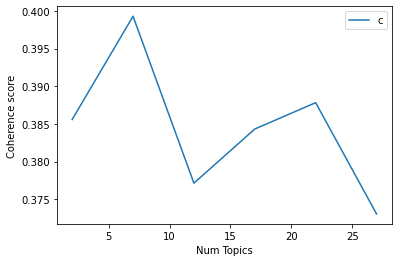

In [127]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_2018_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [128]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_2018_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 7

index: 0 | Num Topics = 2  has Coherence Value of 0.3856
index: 1 | Num Topics = 7  has Coherence Value of 0.3993
index: 2 | Num Topics = 12  has Coherence Value of 0.3771
index: 3 | Num Topics = 17  has Coherence Value of 0.3843
index: 4 | Num Topics = 22  has Coherence Value of 0.3878
index: 5 | Num Topics = 27  has Coherence Value of 0.373


In [171]:
# Select optimal number of topics
optimal_model_sg_2018_score1N2N3 = model_list_sg_2018_score1N2N3[1]

In [172]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_2018_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_sg_2018_score1N2N3, corpus_sg_2018_score1N2N3, id2word_sg_2018_score1N2N3)

In [173]:
print("pyLDAVis for SG topics for score=1,2,3 in 2018:")
vis_sg_2018_score1N2N3

pyLDAVis for SG topics for score=1,2,3 in 2018:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6      0.149233 -0.059566       1        1  21.850636
0      0.047105  0.226168       2        1  18.428441
3      0.149780 -0.051287       3        1  15.631386
2     -0.032434 -0.093145       4        1  15.511445
1     -0.040891  0.000421       5        1  12.171832
5     -0.118203 -0.015908       6        1   8.322046
4     -0.154590 -0.006682       7        1   8.084214, topic_info=          Term        Freq       Total Category  logprob  loglift
52     account  174.000000  174.000000  Default  30.0000  30.0000
57        post  233.000000  233.000000  Default  29.0000  29.0000
10      update  310.000000  310.000000  Default  28.0000  28.0000
3      feature  122.000000  122.000000  Default  27.0000  27.0000
59       still  155.000000  155.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
43    function    6.352832   60.420719   Topic7  -4.8535   0.2628
79        time    6.402097  107.998337   Topic7  -4.8457  -0.3102
22   instagram    7.074705  178.645401   Topic7  -4.7458  -0.7136
334       stop    4.022090   13.800545   Topic7  -5.3106   1.2824
53         app    4.425276  160.958025   Topic7  -5.2150  -1.0786

[471 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1091      7  0.775860  ability
107       1  0.239761     able
107       3  0.239761     able
107       4  0.119880     able
107       5  0.071928     able
...     ...       ...      ...
11        7  0.081237     year
12        1  0.063019      yet
12        2  0.063019      yet
12        3  0.756232      yet
12        6  0.063019      yet

[837 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 1, 4, 3, 2, 6, 5])

## By-rating of 2019 (Rating=1,2,3)

In [132]:
# By-rating Topic Modelling - rating = 1,2,3 in 2019
# Convert to list - move to each section
review_sg_2019_score1N2N3 = instagram_ios_sg_review_YearMonth_2019_score1N2N3.review.values.tolist()
review_words_sg_2019_score1N2N3 = list(sent_to_words(review_sg_2019_score1N2N3))
print(review_words_sg_2019_score1N2N3[:1])

[['instagram', 'is', 'very', 'good', 'app', 'generally', 'however', 'they', 'should', 'start', 'letting', 'us', 'hide', 'posts', 'from', 'certain', 'accounts', 'like', 'how', 'we', 'are', 'able', 'to', 'hide', 'stories', 'from', 'people', 'makes', 'everything', 'whole', 'lot', 'easier', 'that', 'way']]


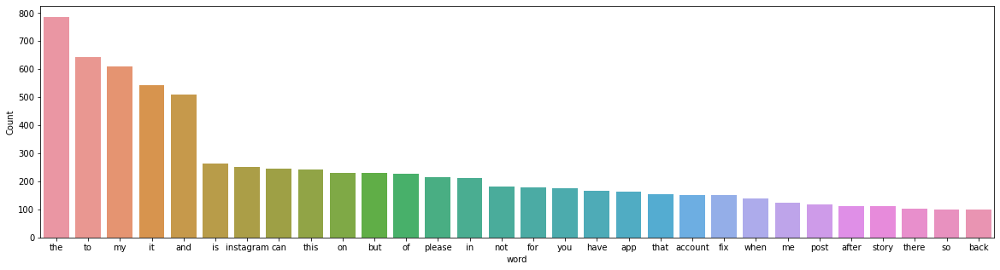

In [133]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_2019_score1N2N3))

In [134]:
# Clean text
review_words_sg_ready_2019_score1N2N3 = process_words(review_words_sg_2019_score1N2N3)  # processed Text Data! - move to each section

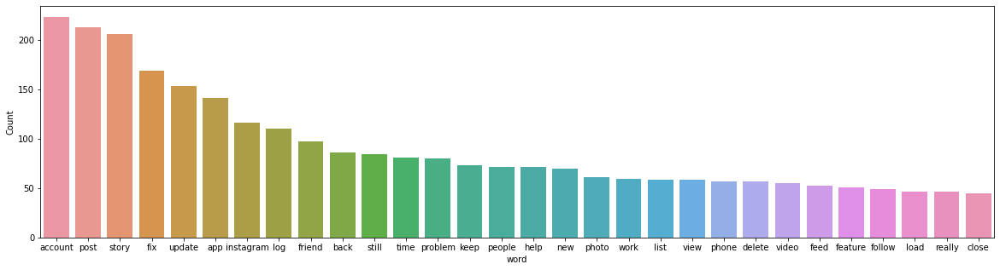

In [135]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_sg_ready_2019_score1N2N3))


In [136]:
# Create Dictionary
id2word_sg_2019_score1N2N3 = corpora.Dictionary(review_words_sg_ready_2019_score1N2N3)

2021-10-16 03:31:52,037 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 03:31:52,070 [INFO] gensim.corpora.dictionary - built Dictionary(1244 unique tokens: ['able', 'account', 'certain', 'generally', 'hide']...) from 691 documents (total 7831 corpus positions)
2021-10-16 03:31:52,072 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1244 unique tokens: ['able', 'account', 'certain', 'generally', 'hide']...) from 691 documents (total 7831 corpus positions)", 'datetime': '2021-10-16T03:31:52.071925', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [137]:
# Create Corpus: Term Document Frequency
corpus_sg_2019_score1N2N3 = [id2word_sg_2019_score1N2N3.doc2bow(text) for text in review_words_sg_ready_2019_score1N2N3]

In [138]:
# Training LDA model
model_list_sg_2019_score1N2N3, coherence_values_sg_2019_score1N2N3 = compute_coherence_values(dictionary=id2word_sg_2019_score1N2N3, corpus=corpus_sg_2019_score1N2N3, 
                                                              texts=review_words_sg_ready_2019_score1N2N3, limit=30, start=2, step=5)


2021-10-16 03:31:52,108 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 03:31:52,110 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 03:31:52,114 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 03:31:52,116 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 691 documents, updating model once every 691 documents, evaluating perplexity every 691 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 03:31:54,218 [INFO] gensim.models.ldamodel - -7.696 per-word bound, 207.3 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:31:54,219 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #691/691
2021-10-16 03:31:55,973 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.024*"post" + 0.022*"account" + 0.020*"update" + 0.018*"story" + 0.017*"fix" + 0.017*"log" + 0.017*"ins

2021-10-16 03:32:15,748 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.030*"account" + 0.029*"story" + 0.025*"post" + 0.022*"fix" + 0.018*"app" + 0.015*"log" + 0.015*"friend" + 0.013*"problem" + 0.013*"update" + 0.013*"keep"
2021-10-16 03:32:15,754 [INFO] gensim.models.ldamodel - topic diff=0.017513, rho=0.301511
2021-10-16 03:32:16,849 [INFO] gensim.models.ldamodel - -6.264 per-word bound, 76.9 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:32:16,850 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #691/691
2021-10-16 03:32:17,698 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.022*"post" + 0.022*"update" + 0.017*"account" + 0.015*"instagram" + 0.015*"new" + 0.015*"back" + 0.015*"story" + 0.014*"fix" + 0.012*"people" + 0.012*"app"
2021-10-16 03:32:17,700 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.031*"account" + 0.029*"story" + 0.025*"post" + 0.022*"fix" + 0.018*"app" + 0.016*"log" + 0.015*"friend" + 0.013*

2021-10-16 03:32:33,656 [INFO] gensim.models.ldamodel - topic diff=0.009172, rho=0.218218
2021-10-16 03:32:34,532 [INFO] gensim.models.ldamodel - -6.252 per-word bound, 76.2 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:32:34,535 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #691/691
2021-10-16 03:32:35,252 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.023*"post" + 0.023*"update" + 0.017*"new" + 0.015*"story" + 0.015*"back" + 0.014*"instagram" + 0.013*"people" + 0.013*"account" + 0.012*"fix" + 0.012*"follow"
2021-10-16 03:32:35,254 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"account" + 0.028*"story" + 0.024*"post" + 0.024*"fix" + 0.020*"log" + 0.019*"app" + 0.015*"friend" + 0.014*"problem" + 0.014*"keep" + 0.013*"still"
2021-10-16 03:32:35,258 [INFO] gensim.models.ldamodel - topic diff=0.008823, rho=0.213201
2021-10-16 03:32:36,271 [INFO] gensim.models.ldamodel - -6.251 per-word bound, 76.2 perplexity e

2021-10-16 03:32:50,862 [INFO] gensim.models.ldamodel - -6.245 per-word bound, 75.9 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:32:50,865 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #691/691
2021-10-16 03:32:51,554 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.023*"update" + 0.023*"post" + 0.018*"new" + 0.016*"story" + 0.015*"back" + 0.014*"instagram" + 0.013*"people" + 0.012*"follow" + 0.011*"account" + 0.011*"fix"
2021-10-16 03:32:51,556 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"account" + 0.028*"story" + 0.025*"fix" + 0.024*"post" + 0.021*"log" + 0.020*"app" + 0.016*"friend" + 0.014*"problem" + 0.014*"keep" + 0.014*"still"
2021-10-16 03:32:51,560 [INFO] gensim.models.ldamodel - topic diff=0.007018, rho=0.176777
2021-10-16 03:32:52,508 [INFO] gensim.models.ldamodel - -6.245 per-word bound, 75.8 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:32:52,50

2021-10-16 03:33:07,397 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #691/691
2021-10-16 03:33:08,106 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.024*"update" + 0.023*"post" + 0.018*"new" + 0.017*"story" + 0.015*"back" + 0.014*"instagram" + 0.014*"people" + 0.013*"follow" + 0.010*"like" + 0.010*"view"
2021-10-16 03:33:08,108 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"account" + 0.027*"story" + 0.025*"fix" + 0.024*"post" + 0.021*"log" + 0.020*"app" + 0.016*"friend" + 0.015*"problem" + 0.014*"keep" + 0.014*"still"
2021-10-16 03:33:08,109 [INFO] gensim.models.ldamodel - topic diff=0.004855, rho=0.154303
2021-10-16 03:33:09,016 [INFO] gensim.models.ldamodel - -6.240 per-word bound, 75.6 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:33:09,017 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #691/691
2021-10-16 03:33:09,748 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.024*"update" + 0

2021-10-16 03:33:22,763 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 03:33:27,462 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 03:33:27,528 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 638 virtual documents
2021-10-16 03:33:28,157 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-16 03:33:28,159 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-16 03:33:28,162 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 03:33:28,166 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 691 documents, updating model once every 691 documents, evaluating perplexity every 691 documents, iterating 50x with a con

2021-10-16 03:33:38,723 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.031*"instagram" + 0.019*"new" + 0.017*"account" + 0.017*"post" + 0.014*"fix" + 0.014*"story" + 0.014*"feature" + 0.013*"photo" + 0.013*"music" + 0.012*"filter"
2021-10-16 03:33:38,726 [INFO] gensim.models.ldamodel - topic diff=0.083244, rho=0.408248
2021-10-16 03:33:39,587 [INFO] gensim.models.ldamodel - -6.521 per-word bound, 91.8 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:33:39,590 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #691/691
2021-10-16 03:33:40,252 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.031*"instagram" + 0.019*"new" + 0.017*"post" + 0.016*"account" + 0.015*"feature" + 0.014*"photo" + 0.014*"fix" + 0.014*"remove" + 0.014*"music" + 0.013*"story"
2021-10-16 03:33:40,256 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.034*"account" + 0.034*"log" + 0.016*"phone" + 0.014*"back" + 0.013*"video" + 0.013*"instagram" + 0.012*

2021-10-16 03:33:48,016 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.032*"app" + 0.030*"fix" + 0.028*"post" + 0.025*"load" + 0.024*"update" + 0.021*"time" + 0.019*"keep" + 0.015*"crash" + 0.015*"people" + 0.014*"story"
2021-10-16 03:33:48,018 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.066*"account" + 0.040*"log" + 0.028*"problem" + 0.023*"error" + 0.023*"help" + 0.021*"wrong" + 0.018*"login" + 0.018*"time" + 0.018*"solve" + 0.017*"keep"
2021-10-16 03:33:48,020 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.033*"update" + 0.028*"account" + 0.027*"app" + 0.018*"post" + 0.018*"log" + 0.016*"fix" + 0.015*"instagram" + 0.015*"story" + 0.015*"phone" + 0.014*"video"
2021-10-16 03:33:48,021 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.074*"story" + 0.048*"post" + 0.028*"view" + 0.027*"list" + 0.023*"friend" + 0.021*"back" + 0.020*"share" + 0.019*"update" + 0.017*"close" + 0.015*"viewer"
2021-10-16 03:33:48,023 [INFO] gensim.models.ldamodel - topic diff=0.026556, rho

2021-10-16 03:33:56,098 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.076*"story" + 0.049*"post" + 0.028*"view" + 0.028*"list" + 0.025*"friend" + 0.022*"back" + 0.020*"share" + 0.019*"update" + 0.018*"close" + 0.015*"viewer"
2021-10-16 03:33:56,100 [INFO] gensim.models.ldamodel - topic diff=0.016866, rho=0.242536
2021-10-16 03:33:57,304 [INFO] gensim.models.ldamodel - -6.470 per-word bound, 88.7 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:33:57,305 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #691/691
2021-10-16 03:33:58,076 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.033*"instagram" + 0.020*"new" + 0.019*"feature" + 0.018*"music" + 0.018*"remove" + 0.017*"post" + 0.015*"photo" + 0.014*"filter" + 0.013*"fix" + 0.012*"account"
2021-10-16 03:33:58,079 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.035*"update" + 0.027*"app" + 0.022*"account" + 0.018*"post" + 0.016*"fix" + 0.016*"story" + 0.016*"video" 

2021-10-16 03:34:07,819 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.033*"instagram" + 0.020*"music" + 0.020*"new" + 0.019*"feature" + 0.019*"remove" + 0.016*"post" + 0.015*"photo" + 0.015*"filter" + 0.012*"fix" + 0.011*"account"
2021-10-16 03:34:07,823 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.025*"account" + 0.015*"phone" + 0.013*"follow" + 0.013*"back" + 0.013*"happen" + 0.012*"app" + 0.012*"video" + 0.012*"instagram" + 0.011*"log" + 0.011*"feed"
2021-10-16 03:34:07,825 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.035*"update" + 0.026*"app" + 0.019*"post" + 0.018*"account" + 0.017*"story" + 0.017*"video" + 0.016*"fix" + 0.016*"phone" + 0.015*"instagram" + 0.013*"still"
2021-10-16 03:34:07,827 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.078*"story" + 0.049*"post" + 0.029*"list" + 0.029*"view" + 0.026*"friend" + 0.022*"back" + 0.020*"share" + 0.020*"update" + 0.019*"close" + 0.016*"viewer"
2021-10-16 03:34:07,829 [INFO] gensim.models.ldamodel - topic di

2021-10-16 03:34:16,465 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"app" + 0.032*"fix" + 0.031*"post" + 0.027*"load" + 0.024*"update" + 0.021*"time" + 0.020*"keep" + 0.015*"people" + 0.015*"crash" + 0.015*"block"
2021-10-16 03:34:16,472 [INFO] gensim.models.ldamodel - topic diff=0.007702, rho=0.188982
2021-10-16 03:34:17,388 [INFO] gensim.models.ldamodel - -6.453 per-word bound, 87.6 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:34:17,389 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #691/691
2021-10-16 03:34:18,220 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.079*"story" + 0.050*"post" + 0.030*"list" + 0.029*"view" + 0.026*"friend" + 0.022*"back" + 0.020*"share" + 0.020*"update" + 0.019*"close" + 0.016*"viewer"
2021-10-16 03:34:18,225 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"app" + 0.032*"fix" + 0.031*"post" + 0.027*"load" + 0.024*"update" + 0.021*"time" + 0.020*"keep" + 0.015*"people"

2021-10-16 03:34:27,171 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"app" + 0.031*"fix" + 0.031*"post" + 0.027*"load" + 0.025*"update" + 0.021*"time" + 0.020*"keep" + 0.016*"people" + 0.015*"crash" + 0.015*"block"
2021-10-16 03:34:27,173 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.099*"account" + 0.071*"log" + 0.030*"problem" + 0.025*"help" + 0.023*"error" + 0.019*"solve" + 0.019*"keep" + 0.018*"wrong" + 0.018*"login" + 0.018*"time"
2021-10-16 03:34:27,174 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"update" + 0.026*"app" + 0.020*"post" + 0.018*"video" + 0.017*"story" + 0.017*"phone" + 0.017*"fix" + 0.015*"instagram" + 0.013*"still" + 0.013*"account"
2021-10-16 03:34:27,176 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.033*"instagram" + 0.025*"music" + 0.020*"feature" + 0.020*"new" + 0.019*"remove" + 0.015*"post" + 0.015*"filter" + 0.014*"photo" + 0.012*"fix" + 0.010*"find"
2021-10-16 03:34:27,179 [INFO] gensim.models.ldamodel - topic diff=0.005842

2021-10-16 03:34:36,683 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.081*"story" + 0.050*"post" + 0.030*"list" + 0.030*"view" + 0.027*"friend" + 0.022*"back" + 0.020*"close" + 0.020*"share" + 0.019*"update" + 0.016*"viewer"
2021-10-16 03:34:36,685 [INFO] gensim.models.ldamodel - topic diff=0.004630, rho=0.160128
2021-10-16 03:34:37,782 [INFO] gensim.models.ldamodel - -6.443 per-word bound, 87.0 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:34:37,783 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #691/691
2021-10-16 03:34:38,541 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.020*"account" + 0.014*"follow" + 0.013*"back" + 0.013*"happen" + 0.012*"phone" + 0.012*"instagram" + 0.012*"video" + 0.011*"app" + 0.011*"feed" + 0.010*"update"
2021-10-16 03:34:38,543 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.033*"instagram" + 0.027*"music" + 0.020*"feature" + 0.020*"new" + 0.019*"remove" + 0.015*"post" + 0.015*"f

2021-10-16 03:34:47,284 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"update" + 0.026*"app" + 0.020*"post" + 0.018*"video" + 0.018*"phone" + 0.018*"fix" + 0.017*"story" + 0.014*"instagram" + 0.013*"still" + 0.012*"back"
2021-10-16 03:34:47,286 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.019*"account" + 0.014*"follow" + 0.013*"back" + 0.013*"happen" + 0.012*"instagram" + 0.012*"video" + 0.012*"phone" + 0.011*"app" + 0.011*"feed" + 0.010*"hope"
2021-10-16 03:34:47,287 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.034*"app" + 0.032*"post" + 0.031*"fix" + 0.027*"load" + 0.026*"update" + 0.021*"time" + 0.020*"keep" + 0.016*"people" + 0.016*"crash" + 0.015*"block"
2021-10-16 03:34:47,288 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.038*"fix" + 0.023*"account" + 0.023*"message" + 0.022*"post" + 0.019*"follow" + 0.014*"people" + 0.014*"update" + 0.013*"follower" + 0.013*"send" + 0.013*"app"
2021-10-16 03:34:47,290 [INFO] gensim.models.ldamodel - topic diff=0.003

2021-10-16 03:34:54,770 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.038*"fix" + 0.023*"account" + 0.023*"message" + 0.022*"post" + 0.019*"follow" + 0.014*"people" + 0.014*"update" + 0.013*"follower" + 0.013*"send" + 0.012*"app"
2021-10-16 03:34:54,771 [INFO] gensim.models.ldamodel - topic diff=0.002812, rho=0.141421
2021-10-16 03:34:55,655 [INFO] gensim.models.ldamodel - -6.438 per-word bound, 86.7 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:34:55,657 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #691/691
2021-10-16 03:34:56,214 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.033*"instagram" + 0.029*"music" + 0.022*"feature" + 0.019*"new" + 0.019*"remove" + 0.016*"filter" + 0.015*"post" + 0.014*"photo" + 0.013*"fix" + 0.010*"available"
2021-10-16 03:34:56,216 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"update" + 0.026*"app" + 0.020*"post" + 0.018*"video" + 0.018*"phone" + 0.018*"fix" + 0.017*"st

2021-10-16 03:35:09,152 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.036*"app" + 0.030*"fix" + 0.024*"keep" + 0.024*"update" + 0.022*"post" + 0.020*"time" + 0.018*"load" + 0.016*"people" + 0.013*"block" + 0.013*"account"
2021-10-16 03:35:09,153 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.047*"story" + 0.030*"view" + 0.023*"hour" + 0.021*"viewer" + 0.019*"post" + 0.018*"instagram" + 0.018*"list" + 0.015*"fix" + 0.013*"photo" + 0.012*"back"
2021-10-16 03:35:09,154 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.053*"log" + 0.040*"account" + 0.021*"app" + 0.019*"phone" + 0.017*"instagram" + 0.015*"fix" + 0.015*"friend" + 0.014*"back" + 0.012*"long" + 0.012*"problem"
2021-10-16 03:35:09,155 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.034*"update" + 0.025*"problem" + 0.022*"delete" + 0.021*"account" + 0.020*"post" + 0.019*"app" + 0.018*"story" + 0.017*"fix" + 0.016*"friend" + 0.014*"video"
2021-10-16 03:35:09,156 [INFO] gensim.models.ldamodel - topic diff=0.12030

2021-10-16 03:35:17,057 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.073*"post" + 0.062*"story" + 0.037*"friend" + 0.035*"share" + 0.029*"close" + 0.018*"option" + 0.017*"help" + 0.016*"add" + 0.016*"fix" + 0.016*"list"
2021-10-16 03:35:17,058 [INFO] gensim.models.ldamodel - topic diff=0.048592, rho=0.316228
2021-10-16 03:35:17,977 [INFO] gensim.models.ldamodel - -6.604 per-word bound, 97.3 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:35:17,982 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #691/691
2021-10-16 03:35:18,657 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.053*"log" + 0.047*"account" + 0.021*"phone" + 0.020*"app" + 0.018*"friend" + 0.017*"instagram" + 0.016*"fix" + 0.015*"back" + 0.012*"long" + 0.012*"work"
2021-10-16 03:35:18,659 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.035*"update" + 0.026*"problem" + 0.025*"delete" + 0.020*"app" + 0.018*"video" + 0.016*"post" + 0.015*"account" + 0.01

2021-10-16 03:35:26,420 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.079*"account" + 0.044*"log" + 0.034*"error" + 0.027*"login" + 0.025*"help" + 0.023*"wrong" + 0.022*"fix" + 0.019*"problem" + 0.018*"request" + 0.016*"keep"
2021-10-16 03:35:26,423 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.043*"app" + 0.028*"fix" + 0.028*"update" + 0.023*"keep" + 0.023*"load" + 0.023*"post" + 0.022*"time" + 0.016*"open" + 0.016*"people" + 0.015*"block"
2021-10-16 03:35:26,427 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.049*"back" + 0.029*"like" + 0.028*"remove" + 0.024*"photo" + 0.023*"bring" + 0.023*"update" + 0.020*"old" + 0.016*"hope" + 0.016*"new" + 0.016*"allow"
2021-10-16 03:35:26,430 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.049*"account" + 0.038*"fix" + 0.034*"version" + 0.033*"late" + 0.030*"update" + 0.028*"available" + 0.020*"give" + 0.018*"error" + 0.015*"friend" + 0.014*"new"
2021-10-16 03:35:26,431 [INFO] gensim.models.ldamodel - topic diff=0.020271, rh

2021-10-16 03:35:34,199 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.042*"account" + 0.037*"phone" + 0.035*"work" + 0.027*"instagram" + 0.024*"app" + 0.023*"iphone" + 0.021*"notification" + 0.020*"post" + 0.019*"delete" + 0.019*"back"
2021-10-16 03:35:34,207 [INFO] gensim.models.ldamodel - topic diff=0.013391, rho=0.218218
2021-10-16 03:35:35,034 [INFO] gensim.models.ldamodel - -6.560 per-word bound, 94.4 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:35:35,035 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #691/691
2021-10-16 03:35:35,635 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.078*"post" + 0.073*"story" + 0.047*"friend" + 0.038*"close" + 0.036*"share" + 0.021*"list" + 0.018*"option" + 0.018*"help" + 0.016*"fix" + 0.015*"add"
2021-10-16 03:35:35,640 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.041*"account" + 0.038*"fix" + 0.026*"follow" + 0.019*"message" + 0.018*"people" + 0.018*"log" + 0.014*"se

2021-10-16 03:35:42,849 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.050*"video" + 0.019*"fix" + 0.018*"second" + 0.016*"story" + 0.015*"still" + 0.014*"post" + 0.014*"update" + 0.014*"cut" + 0.014*"hope" + 0.013*"iphone"
2021-10-16 03:35:42,854 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.080*"post" + 0.076*"story" + 0.049*"friend" + 0.039*"close" + 0.036*"share" + 0.022*"list" + 0.018*"option" + 0.018*"help" + 0.016*"fix" + 0.015*"account"
2021-10-16 03:35:42,859 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"app" + 0.028*"update" + 0.027*"fix" + 0.024*"keep" + 0.024*"load" + 0.023*"post" + 0.022*"time" + 0.016*"open" + 0.015*"block" + 0.015*"people"
2021-10-16 03:35:42,863 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.093*"account" + 0.070*"log" + 0.035*"error" + 0.026*"help" + 0.025*"login" + 0.022*"fix" + 0.021*"wrong" + 0.021*"problem" + 0.018*"keep" + 0.017*"request"
2021-10-16 03:35:42,865 [INFO] gensim.models.ldamodel - topic diff=0.009386, rho=0.

2021-10-16 03:35:50,288 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.045*"account" + 0.040*"version" + 0.040*"late" + 0.039*"fix" + 0.032*"update" + 0.029*"available" + 0.020*"give" + 0.016*"post" + 0.015*"new" + 0.014*"feature"
2021-10-16 03:35:50,290 [INFO] gensim.models.ldamodel - topic diff=0.007307, rho=0.176777
2021-10-16 03:35:51,103 [INFO] gensim.models.ldamodel - -6.544 per-word bound, 93.3 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:35:51,104 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #691/691
2021-10-16 03:35:51,727 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.038*"fix" + 0.038*"account" + 0.027*"follow" + 0.020*"message" + 0.019*"people" + 0.015*"send" + 0.014*"bug" + 0.014*"follower" + 0.012*"person" + 0.011*"new"
2021-10-16 03:35:51,730 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.048*"post" + 0.048*"story" + 0.030*"music" + 0.027*"app" + 0.026*"update" + 0.023*"refresh" + 0.020*"i

2021-10-16 03:35:58,941 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.101*"account" + 0.084*"log" + 0.034*"error" + 0.026*"help" + 0.024*"login" + 0.022*"fix" + 0.021*"problem" + 0.020*"wrong" + 0.018*"work" + 0.017*"time"
2021-10-16 03:35:58,943 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"app" + 0.028*"update" + 0.025*"fix" + 0.025*"keep" + 0.023*"post" + 0.022*"load" + 0.022*"time" + 0.017*"open" + 0.015*"block" + 0.014*"people"
2021-10-16 03:35:58,952 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.051*"video" + 0.020*"fix" + 0.018*"second" + 0.017*"cut" + 0.016*"story" + 0.015*"iphone" + 0.015*"still" + 0.014*"hope" + 0.014*"post" + 0.014*"update"
2021-10-16 03:35:58,957 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.065*"story" + 0.052*"view" + 0.032*"viewer" + 0.031*"list" + 0.031*"hour" + 0.022*"back" + 0.018*"post" + 0.017*"bring" + 0.014*"instagram" + 0.013*"feature"
2021-10-16 03:35:58,959 [INFO] gensim.models.ldamodel - topic diff=0.005115, rho=0.

2021-10-16 03:36:06,184 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.051*"video" + 0.021*"fix" + 0.018*"second" + 0.017*"cut" + 0.016*"story" + 0.015*"iphone" + 0.015*"hope" + 0.014*"still" + 0.014*"post" + 0.014*"update"
2021-10-16 03:36:06,187 [INFO] gensim.models.ldamodel - topic diff=0.003961, rho=0.152499
2021-10-16 03:36:07,042 [INFO] gensim.models.ldamodel - -6.535 per-word bound, 92.7 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:36:07,043 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #691/691
2021-10-16 03:36:07,759 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.103*"account" + 0.087*"log" + 0.034*"error" + 0.025*"help" + 0.023*"login" + 0.022*"fix" + 0.021*"problem" + 0.019*"wrong" + 0.019*"work" + 0.017*"time"
2021-10-16 03:36:07,761 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.044*"version" + 0.041*"late" + 0.041*"account" + 0.039*"fix" + 0.033*"update" + 0.033*"available" + 0.019*"give" + 

2021-10-16 03:36:14,660 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.066*"story" + 0.053*"view" + 0.032*"viewer" + 0.032*"list" + 0.031*"hour" + 0.023*"back" + 0.018*"post" + 0.017*"bring" + 0.014*"instagram" + 0.014*"feature"
2021-10-16 03:36:14,662 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.045*"version" + 0.041*"late" + 0.040*"account" + 0.039*"fix" + 0.034*"available" + 0.034*"update" + 0.019*"give" + 0.015*"new" + 0.015*"post" + 0.015*"feature"
2021-10-16 03:36:14,663 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"app" + 0.027*"update" + 0.025*"keep" + 0.025*"fix" + 0.023*"post" + 0.022*"time" + 0.021*"load" + 0.017*"open" + 0.015*"block" + 0.014*"people"
2021-10-16 03:36:14,666 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.051*"video" + 0.021*"fix" + 0.018*"second" + 0.017*"cut" + 0.016*"story" + 0.015*"iphone" + 0.015*"hope" + 0.014*"still" + 0.014*"post" + 0.014*"update"
2021-10-16 03:36:14,667 [INFO] gensim.models.ldamodel - topic diff=0.003147

2021-10-16 03:36:27,813 [INFO] gensim.models.ldamodel - topic diff=0.171696, rho=0.577350
2021-10-16 03:36:28,846 [INFO] gensim.models.ldamodel - -6.940 per-word bound, 122.8 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:36:28,848 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #691/691
2021-10-16 03:36:29,452 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.034*"photo" + 0.029*"back" + 0.021*"update" + 0.017*"fix" + 0.016*"bring" + 0.015*"user" + 0.014*"like" + 0.013*"instagram" + 0.011*"comment" + 0.011*"highlight"
2021-10-16 03:36:29,455 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.035*"account" + 0.023*"update" + 0.022*"music" + 0.021*"fix" + 0.020*"people" + 0.019*"error" + 0.017*"delete" + 0.017*"log" + 0.016*"feature" + 0.015*"app"
2021-10-16 03:36:29,458 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.081*"story" + 0.047*"post" + 0.032*"view" + 0.031*"share" + 0.021*"help" + 0.019*"add" + 0.018*"accoun

2021-10-16 03:36:37,027 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.030*"account" + 0.022*"phone" + 0.019*"story" + 0.015*"update" + 0.015*"fix" + 0.014*"post" + 0.014*"video" + 0.014*"new" + 0.014*"load" + 0.012*"time"
2021-10-16 03:36:37,028 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.103*"story" + 0.052*"post" + 0.046*"view" + 0.038*"share" + 0.026*"add" + 0.019*"account" + 0.018*"fix" + 0.018*"option" + 0.016*"like" + 0.016*"back"
2021-10-16 03:36:37,030 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.038*"story" + 0.031*"update" + 0.028*"account" + 0.027*"fix" + 0.025*"music" + 0.024*"friend" + 0.020*"post" + 0.019*"instagram" + 0.016*"app" + 0.014*"back"
2021-10-16 03:36:37,031 [INFO] gensim.models.ldamodel - topic diff=0.072325, rho=0.333333
2021-10-16 03:36:37,834 [INFO] gensim.models.ldamodel - -6.746 per-word bound, 107.3 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:36:37,835 [INFO] gensim.models.ldamodel -

2021-10-16 03:36:44,225 [INFO] gensim.models.ldamodel - topic diff=0.031636, rho=0.267261
2021-10-16 03:36:45,161 [INFO] gensim.models.ldamodel - -6.706 per-word bound, 104.4 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:36:45,162 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #691/691
2021-10-16 03:36:45,839 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.041*"photo" + 0.032*"back" + 0.020*"update" + 0.018*"bring" + 0.018*"user" + 0.017*"like" + 0.016*"save" + 0.015*"comment" + 0.014*"instagram" + 0.013*"highlight"
2021-10-16 03:36:45,842 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.029*"account" + 0.021*"phone" + 0.019*"story" + 0.016*"update" + 0.016*"video" + 0.015*"new" + 0.015*"post" + 0.014*"time" + 0.014*"load" + 0.014*"happen"
2021-10-16 03:36:45,896 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.034*"story" + 0.031*"update" + 0.029*"account" + 0.027*"fix" + 0.026*"music" + 0.024*"friend" + 0.020*

2021-10-16 03:36:52,990 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.116*"story" + 0.054*"post" + 0.053*"view" + 0.038*"share" + 0.035*"add" + 0.019*"fix" + 0.019*"option" + 0.018*"update" + 0.017*"back" + 0.016*"account"
2021-10-16 03:36:52,992 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.035*"delete" + 0.033*"still" + 0.030*"old" + 0.022*"fix" + 0.020*"new" + 0.019*"post" + 0.019*"account" + 0.016*"people" + 0.015*"feature" + 0.013*"work"
2021-10-16 03:36:52,994 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.046*"follower" + 0.023*"activity" + 0.018*"problem" + 0.018*"video" + 0.018*"number" + 0.017*"pls" + 0.016*"sometimes" + 0.016*"remove" + 0.014*"suddenly" + 0.012*"show"
2021-10-16 03:36:52,995 [INFO] gensim.models.ldamodel - topic diff=0.016133, rho=0.223607
2021-10-16 03:36:53,914 [INFO] gensim.models.ldamodel - -6.686 per-word bound, 102.9 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:36:53,916 [INFO] gensim.

2021-10-16 03:37:00,157 [INFO] gensim.models.ldamodel - topic diff=0.011710, rho=0.200000
2021-10-16 03:37:00,951 [INFO] gensim.models.ldamodel - -6.673 per-word bound, 102.0 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:37:00,952 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #691/691
2021-10-16 03:37:01,606 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.057*"list" + 0.052*"viewer" + 0.045*"story" + 0.043*"hour" + 0.032*"feature" + 0.027*"bring" + 0.027*"back" + 0.026*"remove" + 0.026*"view" + 0.019*"guy"
2021-10-16 03:37:01,609 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.029*"instagram" + 0.021*"story" + 0.018*"friend" + 0.017*"new" + 0.017*"fix" + 0.017*"help" + 0.017*"music" + 0.015*"find" + 0.015*"notification" + 0.015*"problem"
2021-10-16 03:37:01,612 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.029*"account" + 0.020*"story" + 0.019*"phone" + 0.016*"happen" + 0.016*"post" + 0.015*"video" + 0.015*"

2021-10-16 03:37:09,093 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.029*"instagram" + 0.021*"story" + 0.018*"friend" + 0.017*"fix" + 0.017*"music" + 0.017*"new" + 0.017*"help" + 0.016*"find" + 0.016*"notification" + 0.015*"problem"
2021-10-16 03:37:09,098 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.034*"delete" + 0.032*"old" + 0.031*"still" + 0.022*"new" + 0.022*"fix" + 0.019*"post" + 0.016*"people" + 0.015*"feature" + 0.014*"night" + 0.014*"account"
2021-10-16 03:37:09,101 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.060*"list" + 0.052*"viewer" + 0.046*"story" + 0.043*"hour" + 0.033*"feature" + 0.029*"remove" + 0.028*"back" + 0.027*"bring" + 0.027*"view" + 0.019*"guy"
2021-10-16 03:37:09,103 [INFO] gensim.models.ldamodel - topic diff=0.008718, rho=0.179605
2021-10-16 03:37:09,946 [INFO] gensim.models.ldamodel - -6.662 per-word bound, 101.3 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:37:09,947 [INFO] gensim.model

2021-10-16 03:37:16,033 [INFO] gensim.models.ldamodel - topic diff=0.007023, rho=0.166667
2021-10-16 03:37:16,841 [INFO] gensim.models.ldamodel - -6.655 per-word bound, 100.8 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:37:16,843 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #691/691
2021-10-16 03:37:17,451 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.041*"photo" + 0.034*"back" + 0.020*"save" + 0.019*"bring" + 0.019*"like" + 0.018*"user" + 0.018*"highlight" + 0.016*"update" + 0.015*"comment" + 0.014*"instagram"
2021-10-16 03:37:17,453 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.137*"account" + 0.106*"log" + 0.037*"fix" + 0.033*"error" + 0.025*"keep" + 0.020*"still" + 0.019*"phone" + 0.018*"request" + 0.018*"help" + 0.018*"delete"
2021-10-16 03:37:17,456 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.085*"follower" + 0.022*"activity" + 0.022*"video" + 0.017*"number" + 0.017*"pls" + 0.017*"remove" + 0

2021-10-16 03:37:24,506 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.036*"follow" + 0.025*"new" + 0.021*"like" + 0.021*"feature" + 0.020*"time" + 0.019*"app" + 0.018*"instagram" + 0.018*"update" + 0.017*"still" + 0.015*"post"
2021-10-16 03:37:24,514 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.062*"app" + 0.043*"update" + 0.034*"crash" + 0.032*"keep" + 0.027*"fix" + 0.022*"time" + 0.022*"load" + 0.022*"block" + 0.021*"version" + 0.020*"open"
2021-10-16 03:37:24,520 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.031*"update" + 0.027*"story" + 0.026*"fix" + 0.021*"friend" + 0.020*"post" + 0.017*"music" + 0.016*"account" + 0.016*"still" + 0.016*"instagram" + 0.015*"app"
2021-10-16 03:37:24,524 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.059*"music" + 0.029*"instagram" + 0.027*"people" + 0.023*"account" + 0.021*"available" + 0.021*"late" + 0.021*"update" + 0.021*"delete" + 0.019*"reason" + 0.019*"instal"
2021-10-16 03:37:24,527 [INFO] gensim.models.ldamodel - 

2021-10-16 03:37:31,482 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.031*"instagram" + 0.020*"story" + 0.019*"music" + 0.018*"friend" + 0.018*"fix" + 0.017*"find" + 0.017*"help" + 0.016*"new" + 0.016*"notification" + 0.015*"problem"
2021-10-16 03:37:31,490 [INFO] gensim.models.ldamodel - topic diff=0.004248, rho=0.145865
2021-10-16 03:37:32,289 [INFO] gensim.models.ldamodel - -6.644 per-word bound, 100.0 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:37:32,290 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #691/691
2021-10-16 03:37:32,784 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.063*"list" + 0.053*"viewer" + 0.047*"story" + 0.043*"hour" + 0.035*"feature" + 0.035*"remove" + 0.031*"back" + 0.029*"view" + 0.026*"bring" + 0.020*"update"
2021-10-16 03:37:32,789 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.036*"follow" + 0.026*"new" + 0.021*"like" + 0.021*"feature" + 0.020*"time" + 0.019*"app" + 0.018*"i

2021-10-16 03:37:46,046 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.035*"account" + 0.029*"fix" + 0.026*"friend" + 0.021*"keep" + 0.019*"app" + 0.019*"instagram" + 0.019*"message" + 0.015*"add" + 0.015*"update" + 0.014*"error"
2021-10-16 03:37:46,047 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.035*"app" + 0.030*"update" + 0.029*"fix" + 0.029*"story" + 0.019*"keep" + 0.018*"time" + 0.016*"post" + 0.015*"account" + 0.014*"feature" + 0.014*"back"
2021-10-16 03:37:46,051 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.027*"fix" + 0.024*"update" + 0.018*"instagram" + 0.018*"account" + 0.017*"load" + 0.017*"people" + 0.016*"story" + 0.015*"look" + 0.015*"notification" + 0.014*"feature"
2021-10-16 03:37:46,053 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.032*"post" + 0.031*"story" + 0.022*"view" + 0.018*"instagram" + 0.016*"fix" + 0.015*"time" + 0.015*"account" + 0.014*"option" + 0.014*"people" + 0.014*"help"
2021-10-16 03:37:46,054 [INFO] gensim.models.ldamodel - 

2021-10-16 03:37:53,459 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.060*"account" + 0.045*"log" + 0.041*"fix" + 0.023*"wrong" + 0.022*"delete" + 0.018*"post" + 0.017*"time" + 0.017*"keep" + 0.016*"update" + 0.013*"button"
2021-10-16 03:37:53,460 [INFO] gensim.models.ldamodel - topic diff=0.091440, rho=0.377964
2021-10-16 03:37:54,309 [INFO] gensim.models.ldamodel - -6.881 per-word bound, 117.9 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:37:54,311 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #691/691
2021-10-16 03:37:54,817 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.072*"story" + 0.052*"post" + 0.043*"share" + 0.020*"friend" + 0.017*"list" + 0.016*"hour" + 0.016*"viewer" + 0.015*"help" + 0.014*"feature" + 0.013*"option"
2021-10-16 03:37:54,821 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.026*"update" + 0.023*"time" + 0.023*"post" + 0.022*"problem" + 0.022*"fix" + 0.017*"app" + 0.016*"back" + 0.0

2021-10-16 03:38:02,125 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.027*"music" + 0.021*"fix" + 0.021*"max" + 0.020*"iphone" + 0.015*"give" + 0.015*"instagram" + 0.015*"singapore" + 0.014*"well" + 0.009*"notification" + 0.009*"issue"
2021-10-16 03:38:02,136 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.078*"friend" + 0.074*"close" + 0.052*"app" + 0.043*"open" + 0.042*"list" + 0.037*"fix" + 0.033*"music" + 0.028*"instagram" + 0.023*"update" + 0.021*"available"
2021-10-16 03:38:02,149 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.045*"video" + 0.024*"post" + 0.023*"instagram" + 0.021*"second" + 0.019*"hope" + 0.018*"feed" + 0.018*"update" + 0.018*"app" + 0.013*"photo" + 0.012*"story"
2021-10-16 03:38:02,158 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.066*"account" + 0.035*"still" + 0.032*"log" + 0.021*"delete" + 0.019*"follow" + 0.017*"fix" + 0.017*"change" + 0.016*"app" + 0.015*"post" + 0.015*"new"
2021-10-16 03:38:02,164 [INFO] gensim.models.ldamodel - top

2021-10-16 03:38:09,437 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.038*"story" + 0.036*"post" + 0.028*"tag" + 0.022*"repost" + 0.021*"update" + 0.021*"work" + 0.019*"reason" + 0.018*"countdown" + 0.017*"star" + 0.017*"sticker"
2021-10-16 03:38:09,438 [INFO] gensim.models.ldamodel - topic diff=0.025250, rho=0.235702
2021-10-16 03:38:10,311 [INFO] gensim.models.ldamodel - -6.778 per-word bound, 109.8 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:38:10,312 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #691/691
2021-10-16 03:38:10,929 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.049*"update" + 0.039*"story" + 0.023*"video" + 0.023*"post" + 0.019*"play" + 0.016*"friend" + 0.015*"fix" + 0.015*"still" + 0.015*"type" + 0.014*"insta"
2021-10-16 03:38:10,930 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.126*"account" + 0.088*"log" + 0.037*"error" + 0.032*"login" + 0.028*"help" + 0.027*"problem" + 0.025*"time

2021-10-16 03:38:18,097 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.045*"post" + 0.036*"people" + 0.032*"view" + 0.032*"block" + 0.028*"story" + 0.021*"comment" + 0.020*"allow" + 0.015*"problem" + 0.015*"time" + 0.013*"report"
2021-10-16 03:38:18,103 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.074*"post" + 0.058*"story" + 0.036*"feed" + 0.030*"app" + 0.030*"refresh" + 0.026*"add" + 0.023*"instagram" + 0.017*"still" + 0.016*"music" + 0.016*"load"
2021-10-16 03:38:18,134 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.050*"remove" + 0.033*"like" + 0.030*"back" + 0.024*"photo" + 0.021*"people" + 0.018*"well" + 0.016*"user" + 0.014*"view" + 0.014*"contact" + 0.014*"upload"
2021-10-16 03:38:18,162 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.055*"account" + 0.036*"upload" + 0.033*"guy" + 0.028*"post" + 0.025*"log" + 0.024*"fix" + 0.018*"problem" + 0.016*"update" + 0.015*"photo" + 0.015*"stop"
2021-10-16 03:38:18,163 [INFO] gensim.models.ldamodel - topic #20 (0.04

2021-10-16 03:38:25,017 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.044*"fix" + 0.044*"account" + 0.029*"wrong" + 0.025*"log" + 0.024*"unable" + 0.020*"update" + 0.015*"issue" + 0.015*"button" + 0.015*"keep" + 0.015*"post"
2021-10-16 03:38:25,022 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.089*"crash" + 0.076*"late" + 0.054*"update" + 0.048*"keep" + 0.043*"version" + 0.040*"fix" + 0.027*"new" + 0.023*"error" + 0.016*"iphone" + 0.015*"already"
2021-10-16 03:38:25,025 [INFO] gensim.models.ldamodel - topic diff=0.012852, rho=0.185695
2021-10-16 03:38:25,842 [INFO] gensim.models.ldamodel - -6.735 per-word bound, 106.5 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:38:25,843 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #691/691
2021-10-16 03:38:26,430 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.144*"account" + 0.098*"log" + 0.036*"error" + 0.028*"help" + 0.028*"login" + 0.026*"work" + 0.025*"keep" + 0

2021-10-16 03:38:32,768 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #691/691
2021-10-16 03:38:33,355 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.028*"update" + 0.028*"time" + 0.027*"problem" + 0.025*"solve" + 0.024*"app" + 0.023*"post" + 0.022*"fix" + 0.022*"still" + 0.016*"uninstall" + 0.016*"hope"
2021-10-16 03:38:33,357 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.046*"post" + 0.037*"people" + 0.034*"block" + 0.023*"comment" + 0.021*"allow" + 0.016*"view" + 0.016*"time" + 0.016*"story" + 0.016*"problem" + 0.014*"follow"
2021-10-16 03:38:33,359 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.094*"friend" + 0.074*"close" + 0.048*"app" + 0.047*"list" + 0.044*"music" + 0.041*"open" + 0.040*"fix" + 0.032*"instagram" + 0.028*"update" + 0.024*"available"
2021-10-16 03:38:33,363 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.074*"post" + 0.058*"story" + 0.039*"feed" + 0.033*"refresh" + 0.031*"app" + 0.026*"add" + 0.021*"instagram" + 0.020*"load" 

2021-10-16 03:38:39,907 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.063*"account" + 0.040*"still" + 0.028*"log" + 0.022*"delete" + 0.018*"follow" + 0.018*"change" + 0.016*"fix" + 0.015*"app" + 0.014*"work" + 0.013*"help"
2021-10-16 03:38:39,914 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.090*"crash" + 0.076*"late" + 0.055*"update" + 0.050*"keep" + 0.042*"version" + 0.041*"fix" + 0.027*"new" + 0.021*"error" + 0.018*"iphone" + 0.016*"always"
2021-10-16 03:38:39,918 [INFO] gensim.models.ldamodel - topic diff=0.007943, rho=0.158114
2021-10-16 03:38:40,650 [INFO] gensim.models.ldamodel - -6.712 per-word bound, 104.9 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:38:40,651 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #691/691
2021-10-16 03:38:41,248 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.044*"story" + 0.038*"bug" + 0.036*"follower" + 0.028*"word" + 0.026*"issue" + 0.025*"fix" + 0.022*"turn" + 0.0

2021-10-16 03:38:47,681 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #691/691
2021-10-16 03:38:48,213 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.155*"account" + 0.108*"log" + 0.037*"error" + 0.029*"help" + 0.028*"work" + 0.027*"keep" + 0.026*"login" + 0.025*"problem" + 0.024*"delete" + 0.023*"time"
2021-10-16 03:38:48,215 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.036*"post" + 0.033*"photo" + 0.025*"instagram" + 0.022*"edit" + 0.022*"app" + 0.019*"still" + 0.017*"email" + 0.015*"video" + 0.014*"fix" + 0.013*"time"
2021-10-16 03:38:48,219 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.040*"phone" + 0.029*"highlight" + 0.027*"story" + 0.023*"update" + 0.021*"insta" + 0.018*"change" + 0.017*"instagram" + 0.017*"account" + 0.016*"find" + 0.014*"video"
2021-10-16 03:38:48,226 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.043*"app" + 0.036*"update" + 0.029*"story" + 0.023*"keep" + 0.020*"fix" + 0.019*"post" + 0.017*"time" + 0.016*"back" + 0.015

2021-10-16 03:38:55,046 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.059*"remove" + 0.031*"like" + 0.026*"back" + 0.023*"photo" + 0.021*"people" + 0.017*"well" + 0.017*"user" + 0.014*"upload" + 0.014*"contact" + 0.014*"thing"
2021-10-16 03:38:55,053 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.040*"phone" + 0.029*"highlight" + 0.026*"story" + 0.023*"update" + 0.019*"insta" + 0.018*"change" + 0.017*"instagram" + 0.017*"account" + 0.016*"find" + 0.014*"video"
2021-10-16 03:38:55,057 [INFO] gensim.models.ldamodel - topic diff=0.004629, rho=0.140028
2021-10-16 03:38:55,062 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=1244, num_topics=22, decay=0.5, chunksize=1000) in 71.47s', 'datetime': '2021-10-16T03:38:55.061852', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 03:38:55,086 [INFO] gensim.topic_coherence.probability_estim

2021-10-16 03:39:10,088 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #691/691
2021-10-16 03:39:10,637 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.099*"account" + 0.080*"log" + 0.024*"still" + 0.023*"post" + 0.021*"delete" + 0.020*"fix" + 0.017*"way" + 0.016*"update" + 0.013*"change" + 0.013*"story"
2021-10-16 03:39:10,640 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.089*"story" + 0.047*"list" + 0.042*"view" + 0.041*"hour" + 0.039*"post" + 0.030*"back" + 0.029*"viewer" + 0.022*"close" + 0.021*"help" + 0.018*"friend"
2021-10-16 03:39:10,642 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.055*"app" + 0.038*"crash" + 0.032*"story" + 0.028*"post" + 0.028*"fix" + 0.026*"open" + 0.022*"issue" + 0.020*"look" + 0.019*"time" + 0.018*"whenever"
2021-10-16 03:39:10,645 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.051*"post" + 0.030*"problem" + 0.029*"story" + 0.026*"fix" + 0.024*"account" + 0.024*"picture" + 0.022*"people" + 0.020*"update" + 0.020*"ins

2021-10-16 03:39:17,917 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.188*"friend" + 0.161*"close" + 0.122*"list" + 0.022*"feature" + 0.017*"slow" + 0.013*"already" + 0.012*"month" + 0.012*"view" + 0.012*"open" + 0.011*"important"
2021-10-16 03:39:17,919 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.038*"story" + 0.038*"update" + 0.029*"fix" + 0.028*"new" + 0.022*"feature" + 0.021*"app" + 0.021*"instagram" + 0.021*"post" + 0.020*"music" + 0.016*"late"
2021-10-16 03:39:17,923 [INFO] gensim.models.ldamodel - topic diff=0.063408, rho=0.301511
2021-10-16 03:39:18,781 [INFO] gensim.models.ldamodel - -6.912 per-word bound, 120.4 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:39:18,784 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #691/691
2021-10-16 03:39:19,312 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.052*"post" + 0.032*"problem" + 0.028*"picture" + 0.026*"fix" + 0.025*"account" + 0.023*"story" + 0.022

2021-10-16 03:39:25,675 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #691/691
2021-10-16 03:39:26,244 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.030*"update" + 0.023*"post" + 0.023*"story" + 0.022*"time" + 0.019*"login" + 0.018*"tell" + 0.017*"main" + 0.016*"keep" + 0.015*"still" + 0.014*"video"
2021-10-16 03:39:26,245 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.144*"account" + 0.141*"log" + 0.034*"fix" + 0.030*"error" + 0.025*"keep" + 0.025*"request" + 0.020*"sorry" + 0.020*"delete" + 0.019*"problem" + 0.016*"post"
2021-10-16 03:39:26,247 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.082*"post" + 0.028*"story" + 0.022*"feed" + 0.022*"feature" + 0.020*"upload" + 0.019*"instagram" + 0.019*"lose" + 0.019*"photo" + 0.018*"app" + 0.017*"unable"
2021-10-16 03:39:26,249 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.050*"account" + 0.034*"wrong" + 0.027*"post" + 0.027*"guy" + 0.027*"help" + 0.022*"story" + 0.018*"login" + 0.016*"private" + 0.01

2021-10-16 03:39:33,353 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.059*"post" + 0.032*"picture" + 0.031*"problem" + 0.027*"load" + 0.026*"fix" + 0.026*"account" + 0.024*"app" + 0.022*"follower" + 0.020*"time" + 0.020*"add"
2021-10-16 03:39:33,356 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.042*"delete" + 0.037*"post" + 0.030*"photo" + 0.028*"error" + 0.027*"app" + 0.025*"already" + 0.024*"download" + 0.021*"wrong" + 0.021*"day" + 0.021*"edit"
2021-10-16 03:39:33,358 [INFO] gensim.models.ldamodel - topic diff=0.018977, rho=0.213201
2021-10-16 03:39:34,212 [INFO] gensim.models.ldamodel - -6.840 per-word bound, 114.6 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:39:34,213 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #691/691
2021-10-16 03:39:34,797 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.226*"friend" + 0.199*"close" + 0.124*"list" + 0.030*"feature" + 0.015*"slow" + 0.014*"open" + 0.012*"alread

2021-10-16 03:39:41,336 [INFO] gensim.models.ldamodel - -6.824 per-word bound, 113.3 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:39:41,338 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #691/691
2021-10-16 03:39:41,943 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.158*"account" + 0.154*"log" + 0.041*"error" + 0.037*"fix" + 0.035*"keep" + 0.027*"request" + 0.024*"delete" + 0.023*"problem" + 0.021*"sorry" + 0.018*"instagram"
2021-10-16 03:39:41,946 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.027*"instagram" + 0.027*"notification" + 0.024*"app" + 0.023*"fix" + 0.021*"account" + 0.018*"email" + 0.017*"log" + 0.016*"back" + 0.014*"still" + 0.014*"really"
2021-10-16 03:39:41,949 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.041*"phone" + 0.038*"work" + 0.034*"account" + 0.023*"still" + 0.023*"app" + 0.021*"miss" + 0.020*"frustrating" + 0.019*"story" + 0.018*"option" + 0.018*"post"
2021-10-16 03:39:41,950

2021-10-16 03:39:49,284 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.050*"follow" + 0.048*"block" + 0.042*"people" + 0.033*"like" + 0.026*"fix" + 0.025*"comment" + 0.020*"instagram" + 0.019*"post" + 0.019*"action" + 0.019*"app"
2021-10-16 03:39:49,286 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.159*"account" + 0.156*"log" + 0.044*"error" + 0.038*"fix" + 0.038*"keep" + 0.028*"request" + 0.024*"delete" + 0.024*"problem" + 0.021*"sorry" + 0.019*"instagram"
2021-10-16 03:39:49,288 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.046*"delete" + 0.036*"post" + 0.030*"photo" + 0.028*"app" + 0.028*"download" + 0.027*"already" + 0.022*"error" + 0.021*"day" + 0.021*"wrong" + 0.021*"edit"
2021-10-16 03:39:49,289 [INFO] gensim.models.ldamodel - topic diff=0.009008, rho=0.174078
2021-10-16 03:39:50,218 [INFO] gensim.models.ldamodel - -6.810 per-word bound, 112.2 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:39:50,219 [INFO] gensim.

2021-10-16 03:39:56,829 [INFO] gensim.models.ldamodel - topic diff=0.006834, rho=0.162221
2021-10-16 03:39:57,699 [INFO] gensim.models.ldamodel - -6.803 per-word bound, 111.6 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:39:57,700 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #691/691
2021-10-16 03:39:58,420 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.057*"account" + 0.029*"post" + 0.020*"share" + 0.019*"people" + 0.019*"report" + 0.017*"new" + 0.016*"send" + 0.015*"add" + 0.015*"message" + 0.012*"story"
2021-10-16 03:39:58,421 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.043*"fan" + 0.035*"delete" + 0.026*"hard" + 0.019*"work" + 0.019*"people" + 0.018*"night" + 0.018*"effort" + 0.018*"laggy" + 0.012*"long" + 0.009*"account"
2021-10-16 03:39:58,422 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.037*"multiple" + 0.030*"message" + 0.029*"account" + 0.025*"follow" + 0.025*"still" + 0.024*"send" + 0.024*

2021-10-16 03:40:06,129 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.038*"multiple" + 0.031*"message" + 0.029*"account" + 0.026*"follow" + 0.025*"still" + 0.024*"send" + 0.023*"delete" + 0.023*"help" + 0.022*"activity" + 0.019*"bring"
2021-10-16 03:40:06,135 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.026*"story" + 0.026*"time" + 0.022*"post" + 0.021*"login" + 0.021*"tell" + 0.021*"main" + 0.017*"still" + 0.016*"video" + 0.016*"change" + 0.016*"check"
2021-10-16 03:40:06,140 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.050*"account" + 0.040*"help" + 0.035*"wrong" + 0.027*"guy" + 0.025*"post" + 0.022*"login" + 0.019*"story" + 0.018*"refresh" + 0.016*"understand" + 0.016*"private"
2021-10-16 03:40:06,145 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.043*"fan" + 0.035*"delete" + 0.026*"hard" + 0.019*"work" + 0.019*"people" + 0.018*"effort" + 0.018*"night" + 0.018*"laggy" + 0.012*"long" + 0.009*"account"
2021-10-16 03:40:06,146 [INFO] gensim.models.ldamodel -

2021-10-16 03:40:13,244 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.053*"block" + 0.050*"follow" + 0.041*"people" + 0.035*"like" + 0.026*"fix" + 0.025*"comment" + 0.022*"action" + 0.020*"instagram" + 0.019*"post" + 0.019*"app"
2021-10-16 03:40:13,249 [INFO] gensim.models.ldamodel - topic diff=0.004512, rho=0.142857
2021-10-16 03:40:14,009 [INFO] gensim.models.ldamodel - -6.794 per-word bound, 111.0 perplexity estimate based on a held-out corpus of 691 documents with 7831 words
2021-10-16 03:40:14,012 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #691/691
2021-10-16 03:40:14,632 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.097*"post" + 0.050*"upload" + 0.030*"story" + 0.028*"photo" + 0.023*"insta" + 0.022*"feed" + 0.022*"unable" + 0.018*"lose" + 0.016*"instagram" + 0.015*"app"
2021-10-16 03:40:14,635 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.056*"account" + 0.029*"post" + 0.020*"share" + 0.020*"people" + 0.019*"report" + 0.017*"new" + 0.016*"se

In [139]:
%store model_list_sg_2019_score1N2N3
%store coherence_values_sg_2019_score1N2N3

Stored 'model_list_sg_2019_score1N2N3' (list)
Stored 'coherence_values_sg_2019_score1N2N3' (list)


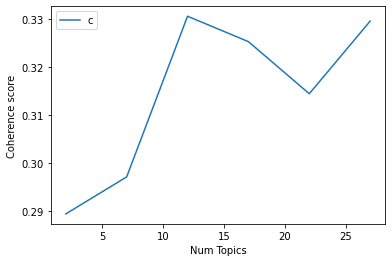

In [140]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_2019_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [141]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_2019_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 12

index: 0 | Num Topics = 2  has Coherence Value of 0.2895
index: 1 | Num Topics = 7  has Coherence Value of 0.2972
index: 2 | Num Topics = 12  has Coherence Value of 0.3306
index: 3 | Num Topics = 17  has Coherence Value of 0.3253
index: 4 | Num Topics = 22  has Coherence Value of 0.3145
index: 5 | Num Topics = 27  has Coherence Value of 0.3296


In [174]:
# Select optimal number of topics
optimal_model_sg_2019_score1N2N3 = model_list_sg_2019_score1N2N3[2]

In [175]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_2019_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_sg_2019_score1N2N3, corpus_sg_2019_score1N2N3, id2word_sg_2019_score1N2N3)

In [176]:
print("pyLDAVis for SG topics for score=1,2,3 in 2019:")
vis_sg_2019_score1N2N3

pyLDAVis for SG topics for score=1,2,3 in 2019:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.240321 -0.002552       1        1  12.972535
8     -0.060482  0.151304       2        1  11.305999
2     -0.094361  0.106814       3        1  10.619251
10     0.024187  0.032846       4        1  10.523419
4     -0.181259 -0.031149       5        1   9.998141
5      0.027097  0.038242       6        1   9.811973
7     -0.121062 -0.167117       7        1   6.524319
0      0.052706 -0.132029       8        1   6.481678
3      0.003285 -0.051894       9        1   6.406078
6      0.103858  0.004255      10        1   6.007259
9     -0.007617  0.088850      11        1   5.538352
11     0.013326 -0.037569      12        1   3.810997, topic_info=        Term        Freq       Total Category  logprob  loglift
99       log   98.000000   98.000000  Default  30.0000  30.0000
10     story  180.000000  180.000000  Default  29.0000  29.0000
1    account  195.000000  195.000000  Default  28.0000  28.0000
371     view   51.000000   51.000000  Default  27.0000  27.0000
50     video   48.000000   48.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
343  message    2.048063   29.608296  Topic12  -4.9817   0.5961
179  refresh    1.948390   26.750220  Topic12  -5.0316   0.6477
109      guy    1.875742   22.556687  Topic12  -5.0696   0.7803
6        let    1.645941   11.134528  Topic12  -5.2003   1.3555
243     week    1.645939   12.799298  Topic12  -5.2003   1.2162

[820 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
505       2  0.771101  ability
0         1  0.339829     able
0         2  0.185361     able
0         3  0.185361     able
0         5  0.185361     able
...     ...       ...      ...
92        5  0.285184     year
92        8  0.190123     year
93        5  0.671918      yet
93        9  0.167980      yet
93       12  0.167980      yet

[1519 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 9, 3, 11, 5, 6, 8, 1, 4, 7, 10, 12])

## By-rating of 2020 (Rating=1,2,3)

In [145]:
# By-rating Topic Modelling - rating = 1,2,3 in 2020
# Convert to list - move to each section
review_sg_2020_score1N2N3 = instagram_ios_sg_review_YearMonth_2020_score1N2N3.review.values.tolist()
review_words_sg_2020_score1N2N3 = list(sent_to_words(review_sg_2020_score1N2N3))
print(review_words_sg_2020_score1N2N3[:1])

[['had', 'problem', 'and', 'the', 'minute', 'signed', 'up', 'they', 'deactivated', 'my', 'account', 'for', 'no', 'reason', 'and', 'didn', 'even', 'tell', 'me', 'what', 'terms', 'and', 'conditions', 'didn', 'follow', 'so', 'clicked', 'to', 'learn', 'more', 'and', 'how', 'do', 'activate', 'it', 'again', 'there', 'wasn', 'even', 'reply', 'when', 'tried', 'using', 'other', 'gmails', 'they', 'all', 'were', 'flipping', 'deactivated', 'do', 'not', 'see', 'any', 'problem', 'so', 'please', 'look', 'into', 'this', 'and', 'not', 'deactivate', 'accounts', 'for', 'no', 'apparent', 'reason', 'and', 'even', 'if', 'there', 'was', 'reason', 'just', 'state', 'it', 'it', 'is', 'not', 'that', 'hard']]


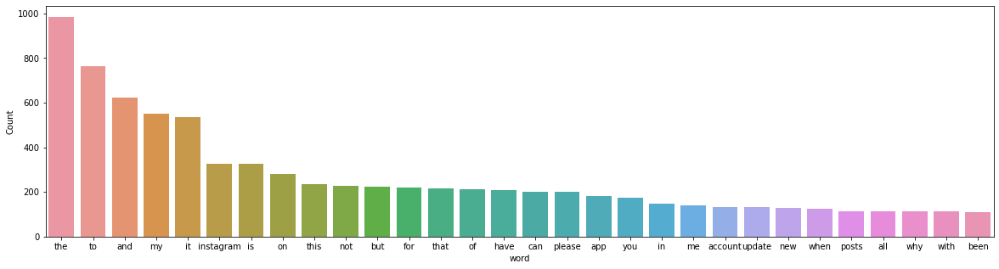

In [146]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_2020_score1N2N3))

In [147]:
# Clean text
review_words_sg_ready_2020_score1N2N3 = process_words(review_words_sg_2020_score1N2N3)  # processed Text Data! - move to each section

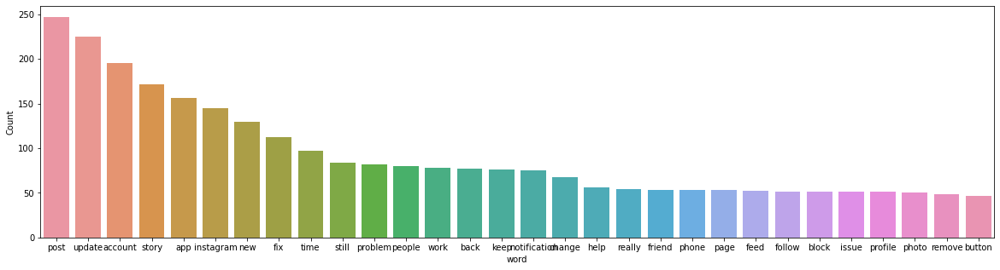

In [148]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_sg_ready_2020_score1N2N3))


In [149]:
# Create Dictionary
id2word_sg_2020_score1N2N3 = corpora.Dictionary(review_words_sg_ready_2020_score1N2N3)

2021-10-16 03:40:44,000 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 03:40:44,062 [INFO] gensim.corpora.dictionary - built Dictionary(1435 unique tokens: ['account', 'activate', 'apparent', 'click', 'condition']...) from 665 documents (total 9005 corpus positions)
2021-10-16 03:40:44,064 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1435 unique tokens: ['account', 'activate', 'apparent', 'click', 'condition']...) from 665 documents (total 9005 corpus positions)", 'datetime': '2021-10-16T03:40:44.064240', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [150]:
# Create Corpus: Term Document Frequency
corpus_sg_2020_score1N2N3 = [id2word_sg_2020_score1N2N3.doc2bow(text) for text in review_words_sg_ready_2020_score1N2N3]

In [151]:
# Training LDA model
model_list_sg_2020_score1N2N3, coherence_values_sg_2020_score1N2N3 = compute_coherence_values(dictionary=id2word_sg_2020_score1N2N3, corpus=corpus_sg_2020_score1N2N3, 
                                                              texts=review_words_sg_ready_2020_score1N2N3, limit=30, start=2, step=5)


2021-10-16 03:40:44,095 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 03:40:44,098 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 03:40:44,101 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 03:40:44,103 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 665 documents, updating model once every 665 documents, evaluating perplexity every 665 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 03:40:46,201 [INFO] gensim.models.ldamodel - -7.819 per-word bound, 225.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:40:46,203 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #665/665
2021-10-16 03:40:47,894 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.030*"post" + 0.021*"story" + 0.019*"update" + 0.014*"app" + 0.013*"new" + 0.011*"instagram" + 0.010*"n

2021-10-16 03:41:07,091 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"post" + 0.022*"story" + 0.019*"update" + 0.016*"new" + 0.012*"notification" + 0.012*"instagram" + 0.011*"app" + 0.011*"photo" + 0.011*"back" + 0.011*"button"
2021-10-16 03:41:07,092 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.030*"account" + 0.024*"update" + 0.018*"app" + 0.016*"instagram" + 0.015*"fix" + 0.014*"time" + 0.013*"story" + 0.013*"problem" + 0.012*"post" + 0.012*"work"
2021-10-16 03:41:07,093 [INFO] gensim.models.ldamodel - topic diff=0.029109, rho=0.301511
2021-10-16 03:41:08,141 [INFO] gensim.models.ldamodel - -6.420 per-word bound, 85.6 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:41:08,143 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #665/665
2021-10-16 03:41:08,949 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"post" + 0.022*"story" + 0.019*"update" + 0.016*"new" + 0.012*"instagram" + 0.011*"notification" 

2021-10-16 03:41:24,317 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.044*"post" + 0.022*"story" + 0.020*"update" + 0.017*"new" + 0.012*"back" + 0.012*"instagram" + 0.011*"photo" + 0.011*"button" + 0.010*"app" + 0.010*"shop"
2021-10-16 03:41:24,319 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.032*"account" + 0.023*"update" + 0.019*"app" + 0.016*"fix" + 0.015*"instagram" + 0.015*"time" + 0.013*"problem" + 0.013*"story" + 0.013*"still" + 0.013*"work"
2021-10-16 03:41:24,320 [INFO] gensim.models.ldamodel - topic diff=0.013574, rho=0.218218
2021-10-16 03:41:25,311 [INFO] gensim.models.ldamodel - -6.396 per-word bound, 84.2 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:41:25,313 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #665/665
2021-10-16 03:41:26,067 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.044*"post" + 0.022*"story" + 0.020*"update" + 0.017*"new" + 0.013*"back" + 0.012*"instagram" + 0.011*"photo"

2021-10-16 03:41:40,193 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.032*"account" + 0.023*"update" + 0.019*"app" + 0.017*"fix" + 0.015*"instagram" + 0.015*"time" + 0.013*"problem" + 0.013*"still" + 0.013*"story" + 0.013*"work"
2021-10-16 03:41:40,196 [INFO] gensim.models.ldamodel - topic diff=0.006844, rho=0.179605
2021-10-16 03:41:41,066 [INFO] gensim.models.ldamodel - -6.389 per-word bound, 83.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:41:41,067 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #665/665
2021-10-16 03:41:41,751 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.046*"post" + 0.021*"story" + 0.020*"update" + 0.017*"new" + 0.013*"back" + 0.012*"instagram" + 0.011*"photo" + 0.010*"button" + 0.010*"feed" + 0.010*"people"
2021-10-16 03:41:41,754 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.032*"account" + 0.023*"update" + 0.019*"app" + 0.017*"fix" + 0.015*"instagram" + 0.015*"time" + 0.013*"pr

2021-10-16 03:41:56,052 [INFO] gensim.models.ldamodel - topic diff=0.004297, rho=0.156174
2021-10-16 03:41:56,783 [INFO] gensim.models.ldamodel - -6.385 per-word bound, 83.6 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:41:56,786 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #665/665
2021-10-16 03:41:57,514 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.047*"post" + 0.020*"story" + 0.020*"update" + 0.017*"new" + 0.014*"back" + 0.012*"instagram" + 0.011*"photo" + 0.011*"feed" + 0.011*"people" + 0.010*"button"
2021-10-16 03:41:57,517 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.032*"account" + 0.023*"update" + 0.019*"app" + 0.017*"fix" + 0.015*"instagram" + 0.015*"time" + 0.014*"story" + 0.014*"still" + 0.013*"problem" + 0.013*"work"
2021-10-16 03:41:57,521 [INFO] gensim.models.ldamodel - topic diff=0.004109, rho=0.154303
2021-10-16 03:41:58,330 [INFO] gensim.models.ldamodel - -6.385 per-word bound, 83.6 perplex

2021-10-16 03:42:10,979 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=1435, num_topics=2, decay=0.5, chunksize=1000) in 86.88s', 'datetime': '2021-10-16T03:42:10.979747', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 03:42:10,982 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 03:42:15,091 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 03:42:15,143 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 652 virtual documents
2021-10-16 03:42:15,446 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-16 03:42:15,447 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2

2021-10-16 03:42:25,000 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.065*"post" + 0.023*"account" + 0.016*"feed" + 0.014*"people" + 0.014*"new" + 0.012*"app" + 0.012*"suggest" + 0.012*"story" + 0.011*"update" + 0.010*"old"
2021-10-16 03:42:25,004 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.034*"account" + 0.021*"update" + 0.020*"instagram" + 0.019*"time" + 0.017*"app" + 0.017*"problem" + 0.016*"fix" + 0.014*"work" + 0.014*"keep" + 0.012*"story"
2021-10-16 03:42:25,008 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.031*"notification" + 0.020*"iphone" + 0.019*"phone" + 0.018*"update" + 0.016*"back" + 0.015*"app" + 0.012*"work" + 0.012*"still" + 0.011*"setting" + 0.010*"fix"
2021-10-16 03:42:25,011 [INFO] gensim.models.ldamodel - topic diff=0.095447, rho=0.408248
2021-10-16 03:42:25,956 [INFO] gensim.models.ldamodel - -6.707 per-word bound, 104.5 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:42:25,959 [INFO] gensim.models

2021-10-16 03:42:33,031 [INFO] gensim.models.ldamodel - topic diff=0.034204, rho=0.301511
2021-10-16 03:42:33,937 [INFO] gensim.models.ldamodel - -6.669 per-word bound, 101.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:42:33,939 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #665/665
2021-10-16 03:42:34,573 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.035*"account" + 0.020*"instagram" + 0.020*"update" + 0.019*"problem" + 0.019*"time" + 0.018*"app" + 0.017*"fix" + 0.015*"work" + 0.014*"keep" + 0.012*"story"
2021-10-16 03:42:34,576 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.035*"update" + 0.030*"shop" + 0.025*"notification" + 0.024*"button" + 0.022*"remove" + 0.020*"new" + 0.017*"app" + 0.014*"back" + 0.013*"shopping" + 0.013*"change"
2021-10-16 03:42:34,587 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.073*"post" + 0.023*"account" + 0.018*"feed" + 0.014*"people" + 0.014*"new" + 0.014*"suggest" + 0.01

2021-10-16 03:42:42,486 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.037*"post" + 0.015*"keep" + 0.012*"instagram" + 0.011*"still" + 0.010*"follower" + 0.010*"people" + 0.010*"account" + 0.010*"page" + 0.008*"block" + 0.007*"tell"
2021-10-16 03:42:42,490 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"story" + 0.035*"post" + 0.030*"update" + 0.018*"fix" + 0.016*"video" + 0.015*"photo" + 0.014*"account" + 0.014*"function" + 0.012*"profile" + 0.012*"app"
2021-10-16 03:42:42,498 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.076*"post" + 0.023*"account" + 0.019*"feed" + 0.014*"suggest" + 0.014*"old" + 0.014*"people" + 0.014*"new" + 0.012*"follow" + 0.010*"update" + 0.010*"instagram"
2021-10-16 03:42:42,505 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.032*"update" + 0.028*"new" + 0.024*"app" + 0.022*"story" + 0.018*"phone" + 0.018*"instagram" + 0.016*"log" + 0.015*"account" + 0.014*"open" + 0.013*"still"
2021-10-16 03:42:42,509 [INFO] gensim.models.ldamodel - to

2021-10-16 03:42:50,218 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.077*"post" + 0.022*"account" + 0.019*"feed" + 0.015*"old" + 0.015*"suggest" + 0.014*"people" + 0.014*"new" + 0.012*"follow" + 0.010*"instagram" + 0.010*"update"
2021-10-16 03:42:50,220 [INFO] gensim.models.ldamodel - topic diff=0.011531, rho=0.213201
2021-10-16 03:42:51,084 [INFO] gensim.models.ldamodel - -6.639 per-word bound, 99.7 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:42:51,085 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #665/665
2021-10-16 03:42:51,744 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.068*"notification" + 0.027*"iphone" + 0.027*"phone" + 0.022*"receive" + 0.019*"setting" + 0.018*"still" + 0.015*"restart" + 0.015*"app" + 0.014*"back" + 0.014*"work"
2021-10-16 03:42:51,748 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.032*"update" + 0.028*"new" + 0.024*"app" + 0.022*"story" + 0.020*"phone" + 0.018*"instagram" + 

2021-10-16 03:42:59,277 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.069*"notification" + 0.028*"phone" + 0.028*"iphone" + 0.024*"receive" + 0.019*"setting" + 0.018*"still" + 0.016*"restart" + 0.015*"app" + 0.014*"back" + 0.013*"work"
2021-10-16 03:42:59,280 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.032*"update" + 0.028*"new" + 0.024*"app" + 0.022*"story" + 0.020*"phone" + 0.018*"instagram" + 0.017*"log" + 0.016*"account" + 0.014*"open" + 0.014*"still"
2021-10-16 03:42:59,291 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"post" + 0.016*"keep" + 0.011*"instagram" + 0.011*"follower" + 0.011*"people" + 0.010*"still" + 0.009*"account" + 0.008*"tell" + 0.008*"block" + 0.008*"certain"
2021-10-16 03:42:59,300 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.035*"account" + 0.021*"problem" + 0.020*"app" + 0.020*"instagram" + 0.020*"update" + 0.020*"time" + 0.018*"fix" + 0.016*"work" + 0.015*"keep" + 0.012*"still"
2021-10-16 03:42:59,303 [INFO] gensim.models.ldamod

2021-10-16 03:43:07,267 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.077*"post" + 0.022*"account" + 0.019*"feed" + 0.015*"old" + 0.015*"suggest" + 0.014*"people" + 0.014*"new" + 0.012*"follow" + 0.011*"instagram" + 0.010*"friend"
2021-10-16 03:43:07,269 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.070*"notification" + 0.028*"phone" + 0.028*"iphone" + 0.024*"receive" + 0.019*"setting" + 0.018*"still" + 0.017*"restart" + 0.015*"app" + 0.014*"back" + 0.013*"work"
2021-10-16 03:43:07,272 [INFO] gensim.models.ldamodel - topic diff=0.006214, rho=0.174078
2021-10-16 03:43:08,146 [INFO] gensim.models.ldamodel - -6.626 per-word bound, 98.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:43:08,148 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #665/665
2021-10-16 03:43:08,793 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.077*"post" + 0.022*"account" + 0.019*"feed" + 0.015*"old" + 0.015*"suggest" + 0.014*"people" + 

2021-10-16 03:43:15,806 [INFO] gensim.models.ldamodel - -6.622 per-word bound, 98.5 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:43:15,808 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #665/665
2021-10-16 03:43:16,484 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.042*"update" + 0.031*"shop" + 0.028*"button" + 0.024*"new" + 0.022*"remove" + 0.020*"notification" + 0.019*"change" + 0.018*"back" + 0.017*"app" + 0.015*"shopping"
2021-10-16 03:43:16,486 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.033*"update" + 0.029*"new" + 0.025*"app" + 0.022*"story" + 0.022*"phone" + 0.019*"instagram" + 0.018*"account" + 0.017*"log" + 0.015*"open" + 0.015*"still"
2021-10-16 03:43:16,487 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.063*"story" + 0.039*"post" + 0.027*"update" + 0.020*"fix" + 0.017*"video" + 0.016*"photo" + 0.013*"function" + 0.013*"profile" + 0.012*"issue" + 0.012*"account"
2021-10-16 03:43:16,488 [INFO] 

2021-10-16 03:43:23,930 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.035*"account" + 0.021*"problem" + 0.020*"app" + 0.020*"time" + 0.020*"instagram" + 0.019*"update" + 0.018*"fix" + 0.016*"work" + 0.016*"keep" + 0.012*"still"
2021-10-16 03:43:23,933 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"post" + 0.014*"keep" + 0.011*"people" + 0.011*"follower" + 0.011*"instagram" + 0.009*"account" + 0.009*"tell" + 0.009*"block" + 0.008*"certain" + 0.008*"still"
2021-10-16 03:43:23,940 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.042*"update" + 0.031*"shop" + 0.028*"button" + 0.024*"new" + 0.022*"remove" + 0.020*"change" + 0.020*"notification" + 0.018*"back" + 0.017*"app" + 0.015*"shopping"
2021-10-16 03:43:23,945 [INFO] gensim.models.ldamodel - topic diff=0.004157, rho=0.150756
2021-10-16 03:43:24,804 [INFO] gensim.models.ldamodel - -6.619 per-word bound, 98.3 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:43:24,806 [INFO] 

2021-10-16 03:43:31,525 [INFO] gensim.models.ldamodel - topic diff=0.003508, rho=0.142857
2021-10-16 03:43:32,301 [INFO] gensim.models.ldamodel - -6.617 per-word bound, 98.1 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:43:32,304 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #665/665
2021-10-16 03:43:32,972 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.077*"post" + 0.022*"account" + 0.020*"feed" + 0.015*"old" + 0.015*"people" + 0.015*"suggest" + 0.014*"new" + 0.013*"follow" + 0.011*"instagram" + 0.010*"friend"
2021-10-16 03:43:32,975 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"update" + 0.031*"new" + 0.025*"app" + 0.022*"phone" + 0.022*"story" + 0.019*"account" + 0.019*"instagram" + 0.017*"log" + 0.015*"open" + 0.015*"still"
2021-10-16 03:43:32,977 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"post" + 0.014*"keep" + 0.012*"people" + 0.011*"follower" + 0.010*"instagram" + 0.009*"account" + 0.0

2021-10-16 03:43:45,354 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.033*"update" + 0.028*"new" + 0.024*"story" + 0.017*"feature" + 0.016*"instagram" + 0.014*"notification" + 0.013*"like" + 0.012*"back" + 0.011*"change" + 0.011*"app"
2021-10-16 03:43:45,358 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.059*"post" + 0.021*"feed" + 0.018*"app" + 0.016*"suggest" + 0.016*"story" + 0.015*"people" + 0.015*"new" + 0.013*"instagram" + 0.010*"old" + 0.010*"follow"
2021-10-16 03:43:45,360 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.018*"instagram" + 0.016*"profile" + 0.013*"post" + 0.011*"black" + 0.010*"function" + 0.010*"app" + 0.010*"font" + 0.010*"size" + 0.009*"video" + 0.009*"bad"
2021-10-16 03:43:45,363 [INFO] gensim.models.ldamodel - topic diff=0.192901, rho=0.500000
2021-10-16 03:43:46,266 [INFO] gensim.models.ldamodel - -6.890 per-word bound, 118.6 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:43:46,268 [INFO] gensim.

2021-10-16 03:43:52,594 [INFO] gensim.models.ldamodel - topic diff=0.060400, rho=0.333333
2021-10-16 03:43:53,441 [INFO] gensim.models.ldamodel - -6.803 per-word bound, 111.6 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:43:53,443 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #665/665
2021-10-16 03:43:54,009 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.034*"update" + 0.032*"new" + 0.026*"story" + 0.019*"feature" + 0.016*"instagram" + 0.014*"like" + 0.014*"back" + 0.012*"change" + 0.010*"friend" + 0.010*"button"
2021-10-16 03:43:54,012 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.044*"profile" + 0.024*"block" + 0.023*"time" + 0.022*"action" + 0.021*"people" + 0.020*"screen" + 0.019*"fix" + 0.018*"black" + 0.018*"page" + 0.015*"post"
2021-10-16 03:43:54,019 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.050*"button" + 0.019*"instagram" + 0.019*"back" + 0.015*"shop" + 0.015*"app" + 0.013*"page" + 0.013*"pla

2021-10-16 03:44:01,110 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.056*"button" + 0.020*"back" + 0.017*"shop" + 0.017*"instagram" + 0.015*"app" + 0.013*"page" + 0.013*"press" + 0.013*"place" + 0.012*"open" + 0.012*"people"
2021-10-16 03:44:01,119 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.017*"instagram" + 0.014*"post" + 0.014*"size" + 0.014*"profile" + 0.012*"font" + 0.010*"function" + 0.010*"video" + 0.010*"facebook" + 0.010*"anymore" + 0.009*"bad"
2021-10-16 03:44:01,122 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.076*"post" + 0.029*"feed" + 0.025*"suggest" + 0.017*"people" + 0.017*"new" + 0.016*"old" + 0.015*"story" + 0.014*"instagram" + 0.014*"app" + 0.014*"follow"
2021-10-16 03:44:01,129 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.022*"follow" + 0.017*"unable" + 0.016*"people" + 0.016*"screen" + 0.014*"scroll" + 0.012*"photo" + 0.010*"click" + 0.010*"story" + 0.010*"enable" + 0.010*"user"
2021-10-16 03:44:01,134 [INFO] gensim.models.ldamodel - to

2021-10-16 03:44:08,203 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.034*"new" + 0.032*"update" + 0.029*"story" + 0.016*"instagram" + 0.016*"feature" + 0.015*"like" + 0.014*"back" + 0.012*"change" + 0.011*"friend" + 0.011*"button"
2021-10-16 03:44:08,205 [INFO] gensim.models.ldamodel - topic diff=0.012960, rho=0.223607
2021-10-16 03:44:09,086 [INFO] gensim.models.ldamodel - -6.760 per-word bound, 108.4 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:44:09,088 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #665/665
2021-10-16 03:44:09,701 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.029*"update" + 0.027*"account" + 0.025*"work" + 0.025*"problem" + 0.024*"app" + 0.023*"time" + 0.023*"instagram" + 0.021*"fix" + 0.016*"keep" + 0.016*"still"
2021-10-16 03:44:09,703 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.057*"button" + 0.020*"shop" + 0.019*"back" + 0.016*"instagram" + 0.015*"app" + 0.014*"place" + 0.014*

2021-10-16 03:44:16,593 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.034*"new" + 0.032*"update" + 0.029*"story" + 0.017*"instagram" + 0.015*"like" + 0.015*"feature" + 0.015*"back" + 0.012*"change" + 0.011*"friend" + 0.011*"button"
2021-10-16 03:44:16,595 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.079*"update" + 0.032*"app" + 0.030*"new" + 0.027*"story" + 0.018*"change" + 0.018*"late" + 0.018*"function" + 0.016*"remove" + 0.014*"font" + 0.013*"photo"
2021-10-16 03:44:16,600 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.025*"refresh" + 0.022*"post" + 0.019*"video" + 0.014*"keep" + 0.013*"version" + 0.012*"fix" + 0.012*"long" + 0.012*"late" + 0.012*"user" + 0.012*"record"
2021-10-16 03:44:16,605 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.017*"instagram" + 0.014*"post" + 0.014*"size" + 0.013*"font" + 0.013*"profile" + 0.011*"function" + 0.010*"facebook" + 0.010*"anymore" + 0.010*"look" + 0.009*"bad"
2021-10-16 03:44:16,610 [INFO] gensim.models.ldamodel - topi

2021-10-16 03:44:23,601 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.058*"post" + 0.057*"account" + 0.039*"story" + 0.015*"share" + 0.014*"update" + 0.013*"friend" + 0.013*"instagram" + 0.010*"back" + 0.010*"video" + 0.010*"able"
2021-10-16 03:44:23,603 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.025*"refresh" + 0.022*"post" + 0.021*"video" + 0.014*"keep" + 0.012*"fix" + 0.012*"long" + 0.012*"version" + 0.012*"user" + 0.012*"record" + 0.011*"instagram"
2021-10-16 03:44:23,604 [INFO] gensim.models.ldamodel - topic diff=0.005681, rho=0.179605
2021-10-16 03:44:24,359 [INFO] gensim.models.ldamodel - -6.748 per-word bound, 107.5 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:44:24,360 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #665/665
2021-10-16 03:44:24,856 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.086*"post" + 0.033*"feed" + 0.028*"suggest" + 0.019*"old" + 0.018*"new" + 0.017*"people" + 0.015*"fo

2021-10-16 03:44:31,138 [INFO] gensim.models.ldamodel - -6.743 per-word bound, 107.1 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:44:31,140 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #665/665
2021-10-16 03:44:31,713 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.083*"update" + 0.031*"new" + 0.030*"app" + 0.027*"story" + 0.020*"late" + 0.019*"change" + 0.018*"remove" + 0.017*"function" + 0.016*"font" + 0.013*"text"
2021-10-16 03:44:31,715 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.017*"instagram" + 0.014*"post" + 0.014*"size" + 0.013*"font" + 0.011*"profile" + 0.011*"function" + 0.011*"facebook" + 0.010*"difficult" + 0.010*"anymore" + 0.010*"look"
2021-10-16 03:44:31,717 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.036*"change" + 0.022*"annoying" + 0.021*"keep" + 0.016*"pop" + 0.016*"shop" + 0.015*"time" + 0.014*"honestly" + 0.014*"app" + 0.014*"update" + 0.013*"really"
2021-10-16 03:44:31,719 [IN

2021-10-16 03:44:38,598 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.035*"new" + 0.032*"update" + 0.030*"story" + 0.017*"instagram" + 0.015*"back" + 0.015*"like" + 0.014*"feature" + 0.012*"change" + 0.012*"add" + 0.011*"user"
2021-10-16 03:44:38,603 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.064*"notification" + 0.032*"update" + 0.026*"remove" + 0.024*"app" + 0.020*"receive" + 0.020*"shop" + 0.019*"new" + 0.017*"instagram" + 0.016*"tab" + 0.016*"phone"
2021-10-16 03:44:38,607 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.059*"post" + 0.057*"account" + 0.040*"story" + 0.015*"share" + 0.013*"friend" + 0.013*"update" + 0.013*"instagram" + 0.010*"video" + 0.010*"able" + 0.010*"back"
2021-10-16 03:44:38,611 [INFO] gensim.models.ldamodel - topic diff=0.004185, rho=0.154303
2021-10-16 03:44:39,525 [INFO] gensim.models.ldamodel - -6.738 per-word bound, 106.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:44:39,527 [INFO] gen

2021-10-16 03:44:45,404 [INFO] gensim.models.ldamodel - topic diff=0.003672, rho=0.145865
2021-10-16 03:44:46,213 [INFO] gensim.models.ldamodel - -6.735 per-word bound, 106.5 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:44:46,214 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #665/665
2021-10-16 03:44:46,818 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.036*"change" + 0.023*"annoying" + 0.021*"keep" + 0.016*"pop" + 0.016*"time" + 0.015*"shop" + 0.014*"update" + 0.014*"app" + 0.014*"honestly" + 0.013*"fix"
2021-10-16 03:44:46,819 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.017*"instagram" + 0.015*"post" + 0.014*"size" + 0.013*"font" + 0.011*"function" + 0.011*"difficult" + 0.011*"facebook" + 0.011*"profile" + 0.010*"anymore" + 0.010*"look"
2021-10-16 03:44:46,821 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.023*"follow" + 0.020*"unable" + 0.017*"people" + 0.016*"screen" + 0.015*"scroll" + 0.012*"chat"

2021-10-16 03:44:59,370 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.022*"account" + 0.014*"instagram" + 0.014*"comment" + 0.014*"time" + 0.012*"profile" + 0.011*"report" + 0.011*"feel" + 0.011*"post" + 0.011*"new" + 0.011*"photo"
2021-10-16 03:44:59,372 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.045*"account" + 0.019*"story" + 0.015*"app" + 0.012*"instagram" + 0.011*"update" + 0.010*"spam" + 0.010*"follow" + 0.010*"video" + 0.010*"user" + 0.010*"delete"
2021-10-16 03:44:59,374 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.049*"story" + 0.020*"post" + 0.016*"new" + 0.014*"log" + 0.013*"instagram" + 0.012*"update" + 0.012*"like" + 0.011*"friend" + 0.011*"problem" + 0.010*"back"
2021-10-16 03:44:59,375 [INFO] gensim.models.ldamodel - topic diff=12.490513, rho=1.000000
2021-10-16 03:45:00,322 [INFO] gensim.models.ldamodel - -7.203 per-word bound, 147.3 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:45:00,323 [INFO] gen

2021-10-16 03:45:07,223 [INFO] gensim.models.ldamodel - topic diff=0.104901, rho=0.377964
2021-10-16 03:45:08,078 [INFO] gensim.models.ldamodel - -6.946 per-word bound, 123.3 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:45:08,079 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #665/665
2021-10-16 03:45:08,671 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.063*"account" + 0.018*"deactivate" + 0.016*"instagram" + 0.011*"problem" + 0.011*"app" + 0.011*"reply" + 0.010*"user" + 0.009*"spam" + 0.009*"guideline" + 0.009*"community"
2021-10-16 03:45:08,673 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.064*"post" + 0.060*"account" + 0.017*"update" + 0.015*"story" + 0.013*"back" + 0.013*"new" + 0.013*"friend" + 0.012*"instagram" + 0.012*"share" + 0.011*"log"
2021-10-16 03:45:08,674 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.028*"app" + 0.022*"issue" + 0.020*"change" + 0.017*"profile" + 0.017*"time" + 0.013*"fol

2021-10-16 03:45:16,099 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.052*"update" + 0.028*"new" + 0.028*"story" + 0.024*"account" + 0.024*"version" + 0.022*"instagram" + 0.021*"font" + 0.020*"problem" + 0.018*"fix" + 0.018*"filter"
2021-10-16 03:45:16,103 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.029*"update" + 0.019*"keep" + 0.019*"post" + 0.018*"instagram" + 0.017*"help" + 0.017*"available" + 0.016*"still" + 0.015*"check" + 0.015*"shop" + 0.014*"new"
2021-10-16 03:45:16,107 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.065*"post" + 0.060*"account" + 0.016*"update" + 0.014*"back" + 0.014*"story" + 0.013*"new" + 0.013*"friend" + 0.013*"log" + 0.012*"instagram" + 0.012*"share"
2021-10-16 03:45:16,111 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.062*"story" + 0.041*"update" + 0.025*"photo" + 0.023*"fix" + 0.022*"post" + 0.020*"app" + 0.018*"change" + 0.017*"load" + 0.016*"video" + 0.015*"camera"
2021-10-16 03:45:16,116 [INFO] gensim.models.ldamodel - topic 

2021-10-16 03:45:23,643 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.023*"archive" + 0.017*"quite" + 0.017*"soon" + 0.016*"hope" + 0.011*"instagram" + 0.010*"load" + 0.010*"fix" + 0.010*"story" + 0.009*"profile" + 0.009*"black"
2021-10-16 03:45:23,647 [INFO] gensim.models.ldamodel - topic diff=0.023253, rho=0.235702
2021-10-16 03:45:24,469 [INFO] gensim.models.ldamodel - -6.855 per-word bound, 115.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:45:24,471 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #665/665
2021-10-16 03:45:25,095 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.065*"post" + 0.061*"account" + 0.016*"update" + 0.014*"back" + 0.014*"log" + 0.013*"friend" + 0.013*"new" + 0.012*"story" + 0.012*"instagram" + 0.011*"share"
2021-10-16 03:45:25,097 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.028*"app" + 0.025*"issue" + 0.021*"change" + 0.019*"profile" + 0.018*"time" + 0.014*"access" + 0.014*"

2021-10-16 03:45:32,041 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.042*"remove" + 0.033*"notification" + 0.023*"shop" + 0.021*"update" + 0.019*"pop" + 0.018*"thing" + 0.016*"feed" + 0.012*"keep" + 0.012*"instagram" + 0.012*"name"
2021-10-16 03:45:32,056 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.072*"account" + 0.019*"deactivate" + 0.016*"instagram" + 0.011*"reply" + 0.010*"user" + 0.010*"problem" + 0.010*"guideline" + 0.010*"spam" + 0.010*"reason" + 0.010*"app"
2021-10-16 03:45:32,070 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.051*"app" + 0.043*"notification" + 0.036*"phone" + 0.036*"update" + 0.026*"still" + 0.019*"instagram" + 0.019*"iphone" + 0.016*"time" + 0.016*"keep" + 0.016*"fix"
2021-10-16 03:45:32,072 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.064*"update" + 0.034*"new" + 0.028*"story" + 0.024*"version" + 0.024*"font" + 0.022*"account" + 0.022*"instagram" + 0.020*"app" + 0.018*"problem" + 0.018*"work"
2021-10-16 03:45:32,074 [INFO] gensim

2021-10-16 03:45:39,464 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.040*"button" + 0.030*"back" + 0.026*"update" + 0.025*"shop" + 0.024*"instagram" + 0.021*"change" + 0.020*"new" + 0.019*"shopping" + 0.018*"tab" + 0.015*"notification"
2021-10-16 03:45:39,466 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.067*"update" + 0.036*"new" + 0.028*"story" + 0.025*"version" + 0.025*"font" + 0.023*"instagram" + 0.022*"account" + 0.021*"app" + 0.018*"work" + 0.018*"late"
2021-10-16 03:45:39,467 [INFO] gensim.models.ldamodel - topic diff=0.011169, rho=0.185695
2021-10-16 03:45:40,281 [INFO] gensim.models.ldamodel - -6.821 per-word bound, 113.0 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:45:40,282 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #665/665
2021-10-16 03:45:40,914 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.049*"fix" + 0.048*"profile" + 0.041*"work" + 0.036*"screen" + 0.030*"black" + 0.026*"load" + 0.

2021-10-16 03:45:47,446 [INFO] gensim.models.ldamodel - -6.811 per-word bound, 112.2 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:45:47,448 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #665/665
2021-10-16 03:45:48,092 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.034*"page" + 0.031*"profile" + 0.027*"update" + 0.018*"app" + 0.016*"feature" + 0.014*"time" + 0.013*"animate" + 0.012*"bug" + 0.012*"screen" + 0.011*"blank"
2021-10-16 03:45:48,093 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.043*"remove" + 0.027*"notification" + 0.022*"shop" + 0.021*"update" + 0.020*"pop" + 0.019*"thing" + 0.017*"feed" + 0.012*"keep" + 0.012*"name" + 0.012*"app"
2021-10-16 03:45:48,095 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.071*"update" + 0.039*"new" + 0.029*"story" + 0.025*"font" + 0.025*"version" + 0.023*"instagram" + 0.021*"app" + 0.021*"account" + 0.019*"late" + 0.018*"work"
2021-10-16 03:45:48,096 [INFO] gensim

2021-10-16 03:45:55,165 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.049*"archive" + 0.017*"quite" + 0.012*"load" + 0.011*"soon" + 0.011*"instagram" + 0.010*"hope" + 0.010*"story" + 0.009*"fix" + 0.009*"profile" + 0.009*"black"
2021-10-16 03:45:55,167 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.075*"account" + 0.020*"deactivate" + 0.017*"instagram" + 0.013*"password" + 0.012*"spam" + 0.010*"guideline" + 0.010*"user" + 0.010*"reason" + 0.010*"reply" + 0.010*"hack"
2021-10-16 03:45:55,173 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.050*"fix" + 0.046*"profile" + 0.041*"work" + 0.036*"screen" + 0.029*"black" + 0.027*"load" + 0.026*"open" + 0.026*"app" + 0.023*"phone" + 0.022*"time"
2021-10-16 03:45:55,179 [INFO] gensim.models.ldamodel - topic diff=0.007021, rho=0.158114
2021-10-16 03:45:55,964 [INFO] gensim.models.ldamodel - -6.801 per-word bound, 111.5 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:45:55,965 [INFO] ge

2021-10-16 03:46:02,284 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.041*"people" + 0.040*"post" + 0.023*"follow" + 0.021*"block" + 0.017*"action" + 0.016*"allow" + 0.014*"tell" + 0.013*"story" + 0.013*"keep" + 0.013*"app"
2021-10-16 03:46:02,287 [INFO] gensim.models.ldamodel - topic diff=0.005956, rho=0.149071
2021-10-16 03:46:03,154 [INFO] gensim.models.ldamodel - -6.792 per-word bound, 110.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:46:03,156 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #665/665
2021-10-16 03:46:03,825 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.053*"notification" + 0.050*"app" + 0.039*"phone" + 0.037*"update" + 0.030*"still" + 0.022*"instagram" + 0.021*"iphone" + 0.019*"receive" + 0.018*"time" + 0.018*"fix"
2021-10-16 03:46:03,826 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.050*"fix" + 0.045*"profile" + 0.040*"work" + 0.035*"screen" + 0.029*"black" + 0.027*"open" + 0.027*

2021-10-16 03:46:11,429 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.023*"post" + 0.021*"keep" + 0.019*"available" + 0.018*"instagram" + 0.016*"update" + 0.015*"certain" + 0.015*"check" + 0.015*"user" + 0.013*"chat" + 0.013*"protect"
2021-10-16 03:46:11,431 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.022*"people" + 0.019*"hate" + 0.017*"refresh" + 0.017*"follow" + 0.014*"advertisement" + 0.012*"feed" + 0.011*"new" + 0.010*"delete" + 0.010*"leave" + 0.010*"still"
2021-10-16 03:46:11,436 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.061*"story" + 0.036*"video" + 0.034*"update" + 0.026*"photo" + 0.021*"fix" + 0.021*"post" + 0.019*"change" + 0.017*"function" + 0.016*"camera" + 0.016*"app"
2021-10-16 03:46:11,439 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.095*"post" + 0.037*"feed" + 0.034*"suggest" + 0.025*"old" + 0.021*"follow" + 0.019*"page" + 0.018*"scroll" + 0.017*"instagram" + 0.015*"people" + 0.015*"appear"
2021-10-16 03:46:11,443 [INFO] gensim.models.lda

2021-10-16 03:46:25,088 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.098*"post" + 0.027*"feed" + 0.020*"suggest" + 0.020*"follow" + 0.019*"people" + 0.017*"new" + 0.017*"artist" + 0.013*"app" + 0.012*"appear" + 0.012*"show"
2021-10-16 03:46:25,091 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.030*"instagram" + 0.026*"app" + 0.026*"update" + 0.024*"people" + 0.019*"notification" + 0.018*"back" + 0.018*"button" + 0.018*"shopping" + 0.016*"page" + 0.016*"tab"
2021-10-16 03:46:25,092 [INFO] gensim.models.ldamodel - topic diff=0.176739, rho=0.447214
2021-10-16 03:46:25,912 [INFO] gensim.models.ldamodel - -7.078 per-word bound, 135.1 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:46:25,914 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #665/665
2021-10-16 03:46:26,435 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.033*"post" + 0.026*"people" + 0.025*"page" + 0.023*"ad" + 0.020*"fix" + 0.019*"time" + 0.019*"profil

2021-10-16 03:46:33,228 [INFO] gensim.models.ldamodel - -6.970 per-word bound, 125.4 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:46:33,230 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #665/665
2021-10-16 03:46:33,847 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.045*"story" + 0.042*"post" + 0.028*"tag" + 0.026*"option" + 0.024*"photo" + 0.024*"help" + 0.023*"repost" + 0.021*"account" + 0.020*"friend" + 0.016*"long"
2021-10-16 03:46:33,849 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.052*"work" + 0.051*"app" + 0.040*"open" + 0.028*"fix" + 0.022*"load" + 0.022*"phone" + 0.021*"delete" + 0.021*"time" + 0.019*"able" + 0.018*"still"
2021-10-16 03:46:33,852 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.022*"comment" + 0.021*"message" + 0.021*"issue" + 0.020*"new" + 0.018*"crash" + 0.018*"keep" + 0.017*"update" + 0.016*"app" + 0.015*"friend" + 0.013*"look"
2021-10-16 03:46:33,859 [INFO] gensim.models.ldam

2021-10-16 03:46:41,298 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.057*"block" + 0.027*"post" + 0.025*"comment" + 0.024*"action" + 0.024*"account" + 0.021*"problem" + 0.019*"like" + 0.019*"change" + 0.016*"instagram" + 0.014*"app"
2021-10-16 03:46:41,326 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.047*"post" + 0.026*"video" + 0.023*"keep" + 0.021*"pop" + 0.013*"edit" + 0.012*"user" + 0.012*"reel" + 0.009*"still" + 0.009*"really" + 0.009*"give"
2021-10-16 03:46:41,328 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.113*"post" + 0.039*"feed" + 0.036*"follow" + 0.030*"people" + 0.025*"suggest" + 0.017*"chronological" + 0.017*"show" + 0.017*"new" + 0.016*"artist" + 0.014*"appear"
2021-10-16 03:46:41,329 [INFO] gensim.models.ldamodel - topic diff=0.030215, rho=0.250000
2021-10-16 03:46:42,050 [INFO] gensim.models.ldamodel - -6.921 per-word bound, 121.2 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:46:42,053 [INFO] gensim.

2021-10-16 03:46:48,433 [INFO] gensim.models.ldamodel - topic diff=0.018667, rho=0.218218
2021-10-16 03:46:49,224 [INFO] gensim.models.ldamodel - -6.898 per-word bound, 119.2 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:46:49,228 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #665/665
2021-10-16 03:46:49,785 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.031*"shop" + 0.029*"button" + 0.027*"new" + 0.025*"like" + 0.022*"insta" + 0.020*"remove" + 0.019*"story" + 0.017*"add" + 0.015*"app" + 0.014*"update"
2021-10-16 03:46:49,787 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.058*"story" + 0.040*"post" + 0.035*"option" + 0.031*"tag" + 0.030*"friend" + 0.029*"repost" + 0.028*"photo" + 0.021*"account" + 0.020*"allow" + 0.020*"help"
2021-10-16 03:46:49,789 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.075*"account" + 0.059*"post" + 0.034*"story" + 0.024*"share" + 0.015*"instagram" + 0.015*"log" + 0.012*"friend"

2021-10-16 03:46:56,716 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.063*"app" + 0.060*"work" + 0.046*"open" + 0.030*"fix" + 0.028*"delete" + 0.028*"load" + 0.028*"time" + 0.021*"problem" + 0.020*"phone" + 0.020*"crash"
2021-10-16 03:46:56,721 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.059*"story" + 0.041*"post" + 0.035*"option" + 0.032*"friend" + 0.031*"tag" + 0.029*"repost" + 0.029*"photo" + 0.022*"allow" + 0.021*"account" + 0.020*"setting"
2021-10-16 03:46:56,728 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.047*"post" + 0.026*"video" + 0.023*"keep" + 0.021*"pop" + 0.015*"edit" + 0.012*"user" + 0.012*"reel" + 0.009*"still" + 0.009*"really" + 0.009*"give"
2021-10-16 03:46:56,737 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.076*"account" + 0.060*"post" + 0.034*"story" + 0.024*"share" + 0.016*"log" + 0.015*"instagram" + 0.012*"friend" + 0.011*"fix" + 0.010*"still" + 0.010*"issue"
2021-10-16 03:46:56,740 [INFO] gensim.models.ldamodel - topic diff=0.012452

2021-10-16 03:47:03,907 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.033*"shop" + 0.031*"button" + 0.027*"new" + 0.026*"like" + 0.023*"insta" + 0.020*"remove" + 0.018*"story" + 0.017*"add" + 0.016*"app" + 0.014*"update"
2021-10-16 03:47:03,911 [INFO] gensim.models.ldamodel - topic diff=0.008757, rho=0.176777
2021-10-16 03:47:04,714 [INFO] gensim.models.ldamodel - -6.868 per-word bound, 116.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:47:04,716 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #665/665
2021-10-16 03:47:05,342 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.033*"shop" + 0.031*"button" + 0.027*"new" + 0.026*"like" + 0.023*"insta" + 0.020*"remove" + 0.018*"story" + 0.017*"add" + 0.016*"app" + 0.014*"update"
2021-10-16 03:47:05,344 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.033*"notification" + 0.031*"app" + 0.030*"instagram" + 0.027*"people" + 0.025*"button" + 0.024*"shopping" + 0.021*"upda

2021-10-16 03:47:12,291 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.049*"update" + 0.038*"font" + 0.032*"new" + 0.031*"instagram" + 0.024*"version" + 0.024*"time" + 0.023*"story" + 0.019*"still" + 0.017*"work" + 0.017*"account"
2021-10-16 03:47:12,293 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.044*"turn" + 0.027*"button" + 0.025*"people" + 0.020*"remove" + 0.020*"message" + 0.020*"option" + 0.020*"noti" + 0.014*"receive" + 0.014*"shopping" + 0.014*"back"
2021-10-16 03:47:12,322 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.071*"notification" + 0.060*"update" + 0.037*"app" + 0.036*"phone" + 0.027*"still" + 0.025*"receive" + 0.024*"instagram" + 0.024*"iphone" + 0.020*"setting" + 0.020*"late"
2021-10-16 03:47:12,328 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.045*"new" + 0.044*"update" + 0.032*"instagram" + 0.031*"account" + 0.029*"back" + 0.018*"shop" + 0.018*"change" + 0.017*"really" + 0.016*"app" + 0.014*"keep"
2021-10-16 03:47:12,330 [INFO] gensim.mod

2021-10-16 03:47:19,194 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.029*"account" + 0.023*"instagram" + 0.020*"deactivate" + 0.014*"happen" + 0.013*"time" + 0.013*"user" + 0.011*"become" + 0.011*"guideline" + 0.011*"really" + 0.010*"page"
2021-10-16 03:47:19,196 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.118*"post" + 0.042*"follow" + 0.037*"feed" + 0.035*"people" + 0.024*"new" + 0.022*"suggest" + 0.021*"old" + 0.021*"show" + 0.017*"chronological" + 0.016*"hate"
2021-10-16 03:47:19,197 [INFO] gensim.models.ldamodel - topic diff=0.004847, rho=0.152499
2021-10-16 03:47:20,024 [INFO] gensim.models.ldamodel - -6.855 per-word bound, 115.8 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:47:20,027 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #665/665
2021-10-16 03:47:20,600 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.044*"turn" + 0.027*"button" + 0.025*"people" + 0.020*"message" + 0.020*"remove" + 0.020*

2021-10-16 03:47:26,227 [INFO] gensim.models.ldamodel - topic diff=0.003764, rho=0.144338
2021-10-16 03:47:27,006 [INFO] gensim.models.ldamodel - -6.852 per-word bound, 115.5 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:47:27,007 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #665/665
2021-10-16 03:47:27,566 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.034*"remove" + 0.023*"delete" + 0.020*"comment" + 0.020*"block" + 0.017*"notification" + 0.017*"video" + 0.017*"photo" + 0.017*"watch" + 0.017*"advertisement" + 0.017*"archive"
2021-10-16 03:47:27,568 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.037*"follower" + 0.031*"zoom" + 0.031*"already" + 0.030*"day" + 0.028*"work" + 0.028*"load" + 0.025*"unable" + 0.025*"people" + 0.021*"filter" + 0.020*"content"
2021-10-16 03:47:27,573 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.035*"notification" + 0.031*"app" + 0.030*"instagram" + 0.027*"people" + 0.027*"but

2021-10-16 03:47:41,721 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.043*"update" + 0.028*"app" + 0.022*"font" + 0.021*"new" + 0.021*"instagram" + 0.019*"notification" + 0.019*"still" + 0.018*"phone" + 0.017*"fix" + 0.015*"account"
2021-10-16 03:47:41,723 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.031*"update" + 0.025*"instagram" + 0.019*"back" + 0.018*"app" + 0.018*"work" + 0.014*"time" + 0.014*"notification" + 0.013*"new" + 0.012*"button" + 0.011*"change"
2021-10-16 03:47:41,726 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.058*"story" + 0.028*"function" + 0.028*"update" + 0.019*"photo" + 0.018*"remove" + 0.017*"icon" + 0.015*"fix" + 0.015*"work" + 0.014*"notification" + 0.013*"turn"
2021-10-16 03:47:41,734 [INFO] gensim.models.ldamodel - topic diff=0.242165, rho=0.577350
2021-10-16 03:47:42,621 [INFO] gensim.models.ldamodel - -7.331 per-word bound, 161.0 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:47:42,622 [IN

2021-10-16 03:47:49,116 [INFO] gensim.models.ldamodel - topic diff=0.112899, rho=0.353553
2021-10-16 03:47:50,000 [INFO] gensim.models.ldamodel - -7.102 per-word bound, 137.4 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:47:50,002 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #665/665
2021-10-16 03:47:50,523 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.029*"update" + 0.024*"instagram" + 0.020*"back" + 0.018*"button" + 0.017*"work" + 0.017*"app" + 0.014*"time" + 0.014*"reel" + 0.013*"new" + 0.011*"notification"
2021-10-16 03:47:50,525 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.048*"comment" + 0.043*"block" + 0.031*"post" + 0.030*"account" + 0.027*"problem" + 0.025*"action" + 0.023*"change" + 0.023*"report" + 0.021*"instagram" + 0.018*"time"
2021-10-16 03:47:50,534 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.032*"stick" + 0.026*"profile" + 0.025*"turn" + 0.020*"story" + 0.020*"social" + 0.013*"privat

2021-10-16 03:47:57,649 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.051*"comment" + 0.050*"block" + 0.031*"account" + 0.031*"action" + 0.029*"problem" + 0.028*"post" + 0.027*"report" + 0.021*"instagram" + 0.021*"change" + 0.017*"time"
2021-10-16 03:47:57,659 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.122*"post" + 0.058*"feed" + 0.045*"suggest" + 0.036*"old" + 0.034*"page" + 0.033*"follow" + 0.023*"explore" + 0.023*"instagram" + 0.021*"new" + 0.021*"people"
2021-10-16 03:47:57,662 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.033*"refresh" + 0.031*"update" + 0.026*"change" + 0.023*"app" + 0.023*"time" + 0.022*"solve" + 0.018*"month" + 0.017*"issue" + 0.016*"help" + 0.015*"profile"
2021-10-16 03:47:57,670 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.028*"issue" + 0.026*"block" + 0.025*"people" + 0.022*"fix" + 0.019*"action" + 0.018*"profile" + 0.015*"unwanted" + 0.012*"story" + 0.012*"receive" + 0.012*"help"
2021-10-16 03:47:57,678 [INFO] gensim.models.lda

2021-10-16 03:48:04,769 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.055*"follow" + 0.045*"open" + 0.041*"app" + 0.036*"time" + 0.034*"keep" + 0.027*"message" + 0.025*"account" + 0.025*"people" + 0.023*"phone" + 0.022*"fix"
2021-10-16 03:48:04,771 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.057*"account" + 0.027*"instagram" + 0.018*"deactivate" + 0.013*"spam" + 0.013*"check" + 0.011*"guideline" + 0.010*"system" + 0.010*"friend" + 0.010*"user" + 0.010*"soon"
2021-10-16 03:48:04,772 [INFO] gensim.models.ldamodel - topic diff=0.026167, rho=0.229416
2021-10-16 03:48:05,595 [INFO] gensim.models.ldamodel - -6.991 per-word bound, 127.2 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:48:05,596 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #665/665
2021-10-16 03:48:06,113 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.052*"block" + 0.051*"comment" + 0.033*"account" + 0.033*"action" + 0.029*"problem" + 0.027*"p

2021-10-16 03:48:12,339 [INFO] gensim.models.ldamodel - -6.970 per-word bound, 125.4 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:48:12,340 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #665/665
2021-10-16 03:48:12,877 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.054*"follow" + 0.048*"open" + 0.042*"app" + 0.038*"time" + 0.033*"keep" + 0.030*"message" + 0.025*"people" + 0.024*"phone" + 0.024*"account" + 0.023*"fix"
2021-10-16 03:48:12,879 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.057*"account" + 0.028*"instagram" + 0.018*"deactivate" + 0.013*"spam" + 0.013*"check" + 0.011*"system" + 0.010*"user" + 0.010*"guideline" + 0.009*"friend" + 0.009*"soon"
2021-10-16 03:48:12,881 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.030*"issue" + 0.027*"people" + 0.020*"fix" + 0.018*"block" + 0.018*"profile" + 0.017*"unwanted" + 0.014*"action" + 0.013*"story" + 0.013*"receive" + 0.013*"help"
2021-10-16 03:48:12,88

2021-10-16 03:48:19,648 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.094*"log" + 0.089*"account" + 0.052*"delete" + 0.050*"fix" + 0.029*"login" + 0.028*"problem" + 0.027*"show" + 0.021*"keep" + 0.019*"still" + 0.019*"work"
2021-10-16 03:48:19,657 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.034*"account" + 0.016*"update" + 0.015*"much" + 0.014*"new" + 0.014*"back" + 0.014*"instagram" + 0.013*"button" + 0.013*"tab" + 0.012*"change" + 0.011*"message"
2021-10-16 03:48:19,662 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.027*"block" + 0.024*"account" + 0.024*"archive" + 0.018*"time" + 0.014*"still" + 0.013*"post" + 0.012*"delete" + 0.012*"allow" + 0.012*"well" + 0.012*"follower"
2021-10-16 03:48:19,667 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.064*"list" + 0.049*"update" + 0.030*"people" + 0.025*"follower" + 0.024*"late" + 0.022*"zoom" + 0.020*"close" + 0.018*"instagram" + 0.018*"friend" + 0.015*"still"
2021-10-16 03:48:19,677 [INFO] gensim.models.ldamodel -

2021-10-16 03:48:26,601 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.131*"work" + 0.079*"load" + 0.076*"app" + 0.064*"filter" + 0.043*"update" + 0.036*"fix" + 0.026*"instagram" + 0.020*"iphone" + 0.018*"reinstall" + 0.018*"device"
2021-10-16 03:48:26,602 [INFO] gensim.models.ldamodel - topic diff=0.008330, rho=0.169031
2021-10-16 03:48:27,443 [INFO] gensim.models.ldamodel - -6.947 per-word bound, 123.4 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:48:27,445 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #665/665
2021-10-16 03:48:27,987 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.032*"issue" + 0.026*"people" + 0.019*"fix" + 0.019*"profile" + 0.018*"unwanted" + 0.014*"story" + 0.014*"receive" + 0.014*"disappear" + 0.014*"help" + 0.014*"bug"
2021-10-16 03:48:27,991 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.040*"post" + 0.027*"keep" + 0.025*"account" + 0.025*"pop" + 0.021*"problem" + 0.018*"story" + 

2021-10-16 03:48:34,780 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.065*"update" + 0.054*"font" + 0.048*"new" + 0.027*"instagram" + 0.021*"still" + 0.019*"app" + 0.018*"phone" + 0.018*"story" + 0.017*"reason" + 0.017*"version"
2021-10-16 03:48:34,781 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.096*"account" + 0.093*"log" + 0.052*"delete" + 0.051*"fix" + 0.029*"problem" + 0.028*"login" + 0.026*"show" + 0.021*"keep" + 0.020*"still" + 0.019*"work"
2021-10-16 03:48:34,783 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.054*"follow" + 0.048*"open" + 0.043*"app" + 0.038*"keep" + 0.038*"time" + 0.032*"message" + 0.025*"people" + 0.024*"fix" + 0.023*"phone" + 0.023*"crash"
2021-10-16 03:48:34,785 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.056*"account" + 0.028*"instagram" + 0.019*"deactivate" + 0.013*"spam" + 0.013*"check" + 0.011*"system" + 0.010*"content" + 0.010*"user" + 0.010*"soon" + 0.009*"happen"
2021-10-16 03:48:34,788 [INFO] gensim.models.ldamodel - top

2021-10-16 03:48:41,681 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.033*"issue" + 0.026*"people" + 0.019*"profile" + 0.019*"fix" + 0.018*"unwanted" + 0.014*"story" + 0.014*"receive" + 0.014*"disappear" + 0.014*"help" + 0.014*"bug"
2021-10-16 03:48:41,683 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.069*"post" + 0.050*"account" + 0.029*"story" + 0.023*"share" + 0.017*"save" + 0.012*"instagram" + 0.011*"able" + 0.010*"problem" + 0.009*"issue" + 0.009*"find"
2021-10-16 03:48:41,684 [INFO] gensim.models.ldamodel - topic diff=0.004912, rho=0.147442
2021-10-16 03:48:42,411 [INFO] gensim.models.ldamodel - -6.933 per-word bound, 122.2 perplexity estimate based on a held-out corpus of 665 documents with 9005 words
2021-10-16 03:48:42,413 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #665/665
2021-10-16 03:48:42,996 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.036*"stick" + 0.027*"turn" + 0.023*"story" + 0.022*"effect" + 0.021*"social" + 0.021*"recent" + 0

2021-10-16 03:48:48,684 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=1435, num_topics=27, decay=0.5, chunksize=1000) in 71.23s', 'datetime': '2021-10-16T03:48:48.684411', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 03:48:48,707 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 03:48:53,188 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 03:48:53,351 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 690 virtual documents


In [152]:
%store model_list_sg_2020_score1N2N3
%store coherence_values_sg_2020_score1N2N3

Stored 'model_list_sg_2020_score1N2N3' (list)
Stored 'coherence_values_sg_2020_score1N2N3' (list)


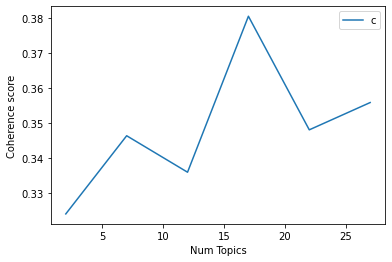

In [153]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_2020_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [154]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_2020_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 17

index: 0 | Num Topics = 2  has Coherence Value of 0.324
index: 1 | Num Topics = 7  has Coherence Value of 0.3463
index: 2 | Num Topics = 12  has Coherence Value of 0.3359
index: 3 | Num Topics = 17  has Coherence Value of 0.3804
index: 4 | Num Topics = 22  has Coherence Value of 0.348
index: 5 | Num Topics = 27  has Coherence Value of 0.3558


In [177]:
# Select optimal number of topics
optimal_model_sg_2020_score1N2N3 = model_list_sg_2020_score1N2N3[3]

In [178]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_2020_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_sg_2020_score1N2N3, corpus_sg_2020_score1N2N3, id2word_sg_2020_score1N2N3)

In [179]:
print("pyLDAVis for SG topics for score=1,2,3 in 2020:")
vis_sg_2020_score1N2N3

pyLDAVis for SG topics for score=1,2,3 in 2020:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
10    -0.075935 -0.010325       1        1  12.600734
1      0.128235  0.011248       2        1  12.250663
13     0.196803  0.014235       3        1   9.272907
9      0.046463 -0.234262       4        1   8.010172
5     -0.114556 -0.076305       5        1   7.275022
6      0.120728  0.009947       6        1   6.407032
7     -0.054116  0.030693       7        1   5.778917
14     0.098257  0.173826       8        1   5.203233
0     -0.013170  0.094518       9        1   5.107997
15    -0.128030  0.083679      10        1   4.848843
16    -0.168806  0.038143      11        1   4.615304
3     -0.005636 -0.104646      12        1   4.377768
12     0.065967  0.004875      13        1   4.135770
11     0.027337 -0.020818      14        1   3.448197
4     -0.018036 -0.070051      15        1   3.431085
8     -0.058501  0.010103      16        1   2.496351
2     -0.047003  0.045141      17        1   0.740004, topic_info=             Term        Freq       Total Category  logprob  loglift
84          story  148.000000  148.000000  Default  30.0000  30.0000
29           post  218.000000  218.000000  Default  29.0000  29.0000
0         account  172.000000  172.000000  Default  28.0000  28.0000
37   notification   66.000000   66.000000  Default  27.0000  27.0000
56         update  198.000000  198.000000  Default  26.0000  26.0000
..            ...         ...         ...      ...      ...      ...
98      instagram    0.634013  127.589817  Topic17  -4.6550  -0.3982
84          story    0.669240  148.652814  Topic17  -4.6009  -0.4970
0         account    0.592116  172.223585  Topic17  -4.7233  -0.7666
740          home    0.033010    8.674210  Topic17  -7.6102  -0.6650
33             dm    0.033005   18.294572  Topic17  -7.6104  -1.4114

[1088 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
880      11  0.587008      abhor
1332     13  0.601403    ability
39        1  0.237946       able
39        3  0.029743       able
39        5  0.029743       able
...     ...       ...        ...
318      13  0.302119  yesterday
431       9  0.596140        yop
477      17  0.716579       youu
184       6  0.727446       zoom
184      10  0.145489       zoom

[2113 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 2, 14, 10, 6, 7, 8, 15, 1, 16, 17, 4, 13, 12, 5, 9, 3])

## By-rating of 2021 (Rating=1,2,3)

In [158]:
# By-rating Topic Modelling - rating = 1,2,3 in 2021
# Convert to list - move to each section
review_sg_2021_score1N2N3 = instagram_ios_sg_review_YearMonth_2021_score1N2N3.review.values.tolist()
review_words_sg_2021_score1N2N3 = list(sent_to_words(review_sg_2021_score1N2N3))
print(review_words_sg_2021_score1N2N3[:1])

[['hi', 'really', 'dislike', 'the', 'fact', 'that', 'there', 'too', 'many', 'marketing', 'ads', 'and', 'am', 'only', 'able', 'to', 'see', 'very', 'few', 'posts', 'from', 'the', 'people', 'follow', 'am', 'also', 'unable', 'to', 'receive', 'access', 'to', 'the', 'new', 'instagram', 'updated', 'feature', 'to', 'do', 'animated', 'typography', 'for', 'instastories']]


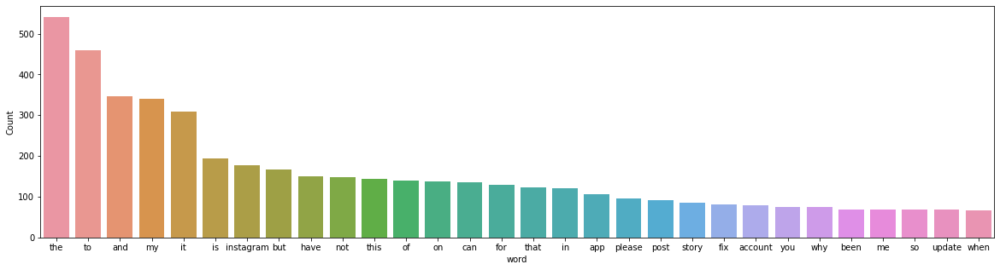

In [159]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_sg_2021_score1N2N3))

In [160]:
# Clean text
review_words_sg_ready_2021_score1N2N3 = process_words(review_words_sg_2021_score1N2N3)  # processed Text Data! - move to each section

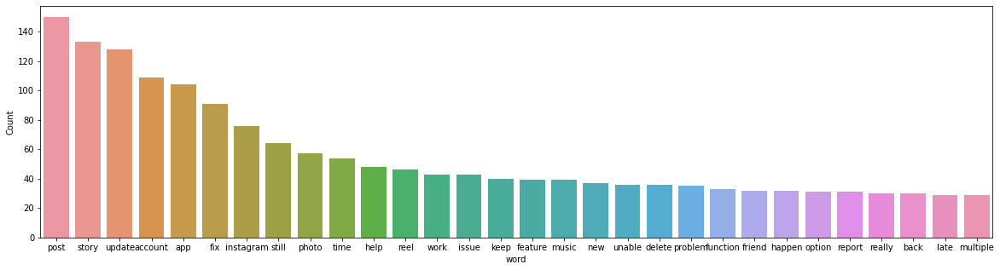

In [161]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_sg_ready_2021_score1N2N3))


In [162]:
# Create Dictionary
id2word_sg_2021_score1N2N3 = corpora.Dictionary(review_words_sg_ready_2021_score1N2N3)

2021-10-16 03:49:15,903 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 03:49:15,934 [INFO] gensim.corpora.dictionary - built Dictionary(1130 unique tokens: ['able', 'access', 'ad', 'animate', 'dislike']...) from 435 documents (total 5264 corpus positions)
2021-10-16 03:49:15,935 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1130 unique tokens: ['able', 'access', 'ad', 'animate', 'dislike']...) from 435 documents (total 5264 corpus positions)", 'datetime': '2021-10-16T03:49:15.935885', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [163]:
# Create Corpus: Term Document Frequency
corpus_sg_2021_score1N2N3 = [id2word_sg_2021_score1N2N3.doc2bow(text) for text in review_words_sg_ready_2021_score1N2N3]

In [164]:
# Training LDA model
model_list_sg_2021_score1N2N3, coherence_values_sg_2021_score1N2N3 = compute_coherence_values(dictionary=id2word_sg_2021_score1N2N3, corpus=corpus_sg_2021_score1N2N3, 
                                                              texts=review_words_sg_ready_2021_score1N2N3, limit=30, start=2, step=5)


2021-10-16 03:49:15,979 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 03:49:15,983 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 03:49:15,986 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 03:49:15,991 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 435 documents, updating model once every 435 documents, evaluating perplexity every 435 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 03:49:17,431 [INFO] gensim.models.ldamodel - -7.625 per-word bound, 197.4 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:49:17,434 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #435/435
2021-10-16 03:49:18,593 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.029*"post" + 0.021*"story" + 0.020*"update" + 0.019*"app" + 0.017*"fix" + 0.015*"account" + 0.013*"ins

2021-10-16 03:49:31,985 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"account" + 0.021*"update" + 0.020*"story" + 0.016*"reel" + 0.013*"app" + 0.012*"post" + 0.012*"work" + 0.011*"help" + 0.011*"instagram" + 0.010*"fix"
2021-10-16 03:49:31,986 [INFO] gensim.models.ldamodel - topic diff=0.010979, rho=0.301511
2021-10-16 03:49:32,756 [INFO] gensim.models.ldamodel - -6.436 per-word bound, 86.6 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:49:32,758 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #435/435
2021-10-16 03:49:33,285 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.033*"post" + 0.022*"story" + 0.019*"update" + 0.019*"app" + 0.018*"fix" + 0.013*"instagram" + 0.012*"photo" + 0.010*"account" + 0.010*"still" + 0.009*"time"
2021-10-16 03:49:33,288 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"account" + 0.021*"update" + 0.020*"story" + 0.016*"reel" + 0.013*"app" + 0.012*"post" + 0.012*"work" + 0.

2021-10-16 03:49:45,165 [INFO] gensim.models.ldamodel - topic diff=0.005247, rho=0.218218
2021-10-16 03:49:45,855 [INFO] gensim.models.ldamodel - -6.430 per-word bound, 86.2 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:49:45,857 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #435/435
2021-10-16 03:49:46,401 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"post" + 0.022*"story" + 0.020*"app" + 0.018*"update" + 0.018*"fix" + 0.013*"photo" + 0.012*"instagram" + 0.010*"account" + 0.010*"time" + 0.009*"still"
2021-10-16 03:49:46,404 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"account" + 0.022*"update" + 0.019*"story" + 0.016*"reel" + 0.013*"app" + 0.012*"instagram" + 0.012*"work" + 0.012*"still" + 0.011*"help" + 0.011*"feature"
2021-10-16 03:49:46,405 [INFO] gensim.models.ldamodel - topic diff=0.005071, rho=0.213201
2021-10-16 03:49:47,120 [INFO] gensim.models.ldamodel - -6.429 per-word bound, 86.2 perplex

2021-10-16 03:49:58,939 [INFO] gensim.models.ldamodel - -6.425 per-word bound, 85.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:49:58,941 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #435/435
2021-10-16 03:49:59,556 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.035*"post" + 0.023*"story" + 0.020*"app" + 0.018*"fix" + 0.018*"update" + 0.013*"photo" + 0.011*"instagram" + 0.010*"time" + 0.009*"account" + 0.008*"still"
2021-10-16 03:49:59,584 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"account" + 0.023*"update" + 0.018*"story" + 0.016*"reel" + 0.013*"instagram" + 0.013*"still" + 0.012*"app" + 0.012*"work" + 0.011*"feature" + 0.011*"help"
2021-10-16 03:49:59,585 [INFO] gensim.models.ldamodel - topic diff=0.004654, rho=0.176777
2021-10-16 03:50:00,349 [INFO] gensim.models.ldamodel - -6.425 per-word bound, 85.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:50:

2021-10-16 03:50:12,459 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #435/435
2021-10-16 03:50:12,956 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.035*"post" + 0.024*"story" + 0.020*"app" + 0.018*"fix" + 0.017*"update" + 0.013*"photo" + 0.011*"instagram" + 0.010*"time" + 0.009*"account" + 0.008*"keep"
2021-10-16 03:50:12,959 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"account" + 0.024*"update" + 0.017*"story" + 0.016*"reel" + 0.014*"instagram" + 0.013*"still" + 0.012*"app" + 0.012*"music" + 0.012*"work" + 0.011*"feature"
2021-10-16 03:50:12,961 [INFO] gensim.models.ldamodel - topic diff=0.004305, rho=0.154303
2021-10-16 03:50:13,587 [INFO] gensim.models.ldamodel - -6.420 per-word bound, 85.7 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:50:13,589 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #435/435
2021-10-16 03:50:14,093 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.035*"post

2021-10-16 03:50:23,593 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 03:50:27,745 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 03:50:27,802 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 414 virtual documents
2021-10-16 03:50:28,061 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-16 03:50:28,065 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-16 03:50:28,089 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 03:50:28,091 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 435 documents, updating model once every 435 documents, evaluating perplexity every 435 documents, iterating 50x with a con

2021-10-16 03:50:34,091 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.034*"update" + 0.025*"post" + 0.020*"story" + 0.019*"photo" + 0.019*"app" + 0.017*"issue" + 0.017*"fix" + 0.016*"time" + 0.015*"keep" + 0.014*"multiple"
2021-10-16 03:50:34,092 [INFO] gensim.models.ldamodel - topic diff=0.066510, rho=0.408248
2021-10-16 03:50:34,620 [INFO] gensim.models.ldamodel - -6.740 per-word bound, 106.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:50:34,621 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #435/435
2021-10-16 03:50:35,010 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.039*"post" + 0.039*"account" + 0.031*"story" + 0.017*"still" + 0.016*"update" + 0.016*"fix" + 0.013*"app" + 0.012*"share" + 0.012*"change" + 0.011*"unable"
2021-10-16 03:50:35,012 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.034*"update" + 0.025*"post" + 0.020*"story" + 0.019*"app" + 0.019*"photo" + 0.018*"issue" + 0.017*"time" + 0.017*

2021-10-16 03:50:39,784 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"ad" + 0.026*"instagram" + 0.015*"fix" + 0.015*"story" + 0.014*"post" + 0.012*"music" + 0.011*"frustrating" + 0.010*"feature" + 0.009*"asap" + 0.009*"shame"
2021-10-16 03:50:39,787 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.044*"update" + 0.035*"reel" + 0.022*"story" + 0.019*"still" + 0.018*"fix" + 0.017*"instagram" + 0.017*"option" + 0.016*"app" + 0.015*"work" + 0.014*"friend"
2021-10-16 03:50:39,794 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.024*"post" + 0.023*"app" + 0.021*"story" + 0.021*"account" + 0.016*"instagram" + 0.015*"happen" + 0.013*"function" + 0.012*"fix" + 0.010*"camera" + 0.009*"people"
2021-10-16 03:50:39,806 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.022*"story" + 0.017*"account" + 0.015*"function" + 0.014*"tag" + 0.013*"app" + 0.012*"post" + 0.011*"disappear" + 0.010*"stop" + 0.010*"view" + 0.010*"really"
2021-10-16 03:50:39,812 [INFO] gensim.models.ldamodel - 

2021-10-16 03:50:44,406 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.022*"story" + 0.017*"function" + 0.017*"account" + 0.014*"tag" + 0.013*"app" + 0.012*"post" + 0.011*"disappear" + 0.010*"view" + 0.010*"really" + 0.010*"stop"
2021-10-16 03:50:44,410 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.024*"post" + 0.023*"app" + 0.022*"story" + 0.020*"account" + 0.015*"instagram" + 0.015*"happen" + 0.013*"fix" + 0.012*"function" + 0.010*"people" + 0.010*"camera"
2021-10-16 03:50:44,414 [INFO] gensim.models.ldamodel - topic diff=0.009871, rho=0.242536
2021-10-16 03:50:44,922 [INFO] gensim.models.ldamodel - -6.696 per-word bound, 103.7 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:50:44,924 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #435/435
2021-10-16 03:50:45,362 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.047*"update" + 0.036*"reel" + 0.022*"story" + 0.020*"still" + 0.018*"instagram" + 0.018*"fix" + 0.0

2021-10-16 03:50:49,697 [INFO] gensim.models.ldamodel - -6.691 per-word bound, 103.4 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:50:49,699 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #435/435
2021-10-16 03:50:50,116 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.022*"story" + 0.019*"function" + 0.017*"account" + 0.014*"tag" + 0.013*"app" + 0.012*"post" + 0.011*"disappear" + 0.010*"photo" + 0.010*"view" + 0.010*"really"
2021-10-16 03:50:50,118 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.025*"post" + 0.023*"app" + 0.022*"story" + 0.020*"account" + 0.015*"instagram" + 0.014*"happen" + 0.013*"fix" + 0.011*"function" + 0.011*"people" + 0.010*"camera"
2021-10-16 03:50:50,123 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.043*"post" + 0.035*"account" + 0.031*"story" + 0.017*"fix" + 0.015*"still" + 0.014*"app" + 0.013*"share" + 0.013*"change" + 0.012*"update" + 0.012*"unable"
2021-10-16 03:50:50,128 [INFO] g

2021-10-16 03:50:54,786 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.025*"post" + 0.023*"app" + 0.023*"story" + 0.020*"account" + 0.015*"instagram" + 0.014*"happen" + 0.013*"fix" + 0.011*"function" + 0.011*"people" + 0.010*"camera"
2021-10-16 03:50:54,789 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.044*"post" + 0.035*"account" + 0.031*"story" + 0.017*"fix" + 0.015*"still" + 0.014*"app" + 0.013*"share" + 0.013*"change" + 0.011*"unable" + 0.011*"update"
2021-10-16 03:50:54,791 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.034*"update" + 0.025*"post" + 0.021*"app" + 0.019*"story" + 0.019*"photo" + 0.018*"issue" + 0.017*"time" + 0.017*"multiple" + 0.015*"fix" + 0.015*"keep"
2021-10-16 03:50:54,793 [INFO] gensim.models.ldamodel - topic diff=0.004460, rho=0.188982
2021-10-16 03:50:55,355 [INFO] gensim.models.ldamodel - -6.688 per-word bound, 103.1 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:50:55,356 [INFO] gensim.models.

2021-10-16 03:50:59,269 [INFO] gensim.models.ldamodel - topic diff=0.003696, rho=0.174078
2021-10-16 03:50:59,780 [INFO] gensim.models.ldamodel - -6.684 per-word bound, 102.8 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:50:59,781 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #435/435
2021-10-16 03:51:00,155 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.048*"update" + 0.035*"reel" + 0.023*"still" + 0.021*"story" + 0.019*"instagram" + 0.018*"fix" + 0.018*"account" + 0.017*"app" + 0.016*"option" + 0.015*"late"
2021-10-16 03:51:00,157 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.045*"post" + 0.034*"account" + 0.032*"story" + 0.017*"fix" + 0.014*"still" + 0.013*"share" + 0.013*"change" + 0.013*"app" + 0.011*"help" + 0.011*"unable"
2021-10-16 03:51:00,164 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.035*"post" + 0.027*"notification" + 0.015*"app" + 0.014*"instagram" + 0.013*"fine" + 0.013*"load" + 0.012*"in

2021-10-16 03:51:04,793 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.022*"story" + 0.018*"function" + 0.018*"account" + 0.014*"tag" + 0.013*"app" + 0.012*"post" + 0.011*"highlight" + 0.011*"disappear" + 0.011*"save" + 0.010*"photo"
2021-10-16 03:51:04,817 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.035*"post" + 0.027*"notification" + 0.015*"app" + 0.014*"instagram" + 0.013*"load" + 0.013*"fine" + 0.012*"internet" + 0.012*"datum" + 0.012*"error" + 0.012*"fix"
2021-10-16 03:51:04,822 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.048*"update" + 0.035*"reel" + 0.024*"still" + 0.021*"story" + 0.019*"instagram" + 0.019*"account" + 0.019*"fix" + 0.017*"app" + 0.016*"option" + 0.016*"late"
2021-10-16 03:51:04,834 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.036*"ad" + 0.022*"instagram" + 0.015*"story" + 0.013*"post" + 0.013*"fix" + 0.011*"frustrating" + 0.010*"asap" + 0.010*"shame" + 0.010*"icon" + 0.010*"tap"
2021-10-16 03:51:04,838 [INFO] gensim.models.ldamodel - 

2021-10-16 03:51:09,721 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.045*"post" + 0.034*"account" + 0.032*"story" + 0.018*"fix" + 0.013*"change" + 0.013*"share" + 0.013*"still" + 0.012*"app" + 0.011*"help" + 0.011*"picture"
2021-10-16 03:51:09,723 [INFO] gensim.models.ldamodel - topic diff=0.002232, rho=0.150756
2021-10-16 03:51:10,270 [INFO] gensim.models.ldamodel - -6.678 per-word bound, 102.4 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:51:10,272 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #435/435
2021-10-16 03:51:10,683 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.034*"update" + 0.026*"post" + 0.022*"app" + 0.020*"photo" + 0.019*"story" + 0.018*"multiple" + 0.018*"issue" + 0.018*"time" + 0.015*"fix" + 0.015*"keep"
2021-10-16 03:51:10,690 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.048*"update" + 0.034*"reel" + 0.025*"still" + 0.021*"story" + 0.019*"account" + 0.019*"instagram" + 0.019*"fix" +

2021-10-16 03:51:15,255 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.025*"post" + 0.023*"story" + 0.023*"app" + 0.020*"account" + 0.016*"instagram" + 0.013*"happen" + 0.013*"fix" + 0.011*"people" + 0.010*"back" + 0.010*"camera"
2021-10-16 03:51:15,258 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.048*"update" + 0.034*"reel" + 0.025*"still" + 0.021*"story" + 0.020*"account" + 0.019*"instagram" + 0.019*"fix" + 0.017*"app" + 0.016*"music" + 0.016*"late"
2021-10-16 03:51:15,273 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.033*"post" + 0.028*"notification" + 0.015*"app" + 0.014*"instagram" + 0.013*"load" + 0.013*"fine" + 0.012*"internet" + 0.012*"error" + 0.012*"datum" + 0.012*"fix"
2021-10-16 03:51:15,281 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.021*"story" + 0.018*"account" + 0.018*"function" + 0.014*"tag" + 0.013*"app" + 0.013*"post" + 0.011*"highlight" + 0.011*"disappear" + 0.011*"feature" + 0.011*"save"
2021-10-16 03:51:15,283 [INFO] gensim.models.ldamode

2021-10-16 03:51:24,682 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.040*"story" + 0.029*"work" + 0.023*"post" + 0.017*"instagram" + 0.015*"happen" + 0.014*"time" + 0.014*"help" + 0.013*"app" + 0.013*"feed" + 0.011*"error"
2021-10-16 03:51:24,683 [INFO] gensim.models.ldamodel - topic diff=0.148258, rho=0.500000
2021-10-16 03:51:25,256 [INFO] gensim.models.ldamodel - -6.919 per-word bound, 121.0 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:51:25,258 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #435/435
2021-10-16 03:51:25,651 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"post" + 0.035*"account" + 0.034*"story" + 0.019*"update" + 0.017*"still" + 0.016*"fix" + 0.015*"share" + 0.015*"photo" + 0.011*"time" + 0.011*"new"
2021-10-16 03:51:25,652 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.040*"story" + 0.029*"work" + 0.024*"post" + 0.018*"instagram" + 0.015*"happen" + 0.014*"time" + 0.013*"help" + 0.01

2021-10-16 03:51:30,389 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.058*"ad" + 0.024*"story" + 0.018*"phone" + 0.017*"app" + 0.016*"update" + 0.015*"fix" + 0.015*"shame" + 0.015*"text" + 0.014*"disappear" + 0.011*"work"
2021-10-16 03:51:30,390 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.040*"instagram" + 0.034*"update" + 0.022*"music" + 0.021*"app" + 0.020*"post" + 0.019*"change" + 0.019*"message" + 0.017*"picture" + 0.014*"feature" + 0.014*"account"
2021-10-16 03:51:30,392 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.033*"update" + 0.027*"tag" + 0.022*"multiple" + 0.021*"fix" + 0.021*"report" + 0.021*"story" + 0.019*"app" + 0.019*"photo" + 0.018*"help" + 0.017*"time"
2021-10-16 03:51:30,393 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.042*"story" + 0.040*"view" + 0.023*"update" + 0.021*"fix" + 0.013*"friend" + 0.011*"app" + 0.011*"account" + 0.011*"back" + 0.010*"keep" + 0.010*"singapore"
2021-10-16 03:51:30,394 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 03:51:35,100 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.053*"post" + 0.035*"account" + 0.035*"story" + 0.018*"share" + 0.017*"photo" + 0.017*"update" + 0.016*"still" + 0.013*"fix" + 0.012*"time" + 0.012*"new"
2021-10-16 03:51:35,101 [INFO] gensim.models.ldamodel - topic diff=0.018767, rho=0.258199
2021-10-16 03:51:35,601 [INFO] gensim.models.ldamodel - -6.801 per-word bound, 111.5 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:51:35,602 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #435/435
2021-10-16 03:51:35,933 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.026*"post" + 0.020*"keep" + 0.019*"crash" + 0.018*"app" + 0.018*"fix" + 0.018*"issue" + 0.017*"wrong" + 0.016*"account" + 0.015*"instagram" + 0.012*"time"
2021-10-16 03:51:35,935 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.044*"story" + 0.041*"view" + 0.021*"fix" + 0.021*"update" + 0.014*"friend" + 0.011*"back" + 0.011*"singapore" + 0

2021-10-16 03:51:40,343 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.068*"reel" + 0.036*"music" + 0.034*"account" + 0.024*"option" + 0.022*"instagram" + 0.020*"remove" + 0.020*"available" + 0.017*"feature" + 0.016*"post" + 0.015*"app"
2021-10-16 03:51:40,347 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.071*"post" + 0.056*"notification" + 0.025*"story" + 0.016*"update" + 0.015*"open" + 0.014*"time" + 0.013*"keep" + 0.012*"turn" + 0.012*"fix" + 0.011*"show"
2021-10-16 03:51:40,348 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"story" + 0.027*"work" + 0.024*"post" + 0.020*"instagram" + 0.017*"error" + 0.017*"happen" + 0.015*"connection" + 0.014*"app" + 0.014*"time" + 0.014*"feed"
2021-10-16 03:51:40,350 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.026*"post" + 0.020*"keep" + 0.019*"crash" + 0.018*"app" + 0.018*"fix" + 0.018*"issue" + 0.018*"wrong" + 0.015*"account" + 0.015*"instagram" + 0.012*"time"
2021-10-16 03:51:40,351 [INFO] gensim.models.ldamodel - top

2021-10-16 03:51:44,684 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.068*"reel" + 0.042*"music" + 0.033*"account" + 0.024*"option" + 0.024*"instagram" + 0.021*"remove" + 0.020*"available" + 0.018*"feature" + 0.016*"post" + 0.015*"app"
2021-10-16 03:51:44,686 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.027*"highlight" + 0.026*"story" + 0.020*"feature" + 0.018*"theme" + 0.017*"really" + 0.015*"account" + 0.015*"app" + 0.013*"new" + 0.012*"people" + 0.012*"link"
2021-10-16 03:51:44,687 [INFO] gensim.models.ldamodel - topic diff=0.006853, rho=0.196116
2021-10-16 03:51:45,222 [INFO] gensim.models.ldamodel - -6.780 per-word bound, 109.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:51:45,223 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #435/435
2021-10-16 03:51:45,588 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.057*"post" + 0.036*"account" + 0.036*"story" + 0.019*"share" + 0.018*"photo" + 0.014*"still" +

2021-10-16 03:51:49,722 [INFO] gensim.models.ldamodel - -6.775 per-word bound, 109.5 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:51:49,724 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #435/435
2021-10-16 03:51:50,120 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.065*"ad" + 0.024*"story" + 0.017*"phone" + 0.016*"fix" + 0.016*"shame" + 0.016*"text" + 0.013*"app" + 0.012*"disappear" + 0.012*"animation" + 0.012*"post"
2021-10-16 03:51:50,122 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.058*"post" + 0.036*"account" + 0.035*"story" + 0.019*"share" + 0.019*"photo" + 0.013*"time" + 0.013*"fix" + 0.012*"still" + 0.012*"new" + 0.011*"feed"
2021-10-16 03:51:50,123 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.068*"reel" + 0.045*"music" + 0.033*"account" + 0.025*"option" + 0.025*"instagram" + 0.021*"remove" + 0.020*"available" + 0.017*"feature" + 0.016*"post" + 0.015*"app"
2021-10-16 03:51:50,125 [INFO] gensim.m

2021-10-16 03:51:54,596 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.035*"update" + 0.035*"instagram" + 0.022*"change" + 0.021*"app" + 0.021*"post" + 0.021*"message" + 0.020*"music" + 0.018*"picture" + 0.016*"sticker" + 0.015*"account"
2021-10-16 03:51:54,597 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.031*"post" + 0.022*"photo" + 0.020*"app" + 0.020*"account" + 0.019*"camera" + 0.014*"fix" + 0.013*"save" + 0.012*"video" + 0.011*"function" + 0.010*"happen"
2021-10-16 03:51:54,599 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.027*"post" + 0.023*"keep" + 0.022*"crash" + 0.021*"app" + 0.019*"wrong" + 0.018*"fix" + 0.016*"account" + 0.015*"issue" + 0.014*"instagram" + 0.011*"time"
2021-10-16 03:51:54,600 [INFO] gensim.models.ldamodel - topic diff=0.003660, rho=0.164399
2021-10-16 03:51:54,922 [INFO] gensim.models.ldamodel - -6.770 per-word bound, 109.1 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:51:54,926 [INFO] gensim

2021-10-16 03:51:58,774 [INFO] gensim.models.ldamodel - topic diff=0.002909, rho=0.154303
2021-10-16 03:51:59,326 [INFO] gensim.models.ldamodel - -6.766 per-word bound, 108.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:51:59,328 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #435/435
2021-10-16 03:51:59,779 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.033*"update" + 0.029*"tag" + 0.028*"multiple" + 0.022*"fix" + 0.021*"photo" + 0.021*"story" + 0.021*"report" + 0.019*"issue" + 0.019*"time" + 0.018*"help"
2021-10-16 03:51:59,781 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.065*"ad" + 0.024*"story" + 0.017*"phone" + 0.016*"fix" + 0.016*"shame" + 0.015*"text" + 0.013*"app" + 0.013*"post" + 0.012*"disappear" + 0.012*"animation"
2021-10-16 03:51:59,784 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.069*"reel" + 0.047*"music" + 0.033*"account" + 0.025*"option" + 0.025*"instagram" + 0.022*"remove" + 0.021*"ava

2021-10-16 03:52:04,273 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.033*"update" + 0.029*"tag" + 0.028*"multiple" + 0.022*"fix" + 0.022*"photo" + 0.021*"story" + 0.021*"report" + 0.019*"issue" + 0.019*"time" + 0.018*"help"
2021-10-16 03:52:04,277 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.030*"post" + 0.021*"photo" + 0.020*"app" + 0.020*"account" + 0.019*"camera" + 0.014*"fix" + 0.013*"save" + 0.012*"video" + 0.010*"function" + 0.010*"happen"
2021-10-16 03:52:04,282 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.070*"post" + 0.058*"notification" + 0.025*"story" + 0.019*"open" + 0.016*"update" + 0.015*"time" + 0.013*"keep" + 0.012*"turn" + 0.012*"fix" + 0.011*"show"
2021-10-16 03:52:04,288 [INFO] gensim.models.ldamodel - topic diff=0.002190, rho=0.144338
2021-10-16 03:52:04,795 [INFO] gensim.models.ldamodel - -6.764 per-word bound, 108.7 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:52:04,797 [INFO] gensim.models.ldam

2021-10-16 03:52:15,139 [INFO] gensim.models.ldamodel - -7.219 per-word bound, 148.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:52:15,141 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #435/435
2021-10-16 03:52:15,524 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.060*"post" + 0.041*"story" + 0.036*"account" + 0.018*"photo" + 0.016*"still" + 0.014*"share" + 0.014*"new" + 0.013*"update" + 0.013*"notification" + 0.011*"fix"
2021-10-16 03:52:15,528 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.039*"post" + 0.030*"story" + 0.027*"happen" + 0.021*"work" + 0.018*"fix" + 0.017*"update" + 0.016*"fine" + 0.015*"problem" + 0.015*"still" + 0.014*"photo"
2021-10-16 03:52:15,546 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.023*"story" + 0.023*"tag" + 0.023*"account" + 0.022*"friend" + 0.017*"people" + 0.016*"app" + 0.016*"photo" + 0.014*"theme" + 0.013*"work" + 0.010*"issue"
2021-10-16 03:52:15,560 [INFO] gensim.mod

2021-10-16 03:52:19,984 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.051*"story" + 0.041*"update" + 0.030*"viewer" + 0.019*"list" + 0.017*"highlight" + 0.016*"fix" + 0.015*"app" + 0.015*"reel" + 0.014*"view" + 0.014*"music"
2021-10-16 03:52:19,985 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.066*"reel" + 0.039*"option" + 0.031*"instagram" + 0.020*"still" + 0.019*"app" + 0.018*"edit" + 0.015*"feature" + 0.015*"account" + 0.015*"music" + 0.012*"function"
2021-10-16 03:52:19,986 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.026*"keep" + 0.025*"issue" + 0.021*"fix" + 0.018*"app" + 0.017*"post" + 0.015*"work" + 0.014*"time" + 0.012*"multiple" + 0.012*"datum" + 0.011*"connection"
2021-10-16 03:52:19,989 [INFO] gensim.models.ldamodel - topic diff=0.061518, rho=0.353553
2021-10-16 03:52:20,526 [INFO] gensim.models.ldamodel - -6.964 per-word bound, 124.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:52:20,529 [INFO] gensim.mo

2021-10-16 03:52:24,216 [INFO] gensim.models.ldamodel - topic diff=0.023081, rho=0.277350
2021-10-16 03:52:24,746 [INFO] gensim.models.ldamodel - -6.927 per-word bound, 121.7 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:52:24,747 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #435/435
2021-10-16 03:52:25,107 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.070*"reel" + 0.040*"option" + 0.031*"instagram" + 0.020*"still" + 0.018*"edit" + 0.017*"function" + 0.017*"music" + 0.015*"account" + 0.015*"feature" + 0.014*"app"
2021-10-16 03:52:25,108 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.026*"account" + 0.024*"post" + 0.020*"report" + 0.018*"app" + 0.014*"function" + 0.013*"support" + 0.012*"save" + 0.012*"photo" + 0.012*"fix" + 0.011*"happen"
2021-10-16 03:52:25,110 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.070*"update" + 0.042*"text" + 0.032*"animate" + 0.028*"late" + 0.028*"still" + 0.025*"app" + 0.0

2021-10-16 03:52:29,471 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.026*"account" + 0.025*"post" + 0.021*"report" + 0.017*"app" + 0.013*"support" + 0.013*"save" + 0.013*"photo" + 0.012*"fix" + 0.012*"function" + 0.011*"happen"
2021-10-16 03:52:29,473 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.063*"post" + 0.049*"story" + 0.043*"account" + 0.021*"share" + 0.017*"photo" + 0.017*"new" + 0.014*"notification" + 0.013*"feature" + 0.012*"add" + 0.011*"still"
2021-10-16 03:52:29,478 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.045*"post" + 0.040*"story" + 0.037*"happen" + 0.022*"problem" + 0.021*"fix" + 0.020*"work" + 0.018*"back" + 0.017*"fine" + 0.015*"feed" + 0.014*"disappear"
2021-10-16 03:52:29,479 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.051*"story" + 0.042*"update" + 0.039*"viewer" + 0.022*"list" + 0.017*"fix" + 0.015*"reel" + 0.015*"highlight" + 0.013*"view" + 0.011*"app" + 0.011*"music"
2021-10-16 03:52:29,480 [INFO] gensim.models.ldamodel - topic d

2021-10-16 03:52:34,025 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.027*"account" + 0.027*"friend" + 0.023*"really" + 0.022*"message" + 0.017*"post" + 0.017*"guy" + 0.014*"help" + 0.013*"problem" + 0.012*"fix" + 0.012*"picture"
2021-10-16 03:52:34,031 [INFO] gensim.models.ldamodel - topic diff=0.006749, rho=0.204124
2021-10-16 03:52:34,582 [INFO] gensim.models.ldamodel - -6.898 per-word bound, 119.3 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:52:34,585 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #435/435
2021-10-16 03:52:34,972 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.030*"post" + 0.028*"notification" + 0.024*"account" + 0.013*"help" + 0.013*"friend" + 0.013*"phone" + 0.013*"shame" + 0.013*"connect" + 0.012*"instagram" + 0.011*"back"
2021-10-16 03:52:34,976 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.075*"reel" + 0.041*"option" + 0.031*"instagram" + 0.020*"still" + 0.020*"function" + 0.019

2021-10-16 03:52:39,365 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.058*"update" + 0.048*"app" + 0.033*"delete" + 0.029*"work" + 0.027*"fix" + 0.026*"late" + 0.024*"phone" + 0.022*"still" + 0.017*"bug" + 0.017*"story"
2021-10-16 03:52:39,367 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.036*"story" + 0.031*"post" + 0.025*"report" + 0.019*"problem" + 0.018*"day" + 0.018*"time" + 0.013*"ig" + 0.012*"account" + 0.011*"update" + 0.011*"app"
2021-10-16 03:52:39,368 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.046*"post" + 0.042*"story" + 0.038*"happen" + 0.022*"problem" + 0.021*"fix" + 0.019*"work" + 0.018*"back" + 0.017*"fine" + 0.015*"feed" + 0.014*"disappear"
2021-10-16 03:52:39,370 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.045*"post" + 0.038*"multiple" + 0.032*"photo" + 0.029*"update" + 0.025*"time" + 0.024*"app" + 0.021*"story" + 0.019*"help" + 0.018*"fix" + 0.014*"keep"
2021-10-16 03:52:39,372 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.027*"fr

2021-10-16 03:52:43,639 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.028*"friend" + 0.027*"account" + 0.023*"really" + 0.022*"message" + 0.017*"guy" + 0.017*"post" + 0.014*"help" + 0.013*"problem" + 0.012*"fix" + 0.012*"picture"
2021-10-16 03:52:43,641 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.045*"post" + 0.038*"multiple" + 0.032*"photo" + 0.029*"update" + 0.025*"time" + 0.024*"app" + 0.021*"story" + 0.019*"help" + 0.018*"fix" + 0.015*"keep"
2021-10-16 03:52:43,642 [INFO] gensim.models.ldamodel - topic diff=0.002903, rho=0.169031
2021-10-16 03:52:44,154 [INFO] gensim.models.ldamodel - -6.890 per-word bound, 118.6 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:52:44,159 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #435/435
2021-10-16 03:52:44,549 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.043*"account" + 0.025*"reel" + 0.023*"post" + 0.020*"reason" + 0.020*"feature" + 0.017*"instagram" + 0.015*"

2021-10-16 03:52:48,531 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #435/435
2021-10-16 03:52:48,876 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.057*"update" + 0.049*"app" + 0.033*"delete" + 0.029*"work" + 0.028*"fix" + 0.024*"late" + 0.024*"phone" + 0.022*"still" + 0.018*"bug" + 0.016*"story"
2021-10-16 03:52:48,878 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.058*"tag" + 0.029*"photo" + 0.028*"account" + 0.027*"friend" + 0.016*"story" + 0.016*"theme" + 0.016*"people" + 0.015*"work" + 0.014*"instagram" + 0.013*"app"
2021-10-16 03:52:48,880 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.077*"reel" + 0.041*"option" + 0.030*"instagram" + 0.021*"still" + 0.021*"function" + 0.019*"edit" + 0.018*"music" + 0.016*"account" + 0.015*"feature" + 0.014*"happen"
2021-10-16 03:52:48,883 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.050*"story" + 0.042*"viewer" + 0.038*"update" + 0.023*"list" + 0.016*"reel" + 0.016*"fix" + 0.016*"highlight" + 0.012*"ap

2021-10-16 03:52:53,260 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.094*"update" + 0.038*"text" + 0.036*"late" + 0.035*"version" + 0.029*"new" + 0.028*"animate" + 0.028*"app" + 0.026*"still" + 0.019*"story" + 0.018*"view"
2021-10-16 03:52:53,261 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.050*"story" + 0.042*"viewer" + 0.036*"update" + 0.023*"list" + 0.016*"reel" + 0.016*"fix" + 0.016*"highlight" + 0.012*"app" + 0.012*"music" + 0.012*"always"
2021-10-16 03:52:53,262 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.045*"update" + 0.034*"fix" + 0.034*"change" + 0.023*"picture" + 0.020*"still" + 0.019*"pic" + 0.019*"bug" + 0.016*"account" + 0.015*"profile" + 0.015*"experience"
2021-10-16 03:52:53,263 [INFO] gensim.models.ldamodel - topic diff=0.001762, rho=0.147442
2021-10-16 03:52:53,779 [INFO] gensim.models.ldamodel - -6.885 per-word bound, 118.2 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:52:53,780 [INFO] gensim.mo

2021-10-16 03:52:57,484 [INFO] gensim.models.ldamodel - topic diff=0.001473, rho=0.140028
2021-10-16 03:52:57,485 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=1130, num_topics=17, decay=0.5, chunksize=1000) in 44.50s', 'datetime': '2021-10-16T03:52:57.485354', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 03:52:57,493 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 03:53:01,494 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 03:53:01,553 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 429 virtual documents
2021-10-16 03:53:04,148 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.045454545454545456
2021-10-

2021-10-16 03:53:09,265 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.078*"ad" + 0.041*"instagram" + 0.034*"music" + 0.029*"story" + 0.017*"enjoy" + 0.017*"still" + 0.014*"photo" + 0.013*"post" + 0.012*"app" + 0.012*"friend"
2021-10-16 03:53:09,266 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.041*"account" + 0.024*"story" + 0.020*"instagram" + 0.016*"app" + 0.015*"post" + 0.015*"instead" + 0.014*"view" + 0.012*"highlight" + 0.012*"guy" + 0.011*"update"
2021-10-16 03:53:09,268 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.038*"update" + 0.028*"fix" + 0.022*"late" + 0.019*"app" + 0.014*"issue" + 0.014*"story" + 0.013*"bug" + 0.013*"quite" + 0.013*"friend" + 0.013*"unable"
2021-10-16 03:53:09,269 [INFO] gensim.models.ldamodel - topic diff=0.093811, rho=0.408248
2021-10-16 03:53:09,761 [INFO] gensim.models.ldamodel - -7.081 per-word bound, 135.3 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:53:09,763 [INFO] gensim.models.l

2021-10-16 03:53:13,500 [INFO] gensim.models.ldamodel - topic diff=0.034264, rho=0.301511
2021-10-16 03:53:14,086 [INFO] gensim.models.ldamodel - -7.032 per-word bound, 130.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:53:14,094 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #435/435
2021-10-16 03:53:14,432 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.044*"update" + 0.040*"story" + 0.035*"always" + 0.022*"app" + 0.019*"post" + 0.018*"music" + 0.015*"still" + 0.014*"datum" + 0.013*"instagram" + 0.013*"hate"
2021-10-16 03:53:14,435 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.041*"update" + 0.029*"fix" + 0.024*"late" + 0.023*"app" + 0.016*"bug" + 0.015*"friend" + 0.014*"story" + 0.014*"unable" + 0.013*"issue" + 0.013*"quite"
2021-10-16 03:53:14,442 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.040*"account" + 0.026*"post" + 0.024*"app" + 0.023*"story" + 0.022*"update" + 0.021*"new" + 0.021*"still" + 

2021-10-16 03:53:18,801 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.071*"music" + 0.032*"instagram" + 0.026*"update" + 0.025*"happen" + 0.020*"time" + 0.020*"function" + 0.020*"region" + 0.020*"country" + 0.015*"sound" + 0.015*"story"
2021-10-16 03:53:18,804 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.044*"update" + 0.027*"story" + 0.023*"problem" + 0.019*"report" + 0.019*"post" + 0.018*"instagram" + 0.018*"reinstall" + 0.015*"app" + 0.013*"day" + 0.012*"really"
2021-10-16 03:53:18,806 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.068*"story" + 0.027*"view" + 0.027*"insta" + 0.026*"post" + 0.025*"app" + 0.021*"people" + 0.021*"viewer" + 0.019*"fix" + 0.018*"delete" + 0.016*"account"
2021-10-16 03:53:18,808 [INFO] gensim.models.ldamodel - topic diff=0.011668, rho=0.242536
2021-10-16 03:53:19,366 [INFO] gensim.models.ldamodel - -7.012 per-word bound, 129.1 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:53:19,368 [INFO

2021-10-16 03:53:23,292 [INFO] gensim.models.ldamodel - topic diff=0.008470, rho=0.213201
2021-10-16 03:53:23,781 [INFO] gensim.models.ldamodel - -7.001 per-word bound, 128.1 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:53:23,782 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #435/435
2021-10-16 03:53:24,134 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.032*"account" + 0.032*"fix" + 0.026*"camera" + 0.025*"function" + 0.024*"still" + 0.024*"post" + 0.019*"app" + 0.019*"photo" + 0.015*"asap" + 0.015*"story"
2021-10-16 03:53:24,136 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.044*"update" + 0.040*"story" + 0.035*"always" + 0.021*"app" + 0.019*"post" + 0.018*"music" + 0.015*"still" + 0.014*"datum" + 0.013*"instagram" + 0.013*"hate"
2021-10-16 03:53:24,137 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.045*"account" + 0.021*"instagram" + 0.020*"story" + 0.017*"instead" + 0.014*"highlight" + 0.013*"guy" + 0.

2021-10-16 03:53:28,343 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.086*"music" + 0.036*"instagram" + 0.028*"happen" + 0.023*"update" + 0.021*"region" + 0.021*"time" + 0.019*"country" + 0.017*"story" + 0.017*"function" + 0.015*"available"
2021-10-16 03:53:28,345 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.033*"lose" + 0.032*"function" + 0.023*"yet" + 0.017*"account" + 0.017*"heart" + 0.017*"family" + 0.017*"story" + 0.017*"viewer" + 0.009*"understand" + 0.009*"platform"
2021-10-16 03:53:28,347 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.038*"post" + 0.032*"account" + 0.029*"notification" + 0.026*"phone" + 0.025*"reinstall" + 0.024*"app" + 0.024*"delete" + 0.020*"feature" + 0.017*"time" + 0.017*"photo"
2021-10-16 03:53:28,349 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.089*"ad" + 0.024*"story" + 0.019*"enjoy" + 0.018*"animation" + 0.017*"instagram" + 0.015*"photo" + 0.014*"app" + 0.014*"post" + 0.013*"friend" + 0.013*"way"
2021-10-16 03:53:28,350 [INFO]

2021-10-16 03:53:32,511 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.115*"reel" + 0.048*"update" + 0.043*"instagram" + 0.042*"option" + 0.038*"feature" + 0.030*"still" + 0.027*"post" + 0.023*"music" + 0.019*"available" + 0.017*"account"
2021-10-16 03:53:32,512 [INFO] gensim.models.ldamodel - topic diff=0.004943, rho=0.174078
2021-10-16 03:53:32,928 [INFO] gensim.models.ldamodel - -6.981 per-word bound, 126.4 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:53:32,930 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #435/435
2021-10-16 03:53:33,252 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.025*"post" + 0.024*"fix" + 0.022*"issue" + 0.019*"help" + 0.019*"refresh" + 0.019*"wrong" + 0.019*"really" + 0.016*"still" + 0.016*"instagram" + 0.016*"day"
2021-10-16 03:53:33,255 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.041*"report" + 0.031*"account" + 0.028*"keep" + 0.027*"crash" + 0.023*"app" + 0.019*"reply" + 

2021-10-16 03:53:37,588 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.046*"update" + 0.029*"story" + 0.024*"problem" + 0.020*"report" + 0.019*"post" + 0.018*"instagram" + 0.018*"reinstall" + 0.015*"app" + 0.015*"day" + 0.012*"really"
2021-10-16 03:53:37,590 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.024*"story" + 0.021*"video" + 0.017*"add" + 0.017*"instagram" + 0.016*"music" + 0.014*"fix" + 0.014*"happen" + 0.014*"thing" + 0.013*"annoying" + 0.011*"time"
2021-10-16 03:53:37,592 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.033*"fix" + 0.032*"account" + 0.029*"camera" + 0.026*"function" + 0.026*"post" + 0.020*"photo" + 0.020*"still" + 0.016*"asap" + 0.016*"save" + 0.015*"app"
2021-10-16 03:53:37,596 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.064*"post" + 0.039*"story" + 0.033*"account" + 0.032*"photo" + 0.028*"tag" + 0.023*"share" + 0.017*"unable" + 0.012*"feed" + 0.012*"public" + 0.011*"still"
2021-10-16 03:53:37,603 [INFO] gensim.models.ldamodel - topic

2021-10-16 03:53:41,928 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.043*"post" + 0.038*"bug" + 0.034*"fix" + 0.026*"friend" + 0.022*"time" + 0.018*"story" + 0.016*"comment" + 0.016*"pic" + 0.013*"problem" + 0.012*"update"
2021-10-16 03:53:41,930 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.041*"report" + 0.032*"account" + 0.028*"keep" + 0.027*"crash" + 0.023*"app" + 0.019*"reply" + 0.015*"help" + 0.015*"back" + 0.015*"hate" + 0.015*"never"
2021-10-16 03:53:41,932 [INFO] gensim.models.ldamodel - topic diff=0.003654, rho=0.150756
2021-10-16 03:53:42,399 [INFO] gensim.models.ldamodel - -6.963 per-word bound, 124.8 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:53:42,401 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #435/435
2021-10-16 03:53:42,766 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.046*"account" + 0.020*"instagram" + 0.020*"story" + 0.017*"instead" + 0.014*"highlight" + 0.013*"guy" + 0.012*"a

2021-10-16 03:53:46,646 [INFO] gensim.models.ldamodel - -6.958 per-word bound, 124.4 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:53:46,647 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #435/435
2021-10-16 03:53:46,975 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.033*"function" + 0.033*"lose" + 0.024*"yet" + 0.017*"family" + 0.017*"heart" + 0.017*"account" + 0.017*"story" + 0.017*"viewer" + 0.009*"content" + 0.009*"platform"
2021-10-16 03:53:46,979 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.036*"post" + 0.025*"function" + 0.021*"app" + 0.016*"instagram" + 0.015*"issue" + 0.015*"disappear" + 0.015*"gif" + 0.014*"account" + 0.010*"time" + 0.010*"photo"
2021-10-16 03:53:46,982 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.050*"post" + 0.039*"multiple" + 0.035*"photo" + 0.026*"upload" + 0.024*"fix" + 0.023*"time" + 0.022*"keep" + 0.020*"update" + 0.019*"report" + 0.019*"video"
2021-10-16 03:53:46,985 [

2021-10-16 03:53:58,548 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.045*"account" + 0.025*"reel" + 0.022*"music" + 0.022*"instagram" + 0.021*"ad" + 0.018*"post" + 0.016*"stop" + 0.016*"story" + 0.015*"still" + 0.014*"app"
2021-10-16 03:53:58,551 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.057*"account" + 0.053*"post" + 0.035*"story" + 0.022*"share" + 0.016*"feed" + 0.015*"picture" + 0.015*"reel" + 0.014*"still" + 0.014*"back" + 0.013*"public"
2021-10-16 03:53:58,554 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.050*"story" + 0.035*"account" + 0.029*"update" + 0.025*"app" + 0.024*"new" + 0.023*"tag" + 0.022*"post" + 0.021*"still" + 0.018*"notification" + 0.017*"late"
2021-10-16 03:53:58,555 [INFO] gensim.models.ldamodel - topic diff=0.142445, rho=0.500000
2021-10-16 03:53:59,037 [INFO] gensim.models.ldamodel - -7.254 per-word bound, 152.6 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:53:59,038 [INFO] gensim.models.ld

2021-10-16 03:54:03,035 [INFO] gensim.models.ldamodel - topic diff=0.062415, rho=0.333333
2021-10-16 03:54:03,545 [INFO] gensim.models.ldamodel - -7.118 per-word bound, 138.9 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:54:03,546 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #435/435
2021-10-16 03:54:03,886 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.051*"work" + 0.029*"story" + 0.029*"app" + 0.021*"anymore" + 0.016*"still" + 0.016*"show" + 0.016*"feed" + 0.016*"viewer" + 0.013*"load" + 0.013*"option"
2021-10-16 03:54:03,890 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.086*"reel" + 0.070*"music" + 0.049*"option" + 0.035*"instagram" + 0.029*"feature" + 0.028*"available" + 0.023*"post" + 0.021*"country" + 0.018*"region" + 0.017*"count"
2021-10-16 03:54:03,893 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.077*"ad" + 0.026*"phone" + 0.019*"instagram" + 0.018*"post" + 0.017*"show" + 0.017*"friend" + 0.017

2021-10-16 03:54:08,573 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.082*"story" + 0.053*"view" + 0.049*"fix" + 0.033*"people" + 0.026*"post" + 0.018*"io" + 0.018*"asap" + 0.017*"friend" + 0.015*"app" + 0.012*"account"
2021-10-16 03:54:08,576 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.033*"help" + 0.031*"account" + 0.025*"app" + 0.018*"happen" + 0.018*"able" + 0.017*"crash" + 0.016*"fix" + 0.015*"photo" + 0.012*"instagram" + 0.012*"year"
2021-10-16 03:54:08,580 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.051*"story" + 0.038*"account" + 0.030*"tag" + 0.028*"new" + 0.027*"update" + 0.025*"app" + 0.023*"post" + 0.021*"late" + 0.020*"notification" + 0.017*"remove"
2021-10-16 03:54:08,582 [INFO] gensim.models.ldamodel - topic diff=0.020916, rho=0.258199
2021-10-16 03:54:09,037 [INFO] gensim.models.ldamodel - -7.081 per-word bound, 135.4 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:54:09,039 [INFO] gensim.models.ldam

2021-10-16 03:54:12,920 [INFO] gensim.models.ldamodel - topic diff=0.011047, rho=0.223607
2021-10-16 03:54:13,426 [INFO] gensim.models.ldamodel - -7.066 per-word bound, 134.0 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:54:13,428 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #435/435
2021-10-16 03:54:13,788 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.071*"account" + 0.061*"post" + 0.039*"story" + 0.029*"share" + 0.017*"unable" + 0.016*"feed" + 0.015*"back" + 0.015*"public" + 0.015*"personal" + 0.014*"still"
2021-10-16 03:54:13,791 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.022*"story" + 0.022*"account" + 0.022*"friend" + 0.020*"update" + 0.020*"fix" + 0.018*"instagram" + 0.018*"view" + 0.017*"app" + 0.017*"problem" + 0.016*"unable"
2021-10-16 03:54:13,797 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.116*"update" + 0.035*"new" + 0.034*"fix" + 0.029*"month" + 0.028*"time" + 0.025*"change" + 0.023*"

2021-10-16 03:54:18,053 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.051*"story" + 0.036*"account" + 0.031*"tag" + 0.029*"new" + 0.026*"update" + 0.025*"app" + 0.023*"post" + 0.021*"late" + 0.021*"notification" + 0.018*"remove"
2021-10-16 03:54:18,057 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.033*"help" + 0.031*"account" + 0.025*"app" + 0.018*"happen" + 0.018*"able" + 0.017*"crash" + 0.016*"fix" + 0.015*"photo" + 0.012*"instagram" + 0.012*"year"
2021-10-16 03:54:18,060 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.022*"story" + 0.022*"account" + 0.022*"friend" + 0.020*"fix" + 0.019*"update" + 0.018*"instagram" + 0.018*"view" + 0.017*"app" + 0.017*"problem" + 0.016*"unable"
2021-10-16 03:54:18,062 [INFO] gensim.models.ldamodel - topic diff=0.006698, rho=0.196116
2021-10-16 03:54:18,538 [INFO] gensim.models.ldamodel - -7.053 per-word bound, 132.8 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:54:18,540 [INFO] gensim.

2021-10-16 03:54:22,276 [INFO] gensim.models.ldamodel - topic diff=0.005242, rho=0.179605
2021-10-16 03:54:22,787 [INFO] gensim.models.ldamodel - -7.046 per-word bound, 132.1 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:54:22,788 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #435/435
2021-10-16 03:54:23,102 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.028*"issue" + 0.025*"fix" + 0.018*"report" + 0.018*"friend" + 0.016*"instagram" + 0.014*"still" + 0.014*"insta" + 0.014*"follow" + 0.014*"week" + 0.014*"happen"
2021-10-16 03:54:23,104 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.051*"story" + 0.031*"fix" + 0.031*"update" + 0.027*"restart" + 0.022*"insta" + 0.018*"phone" + 0.017*"bug" + 0.017*"version" + 0.017*"late" + 0.017*"frustrating"
2021-10-16 03:54:23,107 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.052*"story" + 0.035*"account" + 0.031*"tag" + 0.028*"new" + 0.026*"app" + 0.026*"update" + 0.02

2021-10-16 03:54:27,512 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.080*"update" + 0.056*"still" + 0.054*"reel" + 0.052*"instagram" + 0.038*"function" + 0.029*"app" + 0.029*"feature" + 0.027*"option" + 0.025*"find" + 0.025*"text"
2021-10-16 03:54:27,513 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.056*"report" + 0.021*"account" + 0.018*"time" + 0.014*"advertisement" + 0.014*"show" + 0.014*"remove" + 0.014*"block" + 0.014*"palestine" + 0.014*"create" + 0.014*"apply"
2021-10-16 03:54:27,515 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.034*"photo" + 0.025*"app" + 0.025*"delete" + 0.017*"unable" + 0.015*"able" + 0.015*"camera" + 0.015*"time" + 0.015*"quality" + 0.015*"fix" + 0.010*"save"
2021-10-16 03:54:27,516 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.050*"photo" + 0.041*"post" + 0.032*"issue" + 0.023*"multiple" + 0.021*"video" + 0.016*"upload" + 0.016*"story" + 0.016*"iphone" + 0.015*"tag" + 0.014*"update"
2021-10-16 03:54:27,518 [INFO] gensim.models.ld

2021-10-16 03:54:31,689 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.116*"update" + 0.037*"fix" + 0.037*"new" + 0.031*"time" + 0.029*"picture" + 0.027*"month" + 0.024*"multiple" + 0.023*"change" + 0.022*"post" + 0.022*"problem"
2021-10-16 03:54:31,691 [INFO] gensim.models.ldamodel - topic diff=0.002850, rho=0.154303
2021-10-16 03:54:32,218 [INFO] gensim.models.ldamodel - -7.038 per-word bound, 131.4 perplexity estimate based on a held-out corpus of 435 documents with 5264 words
2021-10-16 03:54:32,220 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #435/435
2021-10-16 03:54:32,599 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.080*"update" + 0.057*"still" + 0.054*"reel" + 0.051*"instagram" + 0.039*"function" + 0.030*"feature" + 0.030*"app" + 0.027*"option" + 0.025*"find" + 0.025*"story"
2021-10-16 03:54:32,601 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.058*"work" + 0.035*"login" + 0.029*"theme" + 0.029*"friend" + 0.026*"app" + 0.025*"account" + 0.0

2021-10-16 03:54:36,751 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.027*"time" + 0.027*"edit" + 0.023*"post" + 0.019*"keep" + 0.019*"follower" + 0.019*"move" + 0.019*"save" + 0.015*"lose" + 0.013*"instagram" + 0.012*"happen"
2021-10-16 03:54:36,753 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.043*"remove" + 0.026*"account" + 0.026*"really" + 0.026*"guy" + 0.024*"message" + 0.017*"check" + 0.017*"ban" + 0.017*"friend" + 0.017*"fix" + 0.017*"word"
2021-10-16 03:54:36,755 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.033*"help" + 0.031*"account" + 0.025*"app" + 0.021*"able" + 0.018*"happen" + 0.016*"crash" + 0.016*"fix" + 0.015*"photo" + 0.012*"instagram" + 0.012*"year"
2021-10-16 03:54:36,757 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.031*"post" + 0.025*"feature" + 0.022*"help" + 0.020*"story" + 0.018*"way" + 0.016*"account" + 0.015*"app" + 0.013*"friend" + 0.013*"ad" + 0.013*"photo"
2021-10-16 03:54:36,760 [INFO] gensim.models.ldamodel - topic #18 (0.03

In [165]:
%store model_list_sg_2021_score1N2N3
%store coherence_values_sg_2021_score1N2N3

Stored 'model_list_sg_2021_score1N2N3' (list)
Stored 'coherence_values_sg_2021_score1N2N3' (list)


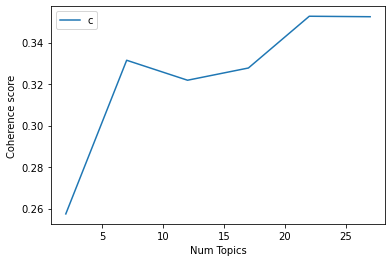

In [166]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_sg_2021_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [167]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_sg_2021_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 22

index: 0 | Num Topics = 2  has Coherence Value of 0.2575
index: 1 | Num Topics = 7  has Coherence Value of 0.3315
index: 2 | Num Topics = 12  has Coherence Value of 0.3219
index: 3 | Num Topics = 17  has Coherence Value of 0.3278
index: 4 | Num Topics = 22  has Coherence Value of 0.3527
index: 5 | Num Topics = 27  has Coherence Value of 0.3525


In [180]:
# Select optimal number of topics
optimal_model_sg_2021_score1N2N3 = model_list_sg_2021_score1N2N3[4]

In [169]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_sg_2021_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_sg_2021_score1N2N3, corpus_sg_2021_score1N2N3, id2word_sg_2021_score1N2N3)

In [170]:
print("pyLDAVis for SG topics for score=1,2,3 in 2021:")
vis_sg_2021_score1N2N3

pyLDAVis for SG topics for score=1,2,3 in 2021:


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
19     0.146295  0.010841       1        1  7.093284
4      0.053395  0.103492       2        1  6.911270
12     0.188362  0.067399       3        1  5.549103
0     -0.026456  0.047725       4        1  5.456439
25    -0.036150  0.054725       5        1  5.244710
10     0.204354 -0.129184       6        1  5.130690
24    -0.014032 -0.020167       7        1  4.469651
6     -0.048933 -0.048931       8        1  4.250488
13    -0.096807  0.055897       9        1  4.206985
17     0.008280 -0.265881      10        1  4.020018
9     -0.050315  0.046096      11        1  3.966396
3     -0.010600 -0.007128      12        1  3.734558
22     0.015145  0.034895      13        1  3.633069
16     0.082777  0.072324      14        1  3.526474
23    -0.009961 -0.001037      15        1  3.439420
20    -0.032195  0.119885      16        1  3.216133
26     0.048042 -0.030467      17        1  3.185774
15    -0.036891 -0.028415      18        1  3.082097
11     0.082541  0.014978      19        1  2.775477
8     -0.007211  0.049566      20        1  2.773059
2     -0.013260  0.024382      21        1  2.658086
1     -0.053663  0.015282      22        1  2.524275
7     -0.056079 -0.026398      23        1  2.265124
21    -0.120937  0.014042      24        1  2.173774
14    -0.103737 -0.071330      25        1  1.641024
5     -0.036621  0.002954      26        1  1.596771
18    -0.075346 -0.105545      27        1  1.475851, topic_info=         Term       Freq       Total Category  logprob  loglift
18     update  108.00000  108.000000  Default  30.0000  30.0000
372      reel   38.00000   38.000000  Default  29.0000  29.0000
306     music   32.00000   32.000000  Default  28.0000  28.0000
48      story  111.00000  111.000000  Default  27.0000  27.0000
875      view   24.00000   24.000000  Default  26.0000  26.0000
..        ...        ...         ...      ...      ...      ...
25       help    0.71914   40.293608  Topic27  -4.6824   0.1900
277  facebook    0.71914    5.721480  Topic27  -4.6824   2.1420
466   support    0.71914   10.696954  Topic27  -4.6824   1.5163
467      team    0.71914    4.711561  Topic27  -4.6824   2.3362
523   useless    0.71914    4.818291  Topic27  -4.6824   2.3138

[1547 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1085      2  0.598961       abit
0         1  0.052465       able
0         5  0.314790       able
0        11  0.157395       able
0        12  0.052465       able
...     ...       ...        ...
938      17  0.618050         yo
1056      2  0.598960       zoom
891      10  0.615498   一直显示稍后重试
892      10  0.615498  分钟还是这样的问题
893      10  0.615498       无法关注

[2542 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 5, 13, 1, 26, 11, 25, 7, 14, 18, 10, 4, 23, 17, 24, 21, 27, 16, 12, 9, 3, 2, 8, 22, 15, 6, 19])

# Export pyLDAvis as html

In [242]:
# Overall
pyLDAvis.save_html(vis_sg,'instagram_vis_sg.html')

# By-rating 
pyLDAvis.save_html(vis_sg_score1,'instagram_vis_sg_score1.html')
pyLDAvis.save_html(vis_sg_score2,'instagram_vis_sg_score2.html')
pyLDAvis.save_html(vis_sg_score3,'instagram_vis_sg_score3.html')
pyLDAvis.save_html(vis_sg_score4,'instagram_vis_sg_score4.html')
pyLDAvis.save_html(vis_sg_score5,'instagram_vis_sg_score5.html')
pyLDAvis.save_html(vis_sg_score1N2N3,'instagram_vis_sg_score1N2N3.html')

# By-rating of each year
pyLDAvis.save_html(vis_sg_2021_score1N2N3,'instagram_vis_sg_2021_score1N2N3.html')
pyLDAvis.save_html(vis_sg_2020_score1N2N3,'instagram_vis_sg_2020_score1N2N3.html')
pyLDAvis.save_html(vis_sg_2019_score1N2N3,'instagram_vis_sg_2019_score1N2N3.html')
pyLDAvis.save_html(vis_sg_2018_score1N2N3,'instagram_vis_sg_2018_score1N2N3.html')

